In [1]:
import tensorflow as tf
import foolbox as fb

import eagerpy as ep
import numpy as np
import matplotlib.pyplot as plt
import pickle
from urllib.request import urlopen

import glob
from PIL import Image
import os
from os import path

import time

In [2]:
# load key value pairs for class detection
imagenet_key_value_pairs = pickle.load(urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

In [3]:
# preprocess image for foolbox
def preprocess(image):
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, (224, 224))
    if image.shape[-1] == 1:
        image = tf.image.grayscale_to_rgb(image)
    image = image[None, ...]
    return image

In [4]:
# decode predictions number to label
def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]
decode_predictions = tf.keras.applications.efficientnet.decode_predictions

In [5]:
# find label idx of prediction
def find_label_id(label):
    for key, value in imagenet_key_value_pairs.items():
        if label in value:
            return key

In [6]:
# Keras Applications are canned architectures with pre-trained weights.
pretrained_model = tf.keras.applications.EfficientNetB0(weights='imagenet') 
preprocessing = dict()
bounds = (0, 255)

# tensorflow model into foolbox model
fmodel = fb.TensorFlowModel(pretrained_model, bounds=bounds, preprocessing=preprocessing)

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


Model accuracy on sample images: 1.0


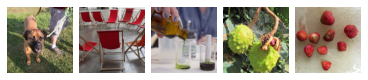

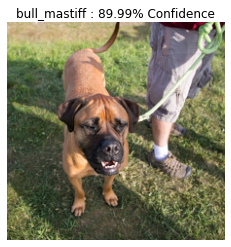

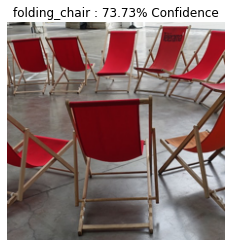

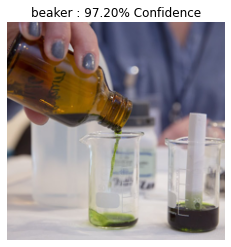

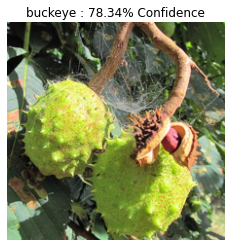

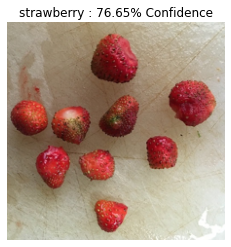

In [7]:
# TEST THAT FOOLBOX WORKS

# optionally transform the bounds of the input space of our model
fmodel = fmodel.transform_bounds((0, 1))

# sample images
images, labels = fb.utils.samples(fmodel, dataset='imagenet', batchsize=5)

# check accuracy on sample images and plot them
accuracy = fb.utils.accuracy(fmodel, images, labels)
print('Model accuracy on sample images:', accuracy)
# print(labels)
fb.plot.images(images)
plt.show()
plt.close()

# Predict with pre-trained model
for x in images:
    image = np.expand_dims(x, axis=0)
    image_probs = pretrained_model.predict(image*255) # 0,1 to 0,255
    plt.figure()
    plt.imshow(x)
    _, image_class, class_confidence = get_imagenet_label(image_probs)
    plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
    plt.axis('off')
    plt.show()

In [8]:
#Creates list of paths to images in the dataset.
COCO_original = glob.glob('datasets/coco_original/data/*.jpg')
COCO_224 = glob.glob('datasets/coco_224/data/*.jpg')

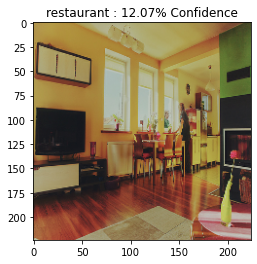

Model accuracy before perturbation: 0.0
LinfFastGradientAttack(rel_stepsize=1.0, abs_stepsize=None, steps=1, random_start=False)
Model accuracy after perturbation: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


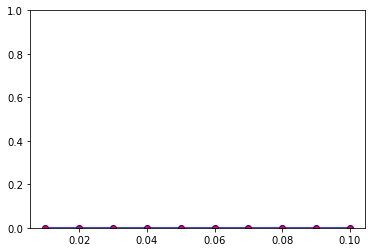

In [15]:
### Run crafting on one image and visualize the results

def show_image_with_class(image, image_class, class_confidence):
    plt.figure()
    #plt.imshow(image[0] * 0.5 + 0.5)  # To change [-1, 1] to [0,1]
    plt.imshow(image[0]/255)
    plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
    plt.show()    

def preprocess_image(image):
    image_raw = tf.io.read_file(fname)
    image = tf.image.decode_image(image_raw)
    image = preprocess(image)
    return image

def convert_to_tensor(image, label): 
    #print('Min values in image-array: ' + str(np.amin(image)) + ' Max values in image-array: ' + str(np.amax(image)))
    image = (image + 1.0)/2 # shift from [-1,1] to [0,1] with 0.5 mean
    image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
    label_tensor = tf.convert_to_tensor([label], dtype=tf.int32) # needs to be list
    #print('Min values in image-array: ' + str(np.amin(image)) + ' Max values in image-array: ' + str(np.amax(image)))
    return image_tensor, label_tensor

def get_class_data(probs):
    _, image_class, class_confidence = get_imagenet_label(probs)
    image_class = image_class.replace("_", " ")
    image_label_id = find_label_id(image_class)
    return image_label_id, image_class, class_confidence

def test_foolbox(image_tensor, label_tensor):
    # Testing that conversion works
    #fb.plot.images(image_tensor, scale=4.) messes plotting of the
    accuracy = fb.utils.accuracy(fmodel, image_tensor, label_tensor)
    print('Model accuracy before perturbation:', accuracy)
    plt.show

def craft_adversarial(image, label):
    epsilons = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.10]
    attack = fb.attacks.LinfFastGradientAttack()
    print(attack)
    # use eagerpy tensors own images
    images = ep.astensor(image)
    labels = ep.astensor(label)
    # raw = The raw adversarial examples. --> depends on attack
    # clipped = The clipped adversarial examples --> guaranteed to not be perturbed more than epsilon.
    # is_adv = boolean for each sample image. True if misclassified and within the epsilon balls around the clean sample.
    raw, clipped, is_adv = attack(fmodel, images, labels, epsilons=epsilons)
    # show accuracy vs epsilons
    robust_accuracy = 1 - is_adv.float32().mean(axis=-1)
    plt.plot(epsilons, robust_accuracy.numpy(), color='blue', linestyle='solid', marker='o', markerfacecolor='red')
    plt.ylim([0, 1])
    print('Model accuracy after perturbation:', robust_accuracy.numpy())
    plt.show()
    return clipped

for fname in COCO_original:
    
    #Preprocess
    image = preprocess_image(fname)
    image_probs = pretrained_model.predict(image)
    image_label_id, image_class, class_confidence = get_class_data(image_probs)
    show_image_with_class(image, image_class, class_confidence)
    
    image_tensor, label_tensor = convert_to_tensor(image, image_label_id)
    test_foolbox(image_tensor, label_tensor)
    
    #Craft Adversarial
    clipped = craft_adversarial(image_tensor, label_tensor)
    
    #Visualize Original Image, Perturbation and Adversarial Image
    break

tf.Tensor(12.854438, shape=(), dtype=float32)


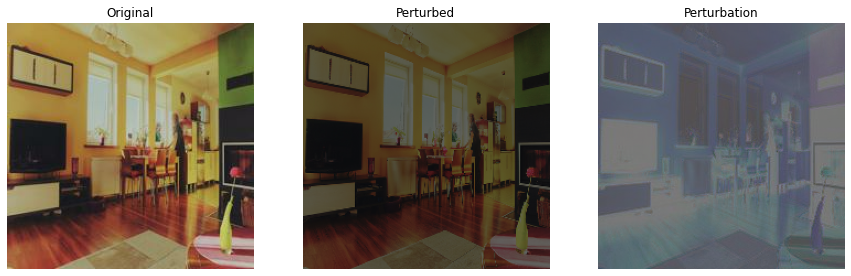

In [16]:
def plot_images(im1,im2):
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(1, 3, 1)
    imgplot = plt.imshow(im1)
    ax.set_title('Original')
    plt.axis('off')
    ax = fig.add_subplot(1, 3, 2)
    imgplot = plt.imshow(im2)
    ax.set_title('Perturbed')
    plt.axis('off')
    
    ax = fig.add_subplot(1, 3, 3)
    imgplot = plt.imshow((im2-im1)* 0.5 + 0.5)
    ax.set_title('Perturbation')
    plt.axis('off')
    plt.show()
    
    

def calculate_psnr(im1, im2):
    im1 = tf.io.read_file(COCO_224[0])
    im1 = tf.image.decode_jpeg(im1, channels=3)
    im1 = tf.image.convert_image_dtype(im1, tf.float32)
    im2 = tf.convert_to_tensor(tf.squeeze(im2.numpy()))
    psnr1 = tf.image.psnr(im1, im2, max_val=1.0)
    print(psnr1)
    plot_images(im1,im2)
    
    
for ae in range(len(clipped)):
    calculate_psnr(COCO_224[0], (clipped[ae]/255))
    break


Images classified as:
000000000139 762 = restaurant
000000000285 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


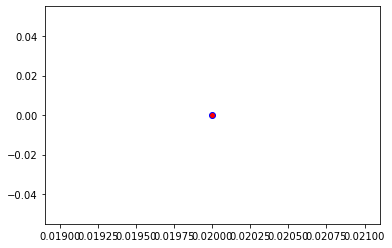

Crafting adversarial images took: 7.040673732757568 seconds 

Images classified as:
000000000632 750 = quilt
000000000724 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


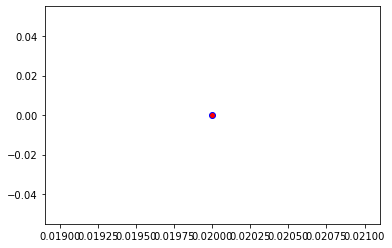

Crafting adversarial images took: 6.840802907943726 seconds 

Images classified as:
000000000776 850 = teddy
000000000785 248 = ski
Min values in image-array: 0.0 Max values in image-array: 247.40231
Min values in image-array: 0.0 Max values in image-array: 0.9702051
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


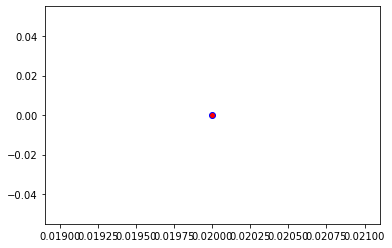

Crafting adversarial images took: 7.312335252761841 seconds 

Images classified as:
000000000802 651 = microwave
000000000872 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


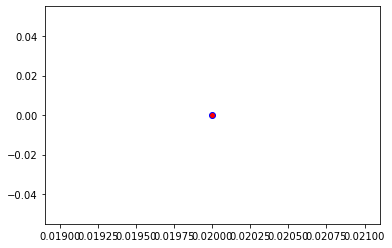

Crafting adversarial images took: 7.2958173751831055 seconds 

Images classified as:
000000000885 752 = racket
000000001000 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


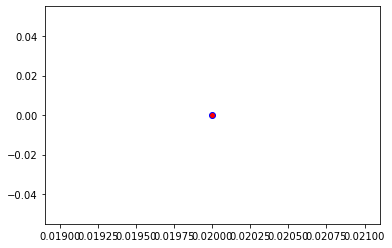

Crafting adversarial images took: 7.079810857772827 seconds 

Images classified as:
000000001268 821 = steel arch bridge
000000001296 419 = Band Aid
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


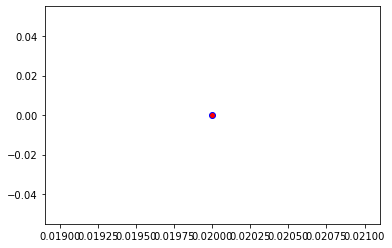

Crafting adversarial images took: 7.170492649078369 seconds 

Images classified as:
000000001353 412 = barrel
000000001425 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


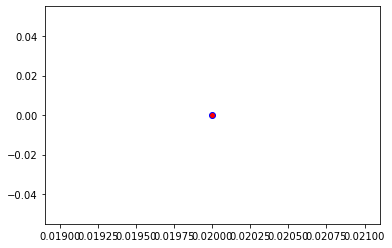

Crafting adversarial images took: 7.369107484817505 seconds 

Images classified as:
000000001490 693 = paddle
000000001503 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


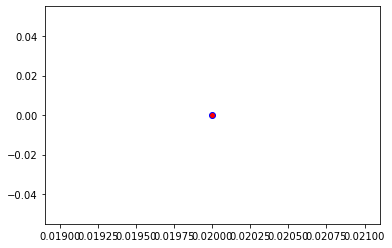

Crafting adversarial images took: 7.2311015129089355 seconds 

Images classified as:
000000001532 920 = traffic light
000000001584 874 = trolleybus
Min values in image-array: 0.375 Max values in image-array: 255.0
Min values in image-array: 0.0014705883 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


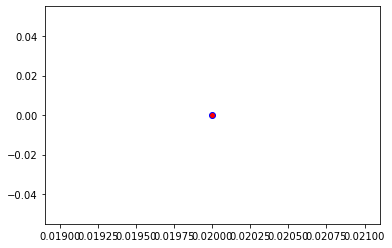

Crafting adversarial images took: 7.182588815689087 seconds 

Images classified as:
000000001675 620 = laptop
000000001761 821 = steel arch bridge
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


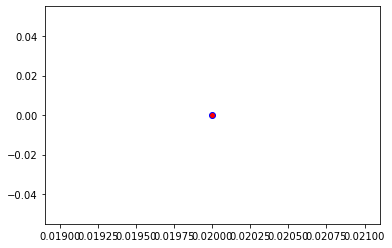

Crafting adversarial images took: 7.250047922134399 seconds 

Images classified as:
000000001818 340 = zebra
000000001993 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


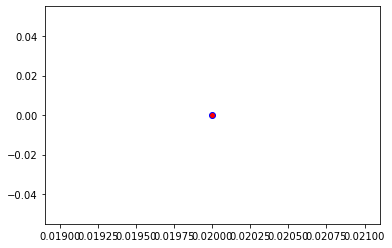

Crafting adversarial images took: 7.400191307067871 seconds 

Images classified as:
000000002006 874 = trolleybus
000000002149 948 = Granny Smith
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


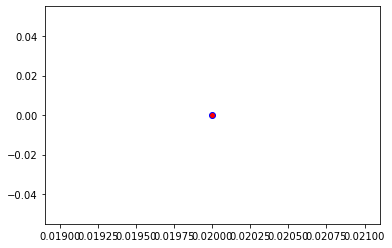

Crafting adversarial images took: 7.389938592910767 seconds 

Images classified as:
000000002153 981 = ballplayer
000000002157 927 = trifle
Min values in image-array: 0.0 Max values in image-array: 254.80469
Min values in image-array: 0.0 Max values in image-array: 0.9992341
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


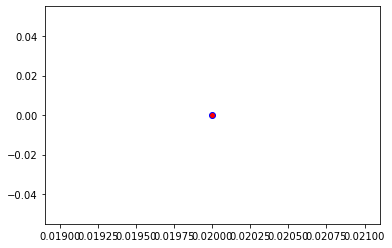

Crafting adversarial images took: 7.328148603439331 seconds 

Images classified as:
000000002261 975 = lakeside
000000002299 715 = pickelhaube
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


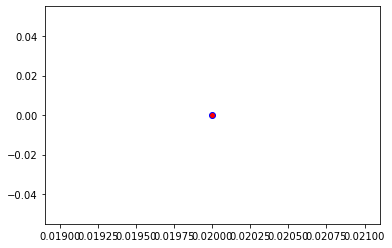

Crafting adversarial images took: 7.401475429534912 seconds 

Images classified as:
000000002431 461 = plate
000000002473 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


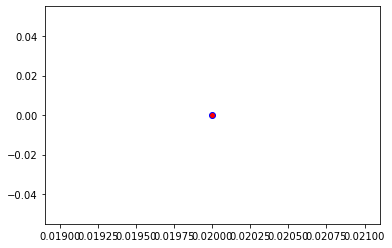

Crafting adversarial images took: 7.33961820602417 seconds 

Images classified as:
000000002532 140 = alp
000000002587 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


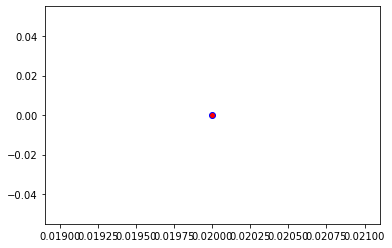

Crafting adversarial images took: 7.287918567657471 seconds 

Images classified as:
000000002592 504 = coffee mug
000000002685 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


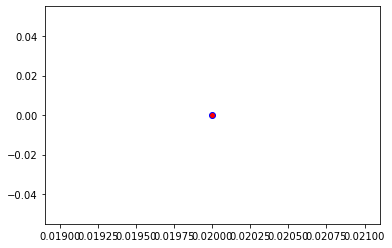

Crafting adversarial images took: 7.280297517776489 seconds 

Images classified as:
000000002923 403 = aircraft carrier
000000003156 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


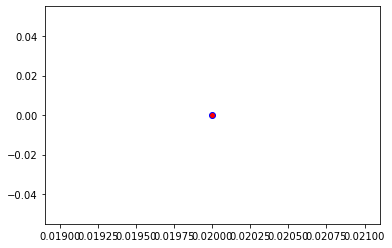

Crafting adversarial images took: 7.352208137512207 seconds 

Images classified as:
000000003255 140 = alp
000000003501 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


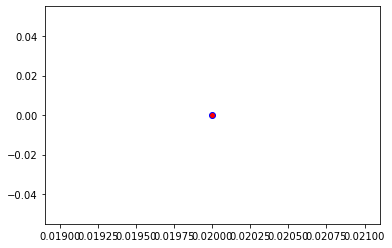

Crafting adversarial images took: 7.2313292026519775 seconds 

Images classified as:
000000003553 835 = sundial
000000003661 940 = spaghetti squash
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


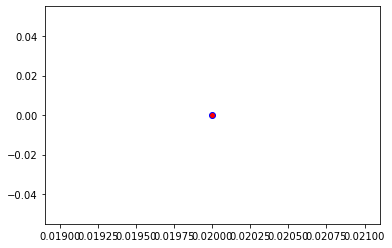

Crafting adversarial images took: 7.22119402885437 seconds 

Images classified as:
000000003845 965 = burrito
000000003934 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


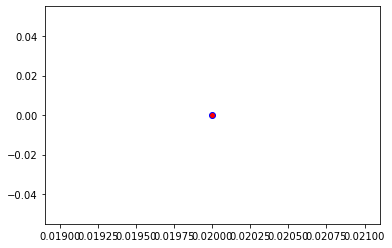

Crafting adversarial images took: 7.261565685272217 seconds 

Images classified as:
000000004134 906 = Windsor tie
000000004395 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


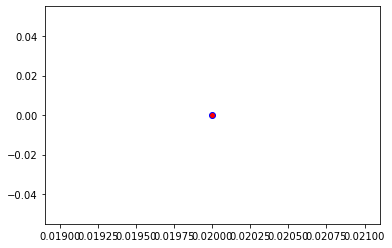

Crafting adversarial images took: 7.3019304275512695 seconds 

Images classified as:
000000004495 831 = studio couch
000000004765 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 254.87741
Min values in image-array: 0.0 Max values in image-array: 0.9995192
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


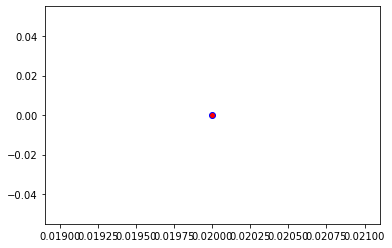

Crafting adversarial images took: 7.4284892082214355 seconds 

Images classified as:
000000004795 508 = computer keyboard
000000005001 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


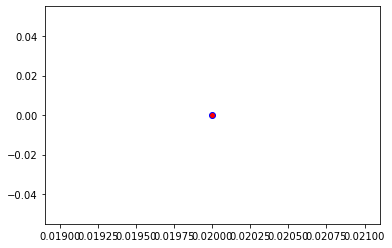

Crafting adversarial images took: 7.201761960983276 seconds 

Images classified as:
000000005037 829 = streetcar
000000005060 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


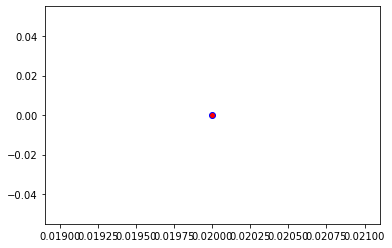

Crafting adversarial images took: 7.279149055480957 seconds 

Images classified as:
000000005193 747 = punching bag
000000005477 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


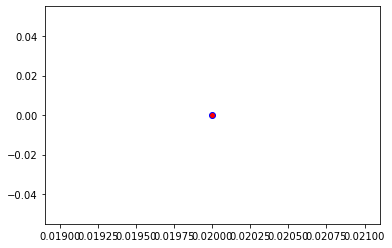

Crafting adversarial images took: 7.285364627838135 seconds 

Images classified as:
000000005503 861 = toilet seat
000000005529 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


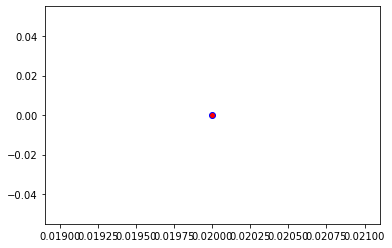

Crafting adversarial images took: 7.222491502761841 seconds 

Images classified as:
000000005586 416 = balance beam
000000005600 941 = acorn squash
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


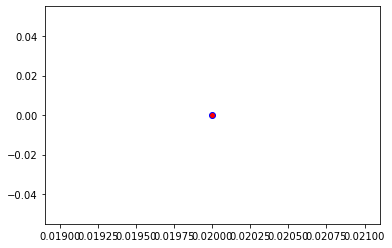

Crafting adversarial images took: 7.373617649078369 seconds 

Images classified as:
000000005992 5 = ram
000000006012 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


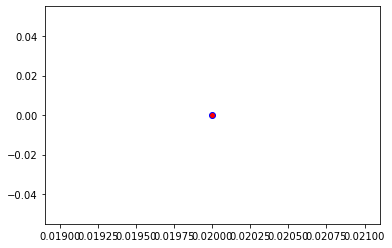

Crafting adversarial images took: 7.389569282531738 seconds 

Images classified as:
000000006040 829 = streetcar
000000006213 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


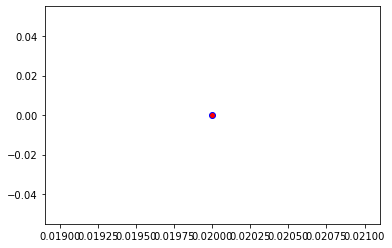

Crafting adversarial images took: 7.358201742172241 seconds 

Images classified as:
000000006460 864 = wreck
000000006471 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


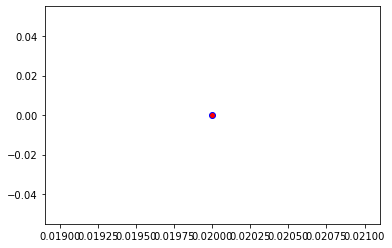

Crafting adversarial images took: 7.426295518875122 seconds 

Images classified as:
000000006614 995 = earthstar
000000006723 743 = prison
Min values in image-array: 0.26849502 Max values in image-array: 255.0
Min values in image-array: 0.0010529216 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


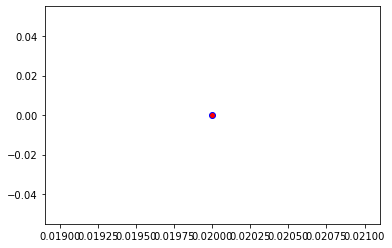

Crafting adversarial images took: 7.555846214294434 seconds 

Images classified as:
000000006763 457 = bow tie
000000006771 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


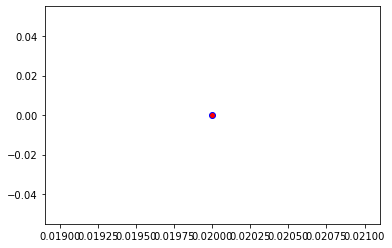

Crafting adversarial images took: 7.387510538101196 seconds 

Images classified as:
000000006818 999 = toilet tissue
000000006894 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


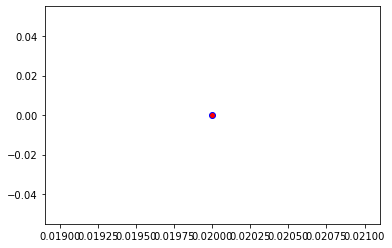

Crafting adversarial images took: 7.327648401260376 seconds 

Images classified as:
000000006954 768 = rugby ball
000000007088 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


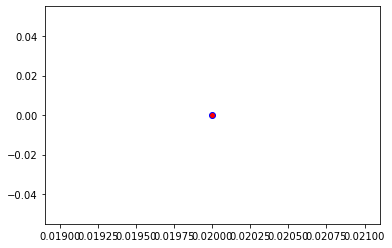

Crafting adversarial images took: 7.389733076095581 seconds 

Images classified as:
000000007108 386 = African elephant
000000007278 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


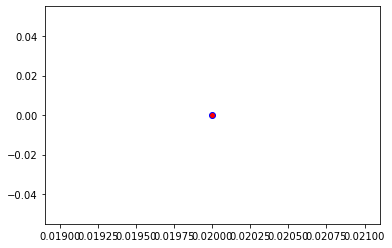

Crafting adversarial images took: 7.910598516464233 seconds 

Images classified as:
000000007281 173 = Ibizan hound
000000007386 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


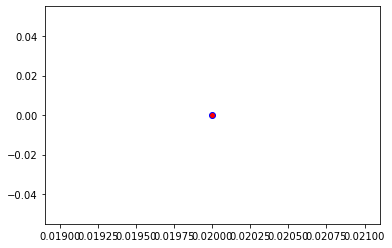

Crafting adversarial images took: 7.333451986312866 seconds 

Images classified as:
000000007511 977 = sandbar
000000007574 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


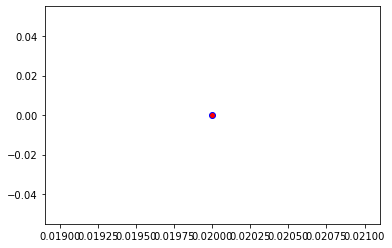

Crafting adversarial images took: 7.440241098403931 seconds 

Images classified as:
000000007784 701 = parachute
000000007795 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


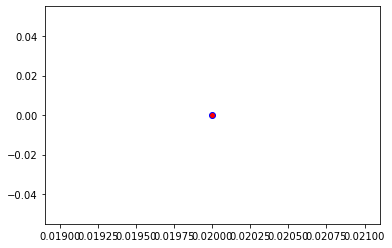

Crafting adversarial images took: 7.278507947921753 seconds 

Images classified as:
000000007816 518 = crash helmet
000000007818 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


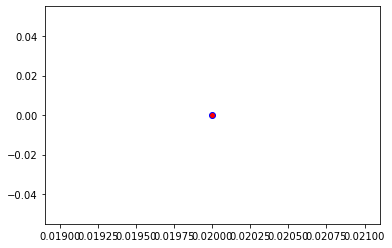

Crafting adversarial images took: 8.367652177810669 seconds 

Images classified as:
000000007888 448 = birdhouse
000000007977 478 = carton
Min values in image-array: 0.0 Max values in image-array: 254.55626
Min values in image-array: 0.0 Max values in image-array: 0.99825984
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


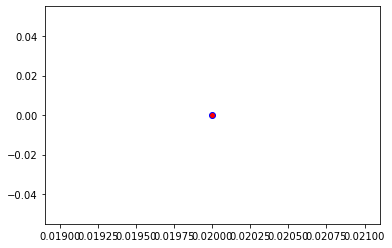

Crafting adversarial images took: 7.757772445678711 seconds 

Images classified as:
000000007991 942 = butternut squash
000000008021 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


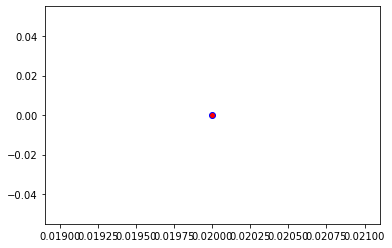

Crafting adversarial images took: 7.350186824798584 seconds 

Images classified as:
000000008211 603 = horse cart
000000008277 924 = guacamole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


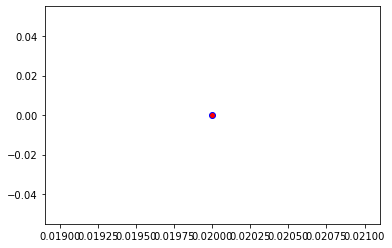

Crafting adversarial images took: 7.691464424133301 seconds 

Images classified as:
000000008532 906 = Windsor tie
000000008629 940 = spaghetti squash
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


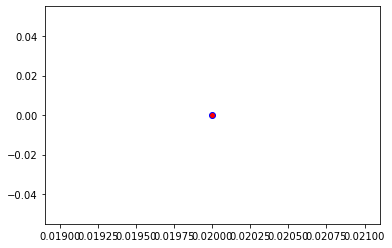

Crafting adversarial images took: 7.370909929275513 seconds 

Images classified as:
000000008690 227 = kelpie
000000008762 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


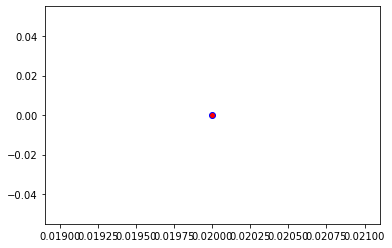

Crafting adversarial images took: 7.441844940185547 seconds 

Images classified as:
000000008844 954 = banana
000000008899 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


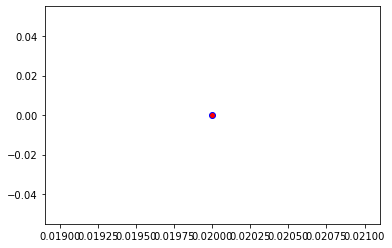

Crafting adversarial images took: 7.400777578353882 seconds 

Images classified as:
000000009378 793 = shower cap
000000009400 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


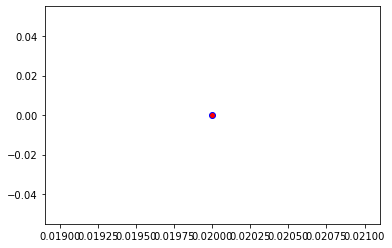

Crafting adversarial images took: 7.399462938308716 seconds 

Images classified as:
000000009448 879 = umbrella
000000009483 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


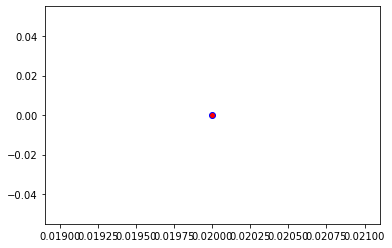

Crafting adversarial images took: 7.419659852981567 seconds 

Images classified as:
000000009590 762 = restaurant
000000009769 803 = snowplow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


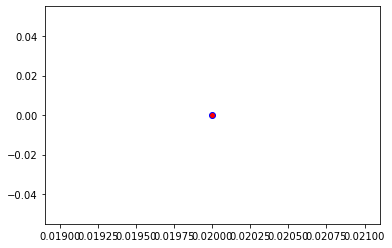

Crafting adversarial images took: 7.328029632568359 seconds 

Images classified as:
000000009772 435 = bathtub
000000009891 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


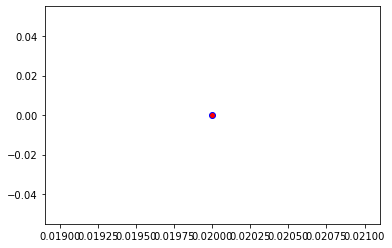

Crafting adversarial images took: 7.318889141082764 seconds 

Images classified as:
000000009914 933 = cheeseburger
000000010092 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


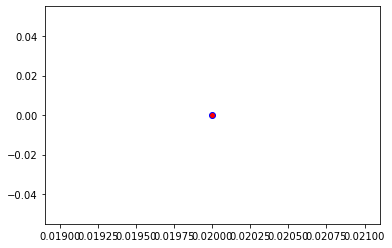

Crafting adversarial images took: 7.3265464305877686 seconds 

Images classified as:
000000010363 287 = lynx
000000010583 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


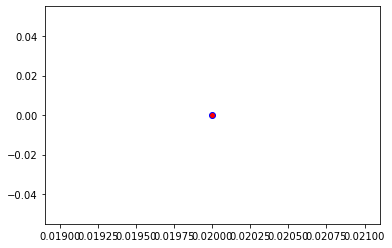

Crafting adversarial images took: 7.301597356796265 seconds 

Images classified as:
000000010707 731 = plunger
000000010764 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


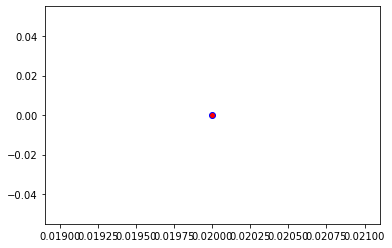

Crafting adversarial images took: 7.382877588272095 seconds 

Images classified as:
000000010977 648 = medicine chest
000000010995 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


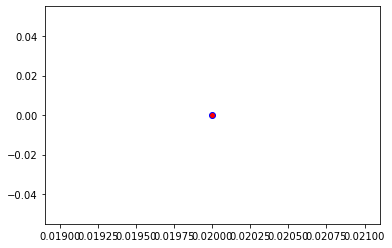

Crafting adversarial images took: 7.28744101524353 seconds 

Images classified as:
000000011051 639 = suit
000000011122 489 = chainlink fence
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


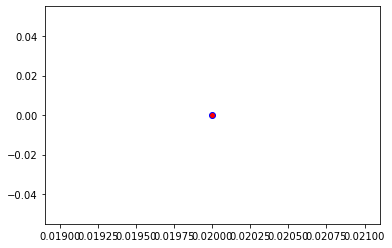

Crafting adversarial images took: 7.369912147521973 seconds 

Images classified as:
000000011149 870 = tricycle
000000011197 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


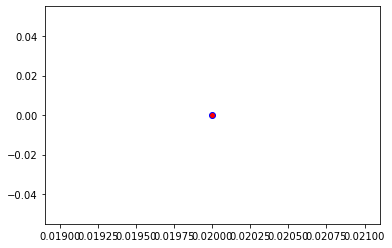

Crafting adversarial images took: 7.259478330612183 seconds 

Images classified as:
000000011511 568 = fur coat
000000011615 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


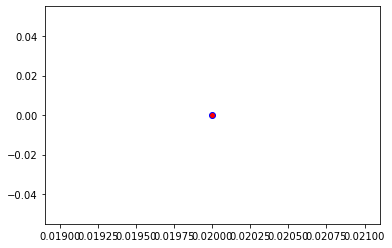

Crafting adversarial images took: 7.43389892578125 seconds 

Images classified as:
000000011699 882 = vacuum
000000011760 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


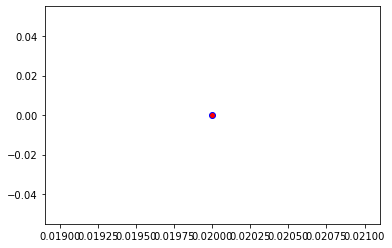

Crafting adversarial images took: 7.325995922088623 seconds 

Images classified as:
000000011813 872 = tripod
000000012062 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


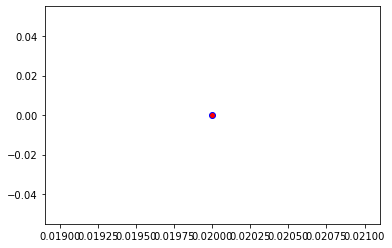

Crafting adversarial images took: 7.2694878578186035 seconds 

Images classified as:
000000012120 722 = ping-pong ball
000000012280 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


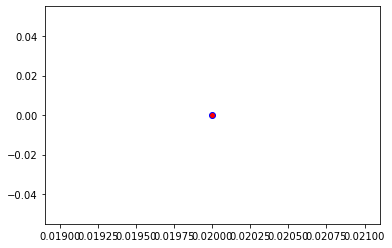

Crafting adversarial images took: 7.345784425735474 seconds 

Images classified as:
000000012576 963 = pizza
000000012639 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


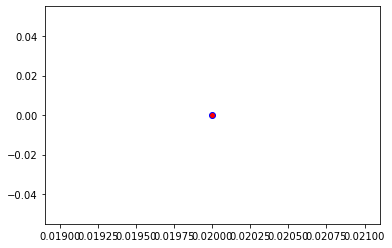

Crafting adversarial images took: 7.461656808853149 seconds 

Images classified as:
000000012667 528 = dial telephone
000000012670 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


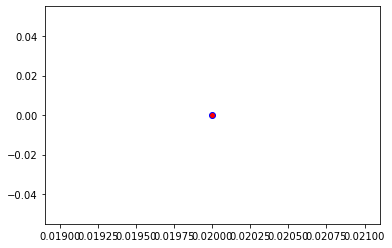

Crafting adversarial images took: 7.400484800338745 seconds 

Images classified as:
000000012748 339 = sorrel
000000013004 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


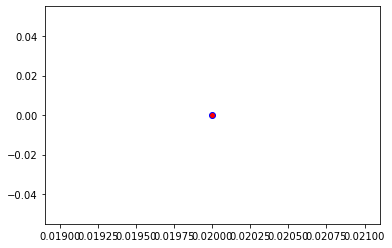

Crafting adversarial images took: 7.496374845504761 seconds 

Images classified as:
000000013177 535 = disk brake
000000013201 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


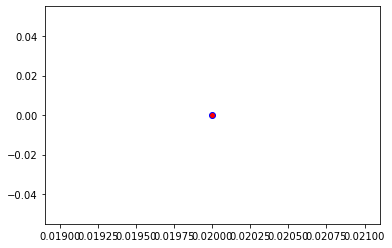

Crafting adversarial images took: 7.278102397918701 seconds 

Images classified as:
000000013291 805 = soccer ball
000000013348 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


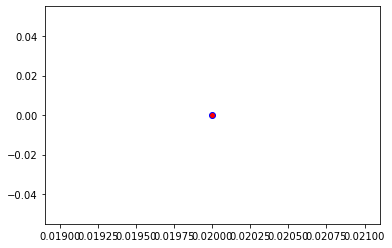

Crafting adversarial images took: 7.3119261264801025 seconds 

Images classified as:
000000013546 880 = unicycle
000000013597 960 = chocolate sauce
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


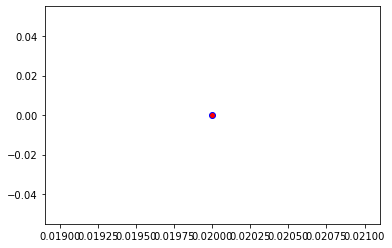

Crafting adversarial images took: 7.317363739013672 seconds 

Images classified as:
000000013659 624 = library
000000013729 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


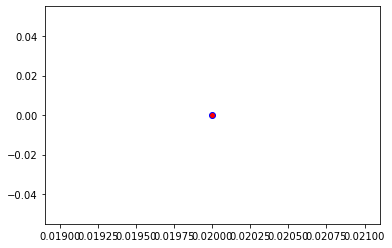

Crafting adversarial images took: 7.337839365005493 seconds 

Images classified as:
000000013774 417 = balloon
000000013923 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


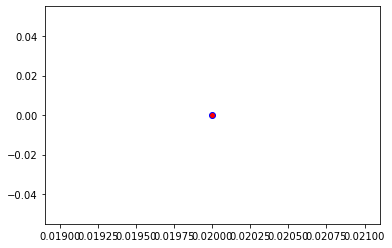

Crafting adversarial images took: 7.573946714401245 seconds 

Images classified as:
000000014007 861 = toilet seat
000000014038 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


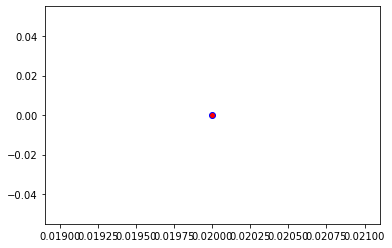

Crafting adversarial images took: 7.547834873199463 seconds 

Images classified as:
000000014226 681 = notebook
000000014380 839 = suspension bridge
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


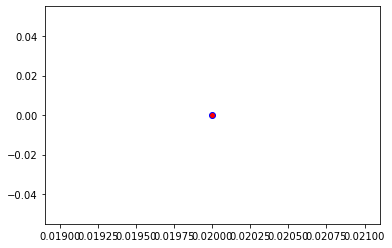

Crafting adversarial images took: 7.351615905761719 seconds 

Images classified as:
000000014439 701 = parachute
000000014473 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


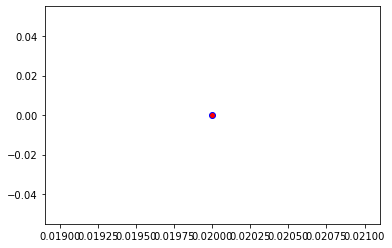

Crafting adversarial images took: 7.412986516952515 seconds 

Images classified as:
000000014831 283 = Persian cat
000000014888 229 = Old English sheepdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


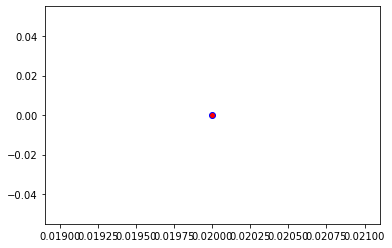

Crafting adversarial images took: 7.622375726699829 seconds 

Images classified as:
000000015079 928 = ice cream
000000015254 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


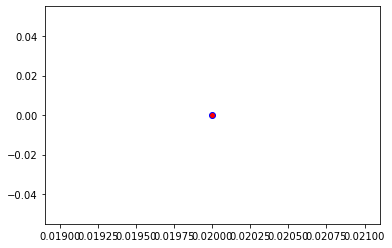

Crafting adversarial images took: 8.249850273132324 seconds 

Images classified as:
000000015272 920 = traffic light
000000015278 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


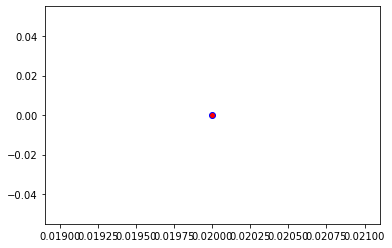

Crafting adversarial images took: 7.552637338638306 seconds 

Images classified as:
000000015335 788 = shoe shop
000000015338 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


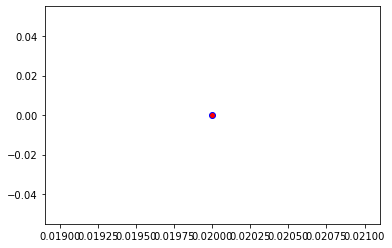

Crafting adversarial images took: 7.427532434463501 seconds 

Images classified as:
000000015440 919 = street sign
000000015497 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


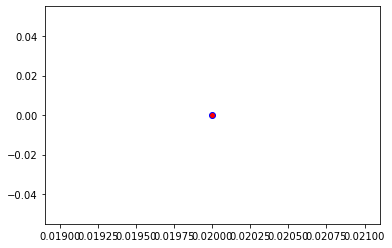

Crafting adversarial images took: 7.443664789199829 seconds 

Images classified as:
000000015517 404 = liner
000000015597 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


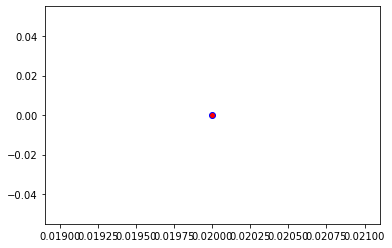

Crafting adversarial images took: 7.43060302734375 seconds 

Images classified as:
000000015660 977 = sandbar
000000015746 471 = cannon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


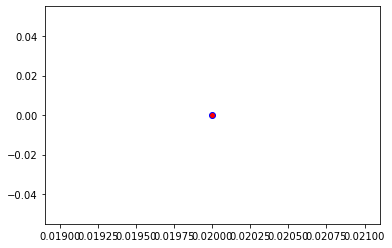

Crafting adversarial images took: 7.354296684265137 seconds 

Images classified as:
000000015751 113 = nail
000000015956 339 = sorrel
Min values in image-array: 0.23102522 Max values in image-array: 255.0
Min values in image-array: 0.00090598123 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


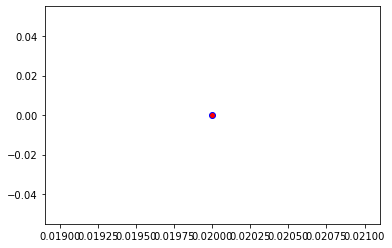

Crafting adversarial images took: 7.499670743942261 seconds 

Images classified as:
000000016010 346 = water buffalo
000000016228 779 = school bus
Min values in image-array: 0.07988301 Max values in image-array: 254.92255
Min values in image-array: 0.0003132667 Max values in image-array: 0.99969625
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


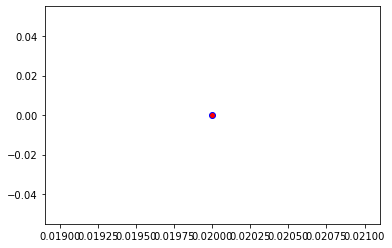

Crafting adversarial images took: 7.321630001068115 seconds 

Images classified as:
000000016249 424 = barbershop
000000016439 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


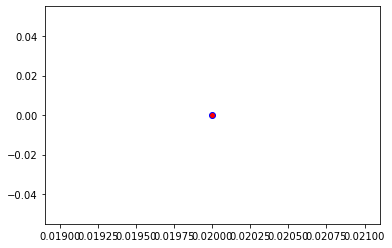

Crafting adversarial images took: 7.688575506210327 seconds 

Images classified as:
000000016451 978 = seashore
000000016502 336 = marmot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


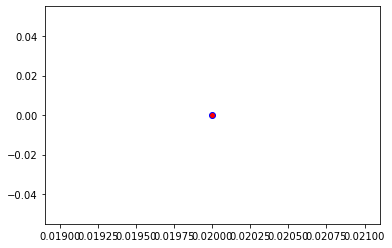

Crafting adversarial images took: 7.619375467300415 seconds 

Images classified as:
000000016598 504 = coffee mug
000000016958 556 = fire screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


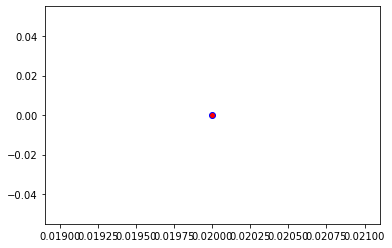

Crafting adversarial images took: 7.251225709915161 seconds 

Images classified as:
000000017029 220 = Sussex spaniel
000000017031 246 = Great Dane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


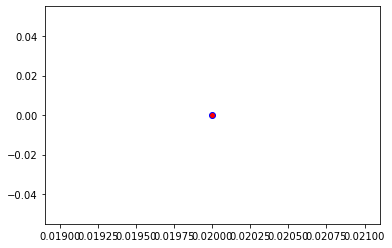

Crafting adversarial images took: 7.291323661804199 seconds 

Images classified as:
000000017115 340 = zebra
000000017178 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


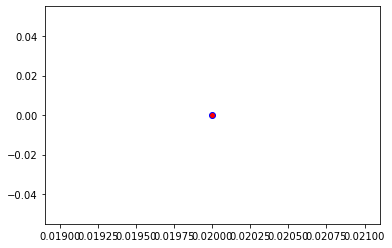

Crafting adversarial images took: 7.521233320236206 seconds 

Images classified as:
000000017182 526 = desk
000000017207 675 = moving van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


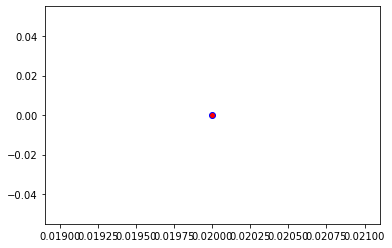

Crafting adversarial images took: 7.30567193031311 seconds 

Images classified as:
000000017379 598 = home theater
000000017436 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


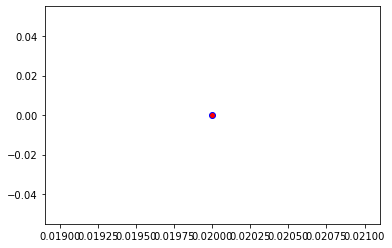

Crafting adversarial images took: 7.2713422775268555 seconds 

Images classified as:
000000017627 874 = trolleybus
000000017714 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


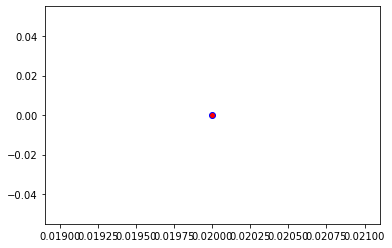

Crafting adversarial images took: 7.3038811683654785 seconds 

Images classified as:
000000017899 961 = dough
000000017905 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


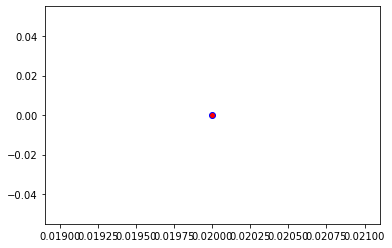

Crafting adversarial images took: 7.341573715209961 seconds 

Images classified as:
000000017959 701 = parachute
000000018150 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 254.95648
Min values in image-array: 0.0 Max values in image-array: 0.99982935
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


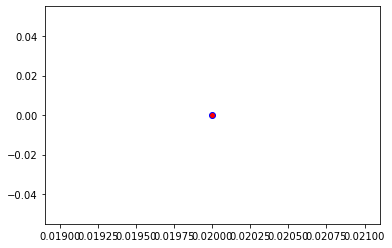

Crafting adversarial images took: 7.309449195861816 seconds 

Images classified as:
000000018193 902 = whistle
000000018380 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


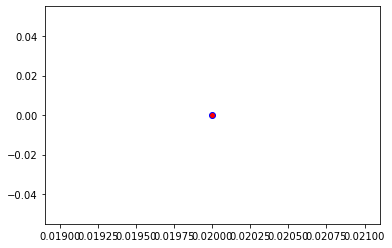

Crafting adversarial images took: 7.425681114196777 seconds 

Images classified as:
000000018491 981 = ballplayer
000000018519 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


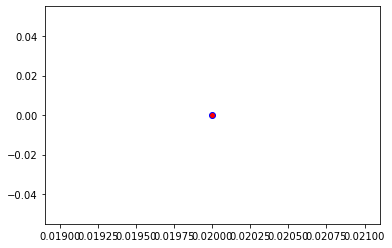

Crafting adversarial images took: 7.418225288391113 seconds 

Images classified as:
000000018575 461 = plate
000000018737 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


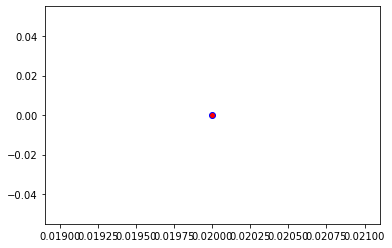

Crafting adversarial images took: 7.471453428268433 seconds 

Images classified as:
000000018770 639 = suit
000000018833 770 = running shoe
Min values in image-array: 0.0 Max values in image-array: 254.86128
Min values in image-array: 0.0 Max values in image-array: 0.999456
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


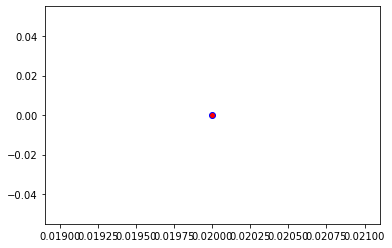

Crafting adversarial images took: 7.276199817657471 seconds 

Images classified as:
000000018837 569 = garbage truck
000000019042 137 = American coot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


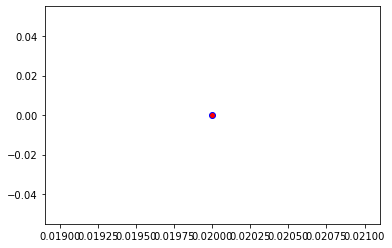

Crafting adversarial images took: 7.368815898895264 seconds 

Images classified as:
000000019109 670 = motor scooter
000000019221 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


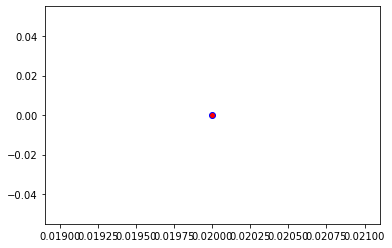

Crafting adversarial images took: 7.281272649765015 seconds 

Images classified as:
000000019402 568 = fur coat
000000019432 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


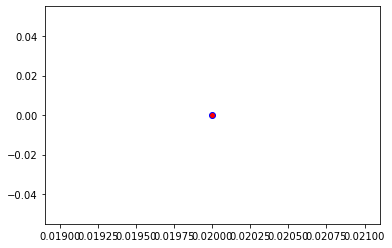

Crafting adversarial images took: 7.268510818481445 seconds 

Images classified as:
000000019742 883 = vase
000000019786 456 = bow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


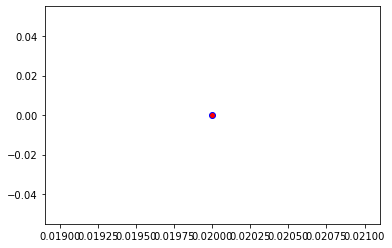

Crafting adversarial images took: 7.25204873085022 seconds 

Images classified as:
000000019924 515 = cowboy hat
000000020059 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


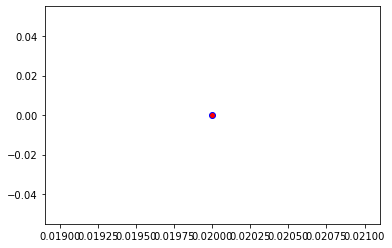

Crafting adversarial images took: 7.347087860107422 seconds 

Images classified as:
000000020107 412 = ashcan
000000020247 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


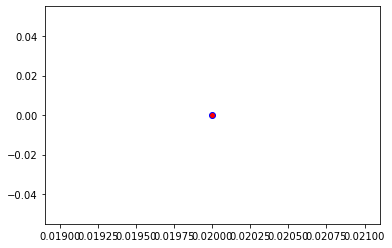

Crafting adversarial images took: 7.376569747924805 seconds 

Images classified as:
000000020333 463 = bucket
000000020553 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


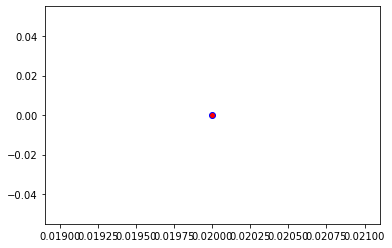

Crafting adversarial images took: 7.69275689125061 seconds 

Images classified as:
000000020571 536 = dock
000000020992 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


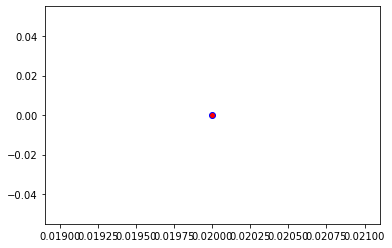

Crafting adversarial images took: 7.37211537361145 seconds 

Images classified as:
000000021167 639 = suit
000000021465 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


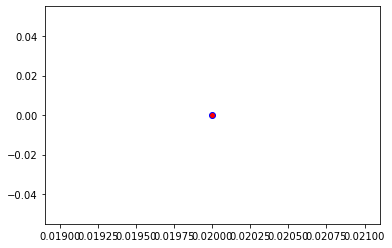

Crafting adversarial images took: 7.32096529006958 seconds 

Images classified as:
000000021503 961 = dough
000000021604 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


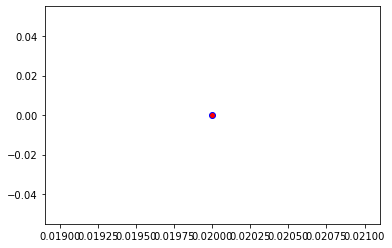

Crafting adversarial images took: 7.318965673446655 seconds 

Images classified as:
000000021839 880 = unicycle
000000021879 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


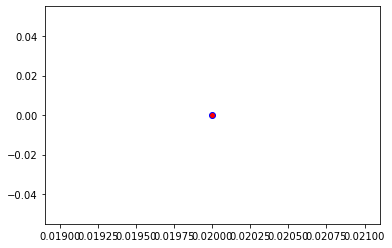

Crafting adversarial images took: 7.45490837097168 seconds 

Images classified as:
000000021903 385 = Indian elephant
000000022192 171 = Italian greyhound
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


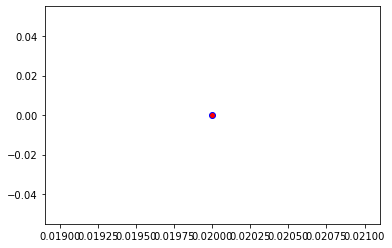

Crafting adversarial images took: 7.4714555740356445 seconds 

Images classified as:
000000022371 681 = notebook
000000022396 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


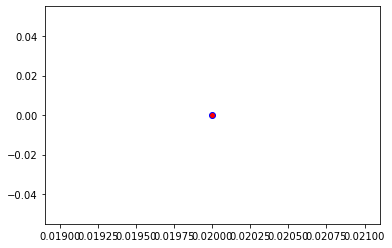

Crafting adversarial images took: 7.429624319076538 seconds 

Images classified as:
000000022479 354 = Arabian camel
000000022589 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


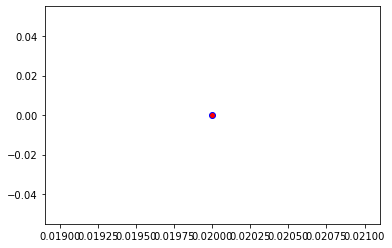

Crafting adversarial images took: 7.3657612800598145 seconds 

Images classified as:
000000022623 761 = remote control
000000022705 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


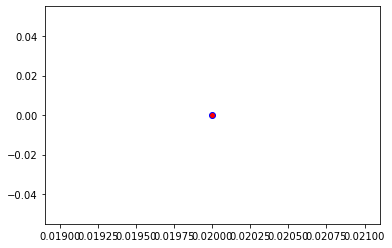

Crafting adversarial images took: 7.465776443481445 seconds 

Images classified as:
000000022755 475 = car mirror
000000022892 105 = koala
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


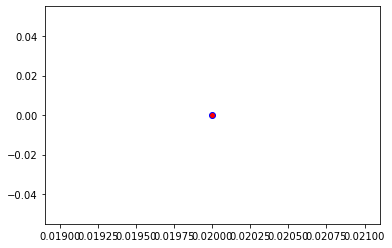

Crafting adversarial images took: 7.396015167236328 seconds 

Images classified as:
000000022935 890 = volleyball
000000022969 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


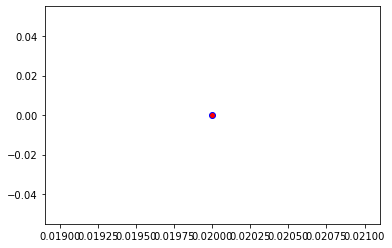

Crafting adversarial images took: 7.265675067901611 seconds 

Images classified as:
000000023023 588 = hamper
000000023034 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


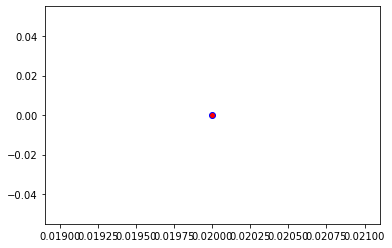

Crafting adversarial images took: 7.5737433433532715 seconds 

Images classified as:
000000023126 523 = crutch
000000023230 99 = goose
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


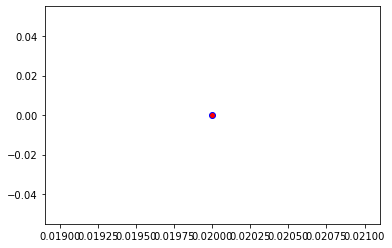

Crafting adversarial images took: 7.266193389892578 seconds 

Images classified as:
000000023272 568 = fur coat
000000023359 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


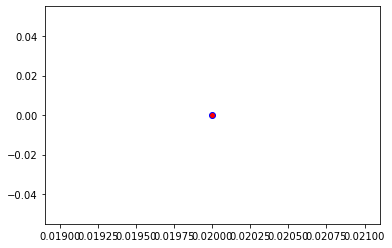

Crafting adversarial images took: 7.225015878677368 seconds 

Images classified as:
000000023666 896 = washbasin
000000023751 405 = airship
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


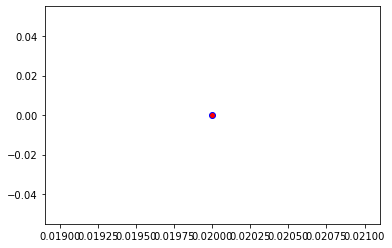

Crafting adversarial images took: 7.29009222984314 seconds 

Images classified as:
000000023781 329 = cucumber
000000023899 520 = crib
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


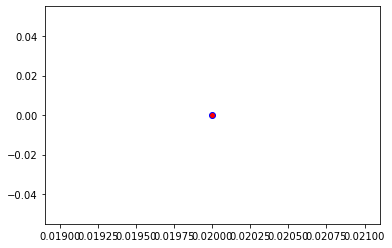

Crafting adversarial images took: 7.803639650344849 seconds 

Images classified as:
000000023937 294 = brown bear
000000024021 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


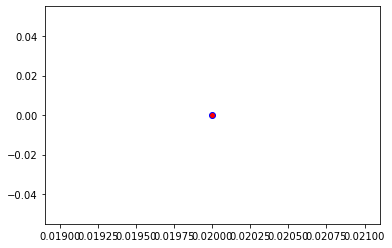

Crafting adversarial images took: 7.314826488494873 seconds 

Images classified as:
000000024027 557 = flagpole
000000024144 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


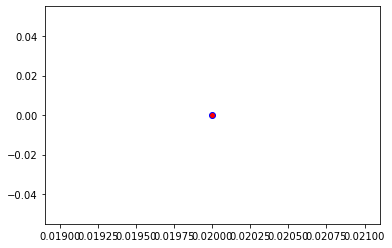

Crafting adversarial images took: 7.280886173248291 seconds 

Images classified as:
000000024243 480 = cash machine
000000024567 0 = tench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


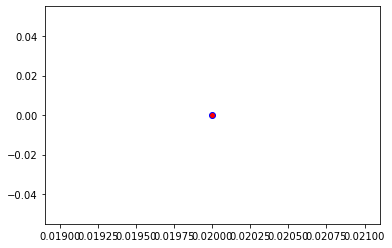

Crafting adversarial images took: 7.381490230560303 seconds 

Images classified as:
000000024610 453 = bookcase
000000024919 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


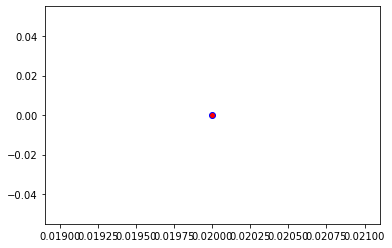

Crafting adversarial images took: 7.429391860961914 seconds 

Images classified as:
000000025057 541 = drum
000000025096 611 = jigsaw puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


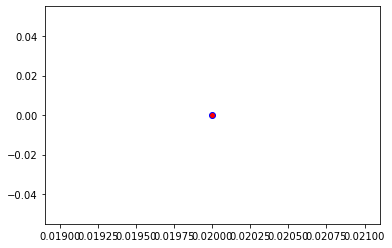

Crafting adversarial images took: 7.542647361755371 seconds 

Images classified as:
000000025139 340 = zebra
000000025181 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


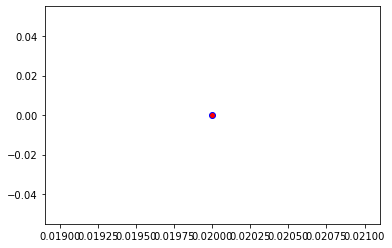

Crafting adversarial images took: 7.503570795059204 seconds 

Images classified as:
000000025228 980 = volcano
000000025386 470 = candle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


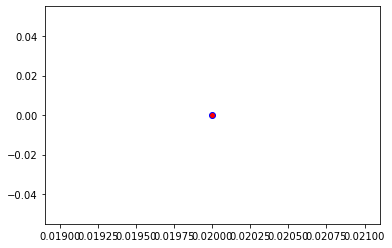

Crafting adversarial images took: 7.42471170425415 seconds 

Images classified as:
000000025393 617 = lab coat
000000025394 647 = measuring cup
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


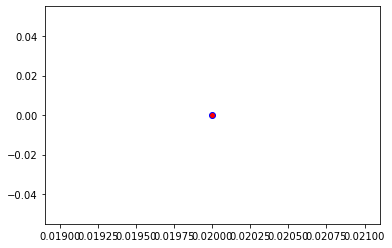

Crafting adversarial images took: 7.504894018173218 seconds 

Images classified as:
000000025424 752 = racket
000000025560 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


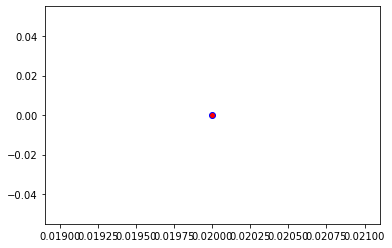

Crafting adversarial images took: 7.151209115982056 seconds 

Images classified as:
000000025593 919 = street sign
000000025603 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


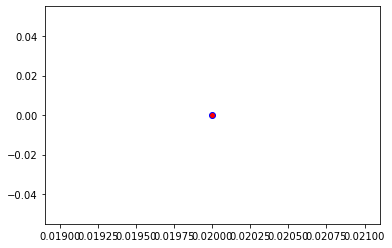

Crafting adversarial images took: 7.559736251831055 seconds 

Images classified as:
000000025986 461 = plate
000000026204 734 = police van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


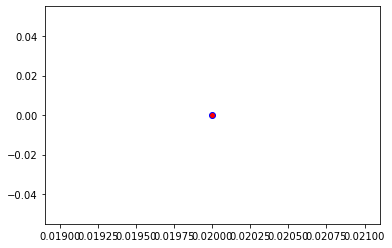

Crafting adversarial images took: 7.369054794311523 seconds 

Images classified as:
000000026465 620 = laptop
000000026564 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


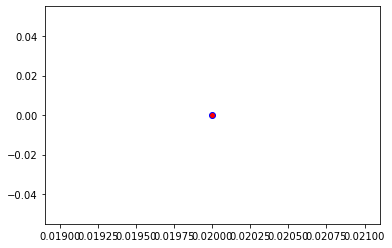

Crafting adversarial images took: 7.2609429359436035 seconds 

Images classified as:
000000026690 602 = horizontal bar
000000026926 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


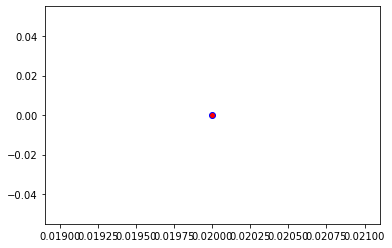

Crafting adversarial images took: 7.295112609863281 seconds 

Images classified as:
000000026941 856 = thresher
000000027186 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


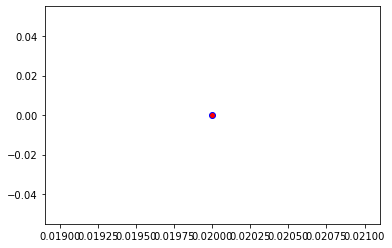

Crafting adversarial images took: 7.326794385910034 seconds 

Images classified as:
000000027620 526 = desk
000000027696 959 = carbonara
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


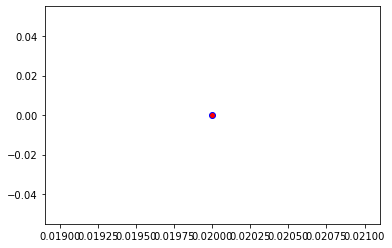

Crafting adversarial images took: 7.409743785858154 seconds 

Images classified as:
000000027768 874 = trolleybus
000000027932 518 = crash helmet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


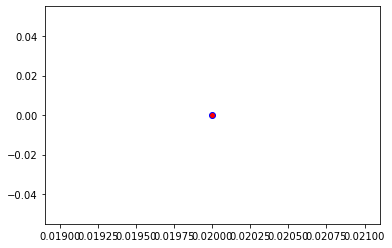

Crafting adversarial images took: 7.359682559967041 seconds 

Images classified as:
000000027972 472 = canoe
000000027982 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


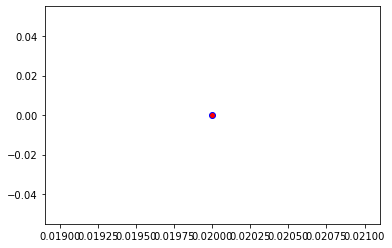

Crafting adversarial images took: 7.300788402557373 seconds 

Images classified as:
000000028285 538 = dome
000000028449 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


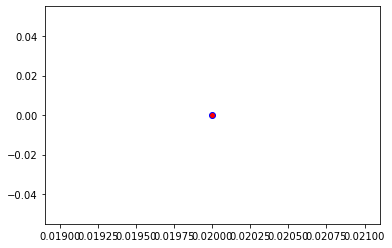

Crafting adversarial images took: 7.36336874961853 seconds 

Images classified as:
000000028452 760 = refrigerator
000000028809 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


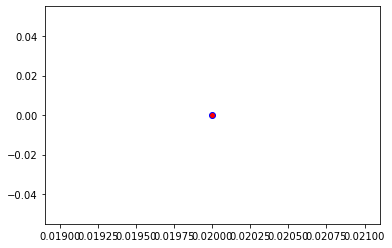

Crafting adversarial images took: 7.363070011138916 seconds 

Images classified as:
000000028993 412 = ashcan
000000029187 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


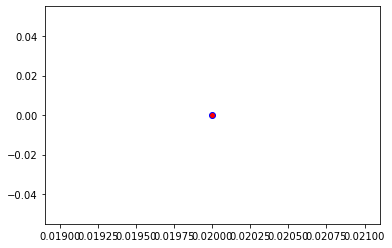

Crafting adversarial images took: 7.39085841178894 seconds 

Images classified as:
000000029393 159 = Rhodesian ridgeback
000000029397 519 = crate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


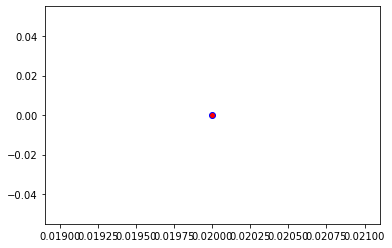

Crafting adversarial images took: 7.486961841583252 seconds 

Images classified as:
000000029596 831 = studio couch
000000029640 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


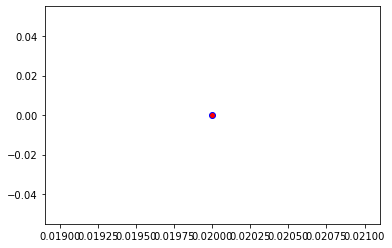

Crafting adversarial images took: 7.420085191726685 seconds 

Images classified as:
000000029675 934 = hotdog
000000029984 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


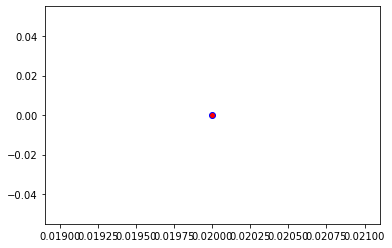

Crafting adversarial images took: 7.3809168338775635 seconds 

Images classified as:
000000030213 532 = dining table
000000030494 250 = Siberian husky
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


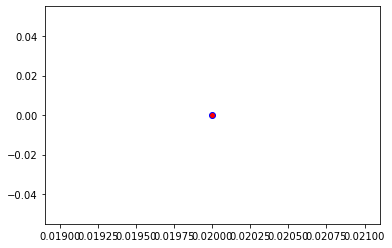

Crafting adversarial images took: 7.294088125228882 seconds 

Images classified as:
000000030504 248 = ski
000000030675 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


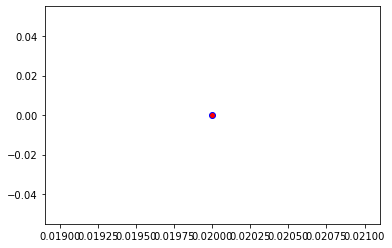

Crafting adversarial images took: 7.315586090087891 seconds 

Images classified as:
000000030785 924 = guacamole
000000030828 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


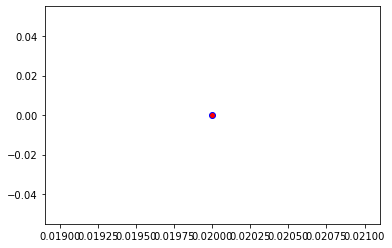

Crafting adversarial images took: 7.437804222106934 seconds 

Images classified as:
000000031050 883 = vase
000000031093 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


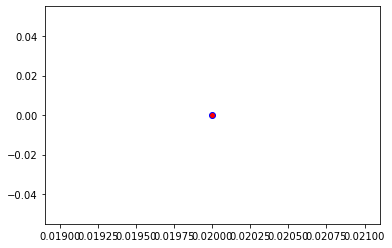

Crafting adversarial images took: 7.285761833190918 seconds 

Images classified as:
000000031118 839 = suspension bridge
000000031217 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


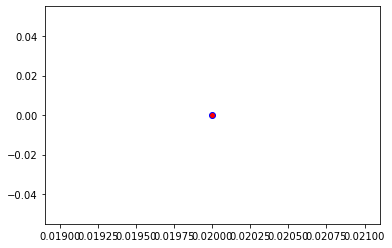

Crafting adversarial images took: 7.539569139480591 seconds 

Images classified as:
000000031248 431 = bassinet
000000031269 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


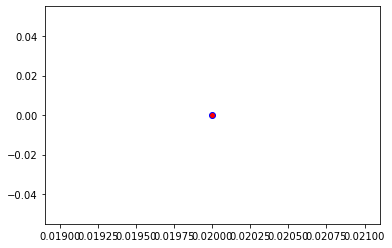

Crafting adversarial images took: 7.280204772949219 seconds 

Images classified as:
000000031296 762 = restaurant
000000031322 132 = American egret
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


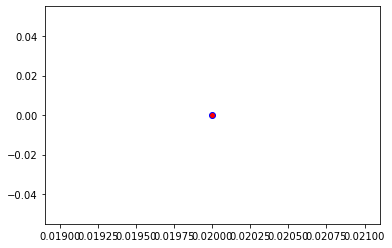

Crafting adversarial images took: 7.203576326370239 seconds 

Images classified as:
000000031620 669 = mosquito net
000000031735 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


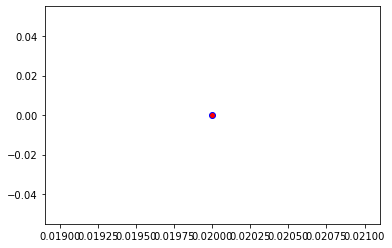

Crafting adversarial images took: 7.454494953155518 seconds 

Images classified as:
000000031749 409 = analog clock
000000031817 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


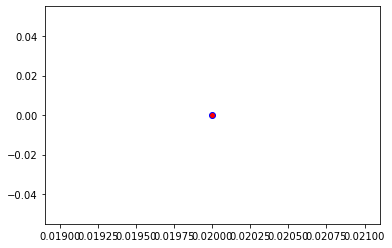

Crafting adversarial images took: 7.298791408538818 seconds 

Images classified as:
000000032038 963 = pizza
000000032081 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


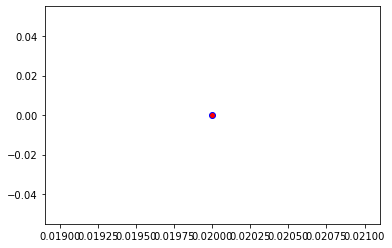

Crafting adversarial images took: 7.275458097457886 seconds 

Images classified as:
000000032285 794 = shower curtain
000000032334 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


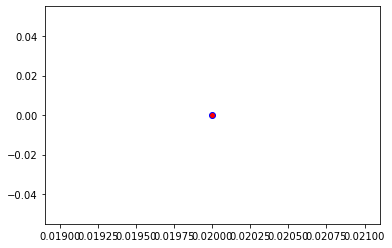

Crafting adversarial images took: 7.530500888824463 seconds 

Images classified as:
000000032570 6 = stingray
000000032610 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


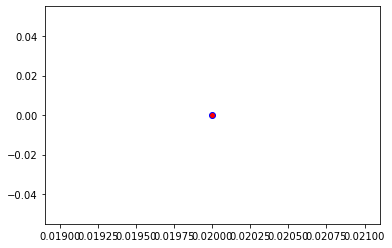

Crafting adversarial images took: 7.32134747505188 seconds 

Images classified as:
000000032735 248 = ski
000000032811 851 = television
Min values in image-array: 0.0 Max values in image-array: 254.94644
Min values in image-array: 0.0 Max values in image-array: 0.99978995
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


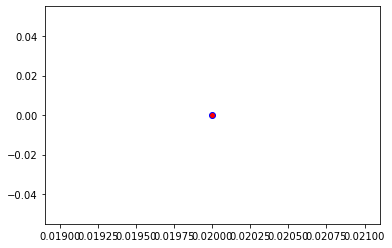

Crafting adversarial images took: 7.511438608169556 seconds 

Images classified as:
000000032817 861 = toilet seat
000000032861 885 = velvet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


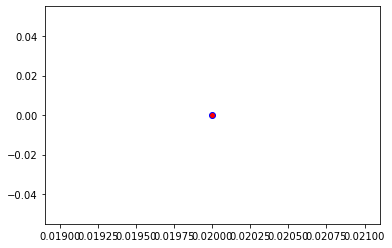

Crafting adversarial images took: 7.480356693267822 seconds 

Images classified as:
000000032887 500 = cliff
000000032901 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


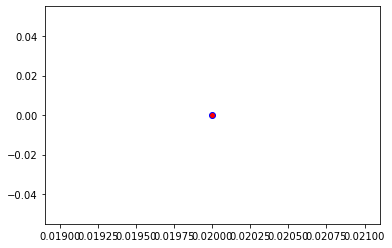

Crafting adversarial images took: 7.511366844177246 seconds 

Images classified as:
000000032941 919 = street sign
000000033005 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


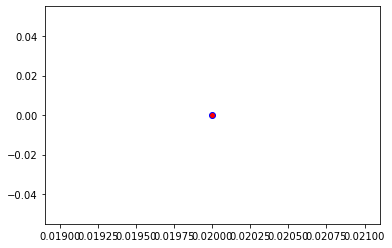

Crafting adversarial images took: 7.341793060302734 seconds 

Images classified as:
000000033104 248 = ski
000000033109 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


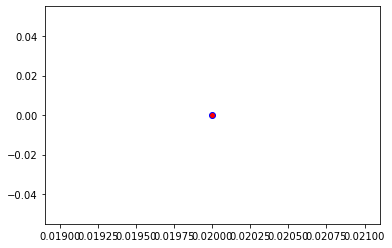

Crafting adversarial images took: 7.381936311721802 seconds 

Images classified as:
000000033114 895 = warplane
000000033221 358 = pole
Min values in image-array: 0.30854404 Max values in image-array: 255.0
Min values in image-array: 0.0012099766 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


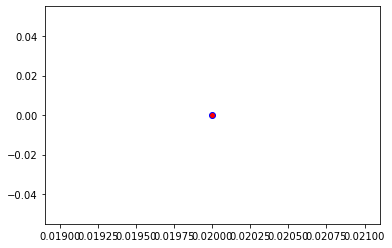

Crafting adversarial images took: 7.300852537155151 seconds 

Images classified as:
000000033368 752 = racket
000000033638 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


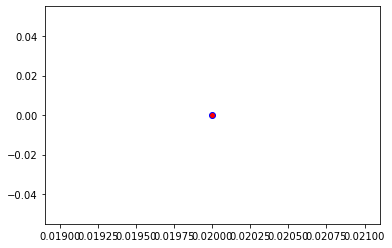

Crafting adversarial images took: 7.4417853355407715 seconds 

Images classified as:
000000033707 293 = cheetah
000000033759 429 = baseball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


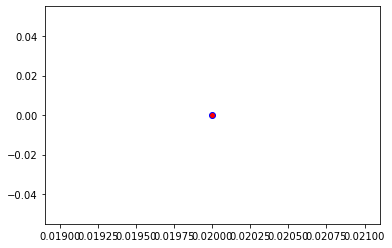

Crafting adversarial images took: 7.336077451705933 seconds 

Images classified as:
000000033854 639 = tank
000000034071 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


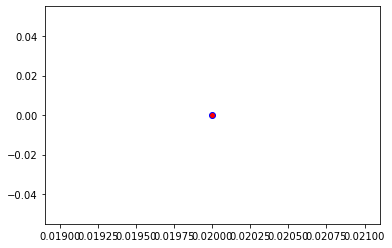

Crafting adversarial images took: 7.286328077316284 seconds 

Images classified as:
000000034139 707 = pay-phone
000000034205 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


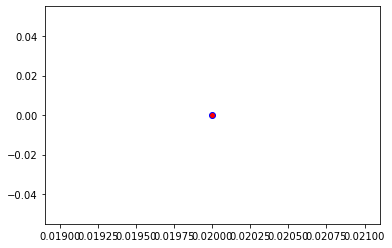

Crafting adversarial images took: 7.2630884647369385 seconds 

Images classified as:
000000034257 937 = broccoli
000000034417 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


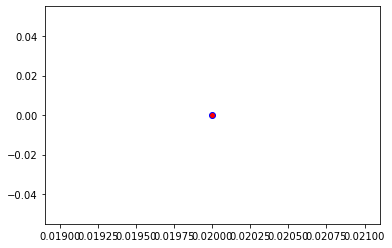

Crafting adversarial images took: 7.311640977859497 seconds 

Images classified as:
000000034452 671 = mountain bike
000000034760 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


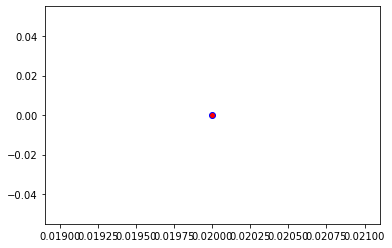

Crafting adversarial images took: 7.391510725021362 seconds 

Images classified as:
000000034873 896 = washbasin
000000035062 885 = velvet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


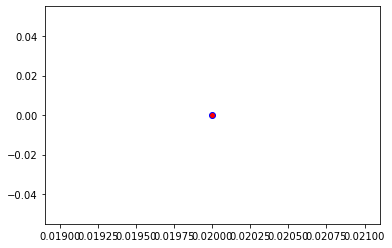

Crafting adversarial images took: 7.128607511520386 seconds 

Images classified as:
000000035197 895 = warplane
000000035279 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


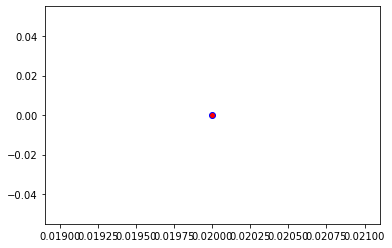

Crafting adversarial images took: 7.483976125717163 seconds 

Images classified as:
000000035326 827 = stove
000000035682 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


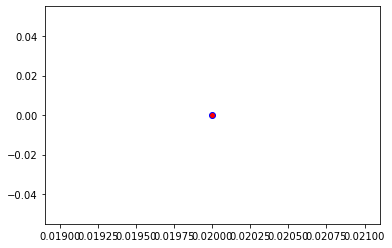

Crafting adversarial images took: 7.411342620849609 seconds 

Images classified as:
000000035770 435 = bathtub
000000035963 708 = pedestal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


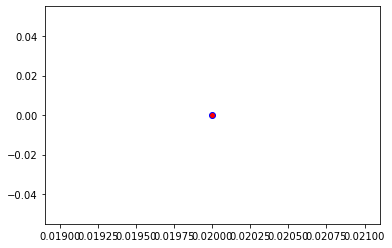

Crafting adversarial images took: 7.203239679336548 seconds 

Images classified as:
000000036494 762 = restaurant
000000036539 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


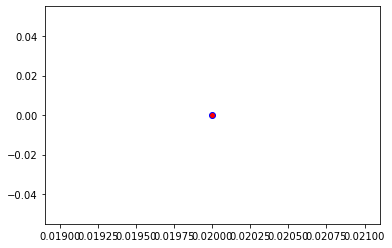

Crafting adversarial images took: 7.718119859695435 seconds 

Images classified as:
000000036660 774 = sandal
000000036678 498 = palace
Min values in image-array: 0.0 Max values in image-array: 254.92331
Min values in image-array: 0.0 Max values in image-array: 0.99969923
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


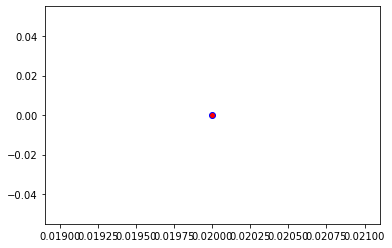

Crafting adversarial images took: 7.436073303222656 seconds 

Images classified as:
000000036844 532 = dining table
000000036861 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


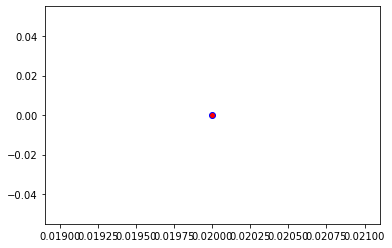

Crafting adversarial images took: 7.410882472991943 seconds 

Images classified as:
000000036936 851 = television
000000037670 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


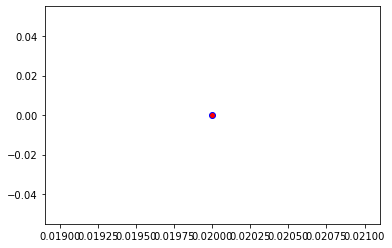

Crafting adversarial images took: 7.968620300292969 seconds 

Images classified as:
000000037689 248 = ski
000000037740 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


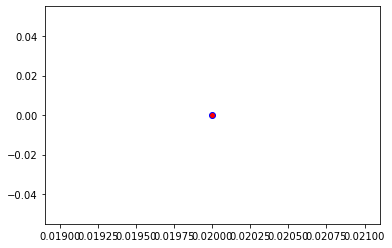

Crafting adversarial images took: 7.340920686721802 seconds 

Images classified as:
000000037751 671 = mountain bike
000000037777 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


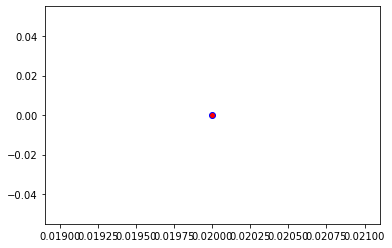

Crafting adversarial images took: 7.271377325057983 seconds 

Images classified as:
000000037988 752 = racket
000000038048 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


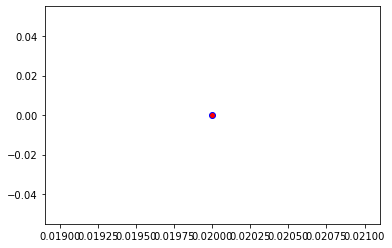

Crafting adversarial images took: 7.319428443908691 seconds 

Images classified as:
000000038070 861 = toilet seat
000000038118 248 = ski
Min values in image-array: 0.0 Max values in image-array: 254.74791
Min values in image-array: 0.0 Max values in image-array: 0.9990114
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


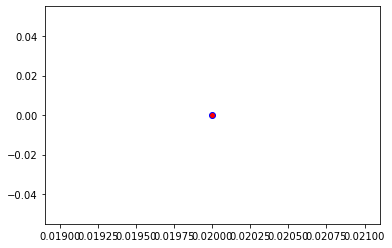

Crafting adversarial images took: 7.511478424072266 seconds 

Images classified as:
000000038210 248 = ski
000000038576 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


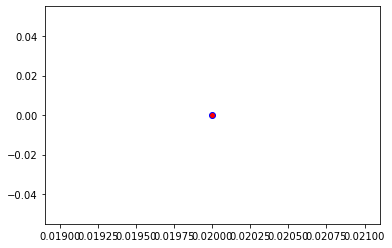

Crafting adversarial images took: 7.275777339935303 seconds 

Images classified as:
000000038678 932 = pretzel
000000038825 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


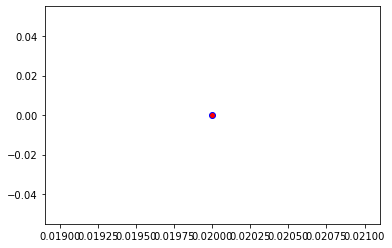

Crafting adversarial images took: 7.3054728507995605 seconds 

Images classified as:
000000038829 665 = moped
000000039405 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


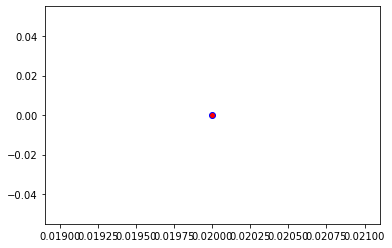

Crafting adversarial images took: 7.328977584838867 seconds 

Images classified as:
000000039477 905 = window shade
000000039480 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


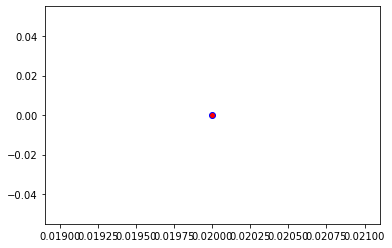

Crafting adversarial images took: 7.253214597702026 seconds 

Images classified as:
000000039484 498 = cinema
000000039551 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


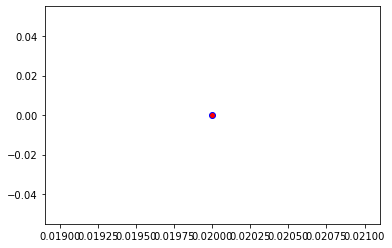

Crafting adversarial images took: 7.2334206104278564 seconds 

Images classified as:
000000039670 829 = streetcar
000000039769 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


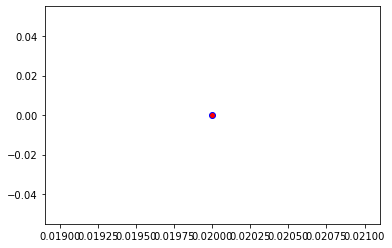

Crafting adversarial images took: 7.539696931838989 seconds 

Images classified as:
000000039785 150 = sea lion
000000039914 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


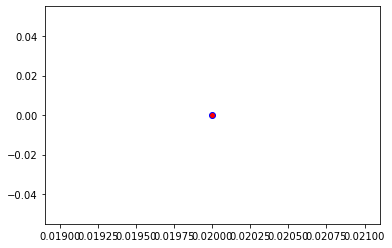

Crafting adversarial images took: 7.306034803390503 seconds 

Images classified as:
000000039951 752 = racket
000000039956 797 = sleeping bag
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


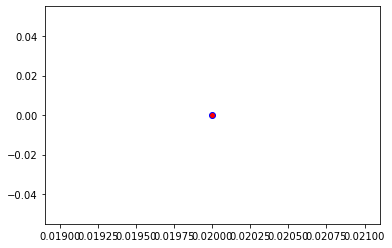

Crafting adversarial images took: 7.521374225616455 seconds 

Images classified as:
000000040036 339 = sorrel
000000040083 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


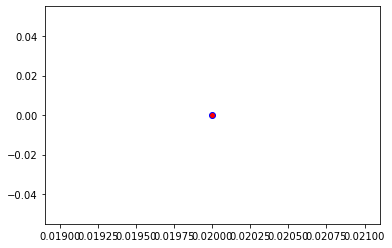

Crafting adversarial images took: 7.581954479217529 seconds 

Images classified as:
000000040471 495 = china cabinet
000000040757 431 = bassinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


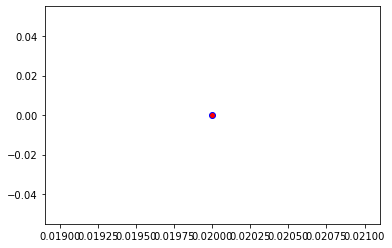

Crafting adversarial images took: 7.38148832321167 seconds 

Images classified as:
000000041488 781 = scoreboard
000000041633 864 = tow truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


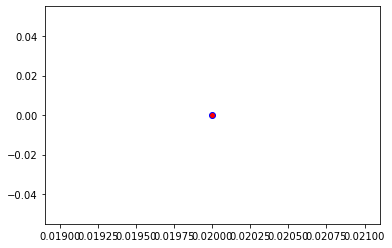

Crafting adversarial images took: 7.431205749511719 seconds 

Images classified as:
000000041635 37 = ox
000000041872 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


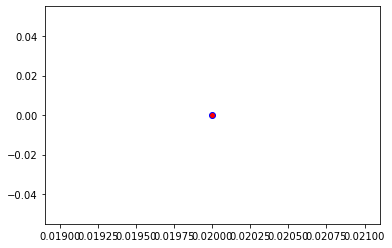

Crafting adversarial images took: 7.300648927688599 seconds 

Images classified as:
000000041888 9 = ostrich
000000041990 248 = ski
Min values in image-array: 0.0 Max values in image-array: 249.23485
Min values in image-array: 0.0 Max values in image-array: 0.97739154
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


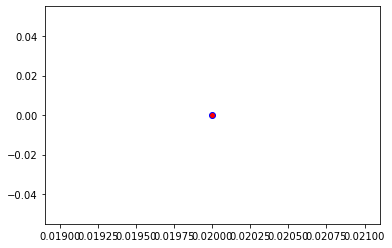

Crafting adversarial images took: 7.553097724914551 seconds 

Images classified as:
000000042070 874 = trolleybus
000000042102 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


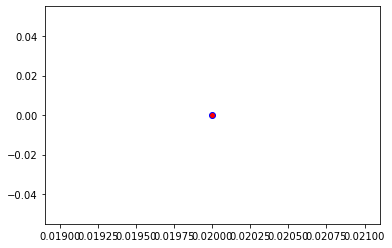

Crafting adversarial images took: 7.58219313621521 seconds 

Images classified as:
000000042178 489 = chainlink fence
000000042276 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


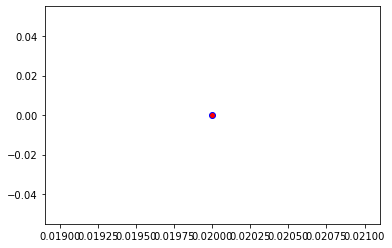

Crafting adversarial images took: 7.38834285736084 seconds 

Images classified as:
000000042296 296 = ice bear
000000042528 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


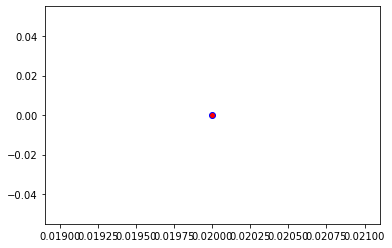

Crafting adversarial images took: 7.317235708236694 seconds 

Images classified as:
000000042563 803 = snowplow
000000042628 145 = king penguin
Min values in image-array: 0.0 Max values in image-array: 251.1609
Min values in image-array: 0.0 Max values in image-array: 0.9849447
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


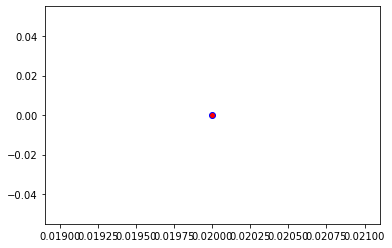

Crafting adversarial images took: 7.36601448059082 seconds 

Images classified as:
000000042888 919 = street sign
000000042889 508 = computer keyboard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


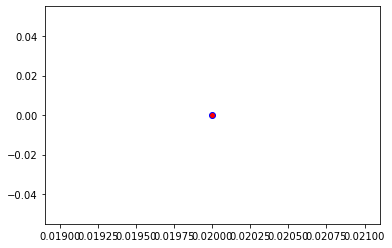

Crafting adversarial images took: 7.27078104019165 seconds 

Images classified as:
000000043314 248 = ski
000000043435 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


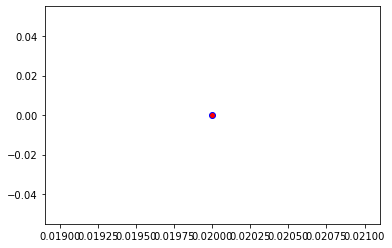

Crafting adversarial images took: 7.415710926055908 seconds 

Images classified as:
000000043581 963 = pizza
000000043737 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


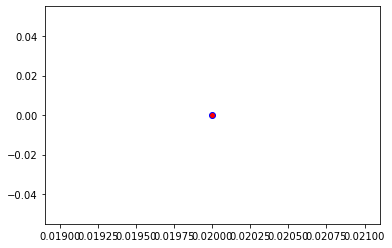

Crafting adversarial images took: 7.29084324836731 seconds 

Images classified as:
000000043816 981 = ballplayer
000000044068 265 = toy poodle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


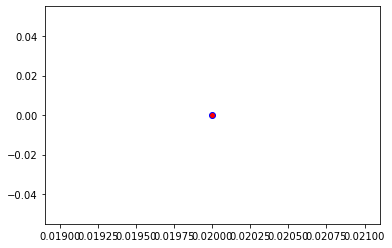

Crafting adversarial images took: 7.319285154342651 seconds 

Images classified as:
000000044195 248 = ski
000000044260 41 = hip
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


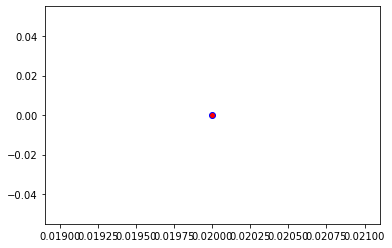

Crafting adversarial images took: 7.369470834732056 seconds 

Images classified as:
000000044279 617 = lab coat
000000044590 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


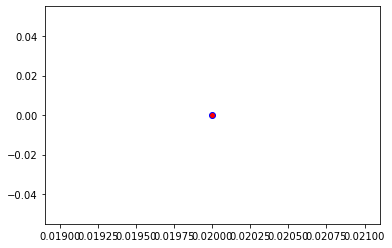

Crafting adversarial images took: 7.405960559844971 seconds 

Images classified as:
000000044652 895 = warplane
000000044699 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


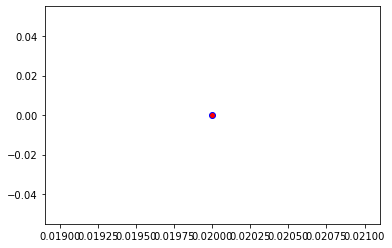

Crafting adversarial images took: 7.759739637374878 seconds 

Images classified as:
000000044877 752 = racket
000000045070 514 = cowboy boot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


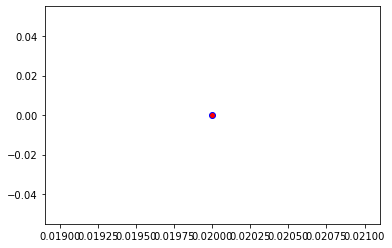

Crafting adversarial images took: 7.505303621292114 seconds 

Images classified as:
000000045090 147 = grey whale
000000045229 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


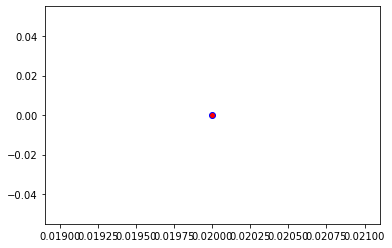

Crafting adversarial images took: 7.415424823760986 seconds 

Images classified as:
000000045472 953 = pineapple
000000045550 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


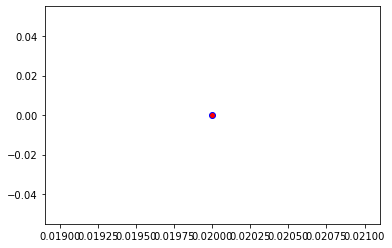

Crafting adversarial images took: 7.401569366455078 seconds 

Images classified as:
000000045596 799 = sliding door
000000045728 935 = mashed potato
Min values in image-array: 0.0 Max values in image-array: 254.9579
Min values in image-array: 0.0 Max values in image-array: 0.9998349
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


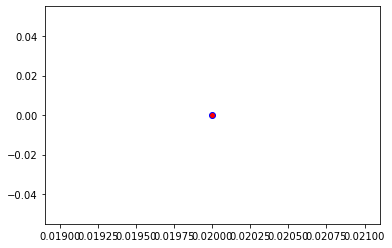

Crafting adversarial images took: 7.302851915359497 seconds 

Images classified as:
000000046031 620 = laptop
000000046048 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


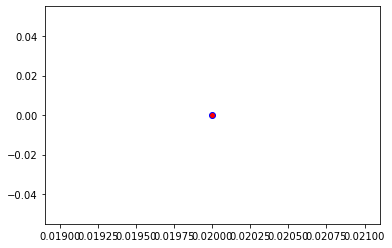

Crafting adversarial images took: 7.281510353088379 seconds 

Images classified as:
000000046252 981 = ballplayer
000000046378 287 = lynx
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


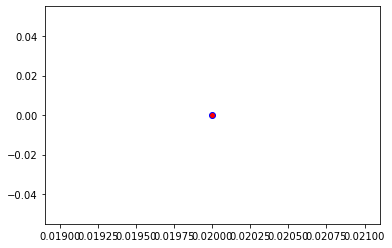

Crafting adversarial images took: 7.358352422714233 seconds 

Images classified as:
000000046463 934 = hotdog
000000046497 26 = gar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


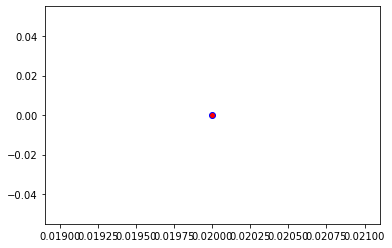

Crafting adversarial images took: 7.35147500038147 seconds 

Images classified as:
000000046804 5 = ram
000000046872 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


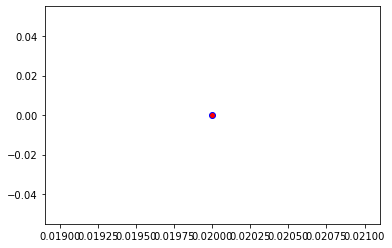

Crafting adversarial images took: 7.362565755844116 seconds 

Images classified as:
000000047010 275 = hyena
000000047112 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


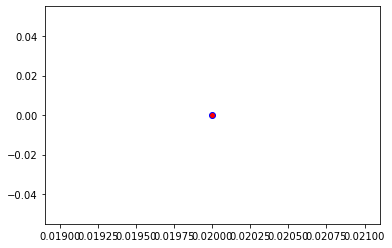

Crafting adversarial images took: 7.510948419570923 seconds 

Images classified as:
000000047121 435 = bathtub
000000047571 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


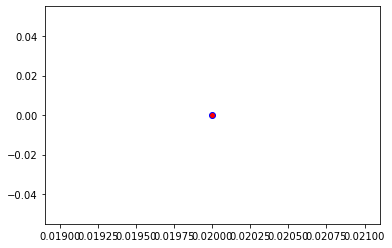

Crafting adversarial images took: 7.3752031326293945 seconds 

Images classified as:
000000047585 982 = groom
000000047740 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


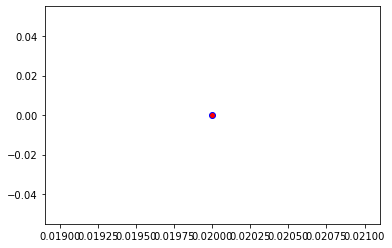

Crafting adversarial images took: 7.571238994598389 seconds 

Images classified as:
000000047769 532 = dining table
000000047801 123 = crayfish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


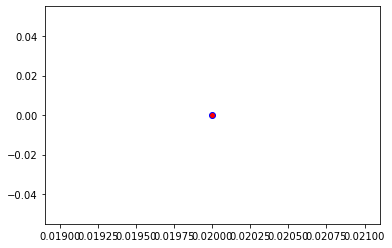

Crafting adversarial images took: 7.539406776428223 seconds 

Images classified as:
000000047819 354 = Arabian camel
000000047828 713 = pier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


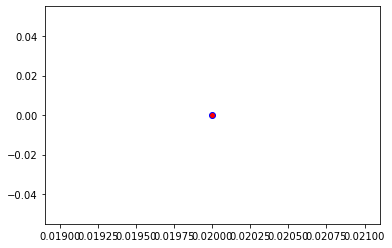

Crafting adversarial images took: 7.528196573257446 seconds 

Images classified as:
000000048153 502 = clog
000000048396 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


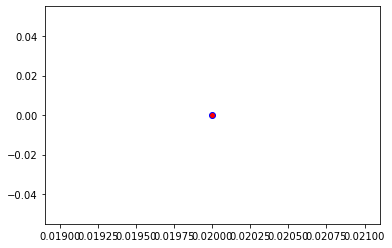

Crafting adversarial images took: 8.3826003074646 seconds 

Images classified as:
000000048504 386 = African elephant
000000048555 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


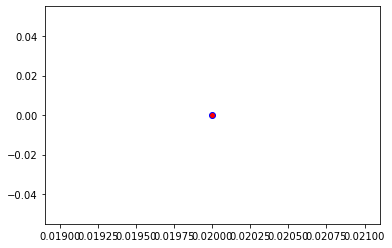

Crafting adversarial images took: 7.3892502784729 seconds 

Images classified as:
000000048564 667 = mortarboard
000000048924 672 = mountain tent
Min values in image-array: 0.0 Max values in image-array: 254.98326
Min values in image-array: 0.0 Max values in image-array: 0.9999344
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


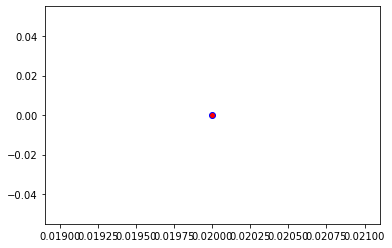

Crafting adversarial images took: 7.6390557289123535 seconds 

Images classified as:
000000049060 820 = steam locomotive
000000049091 549 = envelope
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


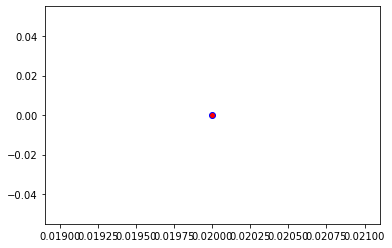

Crafting adversarial images took: 7.450739860534668 seconds 

Images classified as:
000000049259 703 = park bench
000000049269 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


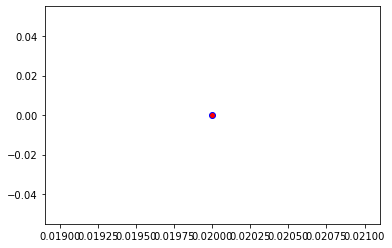

Crafting adversarial images took: 7.186317443847656 seconds 

Images classified as:
000000049759 890 = volleyball
000000049761 346 = water buffalo
Min values in image-array: 0.029186798 Max values in image-array: 255.0
Min values in image-array: 0.00011445803 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


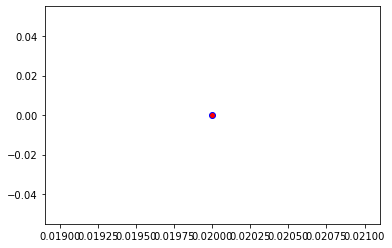

Crafting adversarial images took: 7.3161211013793945 seconds 

Images classified as:
000000049810 173 = Ibizan hound
000000050006 975 = lakeside
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


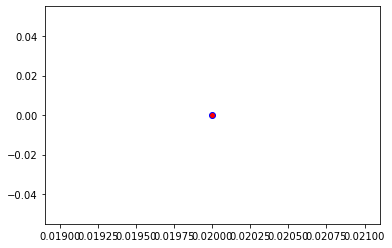

Crafting adversarial images took: 7.370648622512817 seconds 

Images classified as:
000000050145 870 = tricycle
000000050149 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


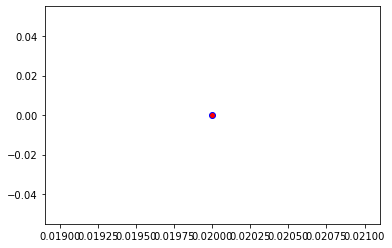

Crafting adversarial images took: 10.794147491455078 seconds 

Images classified as:
000000050165 660 = mobile home
000000050326 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


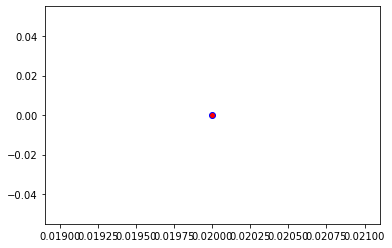

Crafting adversarial images took: 12.389687299728394 seconds 

Images classified as:
000000050331 937 = broccoli
000000050380 246 = Great Dane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


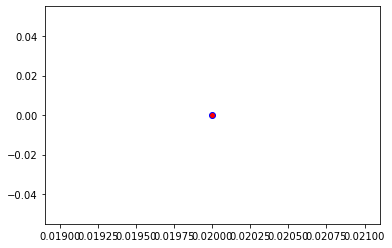

Crafting adversarial images took: 8.55642294883728 seconds 

Images classified as:
000000050638 514 = cowboy boot
000000050679 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


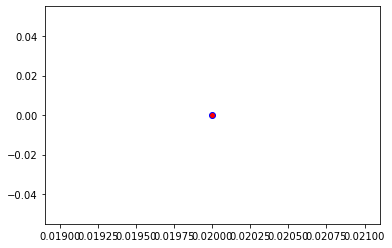

Crafting adversarial images took: 7.787328004837036 seconds 

Images classified as:
000000050811 438 = beaker
000000050828 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


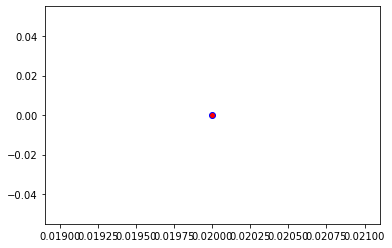

Crafting adversarial images took: 7.446425914764404 seconds 

Images classified as:
000000050844 850 = teddy
000000050896 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


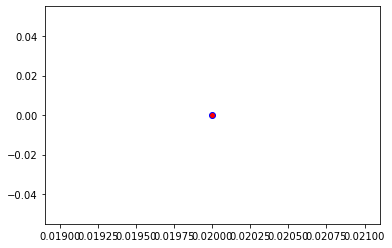

Crafting adversarial images took: 7.409980058670044 seconds 

Images classified as:
000000050943 803 = snowplow
000000051008 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


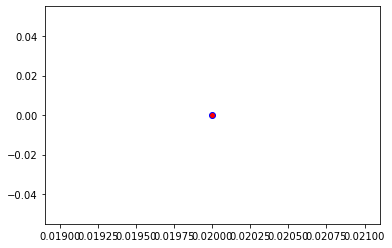

Crafting adversarial images took: 8.522766351699829 seconds 

Images classified as:
000000051309 346 = water buffalo
000000051314 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


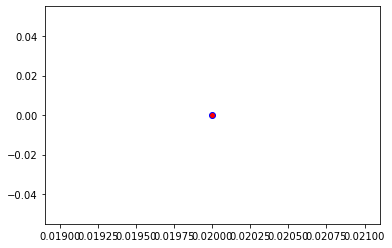

Crafting adversarial images took: 7.32646369934082 seconds 

Images classified as:
000000051326 607 = jack-o'-lantern
000000051598 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


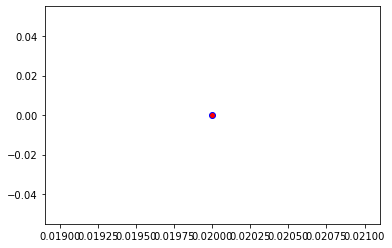

Crafting adversarial images took: 7.500355243682861 seconds 

Images classified as:
000000051610 681 = notebook
000000051712 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


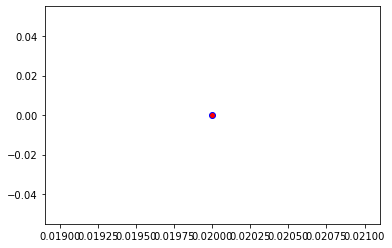

Crafting adversarial images took: 7.589191198348999 seconds 

Images classified as:
000000051738 831 = studio couch
000000051938 248 = ski
Min values in image-array: 0.87756175 Max values in image-array: 255.0
Min values in image-array: 0.0034414185 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


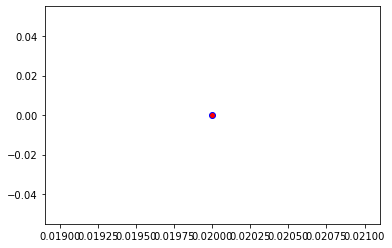

Crafting adversarial images took: 7.381839990615845 seconds 

Images classified as:
000000051961 704 = parking meter
000000051976 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


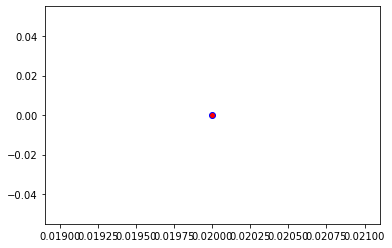

Crafting adversarial images took: 7.531945705413818 seconds 

Images classified as:
000000052007 874 = trolleybus
000000052017 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


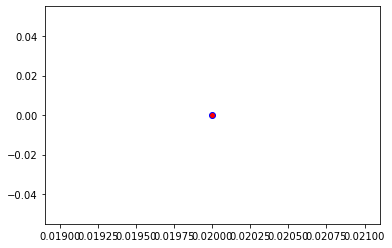

Crafting adversarial images took: 7.848264455795288 seconds 

Images classified as:
000000052412 318 = wing
000000052413 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


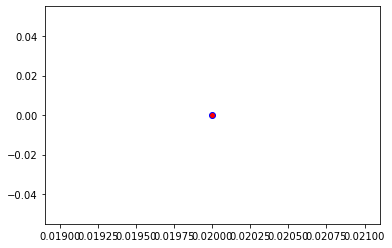

Crafting adversarial images took: 7.880223035812378 seconds 

Images classified as:
000000052462 340 = zebra
000000052507 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


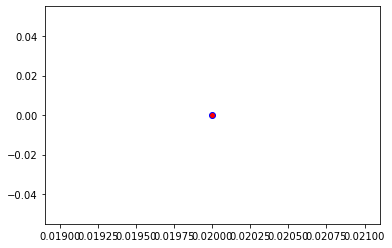

Crafting adversarial images took: 7.664207220077515 seconds 

Images classified as:
000000052565 37 = ox
000000052591 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


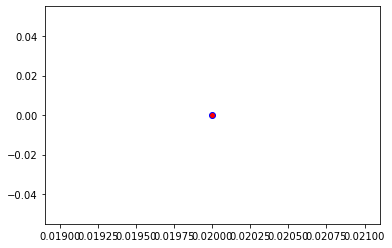

Crafting adversarial images took: 8.06885814666748 seconds 

Images classified as:
000000052891 169 = borzoi
000000052996 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


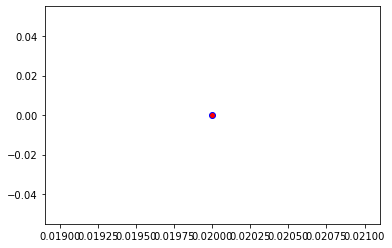

Crafting adversarial images took: 8.074836730957031 seconds 

Images classified as:
000000053505 861 = toilet seat
000000053529 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


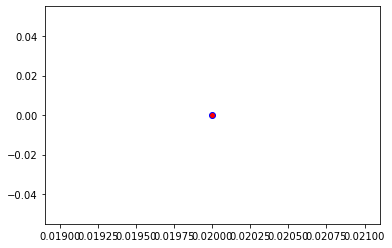

Crafting adversarial images took: 7.43071436882019 seconds 

Images classified as:
000000053624 385 = Indian elephant
000000053626 248 = ski
Min values in image-array: 0.52934074 Max values in image-array: 255.0
Min values in image-array: 0.002075846 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


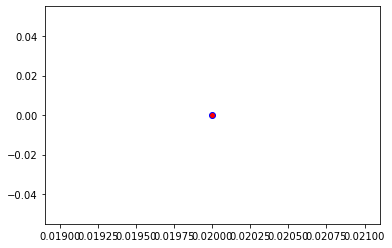

Crafting adversarial images took: 7.336060285568237 seconds 

Images classified as:
000000053909 590 = hand-held computer
000000053994 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


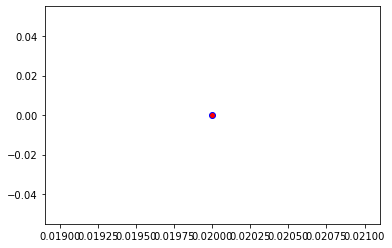

Crafting adversarial images took: 7.215600967407227 seconds 

Images classified as:
000000054123 340 = zebra
000000054164 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.5], dtype=float32)>)


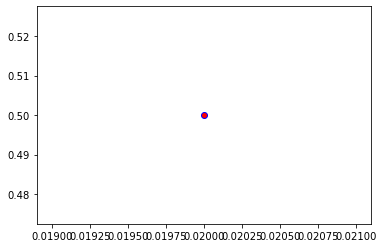

Crafting adversarial images took: 7.940357208251953 seconds 

Images classified as:
000000054592 248 = ski
000000054593 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


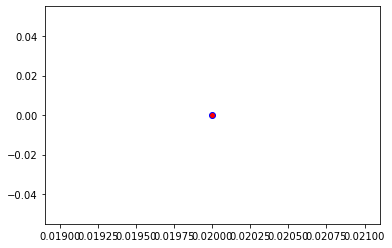

Crafting adversarial images took: 7.806926012039185 seconds 

Images classified as:
000000054605 928 = ice cream
000000054628 619 = lampshade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


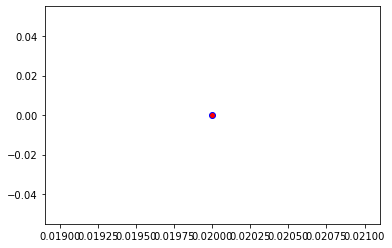

Crafting adversarial images took: 7.576728105545044 seconds 

Images classified as:
000000054654 521 = Crock Pot
000000054931 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


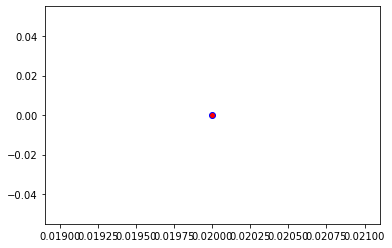

Crafting adversarial images took: 8.078305721282959 seconds 

Images classified as:
000000054967 919 = street sign
000000055002 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


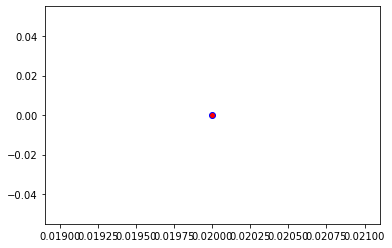

Crafting adversarial images took: 7.6332011222839355 seconds 

Images classified as:
000000055022 870 = tricycle
000000055072 293 = cheetah
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


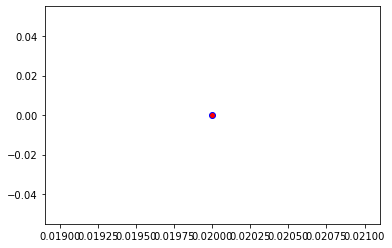

Crafting adversarial images took: 7.435880422592163 seconds 

Images classified as:
000000055150 475 = car mirror
000000055167 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


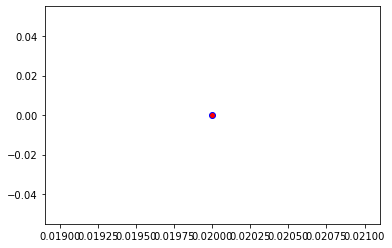

Crafting adversarial images took: 7.323312520980835 seconds 

Images classified as:
000000055299 976 = promontory
000000055528 419 = Band Aid
Min values in image-array: 0.0 Max values in image-array: 254.51018
Min values in image-array: 0.0 Max values in image-array: 0.9980791
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


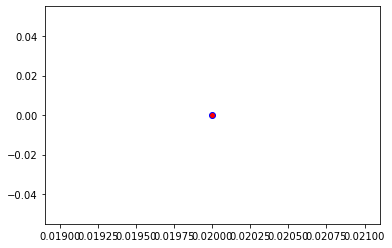

Crafting adversarial images took: 7.45561146736145 seconds 

Images classified as:
000000055950 752 = racket
000000056127 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


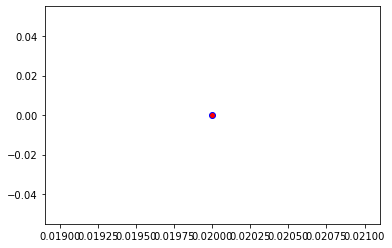

Crafting adversarial images took: 7.411722421646118 seconds 

Images classified as:
000000056288 959 = carbonara
000000056344 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


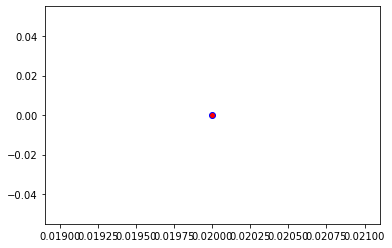

Crafting adversarial images took: 7.181375026702881 seconds 

Images classified as:
000000056350 794 = shower curtain
000000056545 16 = bulbul
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


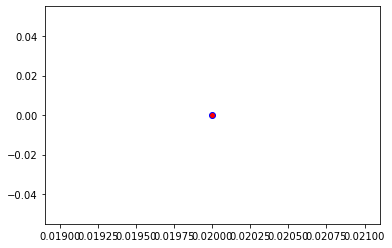

Crafting adversarial images took: 7.315481901168823 seconds 

Images classified as:
000000057027 385 = Indian elephant
000000057149 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


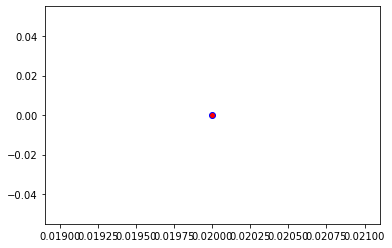

Crafting adversarial images took: 7.426117181777954 seconds 

Images classified as:
000000057150 850 = teddy
000000057232 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


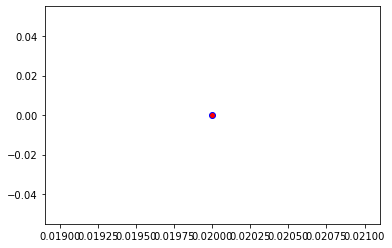

Crafting adversarial images took: 7.430491924285889 seconds 

Images classified as:
000000057238 760 = refrigerator
000000057244 820 = steam locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


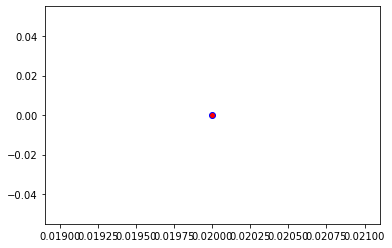

Crafting adversarial images took: 7.256542205810547 seconds 

Images classified as:
000000057597 805 = soccer ball
000000057672 472 = canoe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


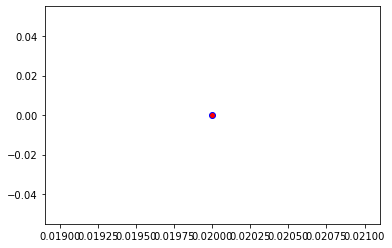

Crafting adversarial images took: 7.3611531257629395 seconds 

Images classified as:
000000057725 839 = suspension bridge
000000057760 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


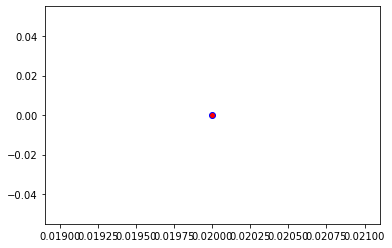

Crafting adversarial images took: 7.361178874969482 seconds 

Images classified as:
000000058029 648 = medicine chest
000000058111 283 = Persian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


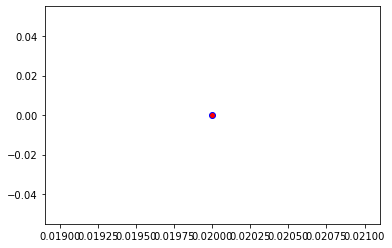

Crafting adversarial images took: 7.527223110198975 seconds 

Images classified as:
000000058350 813 = spatula
000000058384 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


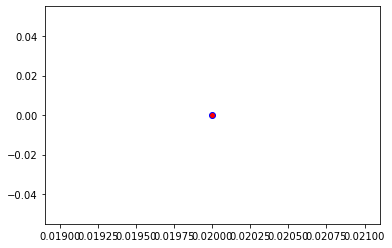

Crafting adversarial images took: 7.456726789474487 seconds 

Images classified as:
000000058393 703 = park bench
000000058539 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


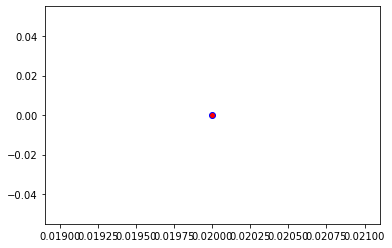

Crafting adversarial images took: 7.580129623413086 seconds 

Images classified as:
000000058636 919 = street sign
000000058655 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


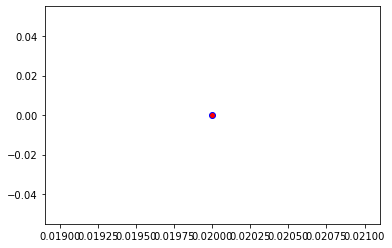

Crafting adversarial images took: 7.405966758728027 seconds 

Images classified as:
000000058705 652 = military uniform
000000059044 683 = oboe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


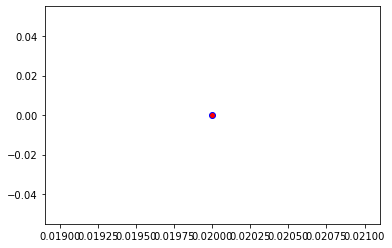

Crafting adversarial images took: 7.361011028289795 seconds 

Images classified as:
000000059386 293 = cheetah
000000059598 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


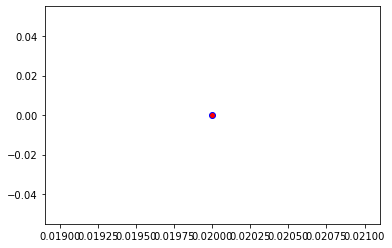

Crafting adversarial images took: 7.508541584014893 seconds 

Images classified as:
000000059635 638 = maillot
000000059920 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


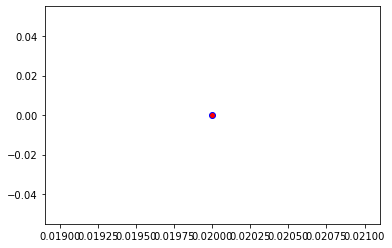

Crafting adversarial images took: 7.518104076385498 seconds 

Images classified as:
000000060052 542 = drumstick
000000060090 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


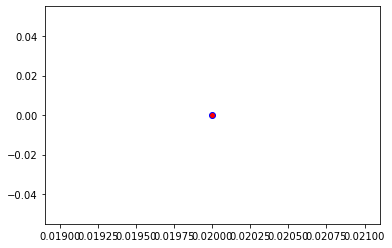

Crafting adversarial images took: 7.236266374588013 seconds 

Images classified as:
000000060102 890 = volleyball
000000060347 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


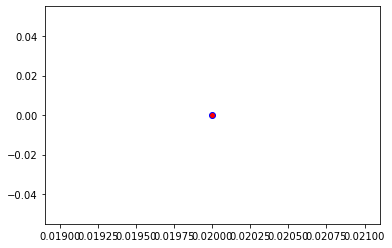

Crafting adversarial images took: 7.547321081161499 seconds 

Images classified as:
000000060363 892 = wall clock
000000060449 706 = patio
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


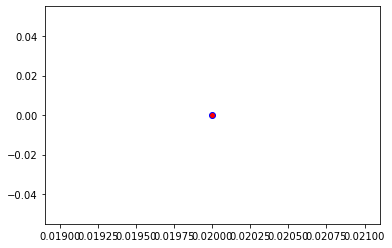

Crafting adversarial images took: 7.291314125061035 seconds 

Images classified as:
000000060507 981 = ballplayer
000000060770 340 = zebra
Min values in image-array: 8.888684 Max values in image-array: 255.0
Min values in image-array: 0.034857586 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.5], dtype=float32)>)


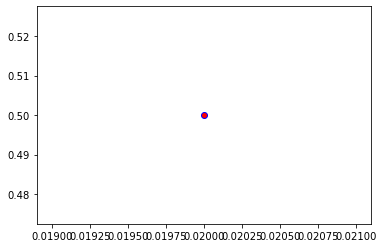

Crafting adversarial images took: 7.201988935470581 seconds 

Images classified as:
000000060823 690 = oxcart
000000060835 217 = English springer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


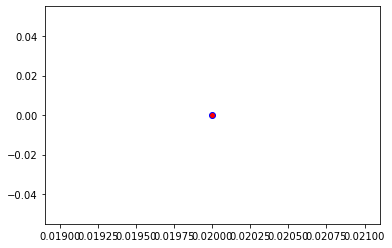

Crafting adversarial images took: 7.425668954849243 seconds 

Images classified as:
000000060855 950 = orange
000000060886 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


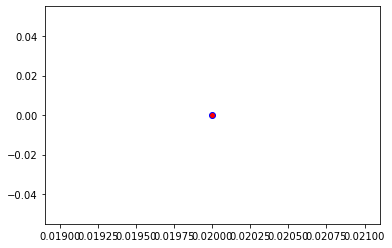

Crafting adversarial images took: 7.2904438972473145 seconds 

Images classified as:
000000060899 515 = cowboy hat
000000060932 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


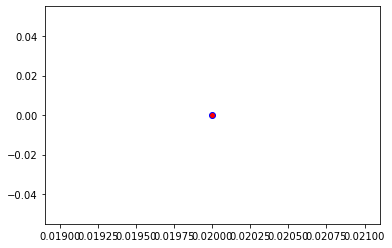

Crafting adversarial images took: 7.307485103607178 seconds 

Images classified as:
000000061108 870 = tricycle
000000061171 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


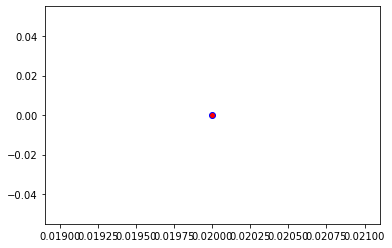

Crafting adversarial images took: 7.358734130859375 seconds 

Images classified as:
000000061268 565 = freight car
000000061333 282 = tiger cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


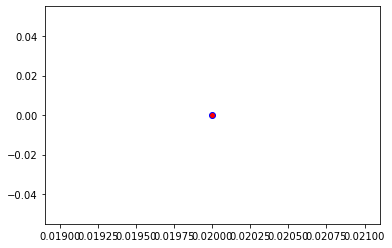

Crafting adversarial images took: 7.512479066848755 seconds 

Images classified as:
000000061418 702 = parallel bars
000000061471 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 253.34694
Min values in image-array: 0.0 Max values in image-array: 0.9935174
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


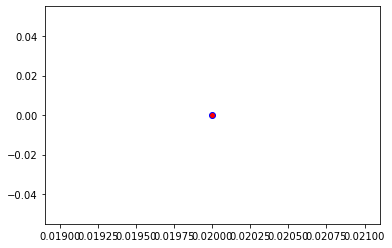

Crafting adversarial images took: 7.3181962966918945 seconds 

Images classified as:
000000061584 706 = patio
000000061658 938 = cauliflower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


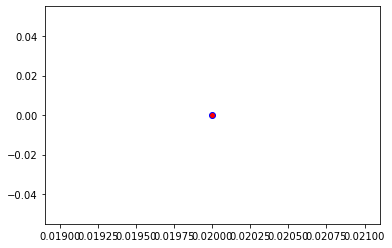

Crafting adversarial images took: 7.520744562149048 seconds 

Images classified as:
000000061747 248 = ski
000000061960 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


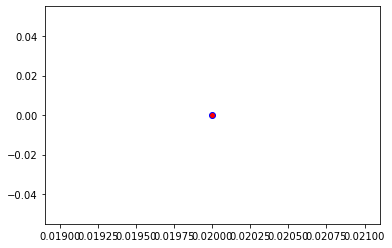

Crafting adversarial images took: 7.508763313293457 seconds 

Images classified as:
000000062025 896 = washbasin
000000062353 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


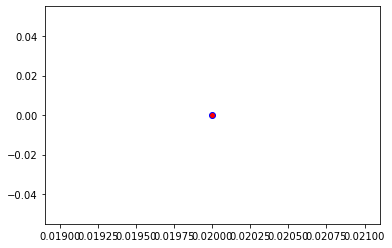

Crafting adversarial images took: 7.384666442871094 seconds 

Images classified as:
000000062355 981 = ballplayer
000000062554 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


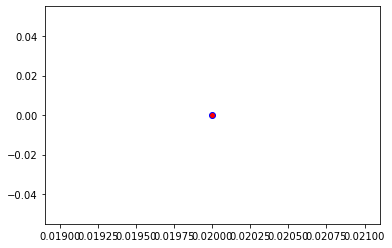

Crafting adversarial images took: 7.4510345458984375 seconds 

Images classified as:
000000062692 752 = racket
000000062808 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


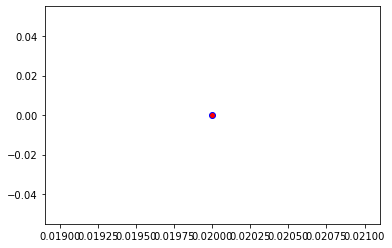

Crafting adversarial images took: 7.455244302749634 seconds 

Images classified as:
000000063047 971 = bubble
000000063154 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


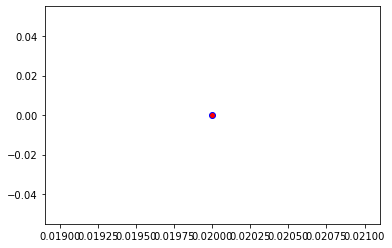

Crafting adversarial images took: 7.391136646270752 seconds 

Images classified as:
000000063552 463 = bucket
000000063602 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


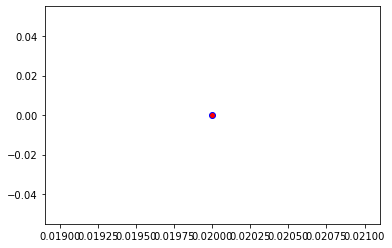

Crafting adversarial images took: 7.39820408821106 seconds 

Images classified as:
000000063740 527 = desktop computer
000000063965 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


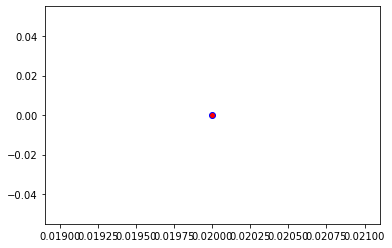

Crafting adversarial images took: 7.356445789337158 seconds 

Images classified as:
000000064084 930 = French loaf
000000064359 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


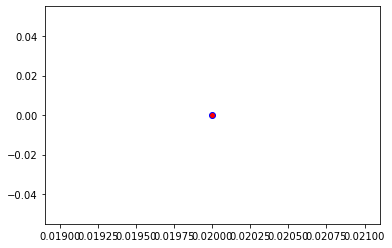

Crafting adversarial images took: 7.572265863418579 seconds 

Images classified as:
000000064462 248 = ski
000000064495 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


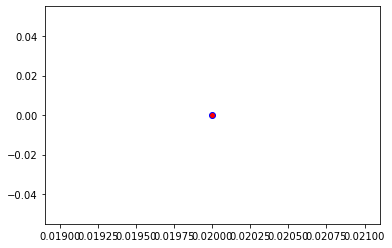

Crafting adversarial images took: 7.867744445800781 seconds 

Images classified as:
000000064499 340 = zebra
000000064523 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


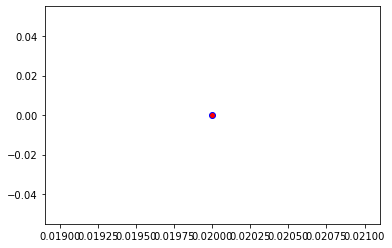

Crafting adversarial images took: 7.471711158752441 seconds 

Images classified as:
000000064574 777 = scabbard
000000064718 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


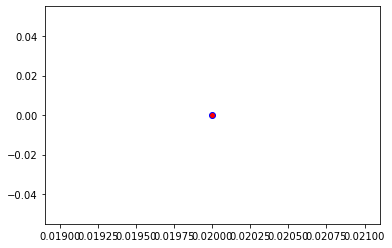

Crafting adversarial images took: 7.2723283767700195 seconds 

Images classified as:
000000064868 827 = stove
000000064898 801 = snorkel
Min values in image-array: 1.094199 Max values in image-array: 255.0
Min values in image-array: 0.004290976 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


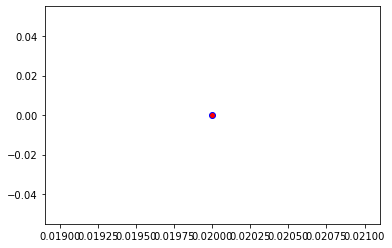

Crafting adversarial images took: 7.362281799316406 seconds 

Images classified as:
000000065074 750 = quilt
000000065288 492 = chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


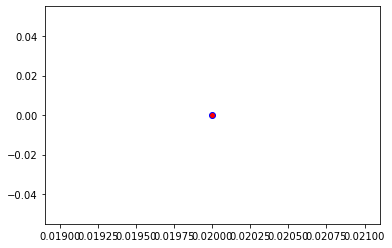

Crafting adversarial images took: 7.451493263244629 seconds 

Images classified as:
000000065350 450 = bobsled
000000065455 104 = wallaby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


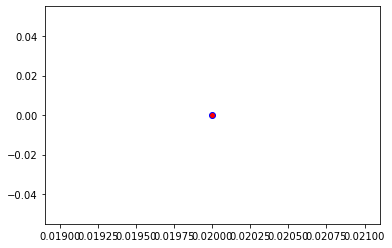

Crafting adversarial images took: 7.309154510498047 seconds 

Images classified as:
000000065485 609 = jeep
000000065736 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


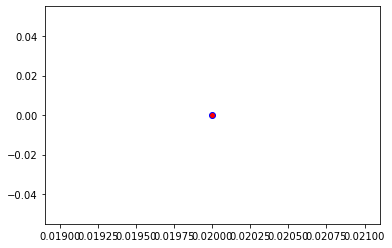

Crafting adversarial images took: 7.320805311203003 seconds 

Images classified as:
000000065798 981 = ballplayer
000000066038 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


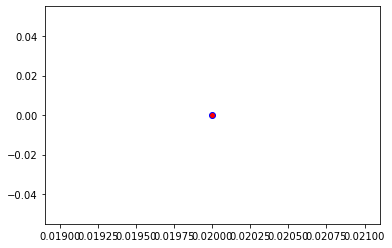

Crafting adversarial images took: 7.610034704208374 seconds 

Images classified as:
000000066135 547 = electric locomotive
000000066231 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


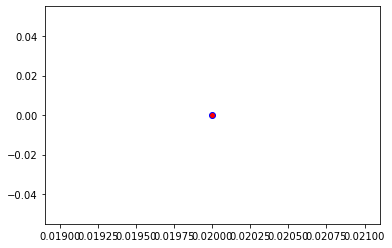

Crafting adversarial images took: 7.485696792602539 seconds 

Images classified as:
000000066523 669 = mosquito net
000000066561 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


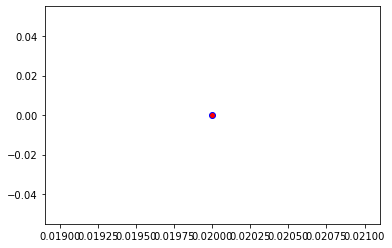

Crafting adversarial images took: 7.45115065574646 seconds 

Images classified as:
000000066635 556 = screen
000000066706 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 254.97633
Min values in image-array: 0.0 Max values in image-array: 0.9999072
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


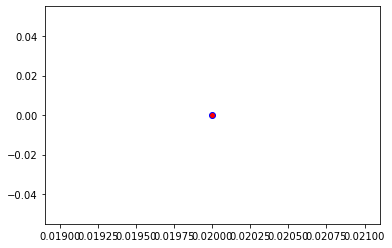

Crafting adversarial images took: 7.441081285476685 seconds 

Images classified as:
000000066771 438 = beaker
000000066817 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


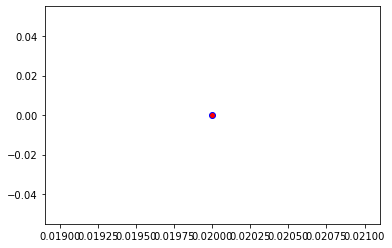

Crafting adversarial images took: 7.381019592285156 seconds 

Images classified as:
000000066841 423 = barber chair
000000066886 589 = hand blower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


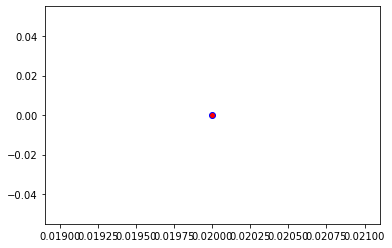

Crafting adversarial images took: 7.338421106338501 seconds 

Images classified as:
000000066926 931 = bagel
000000067180 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 249.76549
Min values in image-array: 0.0 Max values in image-array: 0.9794725
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


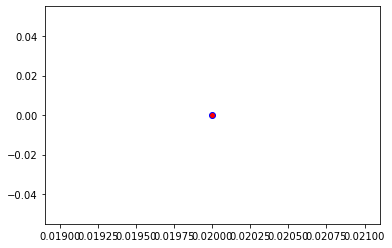

Crafting adversarial images took: 7.324813365936279 seconds 

Images classified as:
000000067213 436 = beach wagon
000000067310 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


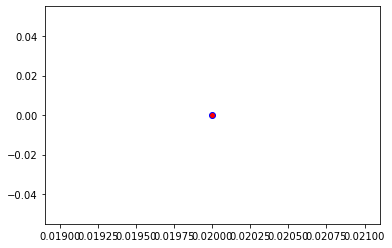

Crafting adversarial images took: 7.3639140129089355 seconds 

Images classified as:
000000067315 639 = suit
000000067406 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


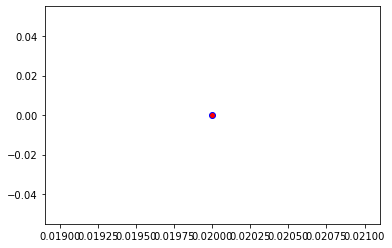

Crafting adversarial images took: 7.360457181930542 seconds 

Images classified as:
000000067534 906 = Windsor tie
000000067616 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


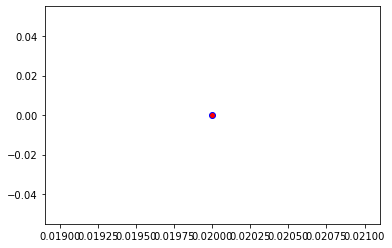

Crafting adversarial images took: 7.280900478363037 seconds 

Images classified as:
000000067896 409 = analog clock
000000068078 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


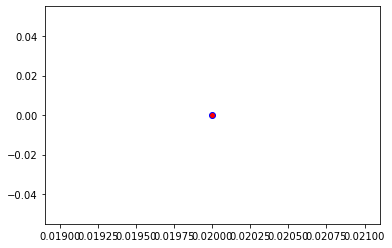

Crafting adversarial images took: 7.423797607421875 seconds 

Images classified as:
000000068093 665 = moped
000000068286 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


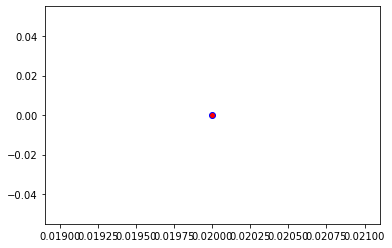

Crafting adversarial images took: 7.3957860469818115 seconds 

Images classified as:
000000068387 981 = ballplayer
000000068409 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


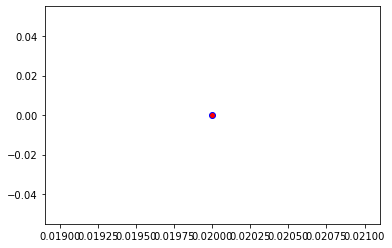

Crafting adversarial images took: 7.491318941116333 seconds 

Images classified as:
000000068628 880 = unicycle
000000068765 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 254.37376
Min values in image-array: 0.0 Max values in image-array: 0.99754417
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


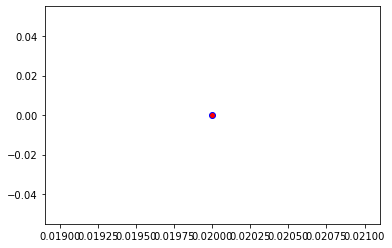

Crafting adversarial images took: 7.797564744949341 seconds 

Images classified as:
000000068833 736 = pool table
000000068933 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


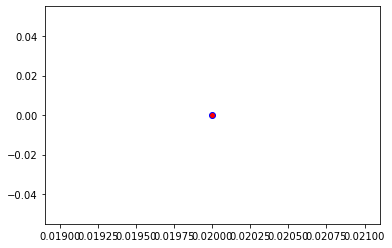

Crafting adversarial images took: 7.375556230545044 seconds 

Images classified as:
000000069106 340 = zebra
000000069138 920 = traffic light
Min values in image-array: 0.33376646 Max values in image-array: 254.96875
Min values in image-array: 0.0013088881 Max values in image-array: 0.99987745
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


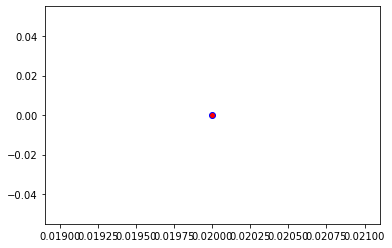

Crafting adversarial images took: 7.61808705329895 seconds 

Images classified as:
000000069213 736 = pool table
000000069224 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


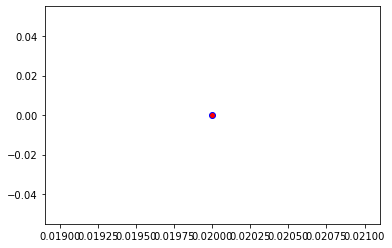

Crafting adversarial images took: 7.450733661651611 seconds 

Images classified as:
000000069356 955 = jackfruit
000000069795 28 = pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


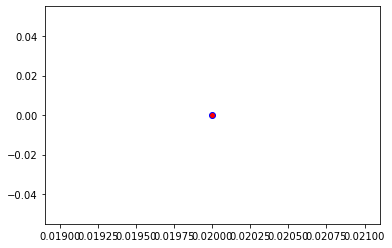

Crafting adversarial images took: 7.41217303276062 seconds 

Images classified as:
000000070048 964 = potpie
000000070158 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


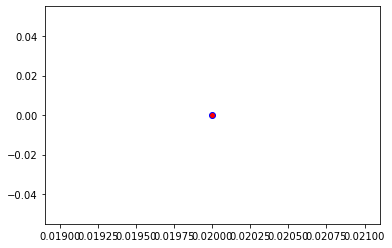

Crafting adversarial images took: 7.441625356674194 seconds 

Images classified as:
000000070229 703 = park bench
000000070254 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


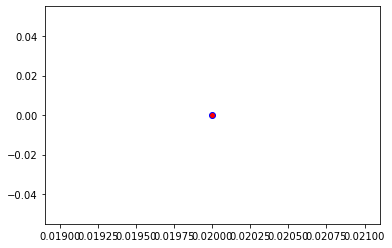

Crafting adversarial images took: 7.331383228302002 seconds 

Images classified as:
000000070739 845 = syringe
000000070774 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


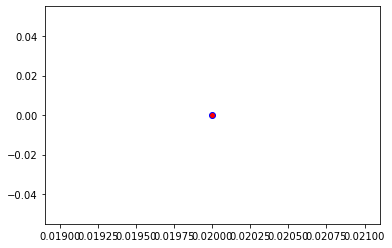

Crafting adversarial images took: 7.270257234573364 seconds 

Images classified as:
000000071226 168 = redbone
000000071451 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


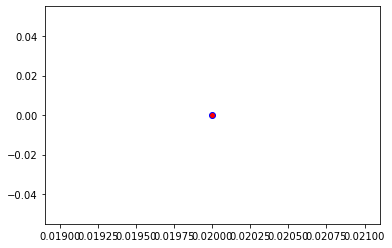

Crafting adversarial images took: 7.599583387374878 seconds 

Images classified as:
000000071711 895 = warplane
000000071756 297 = sloth bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


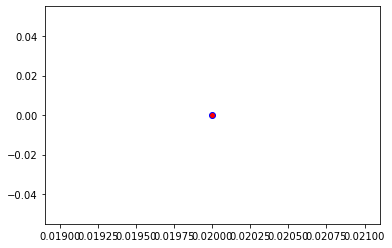

Crafting adversarial images took: 7.321413993835449 seconds 

Images classified as:
000000071877 491 = chain saw
000000071938 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


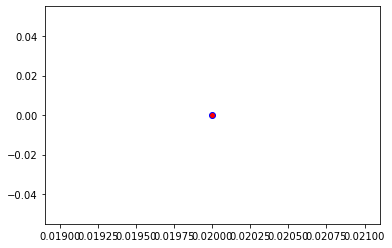

Crafting adversarial images took: 7.321520805358887 seconds 

Images classified as:
000000072281 880 = unicycle
000000072795 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


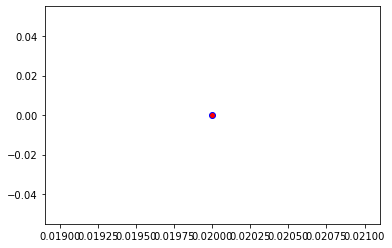

Crafting adversarial images took: 7.347161054611206 seconds 

Images classified as:
000000072813 209 = Chesapeake Bay retriever
000000072852 791 = shopping cart
Min values in image-array: 0.0 Max values in image-array: 253.07141
Min values in image-array: 0.0 Max values in image-array: 0.9924369
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


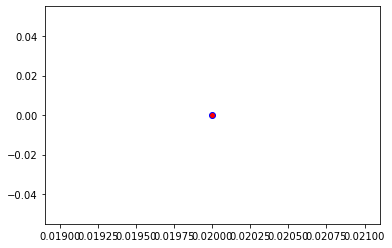

Crafting adversarial images took: 7.301914691925049 seconds 

Images classified as:
000000073118 850 = teddy
000000073153 500 = cliff
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


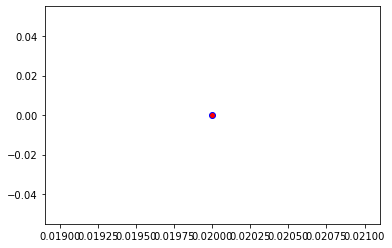

Crafting adversarial images took: 7.6319756507873535 seconds 

Images classified as:
000000073326 760 = refrigerator
000000073533 918 = crossword puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


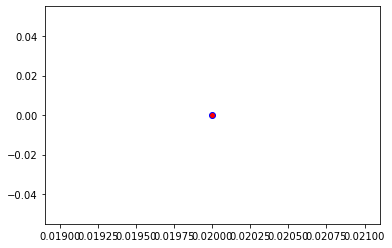

Crafting adversarial images took: 7.419396877288818 seconds 

Images classified as:
000000073702 830 = stretcher
000000073946 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


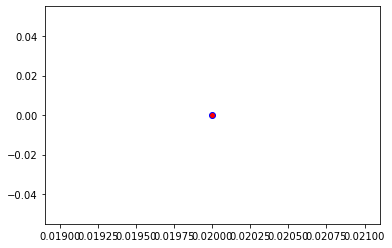

Crafting adversarial images took: 7.709561586380005 seconds 

Images classified as:
000000074058 603 = horse cart
000000074092 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


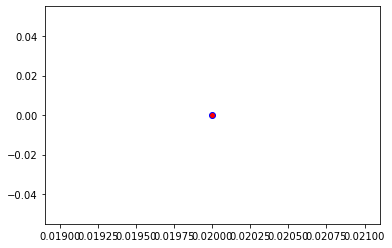

Crafting adversarial images took: 7.370941162109375 seconds 

Images classified as:
000000074200 835 = sundial
000000074209 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


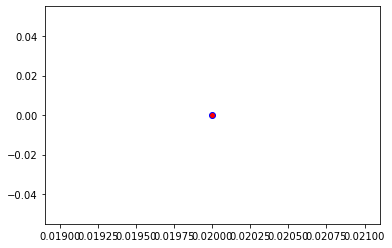

Crafting adversarial images took: 7.460927724838257 seconds 

Images classified as:
000000074256 411 = apron
000000074457 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


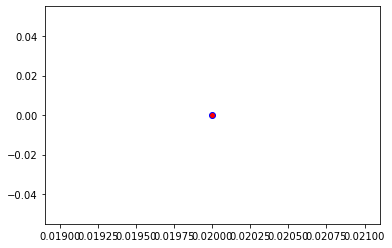

Crafting adversarial images took: 7.596201181411743 seconds 

Images classified as:
000000074646 978 = seashore
000000074733 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


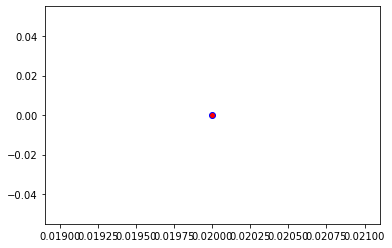

Crafting adversarial images took: 7.392069101333618 seconds 

Images classified as:
000000074860 802 = snowmobile
000000075393 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


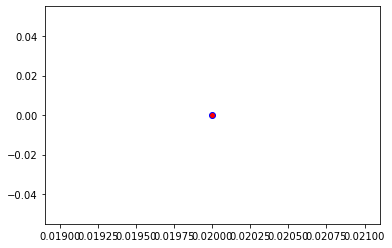

Crafting adversarial images took: 7.4993720054626465 seconds 

Images classified as:
000000075456 935 = mashed potato
000000075612 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


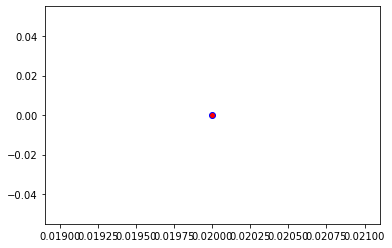

Crafting adversarial images took: 7.371106863021851 seconds 

Images classified as:
000000076211 498 = palace
000000076261 146 = albatross
Min values in image-array: 1.2226243 Max values in image-array: 232.30458
Min values in image-array: 0.004794605 Max values in image-array: 0.91099834
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


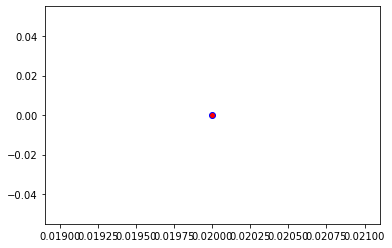

Crafting adversarial images took: 7.330136299133301 seconds 

Images classified as:
000000076416 407 = ambulance
000000076417 151 = Chihuahua
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


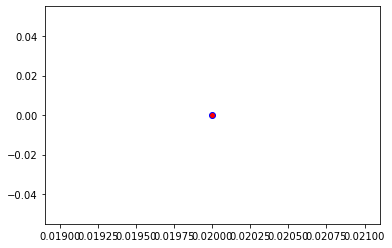

Crafting adversarial images took: 8.002273321151733 seconds 

Images classified as:
000000076468 752 = racket
000000076547 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


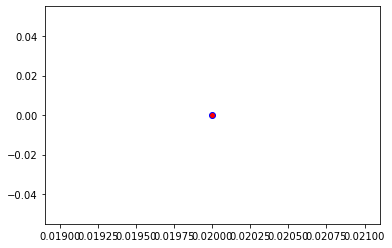

Crafting adversarial images took: 7.29922890663147 seconds 

Images classified as:
000000076625 829 = streetcar
000000076731 767 = rubber eraser
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


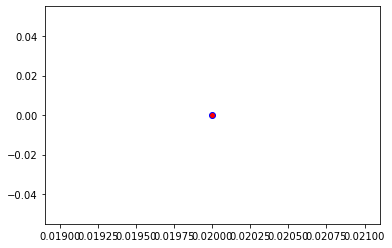

Crafting adversarial images took: 7.315925598144531 seconds 

Images classified as:
000000077396 548 = entertainment center
000000077460 958 = hay
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


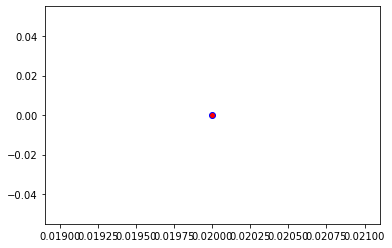

Crafting adversarial images took: 7.337141036987305 seconds 

Images classified as:
000000077595 285 = Egyptian cat
000000078032 706 = patio
Min values in image-array: 1.5412936 Max values in image-array: 255.0
Min values in image-array: 0.0060442886 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


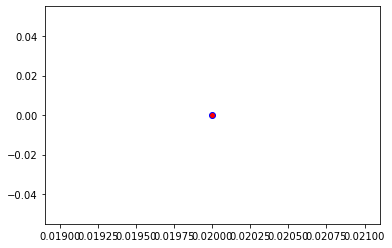

Crafting adversarial images took: 7.311983108520508 seconds 

Images classified as:
000000078170 851 = television
000000078266 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


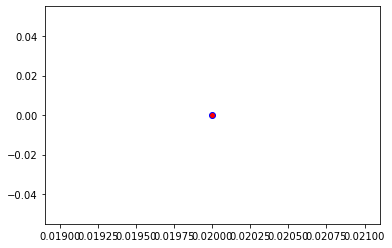

Crafting adversarial images took: 7.311640739440918 seconds 

Images classified as:
000000078404 703 = park bench
000000078420 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


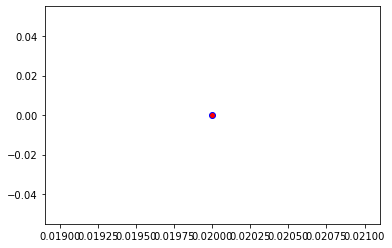

Crafting adversarial images took: 7.508235931396484 seconds 

Images classified as:
000000078426 285 = Egyptian cat
000000078565 914 = yawl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


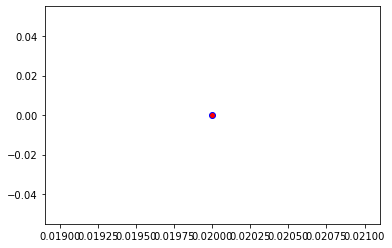

Crafting adversarial images took: 7.337425947189331 seconds 

Images classified as:
000000078748 665 = moped
000000078823 207 = golden retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


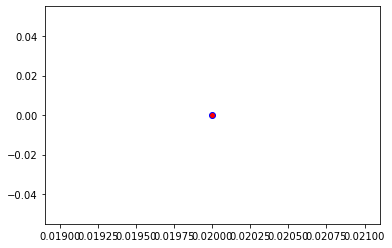

Crafting adversarial images took: 7.473004102706909 seconds 

Images classified as:
000000078843 515 = cowboy hat
000000078915 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


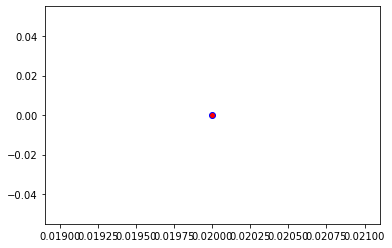

Crafting adversarial images took: 7.416480779647827 seconds 

Images classified as:
000000078959 105 = ear
000000079014 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 254.60715
Min values in image-array: 0.0 Max values in image-array: 0.9984594
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


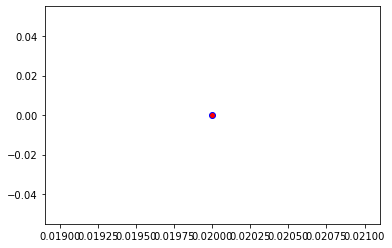

Crafting adversarial images took: 7.420437335968018 seconds 

Images classified as:
000000079031 472 = canoe
000000079034 898 = water bottle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


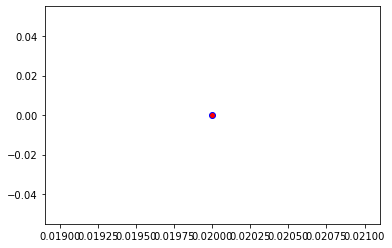

Crafting adversarial images took: 7.593553304672241 seconds 

Images classified as:
000000079144 297 = sloth bear
000000079188 275 = hyena
Min values in image-array: 0.0 Max values in image-array: 254.81635
Min values in image-array: 0.0 Max values in image-array: 0.9992798
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


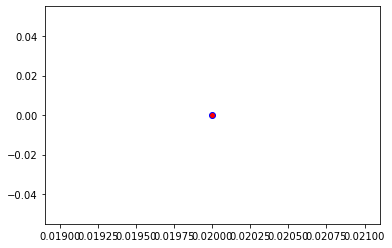

Crafting adversarial images took: 7.478942632675171 seconds 

Images classified as:
000000079229 354 = Arabian camel
000000079408 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


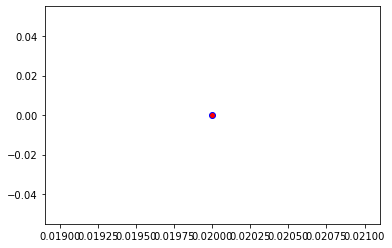

Crafting adversarial images took: 7.351091146469116 seconds 

Images classified as:
000000079565 354 = Arabian camel
000000079588 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


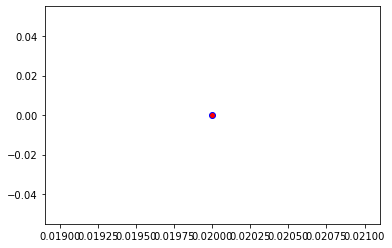

Crafting adversarial images took: 7.323333024978638 seconds 

Images classified as:
000000079651 954 = banana
000000079837 780 = schooner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


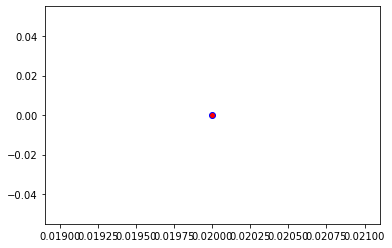

Crafting adversarial images took: 7.258926868438721 seconds 

Images classified as:
000000079969 752 = racket
000000080022 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


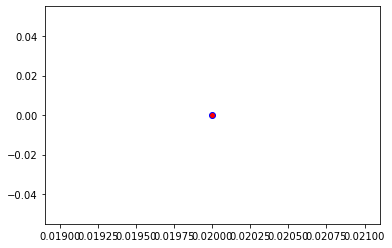

Crafting adversarial images took: 7.711482048034668 seconds 

Images classified as:
000000080057 470 = candle
000000080153 537 = dogsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


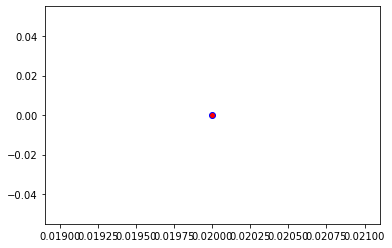

Crafting adversarial images took: 7.38083815574646 seconds 

Images classified as:
000000080273 248 = ski
000000080274 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


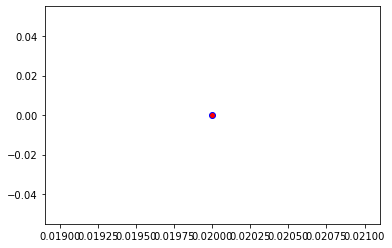

Crafting adversarial images took: 7.385845899581909 seconds 

Images classified as:
000000080340 523 = crutch
000000080413 485 = CD player
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


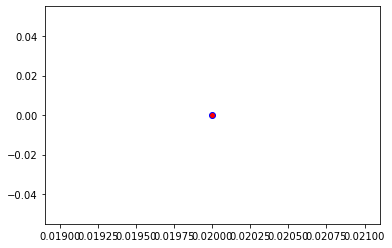

Crafting adversarial images took: 7.30123233795166 seconds 

Images classified as:
000000080659 603 = horse cart
000000080666 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


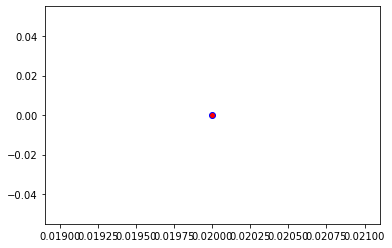

Crafting adversarial images took: 7.38296365737915 seconds 

Images classified as:
000000080671 248 = ski
000000080932 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


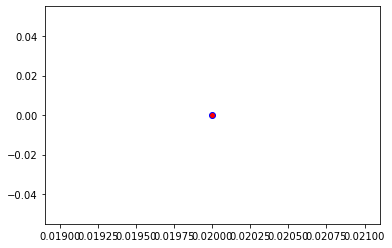

Crafting adversarial images took: 7.485090255737305 seconds 

Images classified as:
000000080949 620 = laptop
000000081061 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


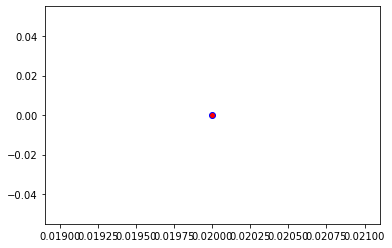

Crafting adversarial images took: 7.301034927368164 seconds 

Images classified as:
000000081394 675 = moving van
000000081594 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


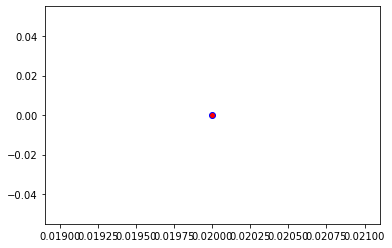

Crafting adversarial images took: 7.580371141433716 seconds 

Images classified as:
000000081738 79 = centipede
000000081766 256 = Newfoundland
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


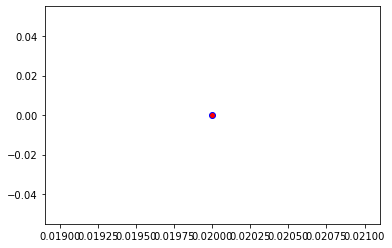

Crafting adversarial images took: 7.405681133270264 seconds 

Images classified as:
000000081988 693 = paddle
000000082085 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


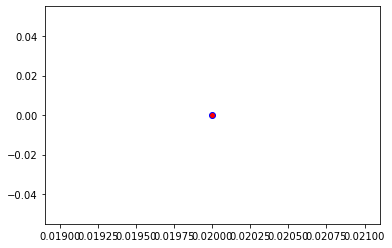

Crafting adversarial images took: 7.385441064834595 seconds 

Images classified as:
000000082180 850 = teddy
000000082688 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


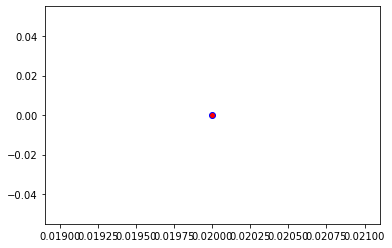

Crafting adversarial images took: 7.458755254745483 seconds 

Images classified as:
000000082696 203 = West Highland white terrier
000000082715 2 = great white shark
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


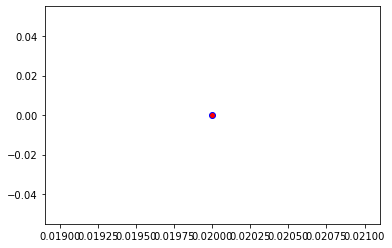

Crafting adversarial images took: 7.473690986633301 seconds 

Images classified as:
000000082765 750 = quilt
000000082807 219 = cocker spaniel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


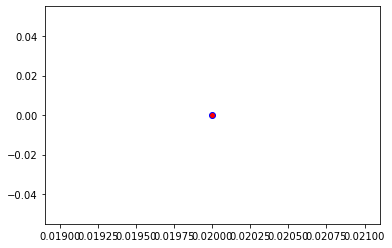

Crafting adversarial images took: 7.416002988815308 seconds 

Images classified as:
000000082812 874 = trolleybus
000000082821 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


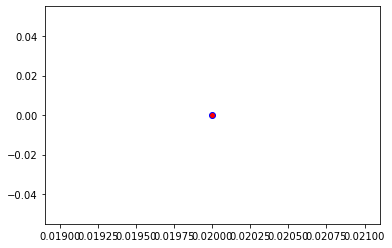

Crafting adversarial images took: 7.289475917816162 seconds 

Images classified as:
000000082846 874 = trolleybus
000000082986 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


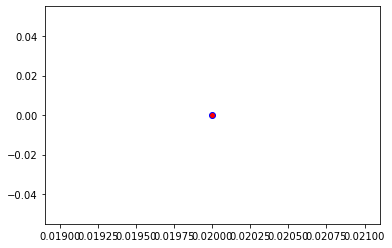

Crafting adversarial images took: 7.305696725845337 seconds 

Images classified as:
000000083113 354 = Arabian camel
000000083172 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


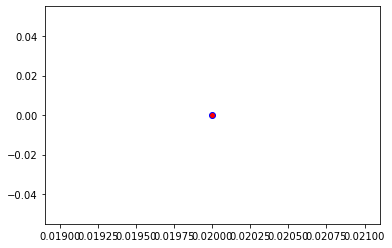

Crafting adversarial images took: 7.339590549468994 seconds 

Images classified as:
000000083531 467 = butcher shop
000000083540 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


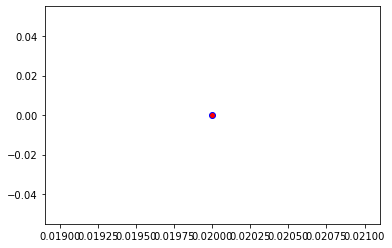

Crafting adversarial images took: 7.510385990142822 seconds 

Images classified as:
000000084031 981 = ballplayer
000000084170 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


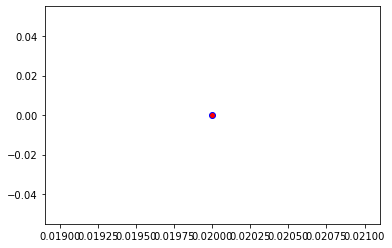

Crafting adversarial images took: 7.458484888076782 seconds 

Images classified as:
000000084241 469 = caldron
000000084270 877 = turnstile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


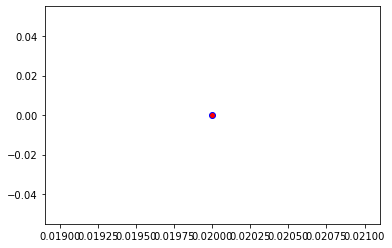

Crafting adversarial images took: 7.328254461288452 seconds 

Images classified as:
000000084362 236 = Doberman
000000084431 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


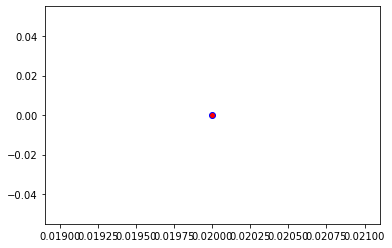

Crafting adversarial images took: 7.3216142654418945 seconds 

Images classified as:
000000084477 879 = umbrella
000000084492 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


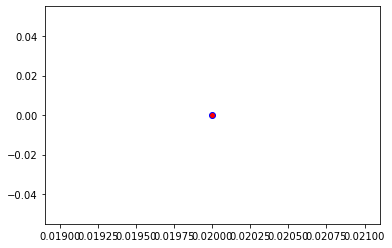

Crafting adversarial images took: 7.4341959953308105 seconds 

Images classified as:
000000084650 155 = Shih-Tzu
000000084664 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


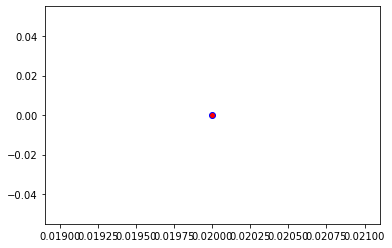

Crafting adversarial images took: 7.64793586730957 seconds 

Images classified as:
000000084674 457 = bow tie
000000084752 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


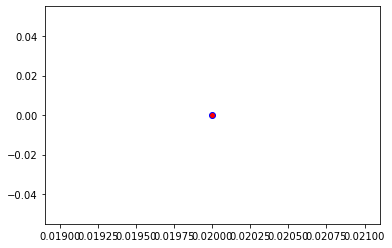

Crafting adversarial images took: 7.526251554489136 seconds 

Images classified as:
000000085089 966 = red wine
000000085157 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


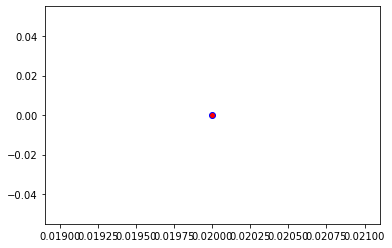

Crafting adversarial images took: 7.382717847824097 seconds 

Images classified as:
000000085195 928 = ice cream
000000085329 903 = wig
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


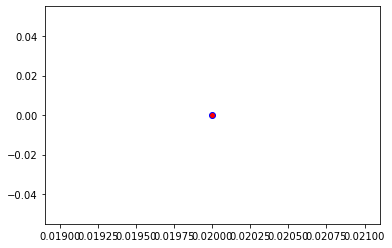

Crafting adversarial images took: 7.365738868713379 seconds 

Images classified as:
000000085376 919 = street sign
000000085478 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


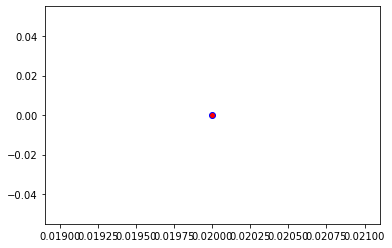

Crafting adversarial images took: 7.383527517318726 seconds 

Images classified as:
000000085576 896 = washbasin
000000085665 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


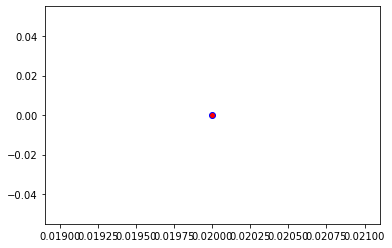

Crafting adversarial images took: 7.5912086963653564 seconds 

Images classified as:
000000085682 248 = ski
000000085772 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


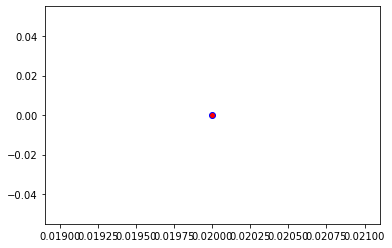

Crafting adversarial images took: 7.431298732757568 seconds 

Images classified as:
000000085823 340 = zebra
000000085911 129 = spoonbill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.5], dtype=float32)>)


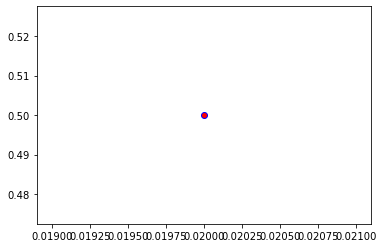

Crafting adversarial images took: 7.420653820037842 seconds 

Images classified as:
000000086220 874 = trolleybus
000000086483 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


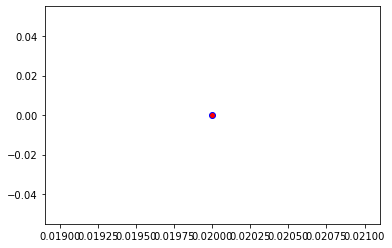

Crafting adversarial images took: 7.34214973449707 seconds 

Images classified as:
000000086582 526 = desk
000000086755 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


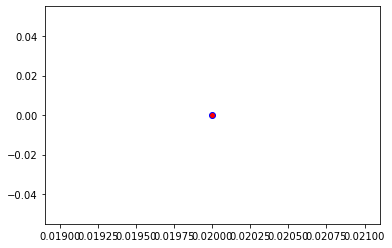

Crafting adversarial images took: 7.450698375701904 seconds 

Images classified as:
000000086956 731 = plunger
000000087038 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


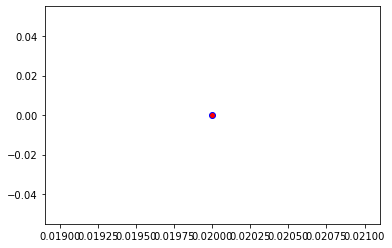

Crafting adversarial images took: 7.4212257862091064 seconds 

Images classified as:
000000087144 703 = park bench
000000087244 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


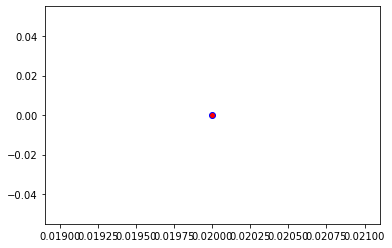

Crafting adversarial images took: 7.449687719345093 seconds 

Images classified as:
000000087470 690 = oxcart
000000087476 852 = tennis ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


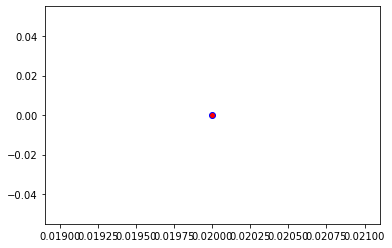

Crafting adversarial images took: 7.324710845947266 seconds 

Images classified as:
000000087742 799 = sliding door
000000087875 708 = pedestal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


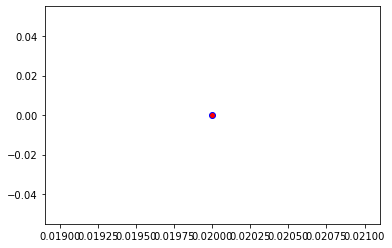

Crafting adversarial images took: 7.32835841178894 seconds 

Images classified as:
000000088040 461 = plate
000000088218 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


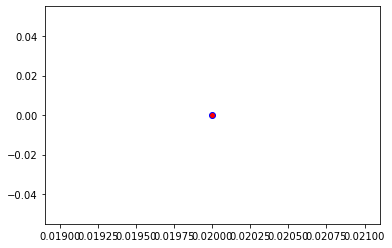

Crafting adversarial images took: 7.452521324157715 seconds 

Images classified as:
000000088250 386 = African elephant
000000088265 603 = horse cart
Min values in image-array: 1.3873053 Max values in image-array: 255.0
Min values in image-array: 0.0054404126 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


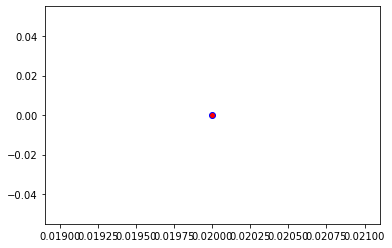

Crafting adversarial images took: 8.140327453613281 seconds 

Images classified as:
000000088269 809 = soup bowl
000000088345 490 = chain mail
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


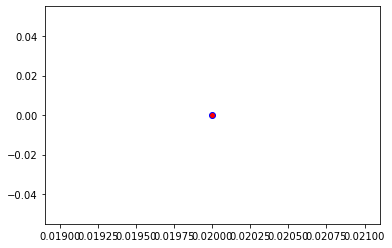

Crafting adversarial images took: 7.252048492431641 seconds 

Images classified as:
000000088432 583 = guillotine
000000088462 779 = school bus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


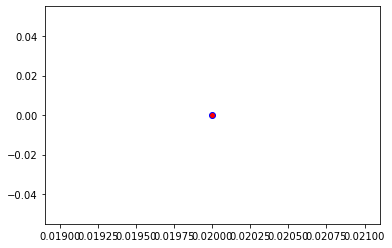

Crafting adversarial images took: 7.933777093887329 seconds 

Images classified as:
000000088485 752 = racket
000000088848 463 = bucket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


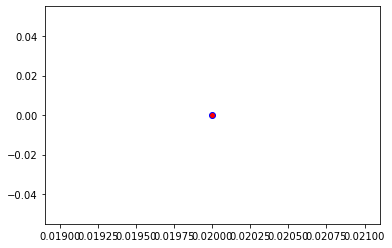

Crafting adversarial images took: 7.380756616592407 seconds 

Images classified as:
000000088951 703 = park bench
000000088970 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


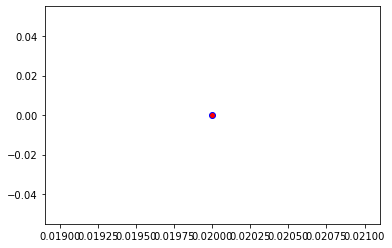

Crafting adversarial images took: 7.468007326126099 seconds 

Images classified as:
000000089045 831 = studio couch
000000089078 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


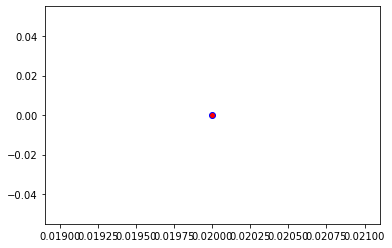

Crafting adversarial images took: 7.511913776397705 seconds 

Images classified as:
000000089271 281 = tabby
000000089296 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


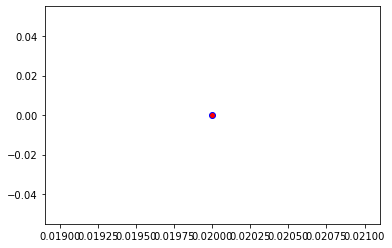

Crafting adversarial images took: 7.667195796966553 seconds 

Images classified as:
000000089556 734 = police van
000000089648 788 = shoe shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


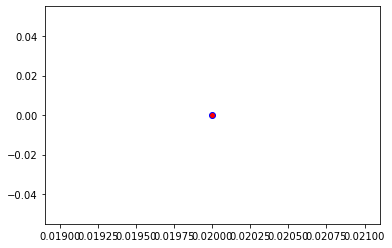

Crafting adversarial images took: 7.410398244857788 seconds 

Images classified as:
000000089670 415 = bakery
000000089697 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


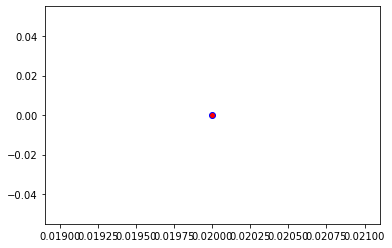

Crafting adversarial images took: 7.3574724197387695 seconds 

Images classified as:
000000089761 861 = toilet seat
000000089880 170 = Irish wolfhound
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


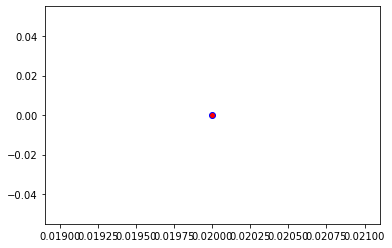

Crafting adversarial images took: 7.3023521900177 seconds 

Images classified as:
000000090003 205 = flat-coated retriever
000000090062 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


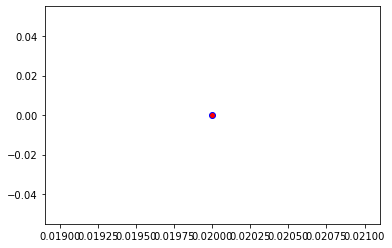

Crafting adversarial images took: 7.57217264175415 seconds 

Images classified as:
000000090108 896 = washbasin
000000090155 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


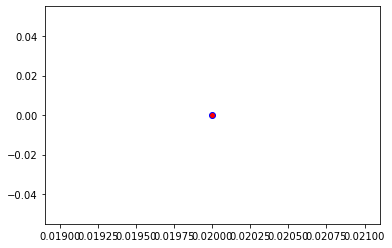

Crafting adversarial images took: 7.70306921005249 seconds 

Images classified as:
000000090208 874 = trolleybus
000000090284 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


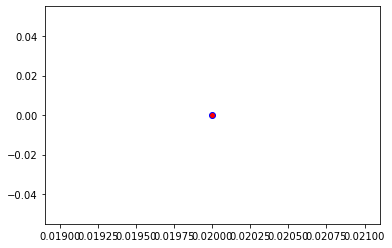

Crafting adversarial images took: 7.376428127288818 seconds 

Images classified as:
000000090631 895 = warplane
000000090891 955 = jackfruit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


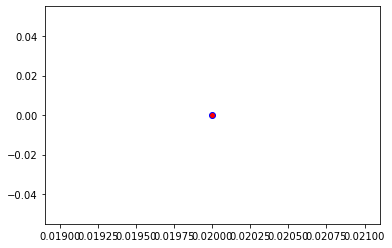

Crafting adversarial images took: 7.345459699630737 seconds 

Images classified as:
000000090956 248 = ski
000000091406 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


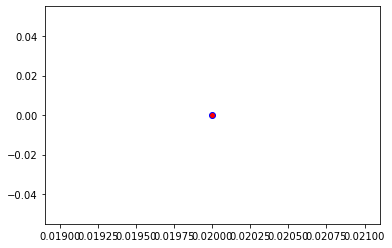

Crafting adversarial images took: 7.366440057754517 seconds 

Images classified as:
000000091495 981 = ballplayer
000000091500 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


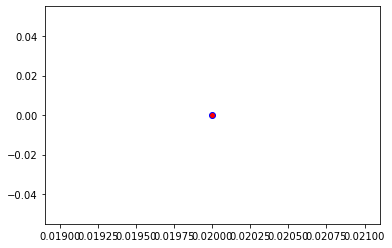

Crafting adversarial images took: 7.3644561767578125 seconds 

Images classified as:
000000091615 651 = microwave
000000091619 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


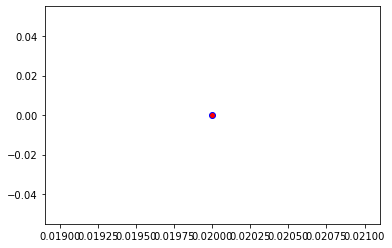

Crafting adversarial images took: 7.515430212020874 seconds 

Images classified as:
000000091654 809 = soup bowl
000000091779 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


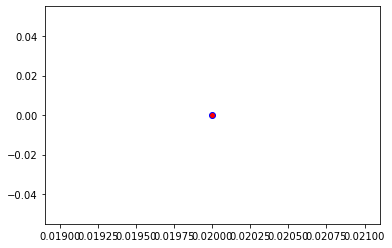

Crafting adversarial images took: 7.532433986663818 seconds 

Images classified as:
000000091921 340 = zebra
000000092053 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


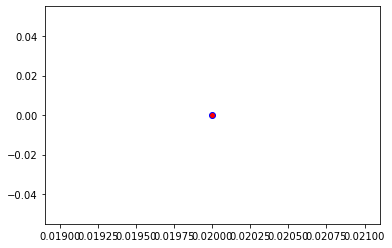

Crafting adversarial images took: 7.4611897468566895 seconds 

Images classified as:
000000092091 929 = ice lolly
000000092124 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


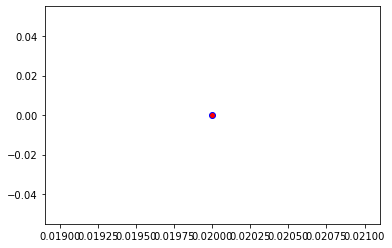

Crafting adversarial images took: 7.411817789077759 seconds 

Images classified as:
000000092177 470 = candle
000000092416 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


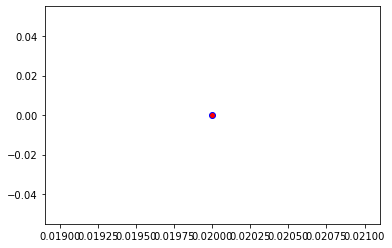

Crafting adversarial images took: 7.43885350227356 seconds 

Images classified as:
000000092660 937 = broccoli
000000092839 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


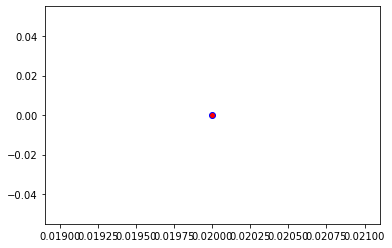

Crafting adversarial images took: 7.415739297866821 seconds 

Images classified as:
000000092939 927 = trifle
000000093154 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


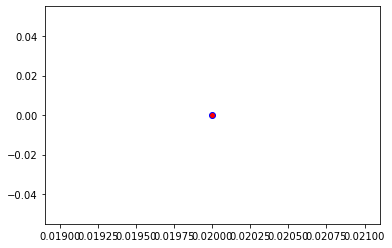

Crafting adversarial images took: 7.591470241546631 seconds 

Images classified as:
000000093261 842 = swimming trunks
000000093353 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


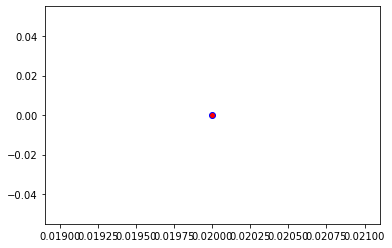

Crafting adversarial images took: 7.327403783798218 seconds 

Images classified as:
000000093437 887 = vestment
000000093717 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


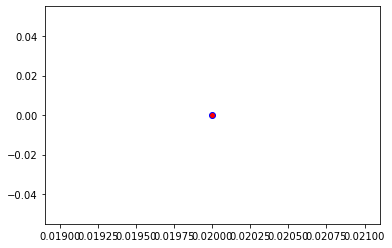

Crafting adversarial images took: 7.415764331817627 seconds 

Images classified as:
000000093965 340 = zebra
000000094157 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 254.67207
Min values in image-array: 0.0 Max values in image-array: 0.998714
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


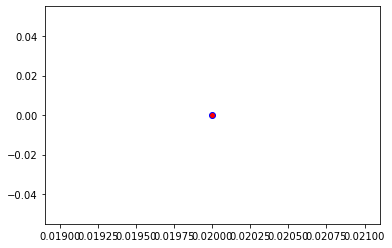

Crafting adversarial images took: 7.3458802700042725 seconds 

Images classified as:
000000094185 860 = tobacco shop
000000094326 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


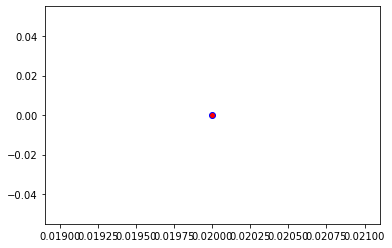

Crafting adversarial images took: 7.429172992706299 seconds 

Images classified as:
000000094336 896 = washbasin
000000094614 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


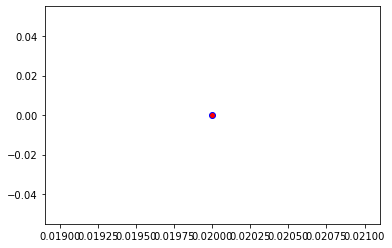

Crafting adversarial images took: 7.471484899520874 seconds 

Images classified as:
000000094751 920 = traffic light
000000094852 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


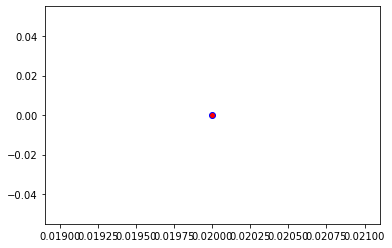

Crafting adversarial images took: 7.353268623352051 seconds 

Images classified as:
000000094871 5 = ram
000000094944 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


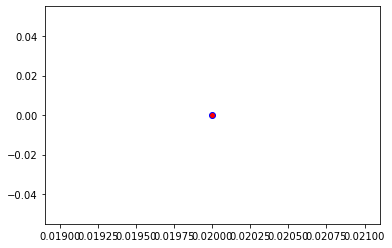

Crafting adversarial images took: 7.285477638244629 seconds 

Images classified as:
000000095069 483 = castle
000000095155 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


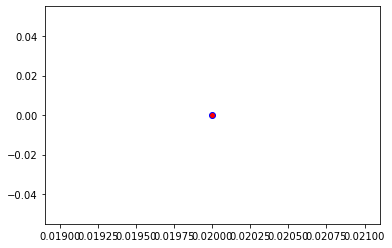

Crafting adversarial images took: 7.381685256958008 seconds 

Images classified as:
000000095707 928 = ice cream
000000095786 504 = coffee mug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


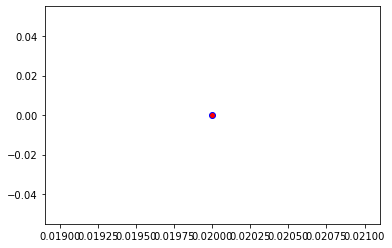

Crafting adversarial images took: 7.35523796081543 seconds 

Images classified as:
000000095843 757 = recreational vehicle
000000095862 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


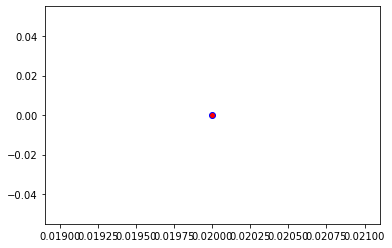

Crafting adversarial images took: 7.634383916854858 seconds 

Images classified as:
000000095899 919 = street sign
000000096001 623 = letter opener
Min values in image-array: 0.33289444 Max values in image-array: 255.0
Min values in image-array: 0.0013054684 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


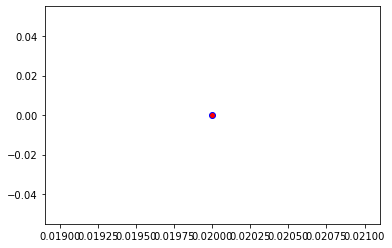

Crafting adversarial images took: 7.4858434200286865 seconds 

Images classified as:
000000096427 752 = racket
000000096493 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 253.23886
Min values in image-array: 0.0 Max values in image-array: 0.99309355
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


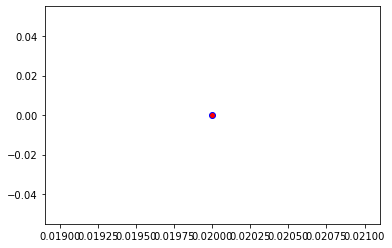

Crafting adversarial images took: 7.368260383605957 seconds 

Images classified as:
000000096549 404 = airliner
000000096825 537 = dogsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


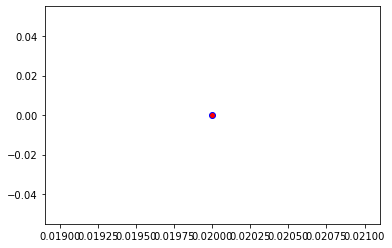

Crafting adversarial images took: 7.401567697525024 seconds 

Images classified as:
000000096960 296 = ice bear
000000097022 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


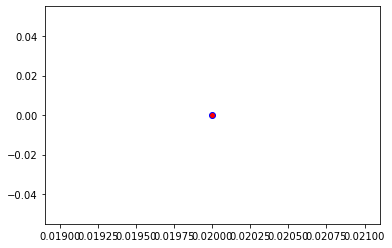

Crafting adversarial images took: 7.500109672546387 seconds 

Images classified as:
000000097230 386 = African elephant
000000097278 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


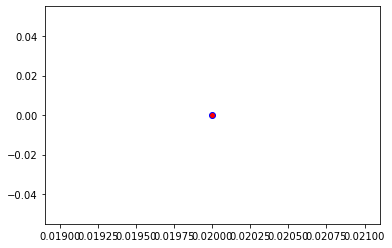

Crafting adversarial images took: 7.490857839584351 seconds 

Images classified as:
000000097337 598 = home theater
000000097585 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


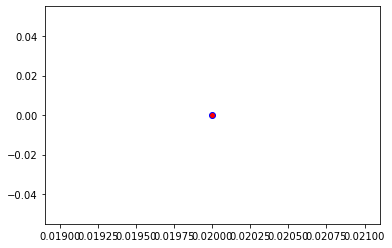

Crafting adversarial images took: 7.394965171813965 seconds 

Images classified as:
000000097679 656 = minivan
000000097924 856 = thresher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


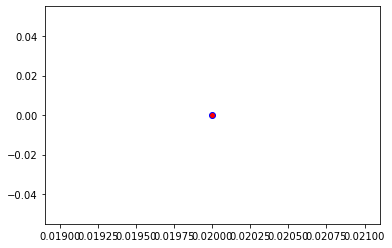

Crafting adversarial images took: 7.310759544372559 seconds 

Images classified as:
000000097988 890 = volleyball
000000097994 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


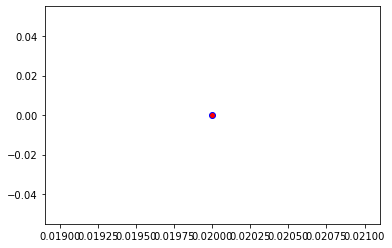

Crafting adversarial images took: 7.634274482727051 seconds 

Images classified as:
000000098018 739 = potter's wheel
000000098261 10 = brambling
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


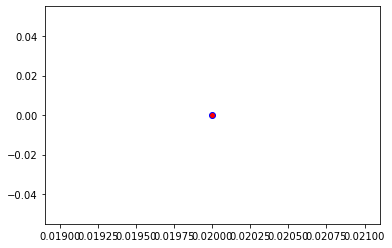

Crafting adversarial images took: 7.37134051322937 seconds 

Images classified as:
000000098287 703 = park bench
000000098392 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


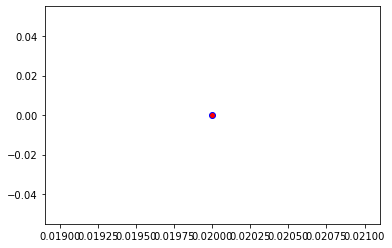

Crafting adversarial images took: 7.397976875305176 seconds 

Images classified as:
000000098497 900 = water tower
000000098520 404 = airliner
Min values in image-array: 1.0611837 Max values in image-array: 255.0
Min values in image-array: 0.0041615046 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


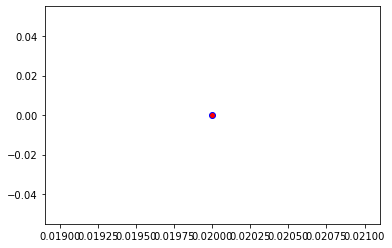

Crafting adversarial images took: 7.290081262588501 seconds 

Images classified as:
000000098633 927 = trifle
000000098716 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


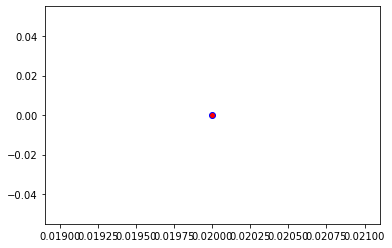

Crafting adversarial images took: 7.3115997314453125 seconds 

Images classified as:
000000098839 281 = tabby
000000098853 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


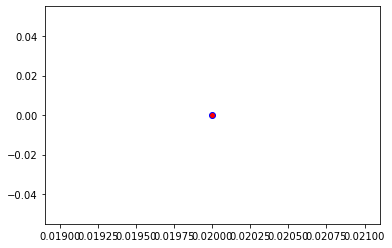

Crafting adversarial images took: 7.3644750118255615 seconds 

Images classified as:
000000099024 840 = swab
000000099039 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


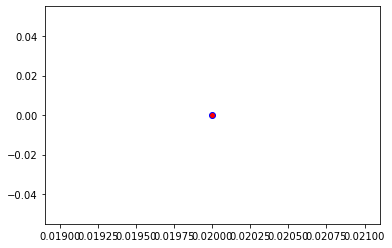

Crafting adversarial images took: 7.351623773574829 seconds 

Images classified as:
000000099053 809 = soup bowl
000000099054 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


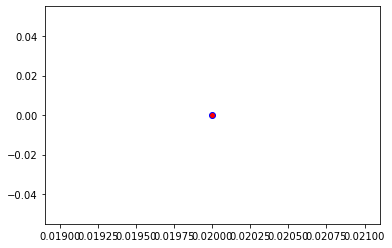

Crafting adversarial images took: 7.302647113800049 seconds 

Images classified as:
000000099114 646 = maze
000000099182 918 = crossword puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


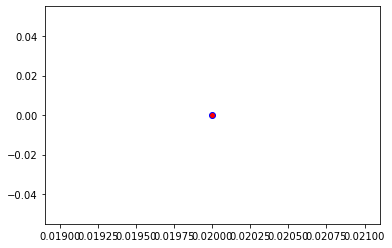

Crafting adversarial images took: 7.7690136432647705 seconds 

Images classified as:
000000099242 248 = ski
000000099428 593 = harmonica
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


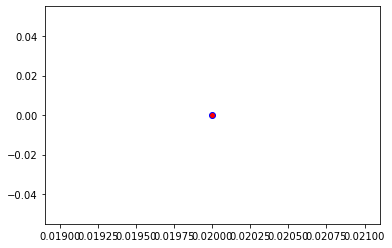

Crafting adversarial images took: 7.300511360168457 seconds 

Images classified as:
000000099810 910 = wooden spoon
000000100238 641 = maraca
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


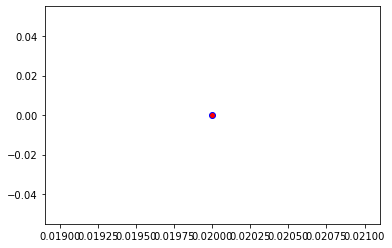

Crafting adversarial images took: 7.4419379234313965 seconds 

Images classified as:
000000100274 536 = dock
000000100283 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


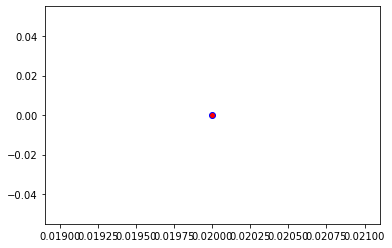

Crafting adversarial images took: 7.527028799057007 seconds 

Images classified as:
000000100428 731 = plunger
000000100489 16 = bulbul
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


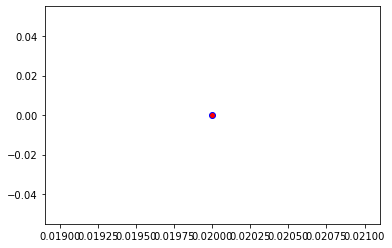

Crafting adversarial images took: 7.501941442489624 seconds 

Images classified as:
000000100510 339 = sorrel
000000100582 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


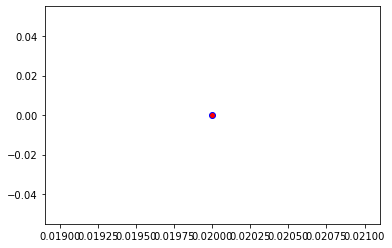

Crafting adversarial images took: 7.610230445861816 seconds 

Images classified as:
000000100624 487 = cellular telephone
000000100723 430 = basketball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


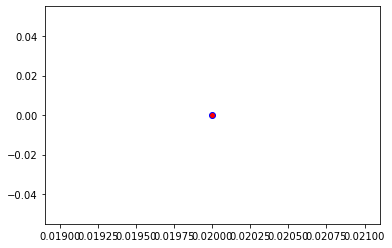

Crafting adversarial images took: 7.326861143112183 seconds 

Images classified as:
000000101022 448 = birdhouse
000000101068 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


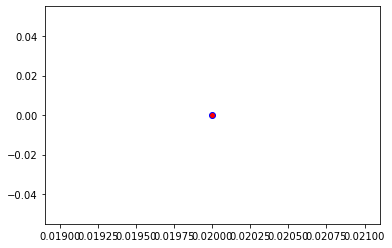

Crafting adversarial images took: 7.23190712928772 seconds 

Images classified as:
000000101420 750 = quilt
000000101762 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 254.8966
Min values in image-array: 0.0 Max values in image-array: 0.9995945
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


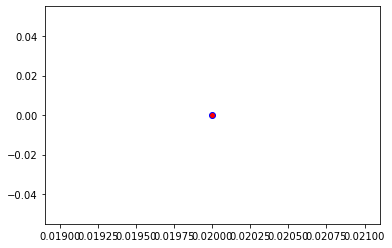

Crafting adversarial images took: 7.45119833946228 seconds 

Images classified as:
000000101780 354 = Arabian camel
000000101787 405 = airship
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


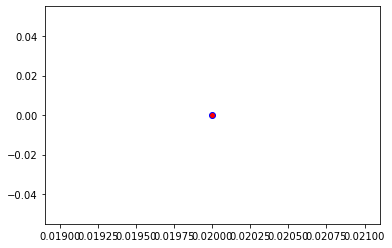

Crafting adversarial images took: 7.341075658798218 seconds 

Images classified as:
000000101884 498 = cinema
000000102331 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


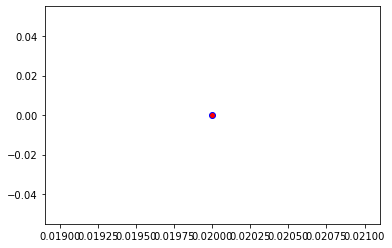

Crafting adversarial images took: 7.480464696884155 seconds 

Images classified as:
000000102356 670 = motor scooter
000000102411 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


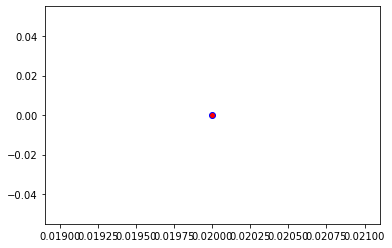

Crafting adversarial images took: 7.305325269699097 seconds 

Images classified as:
000000102644 861 = toilet seat
000000102707 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 254.8945
Min values in image-array: 0.0 Max values in image-array: 0.9995863
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


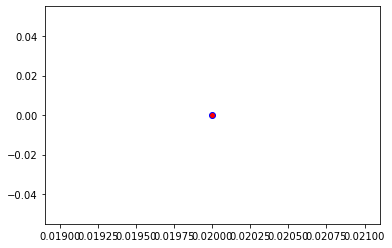

Crafting adversarial images took: 7.351975917816162 seconds 

Images classified as:
000000102805 975 = lakeside
000000102820 122 = American lobster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


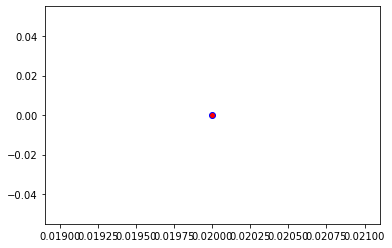

Crafting adversarial images took: 7.315400838851929 seconds 

Images classified as:
000000103548 346 = water buffalo
000000103585 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


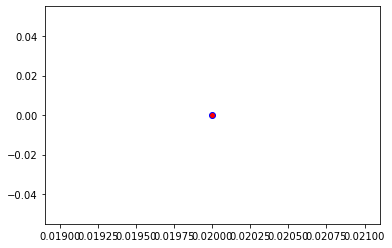

Crafting adversarial images took: 7.408461809158325 seconds 

Images classified as:
000000103723 385 = Indian elephant
000000104119 83 = prairie chicken
Min values in image-array: 1.3572464 Max values in image-array: 255.0
Min values in image-array: 0.005322535 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


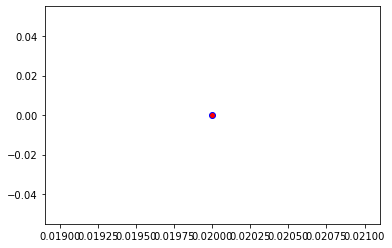

Crafting adversarial images took: 7.578866720199585 seconds 

Images classified as:
000000104198 919 = street sign
000000104424 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


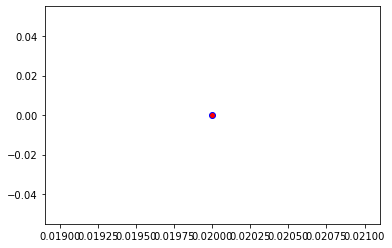

Crafting adversarial images took: 7.53464412689209 seconds 

Images classified as:
000000104455 340 = zebra
000000104572 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


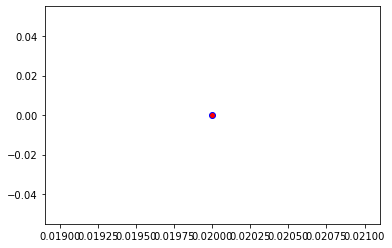

Crafting adversarial images took: 7.340754508972168 seconds 

Images classified as:
000000104603 295 = American black bear
000000104612 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


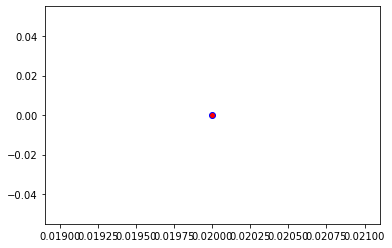

Crafting adversarial images took: 7.521406412124634 seconds 

Images classified as:
000000104619 354 = Arabian camel
000000104666 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


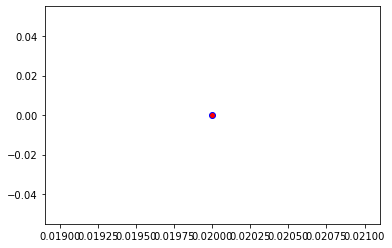

Crafting adversarial images took: 7.460439920425415 seconds 

Images classified as:
000000104669 461 = plate
000000104782 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


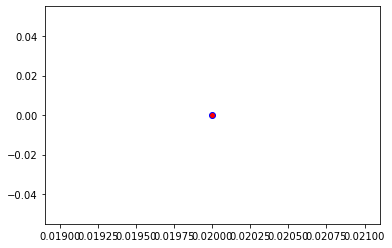

Crafting adversarial images took: 7.520836114883423 seconds 

Images classified as:
000000104803 861 = toilet seat
000000105014 910 = wooden spoon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


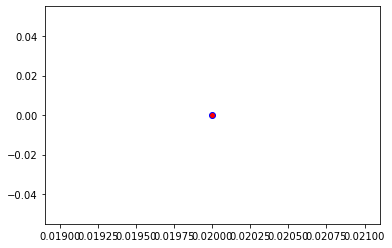

Crafting adversarial images took: 7.46097993850708 seconds 

Images classified as:
000000105249 861 = toilet seat
000000105264 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


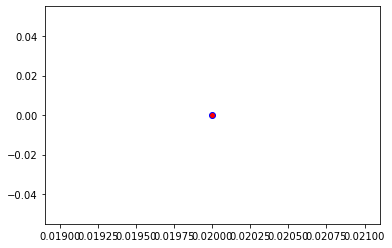

Crafting adversarial images took: 7.360999345779419 seconds 

Images classified as:
000000105335 942 = butternut squash
000000105455 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 254.86728
Min values in image-array: 0.0 Max values in image-array: 0.99947953
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


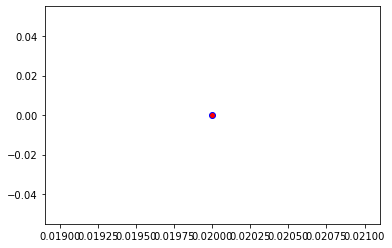

Crafting adversarial images took: 7.3544933795928955 seconds 

Images classified as:
000000105912 637 = mailbox
000000105923 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


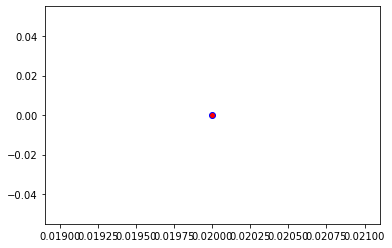

Crafting adversarial images took: 7.320788860321045 seconds 

Images classified as:
000000106048 757 = recreational vehicle
000000106235 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


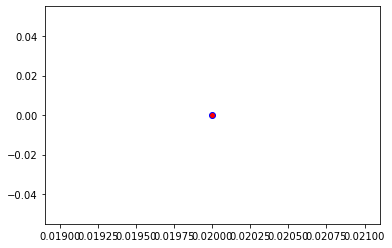

Crafting adversarial images took: 7.408371448516846 seconds 

Images classified as:
000000106266 941 = acorn squash
000000106281 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


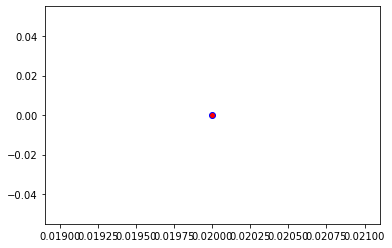

Crafting adversarial images took: 7.486106634140015 seconds 

Images classified as:
000000106330 850 = teddy
000000106389 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


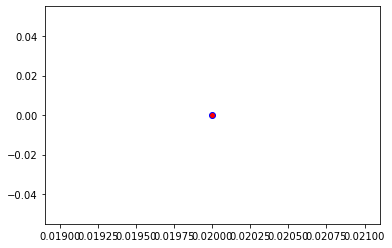

Crafting adversarial images took: 7.366202354431152 seconds 

Images classified as:
000000106563 884 = vault
000000106757 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


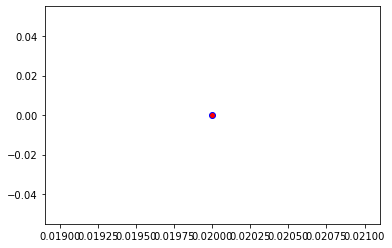

Crafting adversarial images took: 7.39534068107605 seconds 

Images classified as:
000000106881 16 = bulbul
000000106912 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


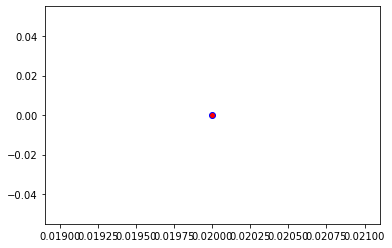

Crafting adversarial images took: 7.433452129364014 seconds 

Images classified as:
000000107087 669 = mosquito net
000000107094 792 = shovel
Min values in image-array: 0.013392806 Max values in image-array: 255.0
Min values in image-array: 5.252081e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


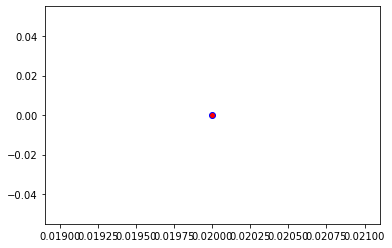

Crafting adversarial images took: 7.4008870124816895 seconds 

Images classified as:
000000107226 257 = Great Pyrenees
000000107339 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


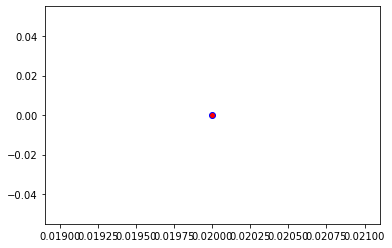

Crafting adversarial images took: 7.65543270111084 seconds 

Images classified as:
000000107554 792 = shovel
000000107851 690 = oxcart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


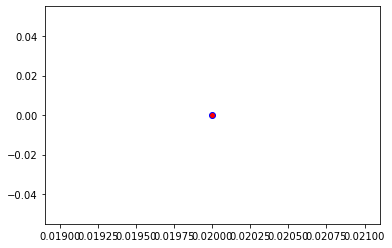

Crafting adversarial images took: 7.400723934173584 seconds 

Images classified as:
000000108026 508 = computer keyboard
000000108244 478 = carton
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


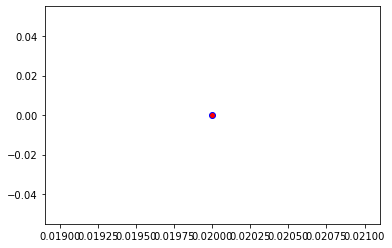

Crafting adversarial images took: 7.421365737915039 seconds 

Images classified as:
000000108253 461 = plate
000000108440 713 = pier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


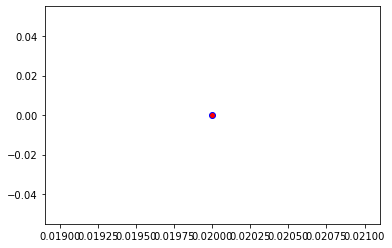

Crafting adversarial images took: 7.526276111602783 seconds 

Images classified as:
000000108495 608 = jean
000000108503 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


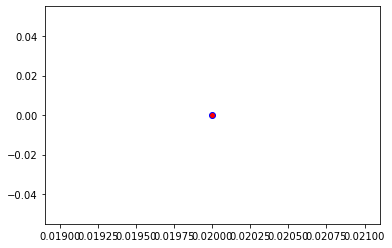

Crafting adversarial images took: 7.490526437759399 seconds 

Images classified as:
000000108864 386 = African elephant
000000109055 545 = electric fan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


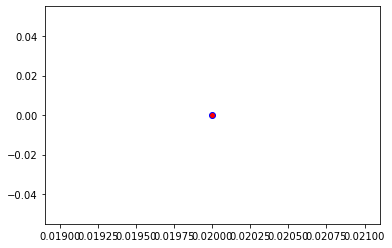

Crafting adversarial images took: 7.411802768707275 seconds 

Images classified as:
000000109118 652 = military uniform
000000109313 747 = punching bag
Min values in image-array: 0.8308253 Max values in image-array: 255.0
Min values in image-array: 0.0032581384 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


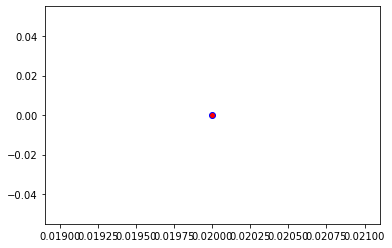

Crafting adversarial images took: 7.411196947097778 seconds 

Images classified as:
000000109441 498 = cinema
000000109798 933 = cheeseburger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


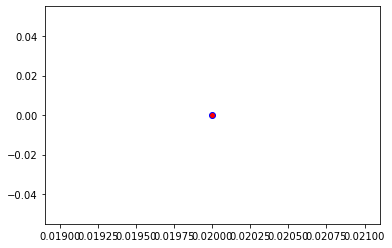

Crafting adversarial images took: 7.366715669631958 seconds 

Images classified as:
000000109827 850 = teddy
000000109900 609 = jeep
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


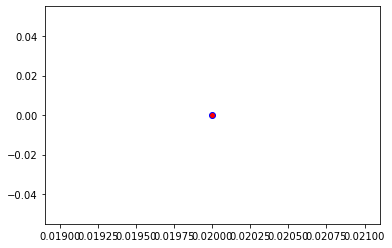

Crafting adversarial images took: 7.85711407661438 seconds 

Images classified as:
000000109916 567 = frying pan
000000109976 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


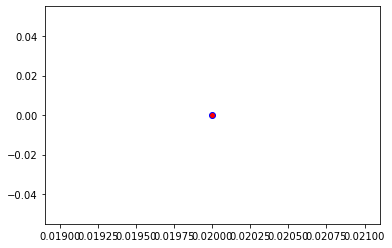

Crafting adversarial images took: 7.361785173416138 seconds 

Images classified as:
000000109992 792 = shovel
000000110042 469 = caldron
Min values in image-array: 0.0 Max values in image-array: 254.94258
Min values in image-array: 0.0 Max values in image-array: 0.9997748
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


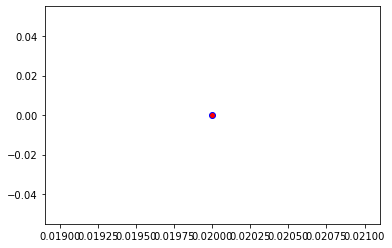

Crafting adversarial images took: 7.406980276107788 seconds 

Images classified as:
000000110211 340 = zebra
000000110282 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


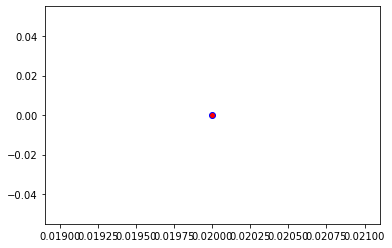

Crafting adversarial images took: 7.462655782699585 seconds 

Images classified as:
000000110359 404 = airliner
000000110449 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


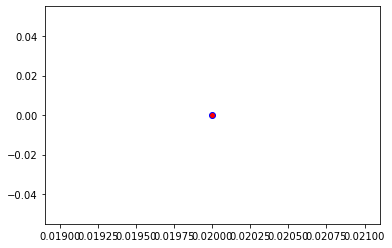

Crafting adversarial images took: 7.265726566314697 seconds 

Images classified as:
000000110638 385 = Indian elephant
000000110721 657 = missile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


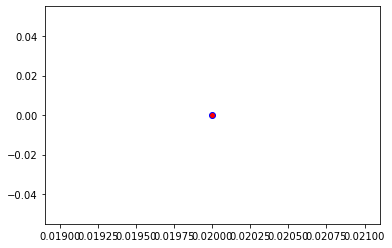

Crafting adversarial images took: 7.418030738830566 seconds 

Images classified as:
000000110784 829 = streetcar
000000110884 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


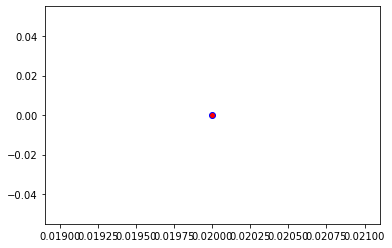

Crafting adversarial images took: 7.261103391647339 seconds 

Images classified as:
000000110972 295 = American black bear
000000110999 607 = jack-o'-lantern
Min values in image-array: 0.0 Max values in image-array: 254.85715
Min values in image-array: 0.0 Max values in image-array: 0.9994398
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


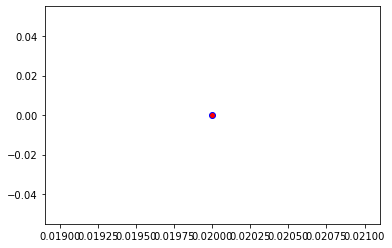

Crafting adversarial images took: 7.632344722747803 seconds 

Images classified as:
000000111036 827 = stove
000000111086 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


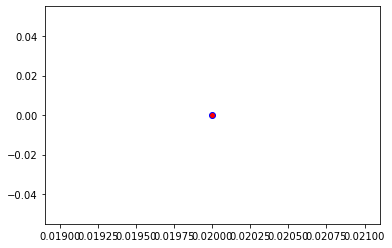

Crafting adversarial images took: 7.548267602920532 seconds 

Images classified as:
000000111179 442 = bell cote
000000111207 634 = lumbermill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


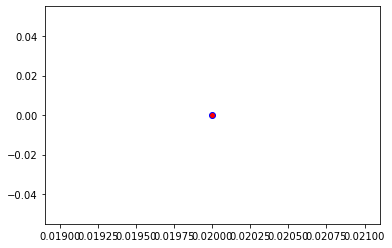

Crafting adversarial images took: 7.440924644470215 seconds 

Images classified as:
000000111609 529 = diaper
000000111951 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


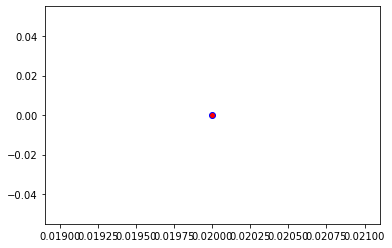

Crafting adversarial images took: 7.4459192752838135 seconds 

Images classified as:
000000112110 778 = scale
000000112298 752 = racket
Min values in image-array: 0.0 Max values in image-array: 242.85803
Min values in image-array: 0.0 Max values in image-array: 0.9523844
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


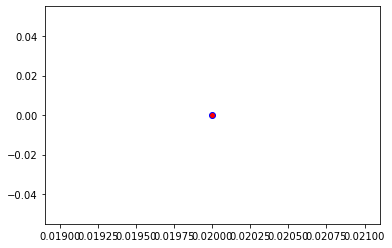

Crafting adversarial images took: 7.588476657867432 seconds 

Images classified as:
000000112378 703 = park bench
000000112626 742 = printer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


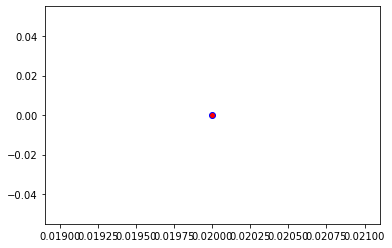

Crafting adversarial images took: 7.300204515457153 seconds 

Images classified as:
000000112634 354 = Arabian camel
000000112798 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


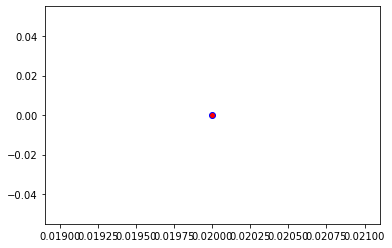

Crafting adversarial images took: 7.491190195083618 seconds 

Images classified as:
000000112997 662 = modem
000000113051 576 = gondola
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


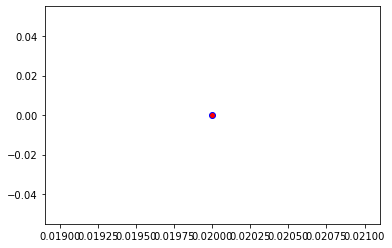

Crafting adversarial images took: 7.466886520385742 seconds 

Images classified as:
000000113235 355 = llama
000000113354 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


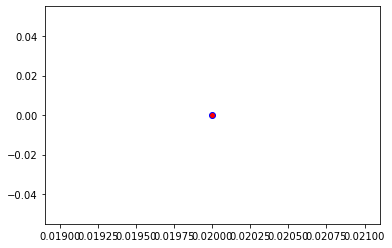

Crafting adversarial images took: 7.450793027877808 seconds 

Images classified as:
000000113403 850 = teddy
000000113589 924 = guacamole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


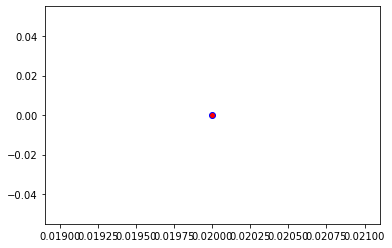

Crafting adversarial images took: 7.2811503410339355 seconds 

Images classified as:
000000113720 963 = pizza
000000113867 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


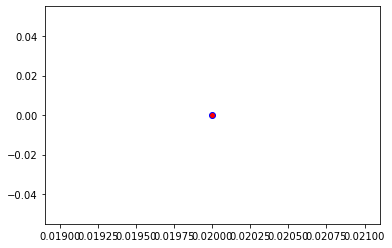

Crafting adversarial images took: 7.457754135131836 seconds 

Images classified as:
000000114049 561 = forklift
000000114770 586 = half track
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


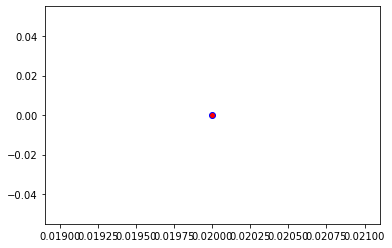

Crafting adversarial images took: 7.379693984985352 seconds 

Images classified as:
000000114871 954 = banana
000000114884 466 = bullet train
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


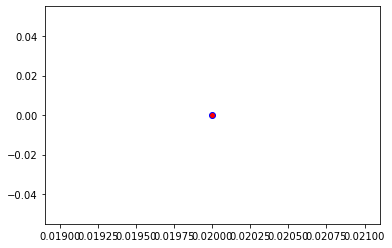

Crafting adversarial images took: 7.520498514175415 seconds 

Images classified as:
000000114907 743 = prison
000000115118 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


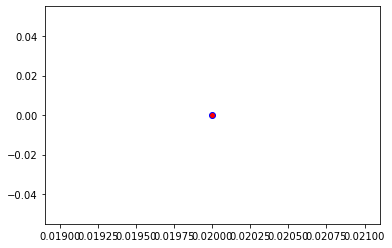

Crafting adversarial images took: 7.355833530426025 seconds 

Images classified as:
000000115245 526 = desk
000000115870 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


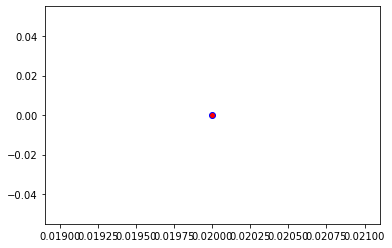

Crafting adversarial images took: 7.418206691741943 seconds 

Images classified as:
000000115885 620 = laptop
000000115898 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


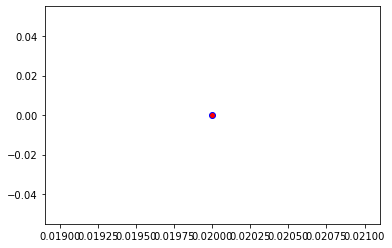

Crafting adversarial images took: 7.394413948059082 seconds 

Images classified as:
000000115946 920 = traffic light
000000116068 775 = sarong
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


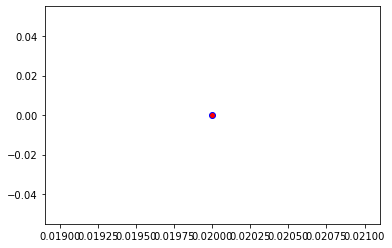

Crafting adversarial images took: 7.527890205383301 seconds 

Images classified as:
000000116206 936 = head cabbage
000000116208 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


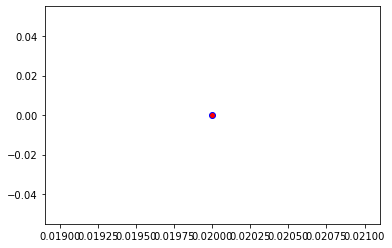

Crafting adversarial images took: 7.567448139190674 seconds 

Images classified as:
000000116362 461 = plate
000000116439 344 = hippopotamus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


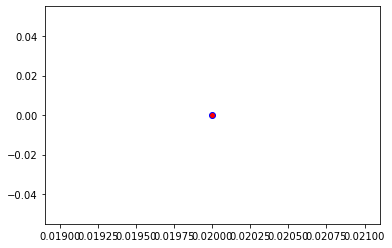

Crafting adversarial images took: 7.495428085327148 seconds 

Images classified as:
000000116479 564 = four-poster
000000116589 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 254.92719
Min values in image-array: 0.0 Max values in image-array: 0.99971443
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


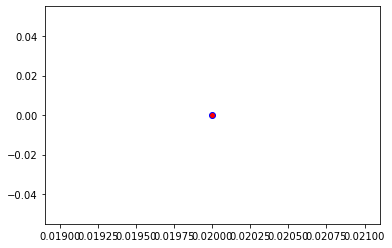

Crafting adversarial images took: 7.427254915237427 seconds 

Images classified as:
000000116825 761 = remote control
000000117197 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


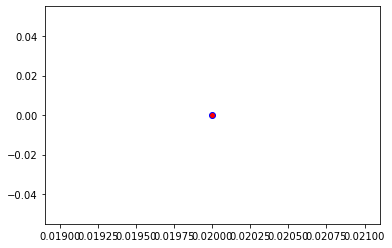

Crafting adversarial images took: 7.496000528335571 seconds 

Images classified as:
000000117374 104 = wallaby
000000117425 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


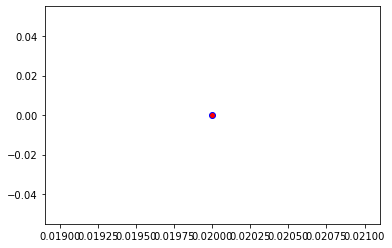

Crafting adversarial images took: 7.522223472595215 seconds 

Images classified as:
000000117492 645 = maypole
000000117525 245 = French bulldog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


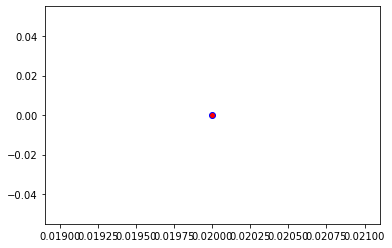

Crafting adversarial images took: 7.539925575256348 seconds 

Images classified as:
000000117645 248 = ski
000000117719 860 = tobacco shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


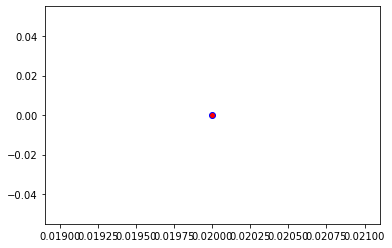

Crafting adversarial images took: 7.519575357437134 seconds 

Images classified as:
000000117744 752 = racket
000000117908 162 = beagle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


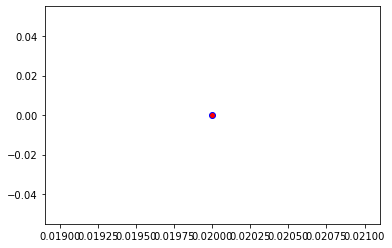

Crafting adversarial images took: 7.42807936668396 seconds 

Images classified as:
000000117914 861 = toilet seat
000000118209 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


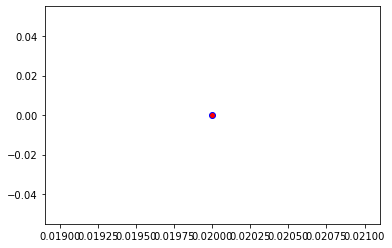

Crafting adversarial images took: 7.907963275909424 seconds 

Images classified as:
000000118367 934 = hotdog
000000118405 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


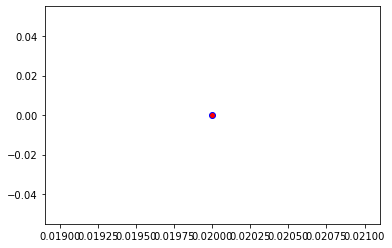

Crafting adversarial images took: 7.355442523956299 seconds 

Images classified as:
000000118515 281 = tabby
000000118594 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


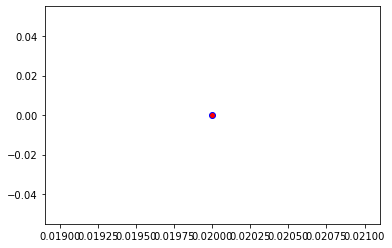

Crafting adversarial images took: 7.284812688827515 seconds 

Images classified as:
000000118921 248 = ski
000000119038 37 = ox
Min values in image-array: 0.0 Max values in image-array: 252.96094
Min values in image-array: 0.0 Max values in image-array: 0.9920037
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


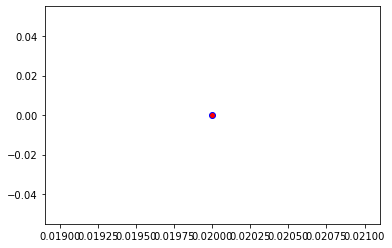

Crafting adversarial images took: 7.564061641693115 seconds 

Images classified as:
000000119088 394 = sturgeon
000000119233 361 = skunk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


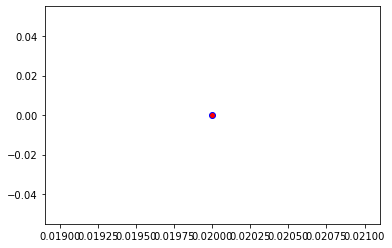

Crafting adversarial images took: 7.362296104431152 seconds 

Images classified as:
000000119365 620 = laptop
000000119445 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


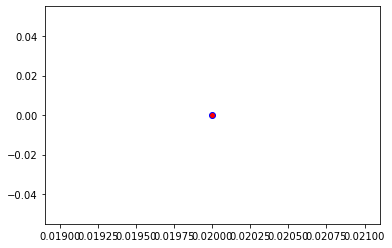

Crafting adversarial images took: 7.424131155014038 seconds 

Images classified as:
000000119452 954 = banana
000000119516 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


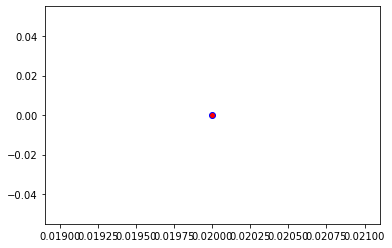

Crafting adversarial images took: 7.625370264053345 seconds 

Images classified as:
000000119641 346 = water buffalo
000000119677 930 = French loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


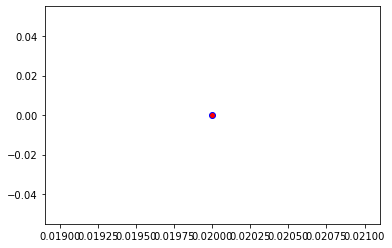

Crafting adversarial images took: 7.480799913406372 seconds 

Images classified as:
000000119828 620 = laptop
000000119911 646 = maze
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


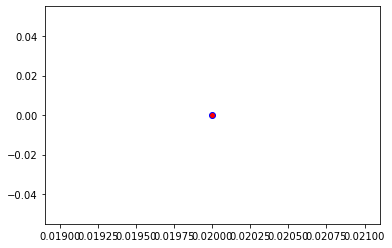

Crafting adversarial images took: 7.539568901062012 seconds 

Images classified as:
000000119995 752 = racket
000000120420 447 = binoculars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


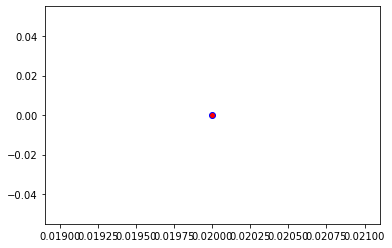

Crafting adversarial images took: 7.599803447723389 seconds 

Images classified as:
000000120572 442 = bell cote
000000120584 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 249.57144
Min values in image-array: 0.0 Max values in image-array: 0.97871155
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


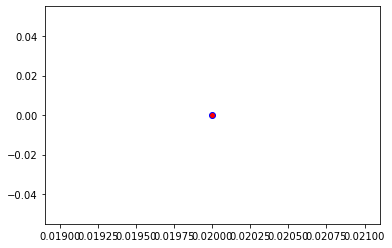

Crafting adversarial images took: 7.451380491256714 seconds 

Images classified as:
000000120777 461 = plate
000000120853 964 = potpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


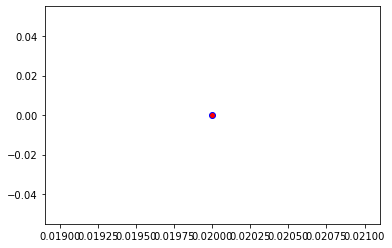

Crafting adversarial images took: 7.442998647689819 seconds 

Images classified as:
000000121031 690 = oxcart
000000121153 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.82005
Min values in image-array: 0.0 Max values in image-array: 0.99929434
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


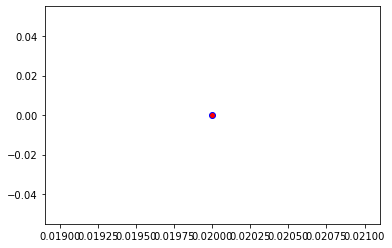

Crafting adversarial images took: 7.341583967208862 seconds 

Images classified as:
000000121242 603 = horse cart
000000121417 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


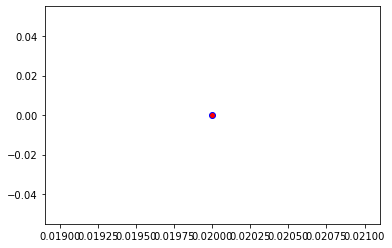

Crafting adversarial images took: 7.567131042480469 seconds 

Images classified as:
000000121497 822 = steel drum
000000121506 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


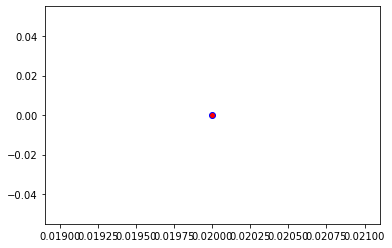

Crafting adversarial images took: 7.2322351932525635 seconds 

Images classified as:
000000121586 526 = desk
000000121591 921 = book jacket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


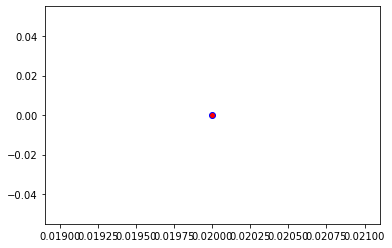

Crafting adversarial images took: 7.451693058013916 seconds 

Images classified as:
000000121673 472 = canoe
000000121744 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


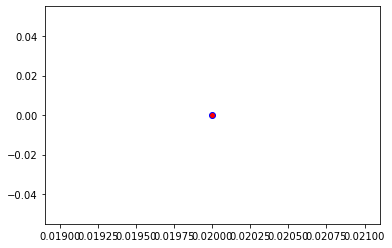

Crafting adversarial images took: 7.379835844039917 seconds 

Images classified as:
000000122046 879 = umbrella
000000122166 734 = police van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


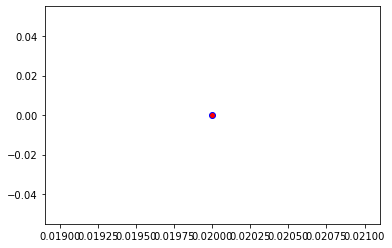

Crafting adversarial images took: 7.346874952316284 seconds 

Images classified as:
000000122217 751 = racer
000000122606 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


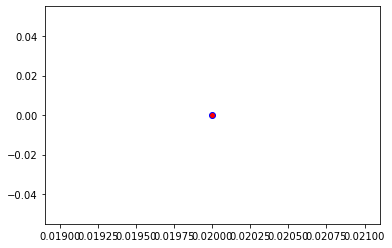

Crafting adversarial images took: 7.506089925765991 seconds 

Images classified as:
000000122672 211 = vizsla
000000122745 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


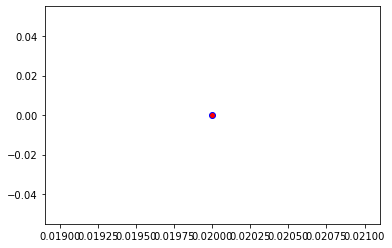

Crafting adversarial images took: 7.387858867645264 seconds 

Images classified as:
000000122927 82 = partridge
000000122962 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


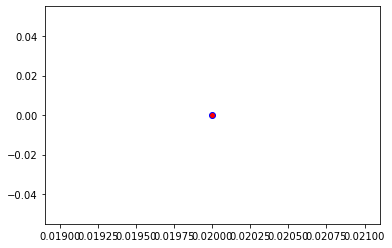

Crafting adversarial images took: 7.177918910980225 seconds 

Images classified as:
000000122969 340 = zebra
000000123131 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


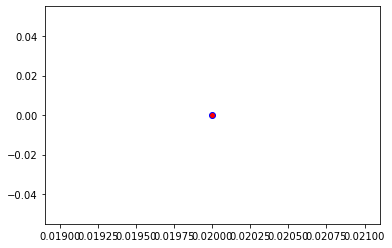

Crafting adversarial images took: 7.73475980758667 seconds 

Images classified as:
000000123213 981 = ballplayer
000000123321 925 = consomme
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


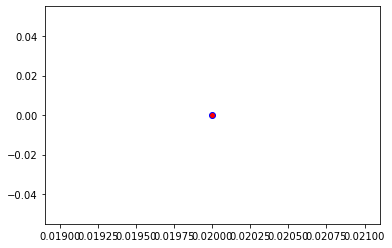

Crafting adversarial images took: 7.531855821609497 seconds 

Images classified as:
000000123480 929 = ice lolly
000000123585 15 = robin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


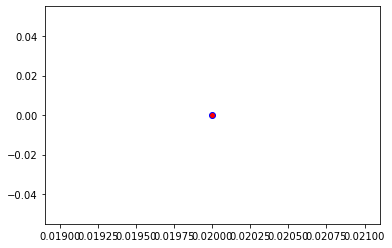

Crafting adversarial images took: 7.521176099777222 seconds 

Images classified as:
000000123633 813 = spatula
000000124277 713 = pier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


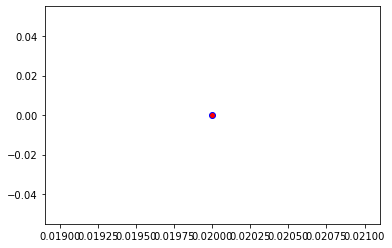

Crafting adversarial images took: 7.445676565170288 seconds 

Images classified as:
000000124442 730 = plow
000000124636 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


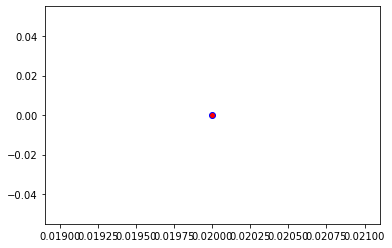

Crafting adversarial images took: 7.557455778121948 seconds 

Images classified as:
000000124659 526 = desk
000000124798 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


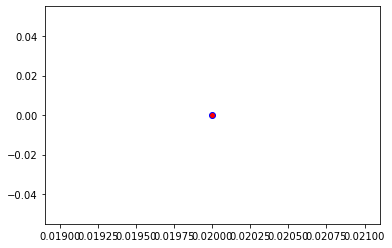

Crafting adversarial images took: 7.446868419647217 seconds 

Images classified as:
000000124975 340 = zebra
000000125062 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.5], dtype=float32)>)


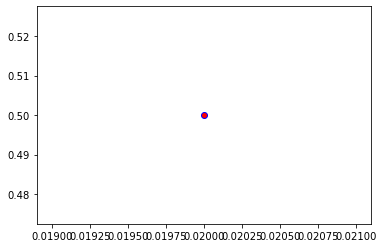

Crafting adversarial images took: 7.450998783111572 seconds 

Images classified as:
000000125072 976 = promontory
000000125129 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


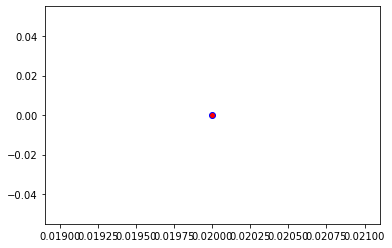

Crafting adversarial images took: 7.497423410415649 seconds 

Images classified as:
000000125211 340 = zebra
000000125245 973 = coral reef
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


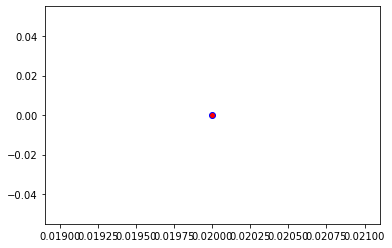

Crafting adversarial images took: 7.408048152923584 seconds 

Images classified as:
000000125257 140 = alp
000000125405 227 = kelpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


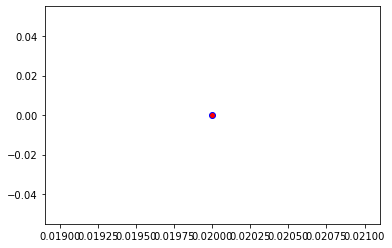

Crafting adversarial images took: 7.301217317581177 seconds 

Images classified as:
000000125472 870 = tricycle
000000125572 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


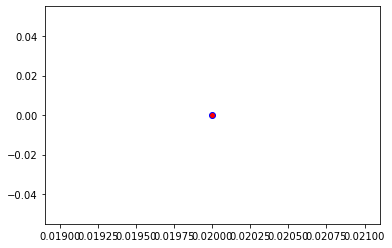

Crafting adversarial images took: 7.4558515548706055 seconds 

Images classified as:
000000125778 905 = window shade
000000125806 295 = American black bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


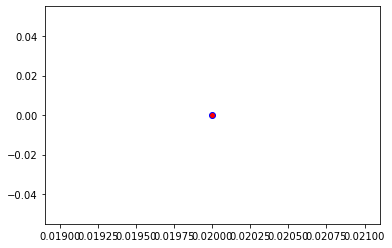

Crafting adversarial images took: 7.295495986938477 seconds 

Images classified as:
000000125850 281 = tabby
000000125936 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


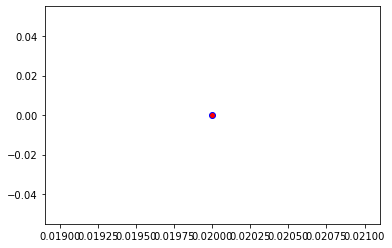

Crafting adversarial images took: 7.5533835887908936 seconds 

Images classified as:
000000125952 414 = backpack
000000126107 146 = albatross
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


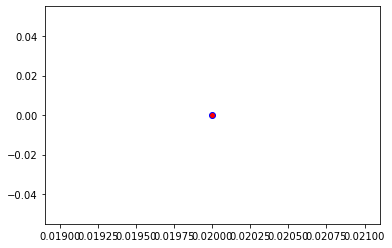

Crafting adversarial images took: 7.429366588592529 seconds 

Images classified as:
000000126110 675 = moving van
000000126137 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


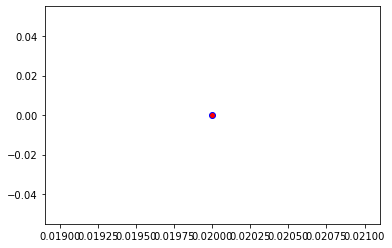

Crafting adversarial images took: 7.420354843139648 seconds 

Images classified as:
000000126216 386 = African elephant
000000126226 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


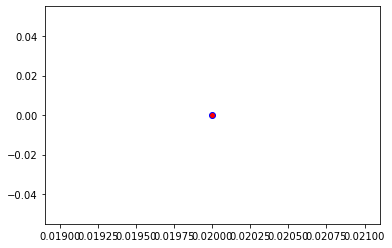

Crafting adversarial images took: 8.324311256408691 seconds 

Images classified as:
000000126592 919 = street sign
000000127092 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.94978
Min values in image-array: 0.0 Max values in image-array: 0.99980307
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


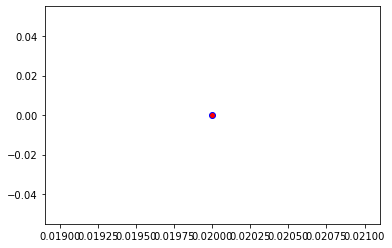

Crafting adversarial images took: 7.827942609786987 seconds 

Images classified as:
000000127135 338 = guinea pig
000000127182 534 = dishwasher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


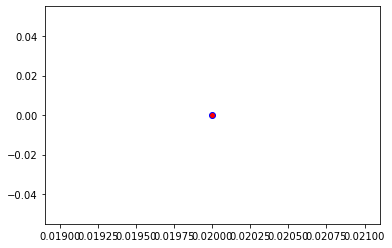

Crafting adversarial images took: 7.346998691558838 seconds 

Images classified as:
000000127263 805 = soccer ball
000000127270 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


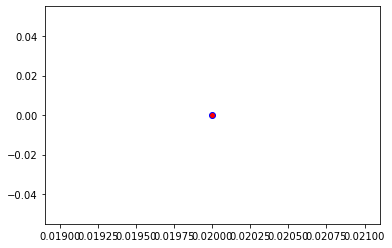

Crafting adversarial images took: 7.572421550750732 seconds 

Images classified as:
000000127394 926 = hot pot
000000127476 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


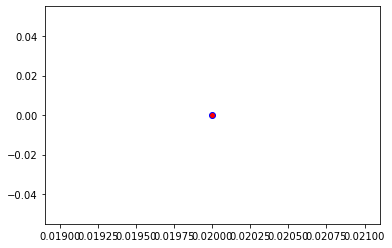

Crafting adversarial images took: 7.491487741470337 seconds 

Images classified as:
000000127494 461 = plate
000000127517 456 = bow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


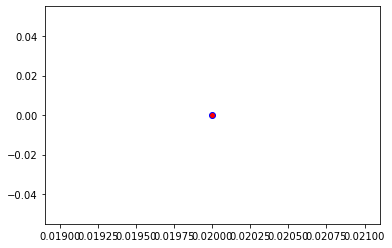

Crafting adversarial images took: 7.459295034408569 seconds 

Images classified as:
000000127530 852 = tennis ball
000000127624 820 = steam locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


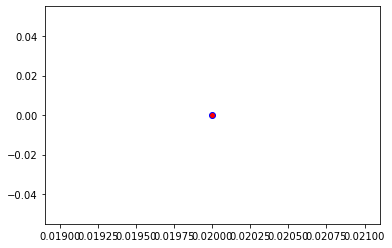

Crafting adversarial images took: 7.470593214035034 seconds 

Images classified as:
000000127660 620 = laptop
000000127955 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 253.48495
Min values in image-array: 0.0 Max values in image-array: 0.99405867
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


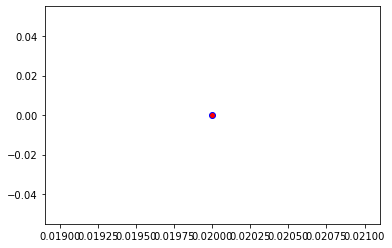

Crafting adversarial images took: 7.361875534057617 seconds 

Images classified as:
000000127987 673 = mouse
000000128051 757 = recreational vehicle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


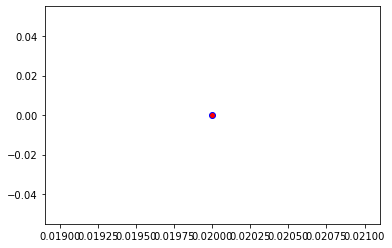

Crafting adversarial images took: 7.420752048492432 seconds 

Images classified as:
000000128112 140 = alp
000000128148 831 = studio couch
Min values in image-array: 0.1545628 Max values in image-array: 255.0
Min values in image-array: 0.00060612865 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


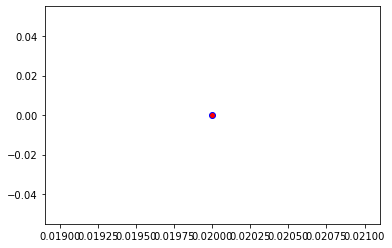

Crafting adversarial images took: 7.411816835403442 seconds 

Images classified as:
000000128372 829 = streetcar
000000128476 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


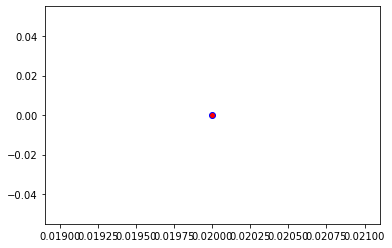

Crafting adversarial images took: 7.431619644165039 seconds 

Images classified as:
000000128598 950 = orange
000000128654 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


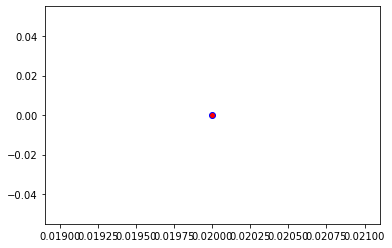

Crafting adversarial images took: 7.41071343421936 seconds 

Images classified as:
000000128658 928 = ice cream
000000128675 472 = canoe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


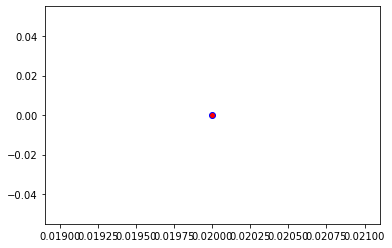

Crafting adversarial images took: 7.410943269729614 seconds 

Images classified as:
000000128699 880 = unicycle
000000128748 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


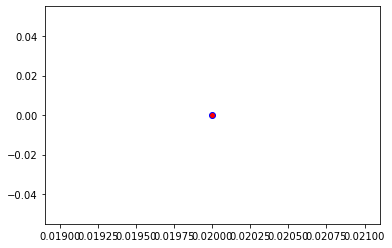

Crafting adversarial images took: 7.532011032104492 seconds 

Images classified as:
000000129054 340 = zebra
000000129062 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


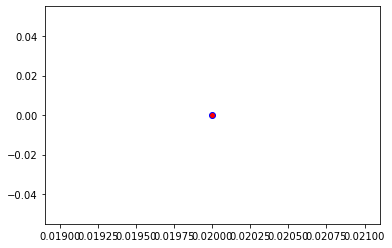

Crafting adversarial images took: 7.291108846664429 seconds 

Images classified as:
000000129113 618 = ladle
000000129135 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


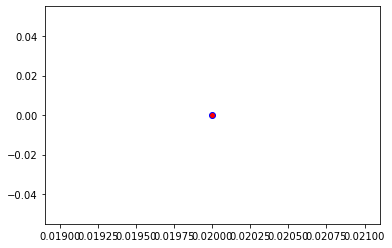

Crafting adversarial images took: 7.599219560623169 seconds 

Images classified as:
000000129322 861 = toilet seat
000000129416 347 = bison
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


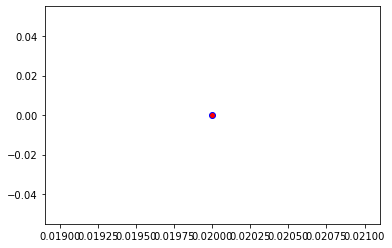

Crafting adversarial images took: 7.586578845977783 seconds 

Images classified as:
000000129492 697 = pajama
000000129756 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


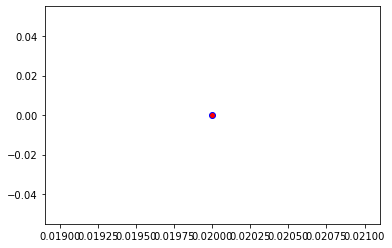

Crafting adversarial images took: 7.2509355545043945 seconds 

Images classified as:
000000129812 248 = ski
000000129945 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


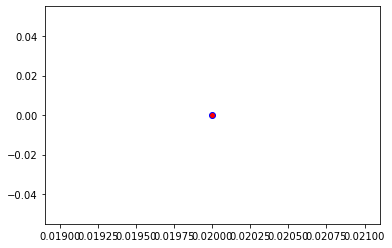

Crafting adversarial images took: 7.705846071243286 seconds 

Images classified as:
000000130386 919 = street sign
000000130465 873 = triumphal arch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


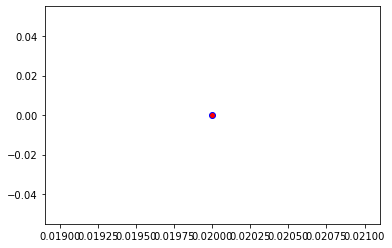

Crafting adversarial images took: 7.499343395233154 seconds 

Images classified as:
000000130566 547 = electric locomotive
000000130579 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


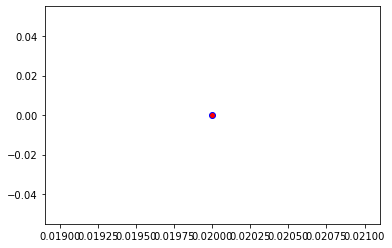

Crafting adversarial images took: 7.470564365386963 seconds 

Images classified as:
000000130586 701 = parachute
000000130599 225 = malinois
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


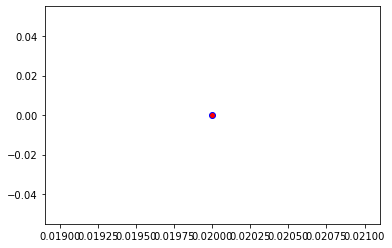

Crafting adversarial images took: 7.338916063308716 seconds 

Images classified as:
000000130613 930 = French loaf
000000130699 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


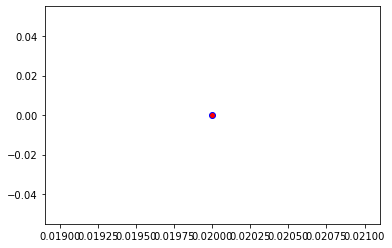

Crafting adversarial images took: 7.481809616088867 seconds 

Images classified as:
000000130826 765 = rocking chair
000000131131 664 = monitor
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


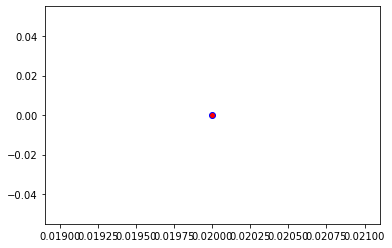

Crafting adversarial images took: 7.22607421875 seconds 

Images classified as:
000000131138 526 = desk
000000131273 250 = Siberian husky
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


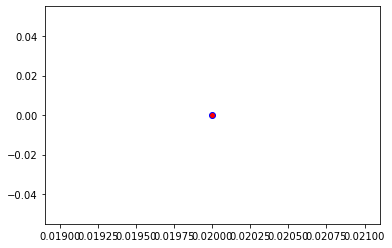

Crafting adversarial images took: 7.633813858032227 seconds 

Images classified as:
000000131379 964 = potpie
000000131386 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 254.75893
Min values in image-array: 0.0 Max values in image-array: 0.9990546
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


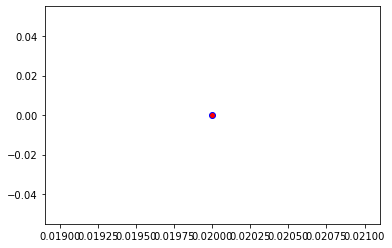

Crafting adversarial images took: 7.442220687866211 seconds 

Images classified as:
000000131431 442 = bell cote
000000131444 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


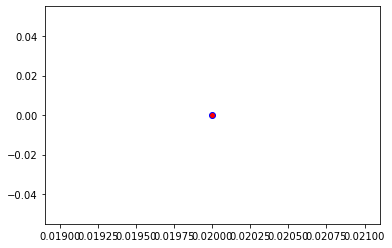

Crafting adversarial images took: 7.385568618774414 seconds 

Images classified as:
000000131556 248 = ski
000000131938 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


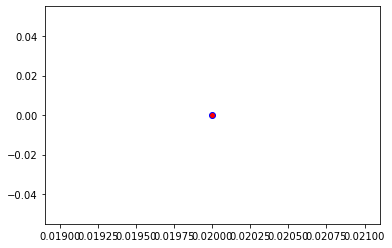

Crafting adversarial images took: 7.275719881057739 seconds 

Images classified as:
000000132116 937 = broccoli
000000132329 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


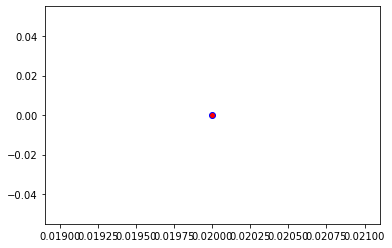

Crafting adversarial images took: 7.480845928192139 seconds 

Images classified as:
000000132375 883 = vase
000000132408 730 = plow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


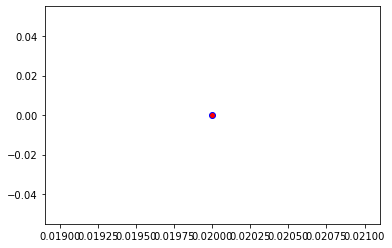

Crafting adversarial images took: 7.307914972305298 seconds 

Images classified as:
000000132544 752 = racket
000000132587 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


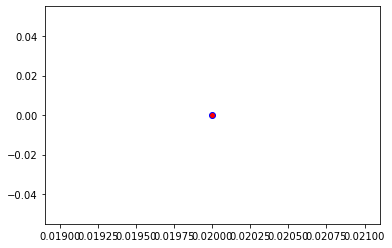

Crafting adversarial images took: 7.52123498916626 seconds 

Images classified as:
000000132622 294 = brown bear
000000132703 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


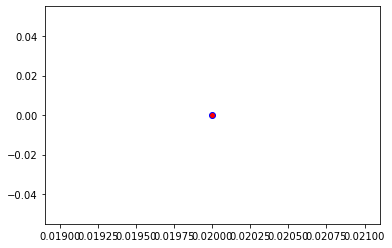

Crafting adversarial images took: 7.7234206199646 seconds 

Images classified as:
000000132796 385 = Indian elephant
000000132931 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


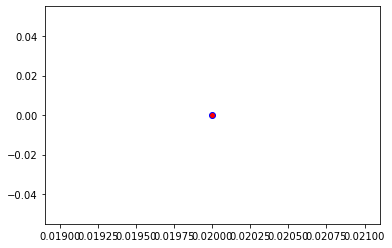

Crafting adversarial images took: 7.403170108795166 seconds 

Images classified as:
000000133000 829 = streetcar
000000133087 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


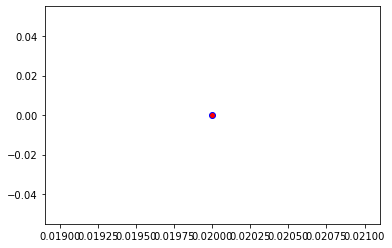

Crafting adversarial images took: 7.578423738479614 seconds 

Images classified as:
000000133233 536 = dock
000000133244 752 = racket
Min values in image-array: 0.0 Max values in image-array: 254.81796
Min values in image-array: 0.0 Max values in image-array: 0.9992861
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


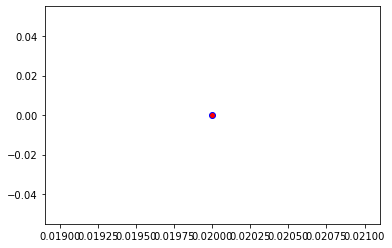

Crafting adversarial images took: 7.755128622055054 seconds 

Images classified as:
000000133343 837 = sunglasses
000000133418 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


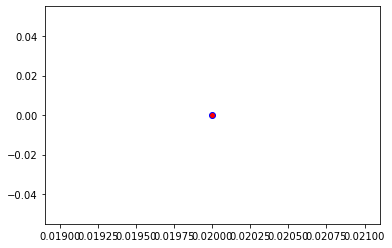

Crafting adversarial images took: 7.381717681884766 seconds 

Images classified as:
000000133567 547 = electric locomotive
000000133631 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


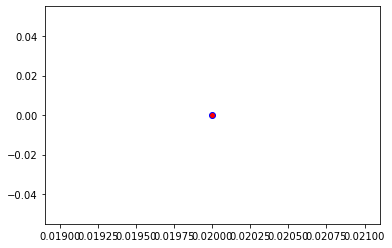

Crafting adversarial images took: 7.721151351928711 seconds 

Images classified as:
000000133645 975 = lakeside
000000133778 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


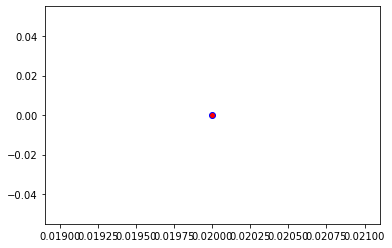

Crafting adversarial images took: 7.388084650039673 seconds 

Images classified as:
000000133819 829 = streetcar
000000133969 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


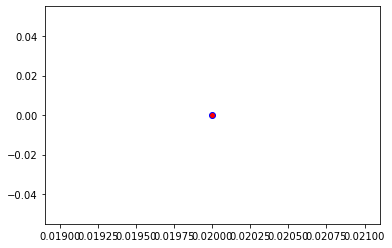

Crafting adversarial images took: 7.489074230194092 seconds 

Images classified as:
000000134034 386 = African elephant
000000134096 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


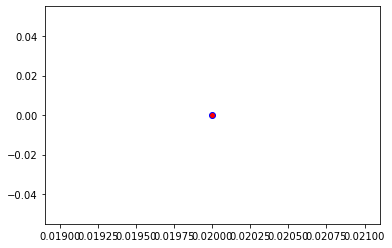

Crafting adversarial images took: 7.55191969871521 seconds 

Images classified as:
000000134112 157 = papillon
000000134322 724 = pirate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


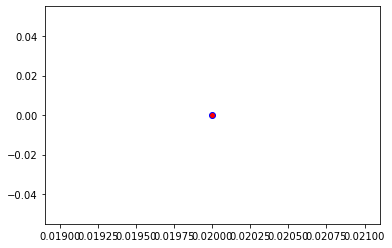

Crafting adversarial images took: 7.472134113311768 seconds 

Images classified as:
000000134689 275 = hyena
000000134722 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


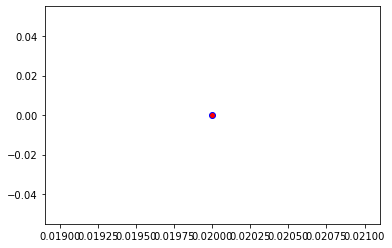

Crafting adversarial images took: 7.190513849258423 seconds 

Images classified as:
000000134856 977 = sandbar
000000134882 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


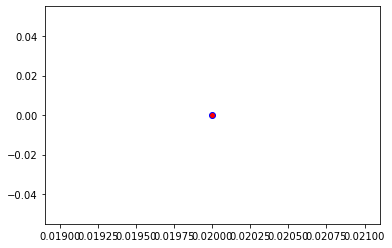

Crafting adversarial images took: 7.490630865097046 seconds 

Images classified as:
000000134886 895 = warplane
000000135410 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


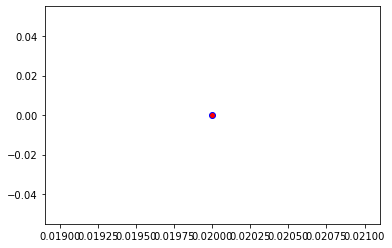

Crafting adversarial images took: 7.37254524230957 seconds 

Images classified as:
000000135561 648 = medicine chest
000000135604 805 = soccer ball
Min values in image-array: 1.6226323 Max values in image-array: 255.0
Min values in image-array: 0.006363264 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


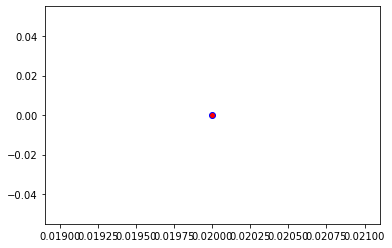

Crafting adversarial images took: 7.385377407073975 seconds 

Images classified as:
000000135670 799 = sliding door
000000135673 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


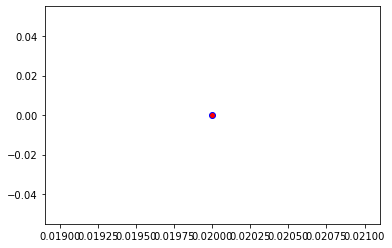

Crafting adversarial images took: 7.461656093597412 seconds 

Images classified as:
000000135872 526 = desk
000000135890 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


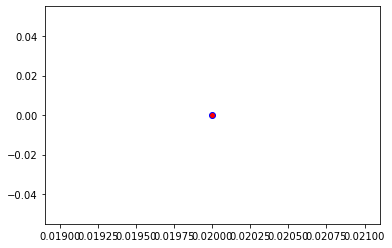

Crafting adversarial images took: 7.733424186706543 seconds 

Images classified as:
000000135902 547 = electric locomotive
000000136033 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


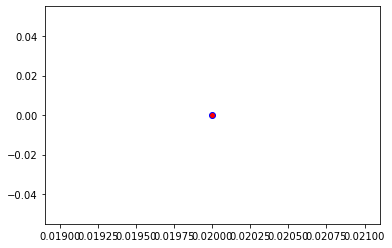

Crafting adversarial images took: 7.329002380371094 seconds 

Images classified as:
000000136334 248 = ski
000000136355 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


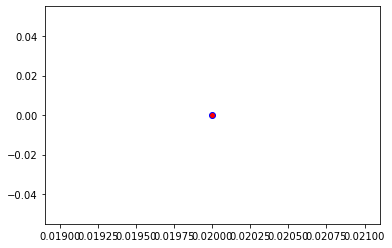

Crafting adversarial images took: 7.585558652877808 seconds 

Images classified as:
000000136466 827 = stove
000000136600 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


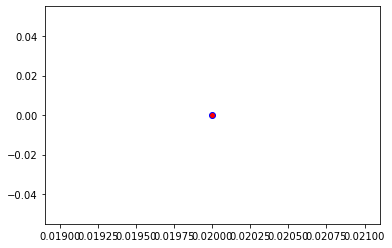

Crafting adversarial images took: 7.498383045196533 seconds 

Images classified as:
000000136633 467 = butcher shop
000000136715 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


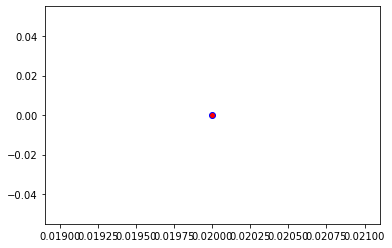

Crafting adversarial images took: 7.541117429733276 seconds 

Images classified as:
000000136772 949 = strawberry
000000136915 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


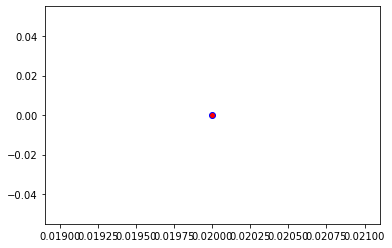

Crafting adversarial images took: 7.450090646743774 seconds 

Images classified as:
000000137106 435 = bathtub
000000137246 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


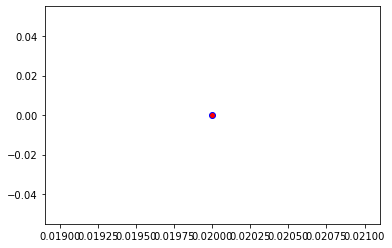

Crafting adversarial images took: 7.496685981750488 seconds 

Images classified as:
000000137294 807 = solar dish
000000137576 54 = hog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


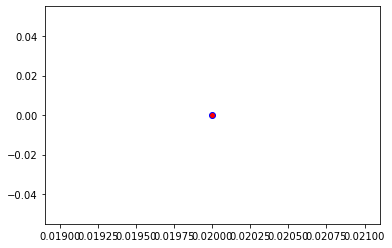

Crafting adversarial images took: 7.1811301708221436 seconds 

Images classified as:
000000137727 705 = passenger car
000000137950 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


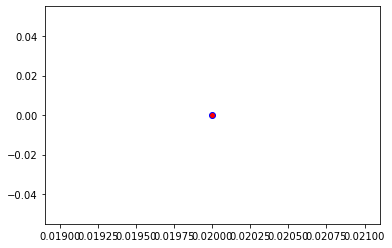

Crafting adversarial images took: 7.450937032699585 seconds 

Images classified as:
000000138115 951 = lemon
000000138241 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


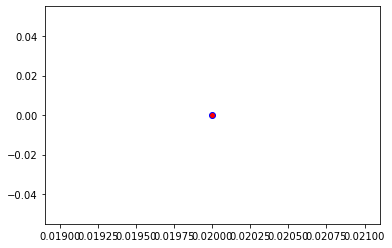

Crafting adversarial images took: 7.644873857498169 seconds 

Images classified as:
000000138492 232 = Border collie
000000138550 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


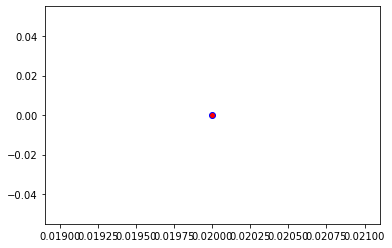

Crafting adversarial images took: 7.379582166671753 seconds 

Images classified as:
000000138639 880 = unicycle
000000138819 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


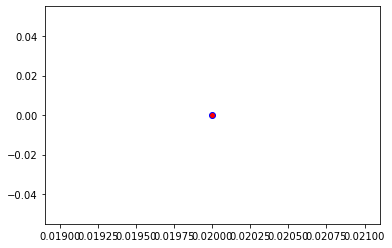

Crafting adversarial images took: 7.368060827255249 seconds 

Images classified as:
000000138856 961 = dough
000000138954 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


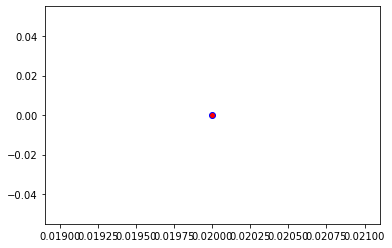

Crafting adversarial images took: 7.471451282501221 seconds 

Images classified as:
000000138979 874 = trolleybus
000000139077 548 = entertainment center
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


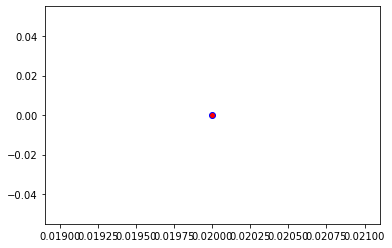

Crafting adversarial images took: 7.191222429275513 seconds 

Images classified as:
000000139099 582 = grocery store
000000139260 470 = candle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


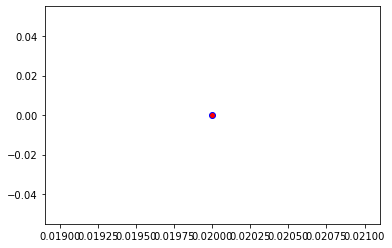

Crafting adversarial images took: 7.7609617710113525 seconds 

Images classified as:
000000139684 831 = studio couch
000000139871 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


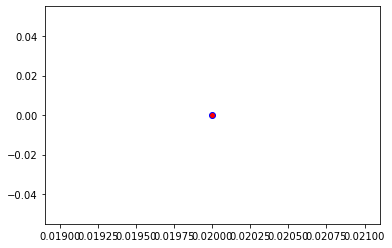

Crafting adversarial images took: 7.6128013134002686 seconds 

Images classified as:
000000139872 232 = Border collie
000000139883 755 = radio telescope
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


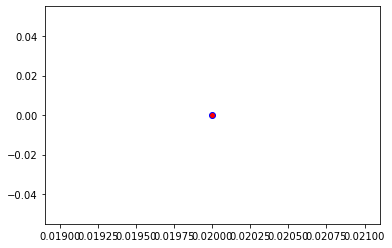

Crafting adversarial images took: 7.5077009201049805 seconds 

Images classified as:
000000140076 532 = dining table
000000140203 407 = ambulance
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


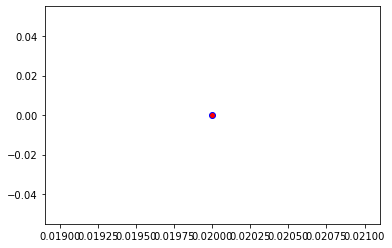

Crafting adversarial images took: 7.2412428855896 seconds 

Images classified as:
000000140270 603 = horse cart
000000140286 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


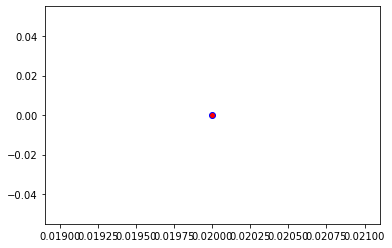

Crafting adversarial images took: 7.677774906158447 seconds 

Images classified as:
000000140420 223 = schipperke
000000140439 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


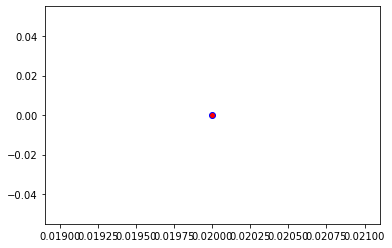

Crafting adversarial images took: 7.535478591918945 seconds 

Images classified as:
000000140556 491 = chain saw
000000140583 979 = valley
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


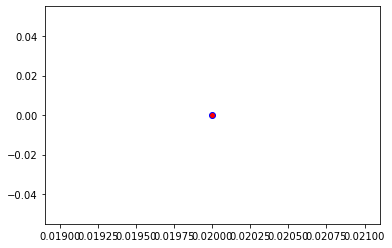

Crafting adversarial images took: 7.321030139923096 seconds 

Images classified as:
000000140640 808 = sombrero
000000140658 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


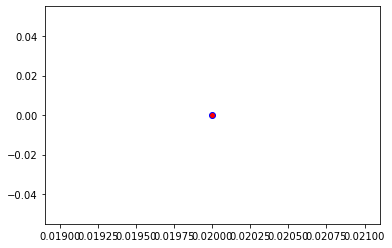

Crafting adversarial images took: 7.510725021362305 seconds 

Images classified as:
000000140840 645 = maypole
000000140929 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


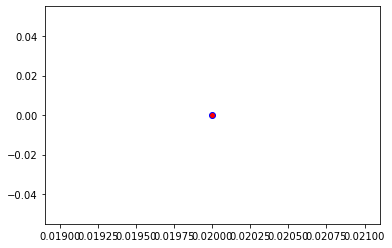

Crafting adversarial images took: 7.350977420806885 seconds 

Images classified as:
000000140987 963 = pizza
000000141328 909 = wok
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


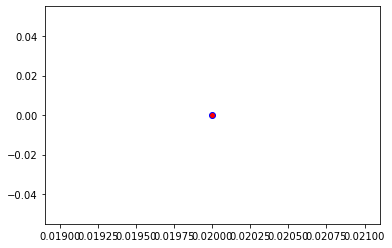

Crafting adversarial images took: 7.242286205291748 seconds 

Images classified as:
000000141597 757 = recreational vehicle
000000141671 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


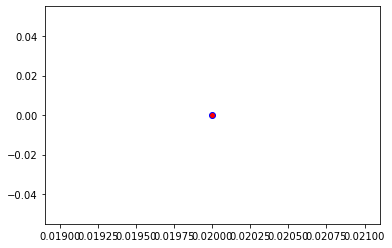

Crafting adversarial images took: 7.511540651321411 seconds 

Images classified as:
000000141821 963 = pizza
000000142092 964 = potpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


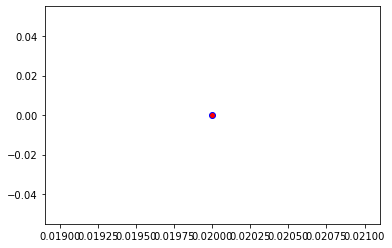

Crafting adversarial images took: 7.748797655105591 seconds 

Images classified as:
000000142238 805 = soccer ball
000000142324 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


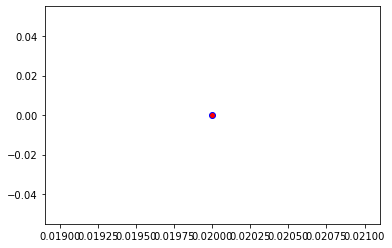

Crafting adversarial images took: 7.3585121631622314 seconds 

Images classified as:
000000142472 498 = cinema
000000142585 134 = crane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


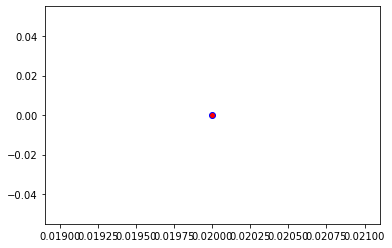

Crafting adversarial images took: 7.486323595046997 seconds 

Images classified as:
000000142620 653 = milk can
000000142790 802 = snowmobile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


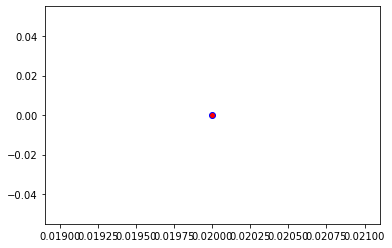

Crafting adversarial images took: 7.365513324737549 seconds 

Images classified as:
000000142971 472 = canoe
000000143068 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


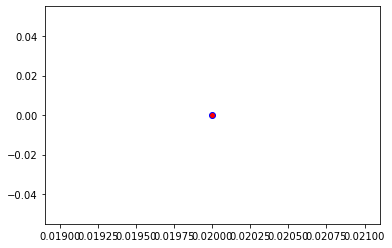

Crafting adversarial images took: 7.507471084594727 seconds 

Images classified as:
000000143556 518 = crash helmet
000000143572 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


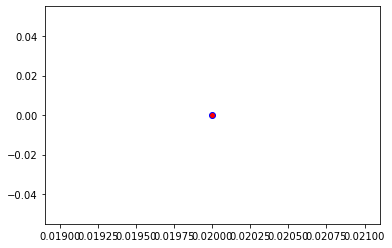

Crafting adversarial images took: 7.564400911331177 seconds 

Images classified as:
000000143931 675 = moving van
000000143961 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


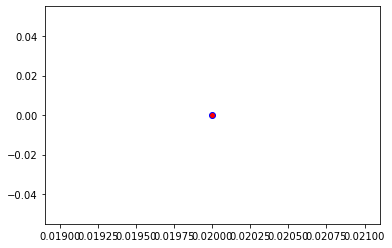

Crafting adversarial images took: 7.85340690612793 seconds 

Images classified as:
000000143998 699 = panpipe
000000144003 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


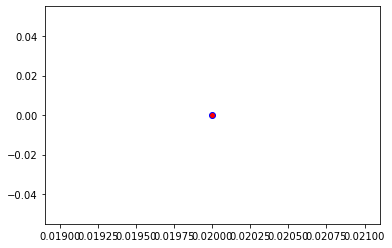

Crafting adversarial images took: 7.2990405559539795 seconds 

Images classified as:
000000144114 404 = airliner
000000144300 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


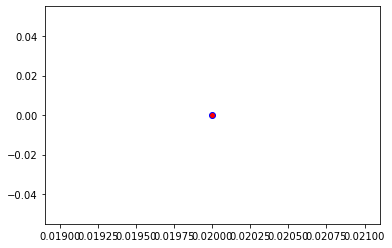

Crafting adversarial images took: 7.70165228843689 seconds 

Images classified as:
000000144333 612 = jinrikisha
000000144706 94 = hummingbird
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


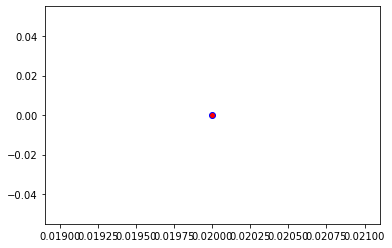

Crafting adversarial images took: 7.498318672180176 seconds 

Images classified as:
000000144784 463 = bucket
000000144798 435 = tub
Min values in image-array: 0.0 Max values in image-array: 252.46901
Min values in image-array: 0.0 Max values in image-array: 0.9900746
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


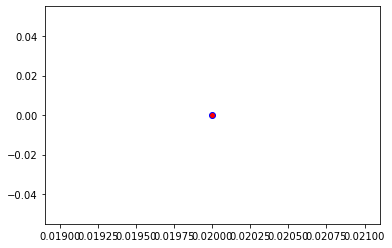

Crafting adversarial images took: 7.721406698226929 seconds 

Images classified as:
000000144932 977 = sandbar
000000144984 515 = cowboy hat
Min values in image-array: 0.0 Max values in image-array: 250.48305
Min values in image-array: 0.0 Max values in image-array: 0.98228645
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


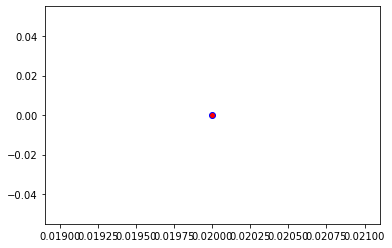

Crafting adversarial images took: 7.770990371704102 seconds 

Images classified as:
000000145020 865 = toyshop
000000145591 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


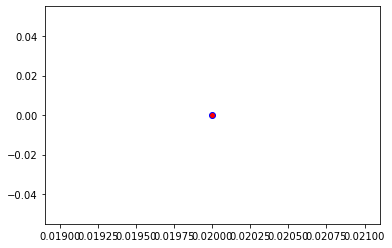

Crafting adversarial images took: 7.394042491912842 seconds 

Images classified as:
000000145597 544 = Dutch oven
000000145620 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


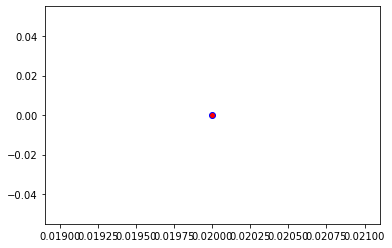

Crafting adversarial images took: 7.21604323387146 seconds 

Images classified as:
000000145665 543 = dumbbell
000000145781 179 = Staffordshire bullterrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


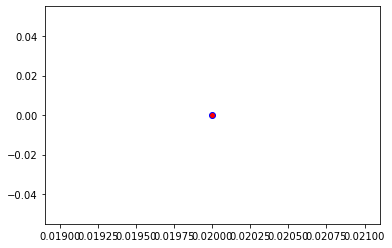

Crafting adversarial images took: 7.561108827590942 seconds 

Images classified as:
000000146155 641 = maraca
000000146358 601 = hoopskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


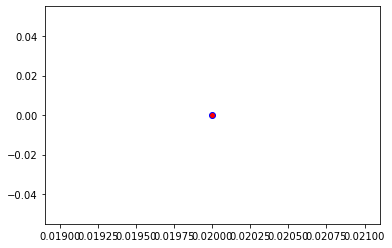

Crafting adversarial images took: 7.446337461471558 seconds 

Images classified as:
000000146363 977 = sandbar
000000146457 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


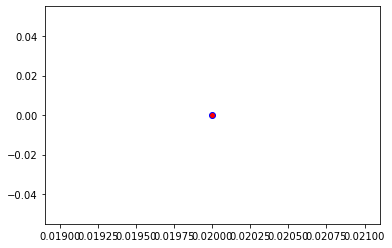

Crafting adversarial images took: 7.533488988876343 seconds 

Images classified as:
000000146489 966 = red wine
000000146498 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


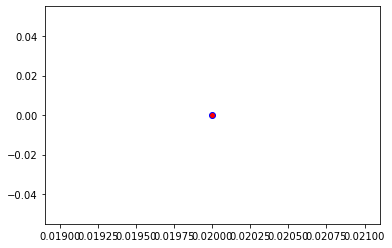

Crafting adversarial images took: 7.431445121765137 seconds 

Images classified as:
000000146667 665 = moped
000000146825 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


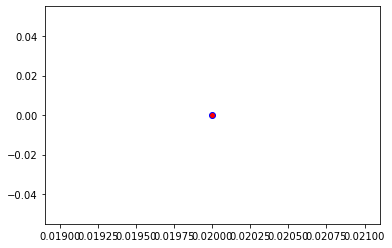

Crafting adversarial images took: 7.360385894775391 seconds 

Images classified as:
000000146831 880 = unicycle
000000147205 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


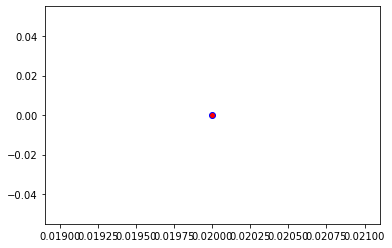

Crafting adversarial images took: 7.3315510749816895 seconds 

Images classified as:
000000147223 874 = trolleybus
000000147338 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


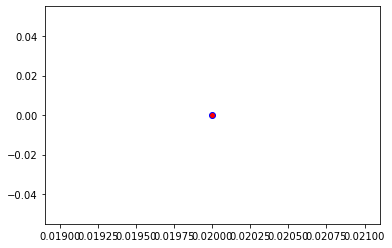

Crafting adversarial images took: 7.537797689437866 seconds 

Images classified as:
000000147415 526 = desk
000000147498 358 = pole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


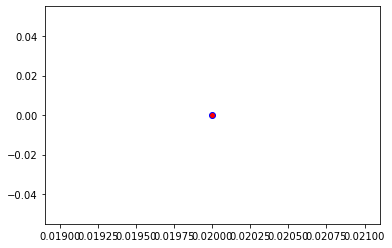

Crafting adversarial images took: 7.9165403842926025 seconds 

Images classified as:
000000147518 861 = toilet seat
000000147725 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


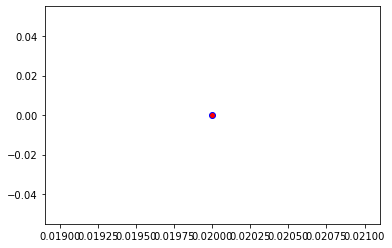

Crafting adversarial images took: 7.391796588897705 seconds 

Images classified as:
000000147729 447 = binoculars
000000147740 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


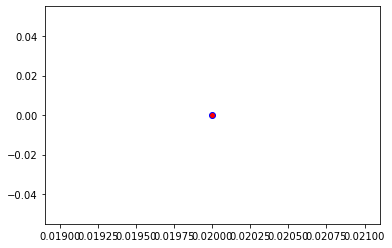

Crafting adversarial images took: 7.47160792350769 seconds 

Images classified as:
000000147745 864 = tow truck
000000148508 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


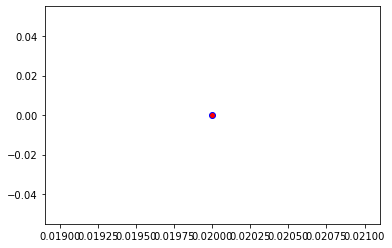

Crafting adversarial images took: 7.524925470352173 seconds 

Images classified as:
000000148620 526 = desk
000000148662 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


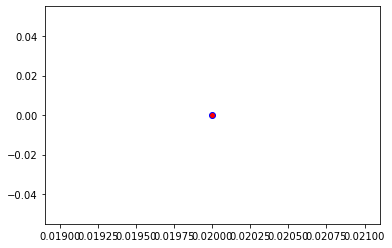

Crafting adversarial images took: 7.4807751178741455 seconds 

Images classified as:
000000148707 951 = lemon
000000148719 717 = pickup
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


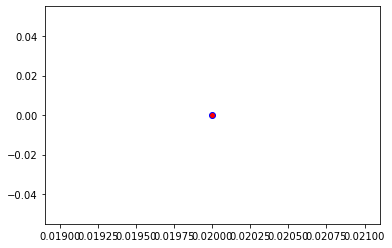

Crafting adversarial images took: 7.670465707778931 seconds 

Images classified as:
000000148730 713 = pier
000000148739 693 = paddle
Min values in image-array: 2.3597243 Max values in image-array: 255.0
Min values in image-array: 0.00925382 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


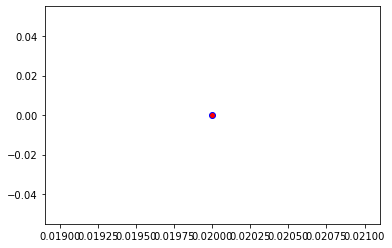

Crafting adversarial images took: 7.41096830368042 seconds 

Images classified as:
000000148783 340 = zebra
000000148957 932 = pretzel
Min values in image-array: 0.0 Max values in image-array: 254.89288
Min values in image-array: 0.0 Max values in image-array: 0.9995799
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


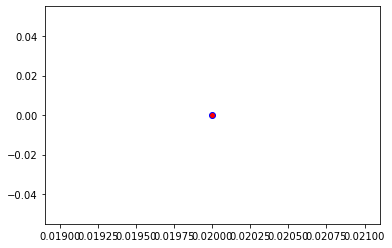

Crafting adversarial images took: 7.338160037994385 seconds 

Images classified as:
000000148999 657 = missile
000000149222 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


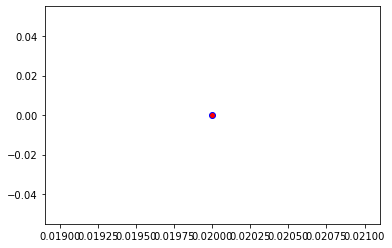

Crafting adversarial images took: 7.471193790435791 seconds 

Images classified as:
000000149375 416 = balance beam
000000149406 665 = moped
Min values in image-array: 0.0 Max values in image-array: 254.85805
Min values in image-array: 0.0 Max values in image-array: 0.99944335
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


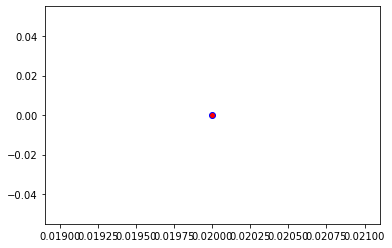

Crafting adversarial images took: 7.424152374267578 seconds 

Images classified as:
000000149568 267 = standard poodle
000000149622 16 = bulbul
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


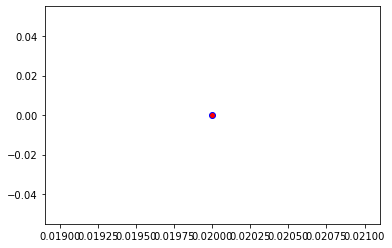

Crafting adversarial images took: 7.517136335372925 seconds 

Images classified as:
000000149770 372 = baboon
000000150224 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


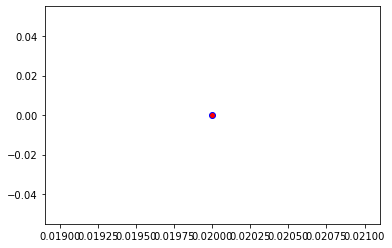

Crafting adversarial images took: 7.39712381362915 seconds 

Images classified as:
000000150265 898 = water bottle
000000150417 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


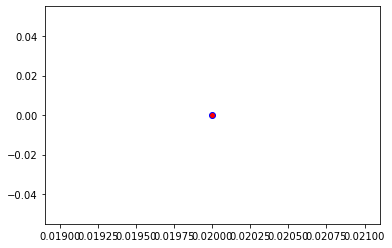

Crafting adversarial images took: 7.463080883026123 seconds 

Images classified as:
000000150638 739 = potter's wheel
000000150649 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


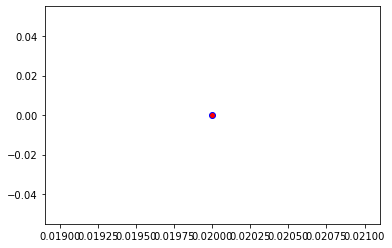

Crafting adversarial images took: 7.381823539733887 seconds 

Images classified as:
000000150726 293 = cheetah
000000150930 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


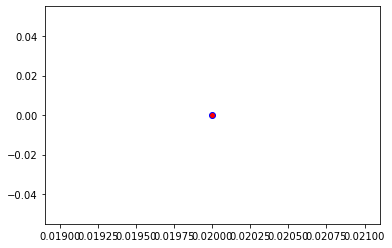

Crafting adversarial images took: 7.458266496658325 seconds 

Images classified as:
000000151000 743 = prison
000000151051 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


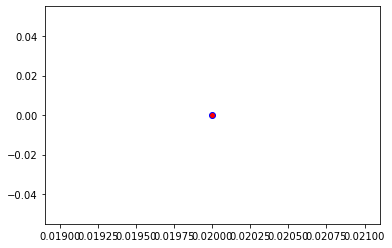

Crafting adversarial images took: 7.673240900039673 seconds 

Images classified as:
000000151480 981 = ballplayer
000000151516 4 = hammerhead
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


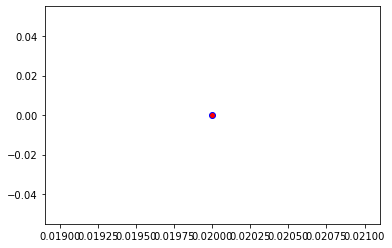

Crafting adversarial images took: 7.706084251403809 seconds 

Images classified as:
000000151629 768 = rugby ball
000000151657 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


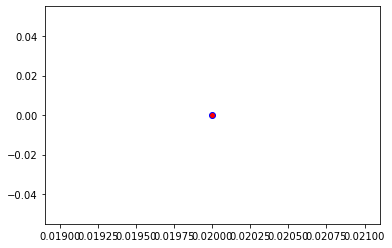

Crafting adversarial images took: 7.505694389343262 seconds 

Images classified as:
000000151662 355 = llama
000000151820 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


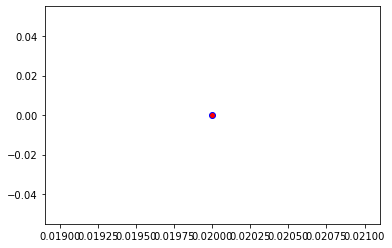

Crafting adversarial images took: 7.57599139213562 seconds 

Images classified as:
000000151857 705 = passenger car
000000151938 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


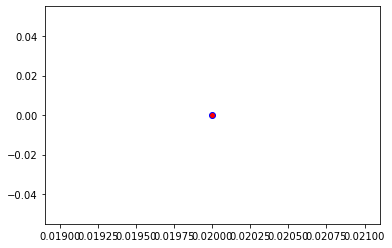

Crafting adversarial images took: 7.491145610809326 seconds 

Images classified as:
000000151962 475 = car mirror
000000152120 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


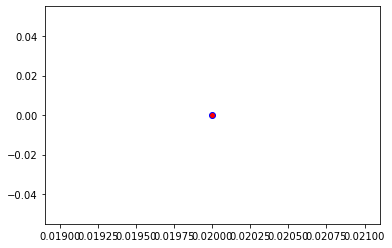

Crafting adversarial images took: 7.556090354919434 seconds 

Images classified as:
000000152214 639 = suit
000000152465 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


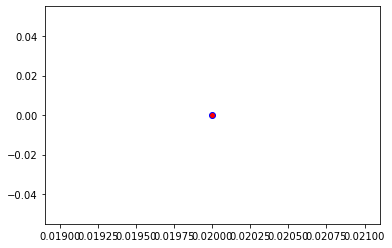

Crafting adversarial images took: 7.600665092468262 seconds 

Images classified as:
000000152686 752 = racket
000000152740 343 = warthog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


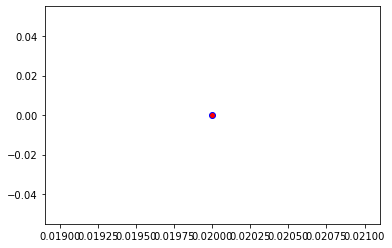

Crafting adversarial images took: 7.370116949081421 seconds 

Images classified as:
000000152771 646 = maze
000000152870 176 = gazelle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


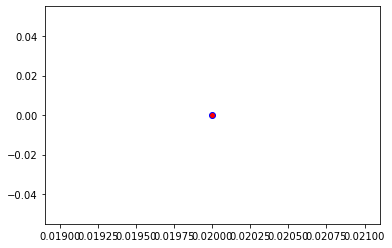

Crafting adversarial images took: 7.892158031463623 seconds 

Images classified as:
000000153011 874 = trolleybus
000000153217 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


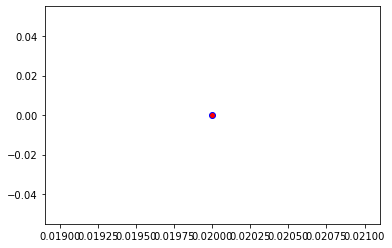

Crafting adversarial images took: 7.68409538269043 seconds 

Images classified as:
000000153229 768 = rugby ball
000000153299 251 = dalmatian
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


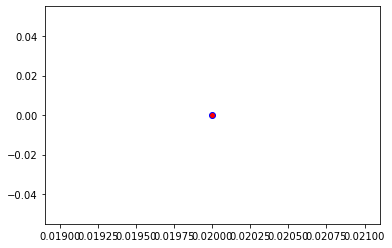

Crafting adversarial images took: 7.407412528991699 seconds 

Images classified as:
000000153343 850 = teddy
000000153510 935 = mashed potato
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


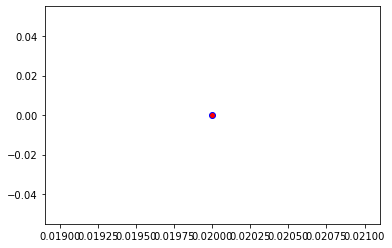

Crafting adversarial images took: 7.5614073276519775 seconds 

Images classified as:
000000153527 634 = lumbermill
000000153529 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


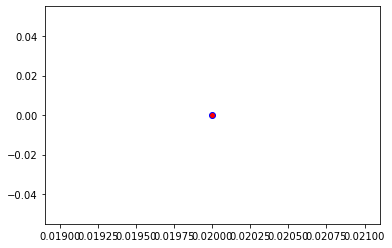

Crafting adversarial images took: 7.407595634460449 seconds 

Images classified as:
000000153568 919 = street sign
000000153632 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


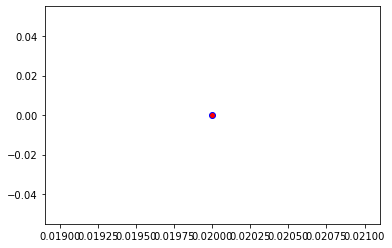

Crafting adversarial images took: 7.4089367389678955 seconds 

Images classified as:
000000153669 981 = ballplayer
000000153782 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


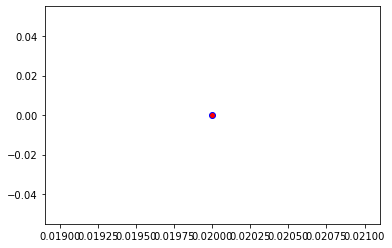

Crafting adversarial images took: 7.391523599624634 seconds 

Images classified as:
000000153797 429 = baseball
000000154000 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


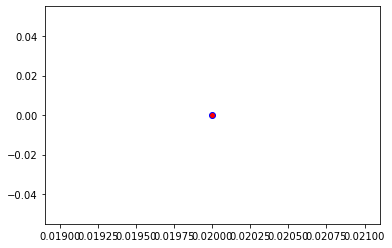

Crafting adversarial images took: 7.671334266662598 seconds 

Images classified as:
000000154004 978 = seashore
000000154087 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


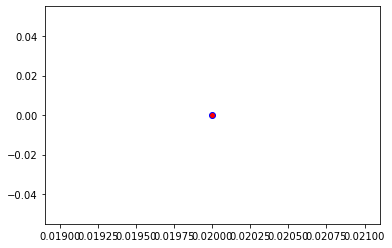

Crafting adversarial images took: 7.610979318618774 seconds 

Images classified as:
000000154213 541 = drum
000000154339 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


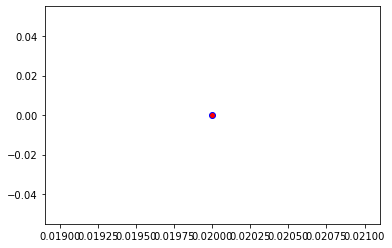

Crafting adversarial images took: 7.326229095458984 seconds 

Images classified as:
000000154358 564 = four-poster
000000154425 728 = plastic bag
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


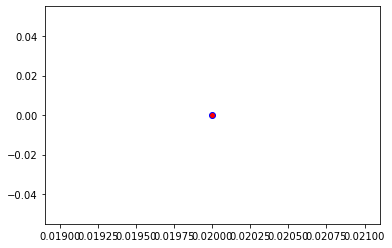

Crafting adversarial images took: 7.635756731033325 seconds 

Images classified as:
000000154431 548 = entertainment center
000000154644 837 = sunglasses
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


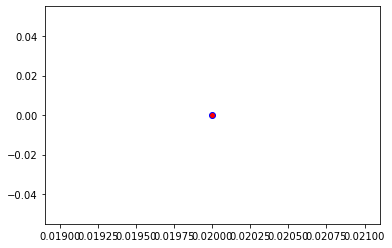

Crafting adversarial images took: 7.592529296875 seconds 

Images classified as:
000000154705 526 = desk
000000154718 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 254.96025
Min values in image-array: 0.0 Max values in image-array: 0.99984413
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


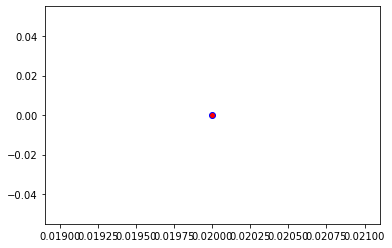

Crafting adversarial images took: 7.424267530441284 seconds 

Images classified as:
000000154947 270 = white wolf
000000155051 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


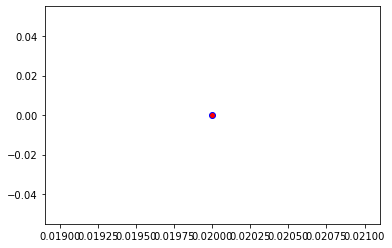

Crafting adversarial images took: 7.495108604431152 seconds 

Images classified as:
000000155145 472 = canoe
000000155154 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


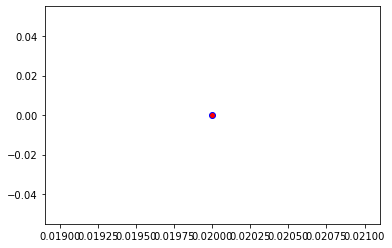

Crafting adversarial images took: 7.42738676071167 seconds 

Images classified as:
000000155179 961 = dough
000000155291 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


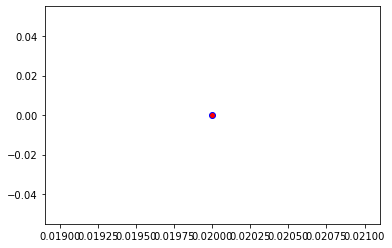

Crafting adversarial images took: 7.415906190872192 seconds 

Images classified as:
000000155341 874 = trolleybus
000000155443 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


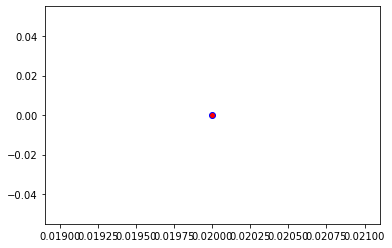

Crafting adversarial images took: 7.41201639175415 seconds 

Images classified as:
000000155451 818 = spotlight
000000155571 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


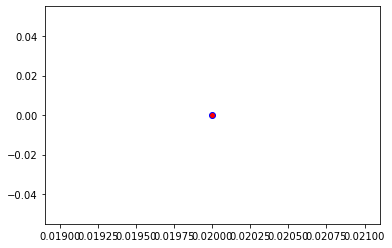

Crafting adversarial images took: 7.405895948410034 seconds 

Images classified as:
000000156071 602 = horizontal bar
000000156076 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


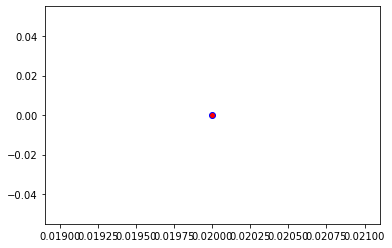

Crafting adversarial images took: 7.35517954826355 seconds 

Images classified as:
000000156278 495 = china cabinet
000000156292 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


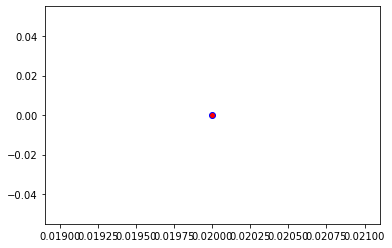

Crafting adversarial images took: 7.551171541213989 seconds 

Images classified as:
000000156372 830 = stretcher
000000156643 470 = candle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


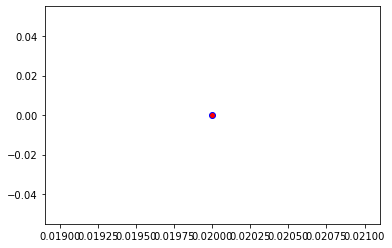

Crafting adversarial images took: 7.465789794921875 seconds 

Images classified as:
000000156924 747 = punching bag
000000157046 918 = crossword puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


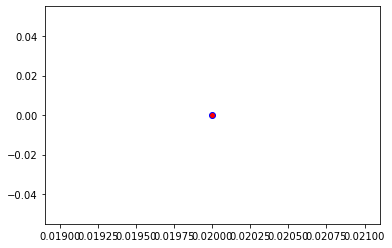

Crafting adversarial images took: 7.391669988632202 seconds 

Images classified as:
000000157098 9 = ostrich
000000157124 435 = tub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


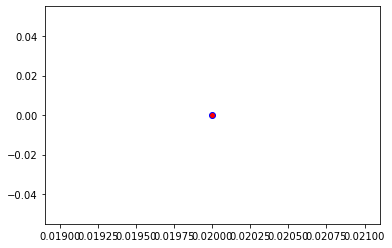

Crafting adversarial images took: 7.431931972503662 seconds 

Images classified as:
000000157138 928 = ice cream
000000157213 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 254.88264
Min values in image-array: 0.0 Max values in image-array: 0.9995398
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


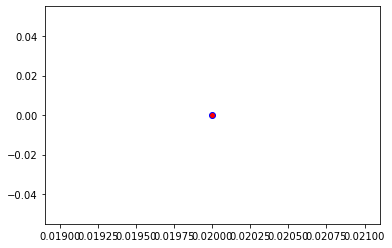

Crafting adversarial images took: 7.824941873550415 seconds 

Images classified as:
000000157365 880 = unicycle
000000157390 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


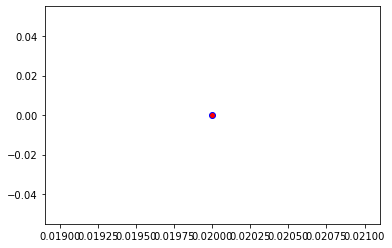

Crafting adversarial images took: 7.5514891147613525 seconds 

Images classified as:
000000157418 928 = ice cream
000000157601 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


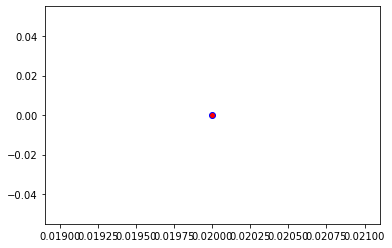

Crafting adversarial images took: 7.496983528137207 seconds 

Images classified as:
000000157756 442 = bell cote
000000157767 982 = groom
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


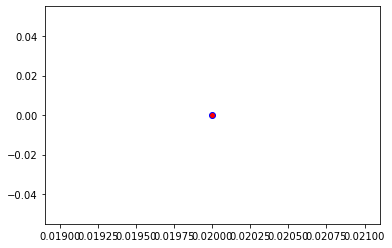

Crafting adversarial images took: 7.612914323806763 seconds 

Images classified as:
000000157807 861 = toilet seat
000000157847 980 = volcano
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


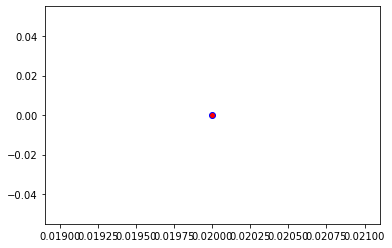

Crafting adversarial images took: 7.501060962677002 seconds 

Images classified as:
000000157928 537 = dogsled
000000158227 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


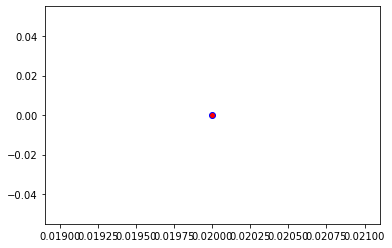

Crafting adversarial images took: 7.532374143600464 seconds 

Images classified as:
000000158548 202 = soft-coated wheaten terrier
000000158660 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


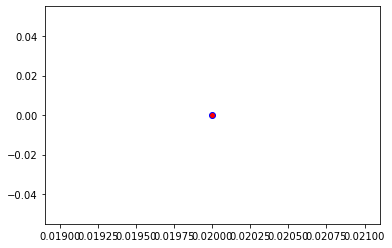

Crafting adversarial images took: 7.590061664581299 seconds 

Images classified as:
000000158744 799 = sliding door
000000158945 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


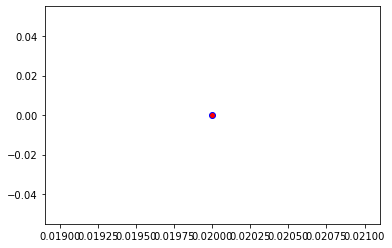

Crafting adversarial images took: 7.22477388381958 seconds 

Images classified as:
000000158956 840 = swab
000000159112 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


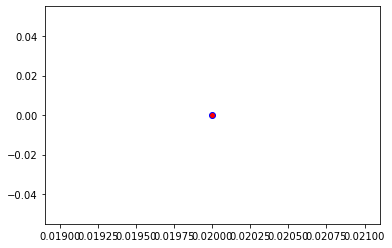

Crafting adversarial images took: 7.525542736053467 seconds 

Images classified as:
000000159282 883 = vase
000000159311 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


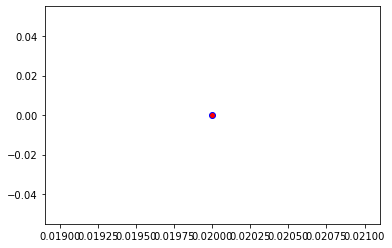

Crafting adversarial images took: 7.553139925003052 seconds 

Images classified as:
000000159399 701 = parachute
000000159458 492 = chest
Min values in image-array: 0.5 Max values in image-array: 255.0
Min values in image-array: 0.0019607844 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


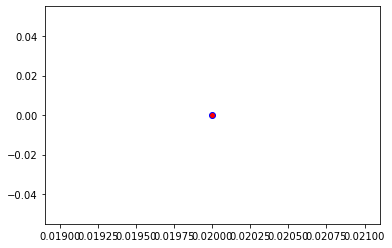

Crafting adversarial images took: 7.396158218383789 seconds 

Images classified as:
000000159684 466 = bullet train
000000159791 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


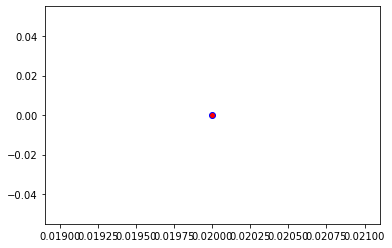

Crafting adversarial images took: 7.461287498474121 seconds 

Images classified as:
000000159977 293 = cheetah
000000160012 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


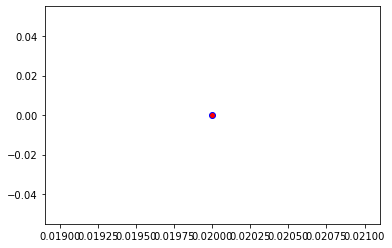

Crafting adversarial images took: 7.537215948104858 seconds 

Images classified as:
000000160556 851 = television
000000160666 696 = paintbrush
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


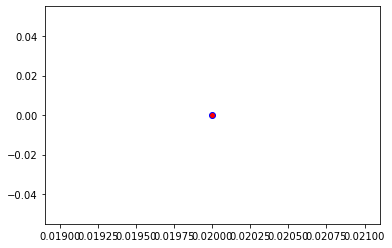

Crafting adversarial images took: 7.361528158187866 seconds 

Images classified as:
000000160728 484 = catamaran
000000160772 404 = liner
Min values in image-array: 0.0 Max values in image-array: 254.62254
Min values in image-array: 0.0 Max values in image-array: 0.9985198
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


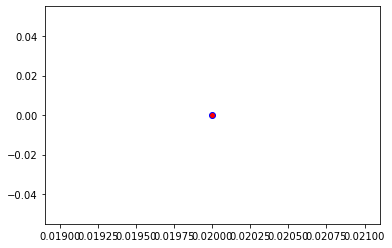

Crafting adversarial images took: 7.436782121658325 seconds 

Images classified as:
000000160864 981 = ballplayer
000000161008 777 = scabbard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


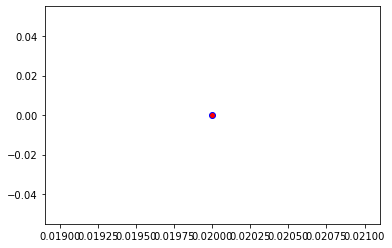

Crafting adversarial images took: 8.020748615264893 seconds 

Images classified as:
000000161032 879 = umbrella
000000161044 974 = geyser
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


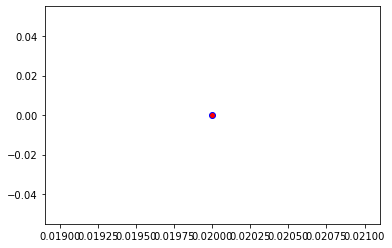

Crafting adversarial images took: 7.526232004165649 seconds 

Images classified as:
000000161128 919 = street sign
000000161397 711 = perfume
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


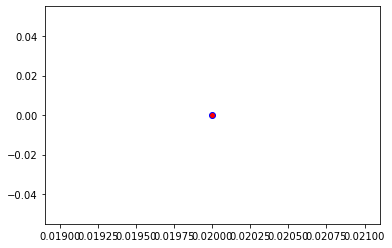

Crafting adversarial images took: 7.566910028457642 seconds 

Images classified as:
000000161609 424 = barbershop
000000161642 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


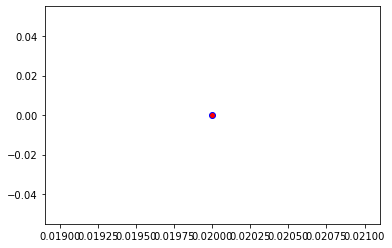

Crafting adversarial images took: 7.550650596618652 seconds 

Images classified as:
000000161781 248 = ski
000000161799 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


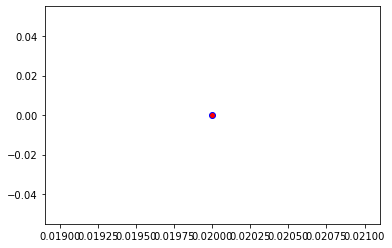

Crafting adversarial images took: 7.530630350112915 seconds 

Images classified as:
000000161820 954 = banana
000000161861 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


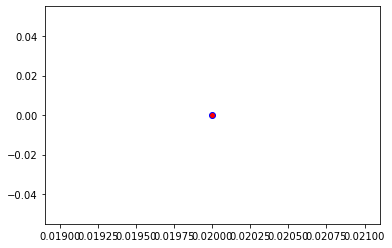

Crafting adversarial images took: 7.441230297088623 seconds 

Images classified as:
000000161875 568 = fur coat
000000161879 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


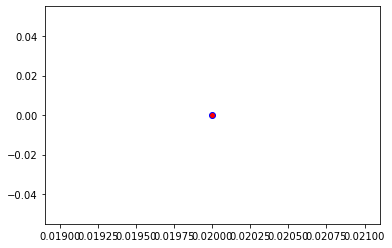

Crafting adversarial images took: 7.526728391647339 seconds 

Images classified as:
000000161925 480 = cash machine
000000161978 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


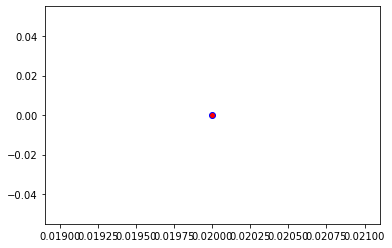

Crafting adversarial images took: 7.481749534606934 seconds 

Images classified as:
000000162035 519 = crate
000000162092 909 = wok
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


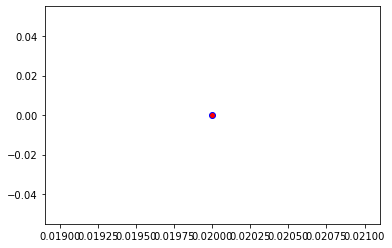

Crafting adversarial images took: 7.492100715637207 seconds 

Images classified as:
000000162130 912 = worm fence
000000162366 707 = pay-phone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


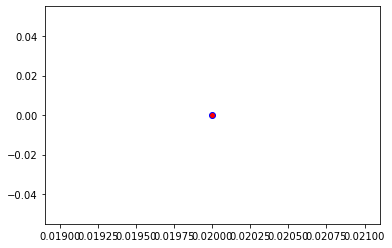

Crafting adversarial images took: 7.486229419708252 seconds 

Images classified as:
000000162415 429 = baseball
000000162543 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


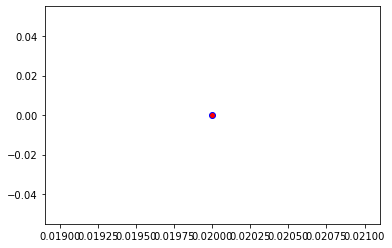

Crafting adversarial images took: 7.449574708938599 seconds 

Images classified as:
000000162581 752 = racket
000000162732 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


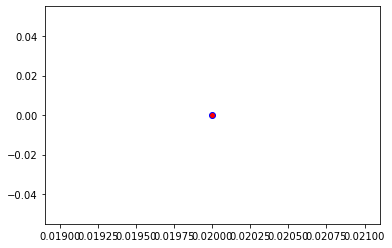

Crafting adversarial images took: 7.386082172393799 seconds 

Images classified as:
000000162858 920 = traffic light
000000163057 417 = balloon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


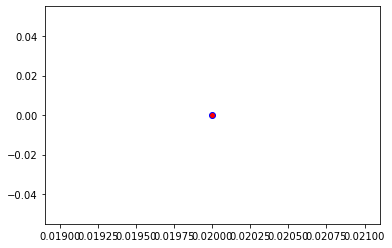

Crafting adversarial images took: 7.698119878768921 seconds 

Images classified as:
000000163117 417 = balloon
000000163118 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


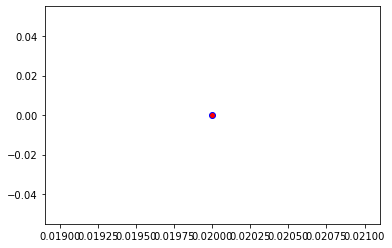

Crafting adversarial images took: 7.391456127166748 seconds 

Images classified as:
000000163155 285 = Egyptian cat
000000163257 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


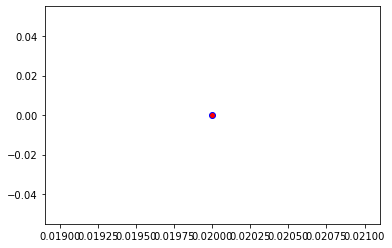

Crafting adversarial images took: 7.386200428009033 seconds 

Images classified as:
000000163258 861 = toilet seat
000000163290 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


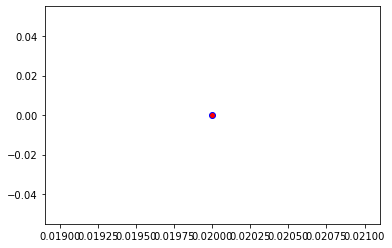

Crafting adversarial images took: 7.686138391494751 seconds 

Images classified as:
000000163314 860 = tobacco shop
000000163562 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


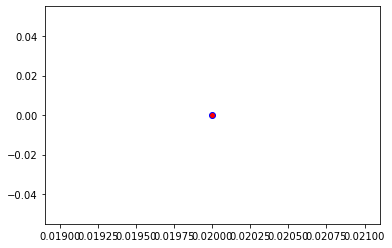

Crafting adversarial images took: 7.551622629165649 seconds 

Images classified as:
000000163611 963 = pizza
000000163640 480 = cash machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


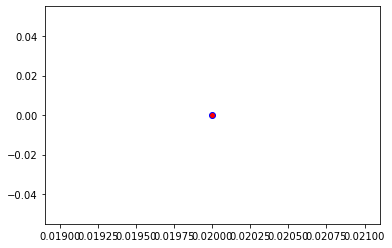

Crafting adversarial images took: 7.3940300941467285 seconds 

Images classified as:
000000163682 906 = Windsor tie
000000163746 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


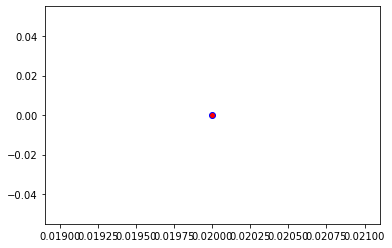

Crafting adversarial images took: 7.727705001831055 seconds 

Images classified as:
000000163951 512 = corkscrew
000000164115 822 = steel drum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


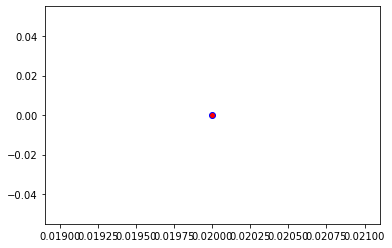

Crafting adversarial images took: 7.484207391738892 seconds 

Images classified as:
000000164363 892 = wall clock
000000164602 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 254.62122
Min values in image-array: 0.0 Max values in image-array: 0.9985146
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


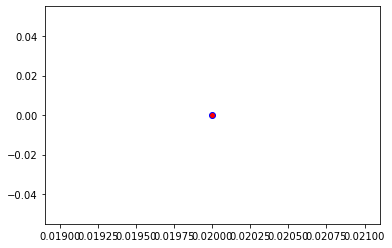

Crafting adversarial images took: 7.526156425476074 seconds 

Images classified as:
000000164637 896 = washbasin
000000164883 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


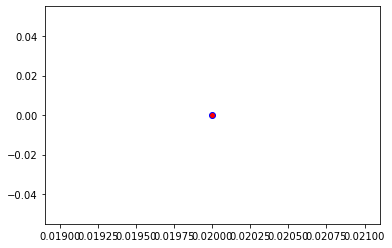

Crafting adversarial images took: 7.530838966369629 seconds 

Images classified as:
000000164885 248 = ski
000000164969 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


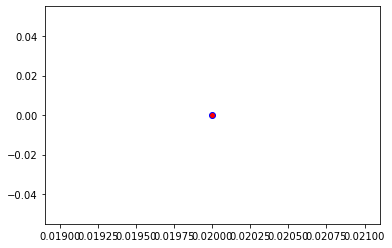

Crafting adversarial images took: 7.547933340072632 seconds 

Images classified as:
000000165039 874 = trolleybus
000000165257 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


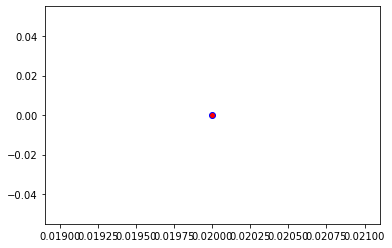

Crafting adversarial images took: 7.341388702392578 seconds 

Images classified as:
000000165336 293 = cheetah
000000165351 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


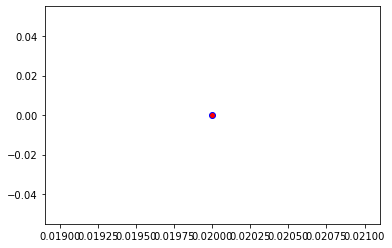

Crafting adversarial images took: 7.61104154586792 seconds 

Images classified as:
000000165500 347 = bison
000000165518 983 = scuba diver
Min values in image-array: 11.849215 Max values in image-array: 255.0
Min values in image-array: 0.04646751 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


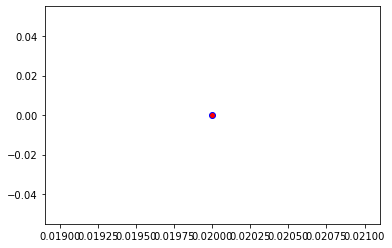

Crafting adversarial images took: 7.439053773880005 seconds 

Images classified as:
000000165681 428 = barrow
000000165713 835 = sundial
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


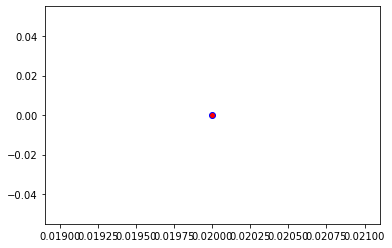

Crafting adversarial images took: 7.430060386657715 seconds 

Images classified as:
000000165831 937 = broccoli
000000166165 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


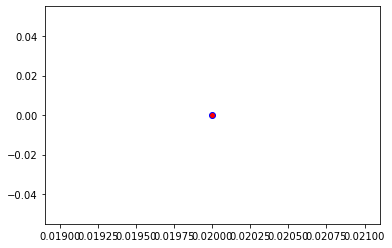

Crafting adversarial images took: 7.436284780502319 seconds 

Images classified as:
000000166166 548 = entertainment center
000000166259 330 = wood rabbit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


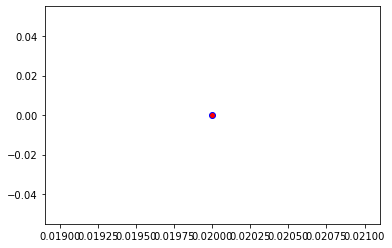

Crafting adversarial images took: 7.603844165802002 seconds 

Images classified as:
000000166277 287 = lynx
000000166287 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


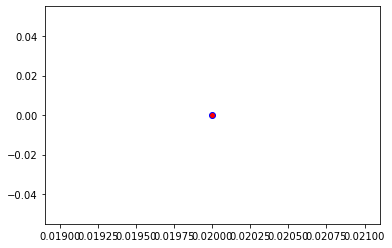

Crafting adversarial images took: 7.336284637451172 seconds 

Images classified as:
000000166391 920 = traffic light
000000166426 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


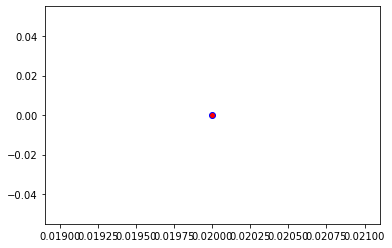

Crafting adversarial images took: 7.735362529754639 seconds 

Images classified as:
000000166478 620 = laptop
000000166509 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


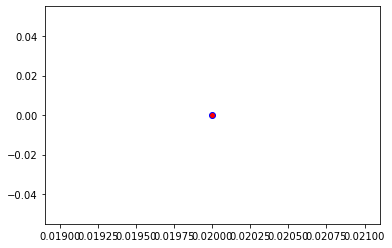

Crafting adversarial images took: 7.541206359863281 seconds 

Images classified as:
000000166521 548 = entertainment center
000000166563 51 = triceratops
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


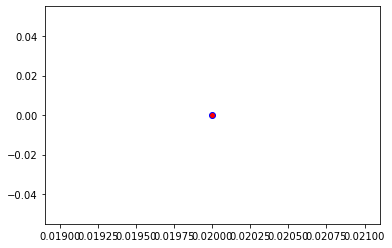

Crafting adversarial images took: 7.415987253189087 seconds 

Images classified as:
000000166642 385 = Indian elephant
000000166664 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


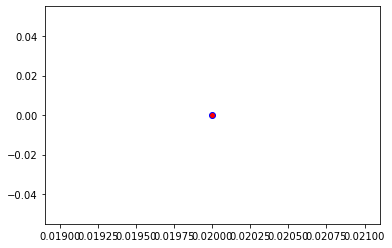

Crafting adversarial images took: 7.7253899574279785 seconds 

Images classified as:
000000166747 829 = streetcar
000000166768 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


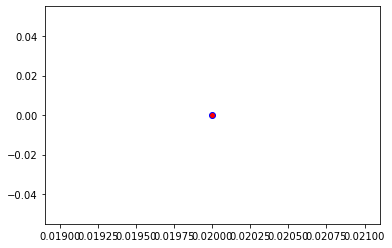

Crafting adversarial images took: 7.53229022026062 seconds 

Images classified as:
000000166918 762 = restaurant
000000167067 457 = bow tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


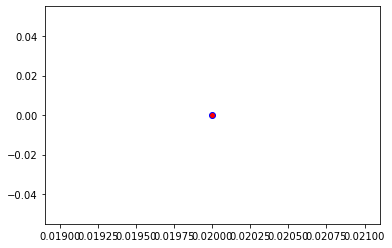

Crafting adversarial images took: 7.5768723487854 seconds 

Images classified as:
000000167122 818 = spotlight
000000167128 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


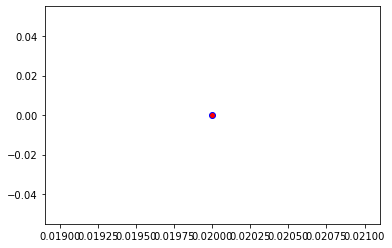

Crafting adversarial images took: 7.576073884963989 seconds 

Images classified as:
000000167159 431 = bassinet
000000167240 883 = vase
Min values in image-array: 0.0 Max values in image-array: 254.71541
Min values in image-array: 0.0 Max values in image-array: 0.99888396
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


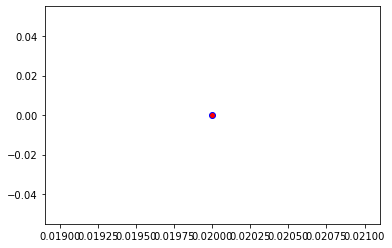

Crafting adversarial images took: 7.4461281299591064 seconds 

Images classified as:
000000167353 892 = wall clock
000000167486 546 = electric guitar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


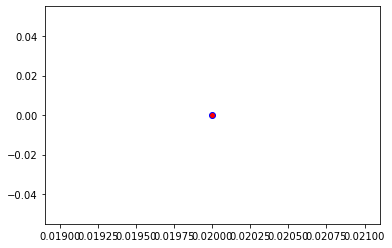

Crafting adversarial images took: 7.501281261444092 seconds 

Images classified as:
000000167540 895 = warplane
000000167572 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


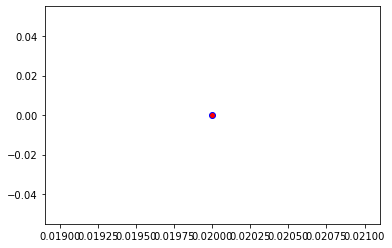

Crafting adversarial images took: 7.616351842880249 seconds 

Images classified as:
000000167898 896 = washbasin
000000167902 96 = toucan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


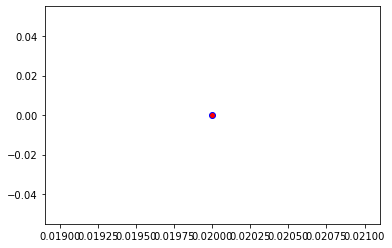

Crafting adversarial images took: 7.504054546356201 seconds 

Images classified as:
000000168330 920 = traffic light
000000168337 480 = cash machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


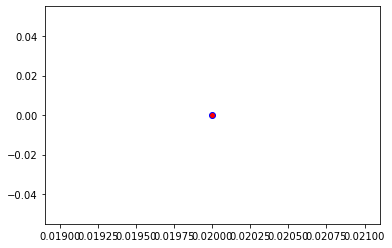

Crafting adversarial images took: 7.48990273475647 seconds 

Images classified as:
000000168458 883 = vase
000000168593 760 = refrigerator
Min values in image-array: 0.049966305 Max values in image-array: 255.0
Min values in image-array: 0.0001959463 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


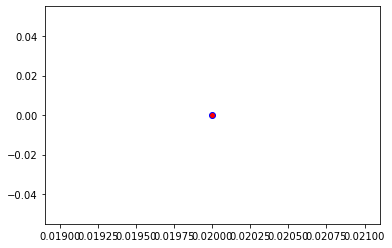

Crafting adversarial images took: 7.370769023895264 seconds 

Images classified as:
000000168619 140 = alp
000000168883 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


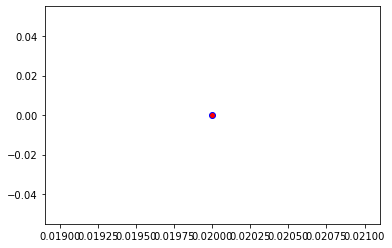

Crafting adversarial images took: 7.533100605010986 seconds 

Images classified as:
000000168974 784 = screwdriver
000000169076 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


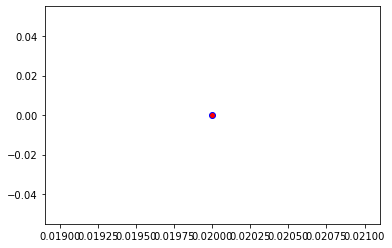

Crafting adversarial images took: 7.5615246295928955 seconds 

Images classified as:
000000169169 919 = street sign
000000169356 730 = plow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


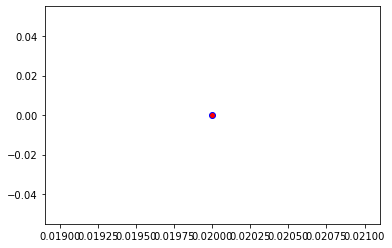

Crafting adversarial images took: 7.521981954574585 seconds 

Images classified as:
000000169996 603 = horse cart
000000170099 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


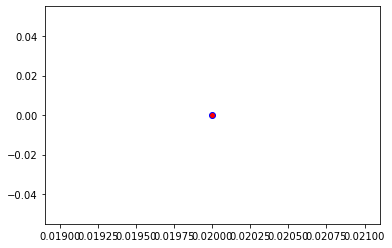

Crafting adversarial images took: 7.738540410995483 seconds 

Images classified as:
000000170116 760 = refrigerator
000000170191 885 = velvet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


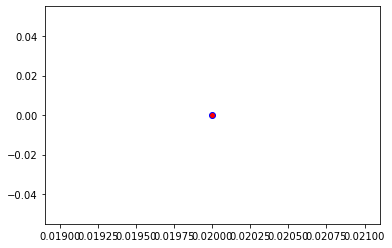

Crafting adversarial images took: 7.546885251998901 seconds 

Images classified as:
000000170278 180 = American Staffordshire terrier
000000170474 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


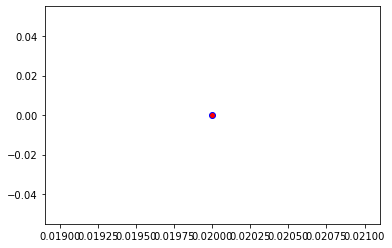

Crafting adversarial images took: 7.58238959312439 seconds 

Images classified as:
000000170545 920 = traffic light
000000170595 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


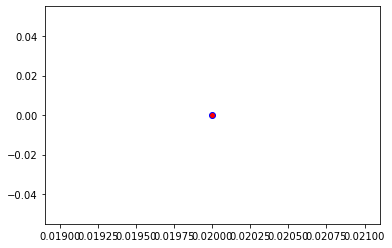

Crafting adversarial images took: 7.759575843811035 seconds 

Images classified as:
000000170613 693 = paddle
000000170670 544 = Dutch oven
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


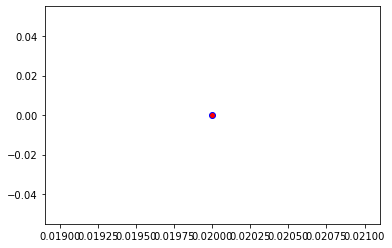

Crafting adversarial images took: 7.4562764167785645 seconds 

Images classified as:
000000170739 385 = Indian elephant
000000170893 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


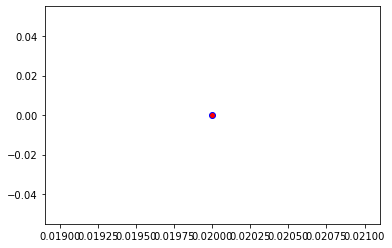

Crafting adversarial images took: 7.575617074966431 seconds 

Images classified as:
000000170955 639 = suit
000000171050 471 = cannon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


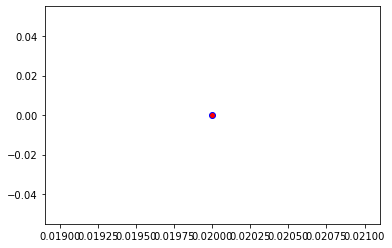

Crafting adversarial images took: 7.410852432250977 seconds 

Images classified as:
000000171190 762 = restaurant
000000171298 757 = recreational vehicle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


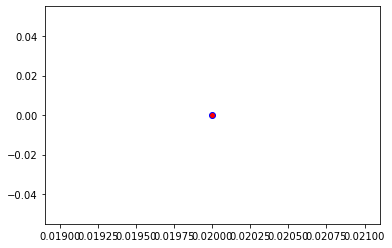

Crafting adversarial images took: 7.551830768585205 seconds 

Images classified as:
000000171382 880 = unicycle
000000171611 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


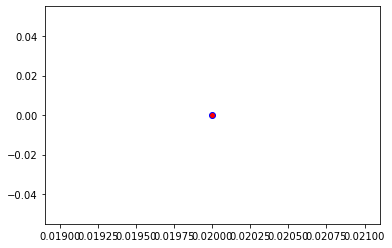

Crafting adversarial images took: 7.5116941928863525 seconds 

Images classified as:
000000171740 831 = studio couch
000000171757 840 = swab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


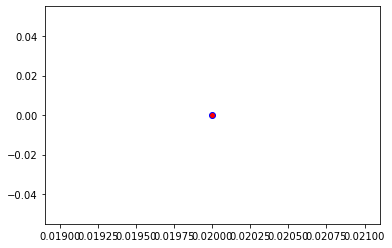

Crafting adversarial images took: 7.538596153259277 seconds 

Images classified as:
000000171788 752 = racket
000000172083 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


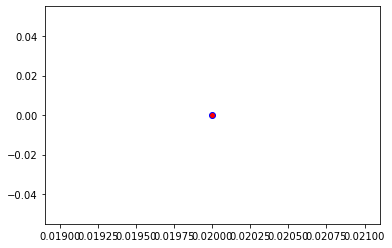

Crafting adversarial images took: 7.346132516860962 seconds 

Images classified as:
000000172330 104 = wallaby
000000172396 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


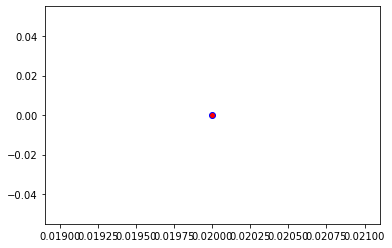

Crafting adversarial images took: 7.476124286651611 seconds 

Images classified as:
000000172547 979 = valley
000000172571 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


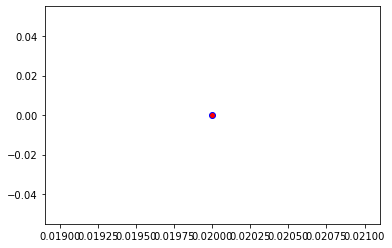

Crafting adversarial images took: 7.416282892227173 seconds 

Images classified as:
000000172595 526 = desk
000000172617 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


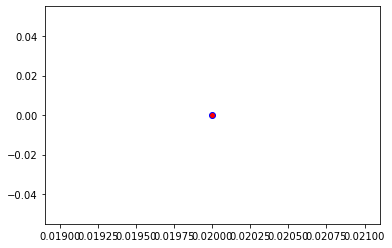

Crafting adversarial images took: 7.456704139709473 seconds 

Images classified as:
000000172648 569 = garbage truck
000000172649 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


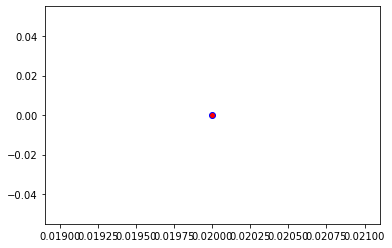

Crafting adversarial images took: 7.54177713394165 seconds 

Images classified as:
000000172856 919 = street sign
000000172877 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


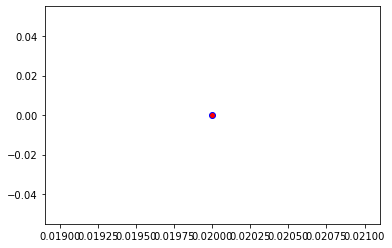

Crafting adversarial images took: 7.8852996826171875 seconds 

Images classified as:
000000172935 895 = warplane
000000172946 541 = drum
Min values in image-array: 0.40615082 Max values in image-array: 255.0
Min values in image-array: 0.0015927483 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


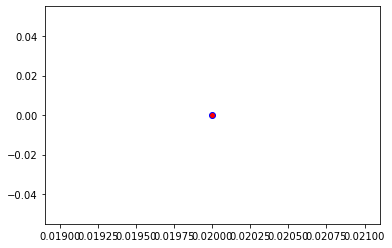

Crafting adversarial images took: 7.456118822097778 seconds 

Images classified as:
000000172977 340 = zebra
000000173004 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


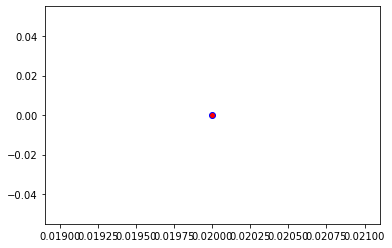

Crafting adversarial images took: 7.6074347496032715 seconds 

Images classified as:
000000173008 652 = military uniform
000000173033 295 = American black bear
Min values in image-array: 0.21430206 Max values in image-array: 255.0
Min values in image-array: 0.00084040023 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


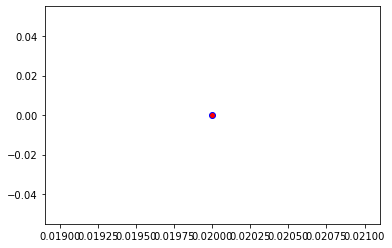

Crafting adversarial images took: 7.525538444519043 seconds 

Images classified as:
000000173044 442 = bell cote
000000173057 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


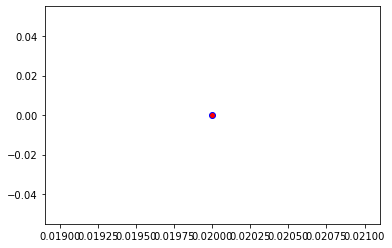

Crafting adversarial images took: 7.67425274848938 seconds 

Images classified as:
000000173091 773 = saltshaker
000000173183 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


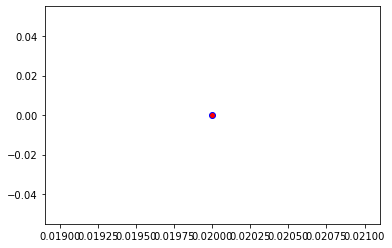

Crafting adversarial images took: 7.402573347091675 seconds 

Images classified as:
000000173302 762 = restaurant
000000173371 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


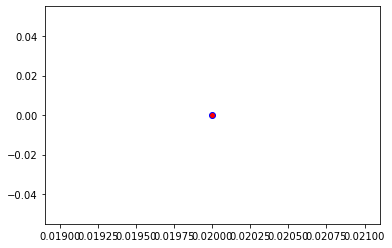

Crafting adversarial images took: 7.5166175365448 seconds 

Images classified as:
000000173383 406 = altar
000000173799 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


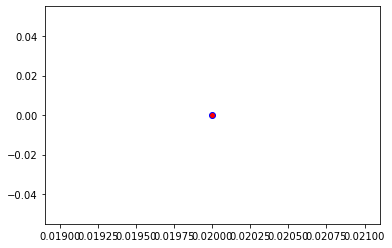

Crafting adversarial images took: 7.31405782699585 seconds 

Images classified as:
000000173830 248 = ski
000000174004 595 = harvester
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


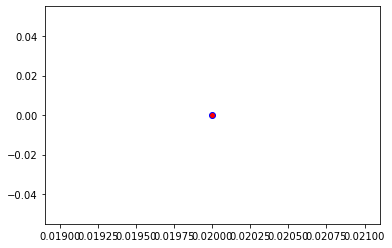

Crafting adversarial images took: 7.5398478507995605 seconds 

Images classified as:
000000174018 850 = teddy
000000174123 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


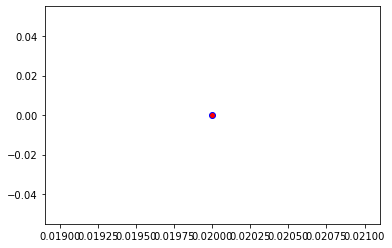

Crafting adversarial images took: 7.445883274078369 seconds 

Images classified as:
000000174231 579 = grand piano
000000174371 822 = steel drum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


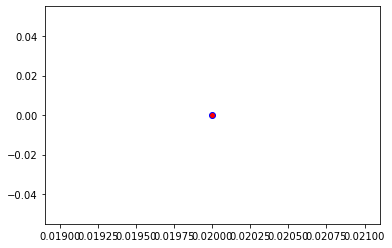

Crafting adversarial images took: 7.561666250228882 seconds 

Images classified as:
000000174482 870 = tricycle
000000175251 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


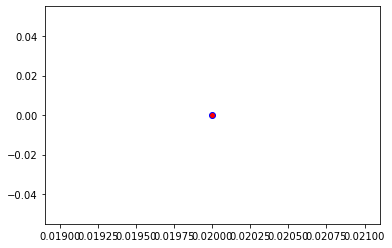

Crafting adversarial images took: 7.336232900619507 seconds 

Images classified as:
000000175364 651 = microwave
000000175387 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


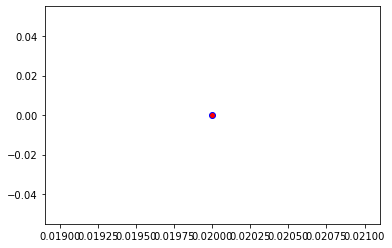

Crafting adversarial images took: 7.715269088745117 seconds 

Images classified as:
000000175438 920 = traffic light
000000175443 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


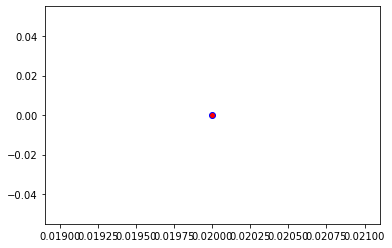

Crafting adversarial images took: 7.441120147705078 seconds 

Images classified as:
000000175535 461 = plate
000000176037 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


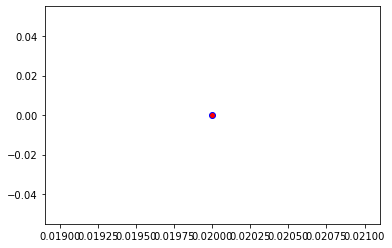

Crafting adversarial images took: 7.702249050140381 seconds 

Images classified as:
000000176232 883 = vase
000000176446 767 = rubber eraser
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


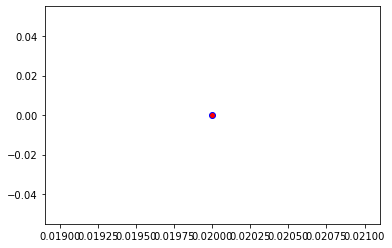

Crafting adversarial images took: 8.023550510406494 seconds 

Images classified as:
000000176606 222 = kuvasz
000000176634 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


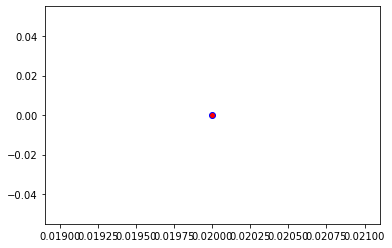

Crafting adversarial images took: 7.546318531036377 seconds 

Images classified as:
000000176701 919 = street sign
000000176778 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


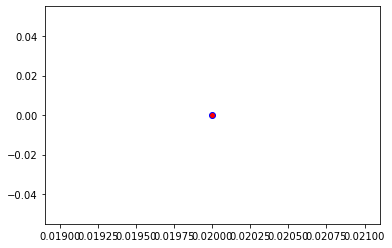

Crafting adversarial images took: 7.446770668029785 seconds 

Images classified as:
000000176799 580 = greenhouse
000000176847 91 = coucal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


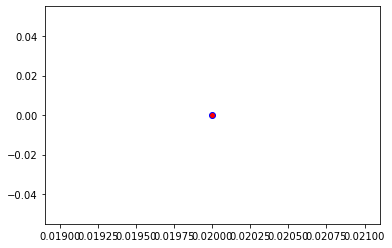

Crafting adversarial images took: 7.571483373641968 seconds 

Images classified as:
000000176857 884 = vault
000000176901 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


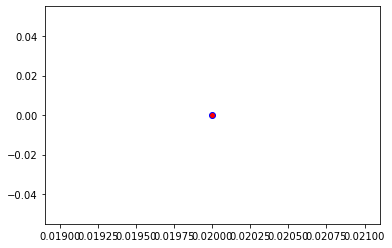

Crafting adversarial images took: 7.56328272819519 seconds 

Images classified as:
000000177015 620 = laptop
000000177065 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


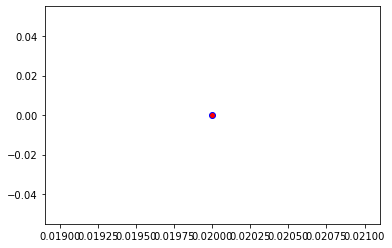

Crafting adversarial images took: 7.706319570541382 seconds 

Images classified as:
000000177213 963 = pizza
000000177357 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 254.93639
Min values in image-array: 0.0 Max values in image-array: 0.99975055
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


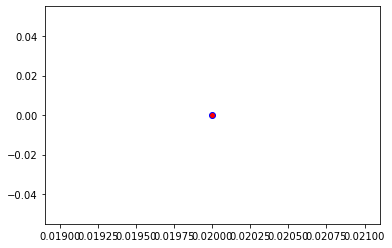

Crafting adversarial images took: 7.403665542602539 seconds 

Images classified as:
000000177383 547 = electric locomotive
000000177489 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


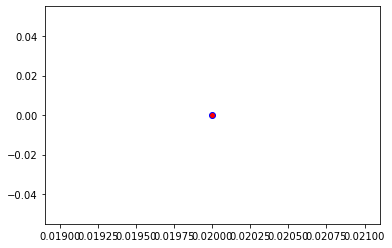

Crafting adversarial images took: 7.424006938934326 seconds 

Images classified as:
000000177539 701 = parachute
000000177714 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


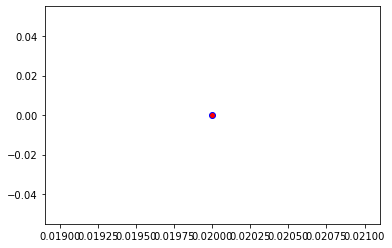

Crafting adversarial images took: 7.488269805908203 seconds 

Images classified as:
000000177861 879 = umbrella
000000177893 874 = trolleybus
Min values in image-array: 0.4286499 Max values in image-array: 255.0
Min values in image-array: 0.00168098 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


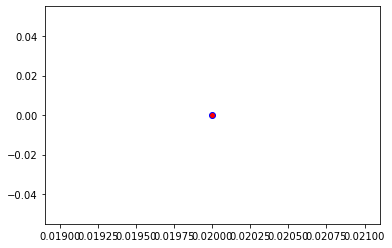

Crafting adversarial images took: 7.473629713058472 seconds 

Images classified as:
000000177934 665 = moped
000000177935 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


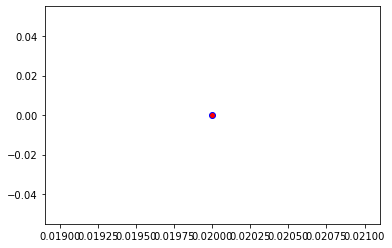

Crafting adversarial images took: 7.518702507019043 seconds 

Images classified as:
000000178028 896 = washbasin
000000178469 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


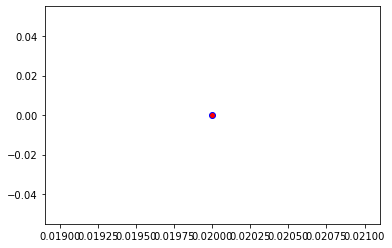

Crafting adversarial images took: 7.541151523590088 seconds 

Images classified as:
000000178618 386 = African elephant
000000178744 408 = amphibian
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


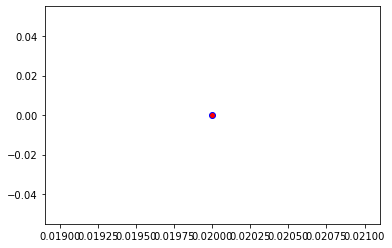

Crafting adversarial images took: 7.3457159996032715 seconds 

Images classified as:
000000178982 920 = traffic light
000000179112 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


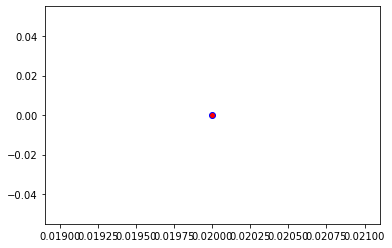

Crafting adversarial images took: 7.466903209686279 seconds 

Images classified as:
000000179141 618 = ladle
000000179174 675 = moving van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


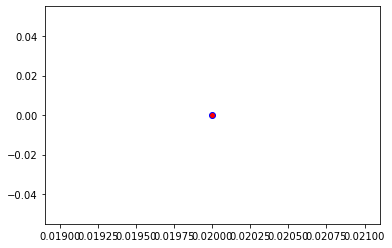

Crafting adversarial images took: 7.376034259796143 seconds 

Images classified as:
000000179214 963 = pizza
000000179265 779 = school bus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


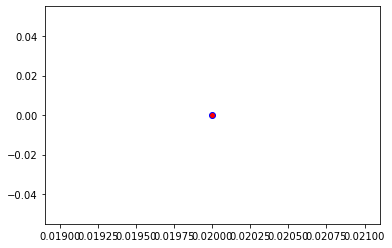

Crafting adversarial images took: 8.048282861709595 seconds 

Images classified as:
000000179285 752 = racket
000000179392 199 = Scotch terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


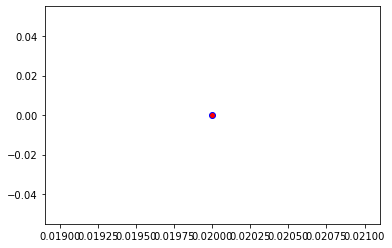

Crafting adversarial images took: 7.361631393432617 seconds 

Images classified as:
000000179487 752 = racket
000000179642 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


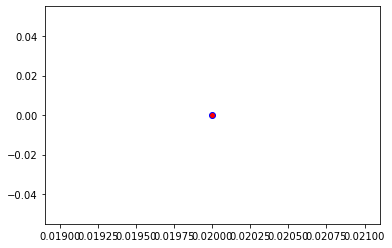

Crafting adversarial images took: 7.529224395751953 seconds 

Images classified as:
000000179653 409 = analog clock
000000179765 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


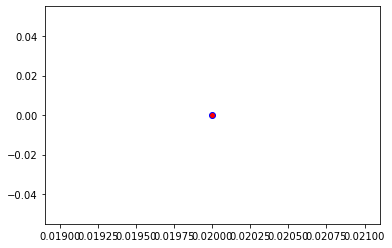

Crafting adversarial images took: 7.557458400726318 seconds 

Images classified as:
000000179898 934 = hotdog
000000180011 383 = Madagascar cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


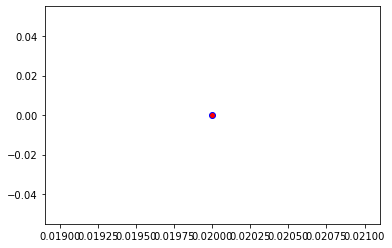

Crafting adversarial images took: 7.600739479064941 seconds 

Images classified as:
000000180101 470 = candle
000000180135 650 = microphone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


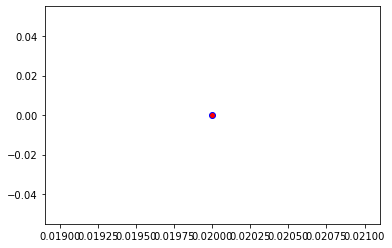

Crafting adversarial images took: 7.751602649688721 seconds 

Images classified as:
000000180188 565 = freight car
000000180296 431 = bassinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


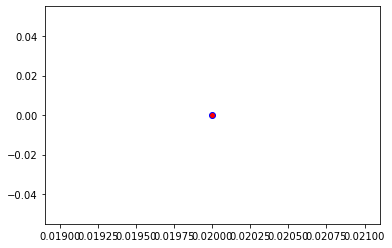

Crafting adversarial images took: 7.507036209106445 seconds 

Images classified as:
000000180383 172 = whippet
000000180487 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


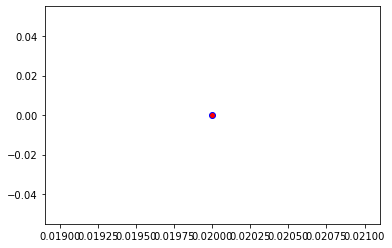

Crafting adversarial images took: 7.351109027862549 seconds 

Images classified as:
000000180560 470 = candle
000000180751 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


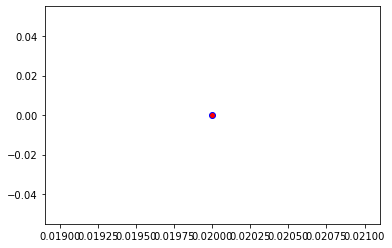

Crafting adversarial images took: 7.499836683273315 seconds 

Images classified as:
000000180792 861 = toilet seat
000000180798 605 = iPod
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


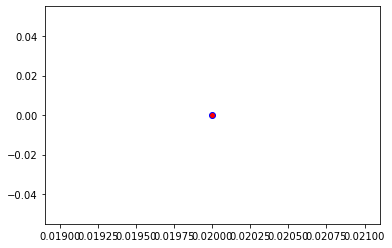

Crafting adversarial images took: 7.3611180782318115 seconds 

Images classified as:
000000180878 692 = packet
000000181303 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 254.8913
Min values in image-array: 0.0 Max values in image-array: 0.9995737
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


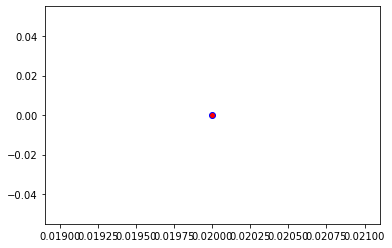

Crafting adversarial images took: 7.45880126953125 seconds 

Images classified as:
000000181421 879 = umbrella
000000181499 620 = laptop
Min values in image-array: 0.034914467 Max values in image-array: 255.0
Min values in image-array: 0.00013691948 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


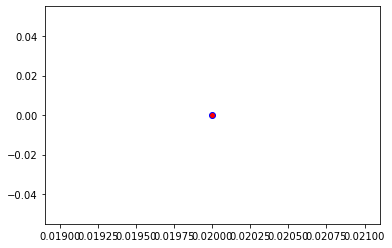

Crafting adversarial images took: 7.377067565917969 seconds 

Images classified as:
000000181542 665 = moped
000000181666 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


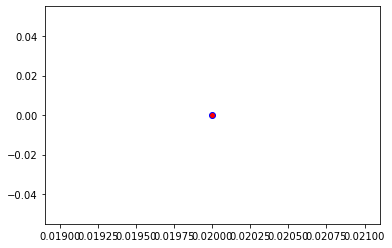

Crafting adversarial images took: 7.477301120758057 seconds 

Images classified as:
000000181753 905 = window shade
000000181796 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


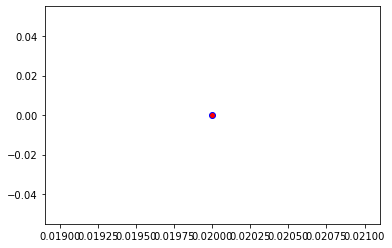

Crafting adversarial images took: 7.381105899810791 seconds 

Images classified as:
000000181816 703 = park bench
000000181859 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


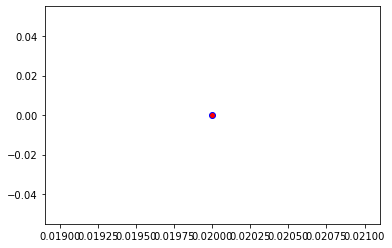

Crafting adversarial images took: 7.501050710678101 seconds 

Images classified as:
000000181969 184 = Irish terrier
000000182021 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 254.12611
Min values in image-array: 0.0 Max values in image-array: 0.996573
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


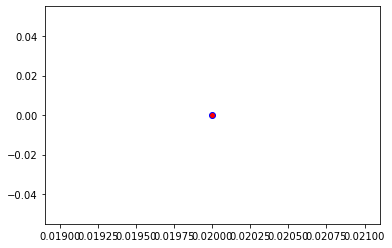

Crafting adversarial images took: 7.6701648235321045 seconds 

Images classified as:
000000182155 823 = stethoscope
000000182162 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


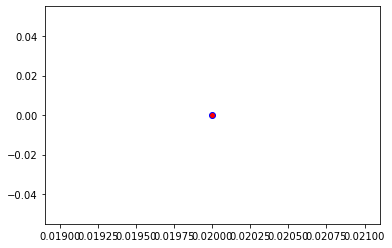

Crafting adversarial images took: 7.7545552253723145 seconds 

Images classified as:
000000182202 681 = notebook
000000182417 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


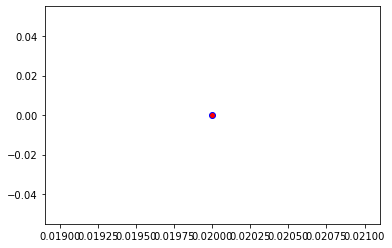

Crafting adversarial images took: 7.431774139404297 seconds 

Images classified as:
000000182441 143 = oystercatcher
000000182611 926 = hot pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


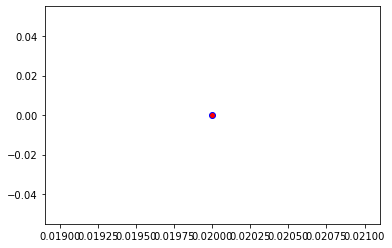

Crafting adversarial images took: 7.580596685409546 seconds 

Images classified as:
000000182805 256 = Newfoundland
000000182923 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


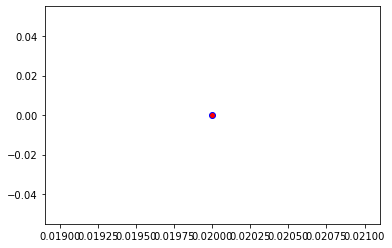

Crafting adversarial images took: 7.460408926010132 seconds 

Images classified as:
000000183049 453 = bookcase
000000183104 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


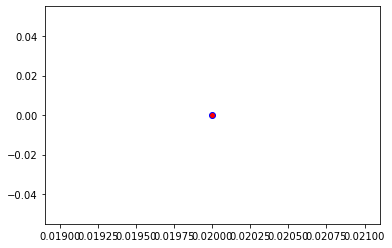

Crafting adversarial images took: 7.585731267929077 seconds 

Images classified as:
000000183127 814 = speedboat
000000183246 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


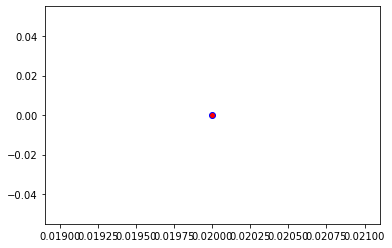

Crafting adversarial images took: 7.621330738067627 seconds 

Images classified as:
000000183391 752 = racket
000000183437 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


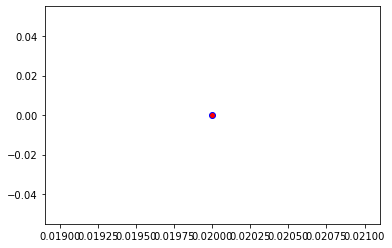

Crafting adversarial images took: 7.480613946914673 seconds 

Images classified as:
000000183500 318 = wing
000000183648 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


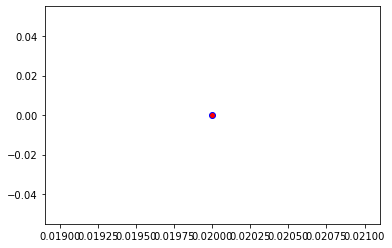

Crafting adversarial images took: 7.500509023666382 seconds 

Images classified as:
000000183675 339 = sorrel
000000183709 515 = cowboy hat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


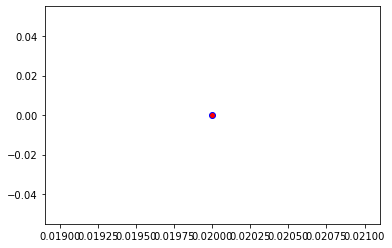

Crafting adversarial images took: 7.647984027862549 seconds 

Images classified as:
000000183716 639 = suit
000000183965 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


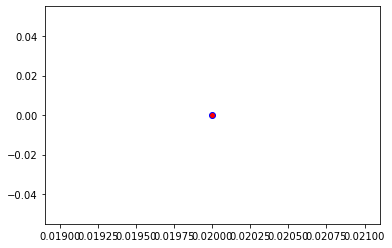

Crafting adversarial images took: 7.698911905288696 seconds 

Images classified as:
000000184321 547 = electric locomotive
000000184324 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 253.98973
Min values in image-array: 0.0 Max values in image-array: 0.99603814
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


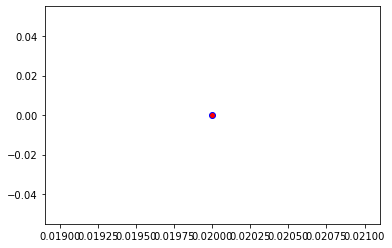

Crafting adversarial images took: 7.707250356674194 seconds 

Images classified as:
000000184338 586 = half track
000000184384 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


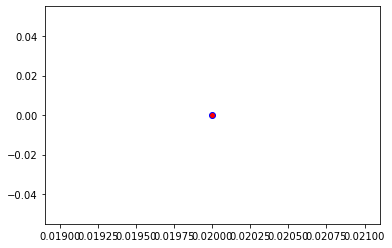

Crafting adversarial images took: 7.399178981781006 seconds 

Images classified as:
000000184400 498 = cinema
000000184611 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


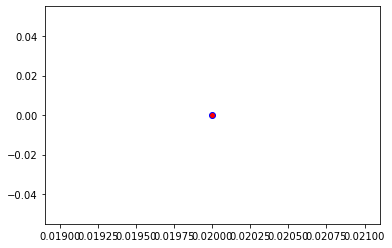

Crafting adversarial images took: 7.506387233734131 seconds 

Images classified as:
000000184762 892 = wall clock
000000184791 868 = tray
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


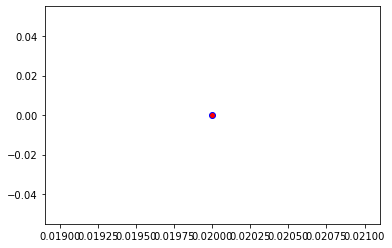

Crafting adversarial images took: 7.458172082901001 seconds 

Images classified as:
000000184978 248 = ski
000000185157 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


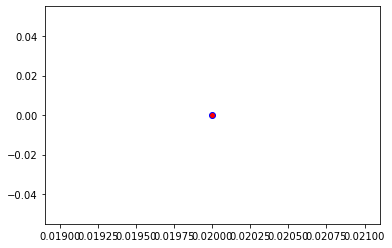

Crafting adversarial images took: 7.612689018249512 seconds 

Images classified as:
000000185250 805 = soccer ball
000000185292 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


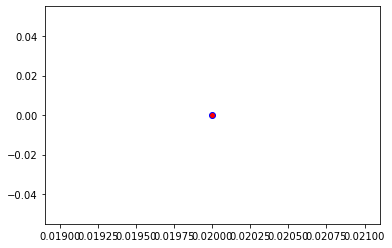

Crafting adversarial images took: 7.6125099658966064 seconds 

Images classified as:
000000185409 340 = zebra
000000185472 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


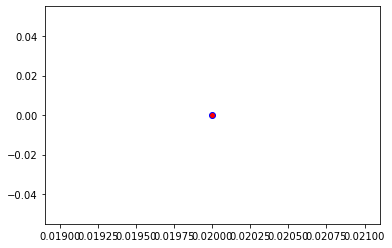

Crafting adversarial images took: 7.586745738983154 seconds 

Images classified as:
000000185473 134 = crane
000000185599 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


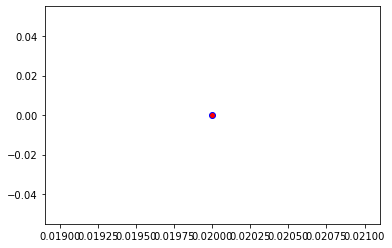

Crafting adversarial images took: 7.401188611984253 seconds 

Images classified as:
000000185802 765 = rocking chair
000000185890 775 = sarong
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


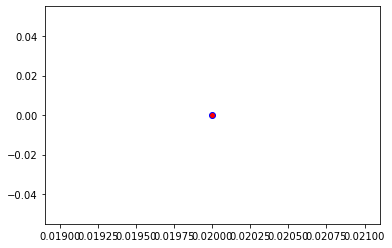

Crafting adversarial images took: 7.6167871952056885 seconds 

Images classified as:
000000185950 602 = horizontal bar
000000186042 975 = lakeside
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


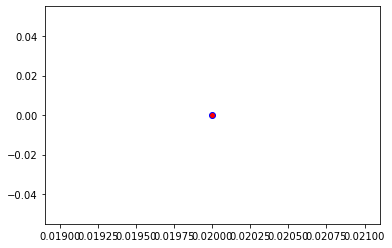

Crafting adversarial images took: 7.497156143188477 seconds 

Images classified as:
000000186282 527 = desktop computer
000000186296 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


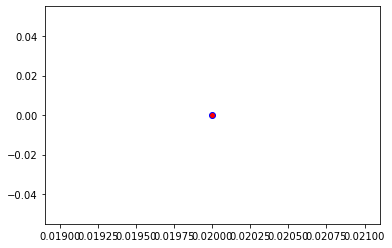

Crafting adversarial images took: 7.511098861694336 seconds 

Images classified as:
000000186345 701 = parachute
000000186422 294 = brown bear
Min values in image-array: 1.2186451 Max values in image-array: 254.93192
Min values in image-array: 0.0047790003 Max values in image-array: 0.99973303
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


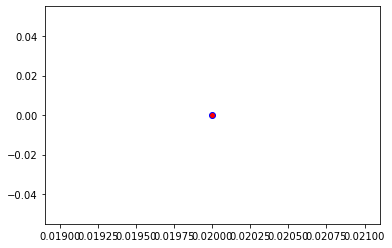

Crafting adversarial images took: 7.688641786575317 seconds 

Images classified as:
000000186449 881 = upright
000000186624 820 = steam locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


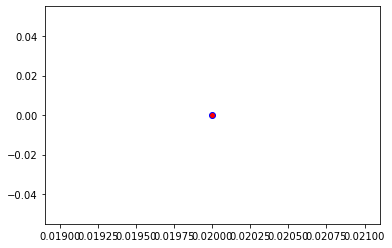

Crafting adversarial images took: 7.4541051387786865 seconds 

Images classified as:
000000186632 598 = home theater
000000186637 293 = cheetah
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


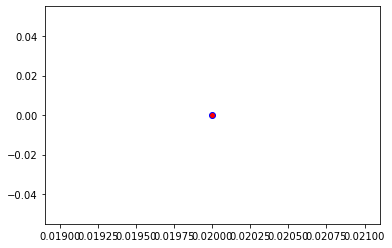

Crafting adversarial images took: 7.342197418212891 seconds 

Images classified as:
000000186873 472 = canoe
000000186929 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


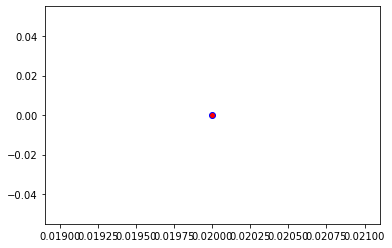

Crafting adversarial images took: 7.84016489982605 seconds 

Images classified as:
000000186938 139 = ruddy turnstone
000000186980 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 250.38245
Min values in image-array: 0.0 Max values in image-array: 0.98189193
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


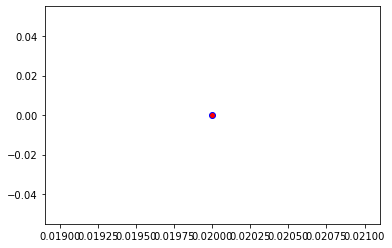

Crafting adversarial images took: 7.4308600425720215 seconds 

Images classified as:
000000187055 752 = racket
000000187144 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


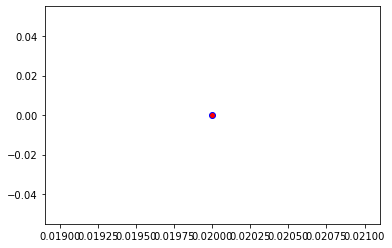

Crafting adversarial images took: 7.5496954917907715 seconds 

Images classified as:
000000187236 209 = Chesapeake Bay retriever
000000187243 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


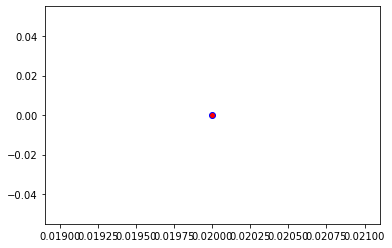

Crafting adversarial images took: 7.445791721343994 seconds 

Images classified as:
000000187249 631 = lotion
000000187271 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


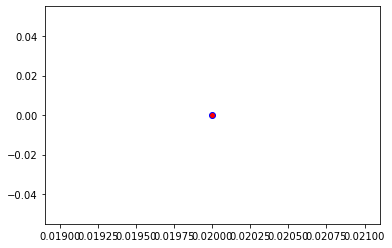

Crafting adversarial images took: 7.5559914112091064 seconds 

Images classified as:
000000187362 842 = swimming trunks
000000187513 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


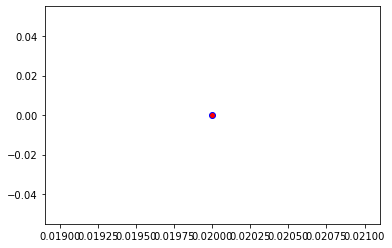

Crafting adversarial images took: 7.351003885269165 seconds 

Images classified as:
000000187585 776 = sax
000000187734 722 = ping-pong ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


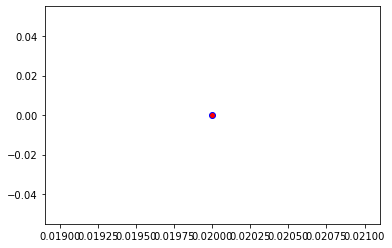

Crafting adversarial images took: 7.97272253036499 seconds 

Images classified as:
000000187745 21 = kite
000000187990 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


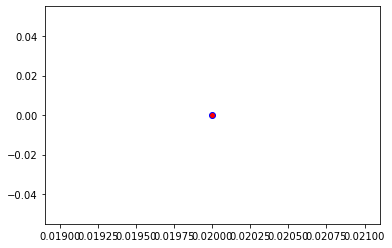

Crafting adversarial images took: 7.651280164718628 seconds 

Images classified as:
000000188296 560 = football helmet
000000188439 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


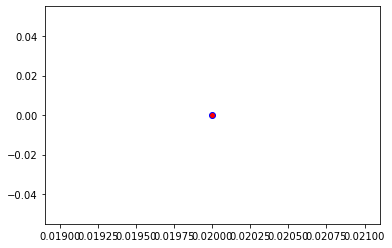

Crafting adversarial images took: 7.370424747467041 seconds 

Images classified as:
000000188465 981 = ballplayer
000000188592 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


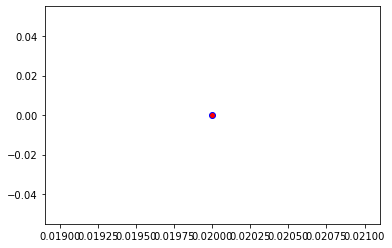

Crafting adversarial images took: 7.71856951713562 seconds 

Images classified as:
000000188689 864 = wreck
000000188906 26 = common newt
Min values in image-array: 0.0 Max values in image-array: 254.95256
Min values in image-array: 0.0 Max values in image-array: 0.999814
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


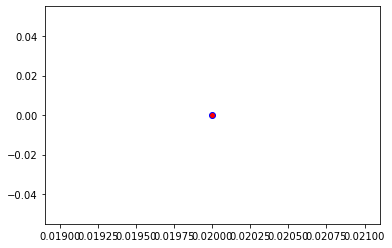

Crafting adversarial images took: 7.5606231689453125 seconds 

Images classified as:
000000189078 952 = fig
000000189213 843 = swing
Min values in image-array: 0.0 Max values in image-array: 253.80594
Min values in image-array: 0.0 Max values in image-array: 0.9953174
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


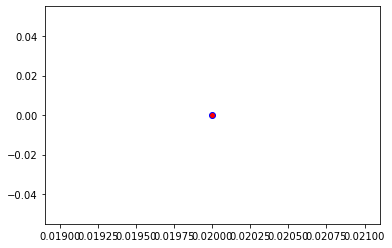

Crafting adversarial images took: 7.401860237121582 seconds 

Images classified as:
000000189226 898 = water bottle
000000189310 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


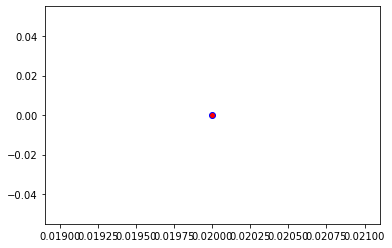

Crafting adversarial images took: 7.523303985595703 seconds 

Images classified as:
000000189436 850 = teddy
000000189451 960 = chocolate sauce
Min values in image-array: 0.27550155 Max values in image-array: 255.0
Min values in image-array: 0.0010803982 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


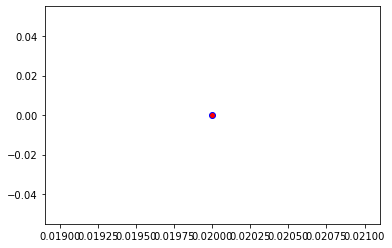

Crafting adversarial images took: 7.486940622329712 seconds 

Images classified as:
000000189475 762 = restaurant
000000189698 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


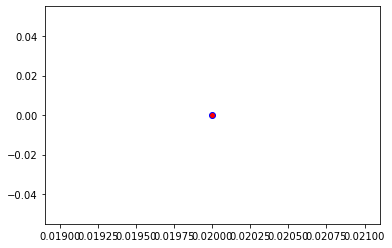

Crafting adversarial images took: 7.491436719894409 seconds 

Images classified as:
000000189752 963 = pizza
000000189775 430 = basketball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


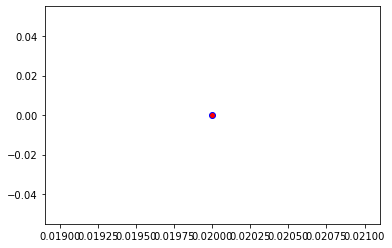

Crafting adversarial images took: 7.568721294403076 seconds 

Images classified as:
000000189806 217 = English springer
000000189820 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


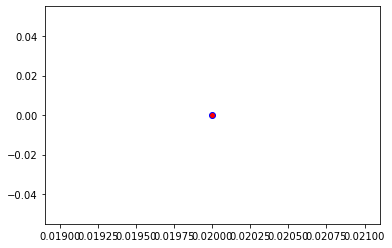

Crafting adversarial images took: 7.503337621688843 seconds 

Images classified as:
000000189828 895 = warplane
000000190007 147 = grey whale
Min values in image-array: 0.0 Max values in image-array: 254.97725
Min values in image-array: 0.0 Max values in image-array: 0.9999108
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


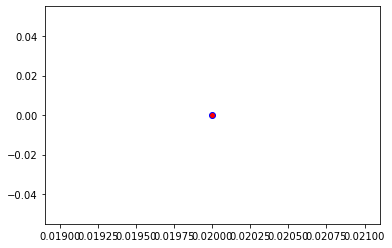

Crafting adversarial images took: 7.221790313720703 seconds 

Images classified as:
000000190140 814 = speedboat
000000190236 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


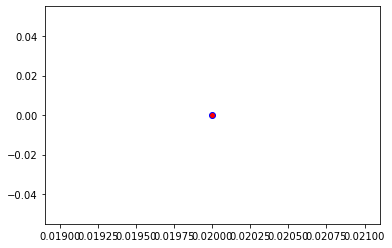

Crafting adversarial images took: 7.792943239212036 seconds 

Images classified as:
000000190307 433 = bathing cap
000000190637 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


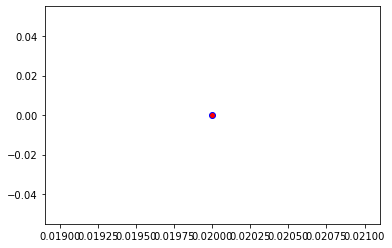

Crafting adversarial images took: 7.62669038772583 seconds 

Images classified as:
000000190648 669 = mosquito net
000000190676 405 = airship
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


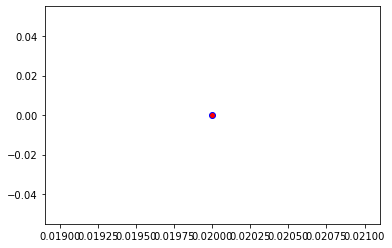

Crafting adversarial images took: 7.404987812042236 seconds 

Images classified as:
000000190753 703 = park bench
000000190756 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


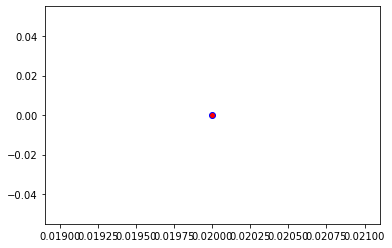

Crafting adversarial images took: 8.08007025718689 seconds 

Images classified as:
000000190841 880 = unicycle
000000190853 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


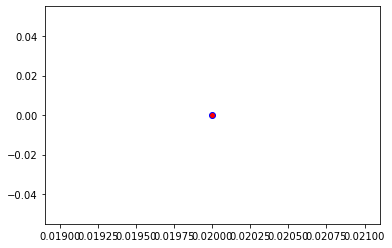

Crafting adversarial images took: 7.585663080215454 seconds 

Images classified as:
000000190923 919 = street sign
000000191013 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


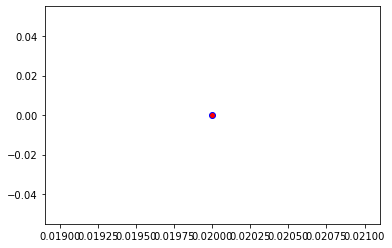

Crafting adversarial images took: 7.4036712646484375 seconds 

Images classified as:
000000191288 339 = sorrel
000000191471 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


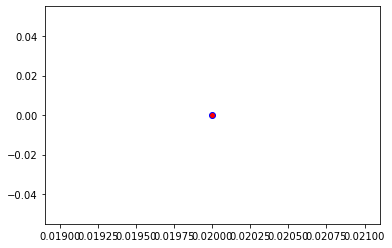

Crafting adversarial images took: 7.7476184368133545 seconds 

Images classified as:
000000191580 461 = plate
000000191614 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


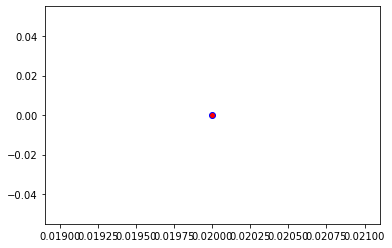

Crafting adversarial images took: 7.587219715118408 seconds 

Images classified as:
000000191672 978 = seashore
000000191761 54 = hognose snake
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


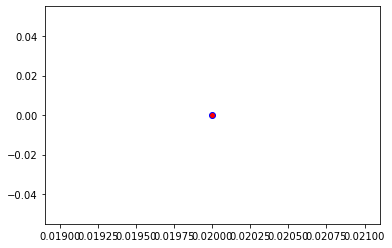

Crafting adversarial images took: 7.4429028034210205 seconds 

Images classified as:
000000191845 879 = umbrella
000000192047 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


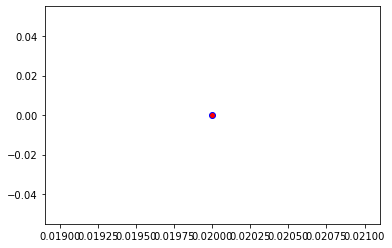

Crafting adversarial images took: 7.4966301918029785 seconds 

Images classified as:
000000192191 963 = pizza
000000192607 609 = jeep
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


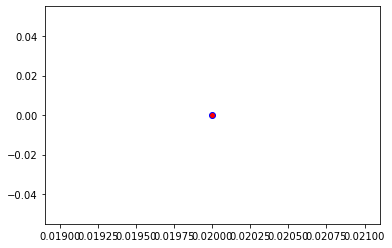

Crafting adversarial images took: 7.587454319000244 seconds 

Images classified as:
000000192670 429 = baseball
000000192699 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


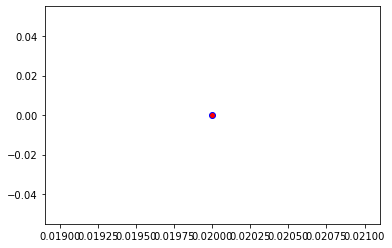

Crafting adversarial images took: 7.385790586471558 seconds 

Images classified as:
000000192716 919 = street sign
000000192871 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


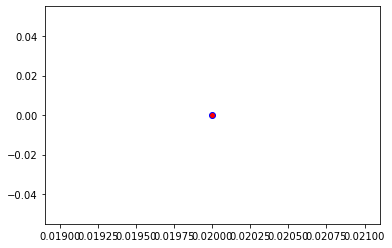

Crafting adversarial images took: 7.548253774642944 seconds 

Images classified as:
000000192904 461 = plate
000000192964 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


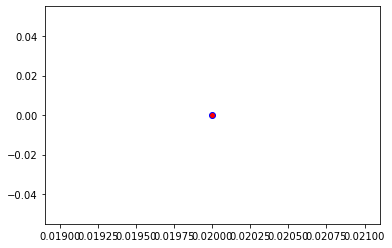

Crafting adversarial images took: 7.4958579540252686 seconds 

Images classified as:
000000193162 346 = water buffalo
000000193181 981 = ballplayer
Min values in image-array: 0.12210153 Max values in image-array: 255.0
Min values in image-array: 0.00047882952 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


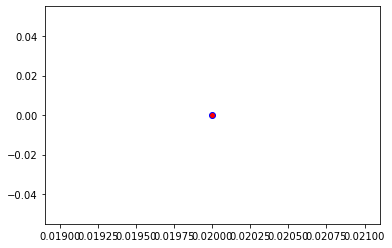

Crafting adversarial images took: 7.400715112686157 seconds 

Images classified as:
000000193245 701 = parachute
000000193348 629 = lipstick
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


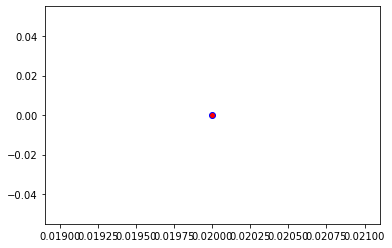

Crafting adversarial images took: 7.525608062744141 seconds 

Images classified as:
000000193429 537 = dogsled
000000193494 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


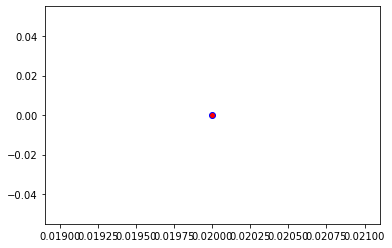

Crafting adversarial images took: 7.604886054992676 seconds 

Images classified as:
000000193674 977 = sandbar
000000193717 562 = fountain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


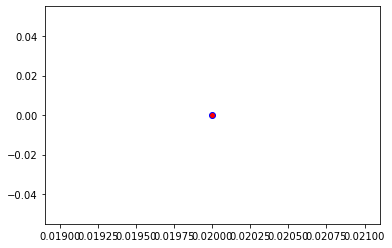

Crafting adversarial images took: 7.392071723937988 seconds 

Images classified as:
000000193743 702 = parallel bars
000000193884 716 = picket fence
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


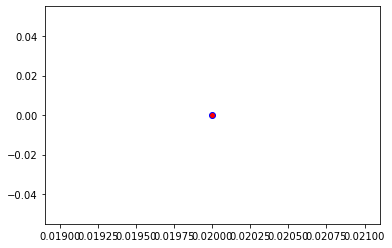

Crafting adversarial images took: 7.920520305633545 seconds 

Images classified as:
000000193926 954 = banana
000000194216 349 = bighorn
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


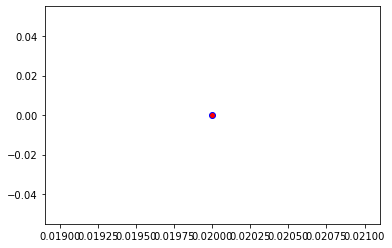

Crafting adversarial images took: 7.485389709472656 seconds 

Images classified as:
000000194471 880 = unicycle
000000194506 175 = otter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


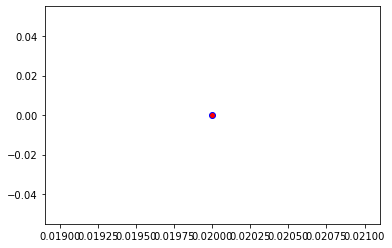

Crafting adversarial images took: 7.750040531158447 seconds 

Images classified as:
000000194716 929 = ice lolly
000000194724 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


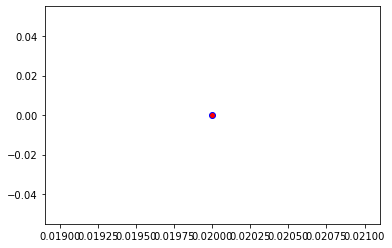

Crafting adversarial images took: 7.721931219100952 seconds 

Images classified as:
000000194746 766 = rotisserie
000000194832 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


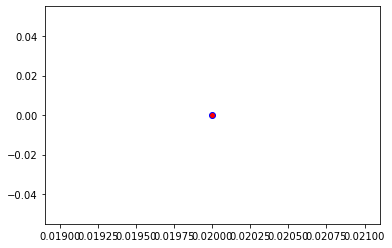

Crafting adversarial images took: 7.540036201477051 seconds 

Images classified as:
000000194875 573 = go-kart
000000194940 329 = cucumber
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


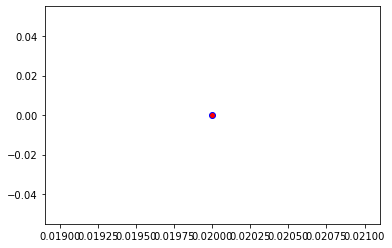

Crafting adversarial images took: 7.5570642948150635 seconds 

Images classified as:
000000195045 660 = mobile home
000000195165 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


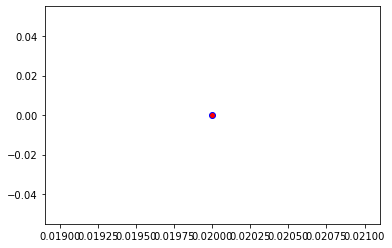

Crafting adversarial images took: 7.460116863250732 seconds 

Images classified as:
000000195754 598 = home theater
000000195842 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


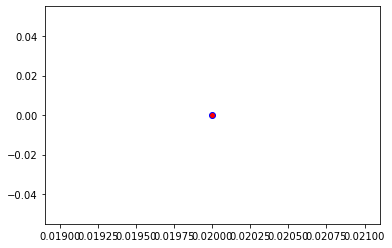

Crafting adversarial images took: 7.366229295730591 seconds 

Images classified as:
000000195918 526 = desk
000000196009 112 = conch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


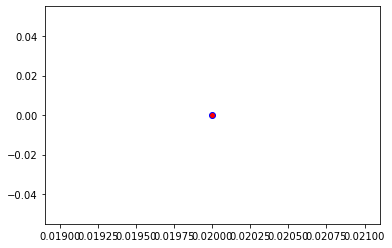

Crafting adversarial images took: 7.57673978805542 seconds 

Images classified as:
000000196141 981 = ballplayer
000000196185 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


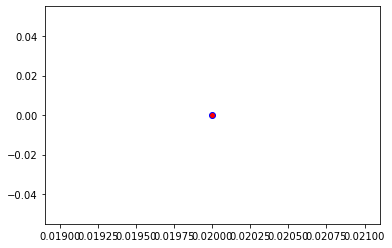

Crafting adversarial images took: 7.518200159072876 seconds 

Images classified as:
000000196442 248 = ski
000000196754 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


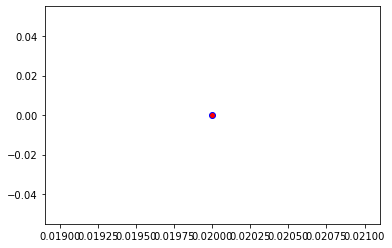

Crafting adversarial images took: 7.471377849578857 seconds 

Images classified as:
000000196759 407 = ambulance
000000196843 779 = school bus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


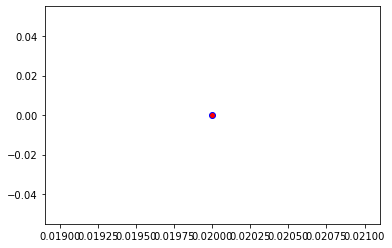

Crafting adversarial images took: 7.430976867675781 seconds 

Images classified as:
000000197004 933 = cheeseburger
000000197022 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


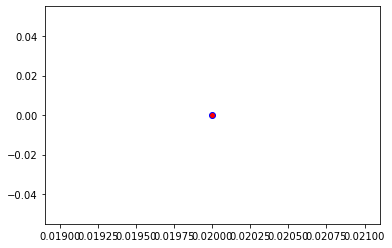

Crafting adversarial images took: 7.515492916107178 seconds 

Images classified as:
000000197388 248 = ski
000000197528 904 = window screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


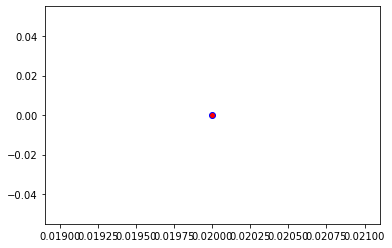

Crafting adversarial images took: 7.619374513626099 seconds 

Images classified as:
000000197658 981 = ballplayer
000000197796 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


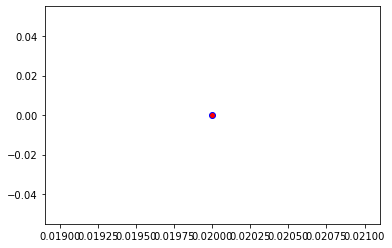

Crafting adversarial images took: 7.425922870635986 seconds 

Images classified as:
000000197870 89 = sulphur-crested cockatoo
000000198489 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


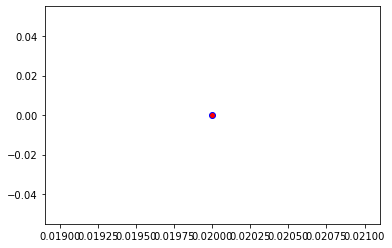

Crafting adversarial images took: 7.773856163024902 seconds 

Images classified as:
000000198510 523 = crutch
000000198641 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


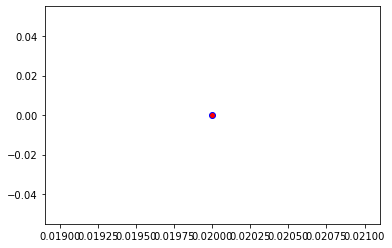

Crafting adversarial images took: 7.586239337921143 seconds 

Images classified as:
000000198805 717 = pickup
000000198915 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


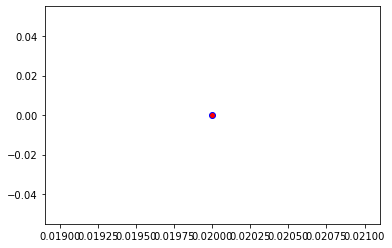

Crafting adversarial images took: 7.464004993438721 seconds 

Images classified as:
000000198928 498 = palace
000000198960 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


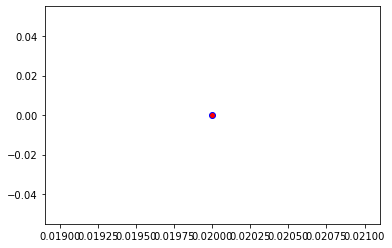

Crafting adversarial images took: 7.647051572799683 seconds 

Images classified as:
000000199055 608 = jean
000000199236 787 = shield
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


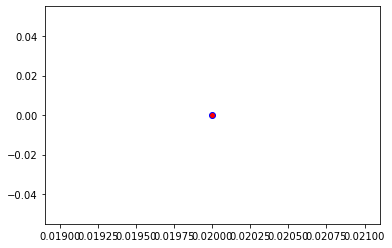

Crafting adversarial images took: 7.615479230880737 seconds 

Images classified as:
000000199310 752 = racket
000000199395 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


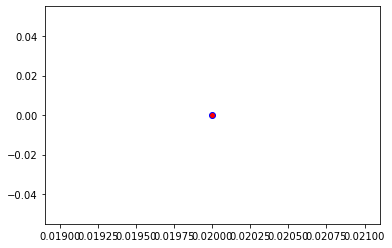

Crafting adversarial images took: 7.57868218421936 seconds 

Images classified as:
000000199442 693 = paddle
000000199551 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


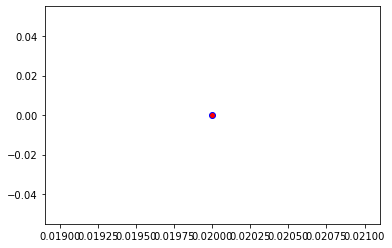

Crafting adversarial images took: 7.5277814865112305 seconds 

Images classified as:
000000199681 651 = microwave
000000199771 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


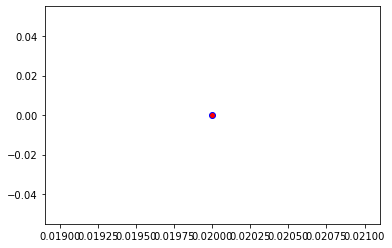

Crafting adversarial images took: 7.471875429153442 seconds 

Images classified as:
000000199977 895 = warplane
000000200152 530 = digital clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


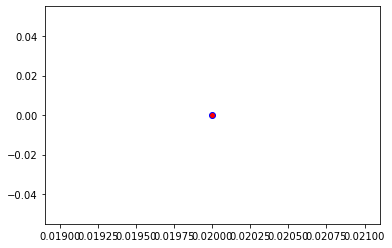

Crafting adversarial images took: 7.750010013580322 seconds 

Images classified as:
000000200162 547 = electric locomotive
000000200252 431 = bassinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


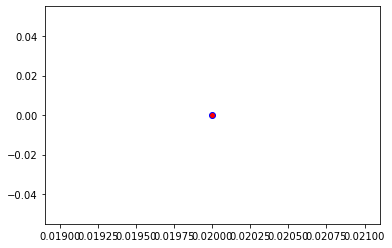

Crafting adversarial images took: 7.645655870437622 seconds 

Images classified as:
000000200421 752 = racket
000000200667 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


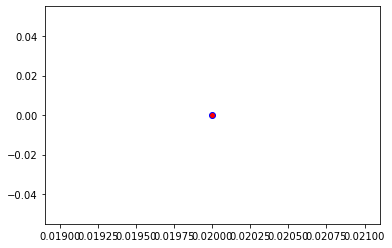

Crafting adversarial images took: 7.541326284408569 seconds 

Images classified as:
000000200839 757 = recreational vehicle
000000200961 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


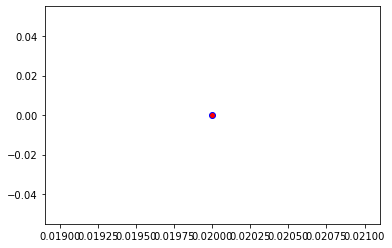

Crafting adversarial images took: 7.396057844161987 seconds 

Images classified as:
000000201025 101 = tusker
000000201072 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


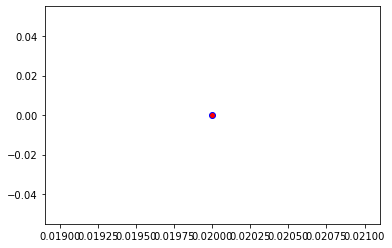

Crafting adversarial images took: 7.551009654998779 seconds 

Images classified as:
000000201148 547 = electric locomotive
000000201418 450 = bobsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


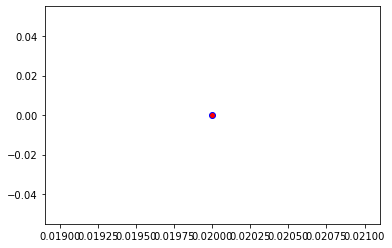

Crafting adversarial images took: 7.455986976623535 seconds 

Images classified as:
000000201426 965 = burrito
000000201646 558 = flute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


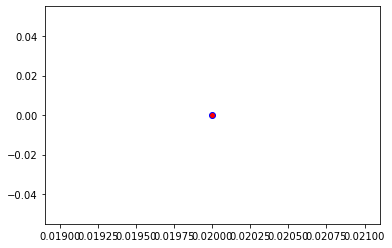

Crafting adversarial images took: 7.597933530807495 seconds 

Images classified as:
000000201676 340 = zebra
000000201775 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


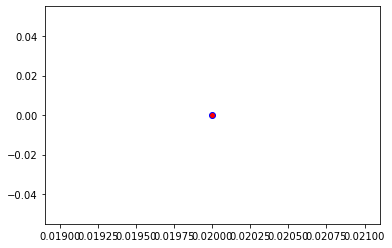

Crafting adversarial images took: 7.7230384349823 seconds 

Images classified as:
000000201934 874 = trolleybus
000000202001 785 = seat belt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


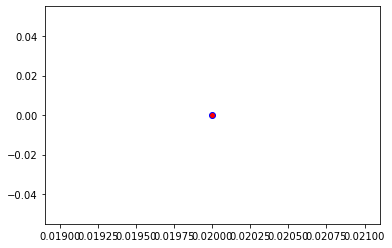

Crafting adversarial images took: 7.631035327911377 seconds 

Images classified as:
000000202228 648 = medicine chest
000000202339 757 = recreational vehicle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


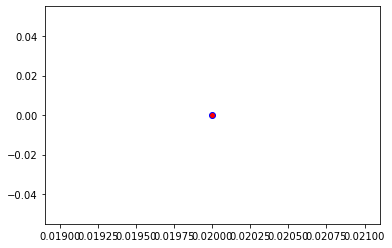

Crafting adversarial images took: 7.435936212539673 seconds 

Images classified as:
000000202445 151 = Chihuahua
000000203095 467 = butcher shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


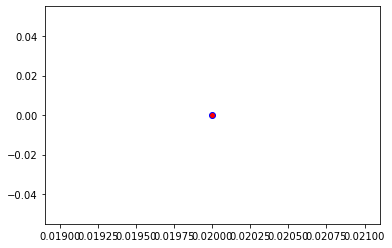

Crafting adversarial images took: 7.5996787548065186 seconds 

Images classified as:
000000203294 874 = trolleybus
000000203317 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


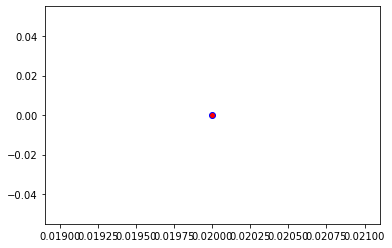

Crafting adversarial images took: 7.73746657371521 seconds 

Images classified as:
000000203389 665 = moped
000000203488 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


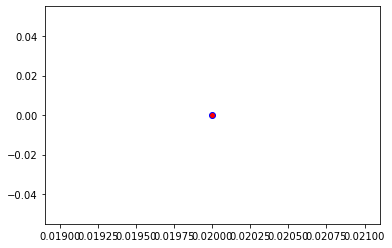

Crafting adversarial images took: 7.554368495941162 seconds 

Images classified as:
000000203546 294 = brown bear
000000203580 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


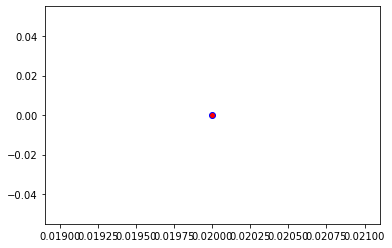

Crafting adversarial images took: 8.103707551956177 seconds 

Images classified as:
000000203629 457 = bow tie
000000203639 824 = stole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


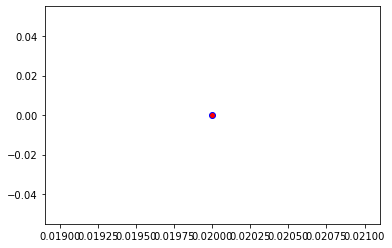

Crafting adversarial images took: 9.134660243988037 seconds 

Images classified as:
000000203864 752 = racket
000000203931 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


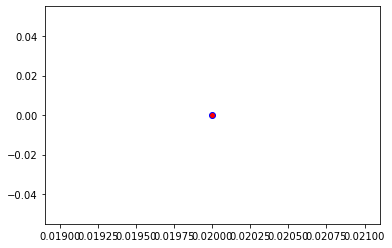

Crafting adversarial images took: 8.092462301254272 seconds 

Images classified as:
000000204186 665 = moped
000000204329 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


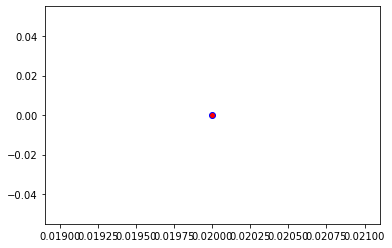

Crafting adversarial images took: 7.420922756195068 seconds 

Images classified as:
000000204871 463 = bucket
000000205105 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


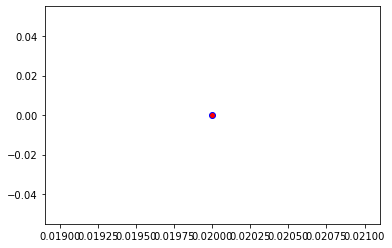

Crafting adversarial images took: 7.651013374328613 seconds 

Images classified as:
000000205282 288 = leopard
000000205289 586 = half track
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


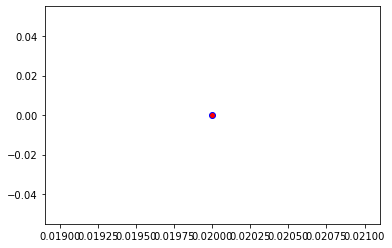

Crafting adversarial images took: 7.489483118057251 seconds 

Images classified as:
000000205324 768 = rugby ball
000000205333 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


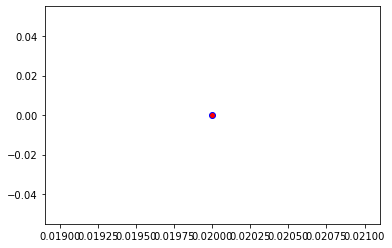

Crafting adversarial images took: 7.455340623855591 seconds 

Images classified as:
000000205401 871 = trimaran
000000205514 905 = window shade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


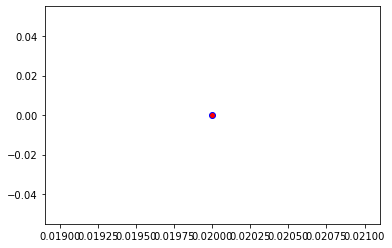

Crafting adversarial images took: 7.458061218261719 seconds 

Images classified as:
000000205542 883 = vase
000000205647 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


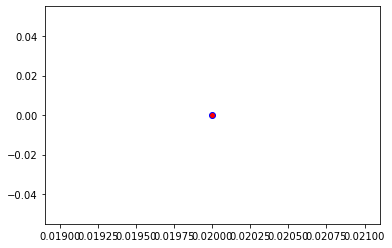

Crafting adversarial images took: 7.375771999359131 seconds 

Images classified as:
000000205776 342 = wild boar
000000205834 207 = golden retriever
Min values in image-array: 0.3020997 Max values in image-array: 255.0
Min values in image-array: 0.0011847047 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


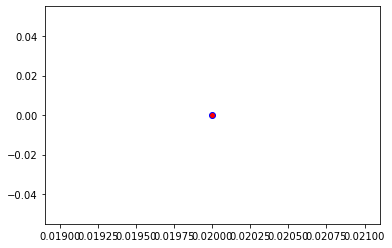

Crafting adversarial images took: 8.005532026290894 seconds 

Images classified as:
000000206025 639 = suit
000000206027 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


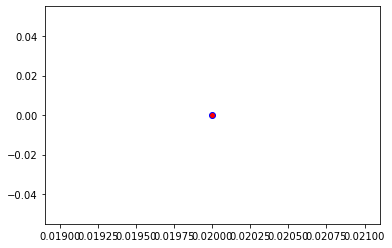

Crafting adversarial images took: 7.642448425292969 seconds 

Images classified as:
000000206135 690 = oxcart
000000206218 639 = tank
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


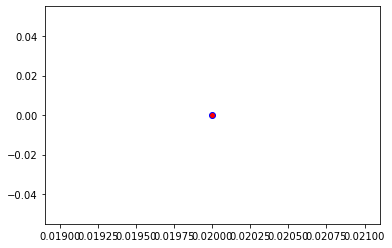

Crafting adversarial images took: 7.53312611579895 seconds 

Images classified as:
000000206271 896 = washbasin
000000206411 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


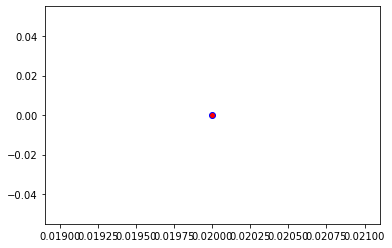

Crafting adversarial images took: 7.564584493637085 seconds 

Images classified as:
000000206487 874 = trolleybus
000000206579 470 = candle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


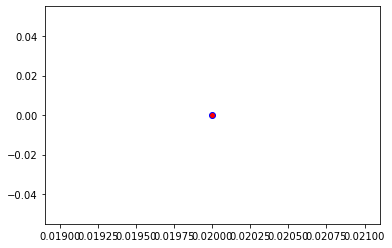

Crafting adversarial images took: 7.675521373748779 seconds 

Images classified as:
000000206831 242 = boxer
000000206838 394 = sturgeon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


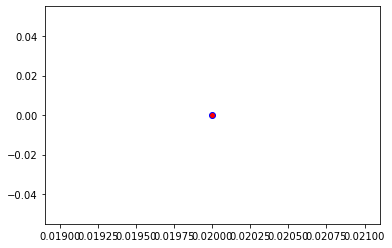

Crafting adversarial images took: 7.57603120803833 seconds 

Images classified as:
000000206994 705 = passenger car
000000207306 708 = pedestal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


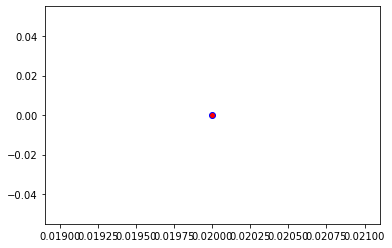

Crafting adversarial images took: 7.455153465270996 seconds 

Images classified as:
000000207538 651 = microwave
000000207585 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


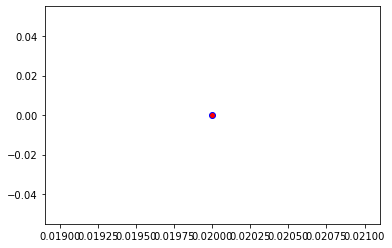

Crafting adversarial images took: 7.475426912307739 seconds 

Images classified as:
000000207728 349 = bighorn
000000207844 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


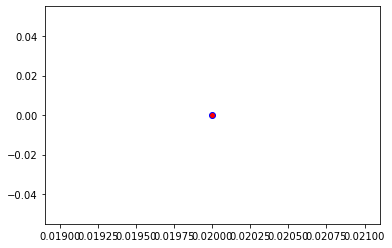

Crafting adversarial images took: 7.752967357635498 seconds 

Images classified as:
000000208208 318 = wing
000000208363 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


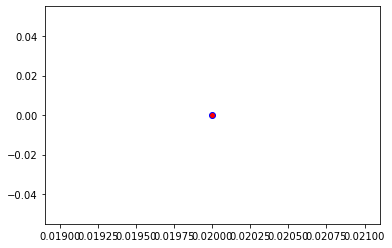

Crafting adversarial images took: 7.598694324493408 seconds 

Images classified as:
000000208423 557 = flagpole
000000208901 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 254.38777
Min values in image-array: 0.0 Max values in image-array: 0.9975991
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


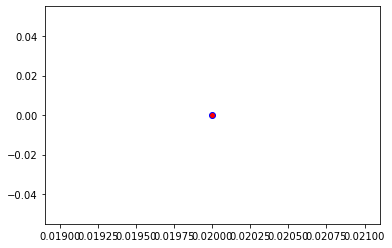

Crafting adversarial images took: 7.755382061004639 seconds 

Images classified as:
000000209142 937 = broccoli
000000209222 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


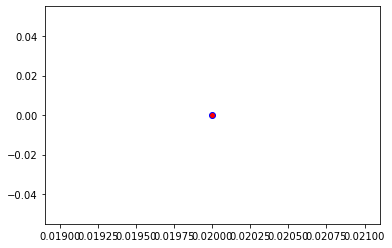

Crafting adversarial images took: 7.363713264465332 seconds 

Images classified as:
000000209530 762 = restaurant
000000209613 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


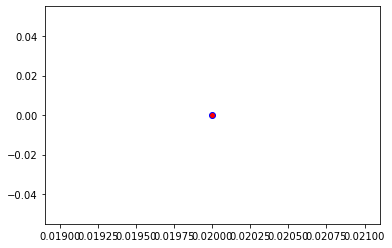

Crafting adversarial images took: 7.43588662147522 seconds 

Images classified as:
000000209747 896 = washbasin
000000209753 399 = abaya
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


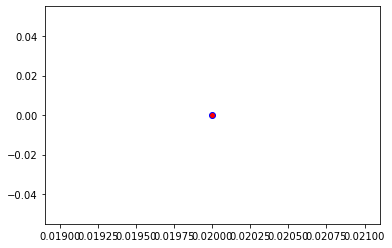

Crafting adversarial images took: 7.633827447891235 seconds 

Images classified as:
000000209757 981 = ballplayer
000000209829 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


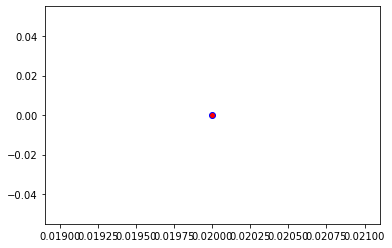

Crafting adversarial images took: 7.515527963638306 seconds 

Images classified as:
000000209972 484 = catamaran
000000210030 461 = plate
Min values in image-array: 0.6018695 Max values in image-array: 255.0
Min values in image-array: 0.0023602727 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


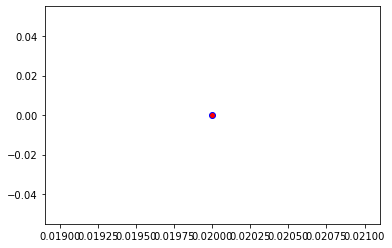

Crafting adversarial images took: 8.003620147705078 seconds 

Images classified as:
000000210032 933 = cheeseburger
000000210099 765 = rocking chair
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


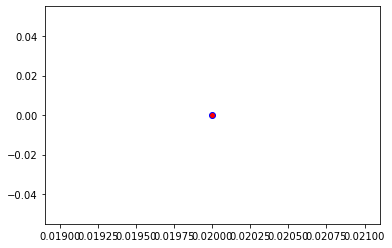

Crafting adversarial images took: 7.794790744781494 seconds 

Images classified as:
000000210230 830 = stretcher
000000210273 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


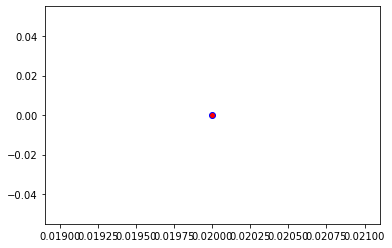

Crafting adversarial images took: 7.350538015365601 seconds 

Images classified as:
000000210299 870 = tricycle
000000210388 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


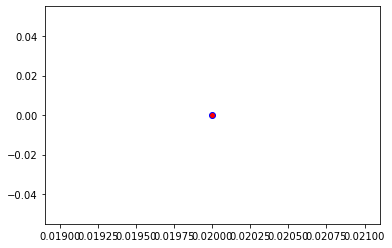

Crafting adversarial images took: 7.609055995941162 seconds 

Images classified as:
000000210394 874 = trolleybus
000000210502 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


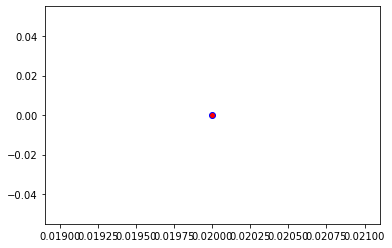

Crafting adversarial images took: 7.6801276206970215 seconds 

Images classified as:
000000210520 868 = tray
000000210708 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


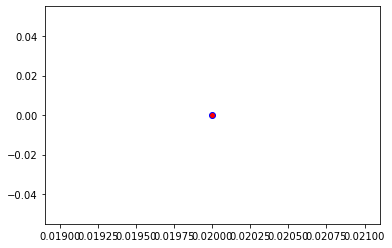

Crafting adversarial images took: 7.655791282653809 seconds 

Images classified as:
000000210789 879 = umbrella
000000210855 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


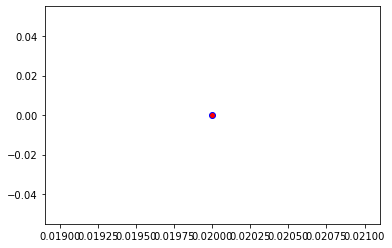

Crafting adversarial images took: 7.587405681610107 seconds 

Images classified as:
000000210915 693 = paddle
000000211042 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


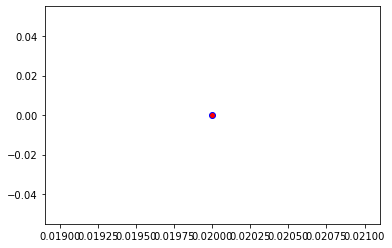

Crafting adversarial images took: 7.487135648727417 seconds 

Images classified as:
000000211069 293 = cheetah
000000211120 850 = teddy
Min values in image-array: 0.35705566 Max values in image-array: 255.0
Min values in image-array: 0.0014002183 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


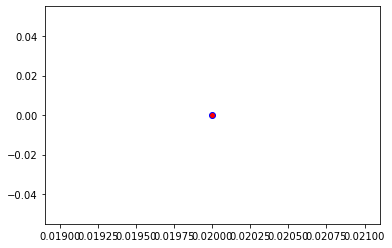

Crafting adversarial images took: 7.387016296386719 seconds 

Images classified as:
000000211674 874 = trolleybus
000000211825 647 = measuring cup
Min values in image-array: 0.0 Max values in image-array: 254.87277
Min values in image-array: 0.0 Max values in image-array: 0.99950105
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


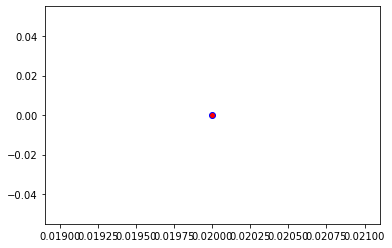

Crafting adversarial images took: 7.694028377532959 seconds 

Images classified as:
000000212072 919 = street sign
000000212166 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


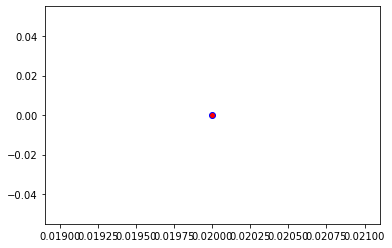

Crafting adversarial images took: 7.518687725067139 seconds 

Images classified as:
000000212226 837 = sunglasses
000000212453 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


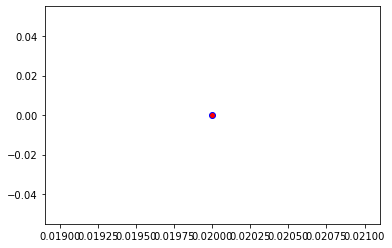

Crafting adversarial images took: 7.579691648483276 seconds 

Images classified as:
000000212559 54 = hog
000000212573 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


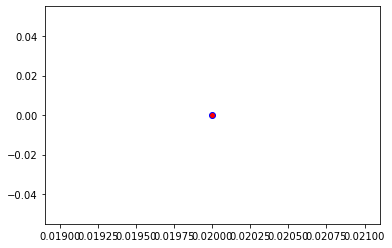

Crafting adversarial images took: 7.50253963470459 seconds 

Images classified as:
000000212800 472 = canoe
000000212895 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


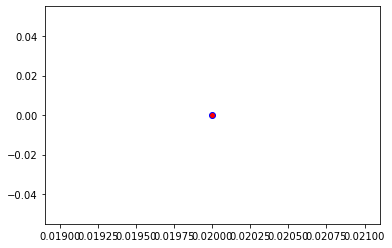

Crafting adversarial images took: 7.492913484573364 seconds 

Images classified as:
000000213033 447 = binoculars
000000213035 626 = lighter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


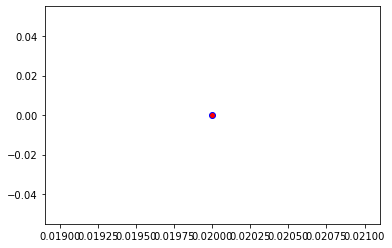

Crafting adversarial images took: 7.325397729873657 seconds 

Images classified as:
000000213086 827 = stove
000000213171 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


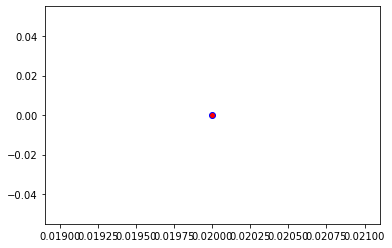

Crafting adversarial images took: 7.967786073684692 seconds 

Images classified as:
000000213224 883 = vase
000000213255 899 = water jug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


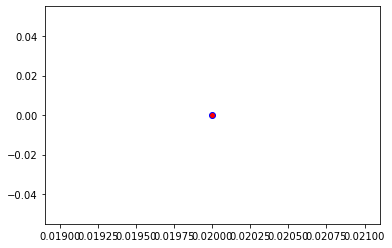

Crafting adversarial images took: 7.753196477890015 seconds 

Images classified as:
000000213422 750 = quilt
000000213445 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


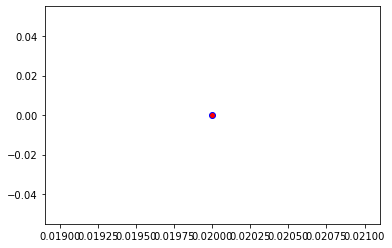

Crafting adversarial images took: 7.589027643203735 seconds 

Images classified as:
000000213547 860 = tobacco shop
000000213593 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


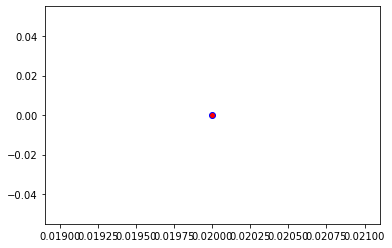

Crafting adversarial images took: 7.632160663604736 seconds 

Images classified as:
000000213605 874 = trolleybus
000000213816 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


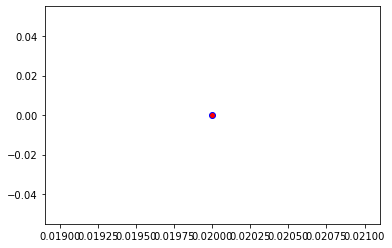

Crafting adversarial images took: 7.59434175491333 seconds 

Images classified as:
000000213830 752 = racket
000000213935 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


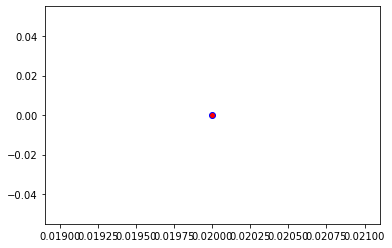

Crafting adversarial images took: 7.71079421043396 seconds 

Images classified as:
000000214192 518 = crash helmet
000000214200 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


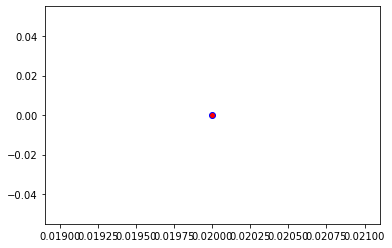

Crafting adversarial images took: 7.740588665008545 seconds 

Images classified as:
000000214205 405 = airship
000000214224 499 = cleaver
Min values in image-array: 0.0 Max values in image-array: 254.96875
Min values in image-array: 0.0 Max values in image-array: 0.99987745
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


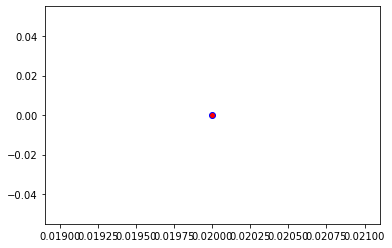

Crafting adversarial images took: 7.305045127868652 seconds 

Images classified as:
000000214539 805 = soccer ball
000000214703 98 = red-breasted merganser
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


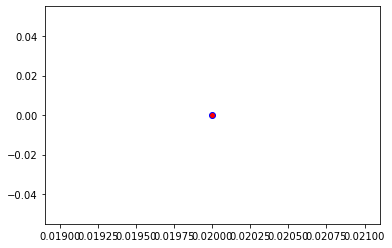

Crafting adversarial images took: 7.448277473449707 seconds 

Images classified as:
000000214720 762 = restaurant
000000214753 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


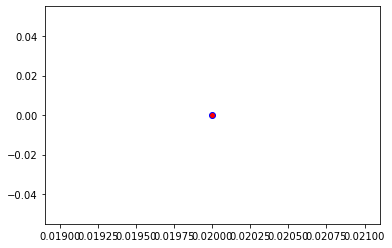

Crafting adversarial images took: 7.451314687728882 seconds 

Images classified as:
000000214869 748 = purse
000000215072 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


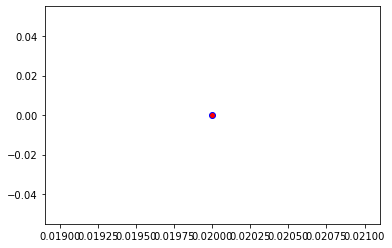

Crafting adversarial images took: 7.677253484725952 seconds 

Images classified as:
000000215114 760 = refrigerator
000000215245 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


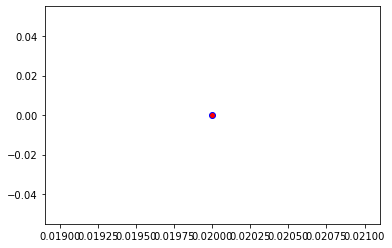

Crafting adversarial images took: 7.442965507507324 seconds 

Images classified as:
000000215259 697 = pajama
000000215644 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


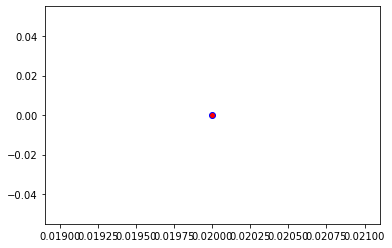

Crafting adversarial images took: 7.621403455734253 seconds 

Images classified as:
000000215723 407 = ambulance
000000215778 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


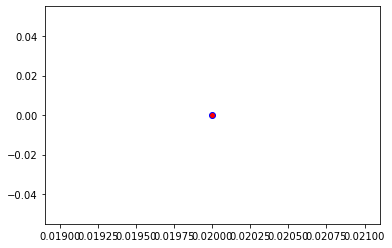

Crafting adversarial images took: 7.408396244049072 seconds 

Images classified as:
000000216277 487 = cellular telephone
000000216296 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


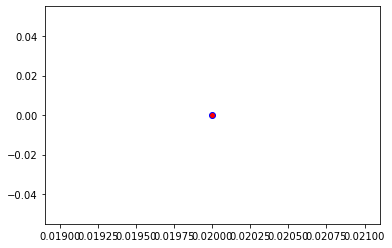

Crafting adversarial images took: 7.521195650100708 seconds 

Images classified as:
000000216419 409 = analog clock
000000216497 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


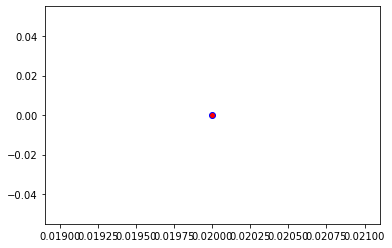

Crafting adversarial images took: 7.634925365447998 seconds 

Images classified as:
000000216516 248 = ski
000000216636 470 = candle
Min values in image-array: 0.0 Max values in image-array: 254.92856
Min values in image-array: 0.0 Max values in image-array: 0.99971986
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


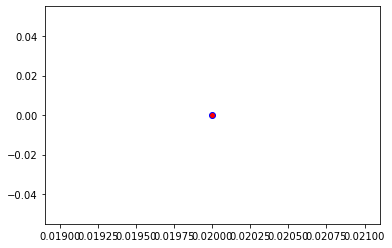

Crafting adversarial images took: 7.519465208053589 seconds 

Images classified as:
000000216739 350 = ibex
000000217060 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 254.30026
Min values in image-array: 0.0 Max values in image-array: 0.9972559
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


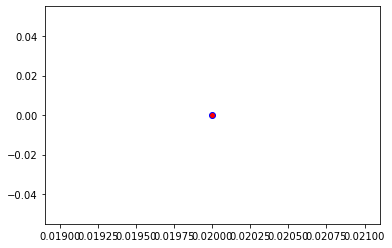

Crafting adversarial images took: 7.520696640014648 seconds 

Images classified as:
000000217219 750 = quilt
000000217285 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


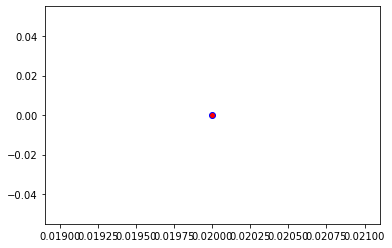

Crafting adversarial images took: 7.729831695556641 seconds 

Images classified as:
000000217400 705 = passenger car
000000217425 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


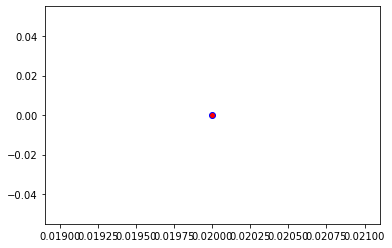

Crafting adversarial images took: 7.55941367149353 seconds 

Images classified as:
000000217614 293 = cheetah
000000217753 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


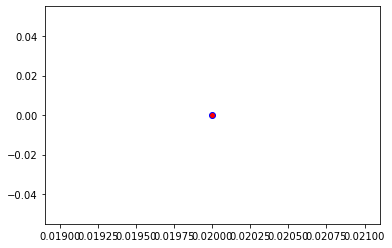

Crafting adversarial images took: 7.507928371429443 seconds 

Images classified as:
000000217872 140 = alp
000000217948 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 254.83371
Min values in image-array: 0.0 Max values in image-array: 0.99934787
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


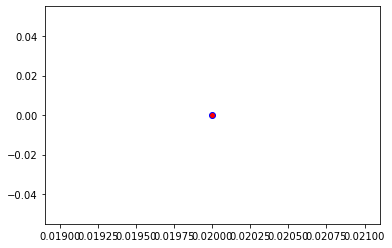

Crafting adversarial images took: 7.77305793762207 seconds 

Images classified as:
000000217957 538 = dome
000000218091 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


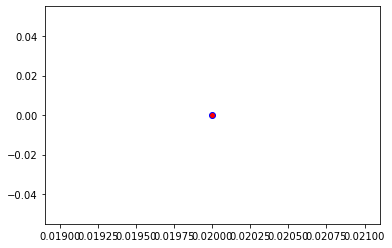

Crafting adversarial images took: 7.679822206497192 seconds 

Images classified as:
000000218249 933 = cheeseburger
000000218362 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


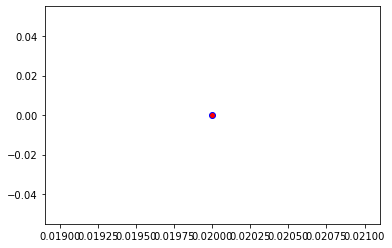

Crafting adversarial images took: 7.477689743041992 seconds 

Images classified as:
000000218424 340 = zebra
000000218439 611 = jigsaw puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


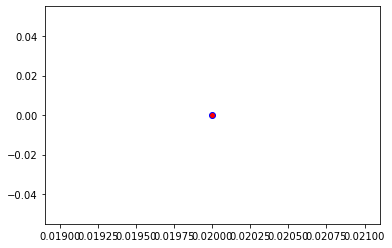

Crafting adversarial images took: 7.603897571563721 seconds 

Images classified as:
000000218997 981 = ballplayer
000000219271 864 = wreck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


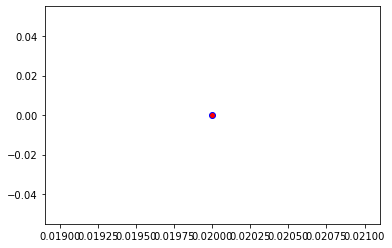

Crafting adversarial images took: 8.745101928710938 seconds 

Images classified as:
000000219283 478 = carton
000000219440 346 = water buffalo
Min values in image-array: 0.0 Max values in image-array: 243.89743
Min values in image-array: 0.0 Max values in image-array: 0.95646054
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


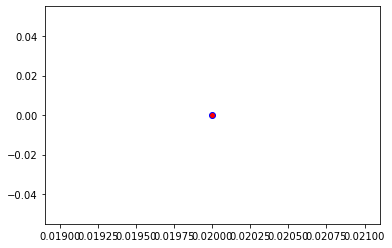

Crafting adversarial images took: 7.493722915649414 seconds 

Images classified as:
000000219485 904 = window screen
000000219578 225 = malinois
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


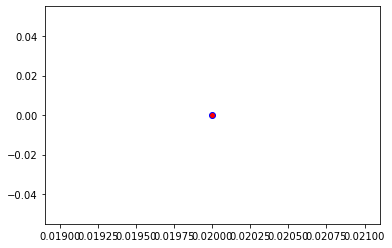

Crafting adversarial images took: 7.540498971939087 seconds 

Images classified as:
000000220310 961 = dough
000000220584 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


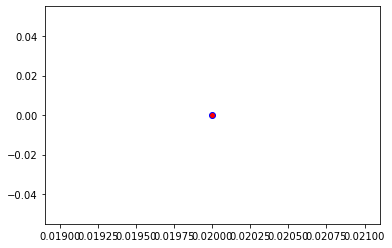

Crafting adversarial images took: 7.524415969848633 seconds 

Images classified as:
000000220732 569 = garbage truck
000000220764 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


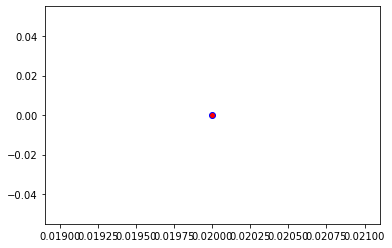

Crafting adversarial images took: 7.375917196273804 seconds 

Images classified as:
000000220858 814 = speedboat
000000221017 7 = cock
Min values in image-array: 5.2317046e-05 Max values in image-array: 255.0
Min values in image-array: 2.0516488e-07 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


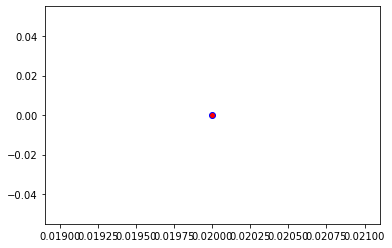

Crafting adversarial images took: 7.817140579223633 seconds 

Images classified as:
000000221155 730 = plow
000000221213 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


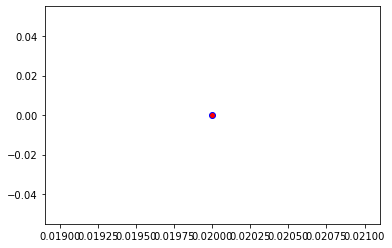

Crafting adversarial images took: 7.9387431144714355 seconds 

Images classified as:
000000221281 293 = cheetah
000000221291 417 = balloon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


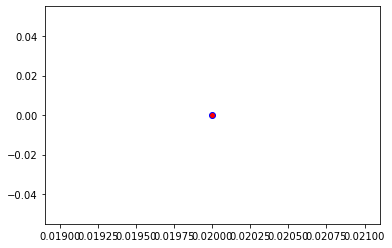

Crafting adversarial images took: 7.52167534828186 seconds 

Images classified as:
000000221502 703 = park bench
000000221693 227 = kelpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


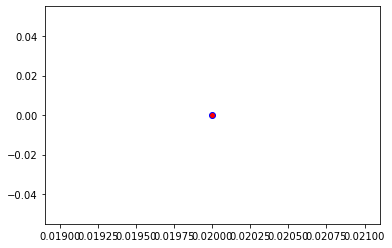

Crafting adversarial images took: 7.541204452514648 seconds 

Images classified as:
000000221708 532 = dining table
000000221754 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


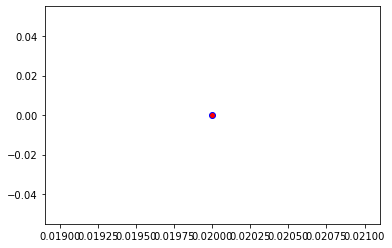

Crafting adversarial images took: 7.655450820922852 seconds 

Images classified as:
000000221872 329 = cucumber
000000222094 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


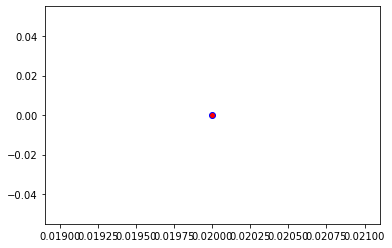

Crafting adversarial images took: 7.490844964981079 seconds 

Images classified as:
000000222118 486 = cello
000000222235 282 = tiger cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


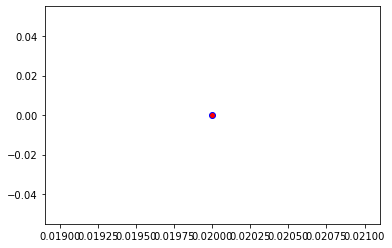

Crafting adversarial images took: 7.574894428253174 seconds 

Images classified as:
000000222299 692 = packet
000000222317 178 = Weimaraner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


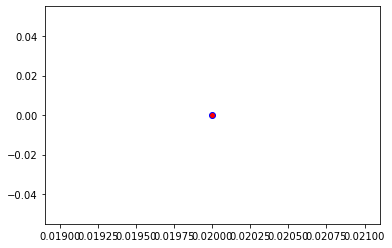

Crafting adversarial images took: 7.569067716598511 seconds 

Images classified as:
000000222455 729 = plate rack
000000222458 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


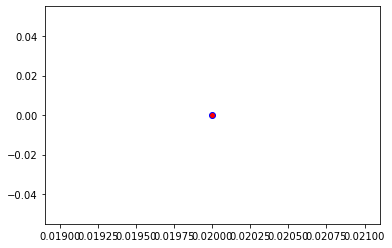

Crafting adversarial images took: 7.622388124465942 seconds 

Images classified as:
000000222559 978 = seashore
000000222735 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


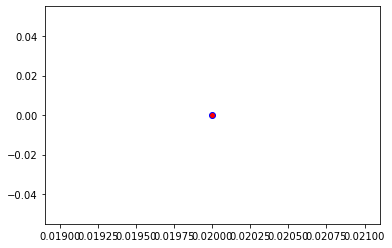

Crafting adversarial images took: 7.567712306976318 seconds 

Images classified as:
000000222825 651 = microwave
000000222863 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


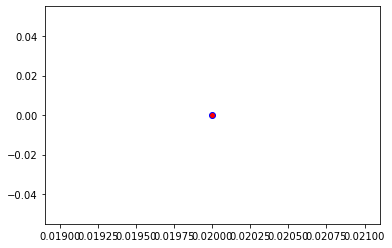

Crafting adversarial images took: 7.504987955093384 seconds 

Images classified as:
000000222991 463 = bucket
000000223090 936 = head cabbage
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


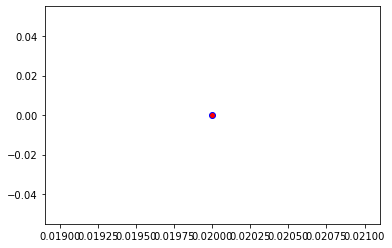

Crafting adversarial images took: 7.350515127182007 seconds 

Images classified as:
000000223130 293 = cheetah
000000223182 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


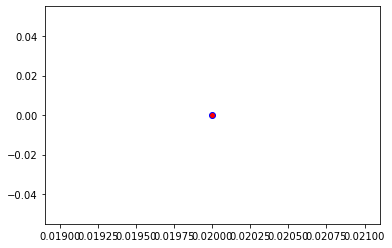

Crafting adversarial images took: 7.588608503341675 seconds 

Images classified as:
000000223188 346 = water buffalo
000000223738 429 = baseball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


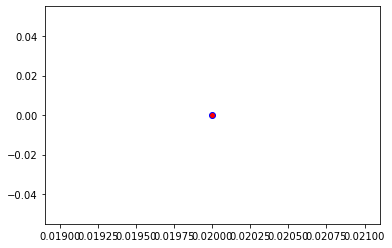

Crafting adversarial images took: 7.679670095443726 seconds 

Images classified as:
000000223747 797 = sleeping bag
000000223789 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


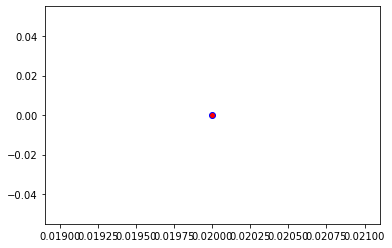

Crafting adversarial images took: 7.5963075160980225 seconds 

Images classified as:
000000223955 522 = croquet ball
000000223959 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


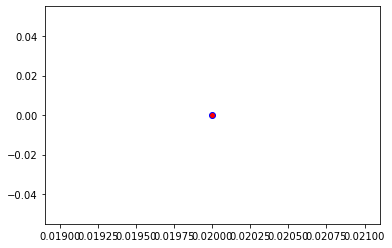

Crafting adversarial images took: 7.819146156311035 seconds 

Images classified as:
000000224051 870 = tricycle
000000224093 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


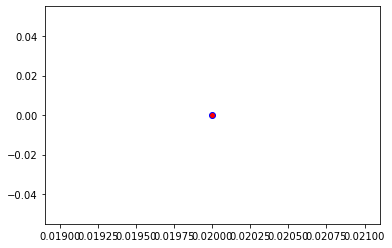

Crafting adversarial images took: 7.697154521942139 seconds 

Images classified as:
000000224119 466 = bullet train
000000224200 195 = Boston bull
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


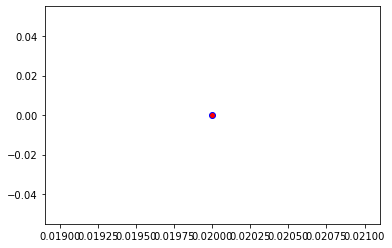

Crafting adversarial images took: 7.56162691116333 seconds 

Images classified as:
000000224222 842 = swimming trunks
000000224337 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


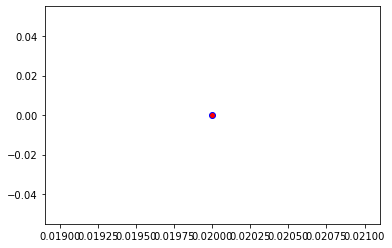

Crafting adversarial images took: 7.7479565143585205 seconds 

Images classified as:
000000224664 977 = sandbar
000000224675 645 = maypole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


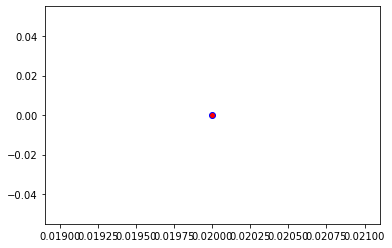

Crafting adversarial images took: 7.601172208786011 seconds 

Images classified as:
000000224724 424 = barbershop
000000224807 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


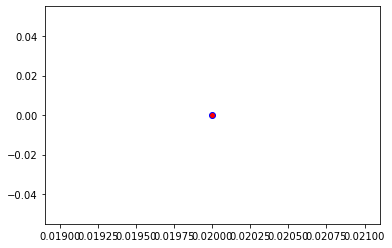

Crafting adversarial images took: 7.569592475891113 seconds 

Images classified as:
000000225184 99 = goose
000000225405 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


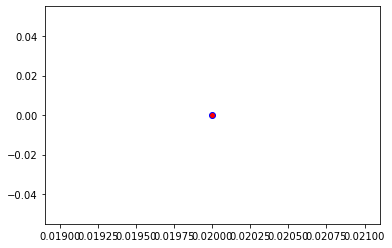

Crafting adversarial images took: 7.5523552894592285 seconds 

Images classified as:
000000225532 919 = street sign
000000225670 404 = liner
Min values in image-array: 0.0 Max values in image-array: 254.9364
Min values in image-array: 0.0 Max values in image-array: 0.9997506
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


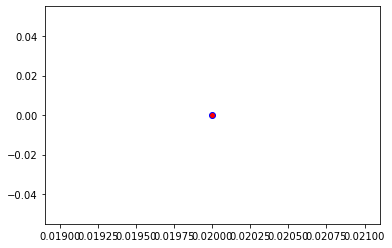

Crafting adversarial images took: 7.505956411361694 seconds 

Images classified as:
000000225757 527 = desktop computer
000000225946 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


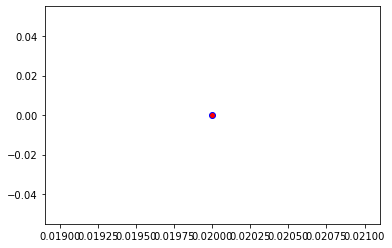

Crafting adversarial images took: 7.763092994689941 seconds 

Images classified as:
000000226058 850 = teddy
000000226111 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


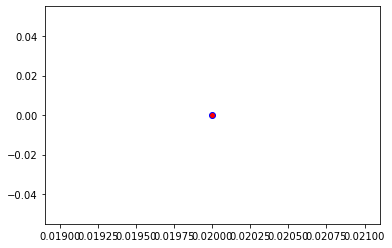

Crafting adversarial images took: 7.621370553970337 seconds 

Images classified as:
000000226130 934 = hotdog
000000226147 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


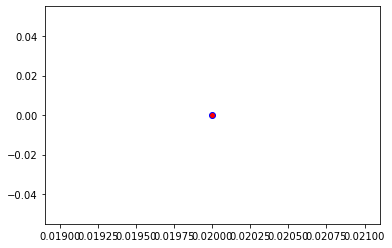

Crafting adversarial images took: 7.581910610198975 seconds 

Images classified as:
000000226154 874 = trolleybus
000000226171 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


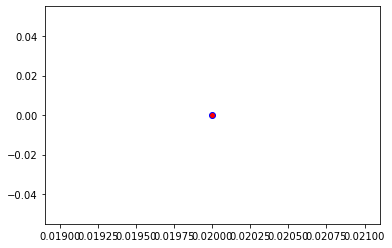

Crafting adversarial images took: 7.532007932662964 seconds 

Images classified as:
000000226408 112 = conch
000000226417 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


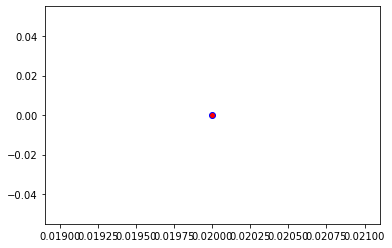

Crafting adversarial images took: 7.539844512939453 seconds 

Images classified as:
000000226592 750 = quilt
000000226662 535 = disk brake
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


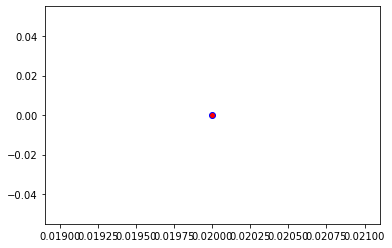

Crafting adversarial images took: 7.234947681427002 seconds 

Images classified as:
000000226802 829 = streetcar
000000226883 209 = Chesapeake Bay retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


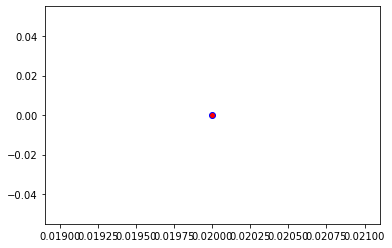

Crafting adversarial images took: 7.861344575881958 seconds 

Images classified as:
000000226903 532 = dining table
000000226984 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


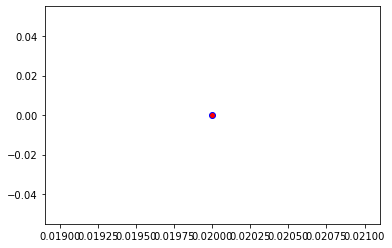

Crafting adversarial images took: 8.46524953842163 seconds 

Images classified as:
000000227044 896 = washbasin
000000227187 42 = agama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


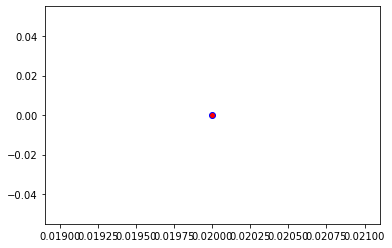

Crafting adversarial images took: 7.910010099411011 seconds 

Images classified as:
000000227399 569 = garbage truck
000000227478 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


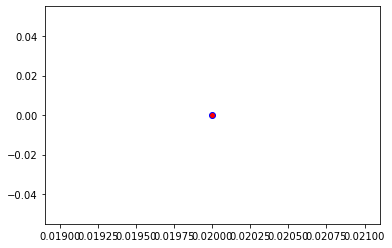

Crafting adversarial images took: 7.520961046218872 seconds 

Images classified as:
000000227482 768 = rugby ball
000000227491 248 = ski
Min values in image-array: 0.0 Max values in image-array: 252.46947
Min values in image-array: 0.0 Max values in image-array: 0.99007636
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


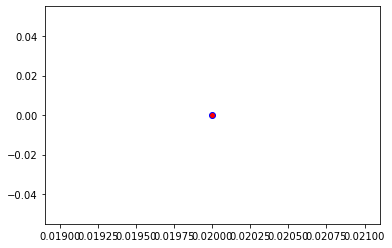

Crafting adversarial images took: 7.6699652671813965 seconds 

Images classified as:
000000227511 920 = traffic light
000000227686 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


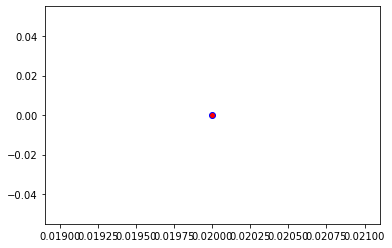

Crafting adversarial images took: 7.769747734069824 seconds 

Images classified as:
000000227765 926 = hot pot
000000227898 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


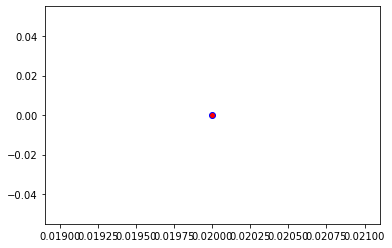

Crafting adversarial images took: 7.417189598083496 seconds 

Images classified as:
000000227985 461 = plate
000000228144 765 = rocking chair
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


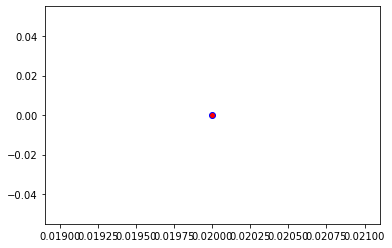

Crafting adversarial images took: 7.710296869277954 seconds 

Images classified as:
000000228214 652 = military uniform
000000228436 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


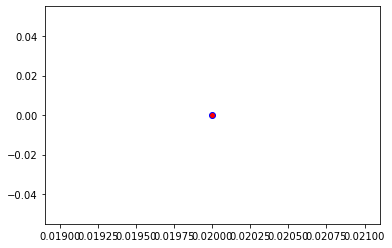

Crafting adversarial images took: 7.4808197021484375 seconds 

Images classified as:
000000228771 919 = street sign
000000228942 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


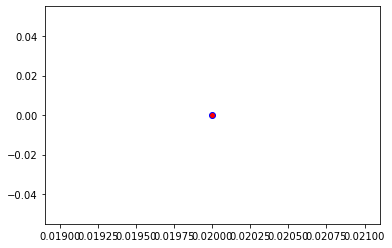

Crafting adversarial images took: 7.654777526855469 seconds 

Images classified as:
000000228981 487 = cellular telephone
000000229111 131 = rule
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


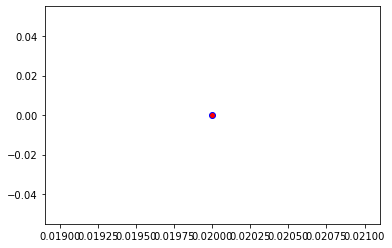

Crafting adversarial images took: 7.7458579540252686 seconds 

Images classified as:
000000229216 838 = sunscreen
000000229221 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


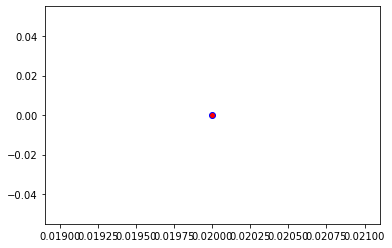

Crafting adversarial images took: 7.601808309555054 seconds 

Images classified as:
000000229311 896 = washbasin
000000229358 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


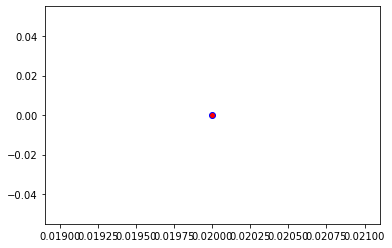

Crafting adversarial images took: 7.424347162246704 seconds 

Images classified as:
000000229553 870 = tricycle
000000229601 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


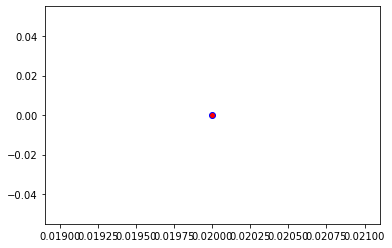

Crafting adversarial images took: 7.517797946929932 seconds 

Images classified as:
000000229659 762 = restaurant
000000229747 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


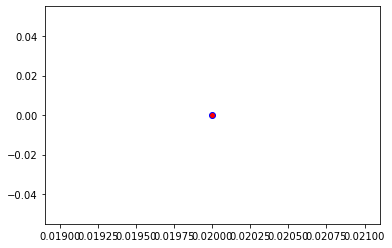

Crafting adversarial images took: 7.415594816207886 seconds 

Images classified as:
000000229753 364 = three-toed sloth
000000229849 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


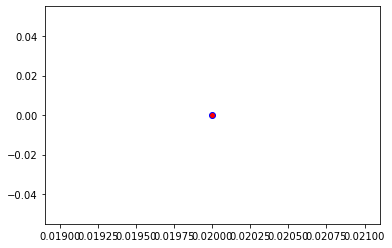

Crafting adversarial images took: 7.65379524230957 seconds 

Images classified as:
000000229858 354 = Arabian camel
000000229948 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


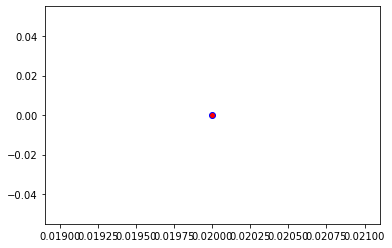

Crafting adversarial images took: 7.9200732707977295 seconds 

Images classified as:
000000229997 366 = gorilla
000000230008 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


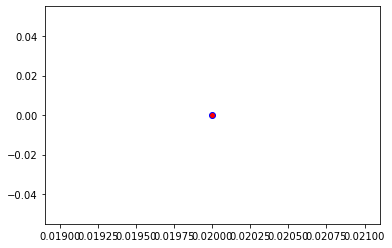

Crafting adversarial images took: 7.582299470901489 seconds 

Images classified as:
000000230166 5 = ram
000000230362 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


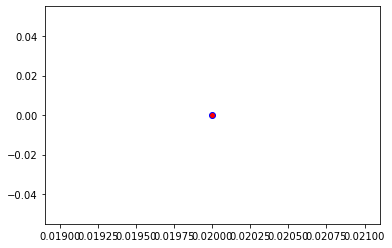

Crafting adversarial images took: 7.366886854171753 seconds 

Images classified as:
000000230450 704 = parking meter
000000230819 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


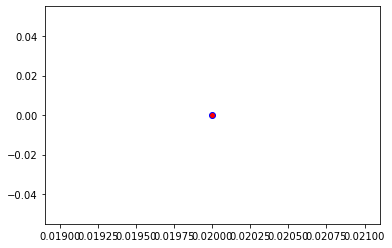

Crafting adversarial images took: 7.685307025909424 seconds 

Images classified as:
000000230983 843 = swing
000000230993 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


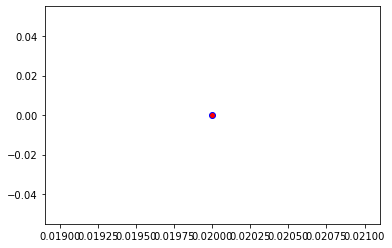

Crafting adversarial images took: 7.68540620803833 seconds 

Images classified as:
000000231088 879 = umbrella
000000231097 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 254.65518
Min values in image-array: 0.0 Max values in image-array: 0.99864775
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


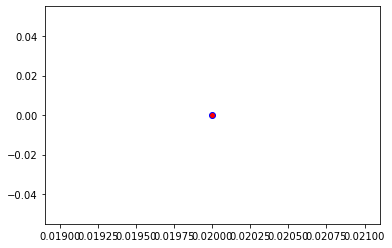

Crafting adversarial images took: 7.600748538970947 seconds 

Images classified as:
000000231125 415 = bakery
000000231169 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


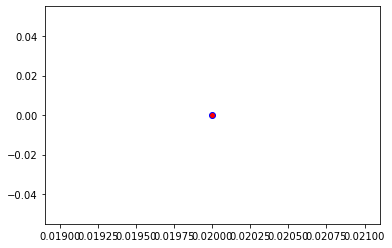

Crafting adversarial images took: 7.576510906219482 seconds 

Images classified as:
000000231237 883 = vase
000000231339 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


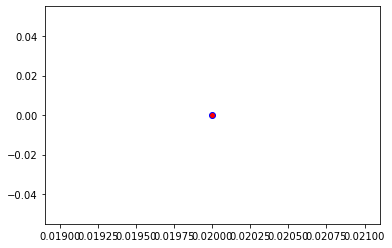

Crafting adversarial images took: 7.397230386734009 seconds 

Images classified as:
000000231508 981 = ballplayer
000000231527 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


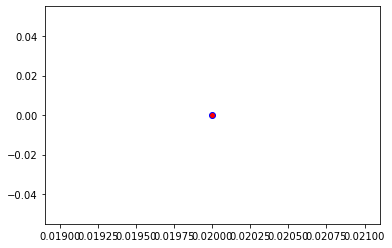

Crafting adversarial images took: 7.475191593170166 seconds 

Images classified as:
000000231549 884 = vault
000000231580 365 = orangutan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


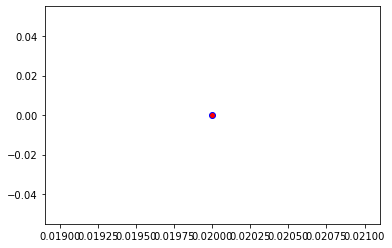

Crafting adversarial images took: 7.642268419265747 seconds 

Images classified as:
000000231747 495 = china cabinet
000000231822 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


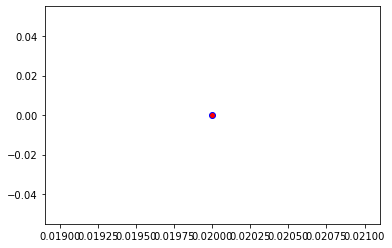

Crafting adversarial images took: 7.41570520401001 seconds 

Images classified as:
000000231831 223 = schipperke
000000231879 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


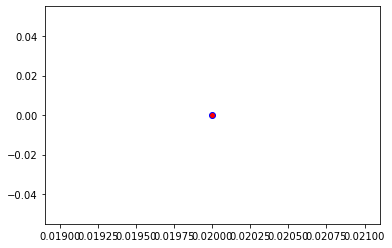

Crafting adversarial images took: 7.5188775062561035 seconds 

Images classified as:
000000232088 598 = home theater
000000232244 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


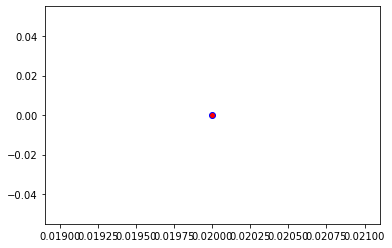

Crafting adversarial images took: 7.498663902282715 seconds 

Images classified as:
000000232348 859 = toaster
000000232489 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


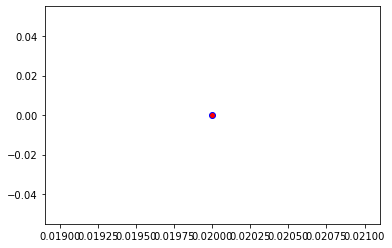

Crafting adversarial images took: 7.451154708862305 seconds 

Images classified as:
000000232538 829 = streetcar
000000232563 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


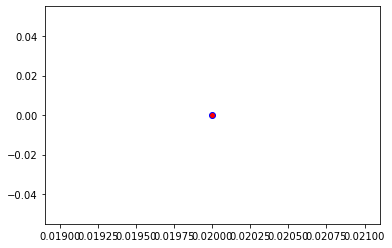

Crafting adversarial images took: 7.463702917098999 seconds 

Images classified as:
000000232646 919 = street sign
000000232649 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


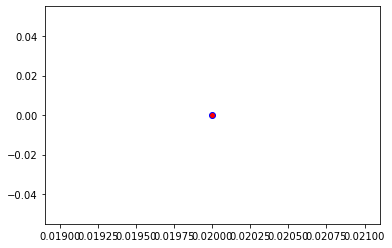

Crafting adversarial images took: 7.5716118812561035 seconds 

Images classified as:
000000232684 681 = notebook
000000232692 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


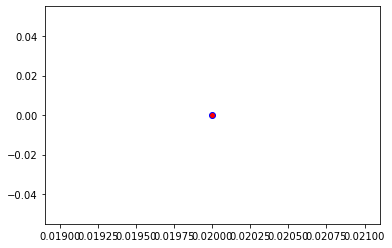

Crafting adversarial images took: 7.808419227600098 seconds 

Images classified as:
000000233033 706 = patio
000000233139 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


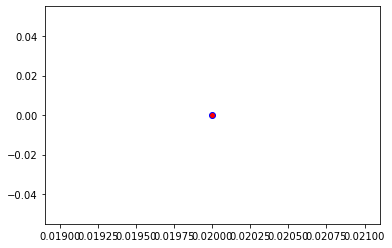

Crafting adversarial images took: 7.380532741546631 seconds 

Images classified as:
000000233238 582 = grocery store
000000233370 638 = maillot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


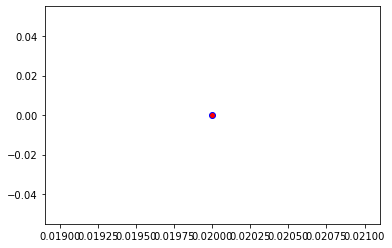

Crafting adversarial images took: 7.583162307739258 seconds 

Images classified as:
000000233567 346 = water buffalo
000000233727 874 = trolleybus
Min values in image-array: 5.784546 Max values in image-array: 255.0
Min values in image-array: 0.022684494 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


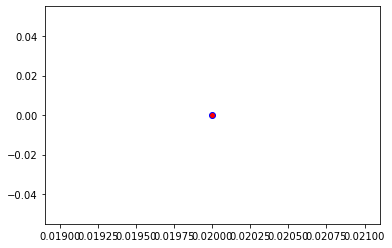

Crafting adversarial images took: 7.53106427192688 seconds 

Images classified as:
000000233771 879 = umbrella
000000233825 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


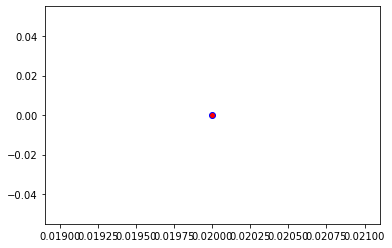

Crafting adversarial images took: 7.737256050109863 seconds 

Images classified as:
000000234366 442 = bell cote
000000234413 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


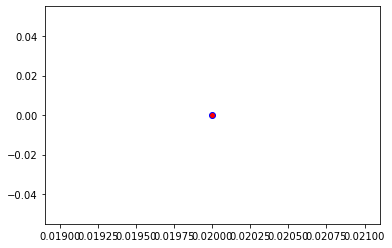

Crafting adversarial images took: 7.581404209136963 seconds 

Images classified as:
000000234526 355 = llama
000000234607 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


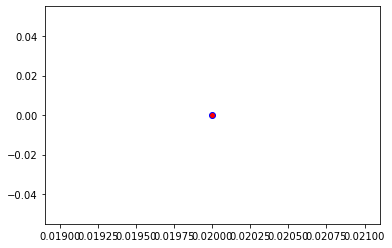

Crafting adversarial images took: 7.405290603637695 seconds 

Images classified as:
000000234660 466 = bullet train
000000234757 707 = pay-phone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


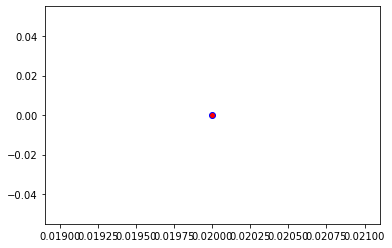

Crafting adversarial images took: 7.657257080078125 seconds 

Images classified as:
000000234779 933 = cheeseburger
000000234807 483 = castle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


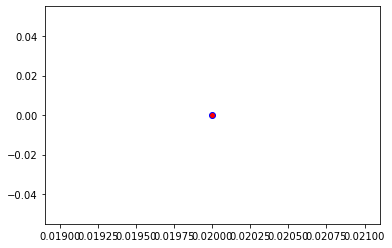

Crafting adversarial images took: 7.544817209243774 seconds 

Images classified as:
000000235057 290 = jaguar
000000235064 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


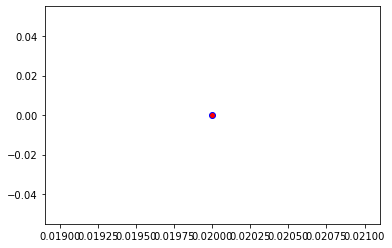

Crafting adversarial images took: 7.4759910106658936 seconds 

Images classified as:
000000235241 768 = rugby ball
000000235252 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


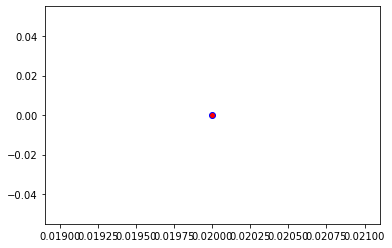

Crafting adversarial images took: 7.641704797744751 seconds 

Images classified as:
000000235399 675 = moving van
000000235778 645 = maypole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


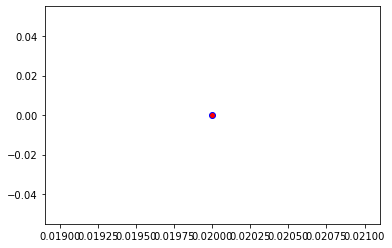

Crafting adversarial images took: 7.457568883895874 seconds 

Images classified as:
000000235784 248 = ski
000000235836 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


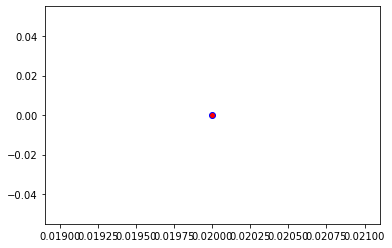

Crafting adversarial images took: 7.35156774520874 seconds 

Images classified as:
000000235857 339 = sorrel
000000236166 570 = gasmask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


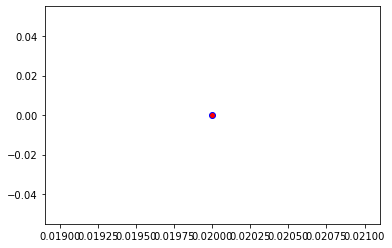

Crafting adversarial images took: 7.508634090423584 seconds 

Images classified as:
000000236308 248 = ski
000000236412 927 = trifle
Min values in image-array: 0.0 Max values in image-array: 252.57135
Min values in image-array: 0.0 Max values in image-array: 0.9904759
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


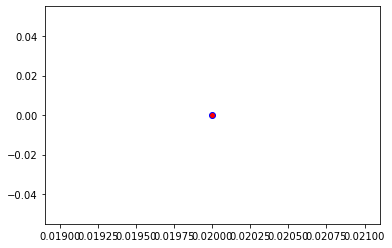

Crafting adversarial images took: 7.566938877105713 seconds 

Images classified as:
000000236426 752 = racket
000000236592 217 = English springer
Min values in image-array: 0.0 Max values in image-array: 254.99713
Min values in image-array: 0.0 Max values in image-array: 0.99998873
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


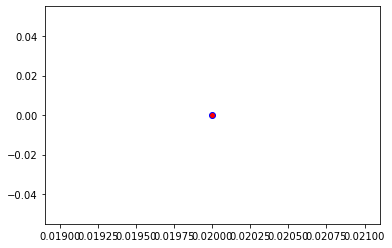

Crafting adversarial images took: 7.964051246643066 seconds 

Images classified as:
000000236599 417 = balloon
000000236690 132 = American egret
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


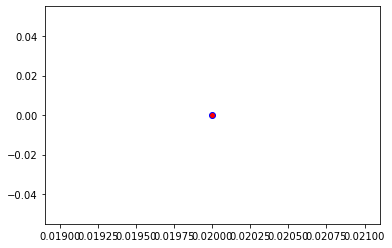

Crafting adversarial images took: 7.586469650268555 seconds 

Images classified as:
000000236721 868 = tray
000000236730 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


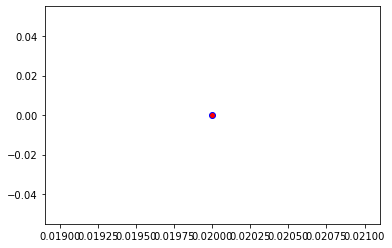

Crafting adversarial images took: 7.561777114868164 seconds 

Images classified as:
000000236784 209 = Chesapeake Bay retriever
000000236845 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


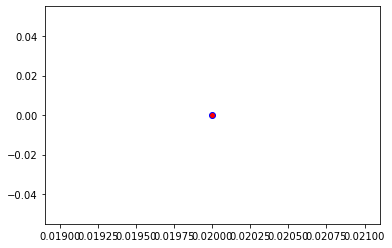

Crafting adversarial images took: 7.5397562980651855 seconds 

Images classified as:
000000236914 850 = teddy
000000237071 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


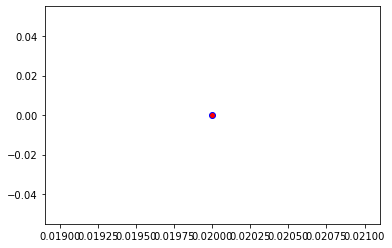

Crafting adversarial images took: 7.640215873718262 seconds 

Images classified as:
000000237118 457 = bow tie
000000237316 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


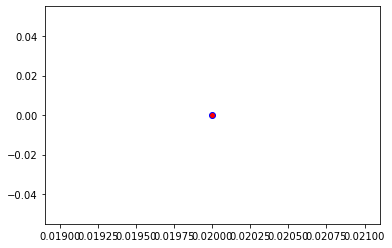

Crafting adversarial images took: 7.698631048202515 seconds 

Images classified as:
000000237517 461 = plate
000000237864 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


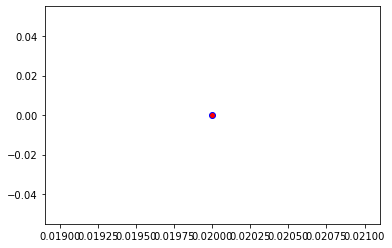

Crafting adversarial images took: 7.26395058631897 seconds 

Images classified as:
000000237928 651 = microwave
000000237984 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


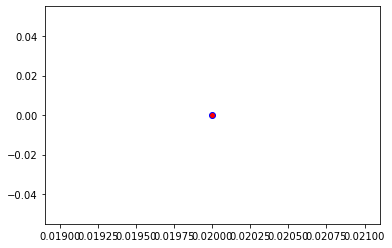

Crafting adversarial images took: 7.56183934211731 seconds 

Images classified as:
000000238013 752 = racket
000000238039 54 = hog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


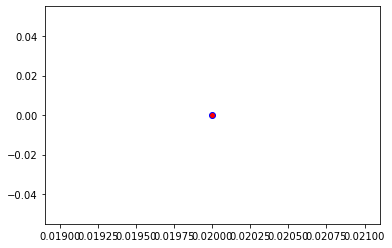

Crafting adversarial images took: 7.556310653686523 seconds 

Images classified as:
000000238410 559 = folding chair
000000238866 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


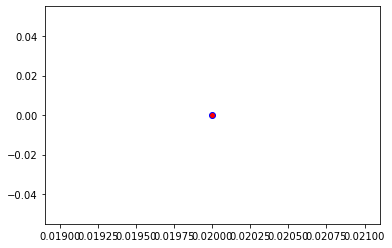

Crafting adversarial images took: 7.331391334533691 seconds 

Images classified as:
000000239041 648 = medicine chest
000000239274 484 = catamaran
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


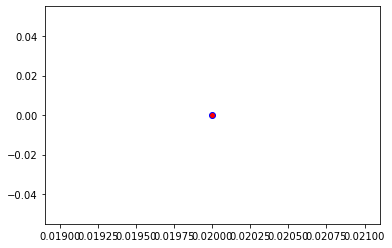

Crafting adversarial images took: 7.836289644241333 seconds 

Images classified as:
000000239318 620 = laptop
000000239347 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


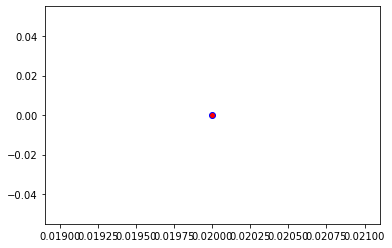

Crafting adversarial images took: 7.507161855697632 seconds 

Images classified as:
000000239537 752 = racket
000000239627 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


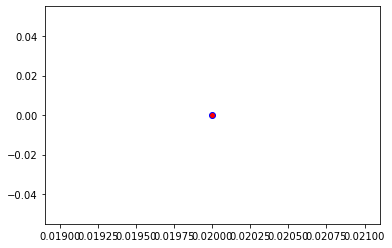

Crafting adversarial images took: 7.4452831745147705 seconds 

Images classified as:
000000239717 965 = burrito
000000239773 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


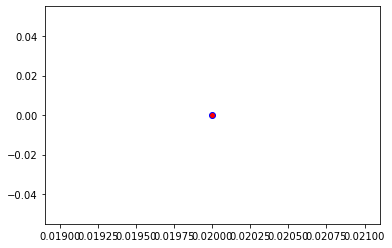

Crafting adversarial images took: 7.572213411331177 seconds 

Images classified as:
000000239843 919 = street sign
000000239857 915 = yurt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


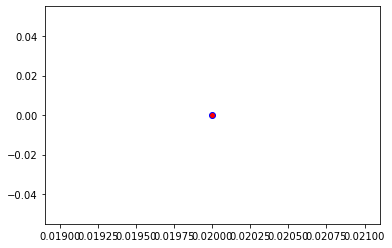

Crafting adversarial images took: 7.451372861862183 seconds 

Images classified as:
000000240023 752 = racket
000000240049 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


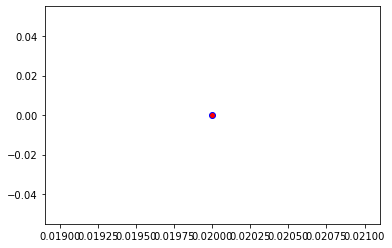

Crafting adversarial images took: 7.959504127502441 seconds 

Images classified as:
000000240250 963 = pizza
000000240754 54 = hog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


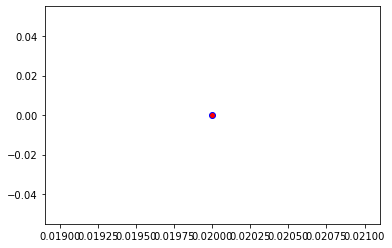

Crafting adversarial images took: 7.6564781665802 seconds 

Images classified as:
000000240767 919 = street sign
000000240940 548 = entertainment center
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


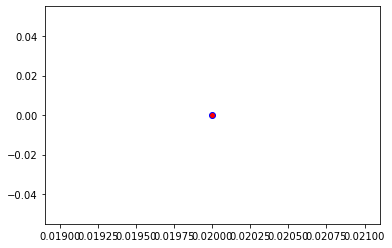

Crafting adversarial images took: 7.4966607093811035 seconds 

Images classified as:
000000241297 547 = electric locomotive
000000241319 749 = quill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


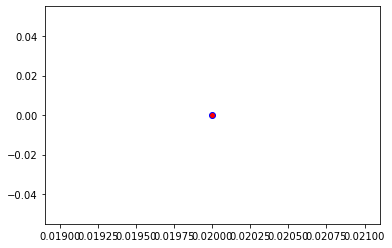

Crafting adversarial images took: 7.540426015853882 seconds 

Images classified as:
000000241326 750 = quilt
000000241602 406 = altar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


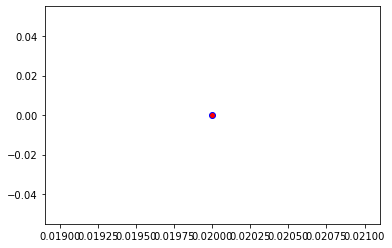

Crafting adversarial images took: 7.661072492599487 seconds 

Images classified as:
000000241668 903 = wig
000000241677 275 = African hunting dog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


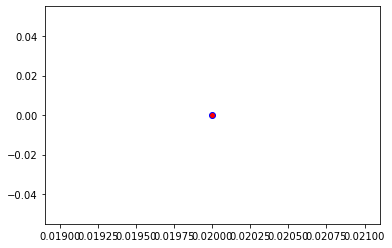

Crafting adversarial images took: 7.66938042640686 seconds 

Images classified as:
000000242060 868 = tray
000000242287 884 = vault
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


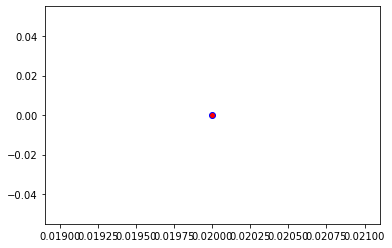

Crafting adversarial images took: 7.43510365486145 seconds 

Images classified as:
000000242411 442 = bell cote
000000242678 595 = harvester
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


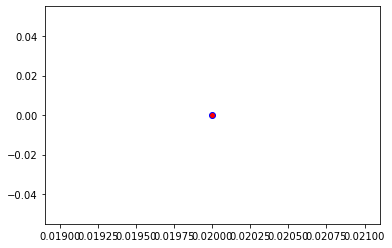

Crafting adversarial images took: 7.435847282409668 seconds 

Images classified as:
000000242724 6 = stingray
000000242934 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


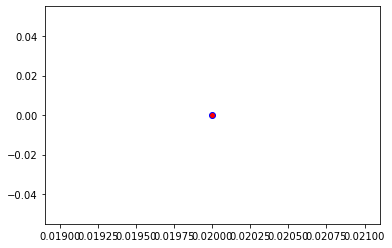

Crafting adversarial images took: 7.609219074249268 seconds 

Images classified as:
000000242946 461 = plate
000000243034 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


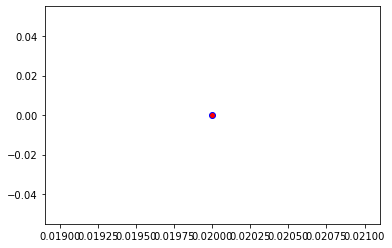

Crafting adversarial images took: 7.3713531494140625 seconds 

Images classified as:
000000243075 296 = ice bear
000000243148 796 = ski mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


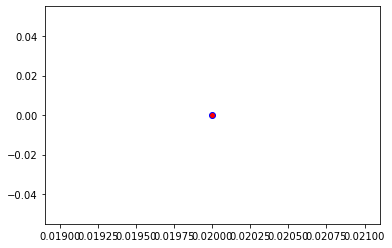

Crafting adversarial images took: 7.713553190231323 seconds 

Images classified as:
000000243199 681 = notebook
000000243204 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


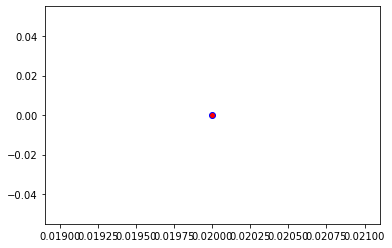

Crafting adversarial images took: 7.4369423389434814 seconds 

Images classified as:
000000243344 894 = wardrobe
000000243495 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


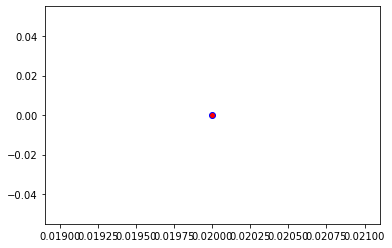

Crafting adversarial images took: 7.385038375854492 seconds 

Images classified as:
000000243626 962 = meat loaf
000000243867 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


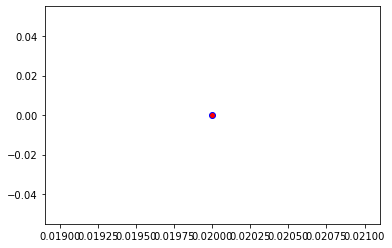

Crafting adversarial images took: 7.716202259063721 seconds 

Images classified as:
000000243989 862 = torch
000000244019 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


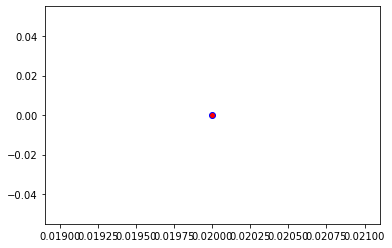

Crafting adversarial images took: 7.465437889099121 seconds 

Images classified as:
000000244099 354 = Arabian camel
000000244181 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 250.69456
Min values in image-array: 0.0 Max values in image-array: 0.9831159
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


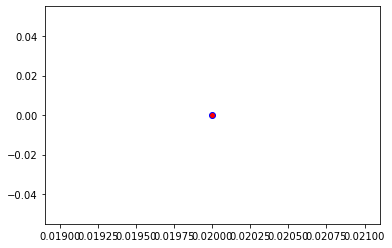

Crafting adversarial images took: 7.804411888122559 seconds 

Images classified as:
000000244379 920 = traffic light
000000244411 346 = water buffalo
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


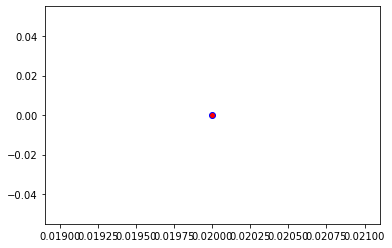

Crafting adversarial images took: 7.83579421043396 seconds 

Images classified as:
000000244496 639 = suit
000000244592 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


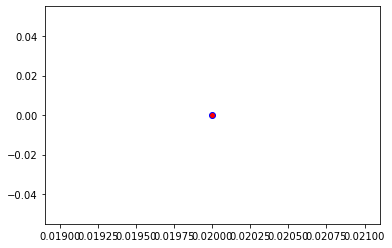

Crafting adversarial images took: 7.5054566860198975 seconds 

Images classified as:
000000244750 647 = measuring cup
000000244833 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


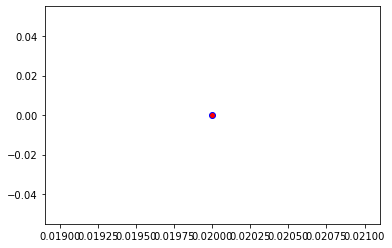

Crafting adversarial images took: 7.619866847991943 seconds 

Images classified as:
000000245026 606 = iron
000000245102 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


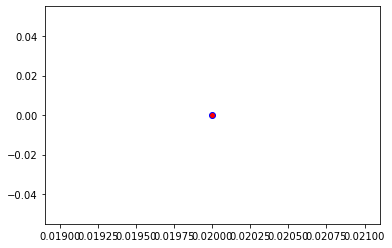

Crafting adversarial images took: 7.705542802810669 seconds 

Images classified as:
000000245173 442 = bell cote
000000245311 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


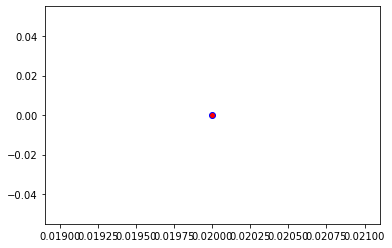

Crafting adversarial images took: 7.517323017120361 seconds 

Images classified as:
000000245320 88 = macaw
000000245448 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


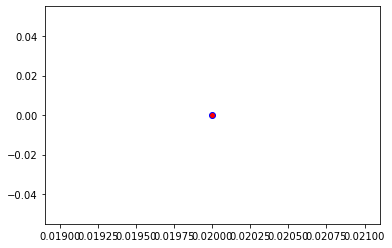

Crafting adversarial images took: 7.396493911743164 seconds 

Images classified as:
000000245513 293 = cheetah
000000245576 508 = computer keyboard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


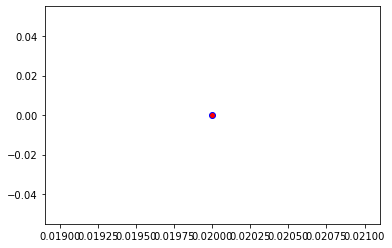

Crafting adversarial images took: 7.566206693649292 seconds 

Images classified as:
000000245651 673 = mouse
000000245764 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 254.8414
Min values in image-array: 0.0 Max values in image-array: 0.999378
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


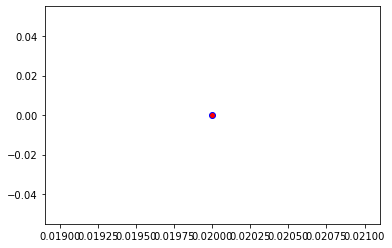

Crafting adversarial images took: 7.741862773895264 seconds 

Images classified as:
000000245915 386 = African elephant
000000246308 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


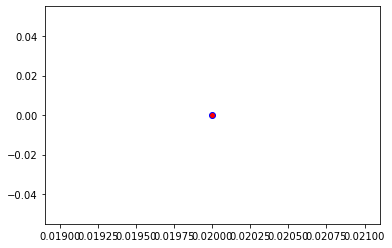

Crafting adversarial images took: 7.365070343017578 seconds 

Images classified as:
000000246436 963 = pizza
000000246454 180 = American Staffordshire terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


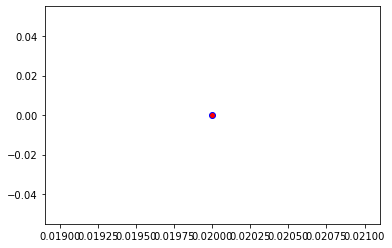

Crafting adversarial images took: 7.5901267528533936 seconds 

Images classified as:
000000246522 442 = bell cote
000000246883 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 254.96317
Min values in image-array: 0.0 Max values in image-array: 0.9998556
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


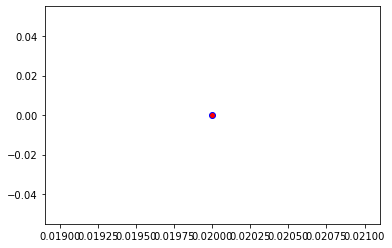

Crafting adversarial images took: 7.435056209564209 seconds 

Images classified as:
000000246963 573 = go-kart
000000246968 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


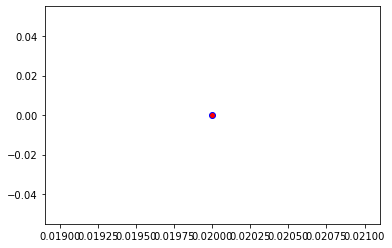

Crafting adversarial images took: 7.400735139846802 seconds 

Images classified as:
000000247806 497 = church
000000247838 537 = dogsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


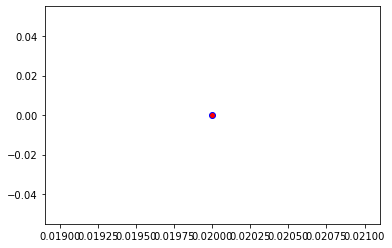

Crafting adversarial images took: 7.554763555526733 seconds 

Images classified as:
000000247917 981 = ballplayer
000000248111 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


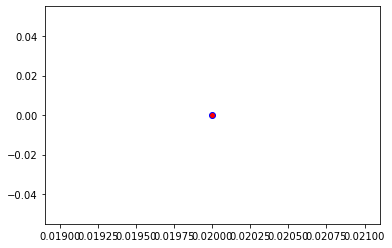

Crafting adversarial images took: 7.429141283035278 seconds 

Images classified as:
000000248112 752 = racket
000000248284 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


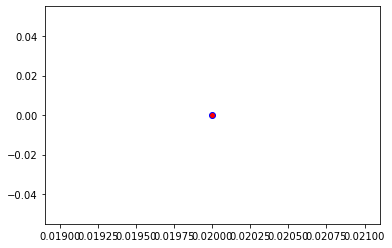

Crafting adversarial images took: 7.983929395675659 seconds 

Images classified as:
000000248314 673 = mouse
000000248334 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


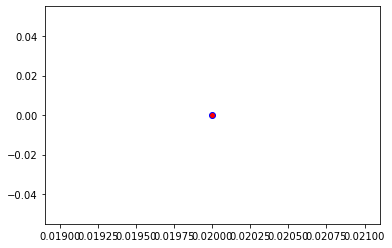

Crafting adversarial images took: 7.545545339584351 seconds 

Images classified as:
000000248400 963 = pizza
000000248616 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


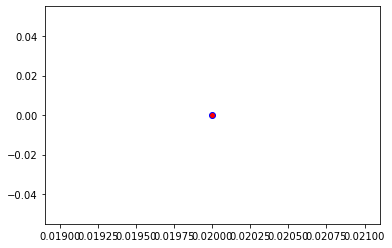

Crafting adversarial images took: 7.724841833114624 seconds 

Images classified as:
000000248631 673 = mouse
000000248752 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


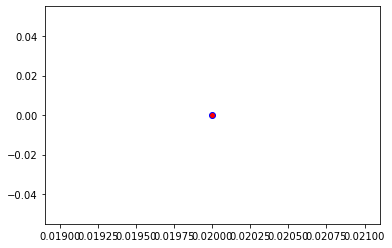

Crafting adversarial images took: 7.521050214767456 seconds 

Images classified as:
000000248810 354 = Arabian camel
000000248980 924 = guacamole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


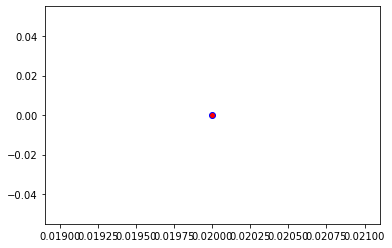

Crafting adversarial images took: 7.752163648605347 seconds 

Images classified as:
000000249025 883 = vase
000000249129 865 = toyshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


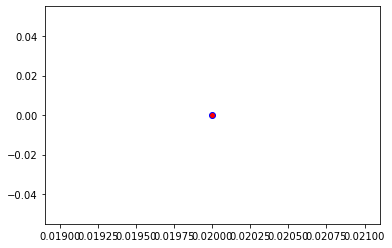

Crafting adversarial images took: 7.575744152069092 seconds 

Images classified as:
000000249180 421 = bannister
000000249219 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


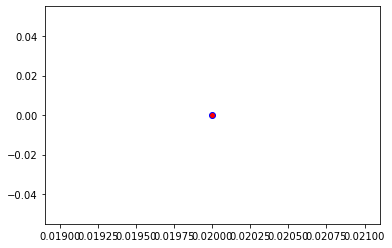

Crafting adversarial images took: 7.414626359939575 seconds 

Images classified as:
000000249550 750 = quilt
000000249643 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


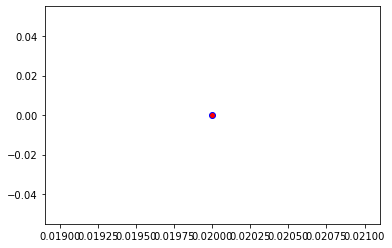

Crafting adversarial images took: 7.875622272491455 seconds 

Images classified as:
000000249786 140 = alp
000000250127 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


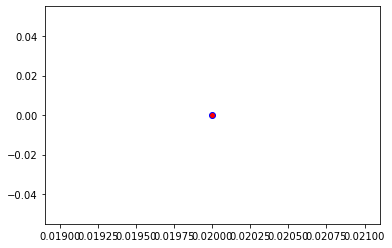

Crafting adversarial images took: 7.604148864746094 seconds 

Images classified as:
000000250137 862 = torch
000000250205 146 = albatross
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


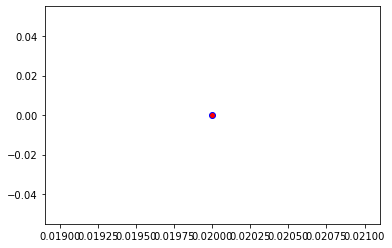

Crafting adversarial images took: 7.44538688659668 seconds 

Images classified as:
000000250282 652 = military uniform
000000250619 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 254.96658
Min values in image-array: 0.0 Max values in image-array: 0.9998689
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


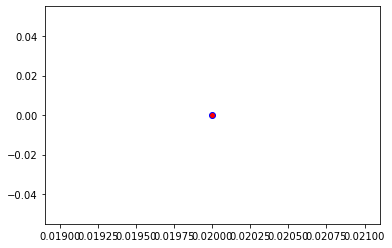

Crafting adversarial images took: 7.54184627532959 seconds 

Images classified as:
000000250758 340 = zebra
000000250766 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


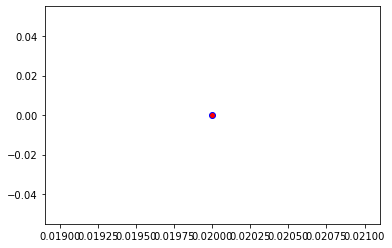

Crafting adversarial images took: 7.417131423950195 seconds 

Images classified as:
000000250901 452 = bonnet
000000251065 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


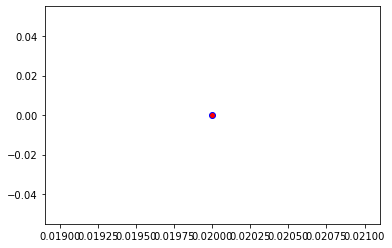

Crafting adversarial images took: 7.435950517654419 seconds 

Images classified as:
000000251119 930 = French loaf
000000251140 921 = book jacket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


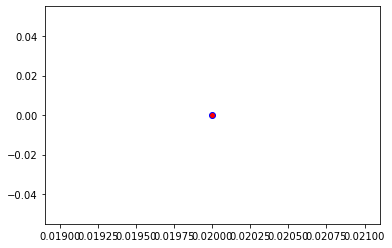

Crafting adversarial images took: 7.438971042633057 seconds 

Images classified as:
000000251537 618 = ladle
000000251572 215 = Brittany spaniel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


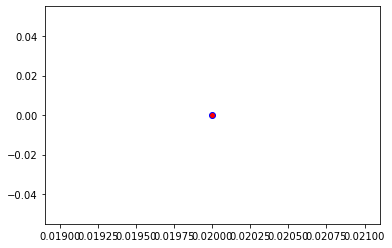

Crafting adversarial images took: 7.4014832973480225 seconds 

Images classified as:
000000251824 691 = oxygen mask
000000252216 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


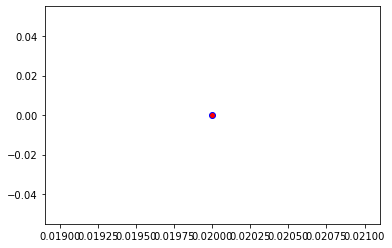

Crafting adversarial images took: 8.051889896392822 seconds 

Images classified as:
000000252219 358 = pole
000000252294 116 = cradle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


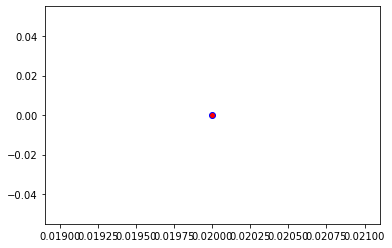

Crafting adversarial images took: 7.537507057189941 seconds 

Images classified as:
000000252332 919 = street sign
000000252507 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


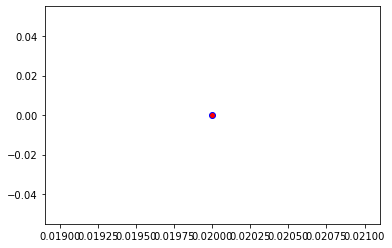

Crafting adversarial images took: 7.5143609046936035 seconds 

Images classified as:
000000252559 442 = bell cote
000000252701 26 = gar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


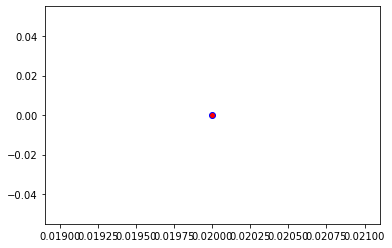

Crafting adversarial images took: 7.667957067489624 seconds 

Images classified as:
000000252716 649 = megalith
000000252776 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


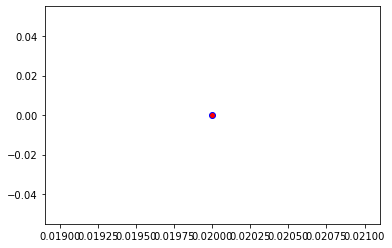

Crafting adversarial images took: 7.695852994918823 seconds 

Images classified as:
000000253002 874 = trolleybus
000000253386 234 = Rottweiler
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


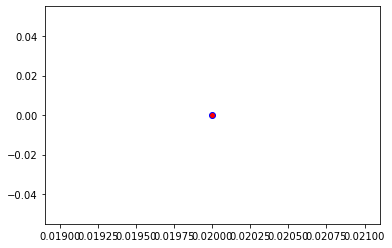

Crafting adversarial images took: 7.548211336135864 seconds 

Images classified as:
000000253433 850 = teddy
000000253452 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


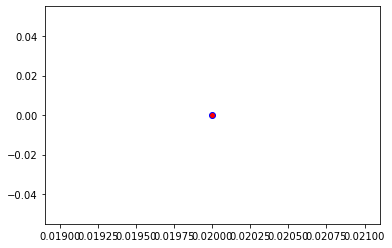

Crafting adversarial images took: 7.531800985336304 seconds 

Images classified as:
000000253695 981 = ballplayer
000000253742 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


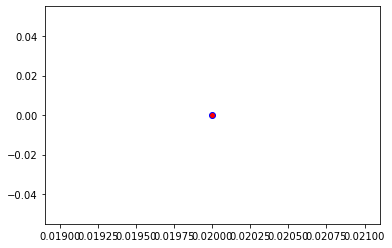

Crafting adversarial images took: 7.5158727169036865 seconds 

Images classified as:
000000253819 880 = unicycle
000000253835 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


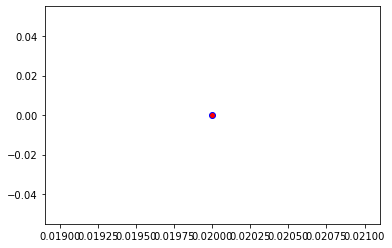

Crafting adversarial images took: 7.939140796661377 seconds 

Images classified as:
000000254016 415 = bakery
000000254368 116 = cradle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


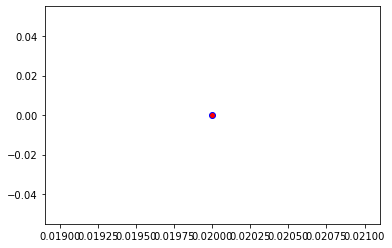

Crafting adversarial images took: 7.555245637893677 seconds 

Images classified as:
000000254516 981 = ballplayer
000000254814 757 = recreational vehicle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


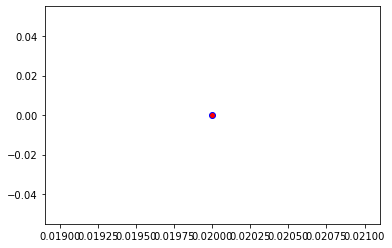

Crafting adversarial images took: 7.490278244018555 seconds 

Images classified as:
000000255165 556 = screen
000000255401 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


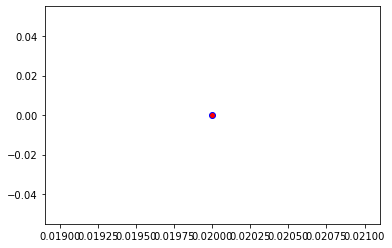

Crafting adversarial images took: 7.4502880573272705 seconds 

Images classified as:
000000255483 549 = envelope
000000255536 706 = patio
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


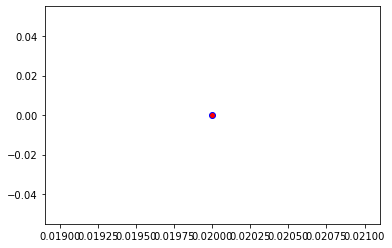

Crafting adversarial images took: 7.579463243484497 seconds 

Images classified as:
000000255664 209 = Chesapeake Bay retriever
000000255718 562 = fountain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


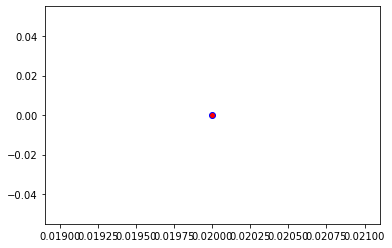

Crafting adversarial images took: 7.615478038787842 seconds 

Images classified as:
000000255747 461 = plate
000000255749 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


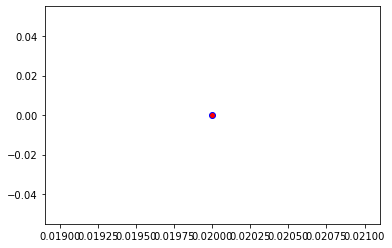

Crafting adversarial images took: 7.4670610427856445 seconds 

Images classified as:
000000255824 965 = burrito
000000255912 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


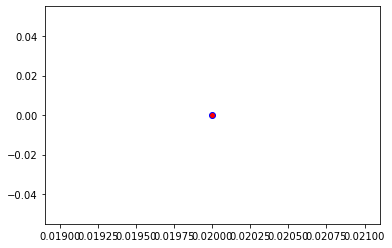

Crafting adversarial images took: 7.895747900009155 seconds 

Images classified as:
000000255917 874 = trolleybus
000000255965 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


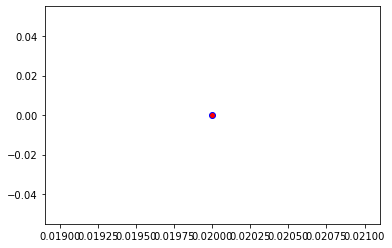

Crafting adversarial images took: 7.62491250038147 seconds 

Images classified as:
000000256192 670 = motor scooter
000000256195 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


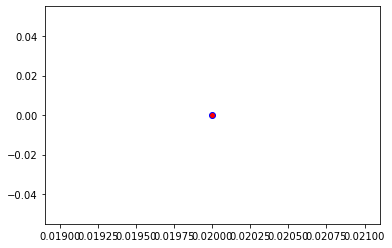

Crafting adversarial images took: 7.486068248748779 seconds 

Images classified as:
000000256407 793 = shower cap
000000256518 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


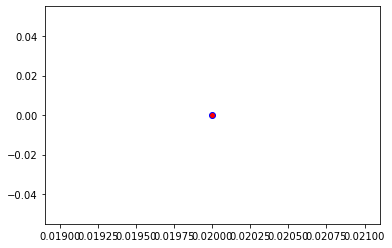

Crafting adversarial images took: 7.720174074172974 seconds 

Images classified as:
000000256775 701 = parachute
000000256868 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


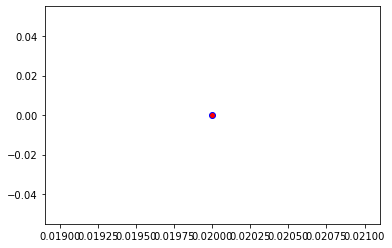

Crafting adversarial images took: 7.812992095947266 seconds 

Images classified as:
000000256916 963 = pizza
000000256941 538 = dome
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


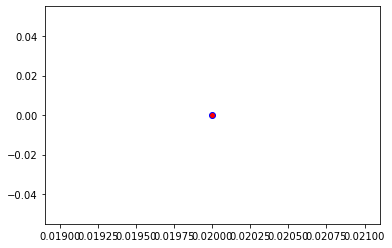

Crafting adversarial images took: 7.586958646774292 seconds 

Images classified as:
000000257084 751 = racer
000000257169 589 = hand blower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


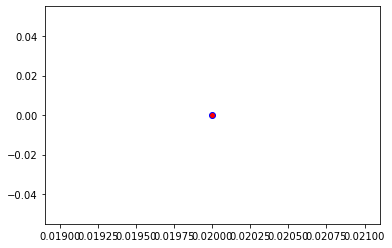

Crafting adversarial images took: 7.772114276885986 seconds 

Images classified as:
000000257370 851 = television
000000257478 981 = ballplayer
Min values in image-array: 0.44210815 Max values in image-array: 255.0
Min values in image-array: 0.0017337574 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


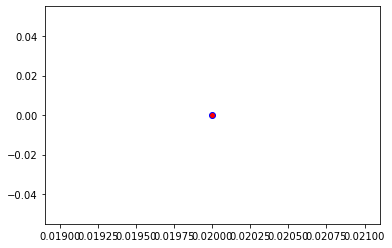

Crafting adversarial images took: 7.476353406906128 seconds 

Images classified as:
000000257566 67 = dam
000000257624 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


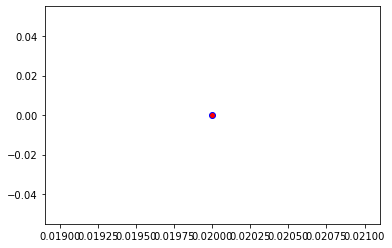

Crafting adversarial images took: 7.4638142585754395 seconds 

Images classified as:
000000257865 752 = racket
000000257896 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


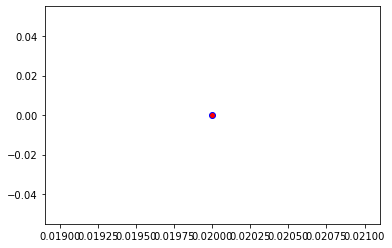

Crafting adversarial images took: 7.536269903182983 seconds 

Images classified as:
000000258388 862 = torch
000000258541 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


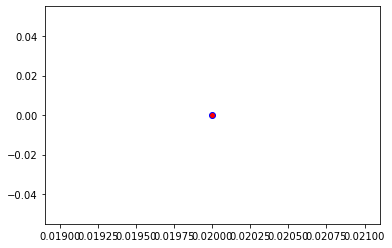

Crafting adversarial images took: 7.474431276321411 seconds 

Images classified as:
000000258793 920 = traffic light
000000258883 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


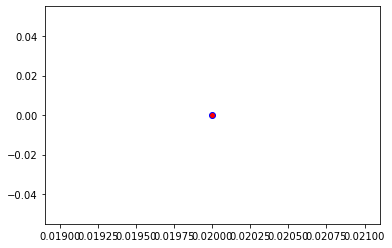

Crafting adversarial images took: 7.431310415267944 seconds 

Images classified as:
000000258911 225 = malinois
000000259097 437 = beacon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


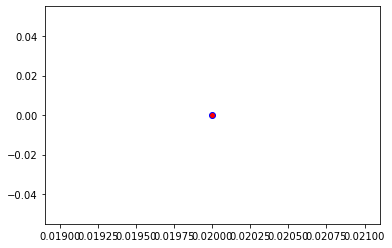

Crafting adversarial images took: 7.500794887542725 seconds 

Images classified as:
000000259382 176 = gazelle
000000259571 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


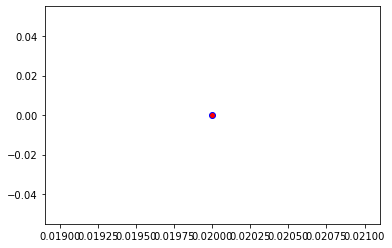

Crafting adversarial images took: 7.471055269241333 seconds 

Images classified as:
000000259597 762 = restaurant
000000259625 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


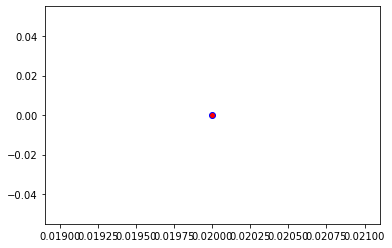

Crafting adversarial images took: 7.5113420486450195 seconds 

Images classified as:
000000259640 880 = unicycle
000000259690 621 = lawn mower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


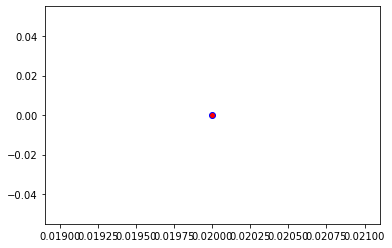

Crafting adversarial images took: 8.131512641906738 seconds 

Images classified as:
000000259830 612 = jinrikisha
000000259854 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


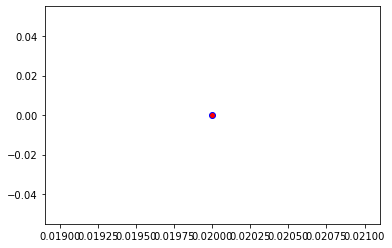

Crafting adversarial images took: 7.507199048995972 seconds 

Images classified as:
000000260105 928 = ice cream
000000260106 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


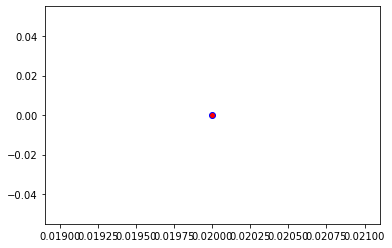

Crafting adversarial images took: 7.455845594406128 seconds 

Images classified as:
000000260261 950 = orange
000000260266 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


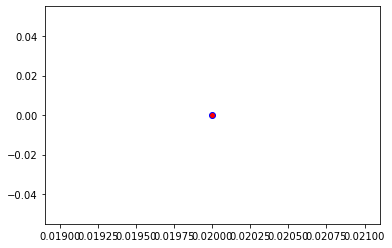

Crafting adversarial images took: 7.6297502517700195 seconds 

Images classified as:
000000260470 415 = bakery
000000260657 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


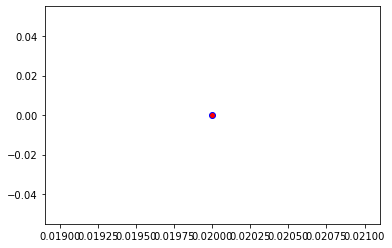

Crafting adversarial images took: 7.7957704067230225 seconds 

Images classified as:
000000260925 284 = Siamese cat
000000261036 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


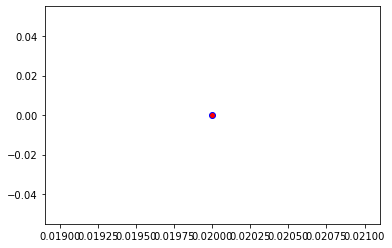

Crafting adversarial images took: 7.570704221725464 seconds 

Images classified as:
000000261061 456 = bow
000000261097 430 = basketball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


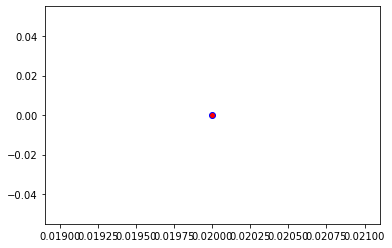

Crafting adversarial images took: 7.636922597885132 seconds 

Images classified as:
000000261116 868 = tray
000000261161 239 = Bernese mountain dog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


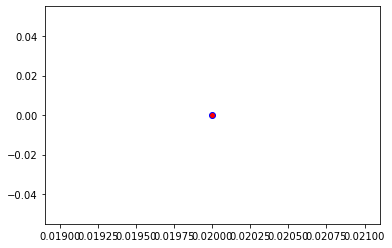

Crafting adversarial images took: 7.412341117858887 seconds 

Images classified as:
000000261318 612 = jinrikisha
000000261535 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


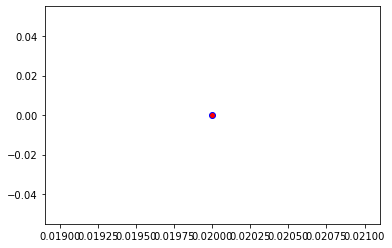

Crafting adversarial images took: 7.5462117195129395 seconds 

Images classified as:
000000261706 263 = Pembroke
000000261712 9 = ostrich
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


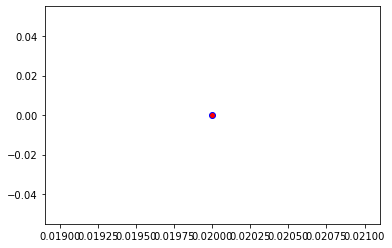

Crafting adversarial images took: 7.388395547866821 seconds 

Images classified as:
000000261732 752 = racket
000000261796 716 = picket fence
Min values in image-array: 0.08703477 Max values in image-array: 255.0
Min values in image-array: 0.0003413128 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


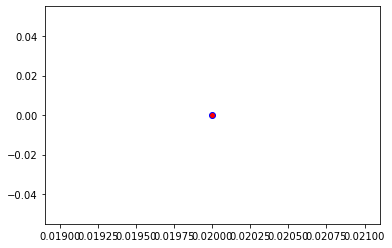

Crafting adversarial images took: 7.740347146987915 seconds 

Images classified as:
000000261888 671 = mountain bike
000000261982 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


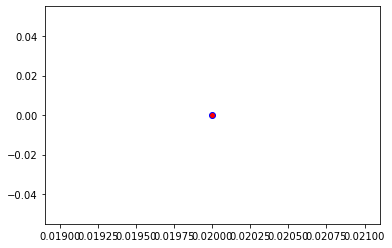

Crafting adversarial images took: 7.485635042190552 seconds 

Images classified as:
000000262048 879 = umbrella
000000262227 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


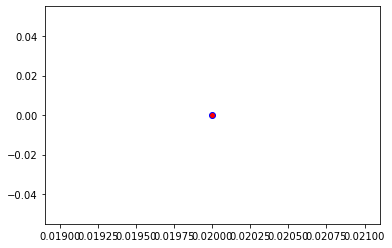

Crafting adversarial images took: 7.682925701141357 seconds 

Images classified as:
000000262440 435 = bathtub
000000262487 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


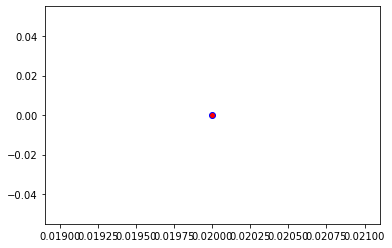

Crafting adversarial images took: 7.5378806591033936 seconds 

Images classified as:
000000262587 974 = geyser
000000262631 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


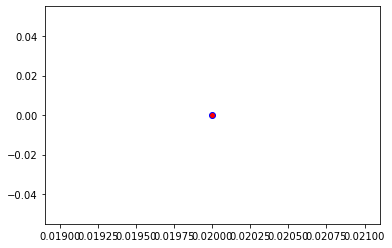

Crafting adversarial images took: 7.53468656539917 seconds 

Images classified as:
000000262682 651 = microwave
000000262895 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


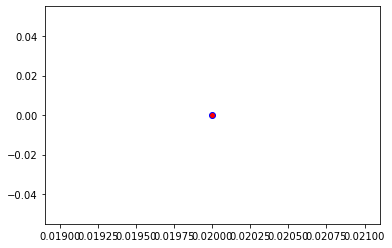

Crafting adversarial images took: 8.117578983306885 seconds 

Images classified as:
000000262938 850 = teddy
000000263068 456 = bow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


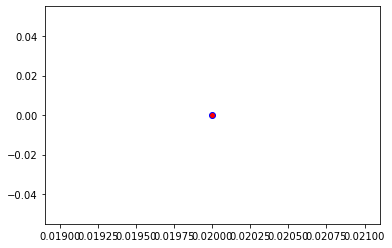

Crafting adversarial images took: 7.849323749542236 seconds 

Images classified as:
000000263299 779 = school bus
000000263403 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


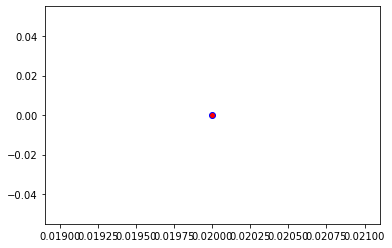

Crafting adversarial images took: 7.425795793533325 seconds 

Images classified as:
000000263425 410 = apiary
000000263463 475 = car mirror
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


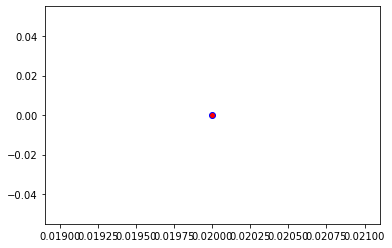

Crafting adversarial images took: 7.8109776973724365 seconds 

Images classified as:
000000263474 861 = toilet seat
000000263594 656 = minivan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


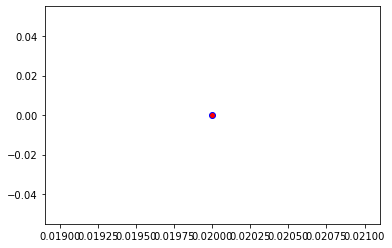

Crafting adversarial images took: 7.68356466293335 seconds 

Images classified as:
000000263644 564 = four-poster
000000263679 417 = balloon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


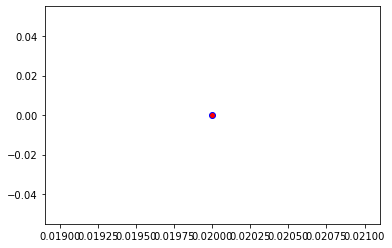

Crafting adversarial images took: 7.789406061172485 seconds 

Images classified as:
000000263796 634 = lumbermill
000000263860 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


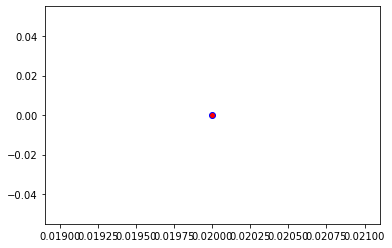

Crafting adversarial images took: 7.628023386001587 seconds 

Images classified as:
000000263966 101 = tusker
000000263969 499 = cleaver
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


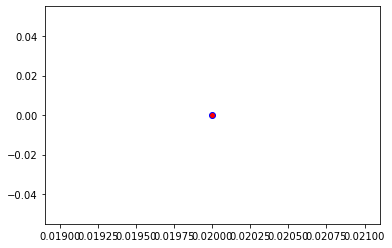

Crafting adversarial images took: 7.504841089248657 seconds 

Images classified as:
000000264335 21 = kite
000000264441 283 = Persian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


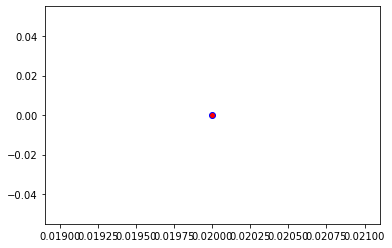

Crafting adversarial images took: 7.39639139175415 seconds 

Images classified as:
000000264535 703 = park bench
000000264968 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


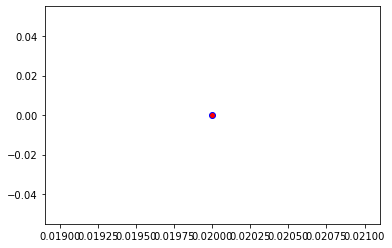

Crafting adversarial images took: 7.678630590438843 seconds 

Images classified as:
000000265108 417 = balloon
000000265518 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


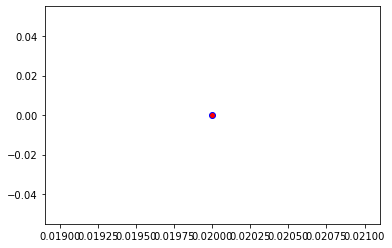

Crafting adversarial images took: 7.624184608459473 seconds 

Images classified as:
000000265777 963 = pizza
000000265816 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


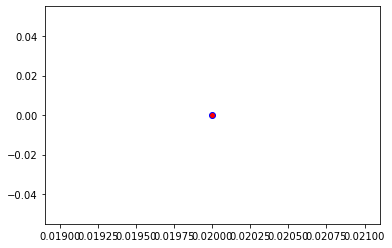

Crafting adversarial images took: 7.516867637634277 seconds 

Images classified as:
000000266082 442 = bell cote
000000266206 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


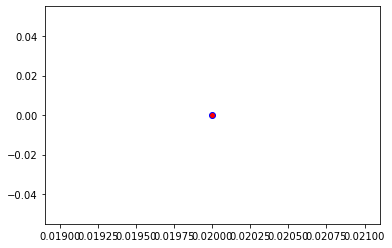

Crafting adversarial images took: 7.583132266998291 seconds 

Images classified as:
000000266400 670 = motor scooter
000000266409 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


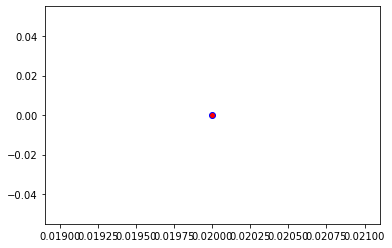

Crafting adversarial images took: 7.551831007003784 seconds 

Images classified as:
000000266768 756 = rain barrel
000000266892 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


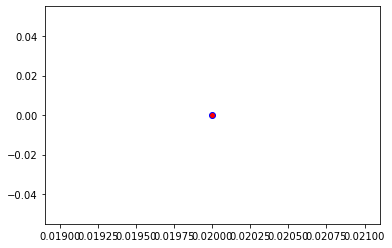

Crafting adversarial images took: 7.336395978927612 seconds 

Images classified as:
000000266981 557 = flagpole
000000267169 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


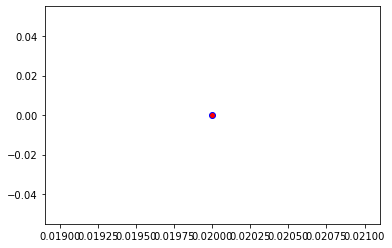

Crafting adversarial images took: 8.057086944580078 seconds 

Images classified as:
000000267191 386 = African elephant
000000267300 172 = whippet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


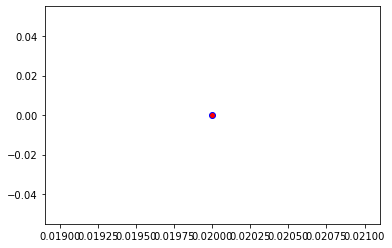

Crafting adversarial images took: 7.763132572174072 seconds 

Images classified as:
000000267351 442 = bell cote
000000267434 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


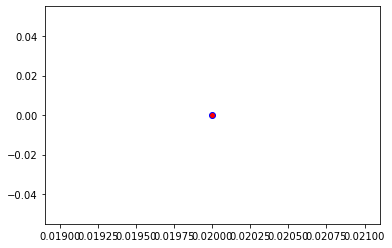

Crafting adversarial images took: 7.546979665756226 seconds 

Images classified as:
000000267537 702 = parallel bars
000000267670 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


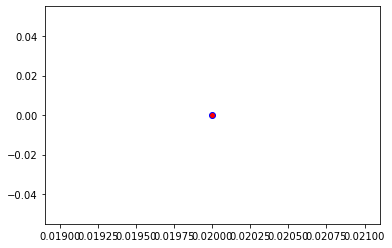

Crafting adversarial images took: 7.664261102676392 seconds 

Images classified as:
000000267903 896 = washbasin
000000267933 958 = hay
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


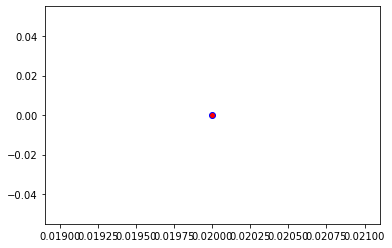

Crafting adversarial images took: 7.625178098678589 seconds 

Images classified as:
000000267940 404 = liner
000000267946 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


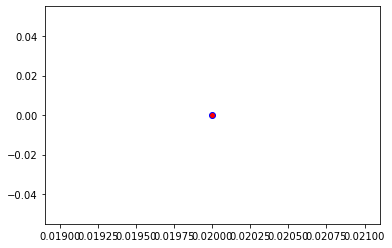

Crafting adversarial images took: 7.342356204986572 seconds 

Images classified as:
000000268000 821 = steel arch bridge
000000268375 385 = Indian elephant
Min values in image-array: 0.33291686 Max values in image-array: 255.0
Min values in image-array: 0.0013055563 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


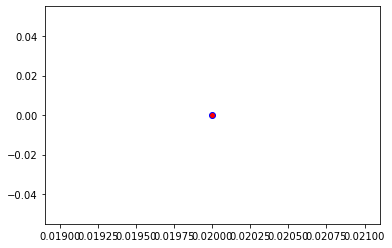

Crafting adversarial images took: 8.048835039138794 seconds 

Images classified as:
000000268378 731 = plunger
000000268729 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


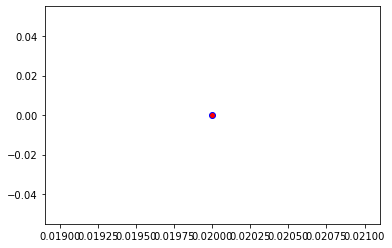

Crafting adversarial images took: 7.556060075759888 seconds 

Images classified as:
000000268831 861 = toilet seat
000000268996 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


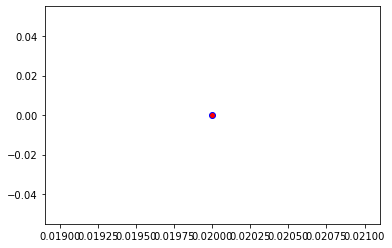

Crafting adversarial images took: 7.3555238246917725 seconds 

Images classified as:
000000269113 172 = whippet
000000269121 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


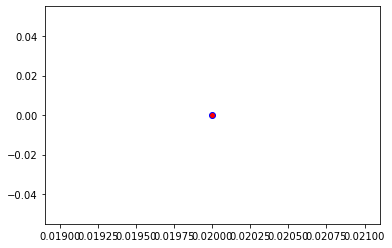

Crafting adversarial images took: 7.729607343673706 seconds 

Images classified as:
000000269196 270 = white wolf
000000269314 94 = hummingbird
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


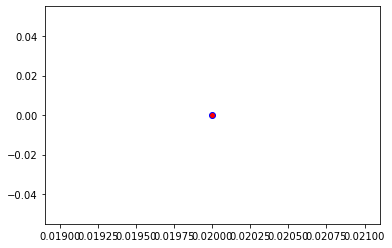

Crafting adversarial images took: 7.4986326694488525 seconds 

Images classified as:
000000269316 768 = rugby ball
000000269632 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


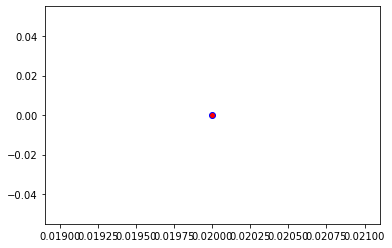

Crafting adversarial images took: 7.473672151565552 seconds 

Images classified as:
000000269682 920 = traffic light
000000269866 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


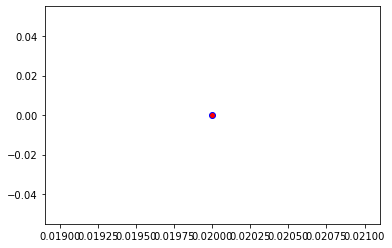

Crafting adversarial images took: 7.703235626220703 seconds 

Images classified as:
000000269932 583 = guillotine
000000269942 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


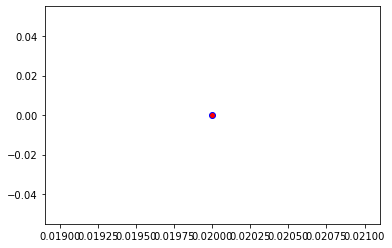

Crafting adversarial images took: 7.536915302276611 seconds 

Images classified as:
000000270066 665 = moped
000000270122 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


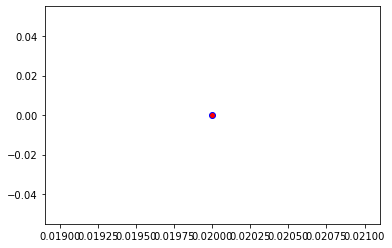

Crafting adversarial images took: 7.5289411544799805 seconds 

Images classified as:
000000270244 340 = zebra
000000270297 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


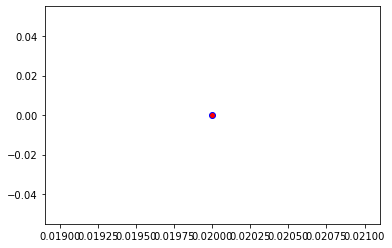

Crafting adversarial images took: 7.94768214225769 seconds 

Images classified as:
000000270386 919 = street sign
000000270402 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


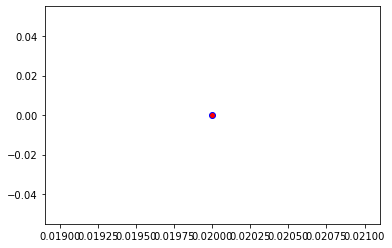

Crafting adversarial images took: 7.809163808822632 seconds 

Images classified as:
000000270474 522 = croquet ball
000000270677 610 = jersey
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


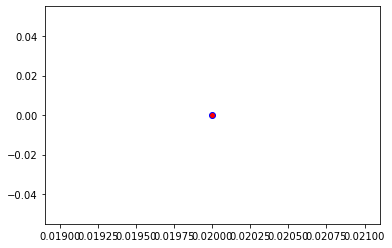

Crafting adversarial images took: 7.473469018936157 seconds 

Images classified as:
000000270705 21 = kite
000000270883 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


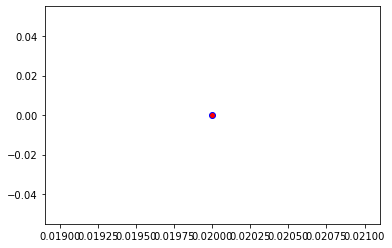

Crafting adversarial images took: 7.6626808643341064 seconds 

Images classified as:
000000270908 752 = racket
000000271116 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


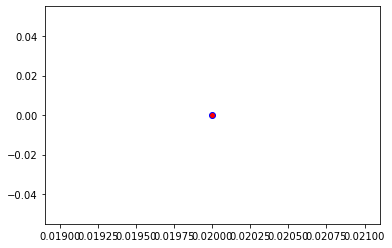

Crafting adversarial images took: 7.535476446151733 seconds 

Images classified as:
000000271402 870 = tricycle
000000271457 67 = dam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


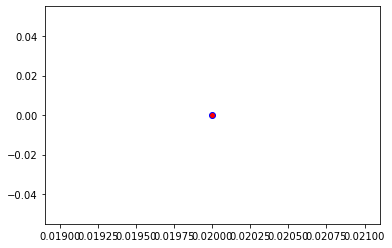

Crafting adversarial images took: 7.642167329788208 seconds 

Images classified as:
000000271471 954 = banana
000000271728 263 = Pembroke
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


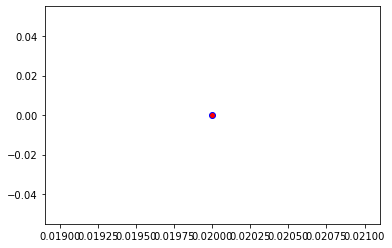

Crafting adversarial images took: 7.661792516708374 seconds 

Images classified as:
000000271997 639 = suit
000000272049 856 = thresher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


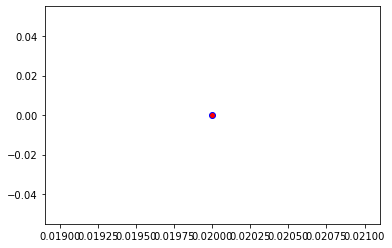

Crafting adversarial images took: 7.436626434326172 seconds 

Images classified as:
000000272136 895 = warplane
000000272148 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


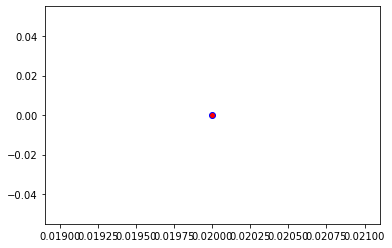

Crafting adversarial images took: 7.610499858856201 seconds 

Images classified as:
000000272212 354 = Arabian camel
000000272364 62 = rock python
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


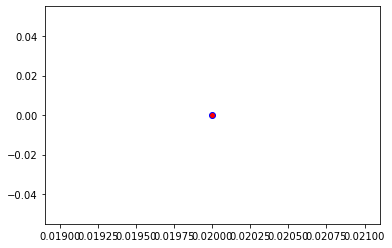

Crafting adversarial images took: 7.61637282371521 seconds 

Images classified as:
000000272416 861 = toilet seat
000000272566 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


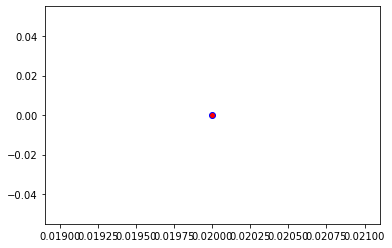

Crafting adversarial images took: 7.469905853271484 seconds 

Images classified as:
000000273132 621 = lawn mower
000000273198 202 = soft-coated wheaten terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


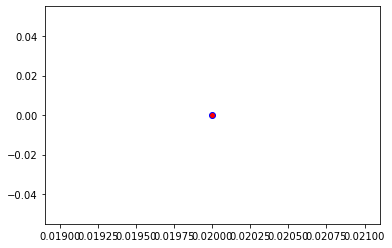

Crafting adversarial images took: 7.525511741638184 seconds 

Images classified as:
000000273232 978 = seashore
000000273420 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


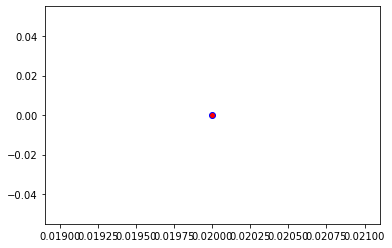

Crafting adversarial images took: 7.676664590835571 seconds 

Images classified as:
000000273493 752 = racket
000000273551 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


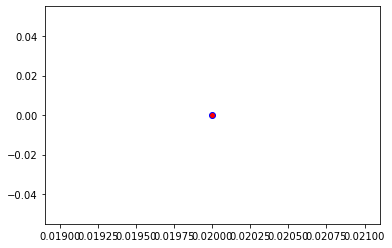

Crafting adversarial images took: 7.539994478225708 seconds 

Images classified as:
000000273617 358 = pole
000000273642 264 = Cardigan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


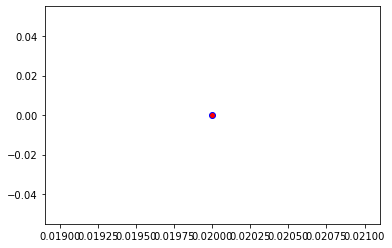

Crafting adversarial images took: 7.400393724441528 seconds 

Images classified as:
000000273711 461 = plate
000000273712 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


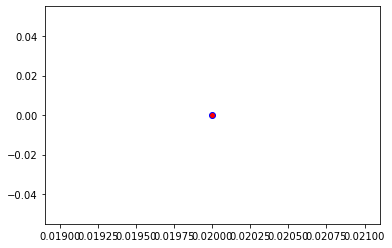

Crafting adversarial images took: 8.061134576797485 seconds 

Images classified as:
000000273715 701 = parachute
000000273760 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


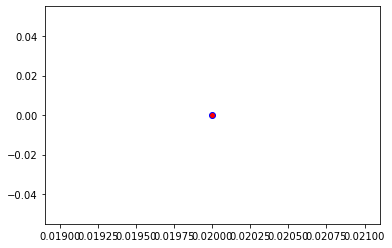

Crafting adversarial images took: 7.528337478637695 seconds 

Images classified as:
000000274066 693 = paddle
000000274219 457 = bow tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


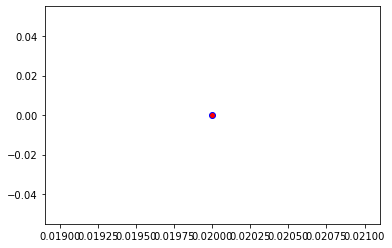

Crafting adversarial images took: 7.623170852661133 seconds 

Images classified as:
000000274272 874 = trolleybus
000000274411 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


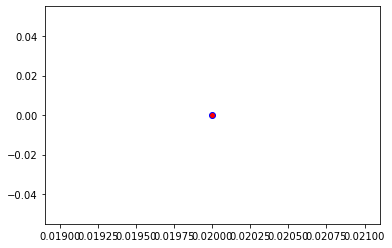

Crafting adversarial images took: 7.790698051452637 seconds 

Images classified as:
000000274460 472 = canoe
000000274687 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


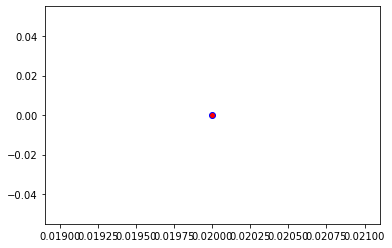

Crafting adversarial images took: 7.616060256958008 seconds 

Images classified as:
000000274708 140 = alp
000000275058 484 = catamaran
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


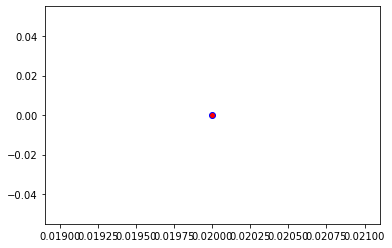

Crafting adversarial images took: 7.545717716217041 seconds 

Images classified as:
000000275198 879 = umbrella
000000275392 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


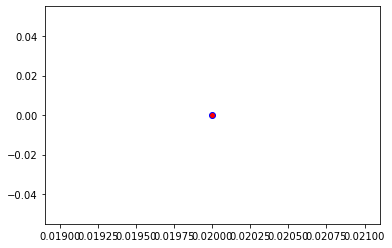

Crafting adversarial images took: 7.612839937210083 seconds 

Images classified as:
000000275727 547 = electric locomotive
000000275749 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


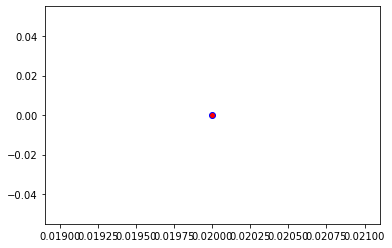

Crafting adversarial images took: 7.462552785873413 seconds 

Images classified as:
000000275791 705 = passenger car
000000276018 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


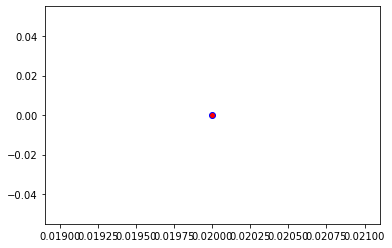

Crafting adversarial images took: 7.71592903137207 seconds 

Images classified as:
000000276024 354 = Arabian camel
000000276055 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


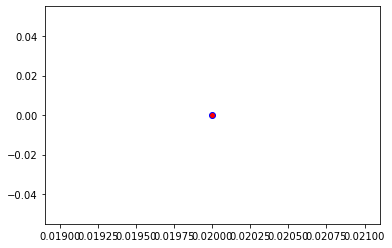

Crafting adversarial images took: 7.640846490859985 seconds 

Images classified as:
000000276284 665 = moped
000000276285 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


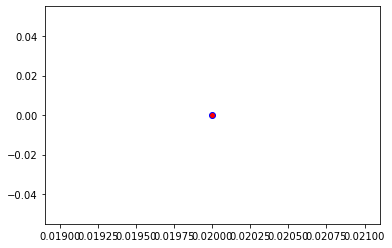

Crafting adversarial images took: 7.483205318450928 seconds 

Images classified as:
000000276434 470 = candle
000000276707 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


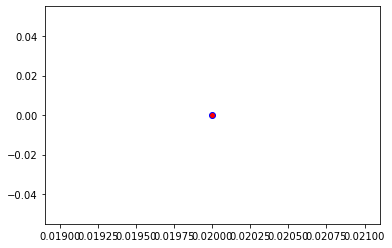

Crafting adversarial images took: 7.523779630661011 seconds 

Images classified as:
000000276720 497 = church
000000276804 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


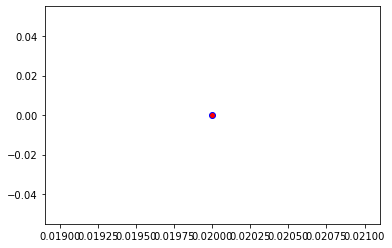

Crafting adversarial images took: 7.650122165679932 seconds 

Images classified as:
000000276921 850 = teddy
000000277005 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


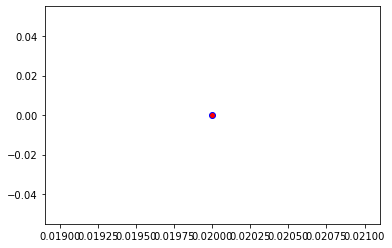

Crafting adversarial images took: 7.376621723175049 seconds 

Images classified as:
000000277020 642 = marimba
000000277051 13 = junco
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


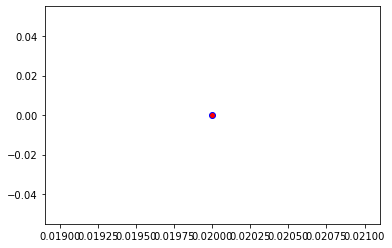

Crafting adversarial images took: 7.53397536277771 seconds 

Images classified as:
000000277197 532 = dining table
000000277584 284 = Siamese cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


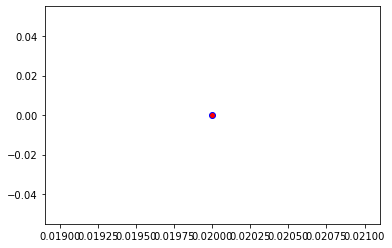

Crafting adversarial images took: 8.041036128997803 seconds 

Images classified as:
000000277689 334 = cup
000000278006 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 254.82785
Min values in image-array: 0.0 Max values in image-array: 0.9993249
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


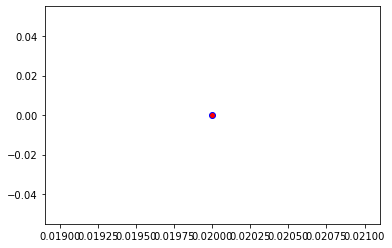

Crafting adversarial images took: 7.609995603561401 seconds 

Images classified as:
000000278353 5 = ram
000000278463 526 = desk
Min values in image-array: 0.0 Max values in image-array: 254.91199
Min values in image-array: 0.0 Max values in image-array: 0.9996548
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


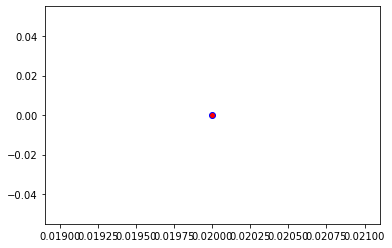

Crafting adversarial images took: 7.5633766651153564 seconds 

Images classified as:
000000278705 523 = crutch
000000278749 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


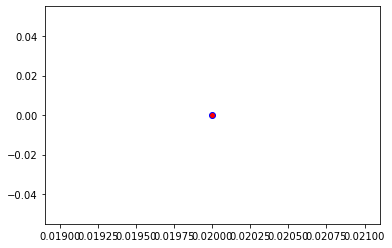

Crafting adversarial images took: 7.755011796951294 seconds 

Images classified as:
000000278848 879 = umbrella
000000278973 801 = snorkel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


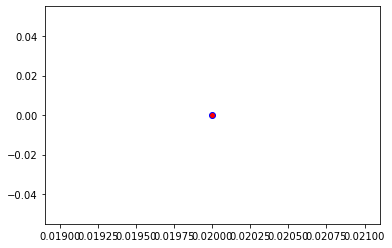

Crafting adversarial images took: 7.745917081832886 seconds 

Images classified as:
000000279145 28 = pot
000000279278 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


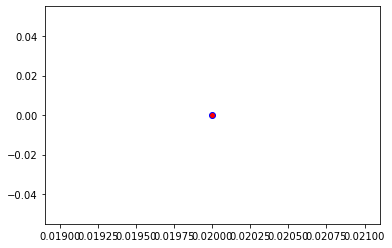

Crafting adversarial images took: 7.395489454269409 seconds 

Images classified as:
000000279541 415 = bakery
000000279714 475 = car mirror
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


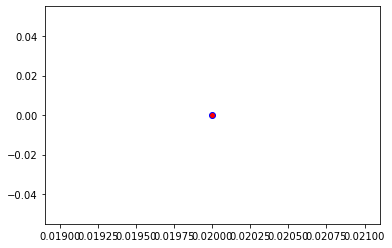

Crafting adversarial images took: 7.76280951499939 seconds 

Images classified as:
000000279730 934 = hotdog
000000279769 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


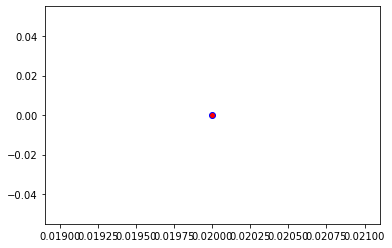

Crafting adversarial images took: 7.598634481430054 seconds 

Images classified as:
000000279774 981 = ballplayer
000000279887 476 = carousel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


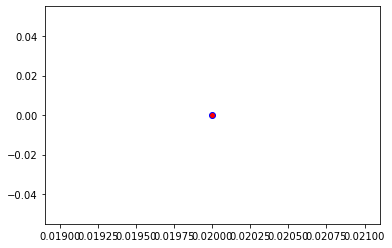

Crafting adversarial images took: 7.644979238510132 seconds 

Images classified as:
000000279927 975 = lakeside
000000280325 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


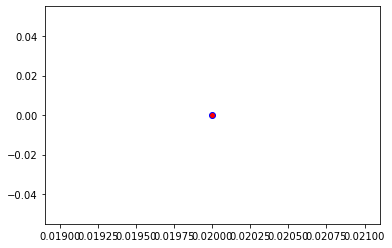

Crafting adversarial images took: 7.593355655670166 seconds 

Images classified as:
000000280710 829 = streetcar
000000280779 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


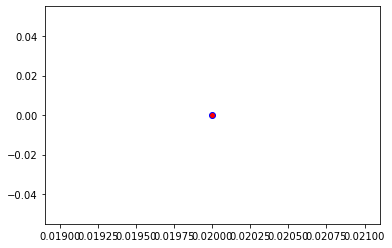

Crafting adversarial images took: 7.523182392120361 seconds 

Images classified as:
000000280891 950 = orange
000000280918 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


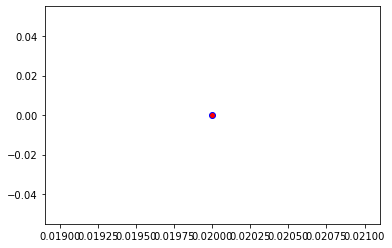

Crafting adversarial images took: 7.390376567840576 seconds 

Images classified as:
000000280930 606 = iron
000000281032 766 = rotisserie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


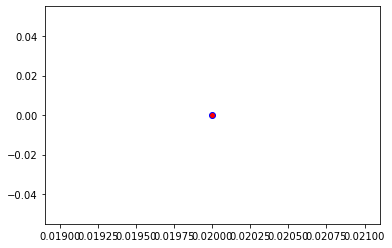

Crafting adversarial images took: 7.5441789627075195 seconds 

Images classified as:
000000281179 920 = traffic light
000000281409 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


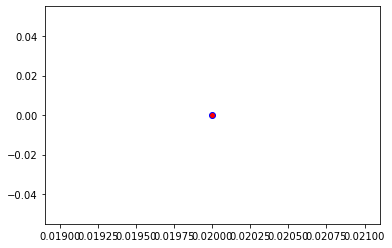

Crafting adversarial images took: 7.637139320373535 seconds 

Images classified as:
000000281414 843 = swing
000000281447 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


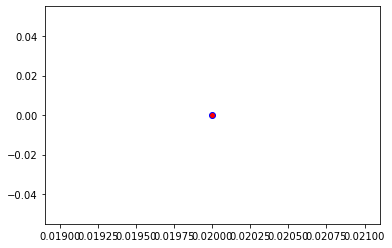

Crafting adversarial images took: 7.524599313735962 seconds 

Images classified as:
000000281687 971 = bubble
000000281693 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


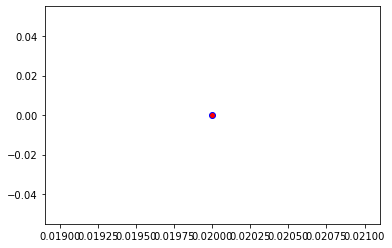

Crafting adversarial images took: 7.904980897903442 seconds 

Images classified as:
000000281754 879 = umbrella
000000281759 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


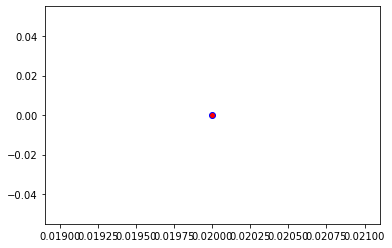

Crafting adversarial images took: 7.991506338119507 seconds 

Images classified as:
000000281929 671 = mountain bike
000000282037 981 = ballplayer
Min values in image-array: 1.3392849 Max values in image-array: 255.0
Min values in image-array: 0.0052520977 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


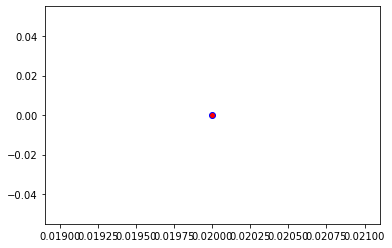

Crafting adversarial images took: 7.472729444503784 seconds 

Images classified as:
000000282046 703 = park bench
000000282296 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


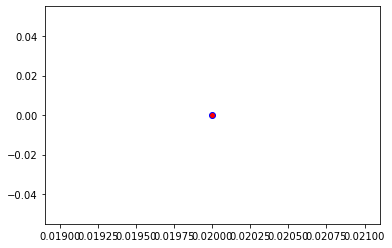

Crafting adversarial images took: 7.835467100143433 seconds 

Images classified as:
000000282298 877 = turnstile
000000282912 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


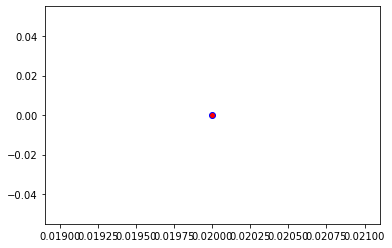

Crafting adversarial images took: 7.74204158782959 seconds 

Images classified as:
000000283037 920 = traffic light
000000283038 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


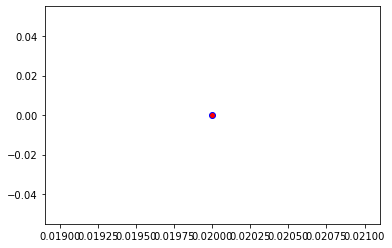

Crafting adversarial images took: 7.5905585289001465 seconds 

Images classified as:
000000283070 950 = orange
000000283113 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 253.82141
Min values in image-array: 0.0 Max values in image-array: 0.9953781
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


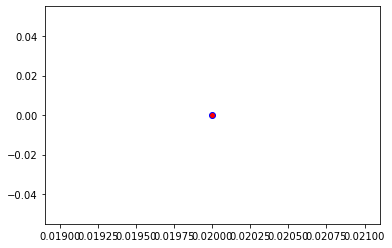

Crafting adversarial images took: 7.609079599380493 seconds 

Images classified as:
000000283268 929 = ice lolly
000000283318 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


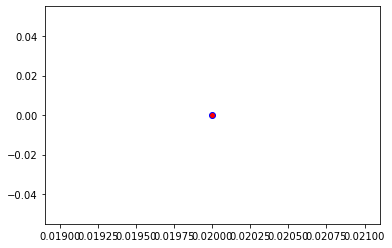

Crafting adversarial images took: 7.48380184173584 seconds 

Images classified as:
000000283412 265 = toy poodle
000000283520 730 = plow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


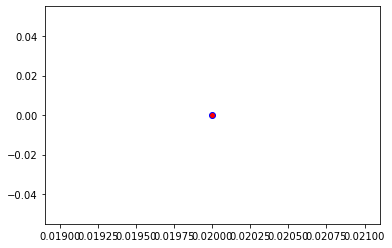

Crafting adversarial images took: 7.418117046356201 seconds 

Images classified as:
000000283717 651 = microwave
000000283785 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


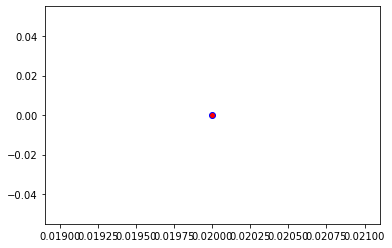

Crafting adversarial images took: 7.5912182331085205 seconds 

Images classified as:
000000284106 461 = plate
000000284279 19 = chickadee
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


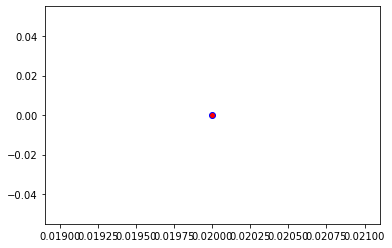

Crafting adversarial images took: 7.560952425003052 seconds 

Images classified as:
000000284282 742 = printer
000000284296 275 = hyena
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


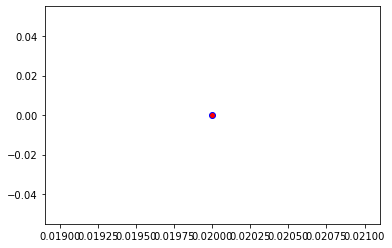

Crafting adversarial images took: 7.438961744308472 seconds 

Images classified as:
000000284445 134 = crane
000000284623 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


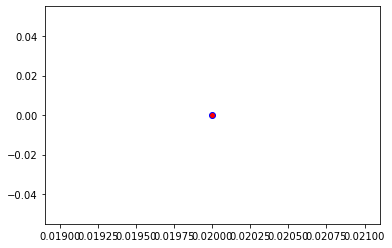

Crafting adversarial images took: 7.594771146774292 seconds 

Images classified as:
000000284698 475 = car mirror
000000284725 555 = fire engine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


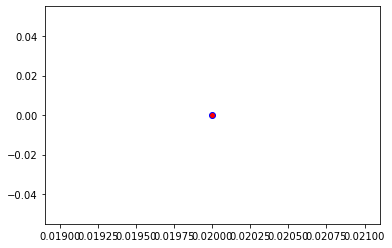

Crafting adversarial images took: 7.566563129425049 seconds 

Images classified as:
000000284743 862 = torch
000000284762 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


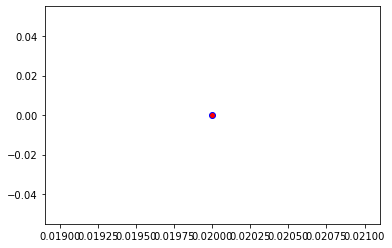

Crafting adversarial images took: 7.505371570587158 seconds 

Images classified as:
000000284764 809 = soup bowl
000000284991 898 = water bottle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


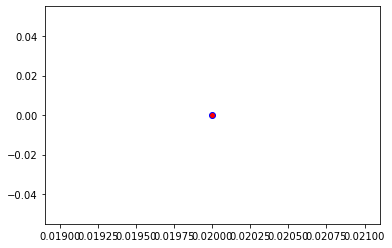

Crafting adversarial images took: 7.885531187057495 seconds 

Images classified as:
000000285047 739 = potter's wheel
000000285349 28 = pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


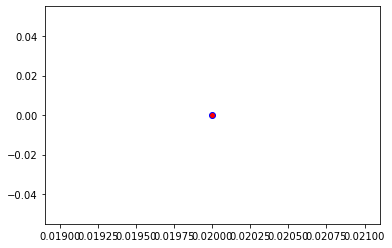

Crafting adversarial images took: 7.872332334518433 seconds 

Images classified as:
000000285788 354 = Arabian camel
000000285894 381 = spider monkey
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


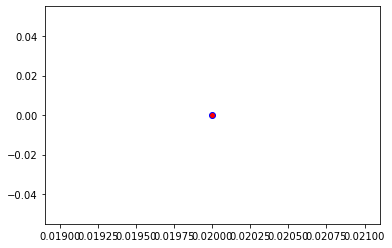

Crafting adversarial images took: 7.564432144165039 seconds 

Images classified as:
000000286182 532 = dining table
000000286422 914 = yawl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


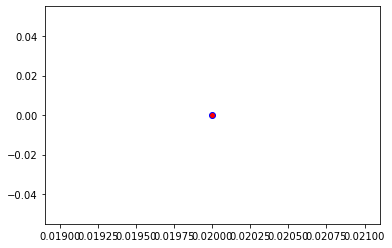

Crafting adversarial images took: 7.598150014877319 seconds 

Images classified as:
000000286458 477 = carpenter's kit
000000286503 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


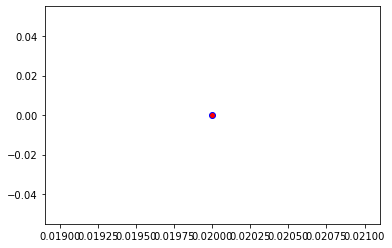

Crafting adversarial images took: 7.791536331176758 seconds 

Images classified as:
000000286507 565 = freight car
000000286523 433 = bathing cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


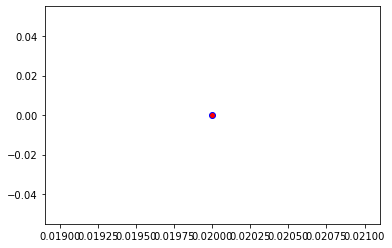

Crafting adversarial images took: 7.701564788818359 seconds 

Images classified as:
000000286553 963 = pizza
000000286660 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


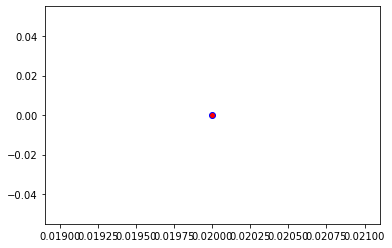

Crafting adversarial images took: 7.488757133483887 seconds 

Images classified as:
000000286708 515 = cowboy hat
000000286849 500 = cliff
Min values in image-array: 0.0 Max values in image-array: 254.86273
Min values in image-array: 0.0 Max values in image-array: 0.9994617
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


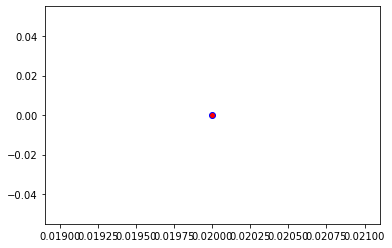

Crafting adversarial images took: 7.469030380249023 seconds 

Images classified as:
000000286907 861 = toilet seat
000000286908 959 = carbonara
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


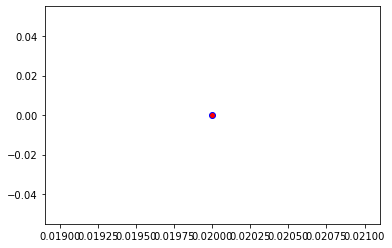

Crafting adversarial images took: 7.5645270347595215 seconds 

Images classified as:
000000286994 386 = African elephant
000000287291 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


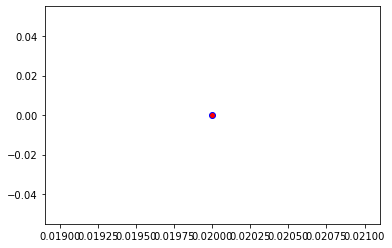

Crafting adversarial images took: 8.037412643432617 seconds 

Images classified as:
000000287347 688 = oscilloscope
000000287527 452 = bonnet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


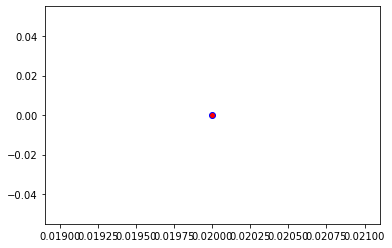

Crafting adversarial images took: 8.507587432861328 seconds 

Images classified as:
000000287545 290 = jaguar
000000287649 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


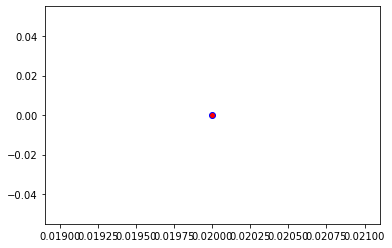

Crafting adversarial images took: 7.65110969543457 seconds 

Images classified as:
000000287667 773 = saltshaker
000000287714 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


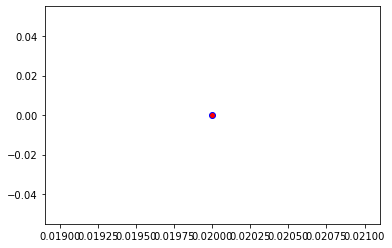

Crafting adversarial images took: 7.407303810119629 seconds 

Images classified as:
000000287874 547 = electric locomotive
000000287959 930 = French loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


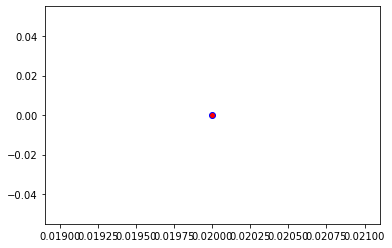

Crafting adversarial images took: 7.48281455039978 seconds 

Images classified as:
000000288042 888 = viaduct
000000288062 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


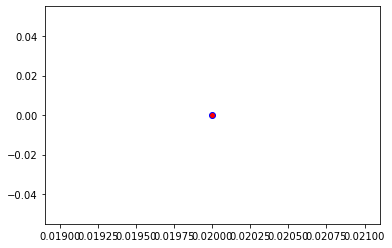

Crafting adversarial images took: 7.647700309753418 seconds 

Images classified as:
000000288391 487 = cellular telephone
000000288430 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


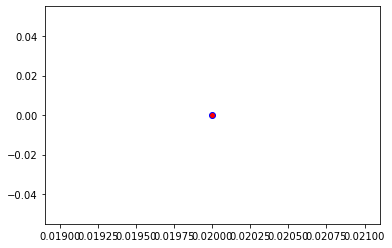

Crafting adversarial images took: 7.875841379165649 seconds 

Images classified as:
000000288584 645 = maypole
000000288685 169 = borzoi
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


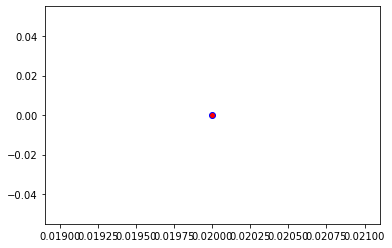

Crafting adversarial images took: 7.7060699462890625 seconds 

Images classified as:
000000288762 461 = plate
000000288862 884 = vault
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


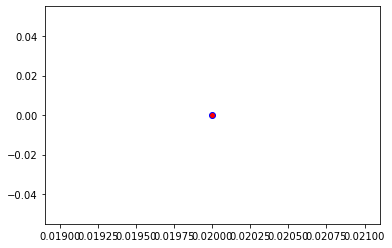

Crafting adversarial images took: 7.5688536167144775 seconds 

Images classified as:
000000288882 134 = crane
000000289059 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


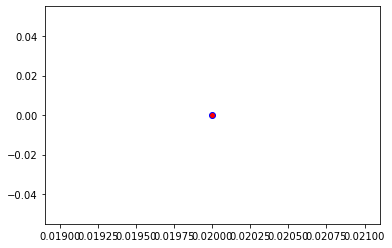

Crafting adversarial images took: 7.490419864654541 seconds 

Images classified as:
000000289222 920 = traffic light
000000289229 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


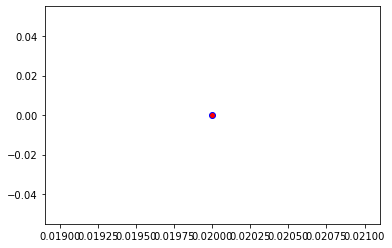

Crafting adversarial images took: 7.671640872955322 seconds 

Images classified as:
000000289343 523 = crutch
000000289393 173 = Ibizan hound
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


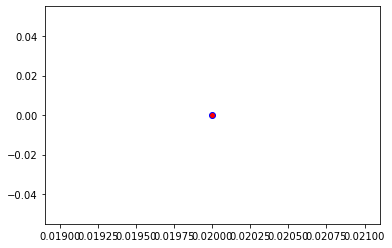

Crafting adversarial images took: 7.652508020401001 seconds 

Images classified as:
000000289415 963 = pizza
000000289417 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


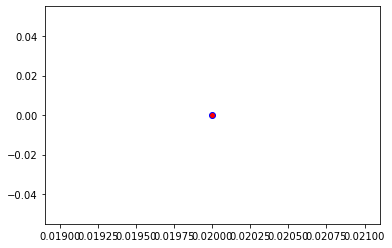

Crafting adversarial images took: 7.480031251907349 seconds 

Images classified as:
000000289516 409 = analog clock
000000289586 26 = gar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


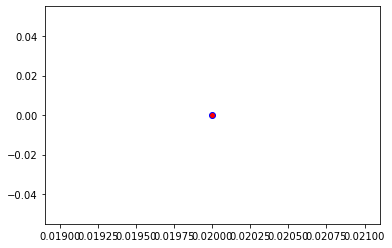

Crafting adversarial images took: 7.546786069869995 seconds 

Images classified as:
000000289594 603 = horse cart
000000289659 352 = impala
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


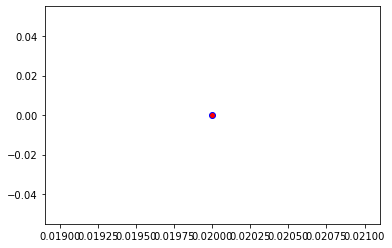

Crafting adversarial images took: 8.010760307312012 seconds 

Images classified as:
000000289702 179 = Staffordshire bullterrier
000000289741 404 = liner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


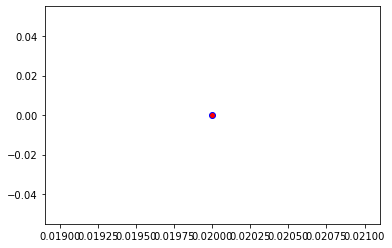

Crafting adversarial images took: 7.491080284118652 seconds 

Images classified as:
000000289938 582 = grocery store
000000289960 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


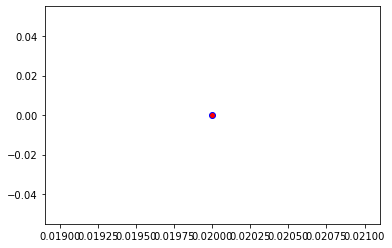

Crafting adversarial images took: 7.596287965774536 seconds 

Images classified as:
000000289992 896 = washbasin
000000290081 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


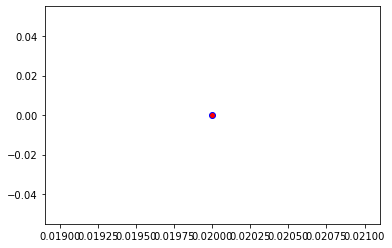

Crafting adversarial images took: 7.566076993942261 seconds 

Images classified as:
000000290163 461 = plate
000000290179 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


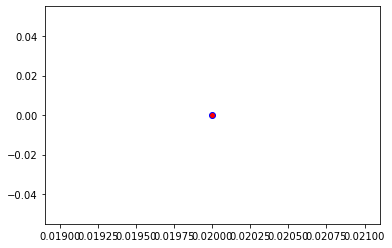

Crafting adversarial images took: 7.44346284866333 seconds 

Images classified as:
000000290248 645 = maypole
000000290293 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


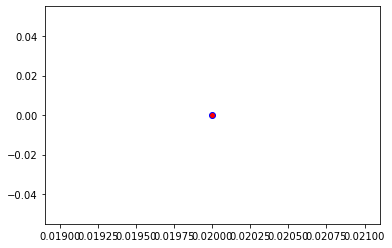

Crafting adversarial images took: 7.572176694869995 seconds 

Images classified as:
000000290592 5 = ram
000000290619 463 = bucket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


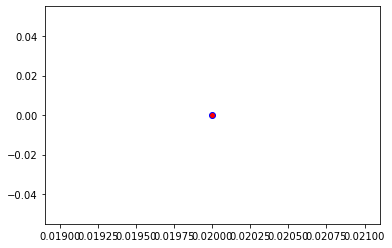

Crafting adversarial images took: 7.567046642303467 seconds 

Images classified as:
000000290768 534 = washer
000000290771 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


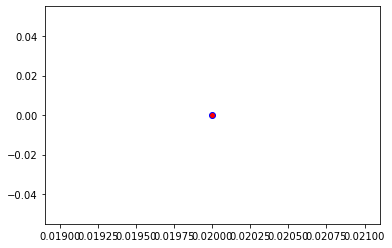

Crafting adversarial images took: 8.149677753448486 seconds 

Images classified as:
000000290833 340 = zebra
000000290843 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


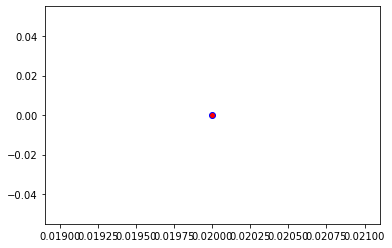

Crafting adversarial images took: 7.504002809524536 seconds 

Images classified as:
000000291490 285 = Egyptian cat
000000291551 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


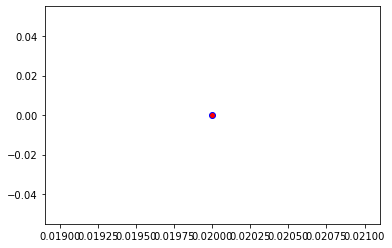

Crafting adversarial images took: 7.487117767333984 seconds 

Images classified as:
000000291619 805 = soccer ball
000000291634 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


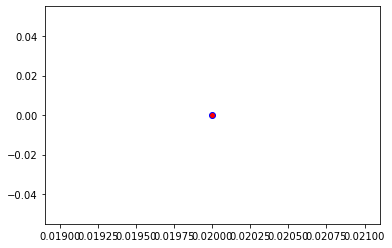

Crafting adversarial images took: 7.59998893737793 seconds 

Images classified as:
000000291664 159 = Rhodesian ridgeback
000000291791 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


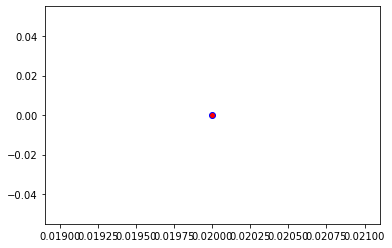

Crafting adversarial images took: 7.665959358215332 seconds 

Images classified as:
000000291861 340 = zebra
000000292005 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


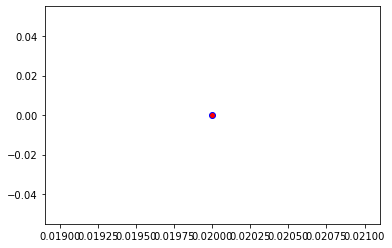

Crafting adversarial images took: 7.81281590461731 seconds 

Images classified as:
000000292024 963 = pizza
000000292060 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


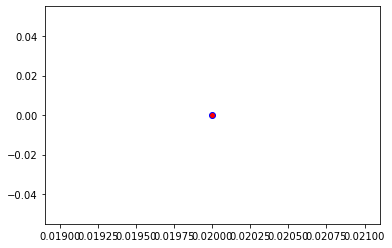

Crafting adversarial images took: 7.582614421844482 seconds 

Images classified as:
000000292082 457 = bow tie
000000292155 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


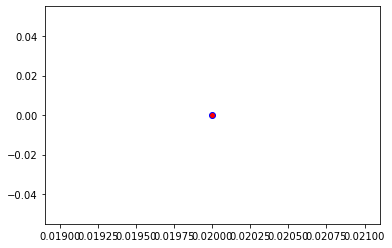

Crafting adversarial images took: 7.439554214477539 seconds 

Images classified as:
000000292225 233 = Bouvier des Flandres
000000292236 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


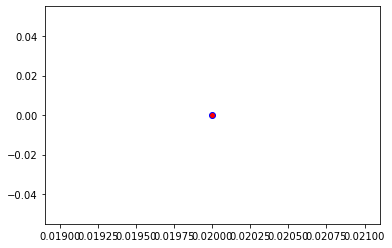

Crafting adversarial images took: 7.502532005310059 seconds 

Images classified as:
000000292330 207 = golden retriever
000000292415 835 = sundial
Min values in image-array: 0.0 Max values in image-array: 254.96428
Min values in image-array: 0.0 Max values in image-array: 0.9998599
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


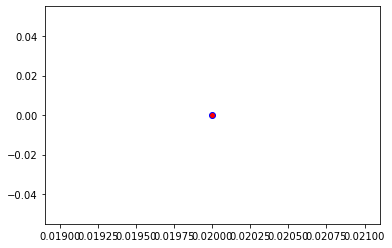

Crafting adversarial images took: 7.4463536739349365 seconds 

Images classified as:
000000292446 611 = jigsaw puzzle
000000292456 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


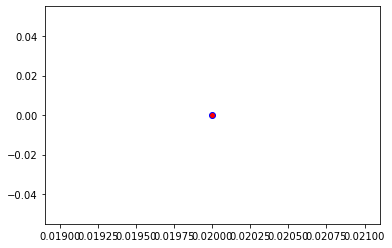

Crafting adversarial images took: 7.708333969116211 seconds 

Images classified as:
000000292488 568 = fur coat
000000292908 142 = dowitcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


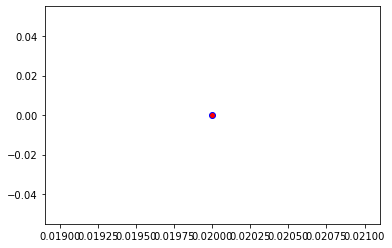

Crafting adversarial images took: 7.585187196731567 seconds 

Images classified as:
000000292997 803 = snowplow
000000293044 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


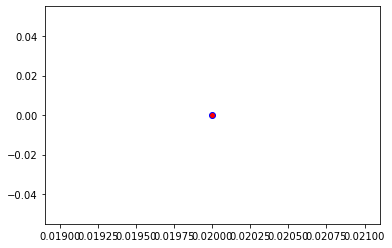

Crafting adversarial images took: 7.5788750648498535 seconds 

Images classified as:
000000293071 704 = parking meter
000000293200 645 = maypole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


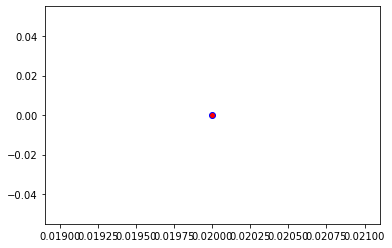

Crafting adversarial images took: 7.411891222000122 seconds 

Images classified as:
000000293245 665 = moped
000000293300 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


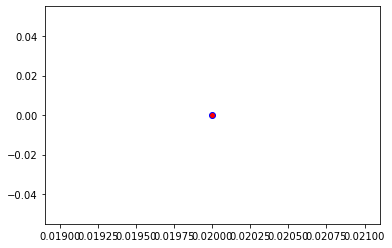

Crafting adversarial images took: 7.5812695026397705 seconds 

Images classified as:
000000293324 404 = airliner
000000293390 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


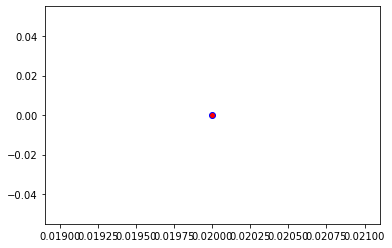

Crafting adversarial images took: 8.003469467163086 seconds 

Images classified as:
000000293474 704 = parking meter
000000293625 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


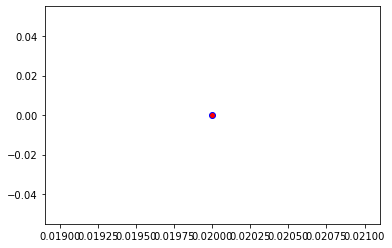

Crafting adversarial images took: 7.539910078048706 seconds 

Images classified as:
000000293794 954 = banana
000000293804 598 = home theater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


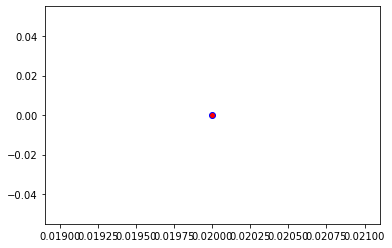

Crafting adversarial images took: 7.425580978393555 seconds 

Images classified as:
000000293858 934 = hotdog
000000294162 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


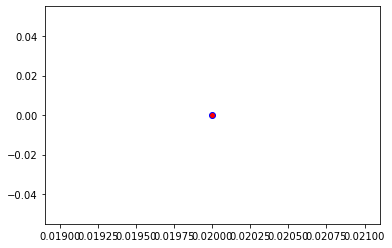

Crafting adversarial images took: 7.605772018432617 seconds 

Images classified as:
000000294163 442 = bell cote
000000294350 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


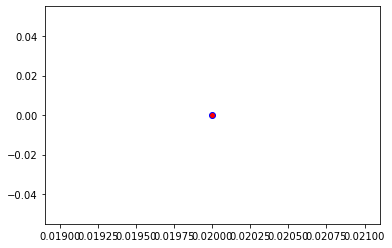

Crafting adversarial images took: 7.716240167617798 seconds 

Images classified as:
000000294695 701 = parachute
000000294783 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


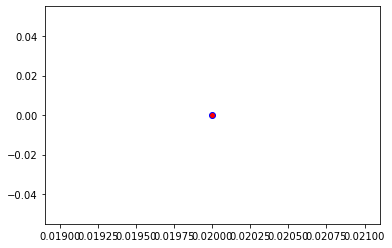

Crafting adversarial images took: 7.607219219207764 seconds 

Images classified as:
000000294831 567 = frying pan
000000294855 413 = rifle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


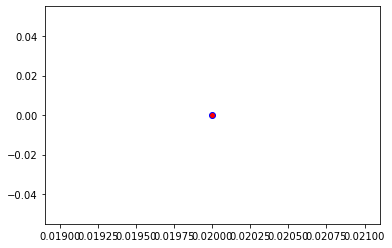

Crafting adversarial images took: 7.6131432056427 seconds 

Images classified as:
000000295138 423 = barber chair
000000295231 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


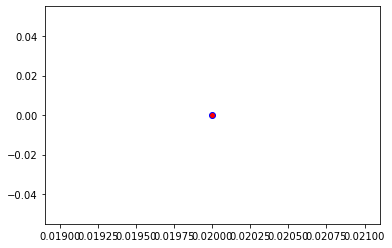

Crafting adversarial images took: 7.615890264511108 seconds 

Images classified as:
000000295316 801 = snorkel
000000295420 675 = moving van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


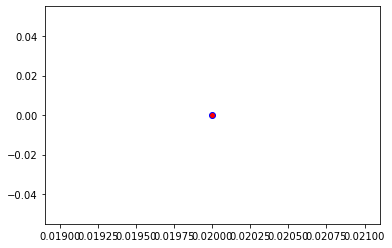

Crafting adversarial images took: 7.476776599884033 seconds 

Images classified as:
000000295478 203 = West Highland white terrier
000000295713 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


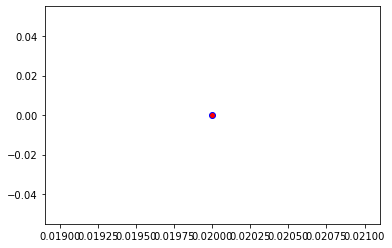

Crafting adversarial images took: 7.475796699523926 seconds 

Images classified as:
000000295797 442 = bell cote
000000295809 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


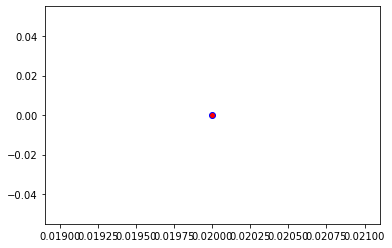

Crafting adversarial images took: 7.714820384979248 seconds 

Images classified as:
000000296222 813 = spatula
000000296224 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


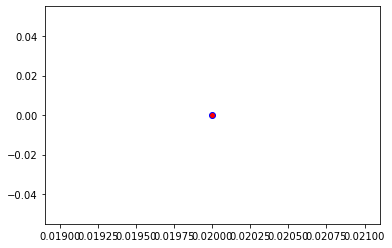

Crafting adversarial images took: 7.438798427581787 seconds 

Images classified as:
000000296231 526 = desk
000000296284 905 = window shade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


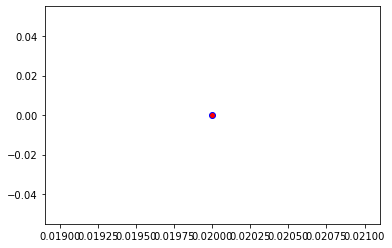

Crafting adversarial images took: 7.526328086853027 seconds 

Images classified as:
000000296317 979 = valley
000000296634 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 232.72545
Min values in image-array: 0.0 Max values in image-array: 0.9126488
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


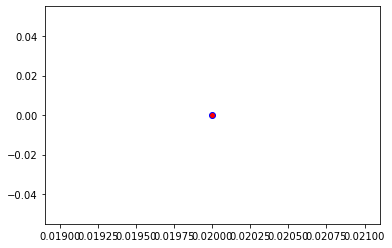

Crafting adversarial images took: 7.750292778015137 seconds 

Images classified as:
000000296649 665 = moped
000000296657 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


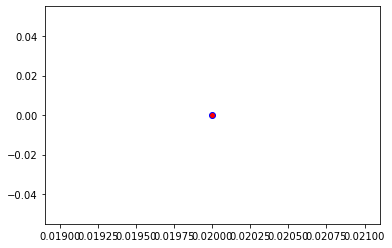

Crafting adversarial images took: 7.44144868850708 seconds 

Images classified as:
000000296969 275 = hyena
000000297022 586 = half track
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


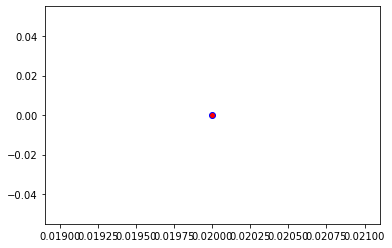

Crafting adversarial images took: 7.750039577484131 seconds 

Images classified as:
000000297084 762 = restaurant
000000297085 598 = home theater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


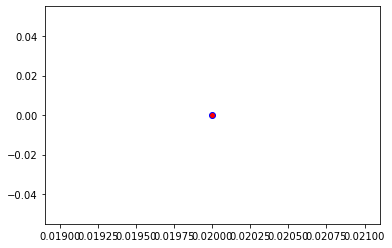

Crafting adversarial images took: 7.835302352905273 seconds 

Images classified as:
000000297147 670 = motor scooter
000000297343 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


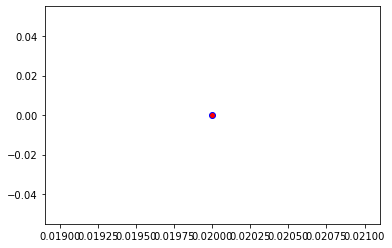

Crafting adversarial images took: 7.42557692527771 seconds 

Images classified as:
000000297353 546 = electric guitar
000000297396 960 = chocolate sauce
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


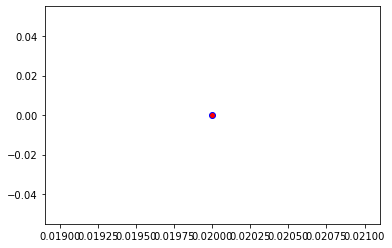

Crafting adversarial images took: 7.707420110702515 seconds 

Images classified as:
000000297427 933 = cheeseburger
000000297562 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


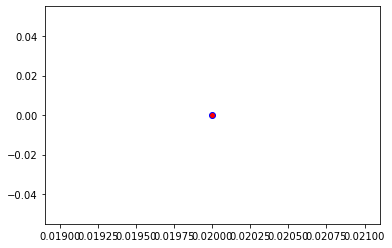

Crafting adversarial images took: 7.57631516456604 seconds 

Images classified as:
000000297578 639 = suit
000000297595 625 = lifeboat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


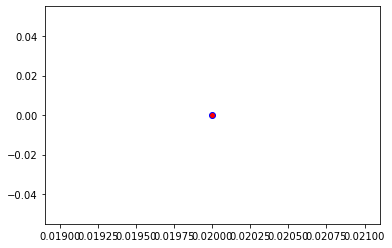

Crafting adversarial images took: 7.667252063751221 seconds 

Images classified as:
000000297681 919 = street sign
000000297698 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


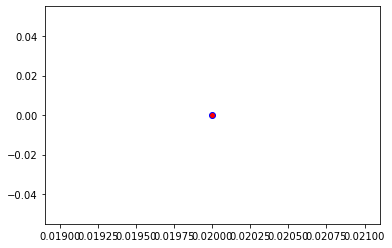

Crafting adversarial images took: 7.611081600189209 seconds 

Images classified as:
000000297830 232 = Border collie
000000298251 176 = gazelle
Min values in image-array: 0.0 Max values in image-array: 254.96014
Min values in image-array: 0.0 Max values in image-array: 0.9998437
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


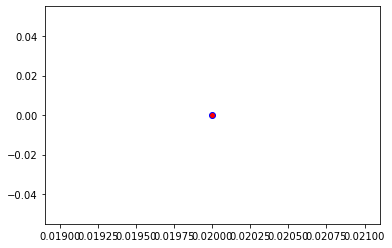

Crafting adversarial images took: 7.596187353134155 seconds 

Images classified as:
000000298396 651 = microwave
000000298697 9 = ostrich
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


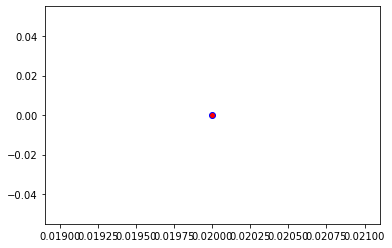

Crafting adversarial images took: 7.466734886169434 seconds 

Images classified as:
000000298738 388 = giant panda
000000298904 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


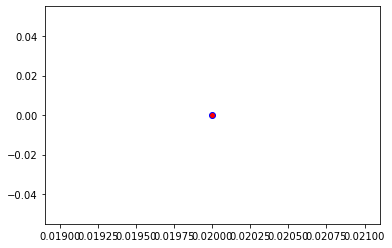

Crafting adversarial images took: 7.520949125289917 seconds 

Images classified as:
000000298994 582 = grocery store
000000299355 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


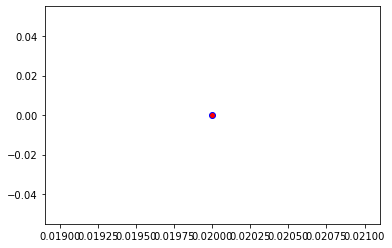

Crafting adversarial images took: 7.5782270431518555 seconds 

Images classified as:
000000299553 701 = parachute
000000299609 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


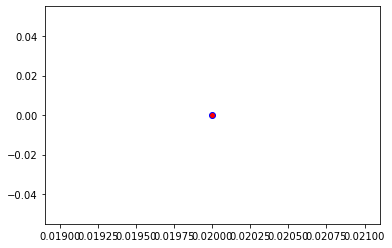

Crafting adversarial images took: 7.628637075424194 seconds 

Images classified as:
000000299720 104 = wallaby
000000299887 428 = barrow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


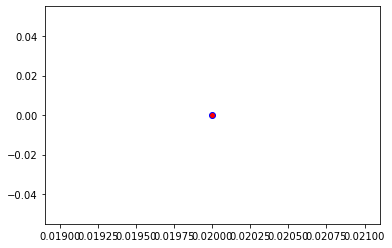

Crafting adversarial images took: 7.4868690967559814 seconds 

Images classified as:
000000300039 585 = hair spray
000000300155 94 = hummingbird
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


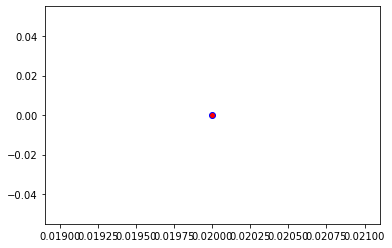

Crafting adversarial images took: 7.532211542129517 seconds 

Images classified as:
000000300233 666 = mortar
000000300276 411 = apron
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


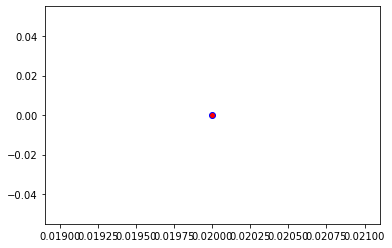

Crafting adversarial images took: 7.507263898849487 seconds 

Images classified as:
000000300341 731 = plunger
000000300659 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


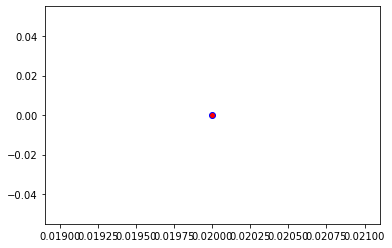

Crafting adversarial images took: 7.623515605926514 seconds 

Images classified as:
000000300842 404 = airliner
000000300913 284 = Siamese cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


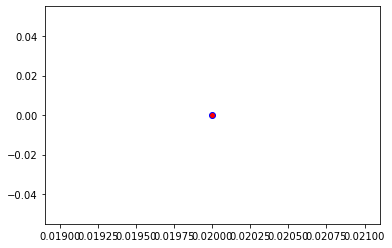

Crafting adversarial images took: 8.090782403945923 seconds 

Images classified as:
000000301061 583 = guillotine
000000301135 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


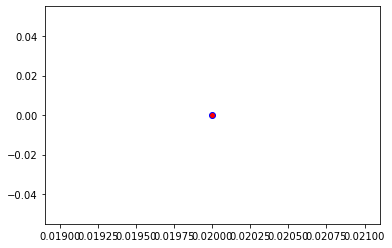

Crafting adversarial images took: 7.444416284561157 seconds 

Images classified as:
000000301376 920 = traffic light
000000301421 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


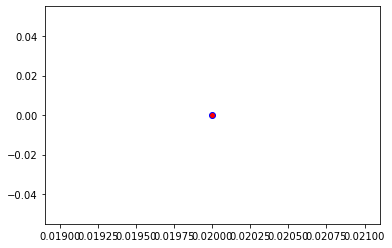

Crafting adversarial images took: 7.556768894195557 seconds 

Images classified as:
000000301563 248 = ski
000000301718 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


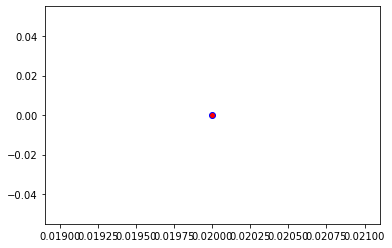

Crafting adversarial images took: 7.507043123245239 seconds 

Images classified as:
000000301867 879 = umbrella
000000301981 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


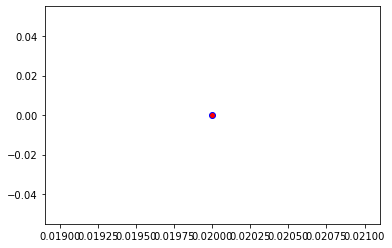

Crafting adversarial images took: 7.556661605834961 seconds 

Images classified as:
000000302030 526 = desk
000000302107 429 = baseball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


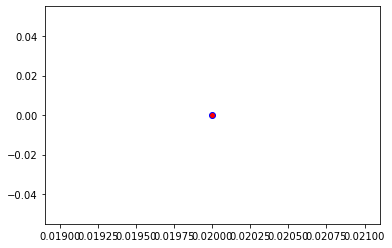

Crafting adversarial images took: 7.880897045135498 seconds 

Images classified as:
000000302165 54 = hog
000000302452 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


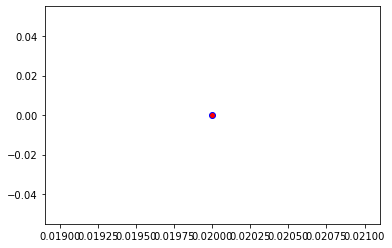

Crafting adversarial images took: 7.6146910190582275 seconds 

Images classified as:
000000302536 731 = plunger
000000302760 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


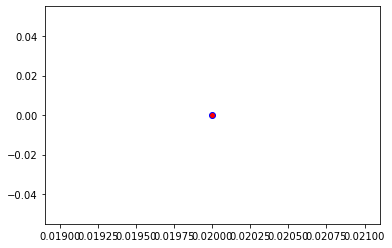

Crafting adversarial images took: 7.462157487869263 seconds 

Images classified as:
000000302882 759 = reflex camera
000000302990 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


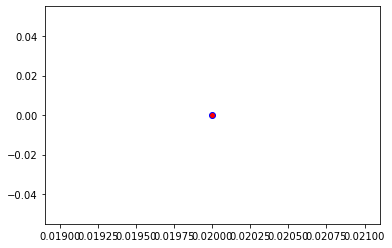

Crafting adversarial images took: 7.547227144241333 seconds 

Images classified as:
000000303305 874 = trolleybus
000000303499 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


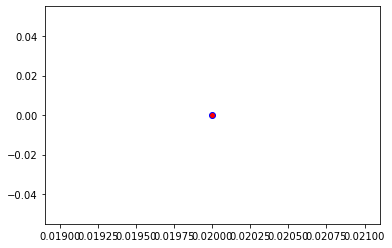

Crafting adversarial images took: 7.625172138214111 seconds 

Images classified as:
000000303566 582 = grocery store
000000303653 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


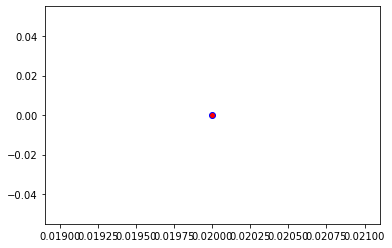

Crafting adversarial images took: 7.562198162078857 seconds 

Images classified as:
000000303713 416 = balance beam
000000303818 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


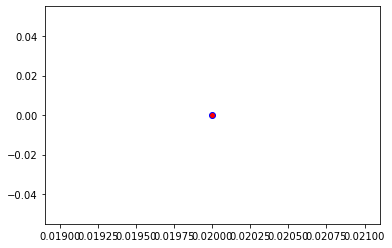

Crafting adversarial images took: 7.833296775817871 seconds 

Images classified as:
000000303863 547 = electric locomotive
000000303893 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


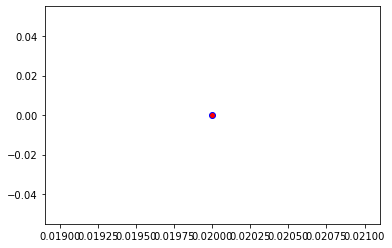

Crafting adversarial images took: 7.500340938568115 seconds 

Images classified as:
000000303908 488 = chain
000000304180 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


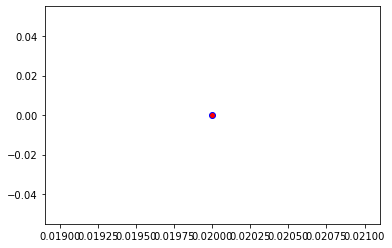

Crafting adversarial images took: 7.4964280128479 seconds 

Images classified as:
000000304291 730 = plow
000000304365 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


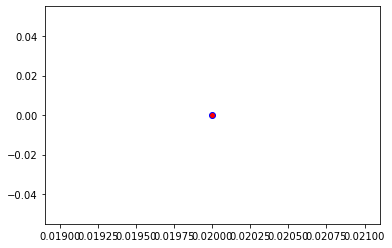

Crafting adversarial images took: 7.590730905532837 seconds 

Images classified as:
000000304396 442 = bell cote
000000304404 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


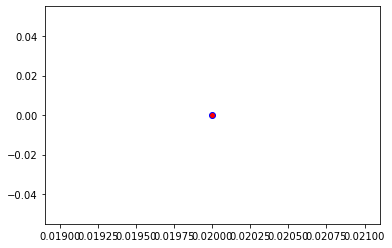

Crafting adversarial images took: 7.912807941436768 seconds 

Images classified as:
000000304545 636 = mailbag
000000304560 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


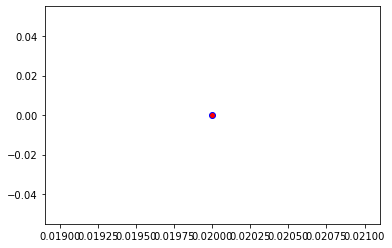

Crafting adversarial images took: 7.4279515743255615 seconds 

Images classified as:
000000304812 978 = seashore
000000304817 491 = chain saw
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


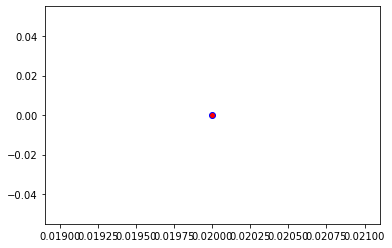

Crafting adversarial images took: 7.495416641235352 seconds 

Images classified as:
000000304984 930 = French loaf
000000305309 463 = bucket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


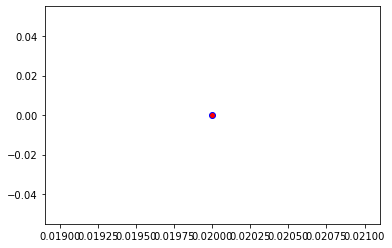

Crafting adversarial images took: 7.749691963195801 seconds 

Images classified as:
000000305317 701 = parachute
000000305343 504 = coffee mug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


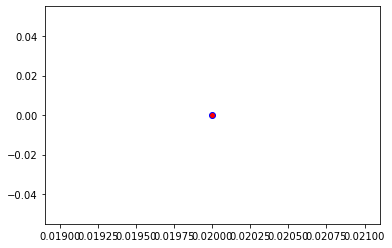

Crafting adversarial images took: 7.577611684799194 seconds 

Images classified as:
000000305609 461 = plate
000000305695 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


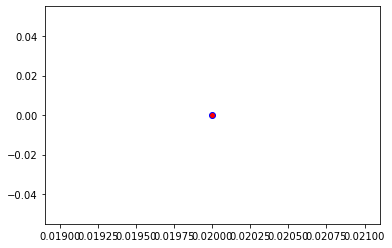

Crafting adversarial images took: 7.615636348724365 seconds 

Images classified as:
000000306136 654 = minibus
000000306139 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


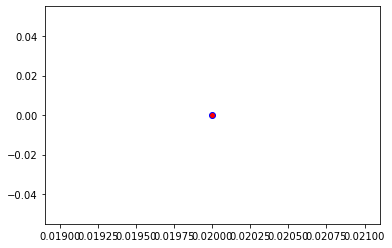

Crafting adversarial images took: 7.7680957317352295 seconds 

Images classified as:
000000306437 412 = ashcan
000000306582 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


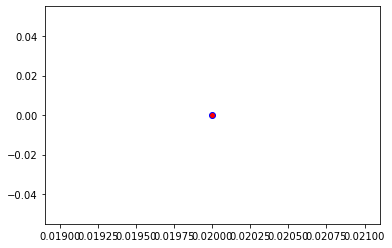

Crafting adversarial images took: 7.569656848907471 seconds 

Images classified as:
000000306700 963 = pizza
000000306733 435 = bathtub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


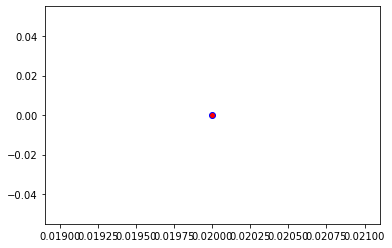

Crafting adversarial images took: 7.675926208496094 seconds 

Images classified as:
000000306893 829 = streetcar
000000307074 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


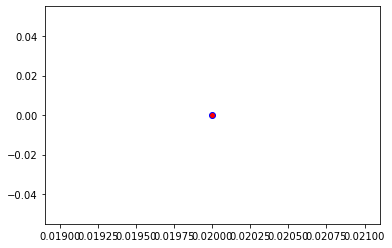

Crafting adversarial images took: 7.591331243515015 seconds 

Images classified as:
000000307145 526 = desk
000000307172 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


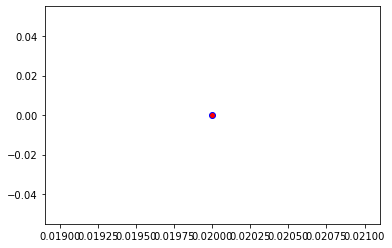

Crafting adversarial images took: 7.572738885879517 seconds 

Images classified as:
000000307598 547 = electric locomotive
000000307658 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 254.87906
Min values in image-array: 0.0 Max values in image-array: 0.9995257
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


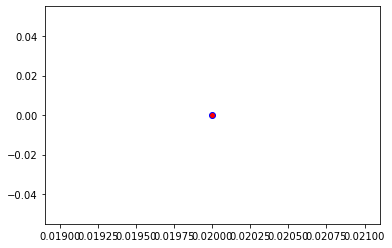

Crafting adversarial images took: 7.6618897914886475 seconds 

Images classified as:
000000308165 880 = unicycle
000000308193 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


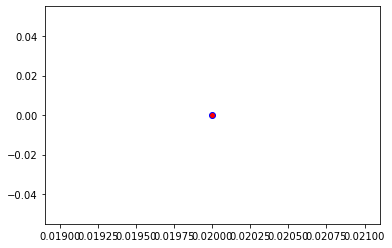

Crafting adversarial images took: 7.535254955291748 seconds 

Images classified as:
000000308328 675 = moving van
000000308391 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


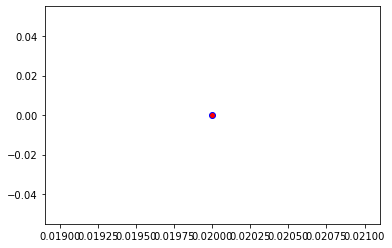

Crafting adversarial images took: 7.516523838043213 seconds 

Images classified as:
000000308394 831 = studio couch
000000308430 909 = wok
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


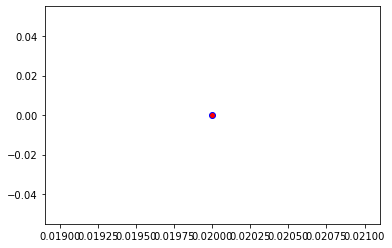

Crafting adversarial images took: 7.635591268539429 seconds 

Images classified as:
000000308466 435 = bathtub
000000308476 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


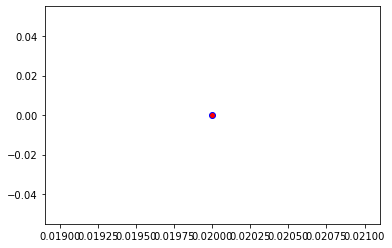

Crafting adversarial images took: 8.072221517562866 seconds 

Images classified as:
000000308531 442 = bell cote
000000308545 787 = shield
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


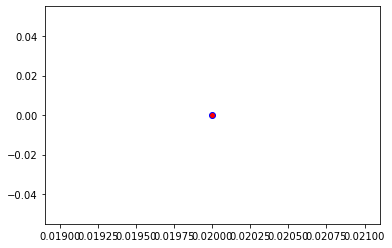

Crafting adversarial images took: 7.616270542144775 seconds 

Images classified as:
000000308587 978 = seashore
000000308631 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


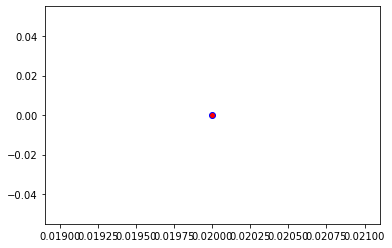

Crafting adversarial images took: 7.837646245956421 seconds 

Images classified as:
000000308753 500 = cliff dwelling
000000308793 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


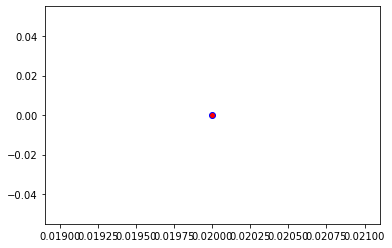

Crafting adversarial images took: 7.698001384735107 seconds 

Images classified as:
000000308799 548 = entertainment center
000000309173 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


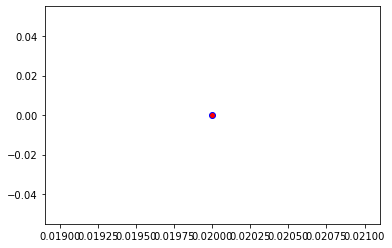

Crafting adversarial images took: 7.563960075378418 seconds 

Images classified as:
000000309391 829 = streetcar
000000309452 95 = jacamar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


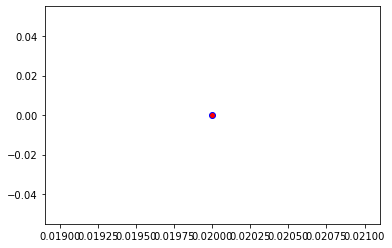

Crafting adversarial images took: 7.541888952255249 seconds 

Images classified as:
000000309467 248 = ski
000000309484 225 = malinois
Min values in image-array: 0.0 Max values in image-array: 251.40942
Min values in image-array: 0.0 Max values in image-array: 0.9859193
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


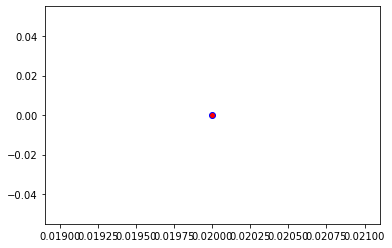

Crafting adversarial images took: 7.58675217628479 seconds 

Images classified as:
000000309495 861 = toilet seat
000000309655 248 = ski
Min values in image-array: 1.6348684e-05 Max values in image-array: 255.0
Min values in image-array: 6.4112484e-08 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


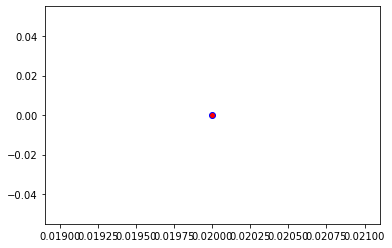

Crafting adversarial images took: 7.643388986587524 seconds 

Images classified as:
000000309678 962 = meat loaf
000000309938 259 = Pomeranian
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


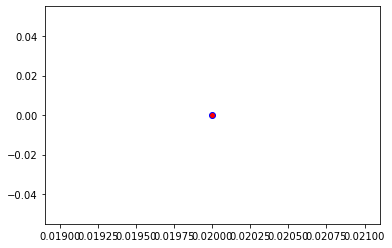

Crafting adversarial images took: 7.473476409912109 seconds 

Images classified as:
000000309964 672 = mountain tent
000000310072 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


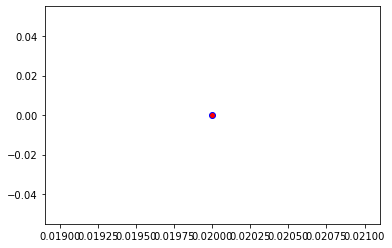

Crafting adversarial images took: 7.546436071395874 seconds 

Images classified as:
000000310200 962 = meat loaf
000000310622 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


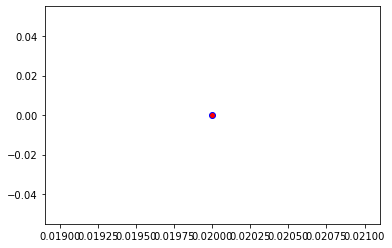

Crafting adversarial images took: 7.491759300231934 seconds 

Images classified as:
000000310862 906 = Windsor tie
000000310980 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


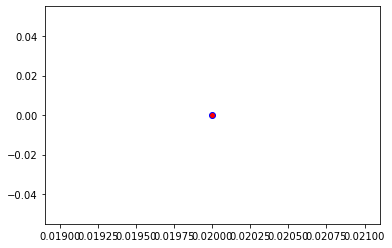

Crafting adversarial images took: 7.513102054595947 seconds 

Images classified as:
000000311002 981 = ballplayer
000000311081 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


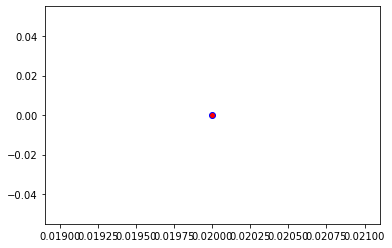

Crafting adversarial images took: 7.7655394077301025 seconds 

Images classified as:
000000311180 59 = vine snake
000000311190 208 = Labrador retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


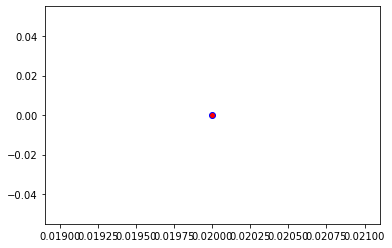

Crafting adversarial images took: 7.485561370849609 seconds 

Images classified as:
000000311295 343 = warthog
000000311303 504 = coffee mug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


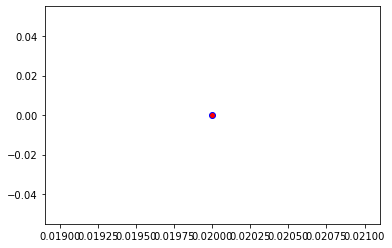

Crafting adversarial images took: 7.450693607330322 seconds 

Images classified as:
000000311392 37 = ox
000000311394 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


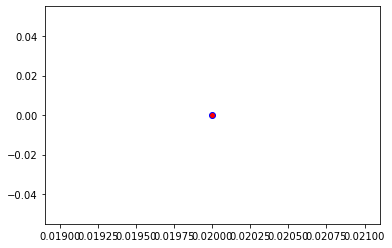

Crafting adversarial images took: 8.049397230148315 seconds 

Images classified as:
000000311518 472 = canoe
000000311789 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


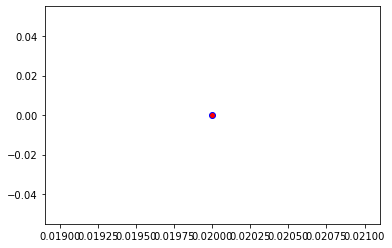

Crafting adversarial images took: 7.447224855422974 seconds 

Images classified as:
000000311883 565 = freight car
000000311909 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


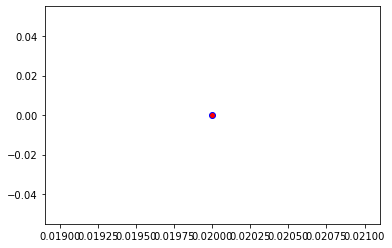

Crafting adversarial images took: 7.481619596481323 seconds 

Images classified as:
000000311928 429 = baseball
000000311950 116 = chiton
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


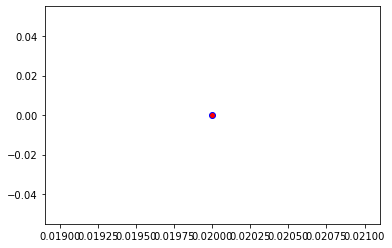

Crafting adversarial images took: 7.735630035400391 seconds 

Images classified as:
000000312192 963 = pizza
000000312213 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


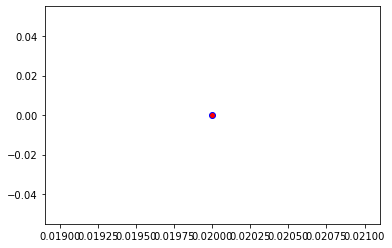

Crafting adversarial images took: 7.621450424194336 seconds 

Images classified as:
000000312237 978 = seashore
000000312263 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


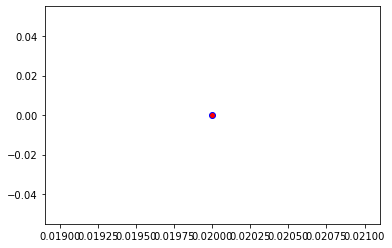

Crafting adversarial images took: 7.578693628311157 seconds 

Images classified as:
000000312278 765 = rocking chair
000000312340 250 = Siberian husky
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


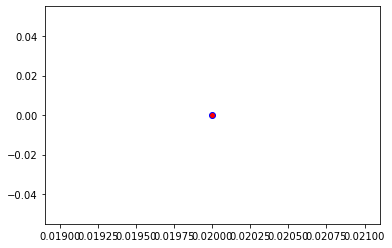

Crafting adversarial images took: 7.546104192733765 seconds 

Images classified as:
000000312406 898 = water bottle
000000312421 732 = Polaroid camera
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


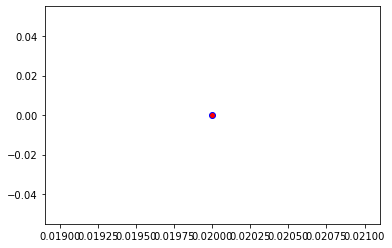

Crafting adversarial images took: 7.546318531036377 seconds 

Images classified as:
000000312489 977 = sandbar
000000312549 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


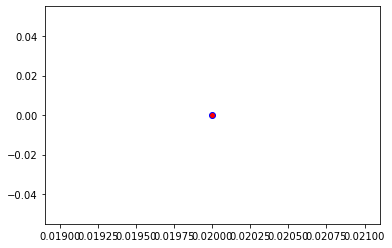

Crafting adversarial images took: 7.565817594528198 seconds 

Images classified as:
000000312552 589 = hand blower
000000312586 295 = American black bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


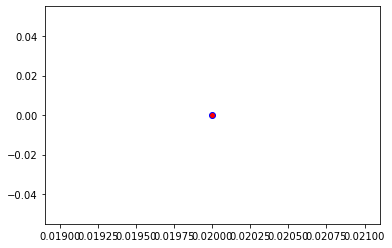

Crafting adversarial images took: 7.73115611076355 seconds 

Images classified as:
000000312720 701 = parachute
000000313034 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


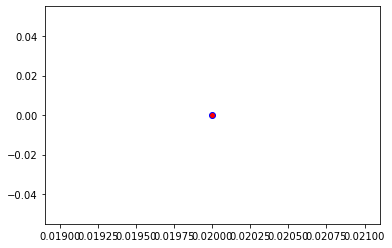

Crafting adversarial images took: 7.5535829067230225 seconds 

Images classified as:
000000313130 760 = refrigerator
000000313182 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


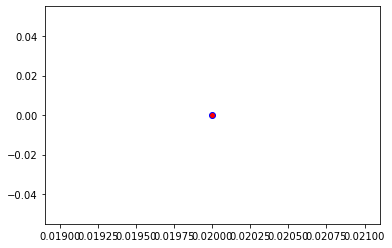

Crafting adversarial images took: 7.511321306228638 seconds 

Images classified as:
000000313454 854 = theater curtain
000000313562 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


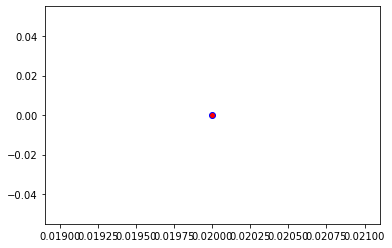

Crafting adversarial images took: 7.587770938873291 seconds 

Images classified as:
000000313588 646 = maze
000000313783 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


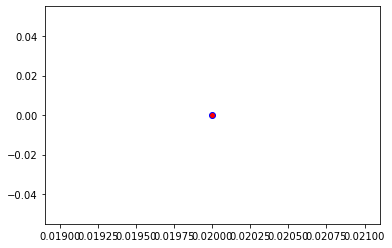

Crafting adversarial images took: 7.579118013381958 seconds 

Images classified as:
000000314034 347 = bison
000000314177 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


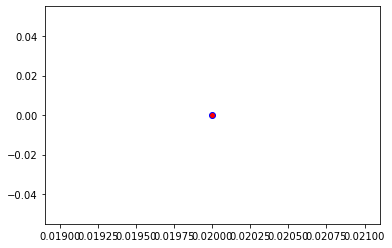

Crafting adversarial images took: 7.452247381210327 seconds 

Images classified as:
000000314182 937 = broccoli
000000314251 682 = obelisk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


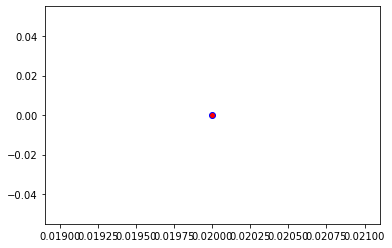

Crafting adversarial images took: 8.376399278640747 seconds 

Images classified as:
000000314264 478 = carton
000000314294 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


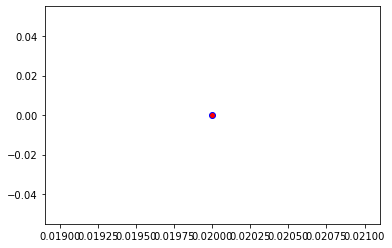

Crafting adversarial images took: 7.554750680923462 seconds 

Images classified as:
000000314541 703 = park bench
000000314709 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


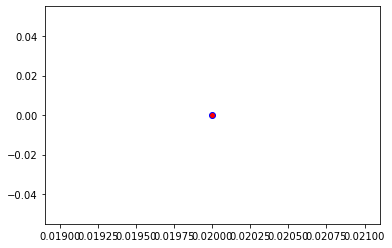

Crafting adversarial images took: 7.587660551071167 seconds 

Images classified as:
000000314914 919 = street sign
000000315001 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


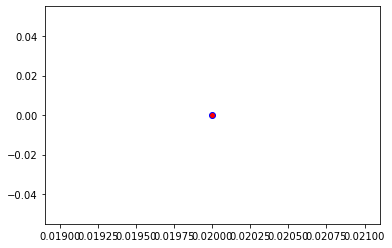

Crafting adversarial images took: 7.691940784454346 seconds 

Images classified as:
000000315187 874 = trolleybus
000000315219 512 = corkscrew
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


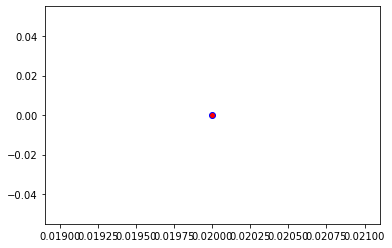

Crafting adversarial images took: 7.575563192367554 seconds 

Images classified as:
000000315257 17 = jay
000000315450 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


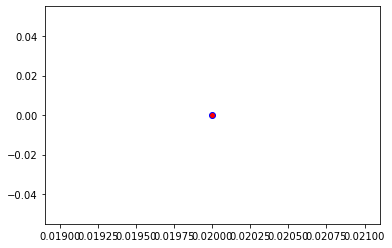

Crafting adversarial images took: 8.519659280776978 seconds 

Images classified as:
000000315492 731 = plunger
000000316015 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


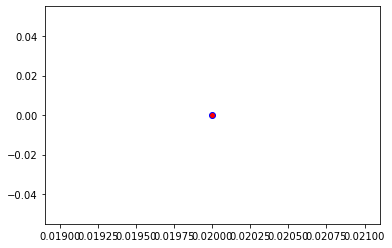

Crafting adversarial images took: 8.74878740310669 seconds 

Images classified as:
000000316054 820 = steam locomotive
000000316404 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


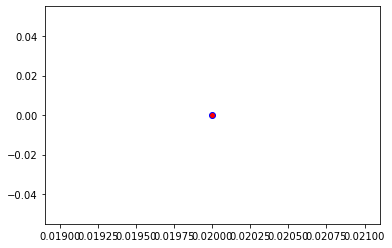

Crafting adversarial images took: 8.865861415863037 seconds 

Images classified as:
000000316666 498 = cinema
000000317024 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


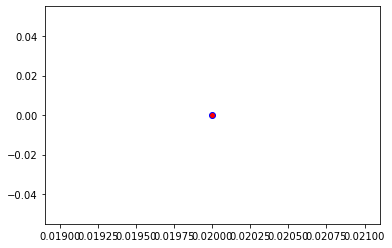

Crafting adversarial images took: 7.4843456745147705 seconds 

Images classified as:
000000317433 730 = plow
000000317999 520 = crib
Min values in image-array: 0.0401783 Max values in image-array: 255.0
Min values in image-array: 0.00015756195 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


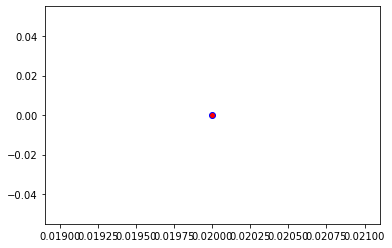

Crafting adversarial images took: 7.729802370071411 seconds 

Images classified as:
000000318080 294 = brown bear
000000318114 930 = French loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


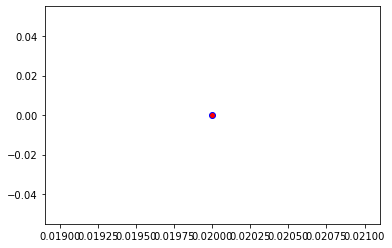

Crafting adversarial images took: 7.5599524974823 seconds 

Images classified as:
000000318138 680 = nipple
000000318238 214 = Gordon setter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


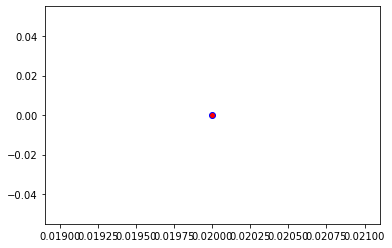

Crafting adversarial images took: 7.456663608551025 seconds 

Images classified as:
000000318455 415 = bakery
000000318908 153 = Maltese dog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


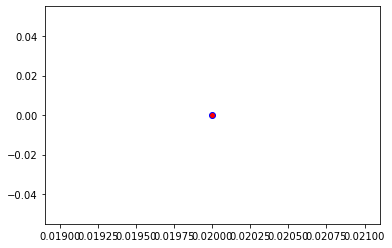

Crafting adversarial images took: 7.384955644607544 seconds 

Images classified as:
000000319100 697 = pajama
000000319184 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


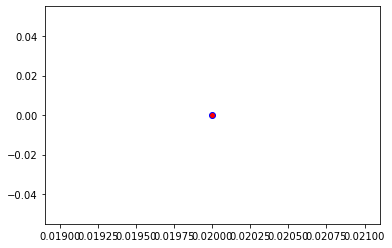

Crafting adversarial images took: 7.615247011184692 seconds 

Images classified as:
000000319369 879 = umbrella
000000319534 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


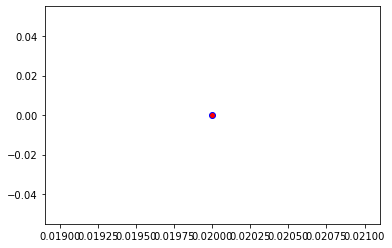

Crafting adversarial images took: 8.220518350601196 seconds 

Images classified as:
000000319607 920 = traffic light
000000319617 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


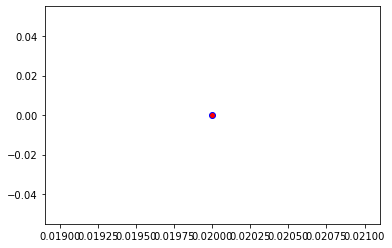

Crafting adversarial images took: 7.509051561355591 seconds 

Images classified as:
000000319696 651 = microwave
000000319721 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


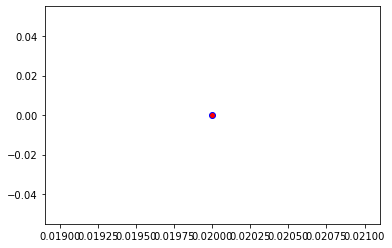

Crafting adversarial images took: 7.572544574737549 seconds 

Images classified as:
000000319935 905 = window shade
000000320232 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


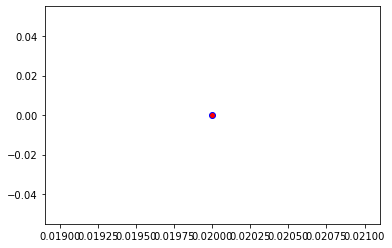

Crafting adversarial images took: 7.646351337432861 seconds 

Images classified as:
000000320425 293 = cheetah
000000320490 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


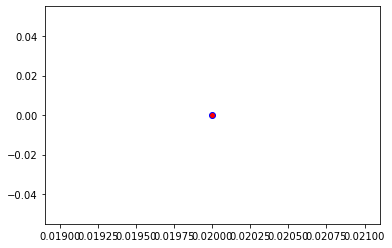

Crafting adversarial images took: 7.746557950973511 seconds 

Images classified as:
000000320554 104 = wallaby
000000320632 340 = zebra
Min values in image-array: 0.5102601 Max values in image-array: 255.0
Min values in image-array: 0.0020010201 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


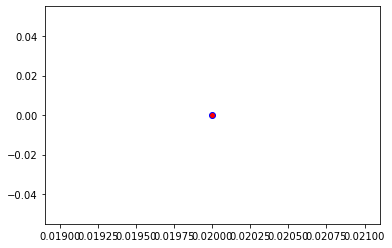

Crafting adversarial images took: 7.578623294830322 seconds 

Images classified as:
000000320642 523 = crutch
000000320664 935 = mashed potato
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


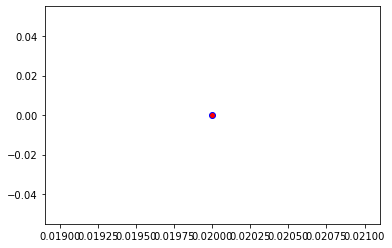

Crafting adversarial images took: 8.015980005264282 seconds 

Images classified as:
000000320696 792 = shovel
000000320706 505 = coffeepot
Min values in image-array: 0.0 Max values in image-array: 254.92853
Min values in image-array: 0.0 Max values in image-array: 0.99971974
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


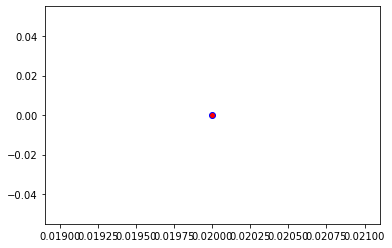

Crafting adversarial images took: 7.520808458328247 seconds 

Images classified as:
000000320743 385 = Indian elephant
000000321118 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


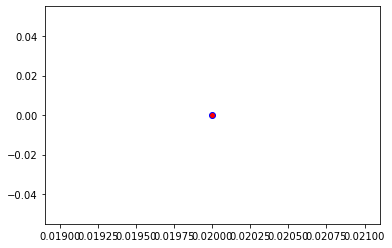

Crafting adversarial images took: 7.584497928619385 seconds 

Images classified as:
000000321214 965 = burrito
000000321333 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 254.98979
Min values in image-array: 0.0 Max values in image-array: 0.99995995
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


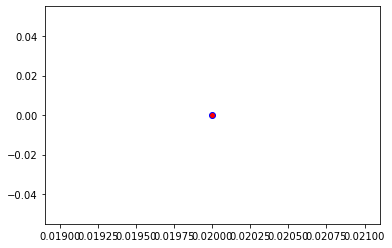

Crafting adversarial images took: 7.599865913391113 seconds 

Images classified as:
000000321557 535 = disk brake
000000321790 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


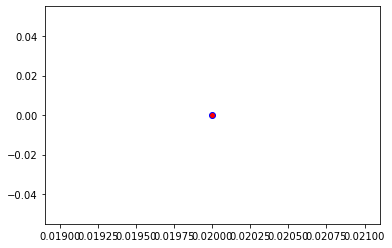

Crafting adversarial images took: 7.6073527336120605 seconds 

Images classified as:
000000321887 5 = ram
000000322163 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


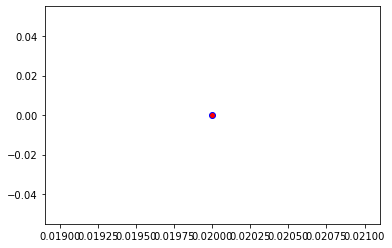

Crafting adversarial images took: 7.5185277462005615 seconds 

Images classified as:
000000322211 932 = pretzel
000000322352 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


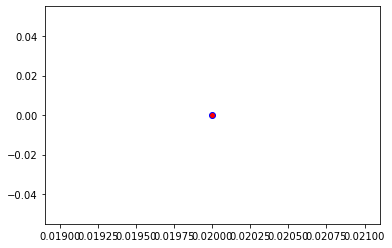

Crafting adversarial images took: 7.661026239395142 seconds 

Images classified as:
000000322429 495 = china cabinet
000000322574 933 = cheeseburger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


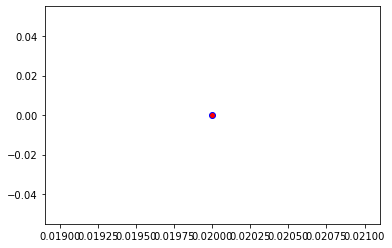

Crafting adversarial images took: 7.505718231201172 seconds 

Images classified as:
000000322610 879 = umbrella
000000322724 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


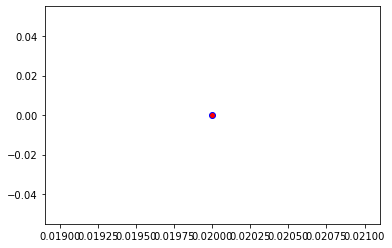

Crafting adversarial images took: 7.556021690368652 seconds 

Images classified as:
000000322829 703 = park bench
000000322844 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


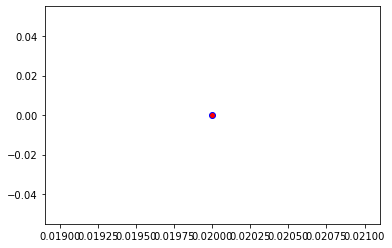

Crafting adversarial images took: 8.295241594314575 seconds 

Images classified as:
000000322864 324 = cab
000000322895 478 = carton
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


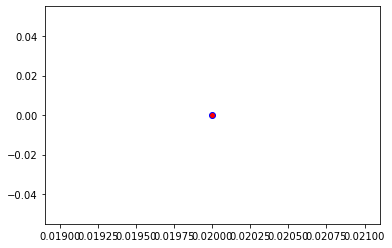

Crafting adversarial images took: 7.565855264663696 seconds 

Images classified as:
000000322944 850 = teddy
000000322959 551 = face powder
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


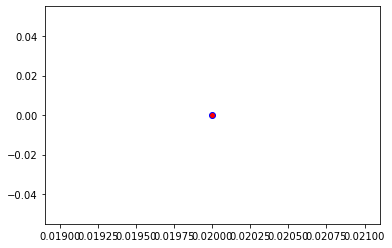

Crafting adversarial images took: 7.415112257003784 seconds 

Images classified as:
000000322968 437 = beacon
000000323151 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


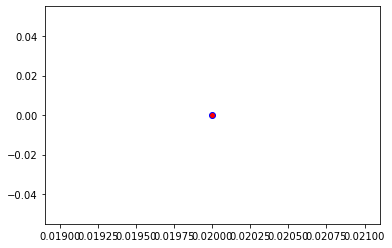

Crafting adversarial images took: 7.767416477203369 seconds 

Images classified as:
000000323202 861 = toilet seat
000000323263 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


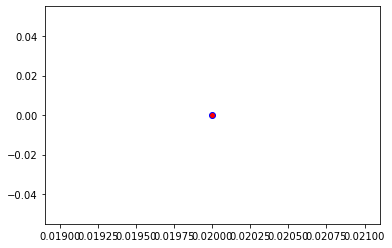

Crafting adversarial images took: 7.775888204574585 seconds 

Images classified as:
000000323355 428 = barrow
000000323496 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


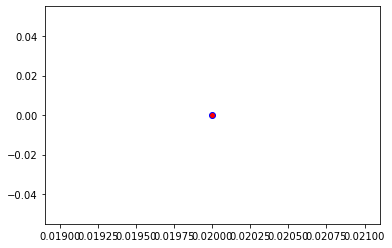

Crafting adversarial images took: 7.534392356872559 seconds 

Images classified as:
000000323571 919 = street sign
000000323709 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


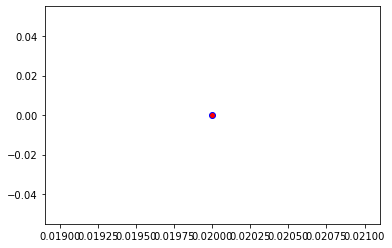

Crafting adversarial images took: 7.877107858657837 seconds 

Images classified as:
000000323751 705 = passenger car
000000323799 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


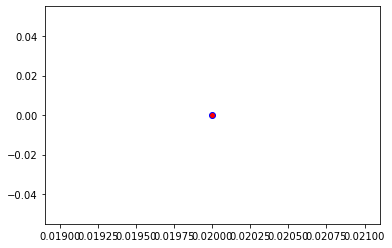

Crafting adversarial images took: 7.471407890319824 seconds 

Images classified as:
000000323828 565 = freight car
000000323895 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


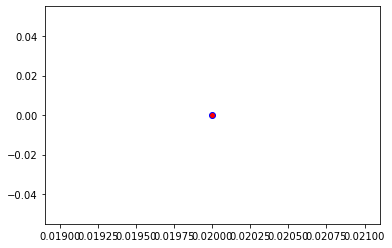

Crafting adversarial images took: 7.700689077377319 seconds 

Images classified as:
000000324158 880 = unicycle
000000324258 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


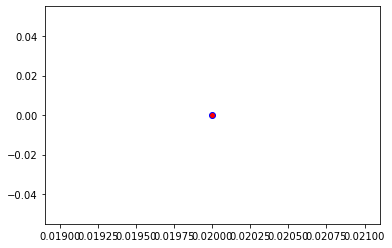

Crafting adversarial images took: 8.04170274734497 seconds 

Images classified as:
000000324614 593 = harmonica
000000324715 844 = switch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


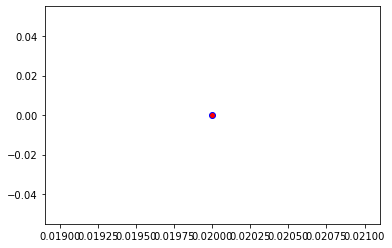

Crafting adversarial images took: 7.606466293334961 seconds 

Images classified as:
000000324818 88 = macaw
000000324927 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


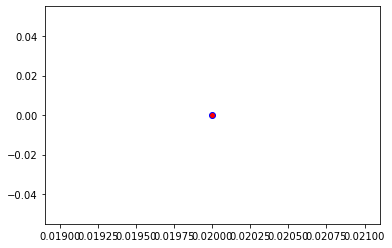

Crafting adversarial images took: 7.667829751968384 seconds 

Images classified as:
000000325031 51 = triceratops
000000325114 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


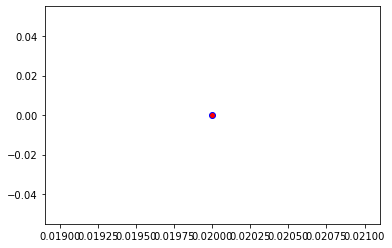

Crafting adversarial images took: 7.642873287200928 seconds 

Images classified as:
000000325306 340 = zebra
000000325347 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


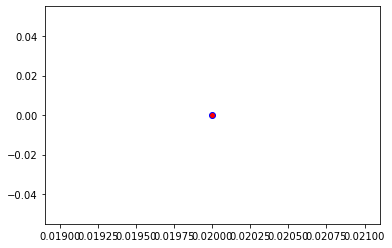

Crafting adversarial images took: 7.481438398361206 seconds 

Images classified as:
000000325483 731 = plunger
000000325527 435 = tub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


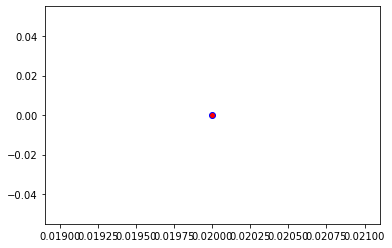

Crafting adversarial images took: 7.5669965744018555 seconds 

Images classified as:
000000325838 620 = laptop
000000325991 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


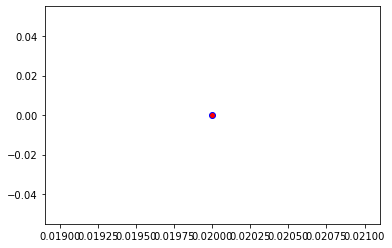

Crafting adversarial images took: 8.211877822875977 seconds 

Images classified as:
000000326082 799 = sliding door
000000326128 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


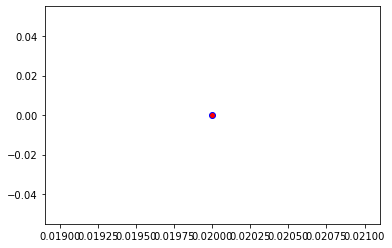

Crafting adversarial images took: 7.657332420349121 seconds 

Images classified as:
000000326174 977 = sandbar
000000326248 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


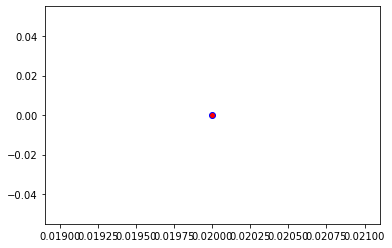

Crafting adversarial images took: 7.659039735794067 seconds 

Images classified as:
000000326462 793 = shower cap
000000326541 585 = hair spray
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


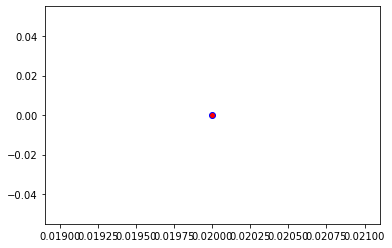

Crafting adversarial images took: 7.73855996131897 seconds 

Images classified as:
000000326542 248 = ski
000000326627 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


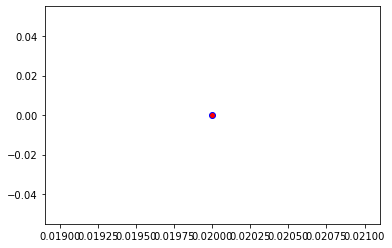

Crafting adversarial images took: 7.678739070892334 seconds 

Images classified as:
000000326970 838 = sunscreen
000000327306 113 = nail
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


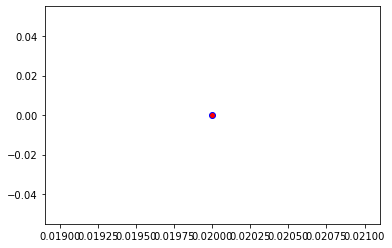

Crafting adversarial images took: 7.486149311065674 seconds 

Images classified as:
000000327592 903 = wig
000000327601 638 = maillot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


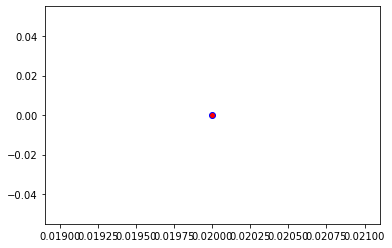

Crafting adversarial images took: 7.829028606414795 seconds 

Images classified as:
000000327605 248 = ski
000000327617 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


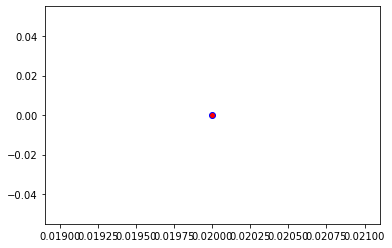

Crafting adversarial images took: 7.524844408035278 seconds 

Images classified as:
000000327701 890 = volleyball
000000327769 896 = washbasin
Min values in image-array: 2.4860384 Max values in image-array: 255.0
Min values in image-array: 0.00974917 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


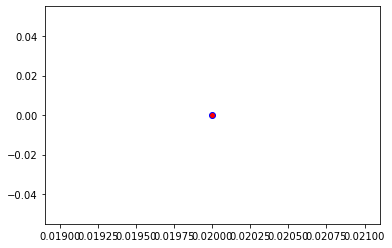

Crafting adversarial images took: 7.599516868591309 seconds 

Images classified as:
000000327780 928 = ice cream
000000327890 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


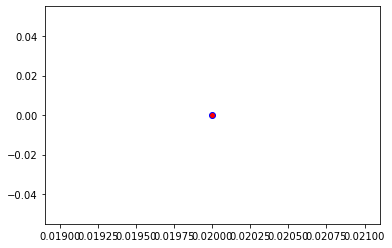

Crafting adversarial images took: 7.590229511260986 seconds 

Images classified as:
000000328030 850 = teddy
000000328117 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


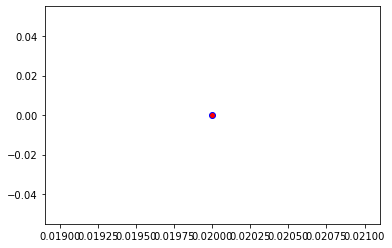

Crafting adversarial images took: 7.4779815673828125 seconds 

Images classified as:
000000328238 805 = soccer ball
000000328286 713 = pier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


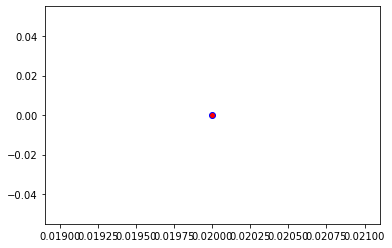

Crafting adversarial images took: 7.458120584487915 seconds 

Images classified as:
000000328337 880 = unicycle
000000328430 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


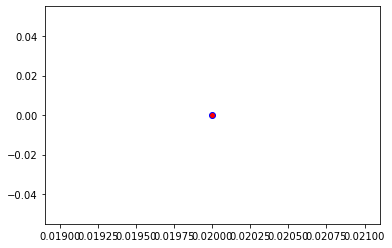

Crafting adversarial images took: 7.804963827133179 seconds 

Images classified as:
000000328601 752 = racket
000000328683 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


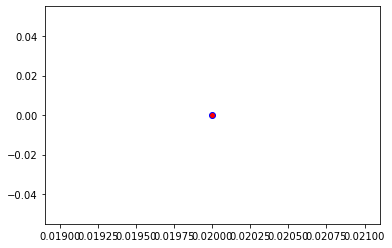

Crafting adversarial images took: 7.5481040477752686 seconds 

Images classified as:
000000328959 861 = toilet seat
000000329041 790 = shopping basket
Min values in image-array: 0.016746521 Max values in image-array: 255.0
Min values in image-array: 6.567263e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


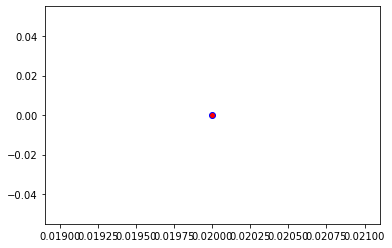

Crafting adversarial images took: 7.547513484954834 seconds 

Images classified as:
000000329080 750 = quilt
000000329219 209 = Chesapeake Bay retriever
Min values in image-array: 0.7633767 Max values in image-array: 255.0
Min values in image-array: 0.0029936342 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


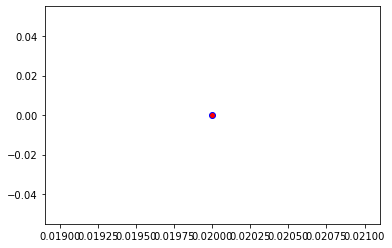

Crafting adversarial images took: 8.286610841751099 seconds 

Images classified as:
000000329319 428 = barrow
000000329323 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


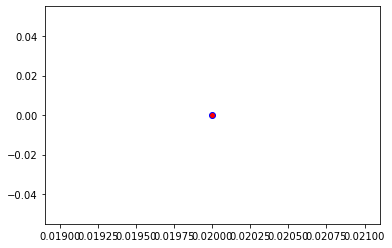

Crafting adversarial images took: 7.566607475280762 seconds 

Images classified as:
000000329447 37 = ox
000000329455 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


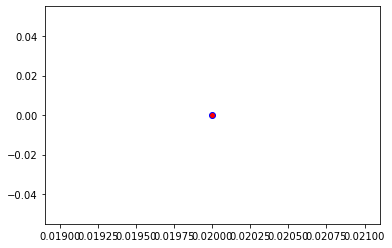

Crafting adversarial images took: 7.543718099594116 seconds 

Images classified as:
000000329456 838 = sunscreen
000000329542 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


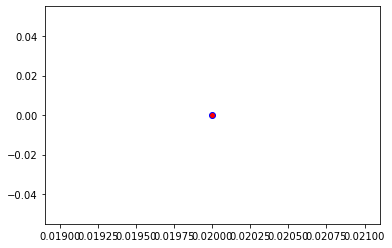

Crafting adversarial images took: 7.82477331161499 seconds 

Images classified as:
000000329614 483 = castle
000000329827 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


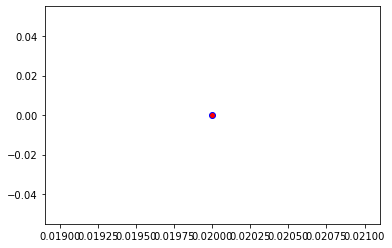

Crafting adversarial images took: 7.7274980545043945 seconds 

Images classified as:
000000330369 554 = fireboat
000000330396 203 = West Highland white terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


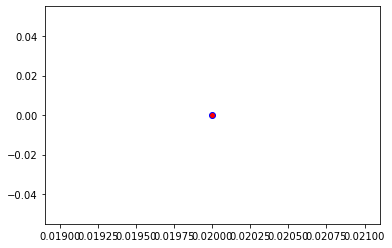

Crafting adversarial images took: 7.643087863922119 seconds 

Images classified as:
000000330554 745 = projector
000000330790 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


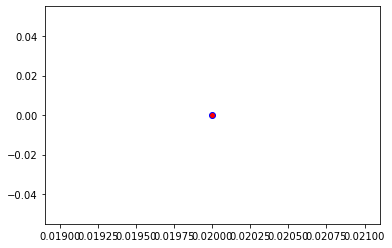

Crafting adversarial images took: 7.635417938232422 seconds 

Images classified as:
000000330818 415 = bakery
000000331075 232 = Border collie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


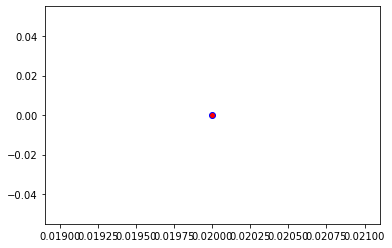

Crafting adversarial images took: 7.520351886749268 seconds 

Images classified as:
000000331280 37 = ox
000000331317 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


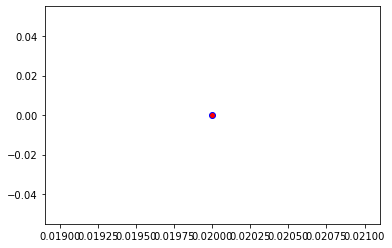

Crafting adversarial images took: 7.496753692626953 seconds 

Images classified as:
000000331352 861 = toilet seat
000000331569 969 = eggnog
Min values in image-array: 0.47805998 Max values in image-array: 255.0
Min values in image-array: 0.001874745 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


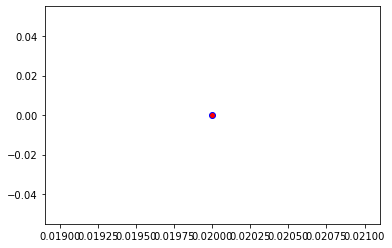

Crafting adversarial images took: 7.739387512207031 seconds 

Images classified as:
000000331604 701 = parachute
000000331799 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


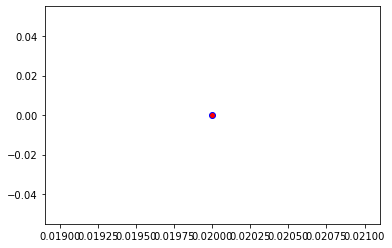

Crafting adversarial images took: 7.497411251068115 seconds 

Images classified as:
000000331817 122 = American lobster
000000332318 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


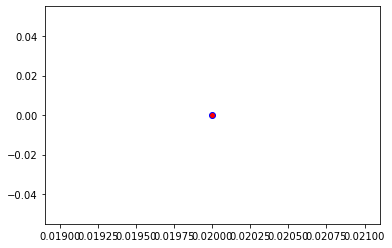

Crafting adversarial images took: 7.557600259780884 seconds 

Images classified as:
000000332351 977 = sandbar
000000332455 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


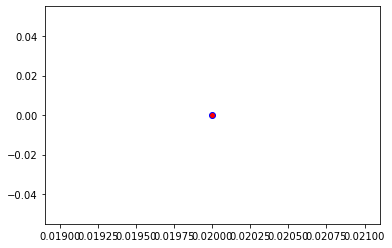

Crafting adversarial images took: 7.774784326553345 seconds 

Images classified as:
000000332570 590 = hand-held computer
000000332845 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


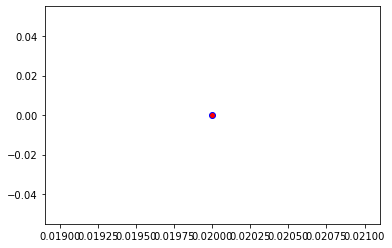

Crafting adversarial images took: 7.43680214881897 seconds 

Images classified as:
000000332901 5 = ram
000000333069 352 = impala
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


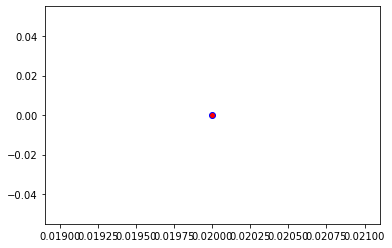

Crafting adversarial images took: 7.607639312744141 seconds 

Images classified as:
000000333237 669 = mosquito net
000000333402 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


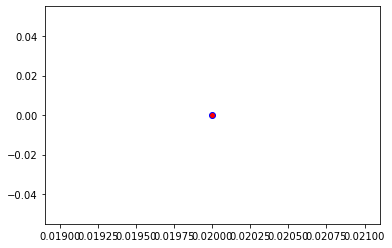

Crafting adversarial images took: 8.922729015350342 seconds 

Images classified as:
000000333697 919 = street sign
000000333745 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


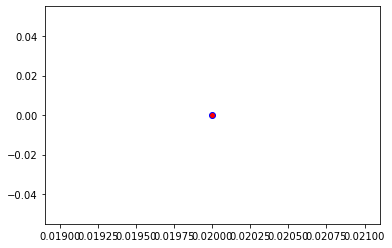

Crafting adversarial images took: 7.731867074966431 seconds 

Images classified as:
000000333772 673 = mouse
000000333956 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


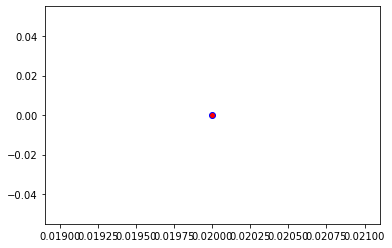

Crafting adversarial images took: 7.661280870437622 seconds 

Images classified as:
000000334006 569 = garbage truck
000000334309 105 = ear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


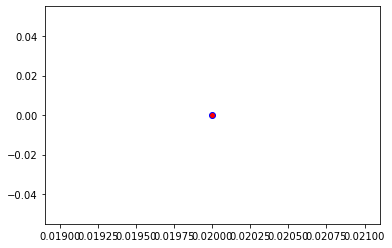

Crafting adversarial images took: 7.880943298339844 seconds 

Images classified as:
000000334371 829 = streetcar
000000334399 149 = gong
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


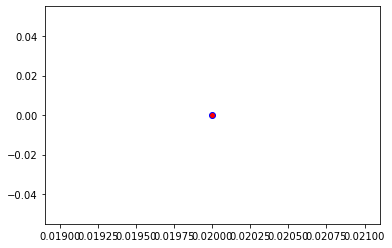

Crafting adversarial images took: 7.730710506439209 seconds 

Images classified as:
000000334417 906 = Windsor tie
000000334483 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


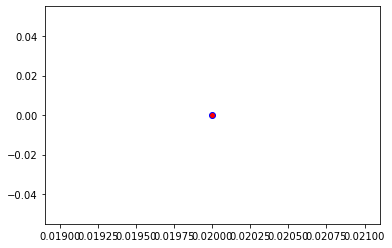

Crafting adversarial images took: 7.657704591751099 seconds 

Images classified as:
000000334521 287 = lynx
000000334530 500 = cliff
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


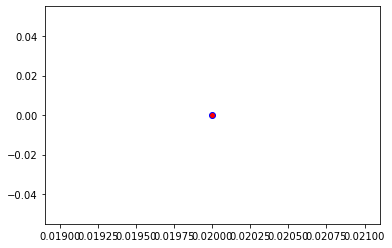

Crafting adversarial images took: 7.47880744934082 seconds 

Images classified as:
000000334555 690 = oxcart
000000334719 500 = cliff
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


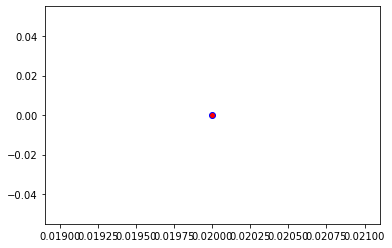

Crafting adversarial images took: 7.580864906311035 seconds 

Images classified as:
000000334767 248 = ski
000000334977 446 = binder
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


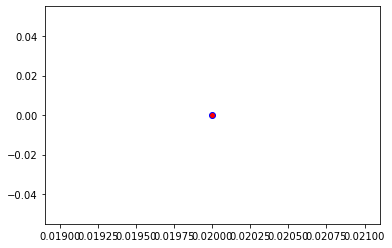

Crafting adversarial images took: 7.726089715957642 seconds 

Images classified as:
000000335081 850 = teddy
000000335177 727 = planetarium
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


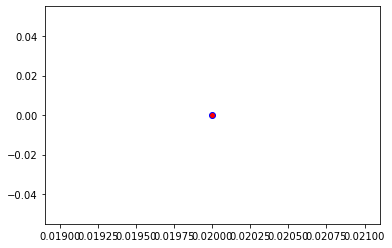

Crafting adversarial images took: 7.5534563064575195 seconds 

Images classified as:
000000335328 693 = paddle
000000335427 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


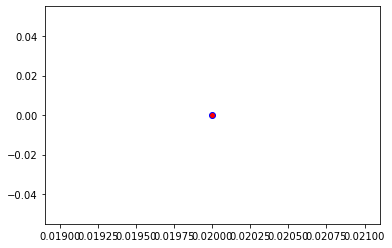

Crafting adversarial images took: 7.602334499359131 seconds 

Images classified as:
000000335450 339 = sorrel
000000335529 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


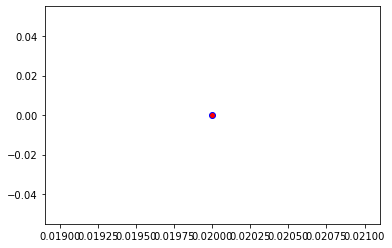

Crafting adversarial images took: 7.502048015594482 seconds 

Images classified as:
000000335658 673 = mouse
000000335800 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


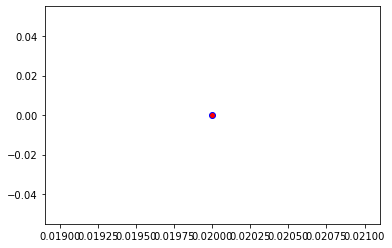

Crafting adversarial images took: 7.461873531341553 seconds 

Images classified as:
000000335954 712 = Petri dish
000000336053 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


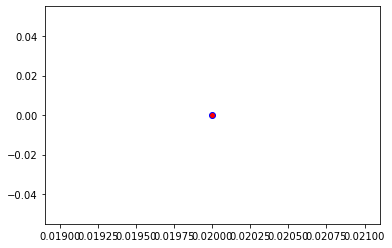

Crafting adversarial images took: 7.675584554672241 seconds 

Images classified as:
000000336209 602 = horizontal bar
000000336232 665 = moped
Min values in image-array: 0.0 Max values in image-array: 254.77118
Min values in image-array: 0.0 Max values in image-array: 0.99910265
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


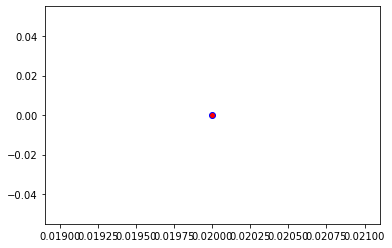

Crafting adversarial images took: 7.602370977401733 seconds 

Images classified as:
000000336265 351 = hartebeest
000000336309 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


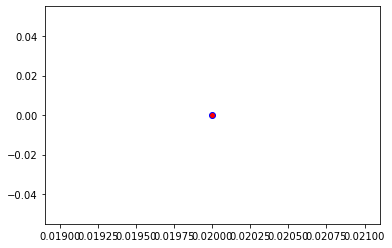

Crafting adversarial images took: 8.14417552947998 seconds 

Images classified as:
000000336356 963 = pizza
000000336587 919 = street sign
Min values in image-array: 0.022321224 Max values in image-array: 255.0
Min values in image-array: 8.7534216e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


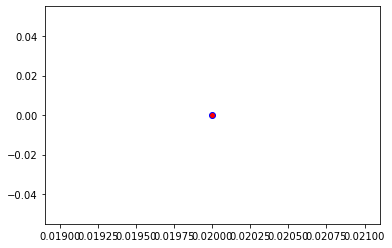

Crafting adversarial images took: 7.859334468841553 seconds 

Images classified as:
000000336628 407 = ambulance
000000336658 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


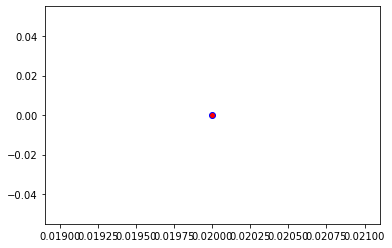

Crafting adversarial images took: 7.546098470687866 seconds 

Images classified as:
000000337055 54 = hog
000000337498 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


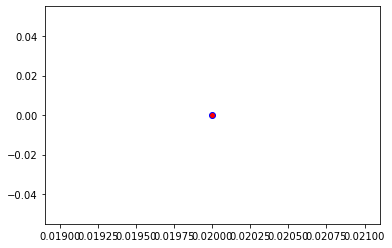

Crafting adversarial images took: 7.787021160125732 seconds 

Images classified as:
000000337987 82 = ruffed grouse
000000338191 448 = birdhouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


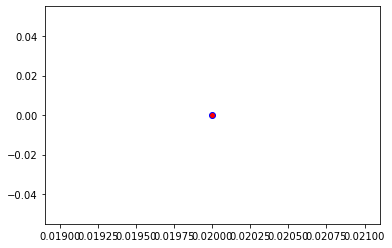

Crafting adversarial images took: 7.685855150222778 seconds 

Images classified as:
000000338219 535 = disk brake
000000338304 864 = wreck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


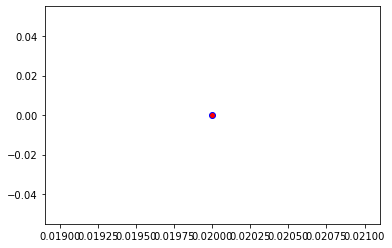

Crafting adversarial images took: 7.615221261978149 seconds 

Images classified as:
000000338325 404 = airliner
000000338428 609 = jeep
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


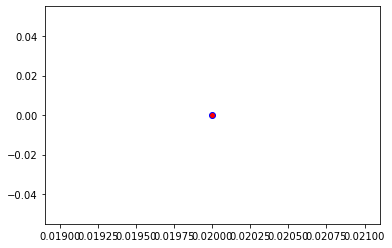

Crafting adversarial images took: 7.522343873977661 seconds 

Images classified as:
000000338532 9 = ostrich
000000338560 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


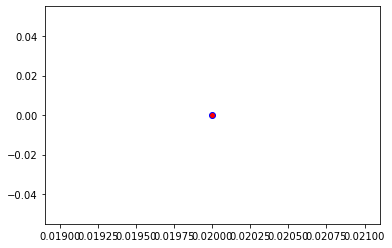

Crafting adversarial images took: 7.586004257202148 seconds 

Images classified as:
000000338624 523 = crutch
000000338625 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


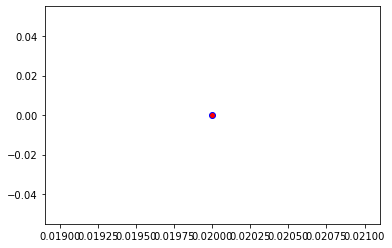

Crafting adversarial images took: 7.827100515365601 seconds 

Images classified as:
000000338718 919 = street sign
000000338901 171 = Italian greyhound
Min values in image-array: 0.0 Max values in image-array: 254.97934
Min values in image-array: 0.0 Max values in image-array: 0.999919
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


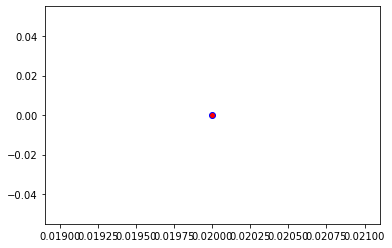

Crafting adversarial images took: 7.686871290206909 seconds 

Images classified as:
000000338905 762 = restaurant
000000338986 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


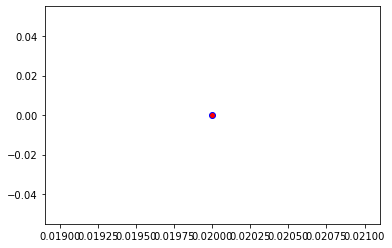

Crafting adversarial images took: 7.529888153076172 seconds 

Images classified as:
000000339442 954 = banana
000000339823 400 = gown
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


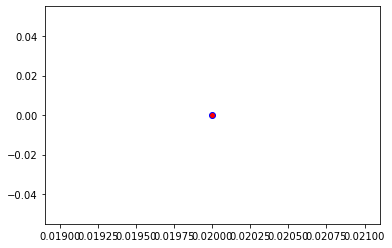

Crafting adversarial images took: 7.4972546100616455 seconds 

Images classified as:
000000339870 920 = traffic light
000000340015 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


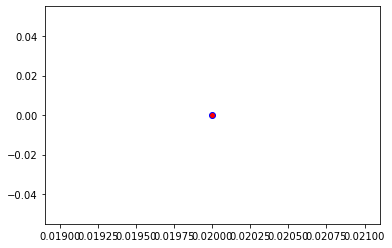

Crafting adversarial images took: 7.578060865402222 seconds 

Images classified as:
000000340175 532 = dining table
000000340272 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


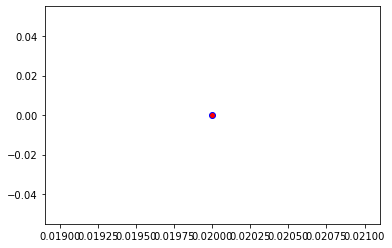

Crafting adversarial images took: 7.527032852172852 seconds 

Images classified as:
000000340451 703 = park bench
000000340697 680 = nipple
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


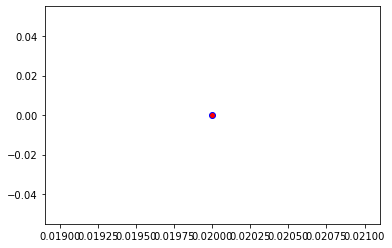

Crafting adversarial images took: 7.504345893859863 seconds 

Images classified as:
000000340894 527 = desktop computer
000000340930 600 = hook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


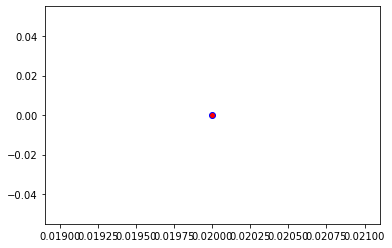

Crafting adversarial images took: 8.24859070777893 seconds 

Images classified as:
000000341058 919 = street sign
000000341094 595 = harvester
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


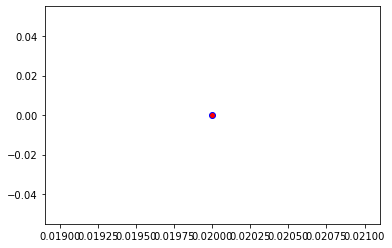

Crafting adversarial images took: 7.560151815414429 seconds 

Images classified as:
000000341196 150 = sea lion
000000341469 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


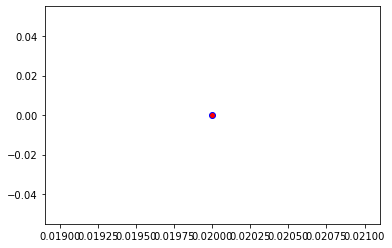

Crafting adversarial images took: 7.547169923782349 seconds 

Images classified as:
000000341681 752 = racket
000000341719 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


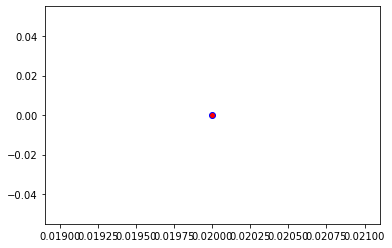

Crafting adversarial images took: 7.810925245285034 seconds 

Images classified as:
000000341828 739 = potter's wheel
000000341921 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


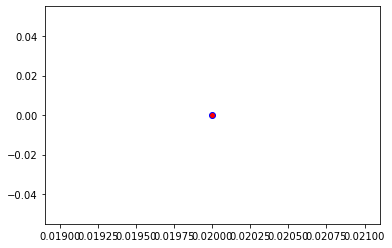

Crafting adversarial images took: 7.7835681438446045 seconds 

Images classified as:
000000341973 997 = bolete
000000342006 975 = lakeside
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


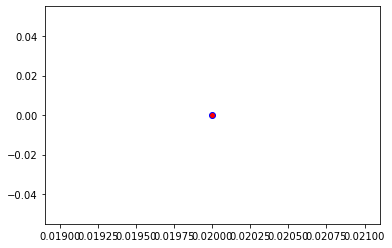

Crafting adversarial images took: 7.569242477416992 seconds 

Images classified as:
000000342128 805 = soccer ball
000000342186 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


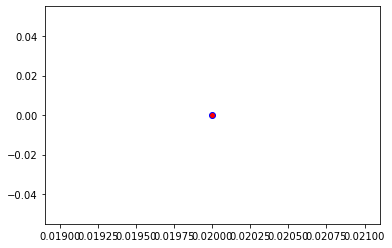

Crafting adversarial images took: 7.715708494186401 seconds 

Images classified as:
000000342295 435 = tub
000000342367 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


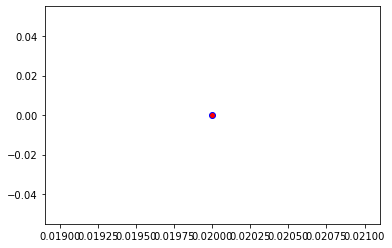

Crafting adversarial images took: 7.605571031570435 seconds 

Images classified as:
000000342397 248 = ski
000000342971 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


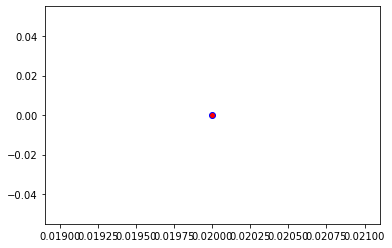

Crafting adversarial images took: 7.535556077957153 seconds 

Images classified as:
000000343076 281 = tabby
000000343149 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


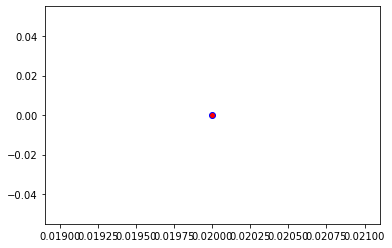

Crafting adversarial images took: 7.872241973876953 seconds 

Images classified as:
000000343218 752 = racket
000000343315 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


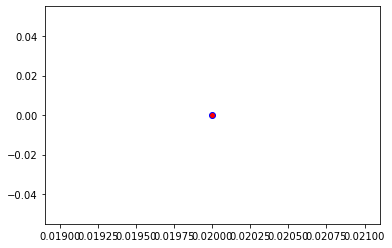

Crafting adversarial images took: 7.530655860900879 seconds 

Images classified as:
000000343453 248 = ski
000000343466 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


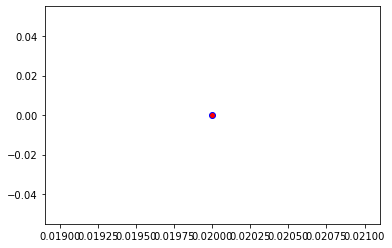

Crafting adversarial images took: 7.545993804931641 seconds 

Images classified as:
000000343496 920 = traffic light
000000343524 752 = racket
Min values in image-array: 0.0 Max values in image-array: 254.63696
Min values in image-array: 0.0 Max values in image-array: 0.99857634
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


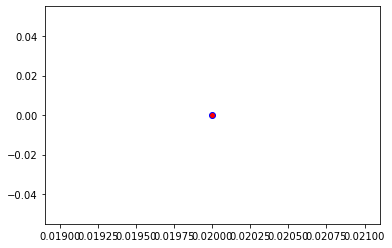

Crafting adversarial images took: 7.646427392959595 seconds 

Images classified as:
000000343561 444 = bicycle-built-for-two
000000343706 893 = wallet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


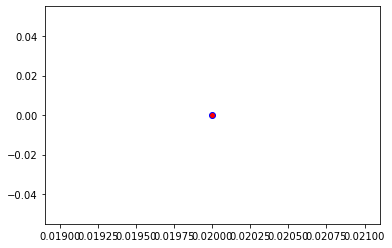

Crafting adversarial images took: 7.561033248901367 seconds 

Images classified as:
000000343803 429 = baseball
000000343934 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


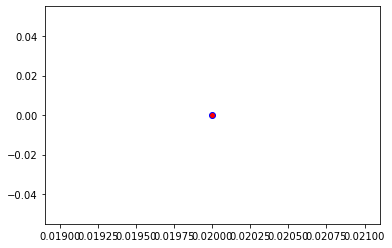

Crafting adversarial images took: 7.644266843795776 seconds 

Images classified as:
000000343937 248 = ski
000000343976 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


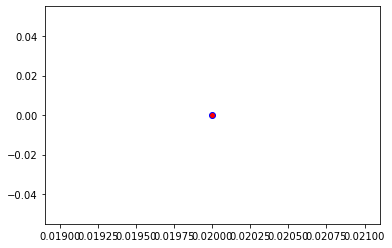

Crafting adversarial images took: 8.178209781646729 seconds 

Images classified as:
000000344029 874 = trolleybus
000000344059 290 = jaguar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


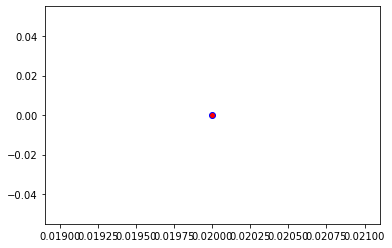

Crafting adversarial images took: 7.591066598892212 seconds 

Images classified as:
000000344100 666 = mortar
000000344268 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


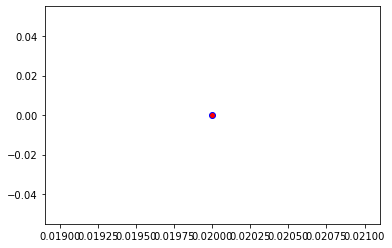

Crafting adversarial images took: 7.669762849807739 seconds 

Images classified as:
000000344611 919 = street sign
000000344614 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


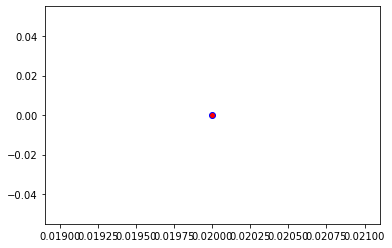

Crafting adversarial images took: 7.709946155548096 seconds 

Images classified as:
000000344621 831 = studio couch
000000344795 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


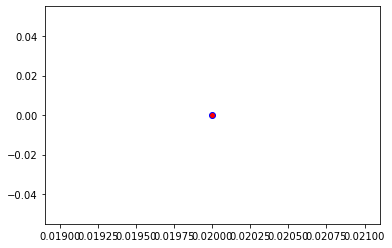

Crafting adversarial images took: 7.74806547164917 seconds 

Images classified as:
000000344816 547 = electric locomotive
000000344888 856 = thresher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


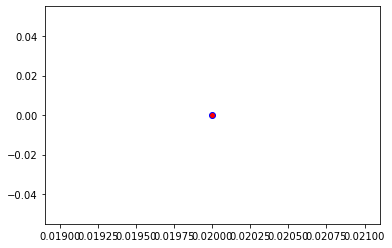

Crafting adversarial images took: 7.697771310806274 seconds 

Images classified as:
000000344909 637 = mailbox
000000345027 428 = barrow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


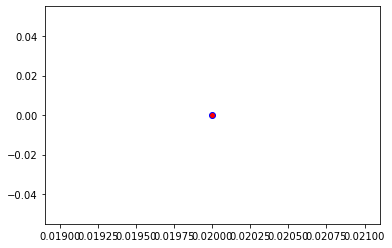

Crafting adversarial images took: 7.687330484390259 seconds 

Images classified as:
000000345252 731 = plunger
000000345261 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


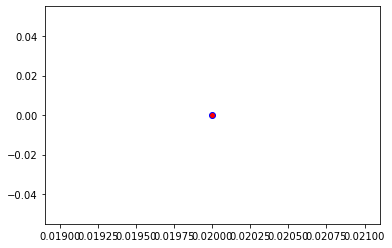

Crafting adversarial images took: 7.6459455490112305 seconds 

Images classified as:
000000345356 813 = spatula
000000345361 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


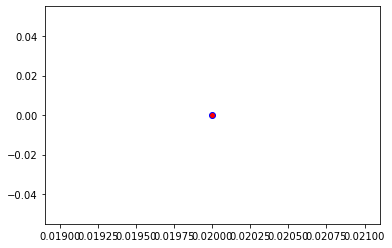

Crafting adversarial images took: 7.482180595397949 seconds 

Images classified as:
000000345385 116 = cradle
000000345397 499 = cleaver
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


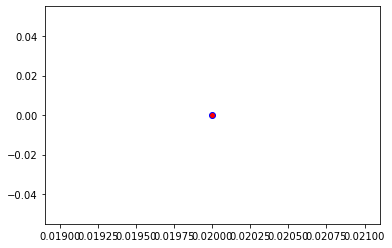

Crafting adversarial images took: 7.686383485794067 seconds 

Images classified as:
000000345466 981 = ballplayer
000000345469 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


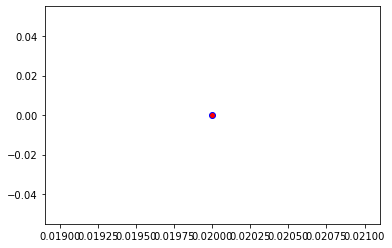

Crafting adversarial images took: 7.499622344970703 seconds 

Images classified as:
000000345941 461 = plate
000000346232 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


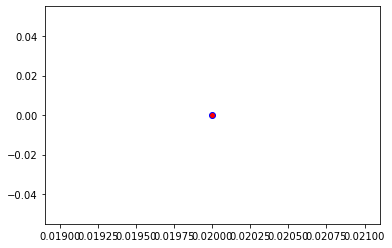

Crafting adversarial images took: 7.552337408065796 seconds 

Images classified as:
000000346638 620 = laptop
000000346703 457 = bow tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


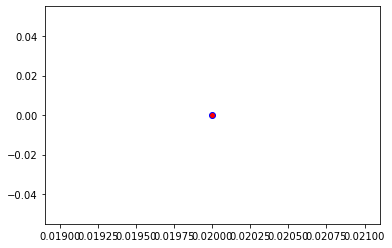

Crafting adversarial images took: 7.605485916137695 seconds 

Images classified as:
000000346707 953 = pineapple
000000346905 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


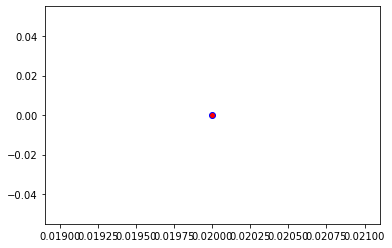

Crafting adversarial images took: 7.617396354675293 seconds 

Images classified as:
000000346968 419 = Band Aid
000000347163 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


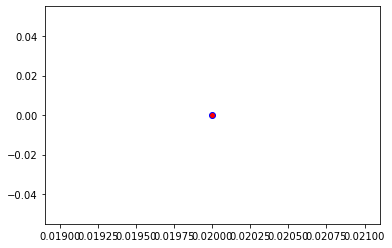

Crafting adversarial images took: 7.594770908355713 seconds 

Images classified as:
000000347174 655 = miniskirt
000000347254 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


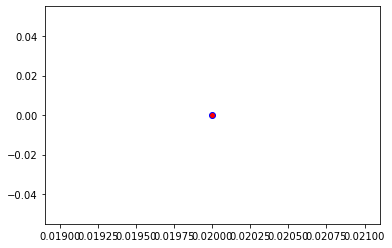

Crafting adversarial images took: 8.18821668624878 seconds 

Images classified as:
000000347265 248 = ski
000000347335 935 = mashed potato
Min values in image-array: 0.0 Max values in image-array: 254.19756
Min values in image-array: 0.0 Max values in image-array: 0.9968532
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


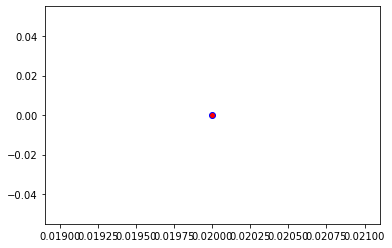

Crafting adversarial images took: 7.549908399581909 seconds 

Images classified as:
000000347370 951 = lemon
000000347456 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


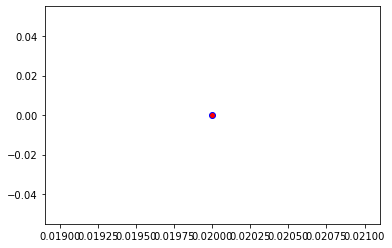

Crafting adversarial images took: 7.493434190750122 seconds 

Images classified as:
000000347544 675 = moving van
000000347664 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


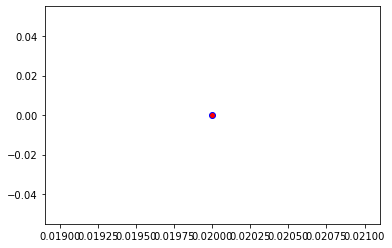

Crafting adversarial images took: 7.715834856033325 seconds 

Images classified as:
000000347693 799 = sliding door
000000347930 207 = golden retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


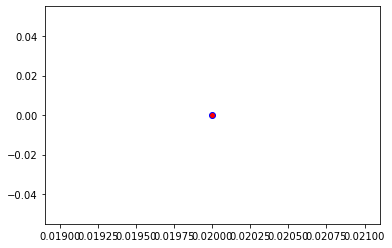

Crafting adversarial images took: 7.635293483734131 seconds 

Images classified as:
000000348012 473 = can opener
000000348045 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


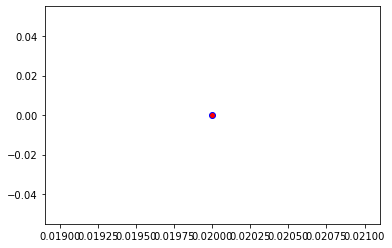

Crafting adversarial images took: 7.756507158279419 seconds 

Images classified as:
000000348216 435 = tub
000000348243 343 = warthog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


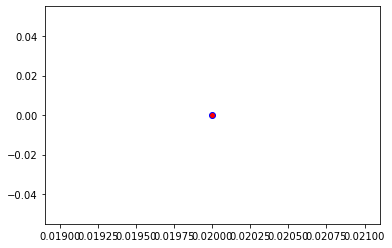

Crafting adversarial images took: 7.595829963684082 seconds 

Images classified as:
000000348481 823 = stethoscope
000000348488 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


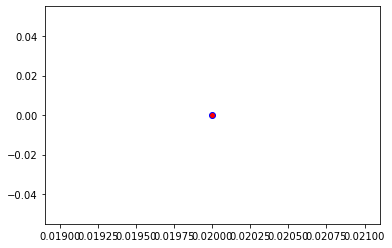

Crafting adversarial images took: 7.496063947677612 seconds 

Images classified as:
000000348708 461 = plate
000000348881 466 = bullet train
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


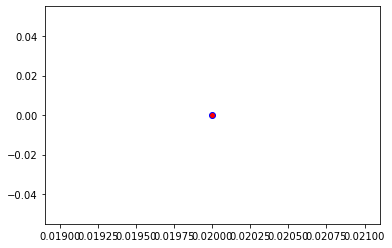

Crafting adversarial images took: 7.468090534210205 seconds 

Images classified as:
000000349152 549 = envelope
000000349184 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


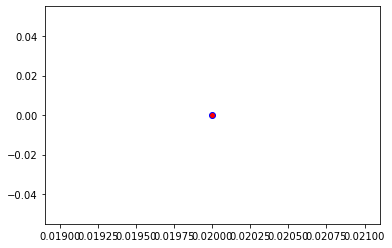

Crafting adversarial images took: 7.617180347442627 seconds 

Images classified as:
000000349302 354 = Arabian camel
000000349480 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


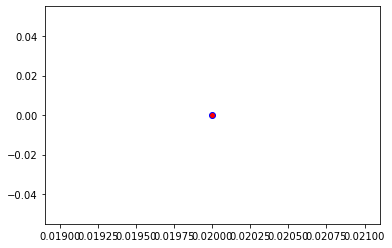

Crafting adversarial images took: 7.532066345214844 seconds 

Images classified as:
000000349594 697 = pajama
000000349678 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


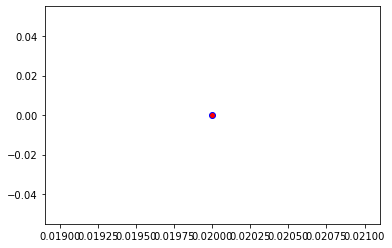

Crafting adversarial images took: 7.66958475112915 seconds 

Images classified as:
000000349837 894 = wardrobe
000000349860 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


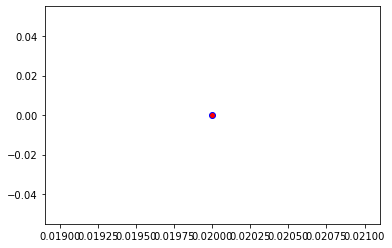

Crafting adversarial images took: 7.8259711265563965 seconds 

Images classified as:
000000350002 601 = hoopskirt
000000350003 407 = ambulance
Min values in image-array: 0.50105286 Max values in image-array: 255.0
Min values in image-array: 0.0019649132 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


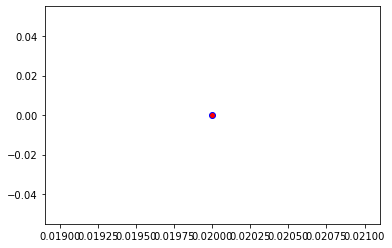

Crafting adversarial images took: 7.50490403175354 seconds 

Images classified as:
000000350019 891 = waffle iron
000000350023 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


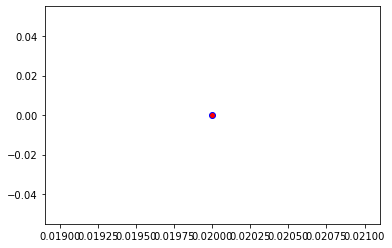

Crafting adversarial images took: 7.678518295288086 seconds 

Images classified as:
000000350054 598 = home theater
000000350122 877 = turnstile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


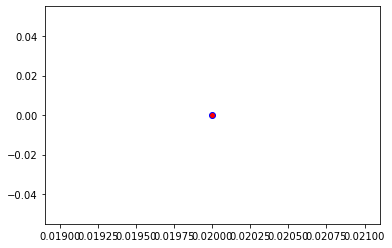

Crafting adversarial images took: 8.31807565689087 seconds 

Images classified as:
000000350148 934 = hotdog
000000350388 925 = consomme
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


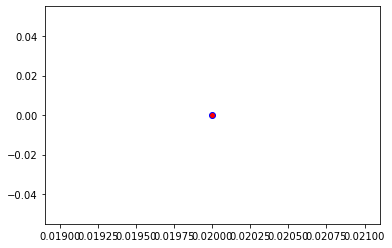

Crafting adversarial images took: 7.537095785140991 seconds 

Images classified as:
000000350405 248 = ski
000000350488 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


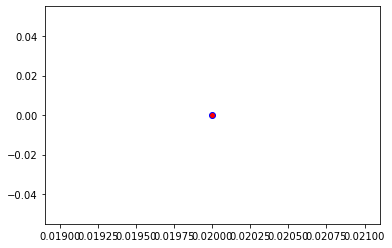

Crafting adversarial images took: 8.00313138961792 seconds 

Images classified as:
000000350607 703 = park bench
000000350679 606 = iron
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


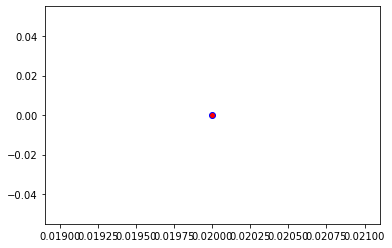

Crafting adversarial images took: 7.9306321144104 seconds 

Images classified as:
000000350833 794 = shower curtain
000000351096 473 = can opener
Min values in image-array: 0.6428833 Max values in image-array: 255.0
Min values in image-array: 0.002521111 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


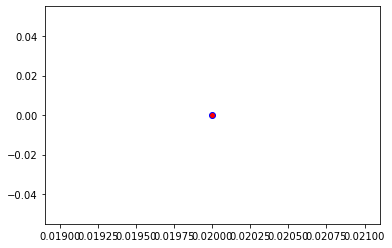

Crafting adversarial images took: 7.657787561416626 seconds 

Images classified as:
000000351331 963 = pizza
000000351362 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


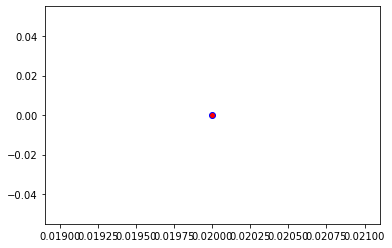

Crafting adversarial images took: 7.6638405323028564 seconds 

Images classified as:
000000351530 703 = park bench
000000351559 593 = harp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


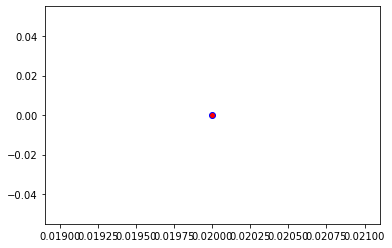

Crafting adversarial images took: 7.772935628890991 seconds 

Images classified as:
000000351589 706 = patio
000000351609 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


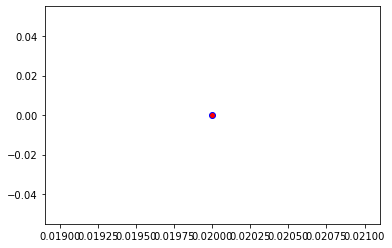

Crafting adversarial images took: 7.465382814407349 seconds 

Images classified as:
000000351810 797 = sleeping bag
000000351823 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


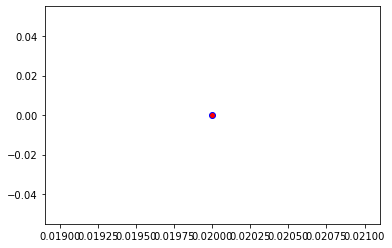

Crafting adversarial images took: 7.576581001281738 seconds 

Images classified as:
000000352491 705 = passenger car
000000352582 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


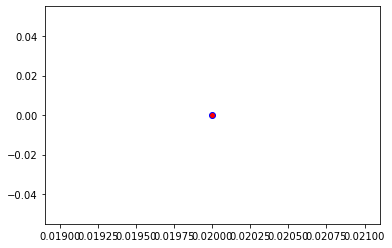

Crafting adversarial images took: 7.6015565395355225 seconds 

Images classified as:
000000352584 515 = cowboy hat
000000352618 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


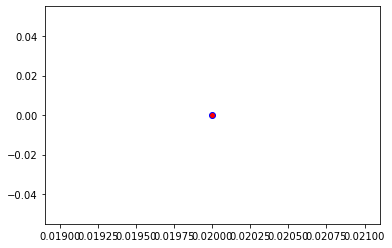

Crafting adversarial images took: 7.592550277709961 seconds 

Images classified as:
000000352684 617 = lab coat
000000352760 88 = macaw
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


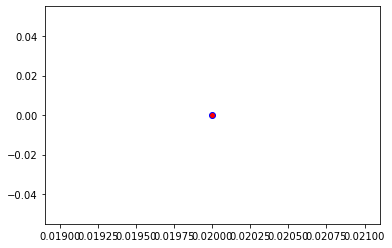

Crafting adversarial images took: 7.613140821456909 seconds 

Images classified as:
000000352900 959 = carbonara
000000353027 964 = potpie
Min values in image-array: 0.0 Max values in image-array: 251.38661
Min values in image-array: 0.0 Max values in image-array: 0.98582983
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


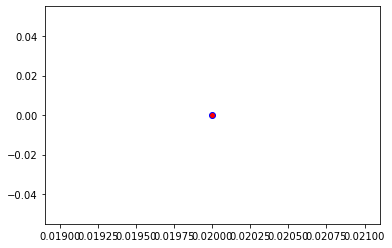

Crafting adversarial images took: 7.576914310455322 seconds 

Images classified as:
000000353051 339 = sorrel
000000353096 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 254.81027
Min values in image-array: 0.0 Max values in image-array: 0.99925596
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


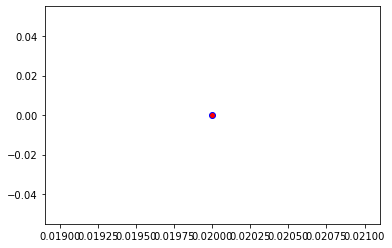

Crafting adversarial images took: 7.47577166557312 seconds 

Images classified as:
000000353180 652 = military uniform
000000353518 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


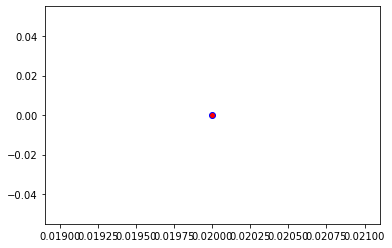

Crafting adversarial images took: 8.005236625671387 seconds 

Images classified as:
000000353970 896 = washbasin
000000354072 435 = bathtub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


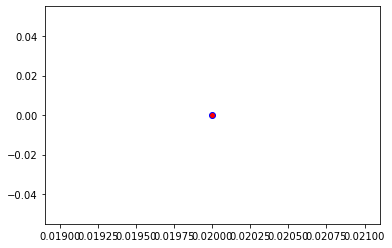

Crafting adversarial images took: 8.012649059295654 seconds 

Images classified as:
000000354307 54 = hog
000000354547 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


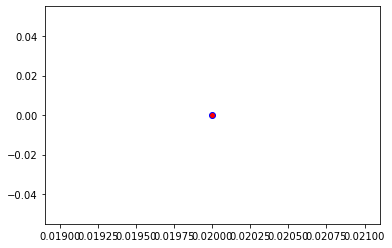

Crafting adversarial images took: 7.720752716064453 seconds 

Images classified as:
000000354753 920 = traffic light
000000354829 435 = bathtub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


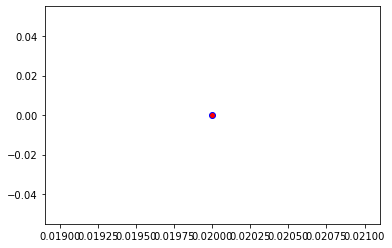

Crafting adversarial images took: 7.856283664703369 seconds 

Images classified as:
000000355169 781 = scoreboard
000000355240 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


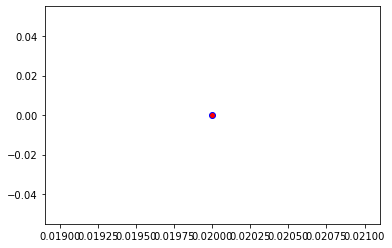

Crafting adversarial images took: 7.689544916152954 seconds 

Images classified as:
000000355257 830 = stretcher
000000355325 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


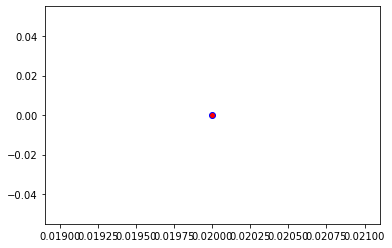

Crafting adversarial images took: 7.773000478744507 seconds 

Images classified as:
000000355610 850 = teddy
000000355677 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


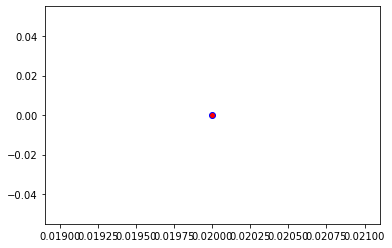

Crafting adversarial images took: 7.2510011196136475 seconds 

Images classified as:
000000355817 779 = school bus
000000355905 243 = bull mastiff
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


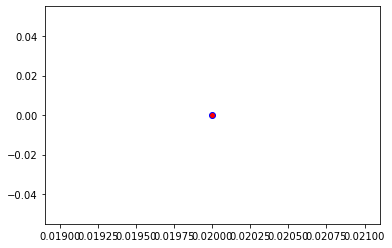

Crafting adversarial images took: 7.700955629348755 seconds 

Images classified as:
000000356094 981 = ballplayer
000000356125 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


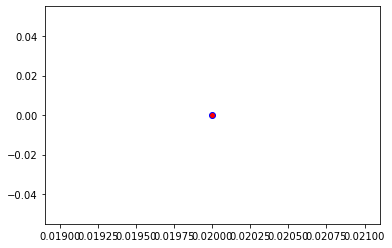

Crafting adversarial images took: 7.819371700286865 seconds 

Images classified as:
000000356169 660 = mobile home
000000356248 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


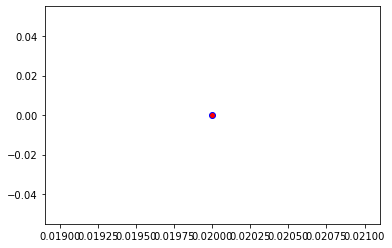

Crafting adversarial images took: 7.533806800842285 seconds 

Images classified as:
000000356261 346 = water buffalo
000000356347 910 = wooden spoon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


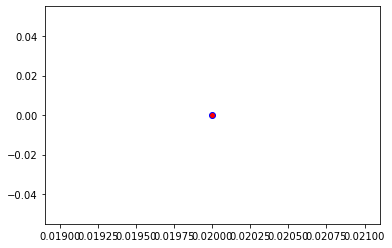

Crafting adversarial images took: 7.683189868927002 seconds 

Images classified as:
000000356387 870 = tricycle
000000356424 927 = trifle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


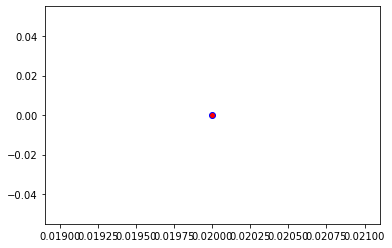

Crafting adversarial images took: 7.617774963378906 seconds 

Images classified as:
000000356427 634 = lumbermill
000000356428 509 = confectionery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


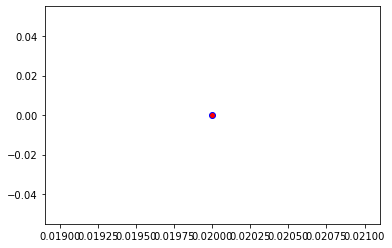

Crafting adversarial images took: 7.288222551345825 seconds 

Images classified as:
000000356432 831 = studio couch
000000356498 941 = acorn squash
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


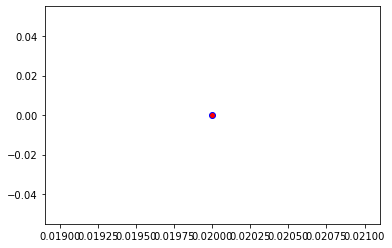

Crafting adversarial images took: 7.8217432498931885 seconds 

Images classified as:
000000356505 445 = bikini
000000356531 891 = waffle iron
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


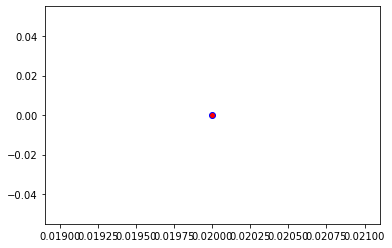

Crafting adversarial images took: 7.651557683944702 seconds 

Images classified as:
000000356612 690 = oxcart
000000356968 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


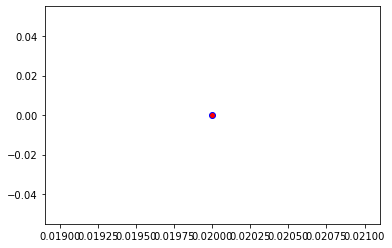

Crafting adversarial images took: 8.087711334228516 seconds 

Images classified as:
000000357060 141 = redshank
000000357081 37 = ox
Min values in image-array: 1.1818852 Max values in image-array: 255.0
Min values in image-array: 0.004634844 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


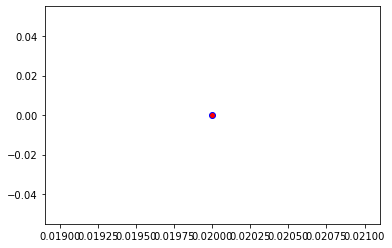

Crafting adversarial images took: 7.840642690658569 seconds 

Images classified as:
000000357238 701 = parachute
000000357430 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


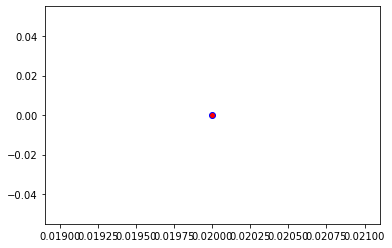

Crafting adversarial images took: 7.645443439483643 seconds 

Images classified as:
000000357459 192 = cairn
000000357501 748 = purse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


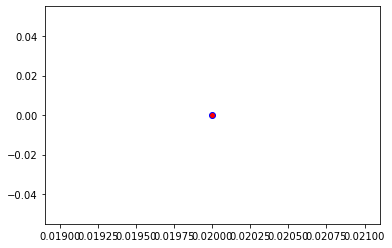

Crafting adversarial images took: 7.5748069286346436 seconds 

Images classified as:
000000357567 794 = shower curtain
000000357737 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


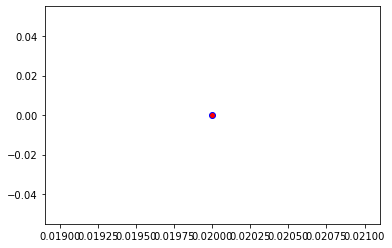

Crafting adversarial images took: 7.767759799957275 seconds 

Images classified as:
000000357742 248 = ski
000000357748 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


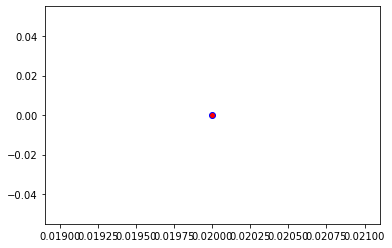

Crafting adversarial images took: 7.788262605667114 seconds 

Images classified as:
000000357816 429 = baseball
000000357888 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


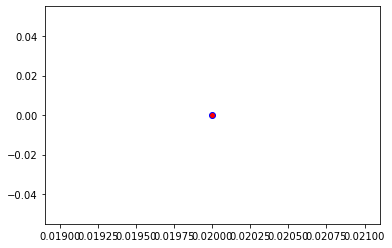

Crafting adversarial images took: 7.661574602127075 seconds 

Images classified as:
000000357903 963 = pizza
000000357941 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


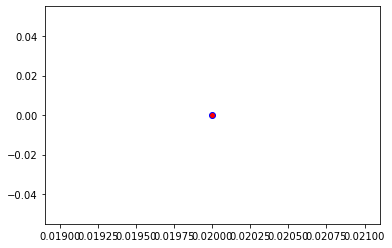

Crafting adversarial images took: 7.787664413452148 seconds 

Images classified as:
000000357978 840 = swab
000000358195 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


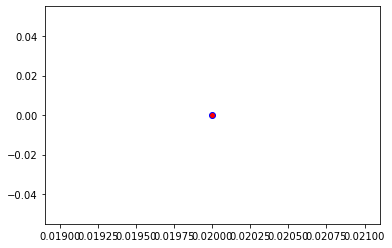

Crafting adversarial images took: 7.7553794384002686 seconds 

Images classified as:
000000358427 937 = broccoli
000000358525 681 = notebook
Min values in image-array: 0.023431778 Max values in image-array: 255.0
Min values in image-array: 9.188933e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


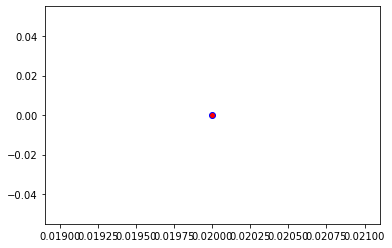

Crafting adversarial images took: 7.682695150375366 seconds 

Images classified as:
000000358923 879 = umbrella
000000359135 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


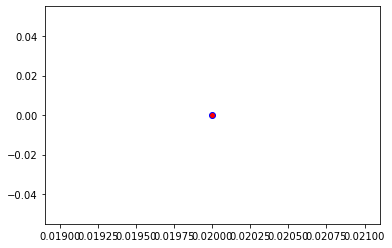

Crafting adversarial images took: 7.76214337348938 seconds 

Images classified as:
000000359219 964 = potpie
000000359540 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


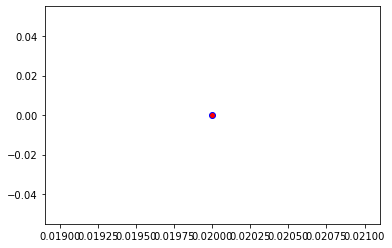

Crafting adversarial images took: 7.6778717041015625 seconds 

Images classified as:
000000359677 724 = pirate
000000359781 354 = Arabian camel
Min values in image-array: 0.07176555 Max values in image-array: 253.58777
Min values in image-array: 0.00028143352 Max values in image-array: 0.99446183
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


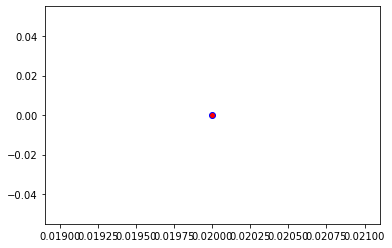

Crafting adversarial images took: 7.564695835113525 seconds 

Images classified as:
000000359833 582 = grocery store
000000359855 636 = mailbag
Min values in image-array: 0.2857666 Max values in image-array: 255.0
Min values in image-array: 0.0011206534 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


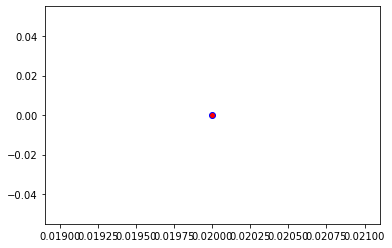

Crafting adversarial images took: 7.794156789779663 seconds 

Images classified as:
000000359937 874 = trolleybus
000000360097 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


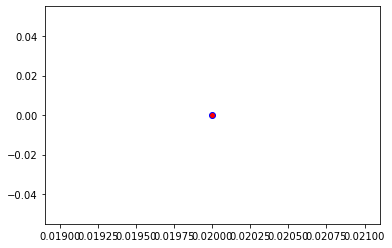

Crafting adversarial images took: 7.628764867782593 seconds 

Images classified as:
000000360137 879 = umbrella
000000360325 5 = ram
Min values in image-array: 0.0 Max values in image-array: 254.22469
Min values in image-array: 0.0 Max values in image-array: 0.99695957
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


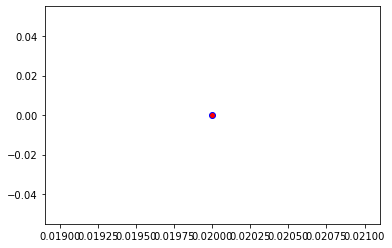

Crafting adversarial images took: 7.987478733062744 seconds 

Images classified as:
000000360393 963 = pizza
000000360564 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 246.95312
Min values in image-array: 0.0 Max values in image-array: 0.96844363
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


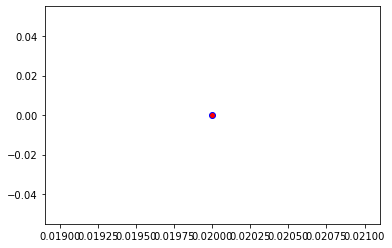

Crafting adversarial images took: 7.890946865081787 seconds 

Images classified as:
000000360661 978 = seashore
000000360943 904 = window screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


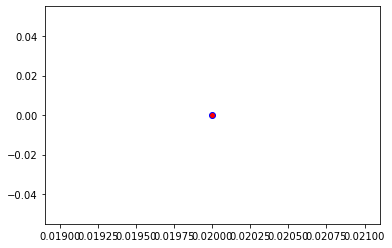

Crafting adversarial images took: 7.8866868019104 seconds 

Images classified as:
000000360951 526 = desk
000000360960 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


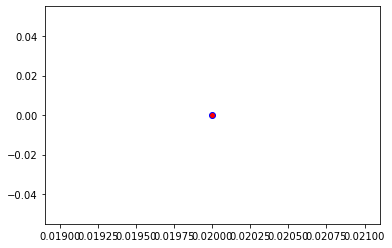

Crafting adversarial images took: 7.844563007354736 seconds 

Images classified as:
000000361103 920 = traffic light
000000361142 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


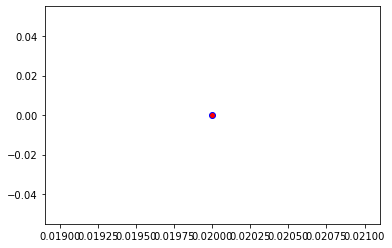

Crafting adversarial images took: 7.811697006225586 seconds 

Images classified as:
000000361147 752 = racket
000000361180 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


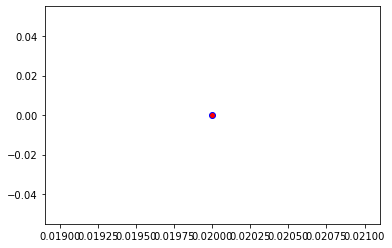

Crafting adversarial images took: 7.687279462814331 seconds 

Images classified as:
000000361238 963 = pizza
000000361268 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


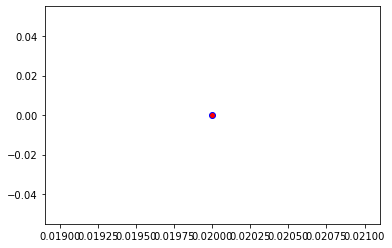

Crafting adversarial images took: 7.526899337768555 seconds 

Images classified as:
000000361506 920 = traffic light
000000361551 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


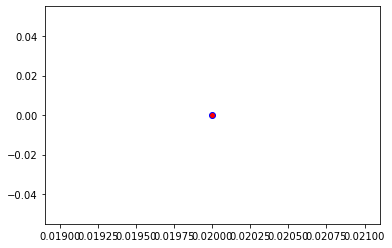

Crafting adversarial images took: 7.669438362121582 seconds 

Images classified as:
000000361571 178 = Weimaraner
000000361586 450 = bobsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


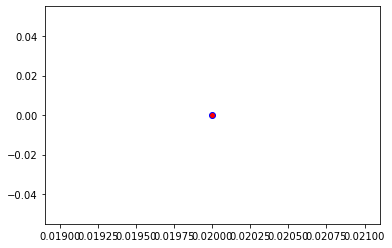

Crafting adversarial images took: 7.672173738479614 seconds 

Images classified as:
000000361621 285 = Egyptian cat
000000361730 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


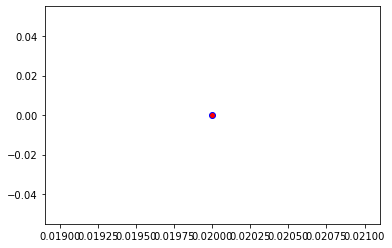

Crafting adversarial images took: 7.704413652420044 seconds 

Images classified as:
000000361919 140 = alp
000000362434 478 = carton
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


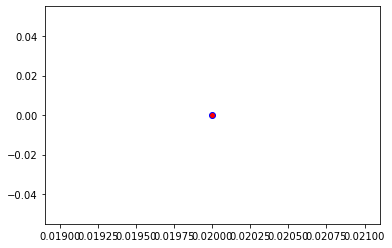

Crafting adversarial images took: 7.657923698425293 seconds 

Images classified as:
000000362520 674 = mousetrap
000000362682 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 254.87724
Min values in image-array: 0.0 Max values in image-array: 0.9995186
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


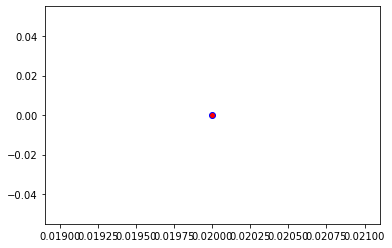

Crafting adversarial images took: 7.45617151260376 seconds 

Images classified as:
000000362716 752 = racket
000000363072 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


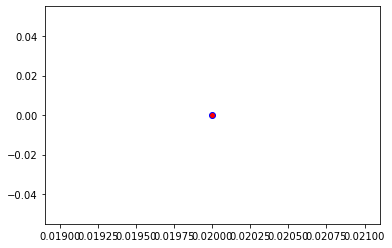

Crafting adversarial images took: 7.472616195678711 seconds 

Images classified as:
000000363188 697 = pajama
000000363207 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


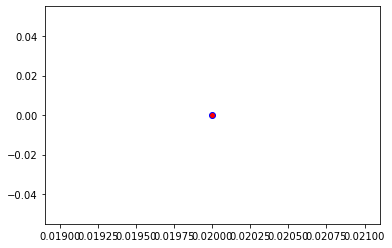

Crafting adversarial images took: 7.688368797302246 seconds 

Images classified as:
000000363461 526 = desk
000000363666 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


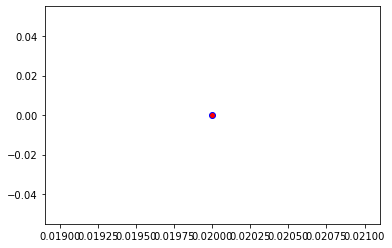

Crafting adversarial images took: 7.664687395095825 seconds 

Images classified as:
000000363784 435 = tub
000000363840 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


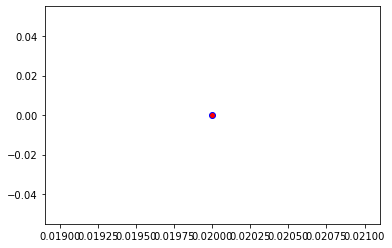

Crafting adversarial images took: 8.122925996780396 seconds 

Images classified as:
000000363875 670 = motor scooter
000000364102 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


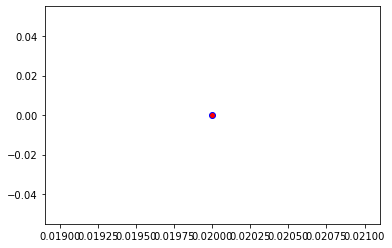

Crafting adversarial images took: 7.831719875335693 seconds 

Images classified as:
000000364126 842 = swimming trunks
000000364166 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 251.42064
Min values in image-array: 0.0 Max values in image-array: 0.9859633
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


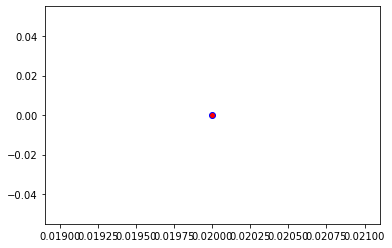

Crafting adversarial images took: 7.524011135101318 seconds 

Images classified as:
000000364297 508 = computer keyboard
000000364322 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


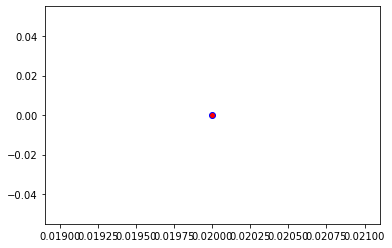

Crafting adversarial images took: 7.539428234100342 seconds 

Images classified as:
000000364557 978 = seashore
000000364587 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


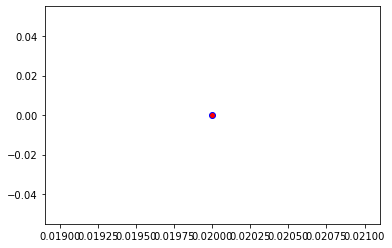

Crafting adversarial images took: 7.953969478607178 seconds 

Images classified as:
000000364636 243 = bull mastiff
000000364884 450 = bobsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


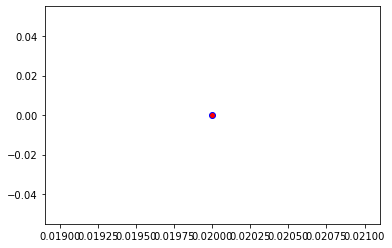

Crafting adversarial images took: 7.626430034637451 seconds 

Images classified as:
000000365095 981 = ballplayer
000000365098 150 = sea lion
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


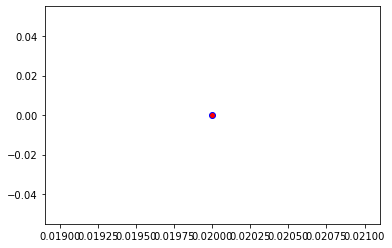

Crafting adversarial images took: 7.682029962539673 seconds 

Images classified as:
000000365207 475 = car mirror
000000365208 116 = cradle
Min values in image-array: 0.12053394 Max values in image-array: 255.0
Min values in image-array: 0.00047268212 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


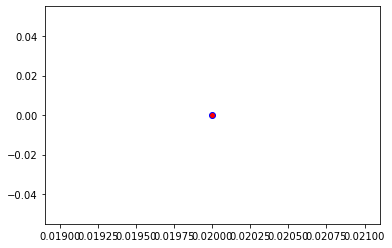

Crafting adversarial images took: 7.58546781539917 seconds 

Images classified as:
000000365385 794 = shower curtain
000000365387 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


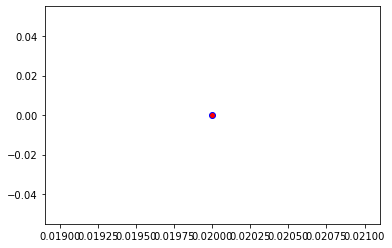

Crafting adversarial images took: 7.56796932220459 seconds 

Images classified as:
000000365521 639 = tank
000000365642 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


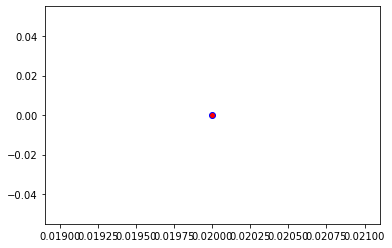

Crafting adversarial images took: 7.522409439086914 seconds 

Images classified as:
000000365655 609 = jeep
000000365745 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


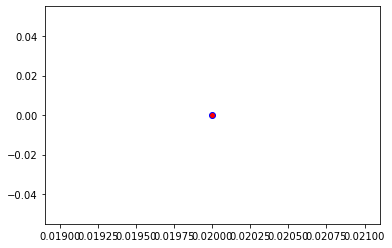

Crafting adversarial images took: 7.759516000747681 seconds 

Images classified as:
000000365766 651 = microwave
000000365886 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


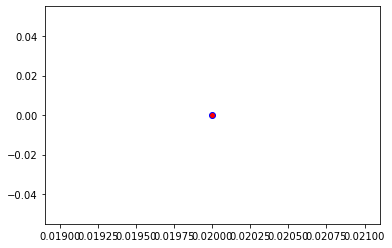

Crafting adversarial images took: 7.617019176483154 seconds 

Images classified as:
000000366141 831 = studio couch
000000366178 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


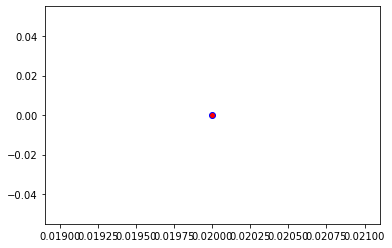

Crafting adversarial images took: 7.549828290939331 seconds 

Images classified as:
000000366199 669 = mosquito net
000000366225 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


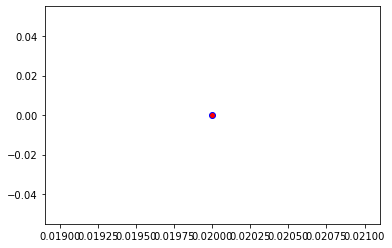

Crafting adversarial images took: 7.616023302078247 seconds 

Images classified as:
000000366611 209 = Chesapeake Bay retriever
000000366711 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


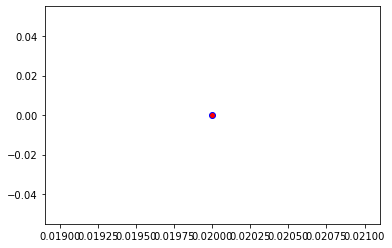

Crafting adversarial images took: 7.4556427001953125 seconds 

Images classified as:
000000366884 799 = sliding door
000000367082 234 = Rottweiler
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


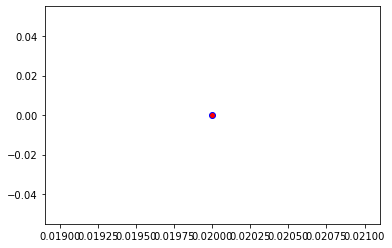

Crafting adversarial images took: 8.396639823913574 seconds 

Images classified as:
000000367095 620 = laptop
000000367195 263 = Pembroke
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


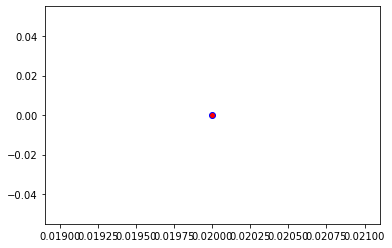

Crafting adversarial images took: 7.66442084312439 seconds 

Images classified as:
000000367228 701 = parachute
000000367386 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


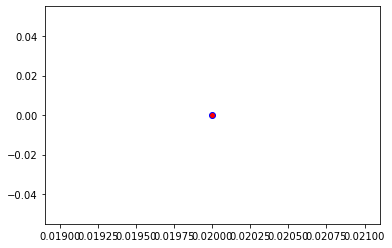

Crafting adversarial images took: 7.340386152267456 seconds 

Images classified as:
000000367569 831 = studio couch
000000367680 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


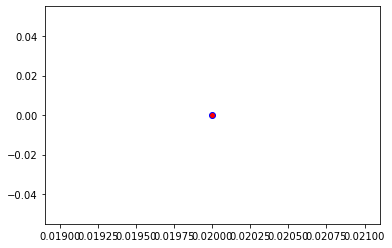

Crafting adversarial images took: 7.921025037765503 seconds 

Images classified as:
000000367818 339 = sorrel
000000368038 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


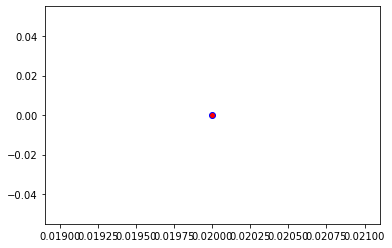

Crafting adversarial images took: 7.736168146133423 seconds 

Images classified as:
000000368212 929 = ice lolly
000000368294 726 = plane
Min values in image-array: 0.0 Max values in image-array: 254.93985
Min values in image-array: 0.0 Max values in image-array: 0.99976414
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


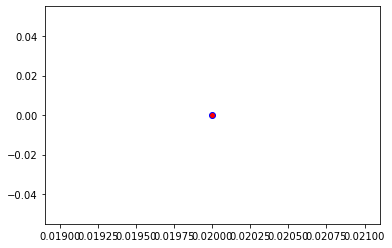

Crafting adversarial images took: 7.78772759437561 seconds 

Images classified as:
000000368335 690 = oxcart
000000368456 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


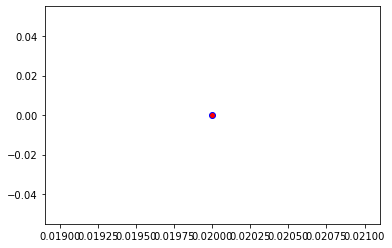

Crafting adversarial images took: 7.76620888710022 seconds 

Images classified as:
000000368684 548 = entertainment center
000000368752 521 = Crock Pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


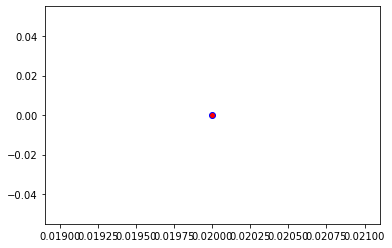

Crafting adversarial images took: 7.468358993530273 seconds 

Images classified as:
000000368900 851 = television
000000368940 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


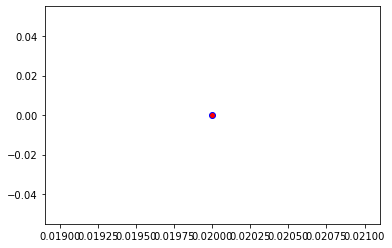

Crafting adversarial images took: 7.491273403167725 seconds 

Images classified as:
000000368961 386 = African elephant
000000368982 784 = screwdriver
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


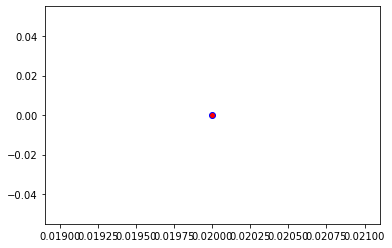

Crafting adversarial images took: 7.684124708175659 seconds 

Images classified as:
000000369037 385 = Indian elephant
000000369081 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 247.63257
Min values in image-array: 0.0 Max values in image-array: 0.97110814
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


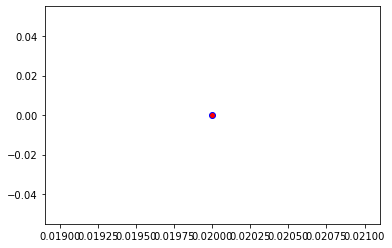

Crafting adversarial images took: 7.7114479541778564 seconds 

Images classified as:
000000369310 882 = vacuum
000000369323 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


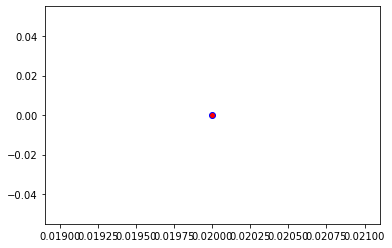

Crafting adversarial images took: 7.615559339523315 seconds 

Images classified as:
000000369370 965 = burrito
000000369442 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


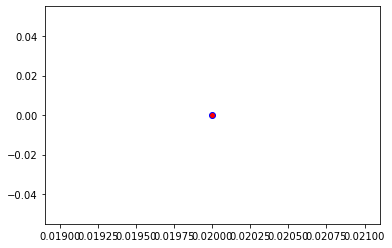

Crafting adversarial images took: 7.631271600723267 seconds 

Images classified as:
000000369503 534 = dishwasher
000000369541 232 = Border collie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


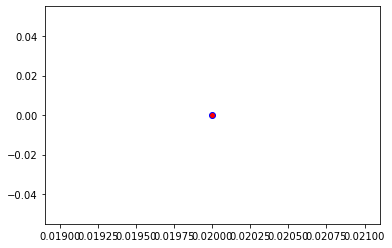

Crafting adversarial images took: 7.516232013702393 seconds 

Images classified as:
000000369675 829 = streetcar
000000369751 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


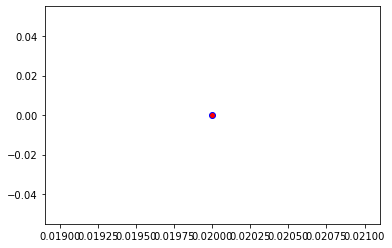

Crafting adversarial images took: 7.521123170852661 seconds 

Images classified as:
000000369757 415 = bakery
000000369771 924 = guacamole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


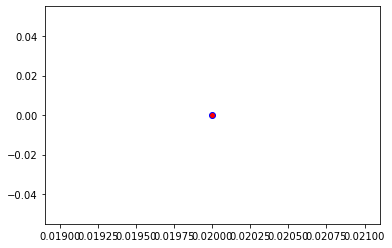

Crafting adversarial images took: 8.537408828735352 seconds 

Images classified as:
000000369812 919 = street sign
000000370042 879 = umbrella
Min values in image-array: 0.171875 Max values in image-array: 255.0
Min values in image-array: 0.0006740196 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


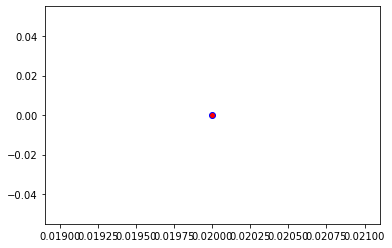

Crafting adversarial images took: 7.636938571929932 seconds 

Images classified as:
000000370208 704 = parking meter
000000370270 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


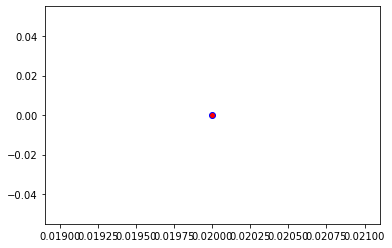

Crafting adversarial images took: 7.52670431137085 seconds 

Images classified as:
000000370375 456 = bow
000000370478 553 = file
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


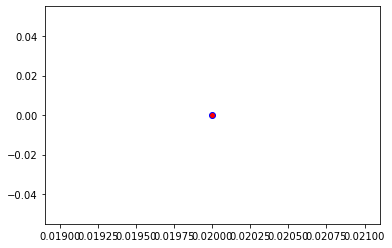

Crafting adversarial images took: 7.720595836639404 seconds 

Images classified as:
000000370486 879 = umbrella
000000370677 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


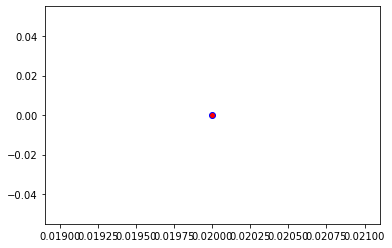

Crafting adversarial images took: 7.596933841705322 seconds 

Images classified as:
000000370711 495 = china cabinet
000000370813 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


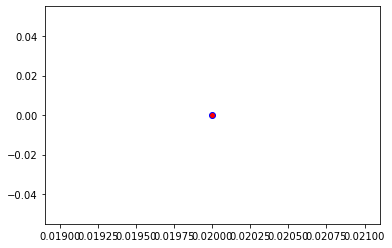

Crafting adversarial images took: 7.586426019668579 seconds 

Images classified as:
000000370818 894 = wardrobe
000000370900 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


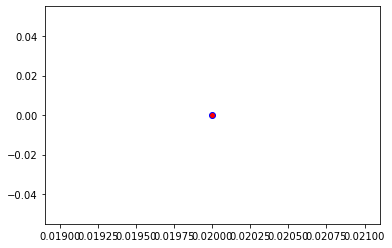

Crafting adversarial images took: 7.909153699874878 seconds 

Images classified as:
000000370999 931 = bagel
000000371042 752 = racket
Min values in image-array: 0.5816124 Max values in image-array: 255.0
Min values in image-array: 0.002280833 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


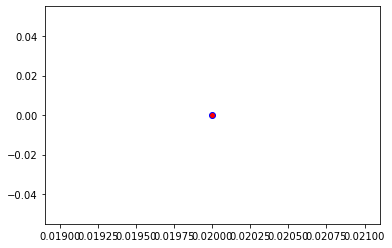

Crafting adversarial images took: 7.626621246337891 seconds 

Images classified as:
000000371472 953 = pineapple
000000371529 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


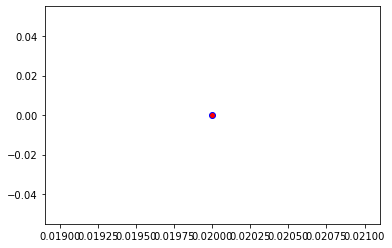

Crafting adversarial images took: 7.536427021026611 seconds 

Images classified as:
000000371552 805 = soccer ball
000000371677 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


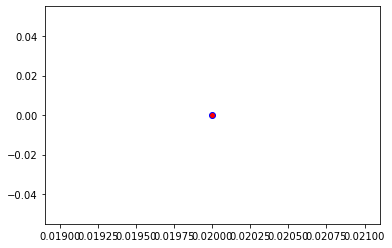

Crafting adversarial images took: 7.642785310745239 seconds 

Images classified as:
000000371699 532 = dining table
000000371749 162 = beagle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


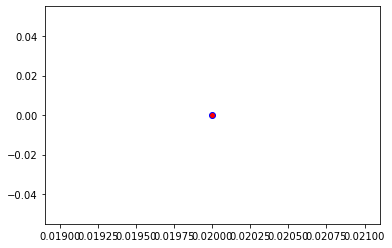

Crafting adversarial images took: 7.472371339797974 seconds 

Images classified as:
000000372203 843 = swing
000000372260 778 = scale
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


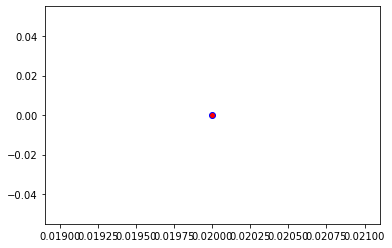

Crafting adversarial images took: 7.5181052684783936 seconds 

Images classified as:
000000372307 73 = barn
000000372317 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


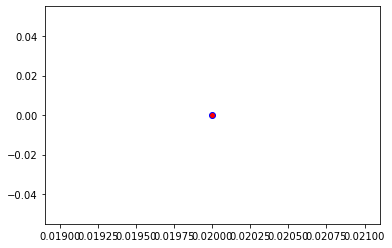

Crafting adversarial images took: 7.671184539794922 seconds 

Images classified as:
000000372349 978 = seashore
000000372466 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


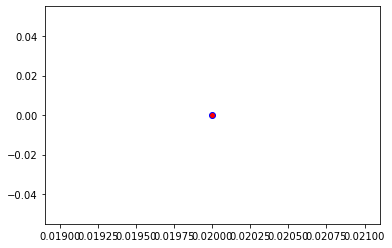

Crafting adversarial images took: 7.5457751750946045 seconds 

Images classified as:
000000372577 752 = racket
000000372718 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


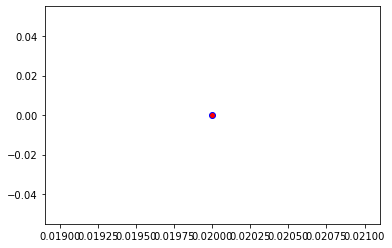

Crafting adversarial images took: 7.521621942520142 seconds 

Images classified as:
000000372819 172 = whippet
000000373315 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


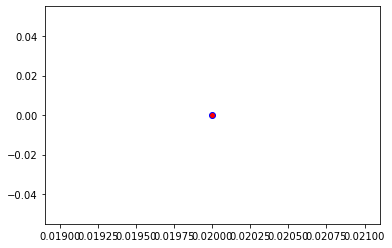

Crafting adversarial images took: 8.4174222946167 seconds 

Images classified as:
000000373353 829 = streetcar
000000373382 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


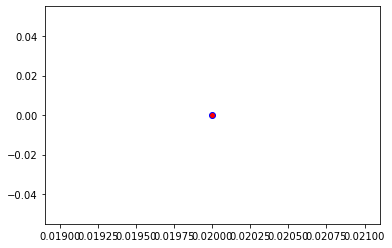

Crafting adversarial images took: 7.643075942993164 seconds 

Images classified as:
000000373705 862 = torch
000000374052 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


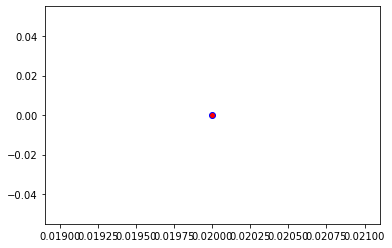

Crafting adversarial images took: 7.550712585449219 seconds 

Images classified as:
000000374083 461 = plate
000000374369 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


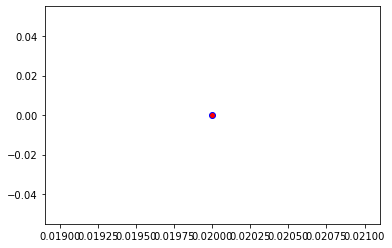

Crafting adversarial images took: 7.908804178237915 seconds 

Images classified as:
000000374545 557 = flagpole
000000374551 20 = water ouzel
Min values in image-array: 0.0 Max values in image-array: 254.82323
Min values in image-array: 0.0 Max values in image-array: 0.9993068
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


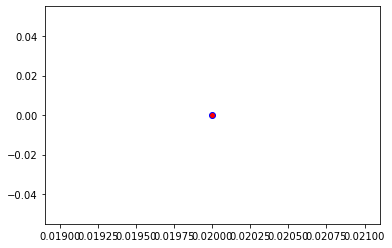

Crafting adversarial images took: 7.673510551452637 seconds 

Images classified as:
000000374727 919 = street sign
000000374982 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


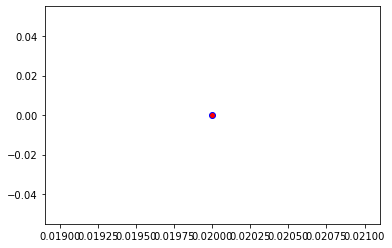

Crafting adversarial images took: 7.756364822387695 seconds 

Images classified as:
000000375015 295 = American black bear
000000375078 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


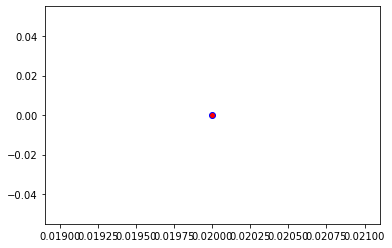

Crafting adversarial images took: 7.804175615310669 seconds 

Images classified as:
000000375278 223 = schipperke
000000375430 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


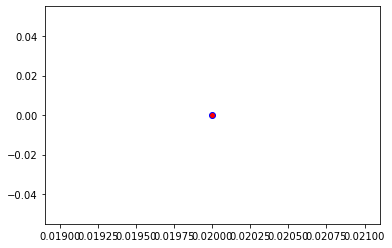

Crafting adversarial images took: 7.526581287384033 seconds 

Images classified as:
000000375469 693 = paddle
000000375493 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 254.7143
Min values in image-array: 0.0 Max values in image-array: 0.9988796
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


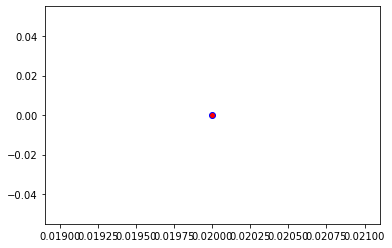

Crafting adversarial images took: 7.544709920883179 seconds 

Images classified as:
000000375763 346 = water buffalo
000000376093 618 = ladle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


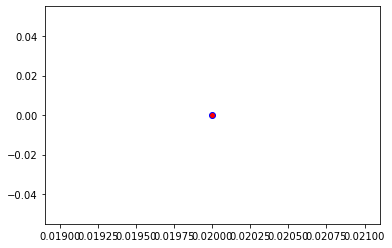

Crafting adversarial images took: 7.77641487121582 seconds 

Images classified as:
000000376112 248 = ski
000000376206 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


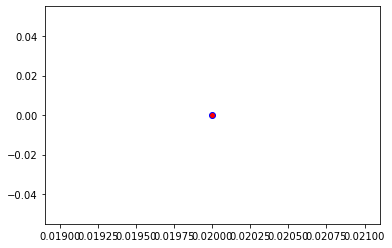

Crafting adversarial images took: 7.59480619430542 seconds 

Images classified as:
000000376264 551 = face powder
000000376278 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


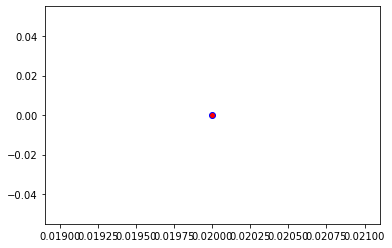

Crafting adversarial images took: 7.557871580123901 seconds 

Images classified as:
000000376284 704 = parking meter
000000376307 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


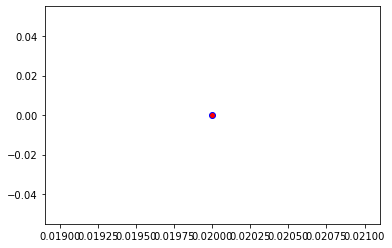

Crafting adversarial images took: 7.71183443069458 seconds 

Images classified as:
000000376310 648 = medicine chest
000000376322 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


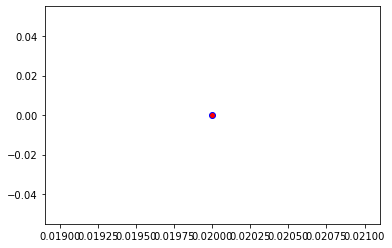

Crafting adversarial images took: 7.51323938369751 seconds 

Images classified as:
000000376365 883 = vase
000000376442 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


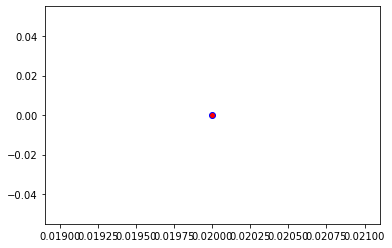

Crafting adversarial images took: 7.365628004074097 seconds 

Images classified as:
000000376478 883 = vase
000000376625 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


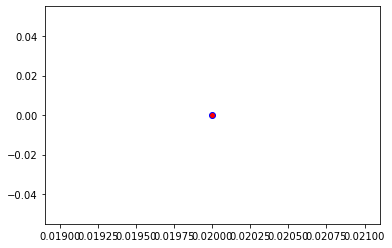

Crafting adversarial images took: 8.554604530334473 seconds 

Images classified as:
000000376856 442 = bell cote
000000376900 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


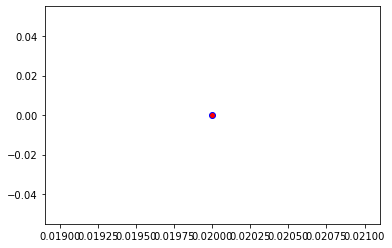

Crafting adversarial images took: 7.6211302280426025 seconds 

Images classified as:
000000377000 283 = Persian cat
000000377113 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


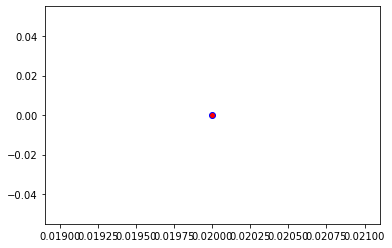

Crafting adversarial images took: 8.124526262283325 seconds 

Images classified as:
000000377239 879 = umbrella
000000377368 868 = tray
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


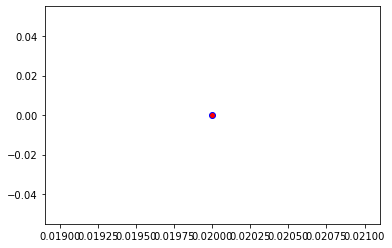

Crafting adversarial images took: 7.828937530517578 seconds 

Images classified as:
000000377393 417 = balloon
000000377486 346 = water buffalo
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


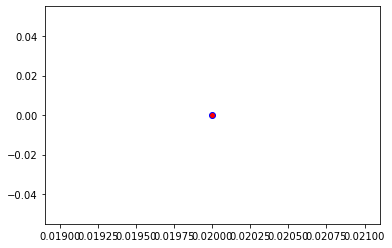

Crafting adversarial images took: 7.7016942501068115 seconds 

Images classified as:
000000377497 340 = zebra
000000377575 221 = Irish water spaniel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


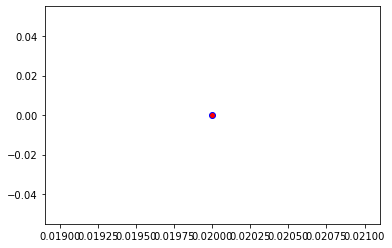

Crafting adversarial images took: 7.42578387260437 seconds 

Images classified as:
000000377588 981 = ballplayer
000000377635 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


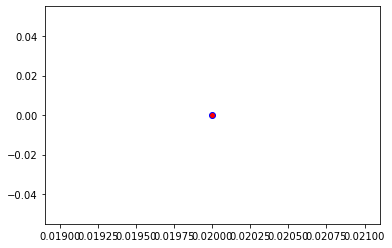

Crafting adversarial images took: 7.567543983459473 seconds 

Images classified as:
000000377670 726 = plane
000000377723 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


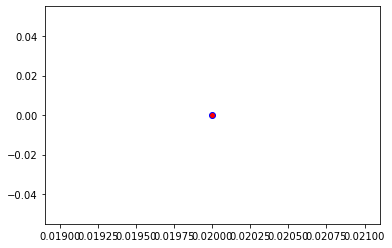

Crafting adversarial images took: 7.81392502784729 seconds 

Images classified as:
000000377814 931 = bagel
000000377882 489 = chainlink fence
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


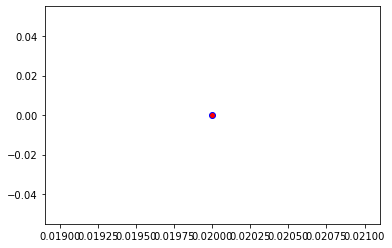

Crafting adversarial images took: 7.681426525115967 seconds 

Images classified as:
000000377946 407 = ambulance
000000378099 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


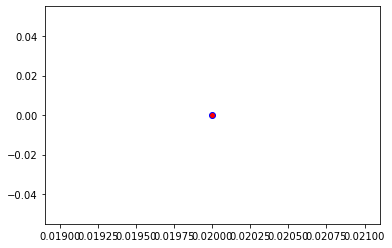

Crafting adversarial images took: 7.6511430740356445 seconds 

Images classified as:
000000378116 58 = water snake
000000378139 408 = amphibian
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


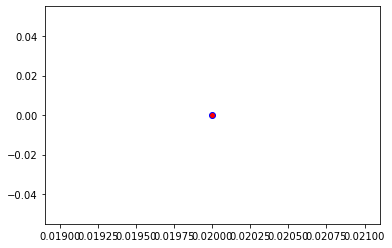

Crafting adversarial images took: 7.580355405807495 seconds 

Images classified as:
000000378244 248 = ski
000000378284 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


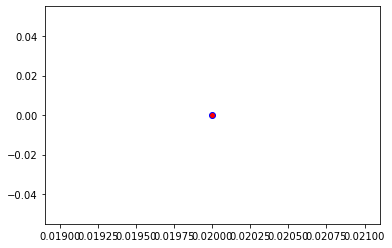

Crafting adversarial images took: 7.501246690750122 seconds 

Images classified as:
000000378453 340 = zebra
000000378454 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


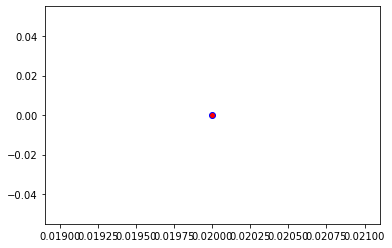

Crafting adversarial images took: 7.996479511260986 seconds 

Images classified as:
000000378515 582 = grocery store
000000378605 334 = cup
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


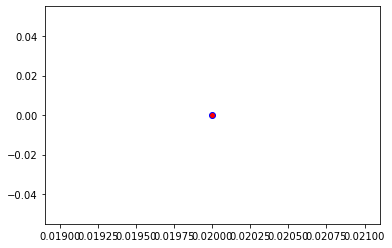

Crafting adversarial images took: 7.663310289382935 seconds 

Images classified as:
000000378673 880 = unicycle
000000378873 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


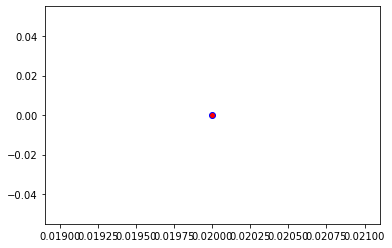

Crafting adversarial images took: 7.872595548629761 seconds 

Images classified as:
000000379332 890 = volleyball
000000379441 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


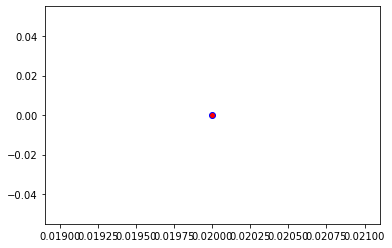

Crafting adversarial images took: 7.94282603263855 seconds 

Images classified as:
000000379453 404 = airliner
000000379476 884 = vault
Min values in image-array: 0.06935892 Max values in image-array: 255.0
Min values in image-array: 0.00027199578 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


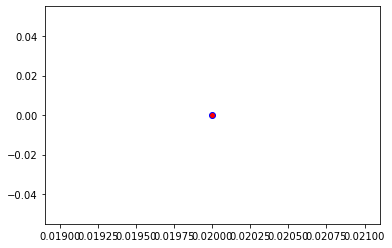

Crafting adversarial images took: 7.5371363162994385 seconds 

Images classified as:
000000379533 340 = zebra
000000379800 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


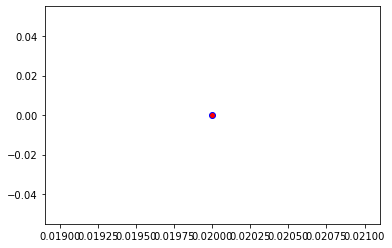

Crafting adversarial images took: 7.784196376800537 seconds 

Images classified as:
000000379842 131 = rule
000000380203 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


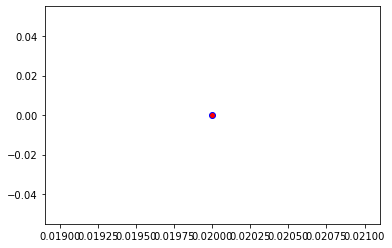

Crafting adversarial images took: 7.41764235496521 seconds 

Images classified as:
000000380706 880 = unicycle
000000380711 433 = bathing cap
Min values in image-array: 0.0 Max values in image-array: 254.17188
Min values in image-array: 0.0 Max values in image-array: 0.99675244
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


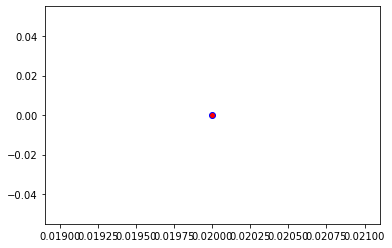

Crafting adversarial images took: 7.589685678482056 seconds 

Images classified as:
000000380913 575 = golfcart
000000381360 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


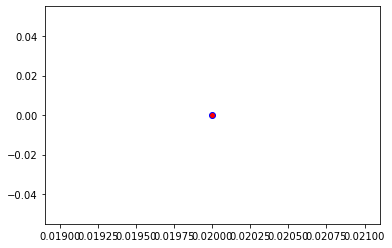

Crafting adversarial images took: 7.922098636627197 seconds 

Images classified as:
000000381587 922 = menu
000000381639 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


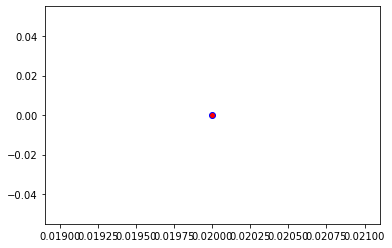

Crafting adversarial images took: 7.572015762329102 seconds 

Images classified as:
000000381971 603 = horse cart
000000382009 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


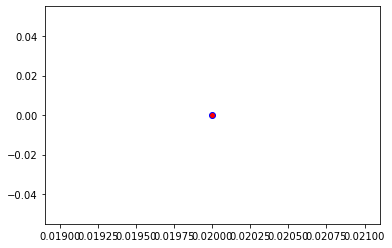

Crafting adversarial images took: 7.682429552078247 seconds 

Images classified as:
000000382030 774 = sandal
000000382088 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


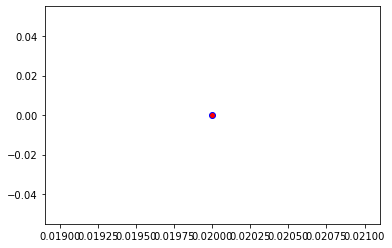

Crafting adversarial images took: 7.714907884597778 seconds 

Images classified as:
000000382111 603 = horse cart
000000382122 497 = church
Min values in image-array: 0.0 Max values in image-array: 254.22656
Min values in image-array: 0.0 Max values in image-array: 0.9969669
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


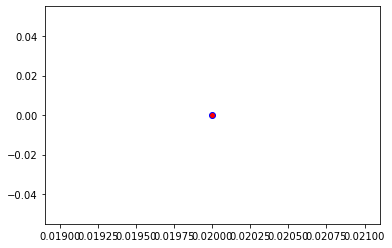

Crafting adversarial images took: 7.298679828643799 seconds 

Images classified as:
000000382125 927 = trifle
000000382696 519 = crate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


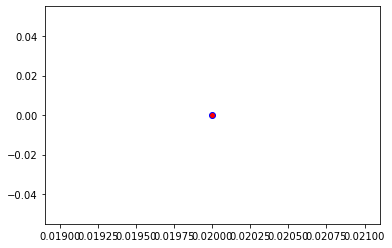

Crafting adversarial images took: 7.734912872314453 seconds 

Images classified as:
000000382734 648 = medicine chest
000000382743 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


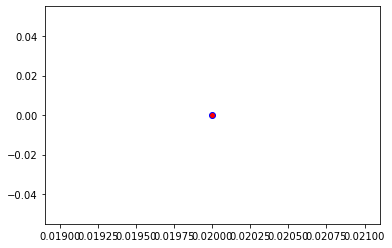

Crafting adversarial images took: 7.672319412231445 seconds 

Images classified as:
000000383289 704 = parking meter
000000383337 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


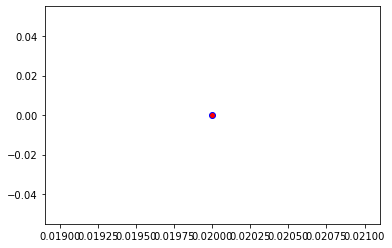

Crafting adversarial images took: 7.656110763549805 seconds 

Images classified as:
000000383339 978 = seashore
000000383384 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


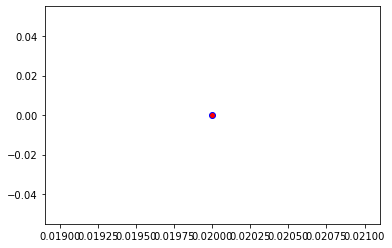

Crafting adversarial images took: 7.697416543960571 seconds 

Images classified as:
000000383386 850 = teddy
000000383443 435 = tub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


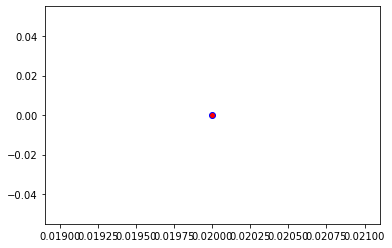

Crafting adversarial images took: 8.037537574768066 seconds 

Images classified as:
000000383606 896 = washbasin
000000383621 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


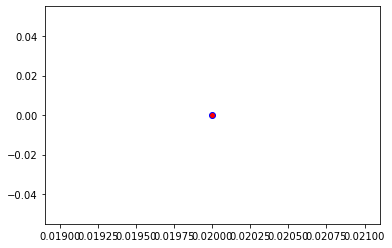

Crafting adversarial images took: 8.228426694869995 seconds 

Images classified as:
000000383676 293 = cheetah
000000383838 585 = hair spray
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


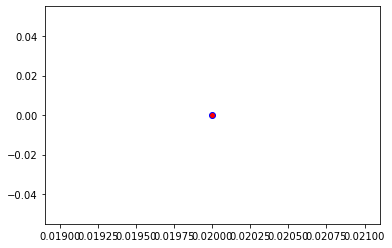

Crafting adversarial images took: 7.797434091567993 seconds 

Images classified as:
000000383842 617 = lab coat
000000383921 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


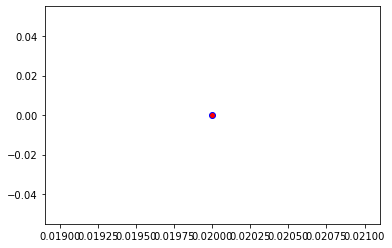

Crafting adversarial images took: 7.631250619888306 seconds 

Images classified as:
000000384136 589 = hand blower
000000384350 318 = wing
Min values in image-array: 1.073815 Max values in image-array: 255.0
Min values in image-array: 0.0042110393 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


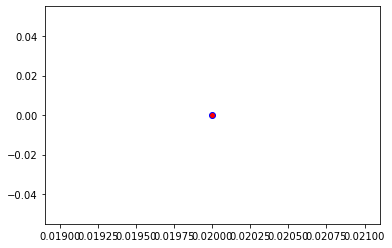

Crafting adversarial images took: 7.737591028213501 seconds 

Images classified as:
000000384468 385 = Indian elephant
000000384513 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


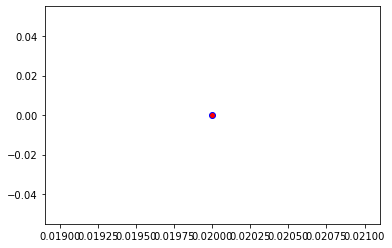

Crafting adversarial images took: 7.691915988922119 seconds 

Images classified as:
000000384527 495 = china cabinet
000000384616 358 = pole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


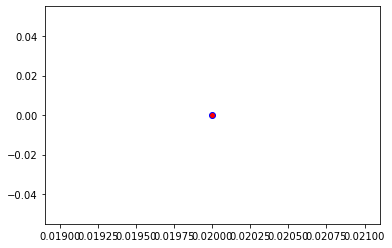

Crafting adversarial images took: 8.227030754089355 seconds 

Images classified as:
000000384651 526 = desk
000000384661 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


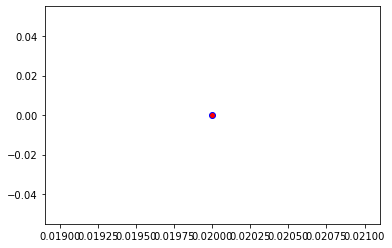

Crafting adversarial images took: 7.62770414352417 seconds 

Images classified as:
000000384666 248 = ski
000000384670 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


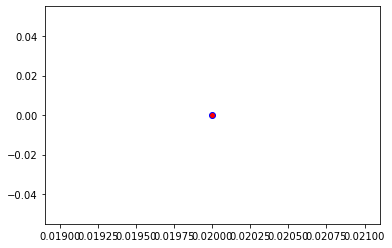

Crafting adversarial images took: 7.5821568965911865 seconds 

Images classified as:
000000384808 896 = washbasin
000000384850 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


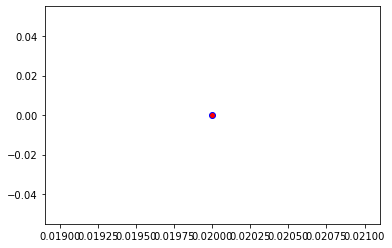

Crafting adversarial images took: 7.776393175125122 seconds 

Images classified as:
000000384949 713 = pier
000000385029 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


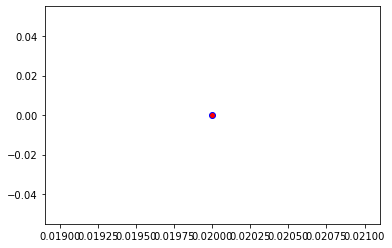

Crafting adversarial images took: 7.6044652462005615 seconds 

Images classified as:
000000385190 571 = gas pump
000000385205 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


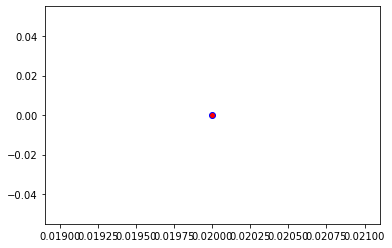

Crafting adversarial images took: 7.456011056900024 seconds 

Images classified as:
000000385719 527 = desktop computer
000000385997 581 = radiator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


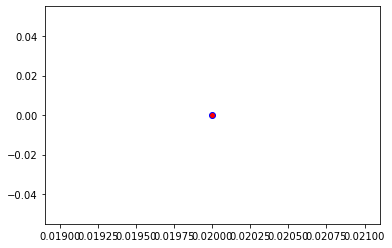

Crafting adversarial images took: 7.667898178100586 seconds 

Images classified as:
000000386134 962 = meat loaf
000000386210 28 = pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


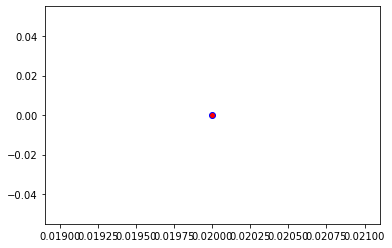

Crafting adversarial images took: 7.5759382247924805 seconds 

Images classified as:
000000386277 951 = lemon
000000386352 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


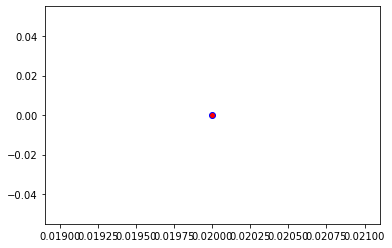

Crafting adversarial images took: 7.756375551223755 seconds 

Images classified as:
000000386457 894 = wardrobe
000000386879 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


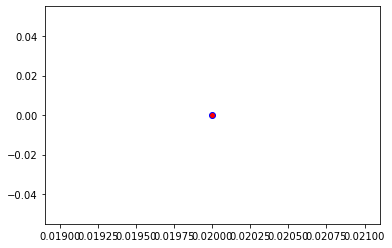

Crafting adversarial images took: 8.149375915527344 seconds 

Images classified as:
000000386912 454 = bookshop
000000387098 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


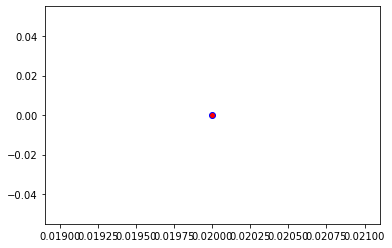

Crafting adversarial images took: 7.62633752822876 seconds 

Images classified as:
000000387148 649 = megalith
000000387383 797 = sleeping bag
Min values in image-array: 0.0 Max values in image-array: 254.35991
Min values in image-array: 0.0 Max values in image-array: 0.9974898
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


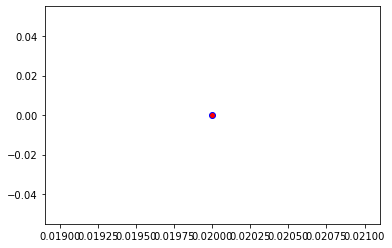

Crafting adversarial images took: 7.450995683670044 seconds 

Images classified as:
000000387387 779 = school bus
000000387916 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


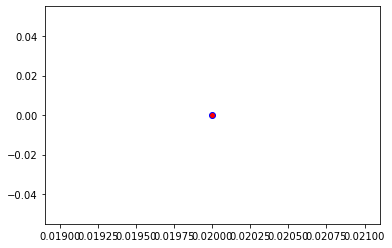

Crafting adversarial images took: 7.98331356048584 seconds 

Images classified as:
000000388056 981 = ballplayer
000000388215 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


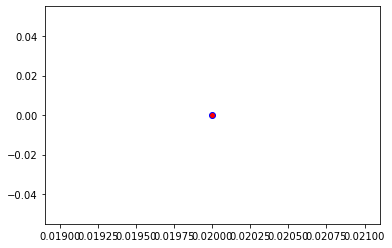

Crafting adversarial images took: 8.064512968063354 seconds 

Images classified as:
000000388258 444 = bicycle-built-for-two
000000388846 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


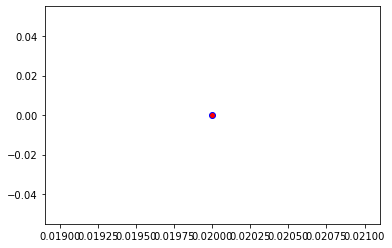

Crafting adversarial images took: 7.884984254837036 seconds 

Images classified as:
000000388903 582 = grocery store
000000388927 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


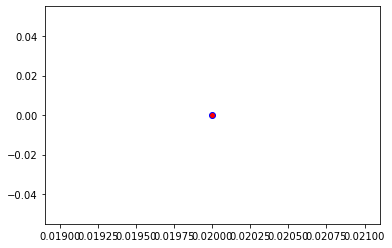

Crafting adversarial images took: 7.769501447677612 seconds 

Images classified as:
000000389109 926 = hot pot
000000389197 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


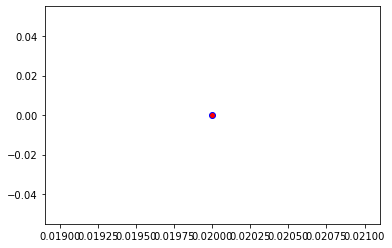

Crafting adversarial images took: 7.5864832401275635 seconds 

Images classified as:
000000389315 692 = packet
000000389316 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


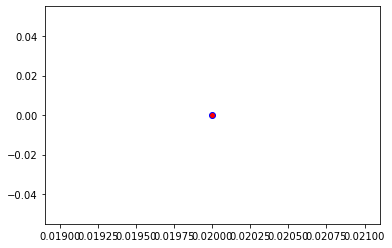

Crafting adversarial images took: 7.49790620803833 seconds 

Images classified as:
000000389381 934 = hotdog
000000389451 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


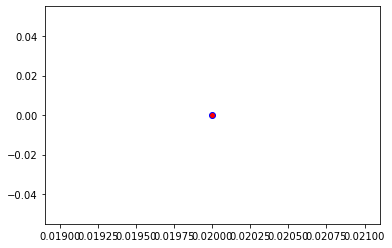

Crafting adversarial images took: 7.661547660827637 seconds 

Images classified as:
000000389532 557 = flagpole
000000389566 67 = dam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


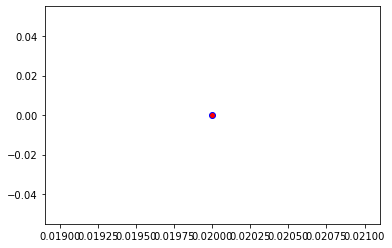

Crafting adversarial images took: 7.708071231842041 seconds 

Images classified as:
000000389684 874 = trolleybus
000000389804 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 254.86618
Min values in image-array: 0.0 Max values in image-array: 0.99947524
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


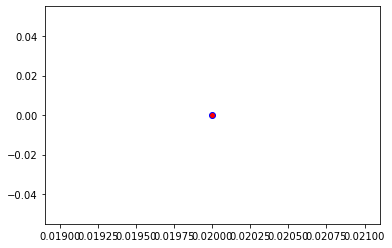

Crafting adversarial images took: 7.661941766738892 seconds 

Images classified as:
000000389812 955 = jackfruit
000000389933 159 = Rhodesian ridgeback
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


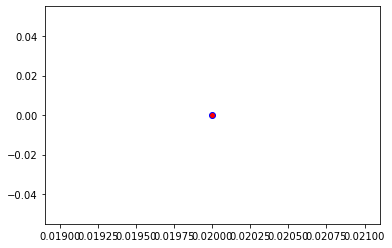

Crafting adversarial images took: 7.653031587600708 seconds 

Images classified as:
000000390246 150 = sea lion
000000390301 297 = sloth bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


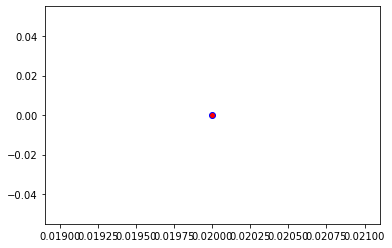

Crafting adversarial images took: 7.572071313858032 seconds 

Images classified as:
000000390555 715 = pickelhaube
000000390826 388 = giant panda
Min values in image-array: 0.18072541 Max values in image-array: 254.84694
Min values in image-array: 0.0007087271 Max values in image-array: 0.9993998
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


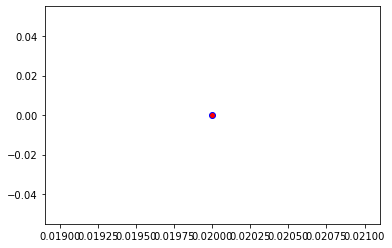

Crafting adversarial images took: 7.450197458267212 seconds 

Images classified as:
000000390902 752 = racket
000000391140 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


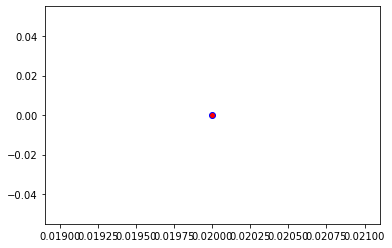

Crafting adversarial images took: 8.753850221633911 seconds 

Images classified as:
000000391144 386 = African elephant
000000391290 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


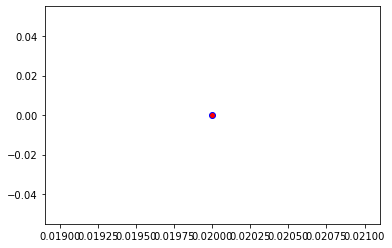

Crafting adversarial images took: 7.542213201522827 seconds 

Images classified as:
000000391375 884 = vault
000000391648 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


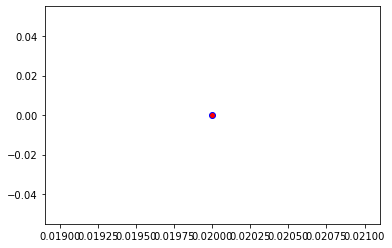

Crafting adversarial images took: 7.686248779296875 seconds 

Images classified as:
000000391722 470 = candle
000000392228 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


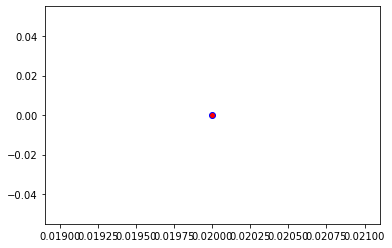

Crafting adversarial images took: 7.865117311477661 seconds 

Images classified as:
000000392481 21 = kite
000000392722 874 = trolleybus
Min values in image-array: 0.050223827 Max values in image-array: 255.0
Min values in image-array: 0.00019695619 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


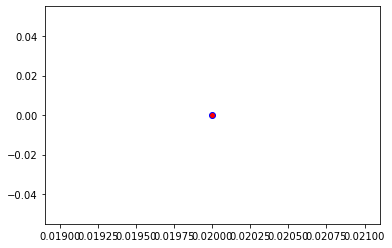

Crafting adversarial images took: 7.737087249755859 seconds 

Images classified as:
000000392818 156 = Blenheim spaniel
000000392933 293 = cheetah
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


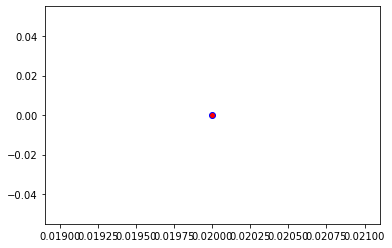

Crafting adversarial images took: 7.682657718658447 seconds 

Images classified as:
000000393014 415 = bakery
000000393056 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


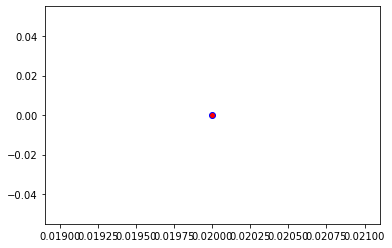

Crafting adversarial images took: 7.821582555770874 seconds 

Images classified as:
000000393093 829 = streetcar
000000393115 726 = plane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


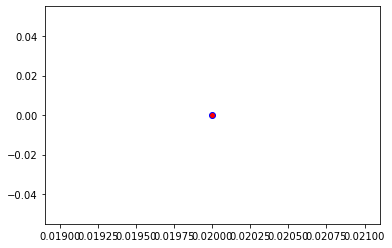

Crafting adversarial images took: 7.697712659835815 seconds 

Images classified as:
000000393226 829 = streetcar
000000393282 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


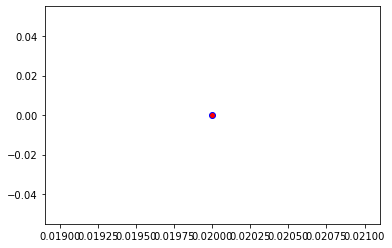

Crafting adversarial images took: 7.819864988327026 seconds 

Images classified as:
000000393469 140 = alp
000000393569 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


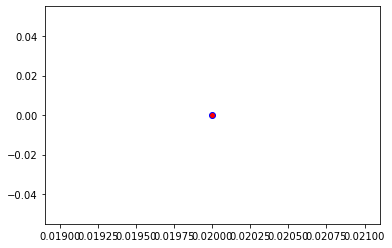

Crafting adversarial images took: 7.705998420715332 seconds 

Images classified as:
000000393838 909 = wok
000000394199 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


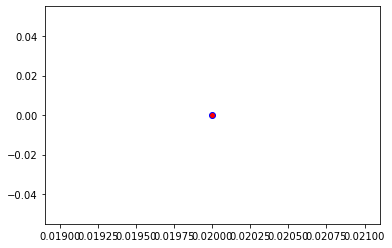

Crafting adversarial images took: 7.536563396453857 seconds 

Images classified as:
000000394206 569 = garbage truck
000000394275 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


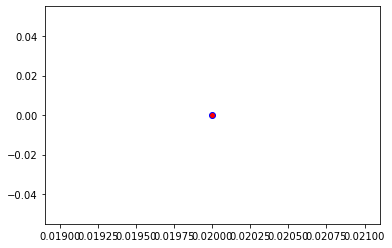

Crafting adversarial images took: 7.7277820110321045 seconds 

Images classified as:
000000394328 861 = toilet seat
000000394510 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


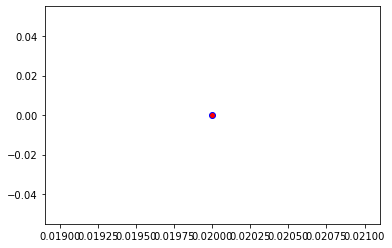

Crafting adversarial images took: 7.646524667739868 seconds 

Images classified as:
000000394559 752 = racket
000000394611 275 = hyena
Min values in image-array: 4.7652855 Max values in image-array: 255.0
Min values in image-array: 0.018687394 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


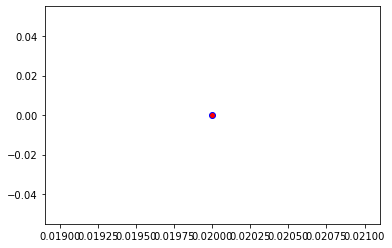

Crafting adversarial images took: 7.586483955383301 seconds 

Images classified as:
000000394677 513 = cornet
000000394940 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


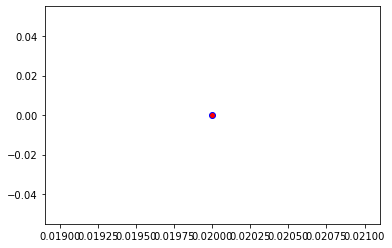

Crafting adversarial images took: 7.651813268661499 seconds 

Images classified as:
000000395180 975 = lakeside
000000395343 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


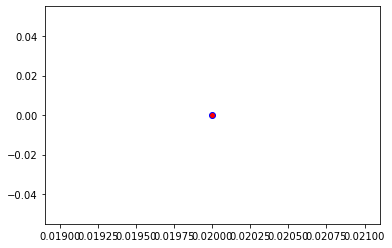

Crafting adversarial images took: 8.455888986587524 seconds 

Images classified as:
000000395388 634 = lumbermill
000000395575 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


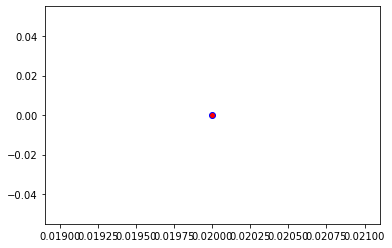

Crafting adversarial images took: 7.878000020980835 seconds 

Images classified as:
000000395633 554 = fireboat
000000395701 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


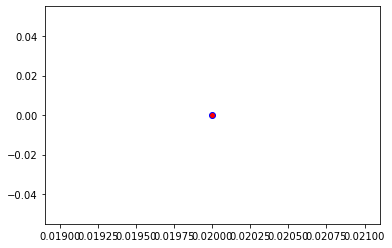

Crafting adversarial images took: 7.624967575073242 seconds 

Images classified as:
000000395801 880 = unicycle
000000395903 638 = maillot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


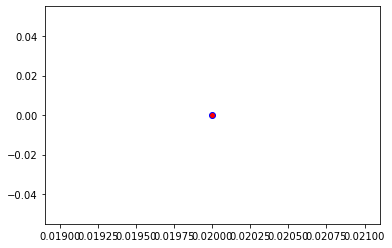

Crafting adversarial images took: 7.734036922454834 seconds 

Images classified as:
000000396200 880 = unicycle
000000396205 347 = bison
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


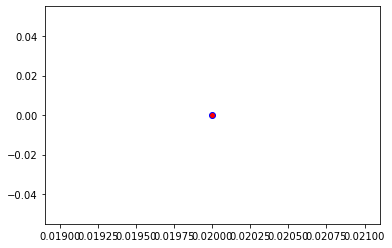

Crafting adversarial images took: 7.788201808929443 seconds 

Images classified as:
000000396274 28 = pot
000000396338 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


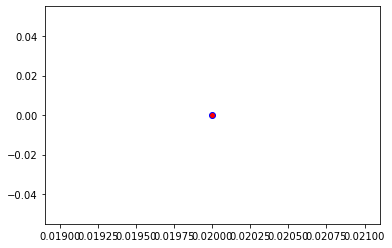

Crafting adversarial images took: 7.64748215675354 seconds 

Images classified as:
000000396518 472 = canoe
000000396526 905 = window shade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


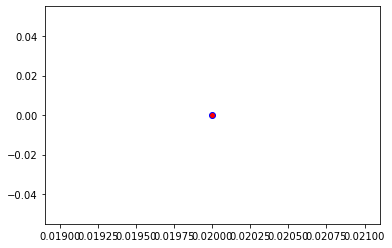

Crafting adversarial images took: 7.628748416900635 seconds 

Images classified as:
000000396568 565 = freight car
000000396580 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


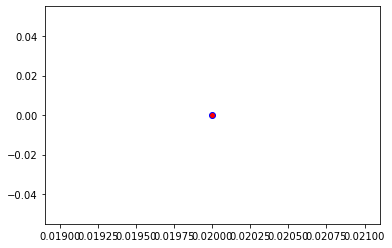

Crafting adversarial images took: 7.791578054428101 seconds 

Images classified as:
000000396729 761 = remote control
000000396863 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


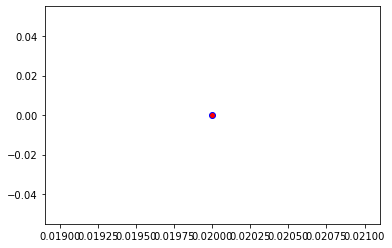

Crafting adversarial images took: 7.533480644226074 seconds 

Images classified as:
000000396903 895 = warplane
000000397133 467 = butcher shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


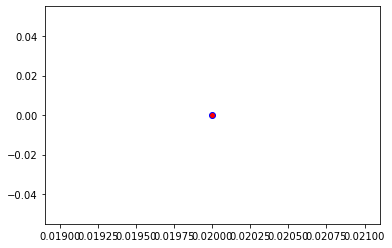

Crafting adversarial images took: 7.6184399127960205 seconds 

Images classified as:
000000397279 752 = racket
000000397303 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


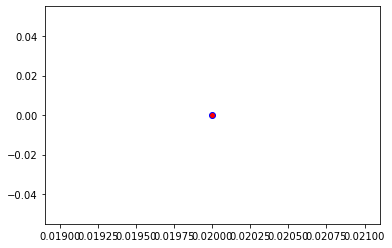

Crafting adversarial images took: 7.729305982589722 seconds 

Images classified as:
000000397327 861 = toilet seat
000000397351 105 = ear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


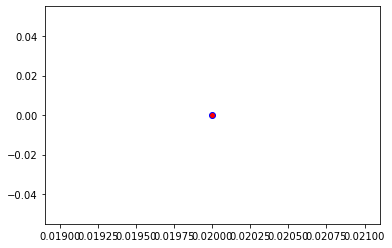

Crafting adversarial images took: 7.704757928848267 seconds 

Images classified as:
000000397354 624 = library
000000397639 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


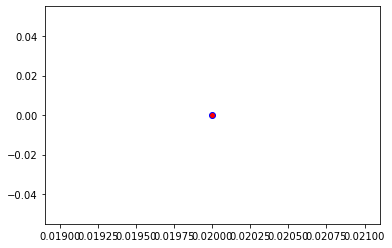

Crafting adversarial images took: 7.513274908065796 seconds 

Images classified as:
000000397681 721 = pillow
000000398028 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


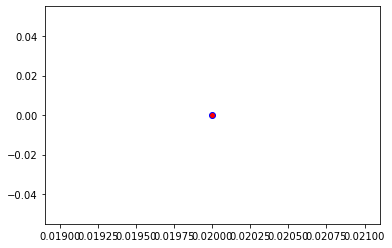

Crafting adversarial images took: 7.71382999420166 seconds 

Images classified as:
000000398203 805 = soccer ball
000000398237 463 = bucket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


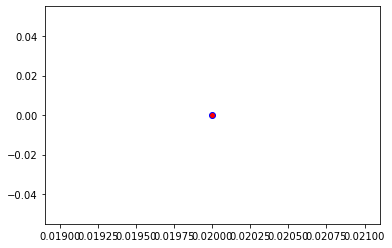

Crafting adversarial images took: 7.669404029846191 seconds 

Images classified as:
000000398377 652 = military uniform
000000398438 938 = cauliflower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


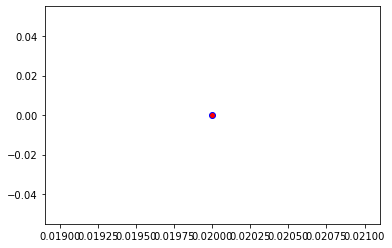

Crafting adversarial images took: 8.080771446228027 seconds 

Images classified as:
000000398652 28 = pot
000000398742 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


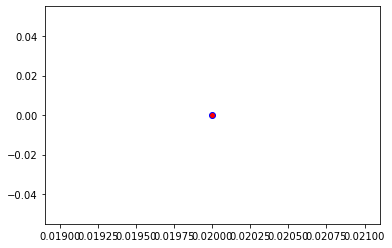

Crafting adversarial images took: 7.739285469055176 seconds 

Images classified as:
000000398810 904 = window screen
000000398905 819 = stage
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


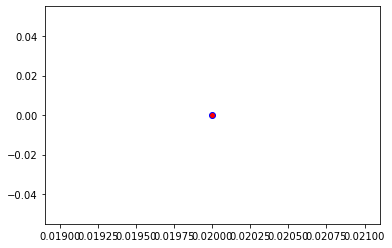

Crafting adversarial images took: 7.731829643249512 seconds 

Images classified as:
000000399205 585 = hair spray
000000399296 644 = matchstick
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


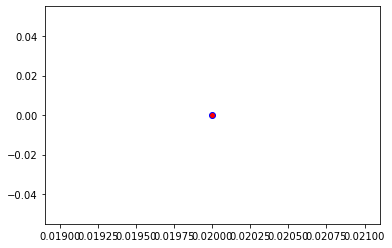

Crafting adversarial images took: 7.80640435218811 seconds 

Images classified as:
000000399462 416 = balance beam
000000399560 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


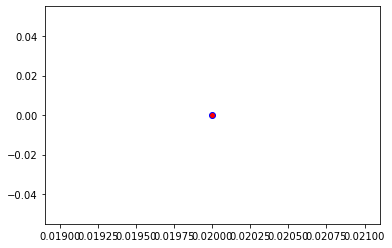

Crafting adversarial images took: 7.435567140579224 seconds 

Images classified as:
000000399655 245 = French bulldog
000000399764 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


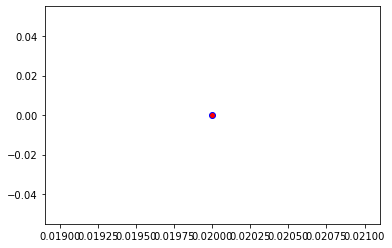

Crafting adversarial images took: 8.214462518692017 seconds 

Images classified as:
000000400044 248 = ski
000000400082 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


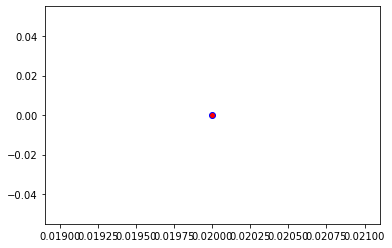

Crafting adversarial images took: 7.796307325363159 seconds 

Images classified as:
000000400161 431 = bassinet
000000400367 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


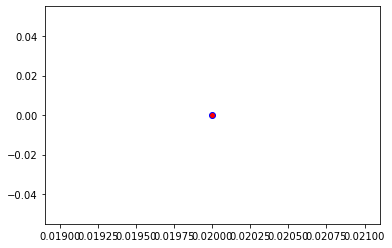

Crafting adversarial images took: 7.576914548873901 seconds 

Images classified as:
000000400573 934 = hotdog
000000400794 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


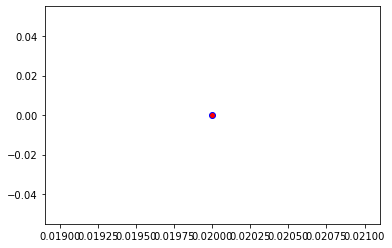

Crafting adversarial images took: 7.476362705230713 seconds 

Images classified as:
000000400803 625 = lifeboat
000000400815 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


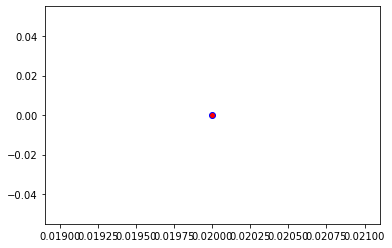

Crafting adversarial images took: 7.635940790176392 seconds 

Images classified as:
000000400922 919 = street sign
000000401244 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


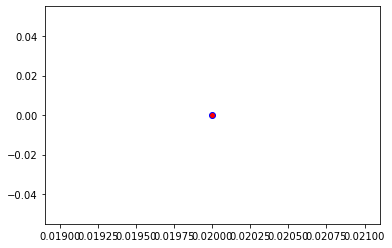

Crafting adversarial images took: 7.459619760513306 seconds 

Images classified as:
000000401250 895 = warplane
000000401446 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 254.50255
Min values in image-array: 0.0 Max values in image-array: 0.9980492
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


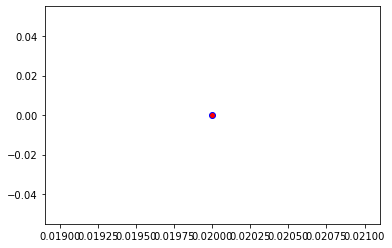

Crafting adversarial images took: 7.721752643585205 seconds 

Images classified as:
000000401862 829 = streetcar
000000401991 153 = Maltese dog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


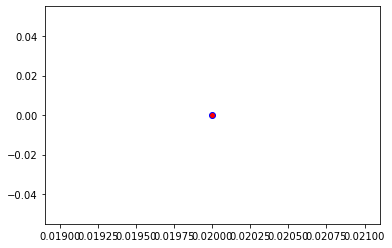

Crafting adversarial images took: 7.576869010925293 seconds 

Images classified as:
000000402096 919 = street sign
000000402118 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


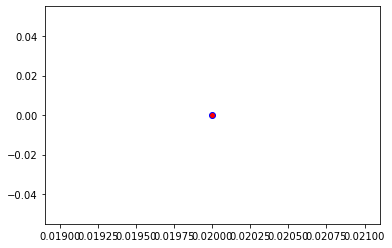

Crafting adversarial images took: 7.548450946807861 seconds 

Images classified as:
000000402334 497 = church
000000402346 883 = vase
Min values in image-array: 0.0 Max values in image-array: 253.28574
Min values in image-array: 0.0 Max values in image-array: 0.9932774
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


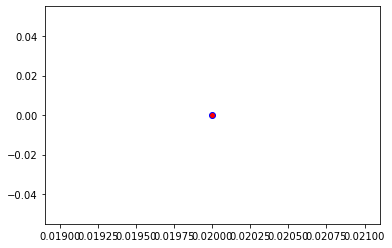

Crafting adversarial images took: 8.04122018814087 seconds 

Images classified as:
000000402433 963 = pizza
000000402473 282 = tiger cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


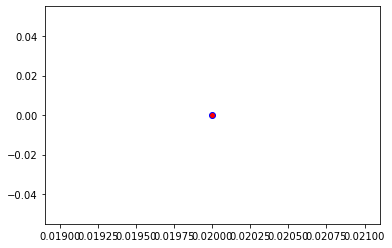

Crafting adversarial images took: 8.007601261138916 seconds 

Images classified as:
000000402519 95 = jacamar
000000402615 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


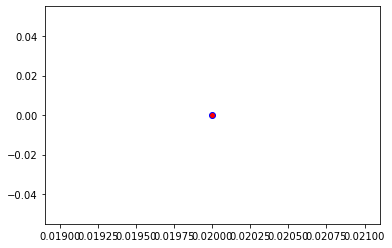

Crafting adversarial images took: 7.411799192428589 seconds 

Images classified as:
000000402720 762 = restaurant
000000402765 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


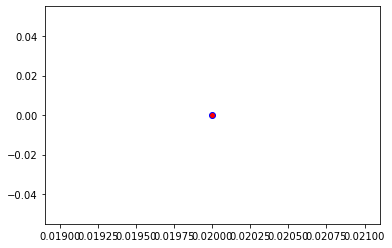

Crafting adversarial images took: 7.891404390335083 seconds 

Images classified as:
000000402774 879 = umbrella
000000402783 942 = butternut squash
Min values in image-array: 0.0 Max values in image-array: 254.99998
Min values in image-array: 0.0 Max values in image-array: 0.99999994
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


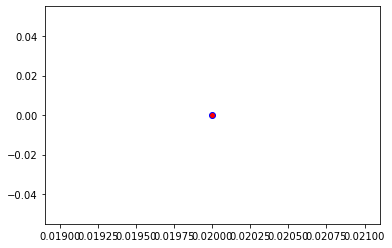

Crafting adversarial images took: 7.727324485778809 seconds 

Images classified as:
000000402992 211 = vizsla
000000403122 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


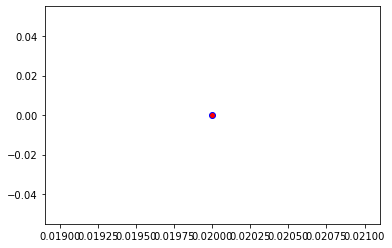

Crafting adversarial images took: 7.735567569732666 seconds 

Images classified as:
000000403353 846 = table lamp
000000403385 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


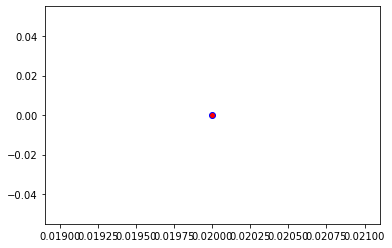

Crafting adversarial images took: 7.645182847976685 seconds 

Images classified as:
000000403565 671 = mountain bike
000000403584 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


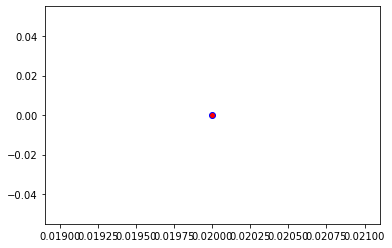

Crafting adversarial images took: 7.691331148147583 seconds 

Images classified as:
000000403817 664 = monitor
000000404128 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


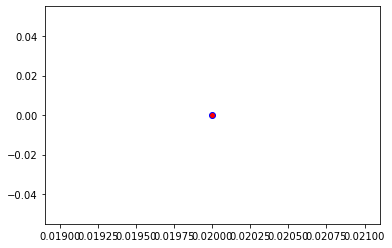

Crafting adversarial images took: 7.809399127960205 seconds 

Images classified as:
000000404191 896 = washbasin
000000404249 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 254.587
Min values in image-array: 0.0 Max values in image-array: 0.9983804
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


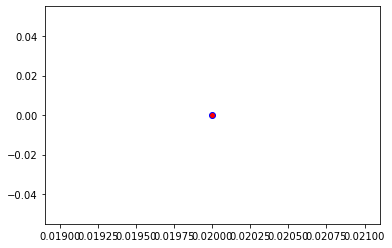

Crafting adversarial images took: 7.754349946975708 seconds 

Images classified as:
000000404479 404 = airliner
000000404484 253 = basenji
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


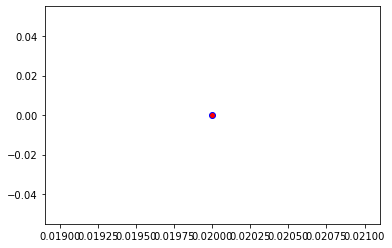

Crafting adversarial images took: 7.555522918701172 seconds 

Images classified as:
000000404534 424 = barbershop
000000404568 146 = albatross
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


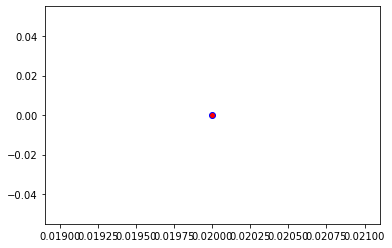

Crafting adversarial images took: 7.737567186355591 seconds 

Images classified as:
000000404601 919 = street sign
000000404678 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


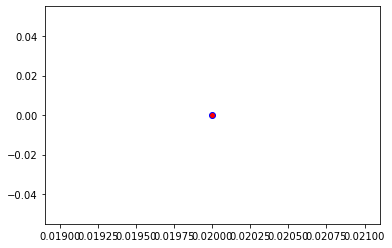

Crafting adversarial images took: 7.746535539627075 seconds 

Images classified as:
000000404805 445 = bikini
000000404839 456 = bow
Min values in image-array: 0.0 Max values in image-array: 254.57144
Min values in image-array: 0.0 Max values in image-array: 0.9983194
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


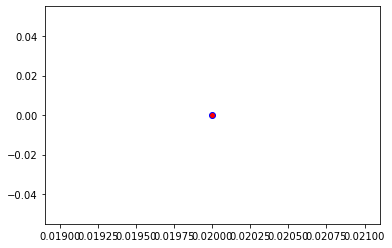

Crafting adversarial images took: 7.629899024963379 seconds 

Images classified as:
000000404922 752 = racket
000000404923 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


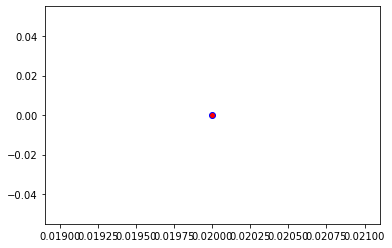

Crafting adversarial images took: 7.501154661178589 seconds 

Images classified as:
000000405195 415 = bakery
000000405205 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


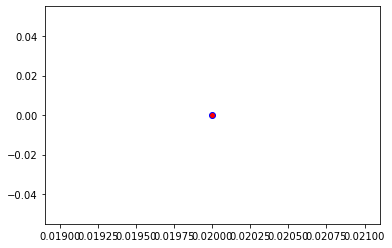

Crafting adversarial images took: 8.416132926940918 seconds 

Images classified as:
000000405249 470 = candle
000000405279 975 = lakeside
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


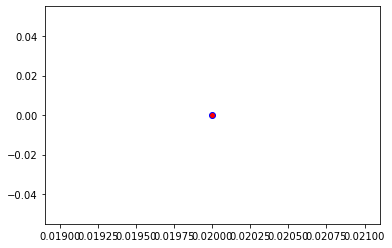

Crafting adversarial images took: 7.687557220458984 seconds 

Images classified as:
000000405306 281 = tabby
000000405432 502 = clog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


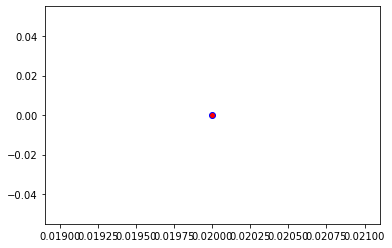

Crafting adversarial images took: 7.561111211776733 seconds 

Images classified as:
000000405691 966 = red wine
000000405970 789 = shoji
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


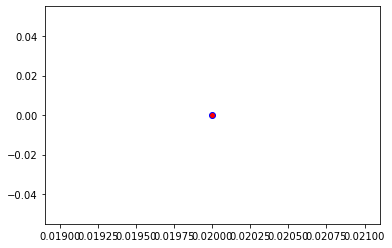

Crafting adversarial images took: 7.908644676208496 seconds 

Images classified as:
000000405972 385 = Indian elephant
000000406129 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


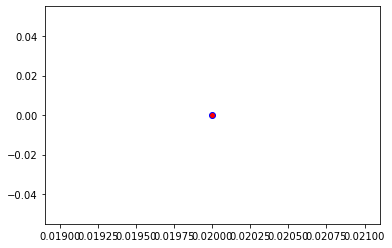

Crafting adversarial images took: 7.6225762367248535 seconds 

Images classified as:
000000406417 608 = jean
000000406570 509 = confectionery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


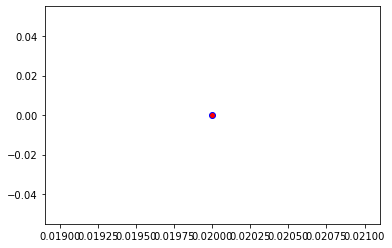

Crafting adversarial images took: 7.648403882980347 seconds 

Images classified as:
000000406611 140 = alp
000000406997 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


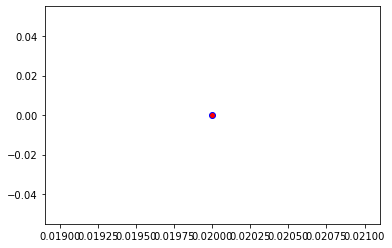

Crafting adversarial images took: 7.717055320739746 seconds 

Images classified as:
000000407002 248 = ski
000000407083 245 = French bulldog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


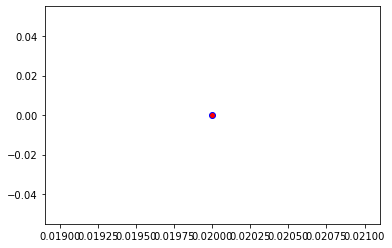

Crafting adversarial images took: 7.5150182247161865 seconds 

Images classified as:
000000407298 429 = baseball
000000407403 899 = water jug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


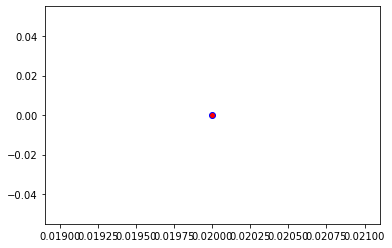

Crafting adversarial images took: 7.825690031051636 seconds 

Images classified as:
000000407518 15 = robin
000000407524 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


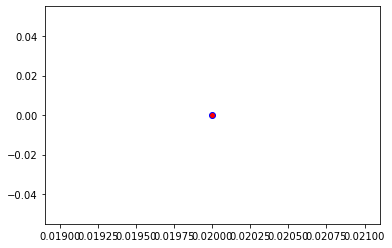

Crafting adversarial images took: 7.585175275802612 seconds 

Images classified as:
000000407574 954 = banana
000000407614 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


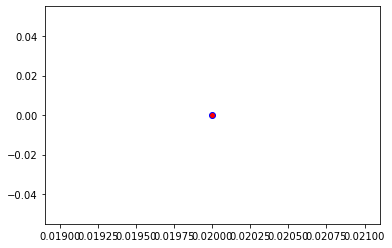

Crafting adversarial images took: 7.668495178222656 seconds 

Images classified as:
000000407646 752 = racket
000000407650 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


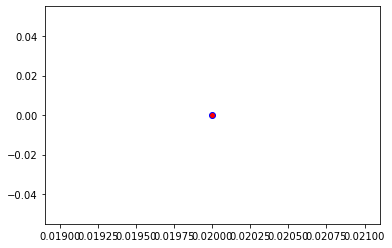

Crafting adversarial images took: 7.611306190490723 seconds 

Images classified as:
000000407825 409 = analog clock
000000407868 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


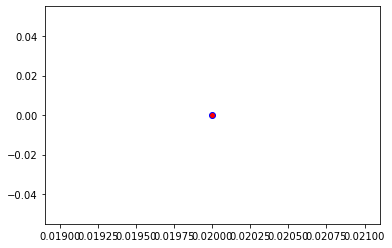

Crafting adversarial images took: 7.60676646232605 seconds 

Images classified as:
000000407943 999 = toilet tissue
000000407960 287 = lynx
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


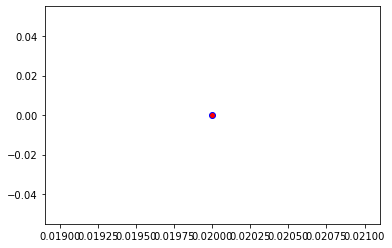

Crafting adversarial images took: 7.780981063842773 seconds 

Images classified as:
000000408112 895 = warplane
000000408120 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 254.90178
Min values in image-array: 0.0 Max values in image-array: 0.99961483
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


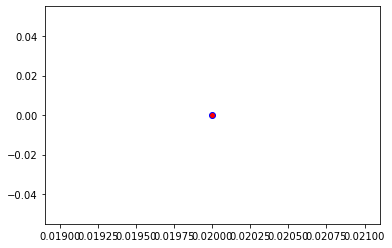

Crafting adversarial images took: 7.58196496963501 seconds 

Images classified as:
000000408696 861 = toilet seat
000000408774 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


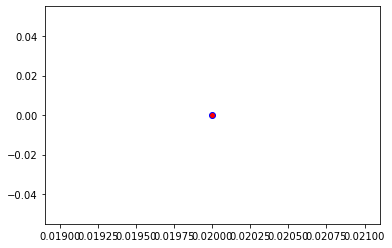

Crafting adversarial images took: 8.331890344619751 seconds 

Images classified as:
000000408830 670 = motor scooter
000000409198 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


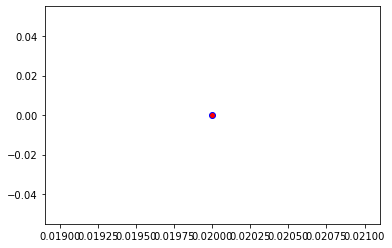

Crafting adversarial images took: 7.419433355331421 seconds 

Images classified as:
000000409211 752 = racket
000000409268 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


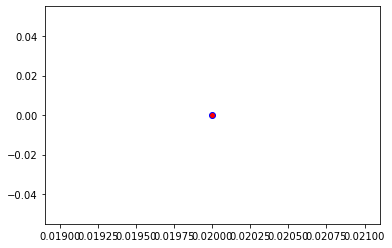

Crafting adversarial images took: 7.525451421737671 seconds 

Images classified as:
000000409358 896 = washbasin
000000409424 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


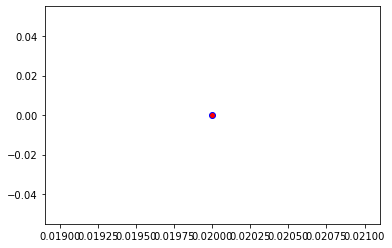

Crafting adversarial images took: 8.02336835861206 seconds 

Images classified as:
000000409475 248 = ski
000000409542 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


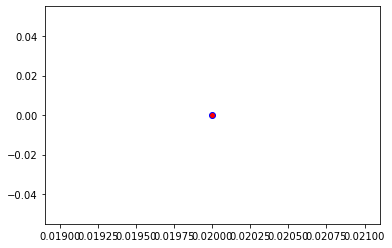

Crafting adversarial images took: 7.81083869934082 seconds 

Images classified as:
000000409630 673 = mouse
000000409867 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


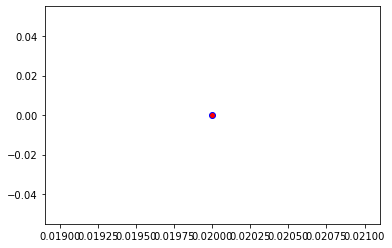

Crafting adversarial images took: 7.657539367675781 seconds 

Images classified as:
000000410221 127 = white stork
000000410428 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


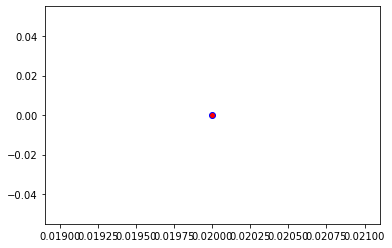

Crafting adversarial images took: 7.612080097198486 seconds 

Images classified as:
000000410456 977 = sandbar
000000410487 766 = rotisserie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


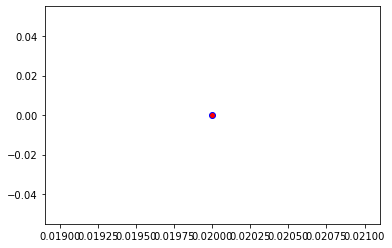

Crafting adversarial images took: 7.568483591079712 seconds 

Images classified as:
000000410496 752 = racket
000000410510 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


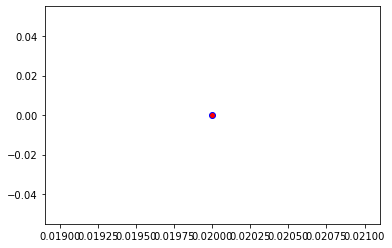

Crafting adversarial images took: 7.6265175342559814 seconds 

Images classified as:
000000410612 554 = fireboat
000000410650 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


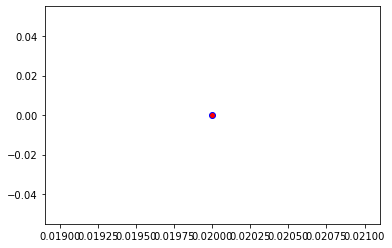

Crafting adversarial images took: 7.974785089492798 seconds 

Images classified as:
000000410712 920 = traffic light
000000410735 926 = hot pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


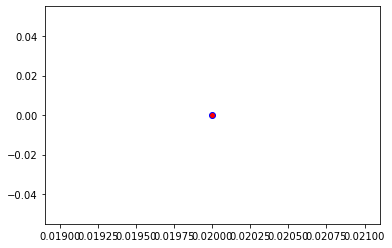

Crafting adversarial images took: 7.702071666717529 seconds 

Images classified as:
000000410878 670 = motor scooter
000000410880 267 = standard poodle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


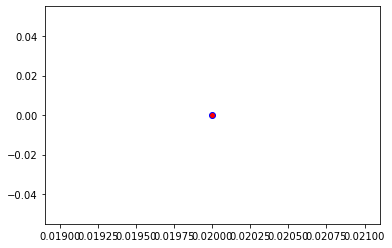

Crafting adversarial images took: 7.484055042266846 seconds 

Images classified as:
000000410934 937 = broccoli
000000411530 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


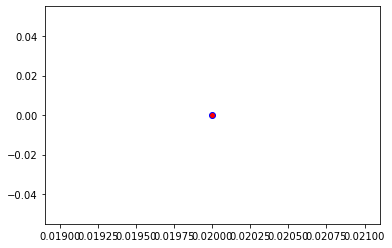

Crafting adversarial images took: 7.680602550506592 seconds 

Images classified as:
000000411665 333 = hamster
000000411754 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


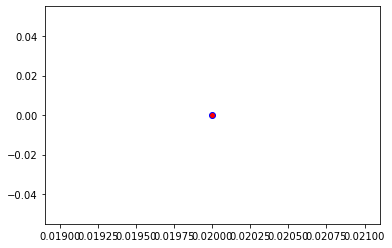

Crafting adversarial images took: 7.5890913009643555 seconds 

Images classified as:
000000411774 570 = gasmask
000000411817 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


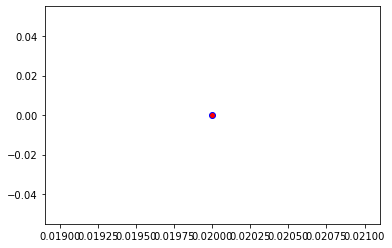

Crafting adversarial images took: 7.814112663269043 seconds 

Images classified as:
000000411938 612 = jinrikisha
000000411953 546 = electric guitar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


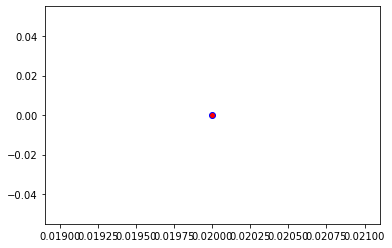

Crafting adversarial images took: 8.208630084991455 seconds 

Images classified as:
000000412240 179 = Staffordshire bullterrier
000000412286 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


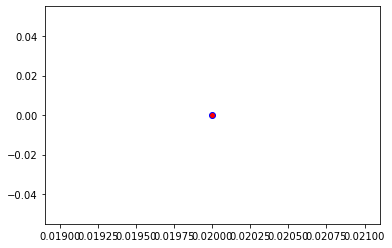

Crafting adversarial images took: 7.814436674118042 seconds 

Images classified as:
000000412362 639 = suit
000000412531 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


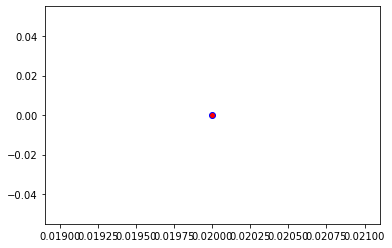

Crafting adversarial images took: 7.595440149307251 seconds 

Images classified as:
000000412887 355 = llama
000000412894 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


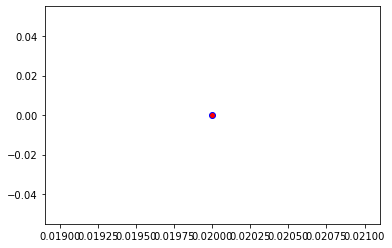

Crafting adversarial images took: 7.741763591766357 seconds 

Images classified as:
000000413247 526 = desk
000000413395 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


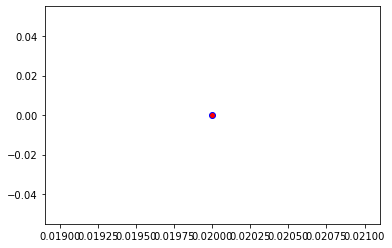

Crafting adversarial images took: 7.840575218200684 seconds 

Images classified as:
000000413404 703 = park bench
000000413552 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


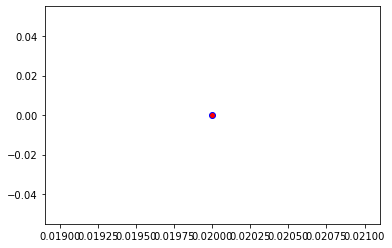

Crafting adversarial images took: 7.456059694290161 seconds 

Images classified as:
000000413689 971 = bubble
000000414034 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


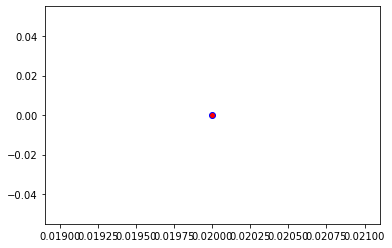

Crafting adversarial images took: 7.59753155708313 seconds 

Images classified as:
000000414133 919 = street sign
000000414170 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


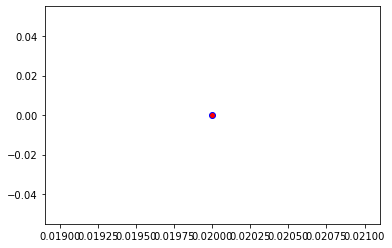

Crafting adversarial images took: 7.747578382492065 seconds 

Images classified as:
000000414261 297 = sloth bear
000000414340 657 = missile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


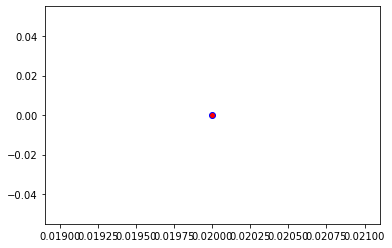

Crafting adversarial images took: 7.632179021835327 seconds 

Images classified as:
000000414385 871 = trimaran
000000414510 675 = moving van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


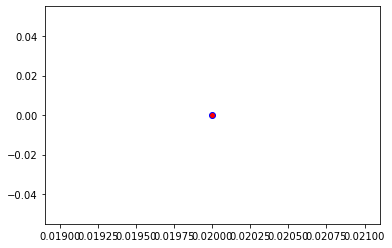

Crafting adversarial images took: 7.732115268707275 seconds 

Images classified as:
000000414638 965 = burrito
000000414673 981 = ballplayer
Min values in image-array: 1.067483 Max values in image-array: 255.0
Min values in image-array: 0.0041862074 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


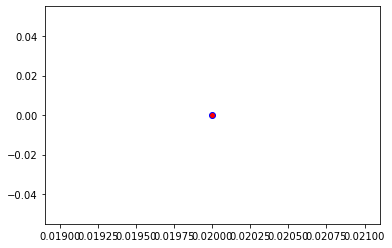

Crafting adversarial images took: 7.545502424240112 seconds 

Images classified as:
000000414676 442 = bell cote
000000414795 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


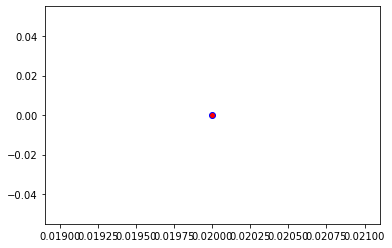

Crafting adversarial images took: 7.490121841430664 seconds 

Images classified as:
000000415194 532 = dining table
000000415238 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


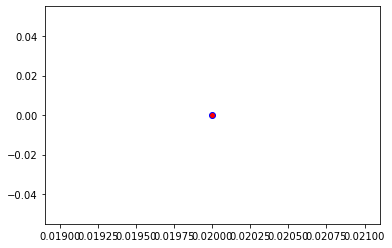

Crafting adversarial images took: 7.496174335479736 seconds 

Images classified as:
000000415536 829 = streetcar
000000415716 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


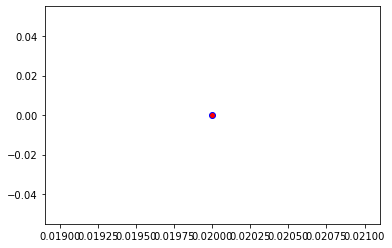

Crafting adversarial images took: 7.755357503890991 seconds 

Images classified as:
000000415727 432 = bassoon
000000415741 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


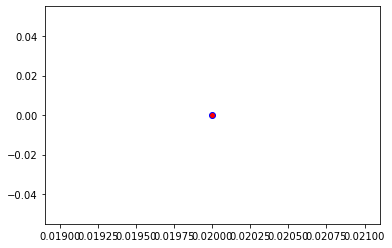

Crafting adversarial images took: 7.604051113128662 seconds 

Images classified as:
000000415748 385 = Indian elephant
000000415882 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


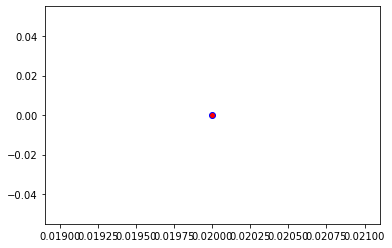

Crafting adversarial images took: 8.396023035049438 seconds 

Images classified as:
000000415990 37 = ox
000000416104 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


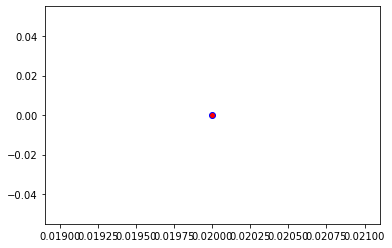

Crafting adversarial images took: 7.584120750427246 seconds 

Images classified as:
000000416170 904 = window screen
000000416256 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


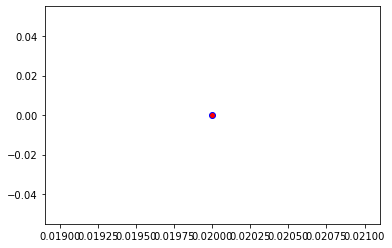

Crafting adversarial images took: 7.49686598777771 seconds 

Images classified as:
000000416269 547 = electric locomotive
000000416330 284 = Siamese cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


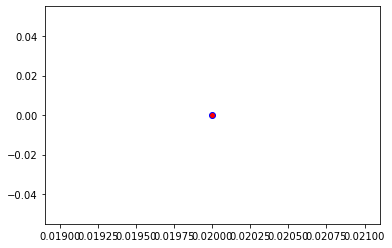

Crafting adversarial images took: 7.819235324859619 seconds 

Images classified as:
000000416343 747 = punching bag
000000416451 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


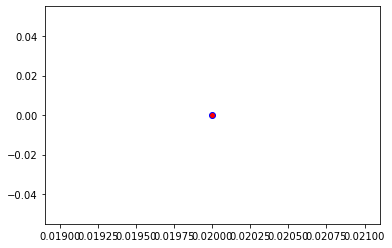

Crafting adversarial images took: 7.875849962234497 seconds 

Images classified as:
000000416534 765 = rocking chair
000000416745 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 253.58974
Min values in image-array: 0.0 Max values in image-array: 0.9944696
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


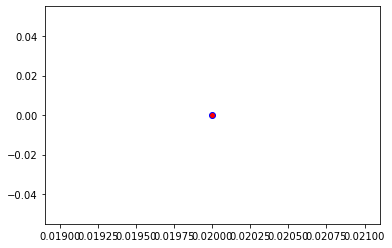

Crafting adversarial images took: 7.724506616592407 seconds 

Images classified as:
000000416758 37 = ox
000000416837 350 = ibex
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


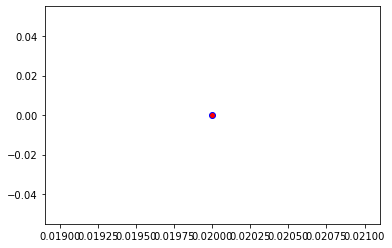

Crafting adversarial images took: 7.751659154891968 seconds 

Images classified as:
000000416885 966 = red wine
000000416991 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


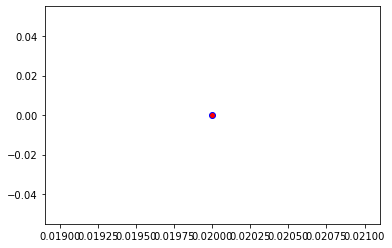

Crafting adversarial images took: 7.563843250274658 seconds 

Images classified as:
000000417043 791 = shopping cart
000000417085 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


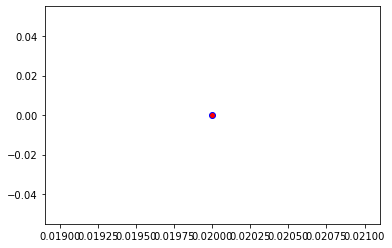

Crafting adversarial images took: 7.576540470123291 seconds 

Images classified as:
000000417249 462 = broom
000000417285 969 = eggnog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


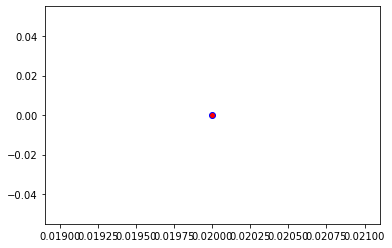

Crafting adversarial images took: 7.6160290241241455 seconds 

Images classified as:
000000417465 295 = American black bear
000000417608 964 = potpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


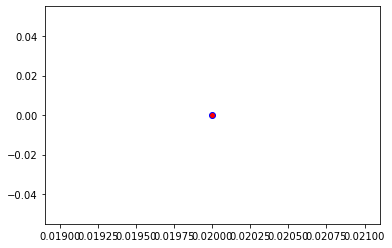

Crafting adversarial images took: 7.753175258636475 seconds 

Images classified as:
000000417632 691 = oxygen mask
000000417779 412 = ashcan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


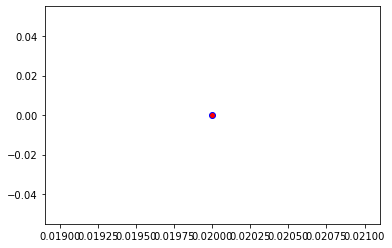

Crafting adversarial images took: 7.6729865074157715 seconds 

Images classified as:
000000417876 293 = cheetah
000000417911 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


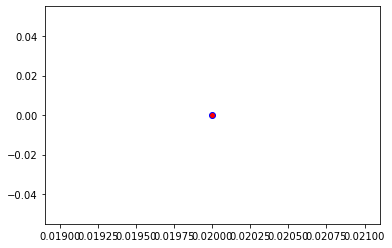

Crafting adversarial images took: 7.692559242248535 seconds 

Images classified as:
000000418062 424 = barbershop
000000418281 690 = oxcart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


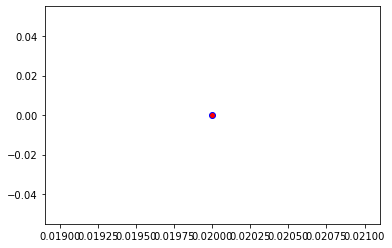

Crafting adversarial images took: 7.60066556930542 seconds 

Images classified as:
000000418696 497 = church
000000418959 175 = otter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


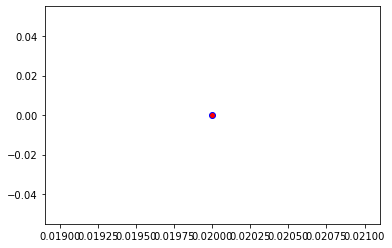

Crafting adversarial images took: 7.741596460342407 seconds 

Images classified as:
000000418961 892 = wall clock
000000419096 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


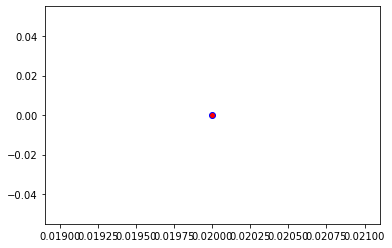

Crafting adversarial images took: 8.498959302902222 seconds 

Images classified as:
000000419098 600 = hook
000000419201 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


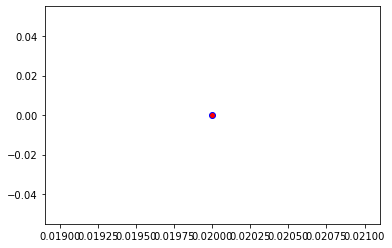

Crafting adversarial images took: 7.395681381225586 seconds 

Images classified as:
000000419312 461 = plate
000000419379 931 = bagel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


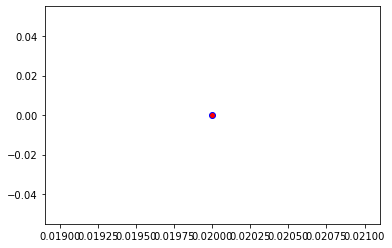

Crafting adversarial images took: 7.70508337020874 seconds 

Images classified as:
000000419408 703 = park bench
000000419601 905 = window shade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


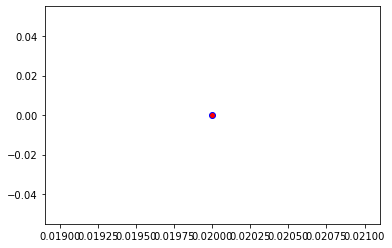

Crafting adversarial images took: 7.798248767852783 seconds 

Images classified as:
000000419653 651 = microwave
000000419882 318 = wing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


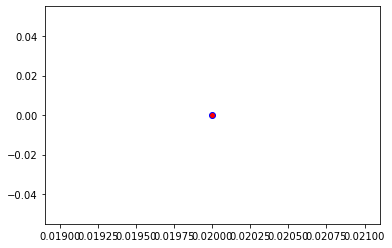

Crafting adversarial images took: 7.914006948471069 seconds 

Images classified as:
000000419974 532 = dining table
000000420069 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


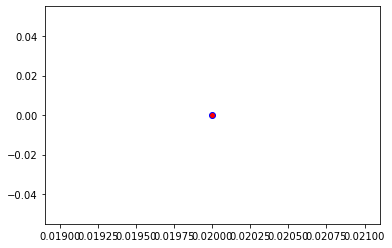

Crafting adversarial images took: 7.575205087661743 seconds 

Images classified as:
000000420230 386 = African elephant
000000420281 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


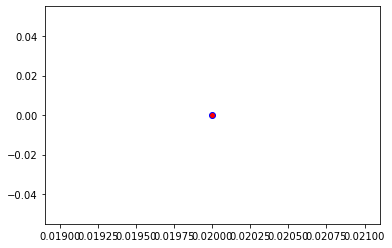

Crafting adversarial images took: 7.828632116317749 seconds 

Images classified as:
000000420472 38 = banded gecko
000000420840 105 = ear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


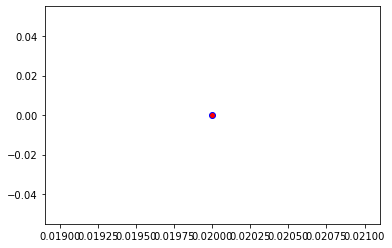

Crafting adversarial images took: 7.596448659896851 seconds 

Images classified as:
000000420916 830 = stretcher
000000421060 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


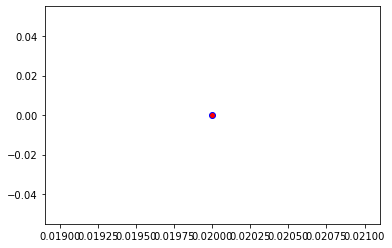

Crafting adversarial images took: 7.576288223266602 seconds 

Images classified as:
000000421455 475 = car mirror
000000421757 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


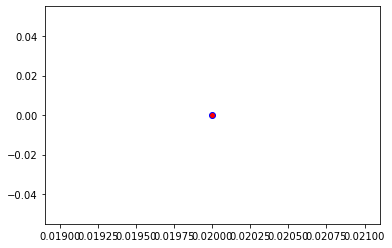

Crafting adversarial images took: 7.66771388053894 seconds 

Images classified as:
000000421834 11 = goldfinch
000000421923 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


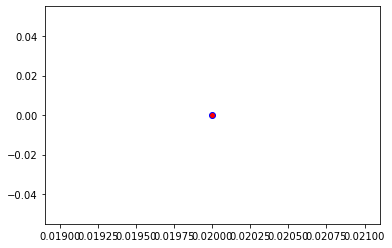

Crafting adversarial images took: 7.6431725025177 seconds 

Images classified as:
000000422670 452 = bonnet
000000422706 625 = lifeboat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


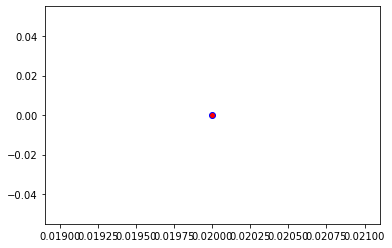

Crafting adversarial images took: 7.708127021789551 seconds 

Images classified as:
000000422836 919 = street sign
000000422886 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


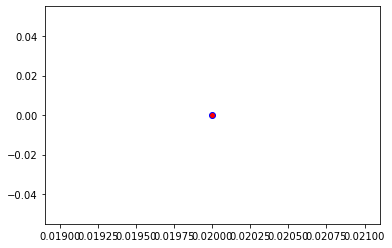

Crafting adversarial images took: 7.594601154327393 seconds 

Images classified as:
000000422998 739 = potter's wheel
000000423104 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


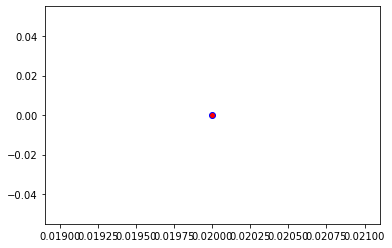

Crafting adversarial images took: 7.508076906204224 seconds 

Images classified as:
000000423123 209 = Chesapeake Bay retriever
000000423229 820 = steam locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


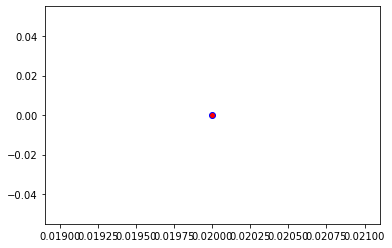

Crafting adversarial images took: 8.192426443099976 seconds 

Images classified as:
000000423506 906 = Windsor tie
000000423519 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 254.61223
Min values in image-array: 0.0 Max values in image-array: 0.9984793
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


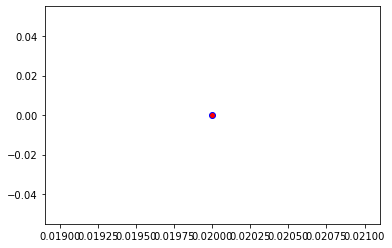

Crafting adversarial images took: 7.856140851974487 seconds 

Images classified as:
000000423617 874 = trolleybus
000000423798 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


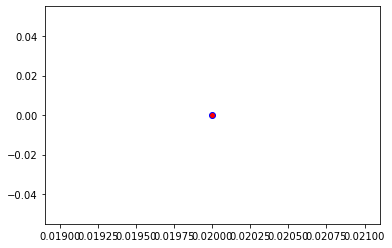

Crafting adversarial images took: 7.465966463088989 seconds 

Images classified as:
000000423944 639 = suit
000000423971 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


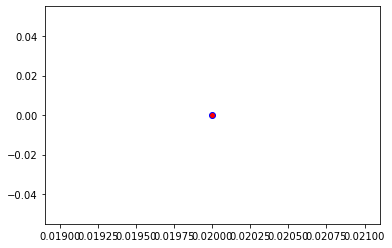

Crafting adversarial images took: 7.739102840423584 seconds 

Images classified as:
000000424135 149 = gong
000000424162 225 = malinois
Min values in image-array: 0.0019029919 Max values in image-array: 255.0
Min values in image-array: 7.4627133e-06 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


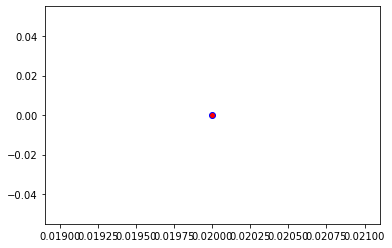

Crafting adversarial images took: 7.832273960113525 seconds 

Images classified as:
000000424349 766 = rotisserie
000000424521 51 = triceratops
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


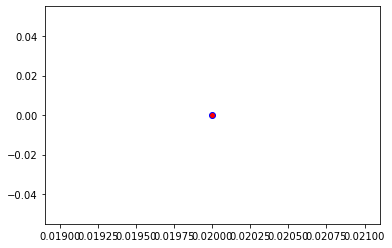

Crafting adversarial images took: 7.763213157653809 seconds 

Images classified as:
000000424545 281 = tabby
000000424551 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


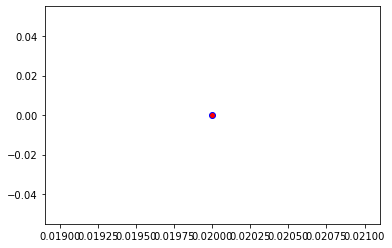

Crafting adversarial images took: 7.697401762008667 seconds 

Images classified as:
000000424642 792 = shovel
000000424721 567 = frying pan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


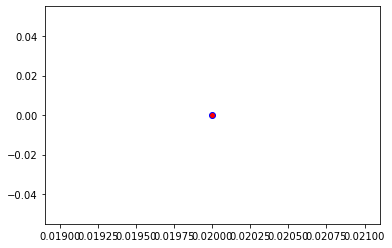

Crafting adversarial images took: 7.7397987842559814 seconds 

Images classified as:
000000424776 895 = warplane
000000424975 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


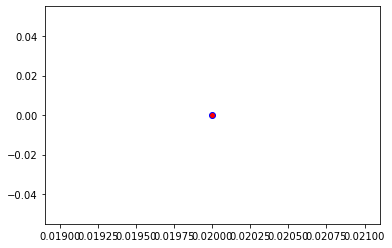

Crafting adversarial images took: 7.5546863079071045 seconds 

Images classified as:
000000425221 789 = shoji
000000425226 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


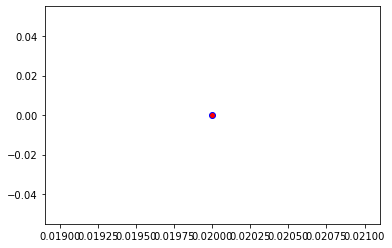

Crafting adversarial images took: 7.486188888549805 seconds 

Images classified as:
000000425227 978 = seashore
000000425361 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


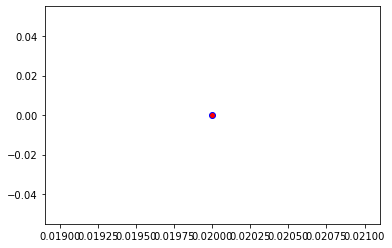

Crafting adversarial images took: 7.811428785324097 seconds 

Images classified as:
000000425390 284 = Siamese cat
000000425702 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


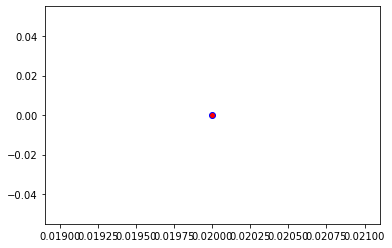

Crafting adversarial images took: 7.683888673782349 seconds 

Images classified as:
000000425906 248 = ski
000000425925 668 = mosque
Min values in image-array: 0.0 Max values in image-array: 254.9375
Min values in image-array: 0.0 Max values in image-array: 0.9997549
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


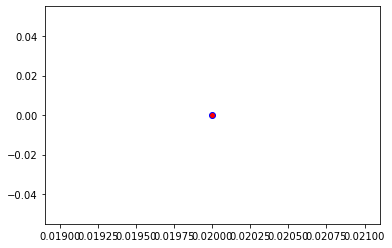

Crafting adversarial images took: 7.676464319229126 seconds 

Images classified as:
000000426166 880 = unicycle
000000426203 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


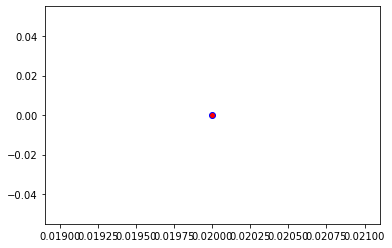

Crafting adversarial images took: 7.5960564613342285 seconds 

Images classified as:
000000426241 527 = desktop computer
000000426253 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


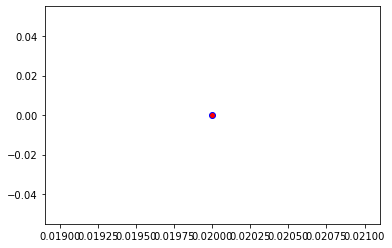

Crafting adversarial images took: 7.567056655883789 seconds 

Images classified as:
000000426268 820 = steam locomotive
000000426297 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


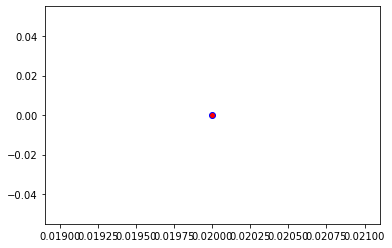

Crafting adversarial images took: 8.204213380813599 seconds 

Images classified as:
000000426329 999 = toilet tissue
000000426372 407 = ambulance
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


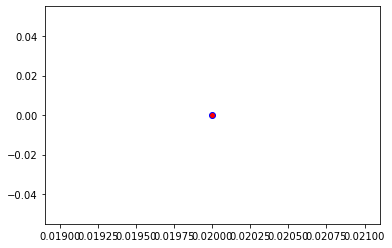

Crafting adversarial images took: 7.644699335098267 seconds 

Images classified as:
000000426376 248 = ski
000000426795 938 = cauliflower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


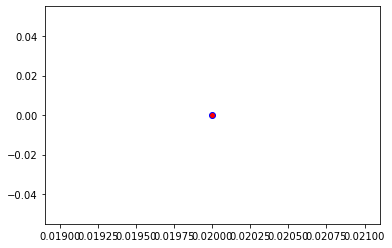

Crafting adversarial images took: 7.593458890914917 seconds 

Images classified as:
000000426836 975 = lakeside
000000427034 165 = black-and-tan coonhound
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


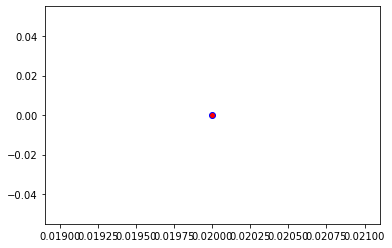

Crafting adversarial images took: 7.831483602523804 seconds 

Images classified as:
000000427055 409 = analog clock
000000427077 921 = book jacket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


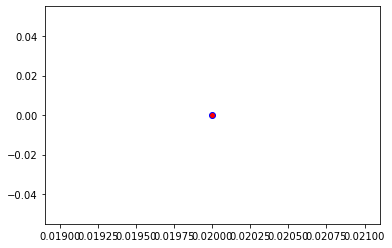

Crafting adversarial images took: 7.784188270568848 seconds 

Images classified as:
000000427160 981 = ballplayer
000000427256 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


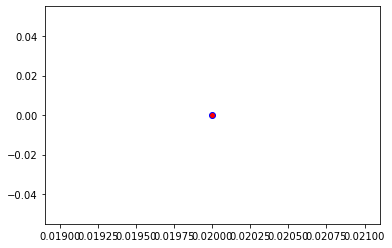

Crafting adversarial images took: 7.707044363021851 seconds 

Images classified as:
000000427338 873 = triumphal arch
000000427500 412 = ashcan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


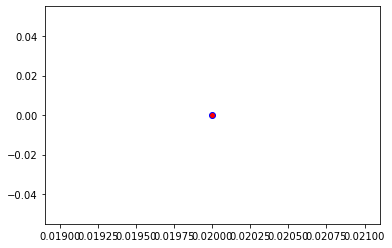

Crafting adversarial images took: 7.864557266235352 seconds 

Images classified as:
000000427649 975 = lakeside
000000427655 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


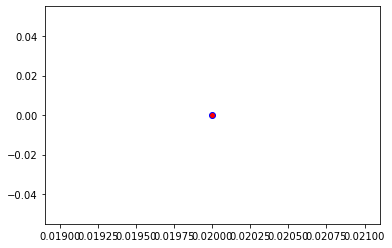

Crafting adversarial images took: 7.757729768753052 seconds 

Images classified as:
000000427997 752 = racket
000000428111 672 = mountain tent
Min values in image-array: 0.0 Max values in image-array: 250.6762
Min values in image-array: 0.0 Max values in image-array: 0.9830439
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


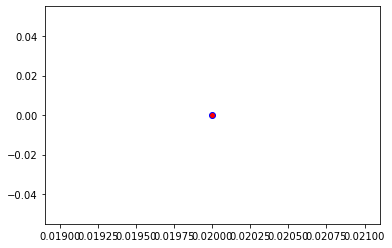

Crafting adversarial images took: 7.603219985961914 seconds 

Images classified as:
000000428218 522 = croquet ball
000000428280 559 = folding chair
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


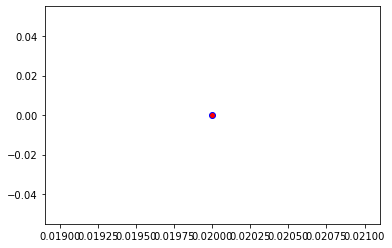

Crafting adversarial images took: 8.16122055053711 seconds 

Images classified as:
000000428454 701 = parachute
000000428562 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


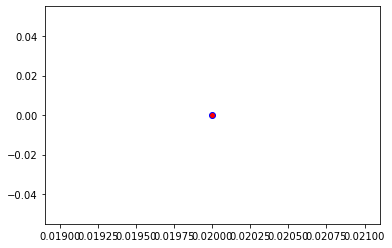

Crafting adversarial images took: 7.5987420082092285 seconds 

Images classified as:
000000428867 850 = teddy
000000429011 561 = forklift
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


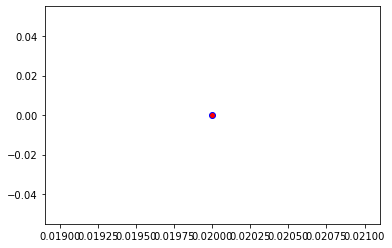

Crafting adversarial images took: 7.466770648956299 seconds 

Images classified as:
000000429109 654 = minibus
000000429281 954 = banana
Min values in image-array: 0.0 Max values in image-array: 254.79576
Min values in image-array: 0.0 Max values in image-array: 0.9991991
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


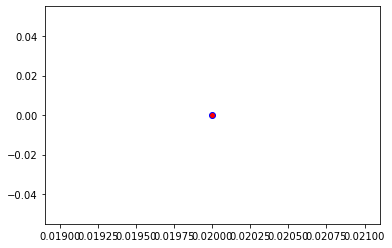

Crafting adversarial images took: 7.9667088985443115 seconds 

Images classified as:
000000429530 883 = vase
000000429598 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


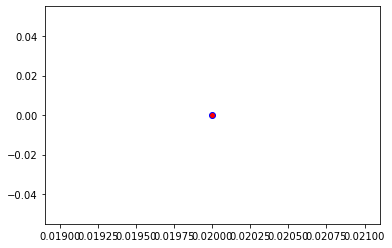

Crafting adversarial images took: 7.606490135192871 seconds 

Images classified as:
000000429623 963 = pizza
000000429690 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


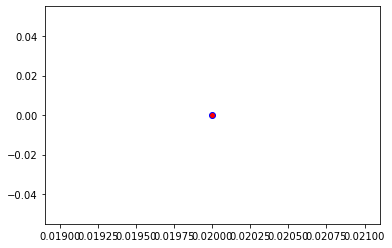

Crafting adversarial images took: 7.478530406951904 seconds 

Images classified as:
000000429718 820 = steam locomotive
000000429761 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


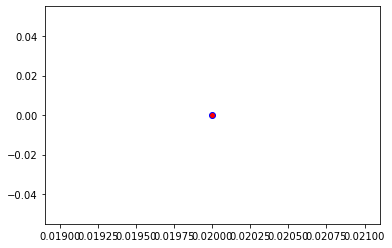

Crafting adversarial images took: 8.40607213973999 seconds 

Images classified as:
000000430048 904 = window screen
000000430056 931 = bagel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


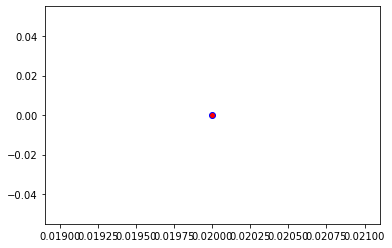

Crafting adversarial images took: 7.749783992767334 seconds 

Images classified as:
000000430073 690 = oxcart
000000430286 434 = bath towel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


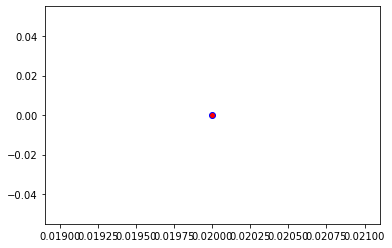

Crafting adversarial images took: 7.486879587173462 seconds 

Images classified as:
000000430377 248 = ski
000000430871 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 254.42699
Min values in image-array: 0.0 Max values in image-array: 0.9977529
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


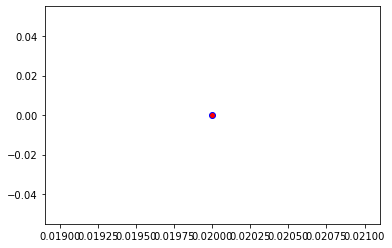

Crafting adversarial images took: 7.992053508758545 seconds 

Images classified as:
000000430875 920 = traffic light
000000430961 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


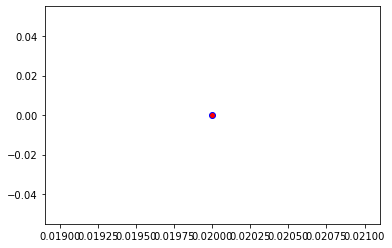

Crafting adversarial images took: 7.726010322570801 seconds 

Images classified as:
000000430973 963 = pizza
000000431140 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


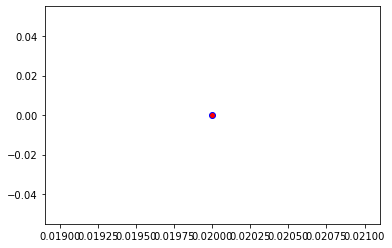

Crafting adversarial images took: 7.577442407608032 seconds 

Images classified as:
000000431545 981 = ballplayer
000000431568 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


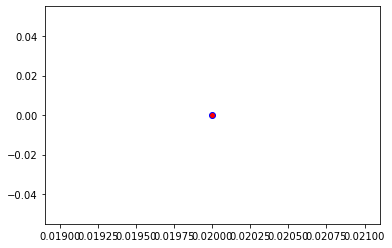

Crafting adversarial images took: 7.8158910274505615 seconds 

Images classified as:
000000431693 752 = racket
000000431727 337 = beaver
Min values in image-array: 0.0 Max values in image-array: 253.97768
Min values in image-array: 0.0 Max values in image-array: 0.9959909
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


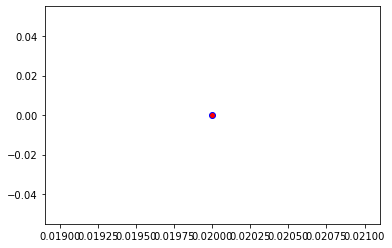

Crafting adversarial images took: 7.535975217819214 seconds 

Images classified as:
000000431848 702 = parallel bars
000000431876 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


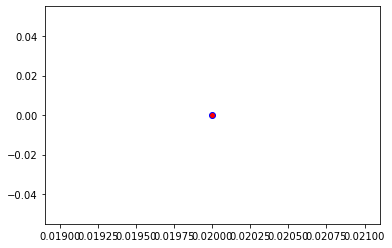

Crafting adversarial images took: 7.751685380935669 seconds 

Images classified as:
000000431896 547 = electric locomotive
000000432085 521 = Crock Pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


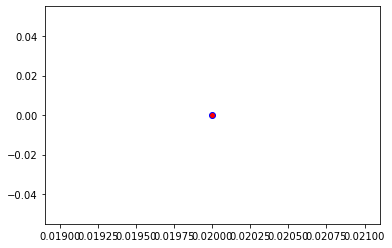

Crafting adversarial images took: 7.871678352355957 seconds 

Images classified as:
000000432468 333 = hamster
000000432553 253 = basenji
Min values in image-array: 0.011160374 Max values in image-array: 255.0
Min values in image-array: 4.3766173e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


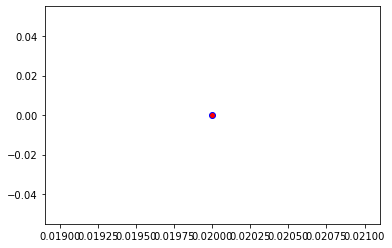

Crafting adversarial images took: 7.600394248962402 seconds 

Images classified as:
000000432898 557 = flagpole
000000433103 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


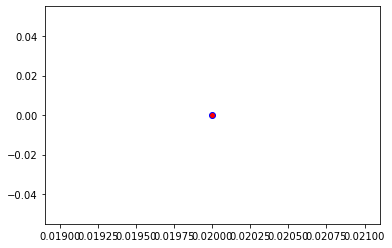

Crafting adversarial images took: 7.607672691345215 seconds 

Images classified as:
000000433134 283 = Persian cat
000000433192 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


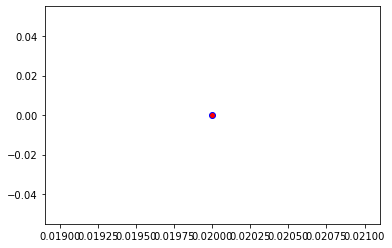

Crafting adversarial images took: 7.631919622421265 seconds 

Images classified as:
000000433204 603 = horse cart
000000433243 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


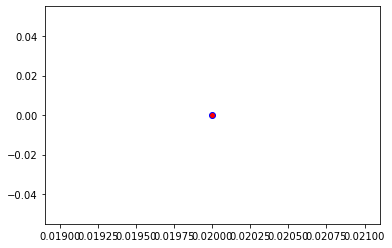

Crafting adversarial images took: 7.652145624160767 seconds 

Images classified as:
000000433374 385 = Indian elephant
000000433515 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


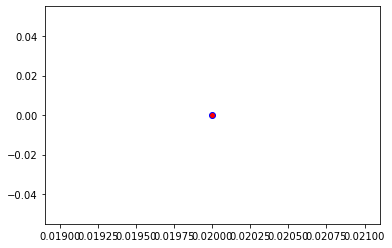

Crafting adversarial images took: 7.637009620666504 seconds 

Images classified as:
000000433774 704 = parking meter
000000433915 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


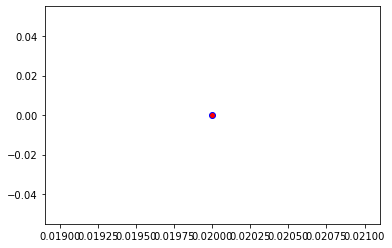

Crafting adversarial images took: 8.444779396057129 seconds 

Images classified as:
000000433980 626 = lighter
000000434204 491 = chain saw
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


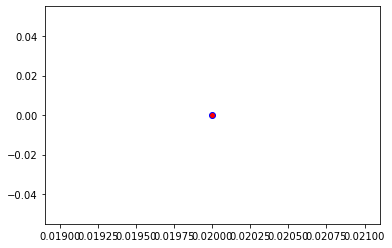

Crafting adversarial images took: 7.711184978485107 seconds 

Images classified as:
000000434230 861 = toilet seat
000000434247 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


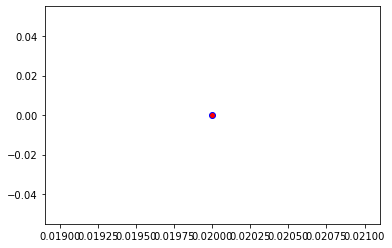

Crafting adversarial images took: 7.826091766357422 seconds 

Images classified as:
000000434297 461 = plate
000000434459 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


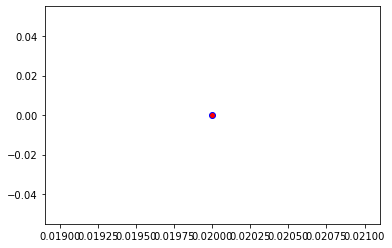

Crafting adversarial images took: 7.810082197189331 seconds 

Images classified as:
000000434479 941 = acorn squash
000000434548 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 254.95695
Min values in image-array: 0.0 Max values in image-array: 0.9998312
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


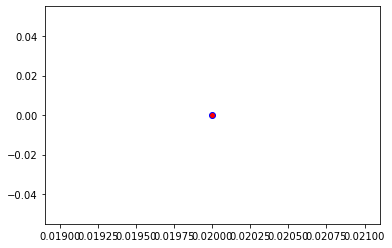

Crafting adversarial images took: 7.6269049644470215 seconds 

Images classified as:
000000434996 181 = Bedlington terrier
000000435003 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


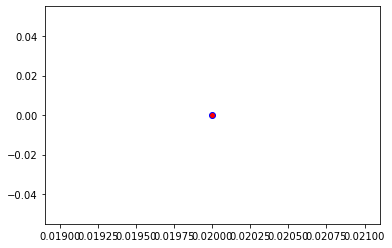

Crafting adversarial images took: 7.816349983215332 seconds 

Images classified as:
000000435081 922 = menu
000000435205 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


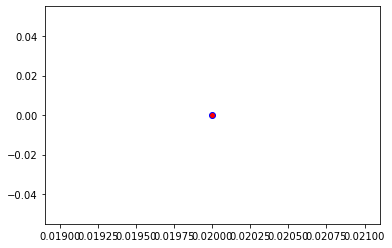

Crafting adversarial images took: 7.649484872817993 seconds 

Images classified as:
000000435206 460 = breakwater
000000435208 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


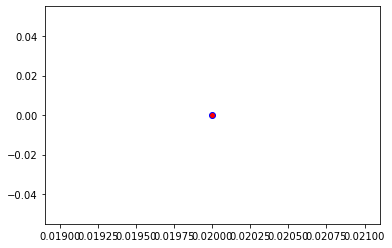

Crafting adversarial images took: 7.445270538330078 seconds 

Images classified as:
000000435299 184 = Irish terrier
000000435880 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


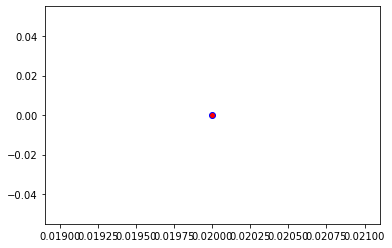

Crafting adversarial images took: 7.824786186218262 seconds 

Images classified as:
000000436315 963 = pizza
000000436551 100 = black swan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


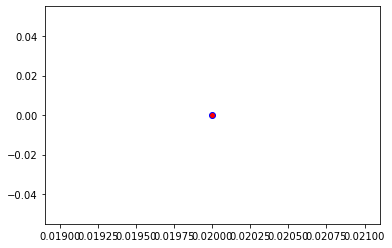

Crafting adversarial images took: 7.783075332641602 seconds 

Images classified as:
000000436617 762 = restaurant
000000436738 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


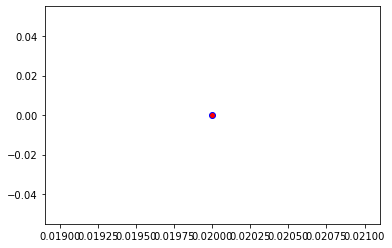

Crafting adversarial images took: 7.520058631896973 seconds 

Images classified as:
000000436883 654 = minibus
000000437110 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


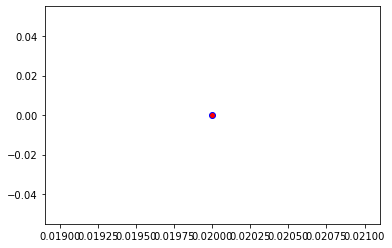

Crafting adversarial images took: 7.709718942642212 seconds 

Images classified as:
000000437205 105 = ear
000000437239 428 = barrow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


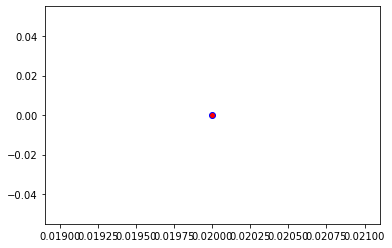

Crafting adversarial images took: 7.661619663238525 seconds 

Images classified as:
000000437331 693 = paddle
000000437351 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


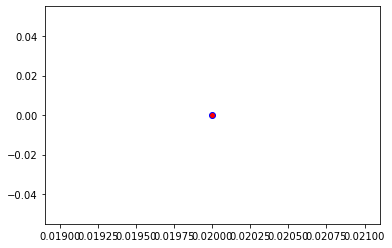

Crafting adversarial images took: 7.481459379196167 seconds 

Images classified as:
000000437392 861 = toilet seat
000000437514 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


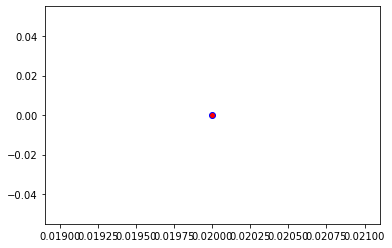

Crafting adversarial images took: 8.663471698760986 seconds 

Images classified as:
000000437898 651 = microwave
000000438017 134 = crane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


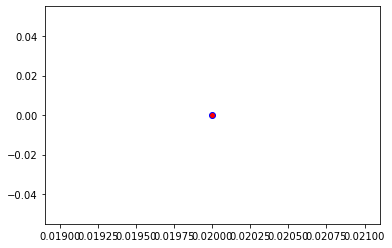

Crafting adversarial images took: 9.149110794067383 seconds 

Images classified as:
000000438226 965 = burrito
000000438269 131 = little blue heron
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


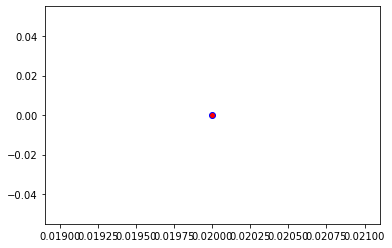

Crafting adversarial images took: 7.751760005950928 seconds 

Images classified as:
000000438304 752 = racket
000000438774 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


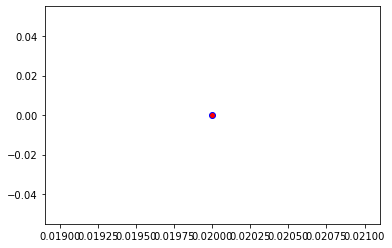

Crafting adversarial images took: 7.879139184951782 seconds 

Images classified as:
000000438862 805 = soccer ball
000000438876 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


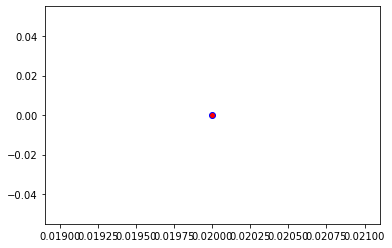

Crafting adversarial images took: 7.736454486846924 seconds 

Images classified as:
000000438907 67 = dam
000000438955 439 = bearskin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


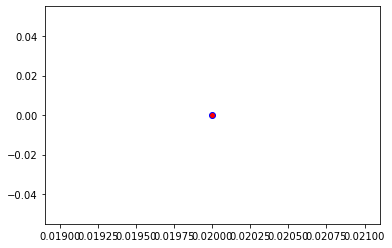

Crafting adversarial images took: 7.826014518737793 seconds 

Images classified as:
000000439180 354 = Arabian camel
000000439290 89 = sulphur-crested cockatoo
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


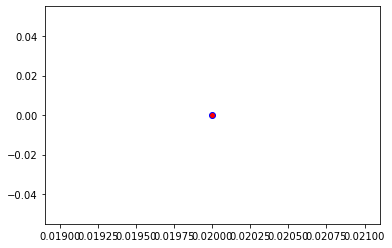

Crafting adversarial images took: 7.751214027404785 seconds 

Images classified as:
000000439426 932 = pretzel
000000439522 248 = ski
Min values in image-array: 0.08225027 Max values in image-array: 255.0
Min values in image-array: 0.00032255007 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


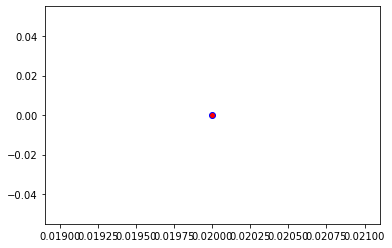

Crafting adversarial images took: 7.670518159866333 seconds 

Images classified as:
000000439525 739 = potter's wheel
000000439593 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


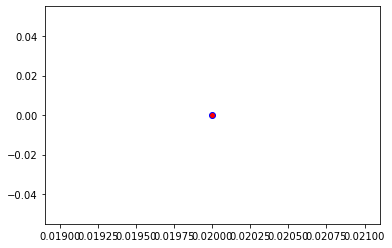

Crafting adversarial images took: 7.48796010017395 seconds 

Images classified as:
000000439623 708 = pedestal
000000439715 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


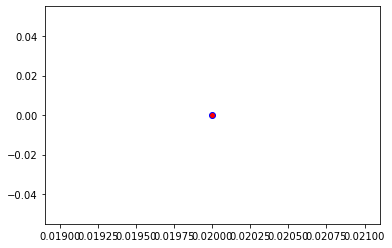

Crafting adversarial images took: 7.633239030838013 seconds 

Images classified as:
000000439773 722 = ping-pong ball
000000439854 358 = pole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


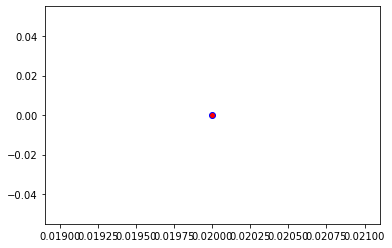

Crafting adversarial images took: 7.808953046798706 seconds 

Images classified as:
000000439994 981 = ballplayer
000000440171 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


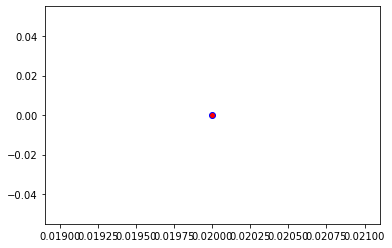

Crafting adversarial images took: 7.583905935287476 seconds 

Images classified as:
000000440184 752 = racket
000000440336 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


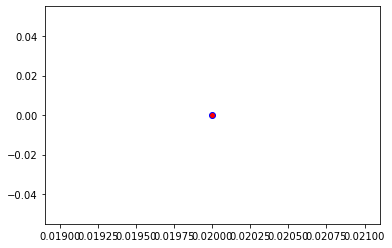

Crafting adversarial images took: 7.660719633102417 seconds 

Images classified as:
000000440475 495 = china cabinet
000000440507 492 = chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


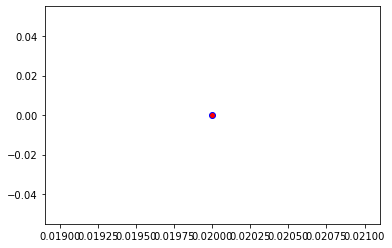

Crafting adversarial images took: 7.575899839401245 seconds 

Images classified as:
000000440508 547 = electric locomotive
000000440617 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


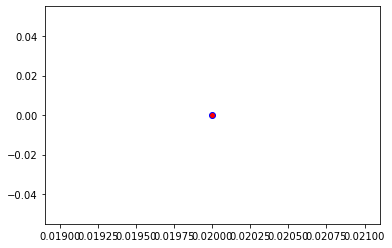

Crafting adversarial images took: 7.466264247894287 seconds 

Images classified as:
000000441247 532 = dining table
000000441286 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


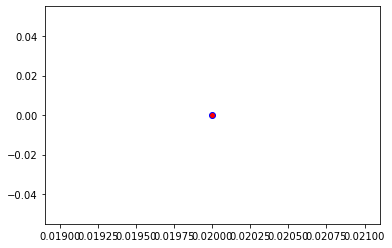

Crafting adversarial images took: 8.543215036392212 seconds 

Images classified as:
000000441442 339 = sorrel
000000441468 412 = ashcan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


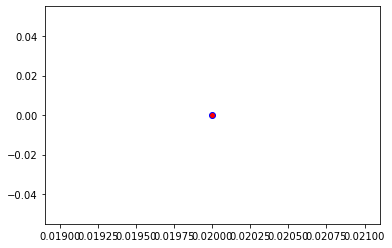

Crafting adversarial images took: 7.756869792938232 seconds 

Images classified as:
000000441491 123 = crayfish
000000441543 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


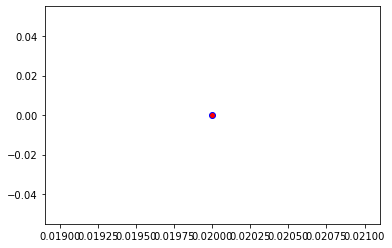

Crafting adversarial images took: 7.73760986328125 seconds 

Images classified as:
000000441553 829 = streetcar
000000441586 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


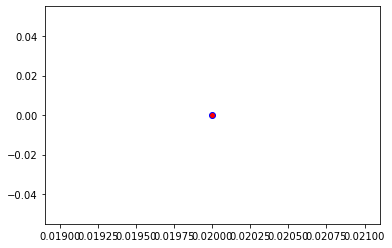

Crafting adversarial images took: 7.79814338684082 seconds 

Images classified as:
000000442009 896 = washbasin
000000442161 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


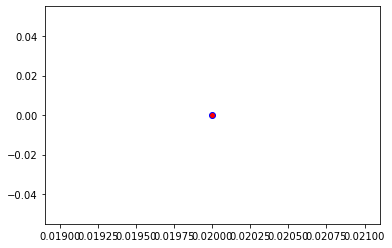

Crafting adversarial images took: 7.720700025558472 seconds 

Images classified as:
000000442306 879 = umbrella
000000442323 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


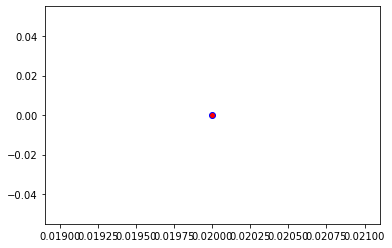

Crafting adversarial images took: 7.869707107543945 seconds 

Images classified as:
000000442456 734 = police van
000000442463 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


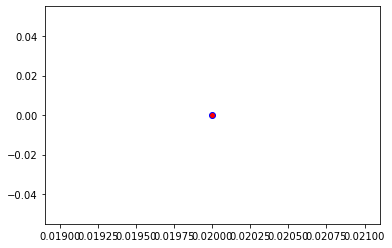

Crafting adversarial images took: 7.882822036743164 seconds 

Images classified as:
000000442480 812 = space shuttle
000000442661 213 = Irish setter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


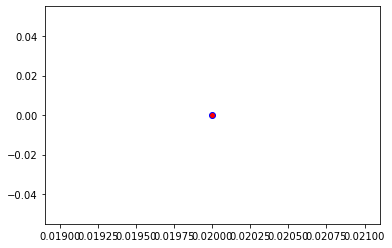

Crafting adversarial images took: 7.346934080123901 seconds 

Images classified as:
000000442746 522 = croquet ball
000000442822 814 = speedboat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


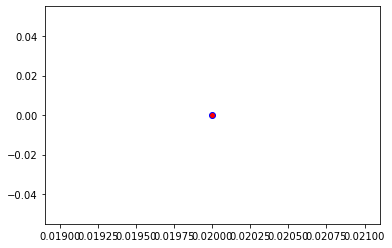

Crafting adversarial images took: 7.657424211502075 seconds 

Images classified as:
000000442836 522 = croquet ball
000000442993 663 = monastery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


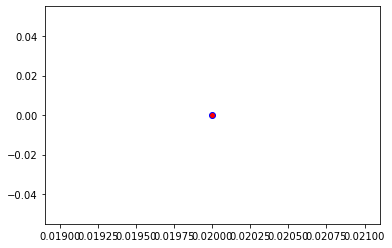

Crafting adversarial images took: 7.7340216636657715 seconds 

Images classified as:
000000443303 728 = plastic bag
000000443426 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 254.61284
Min values in image-array: 0.0 Max values in image-array: 0.9984817
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


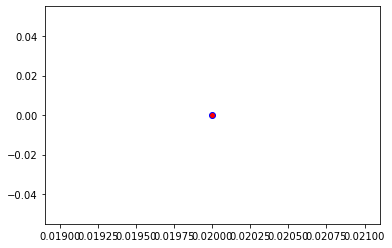

Crafting adversarial images took: 7.559504985809326 seconds 

Images classified as:
000000443498 874 = trolleybus
000000443844 740 = power drill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


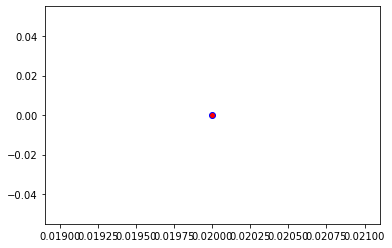

Crafting adversarial images took: 7.901824951171875 seconds 

Images classified as:
000000443969 791 = shopping cart
000000444142 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


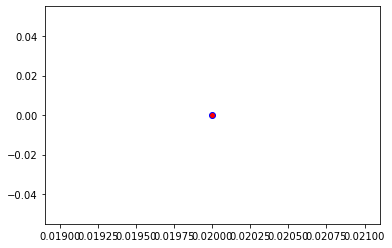

Crafting adversarial images took: 7.594616651535034 seconds 

Images classified as:
000000444275 651 = microwave
000000444879 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


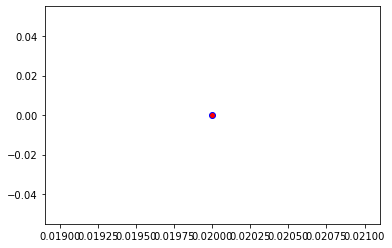

Crafting adversarial images took: 7.562036752700806 seconds 

Images classified as:
000000445248 385 = Indian elephant
000000445365 355 = llama
Min values in image-array: 0.0 Max values in image-array: 254.97209
Min values in image-array: 0.0 Max values in image-array: 0.99989057
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


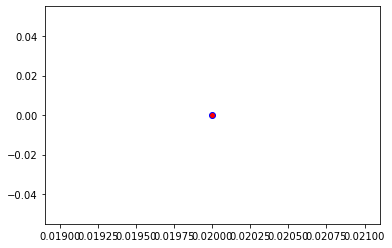

Crafting adversarial images took: 7.646829843521118 seconds 

Images classified as:
000000445439 340 = zebra
000000445602 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


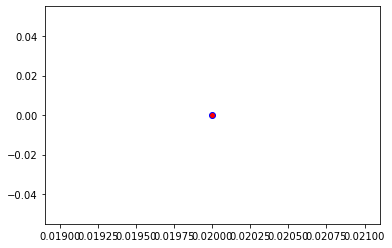

Crafting adversarial images took: 8.336788177490234 seconds 

Images classified as:
000000445658 534 = dishwasher
000000445675 293 = cheetah
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


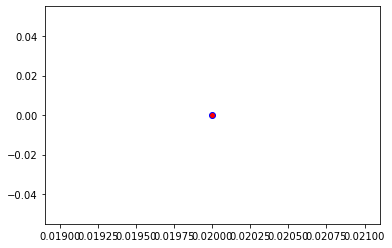

Crafting adversarial images took: 7.6105639934539795 seconds 

Images classified as:
000000445722 476 = carousel
000000445792 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


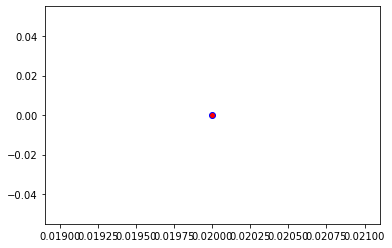

Crafting adversarial images took: 7.392461061477661 seconds 

Images classified as:
000000445834 675 = moving van
000000445846 435 = bathtub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


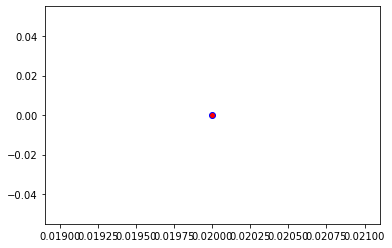

Crafting adversarial images took: 7.780998229980469 seconds 

Images classified as:
000000445999 629 = lipstick
000000446005 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


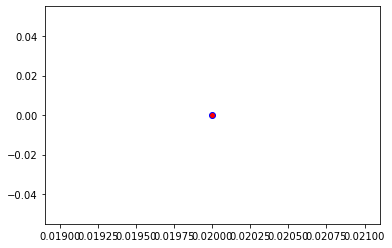

Crafting adversarial images took: 7.904985666275024 seconds 

Images classified as:
000000446117 950 = orange
000000446206 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


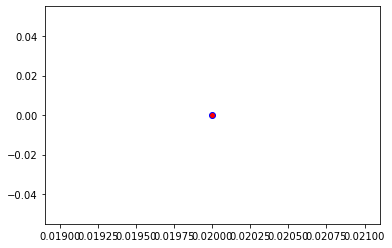

Crafting adversarial images took: 8.393330097198486 seconds 

Images classified as:
000000446207 531 = digital watch
000000446522 234 = Rottweiler
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


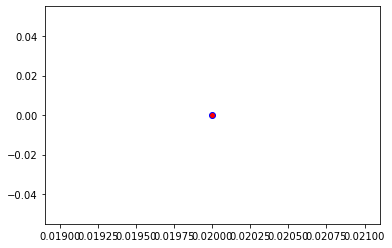

Crafting adversarial images took: 7.853862047195435 seconds 

Images classified as:
000000446574 794 = shower curtain
000000446651 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


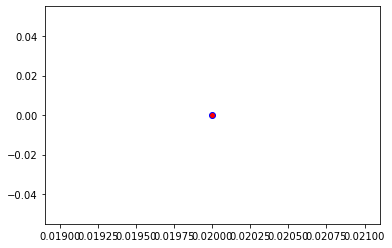

Crafting adversarial images took: 7.936488151550293 seconds 

Images classified as:
000000446703 850 = teddy
000000447088 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


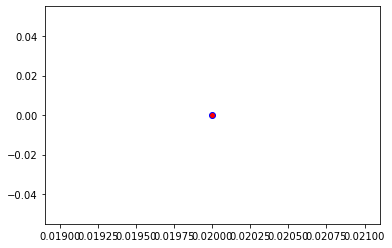

Crafting adversarial images took: 7.485297918319702 seconds 

Images classified as:
000000447169 651 = microwave
000000447187 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


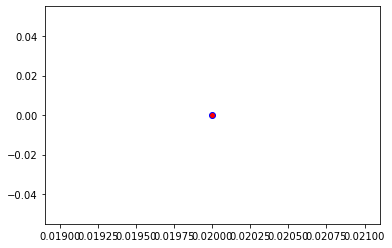

Crafting adversarial images took: 7.702939033508301 seconds 

Images classified as:
000000447200 156 = Blenheim spaniel
000000447313 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


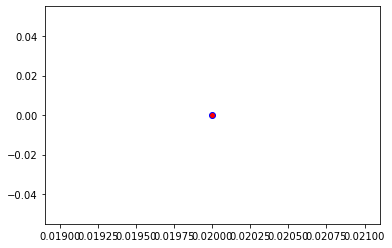

Crafting adversarial images took: 7.76611328125 seconds 

Images classified as:
000000447314 682 = obelisk
000000447342 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


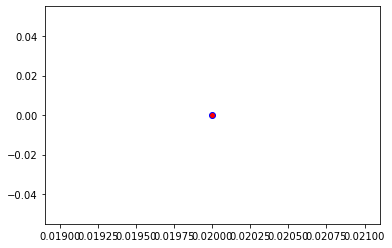

Crafting adversarial images took: 7.514189958572388 seconds 

Images classified as:
000000447465 248 = ski
000000447522 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


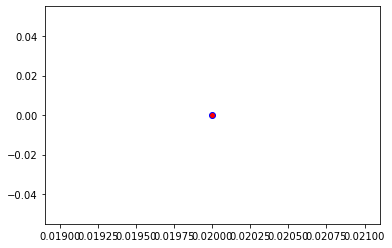

Crafting adversarial images took: 7.681338548660278 seconds 

Images classified as:
000000447611 848 = tape player
000000447789 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


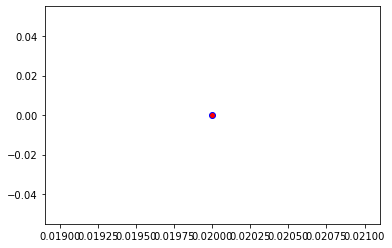

Crafting adversarial images took: 7.598113536834717 seconds 

Images classified as:
000000447917 805 = soccer ball
000000448076 747 = punching bag
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


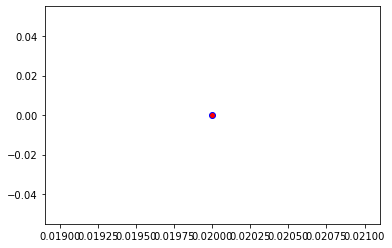

Crafting adversarial images took: 7.55569863319397 seconds 

Images classified as:
000000448256 575 = golfcart
000000448263 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


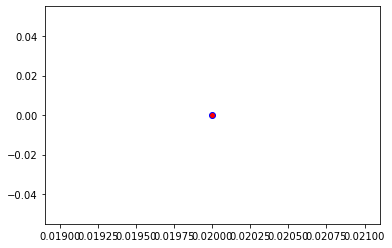

Crafting adversarial images took: 8.326299905776978 seconds 

Images classified as:
000000448365 880 = unicycle
000000448410 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


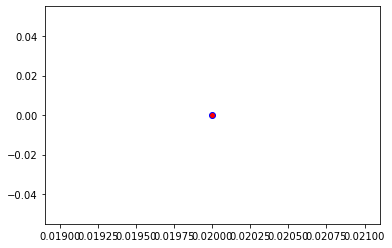

Crafting adversarial images took: 7.604885816574097 seconds 

Images classified as:
000000448448 290 = jaguar
000000448810 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


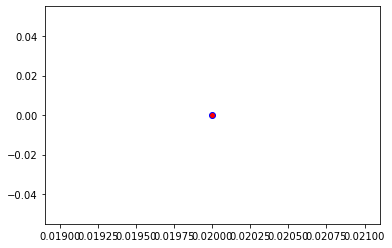

Crafting adversarial images took: 7.783122301101685 seconds 

Images classified as:
000000449190 924 = guacamole
000000449198 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


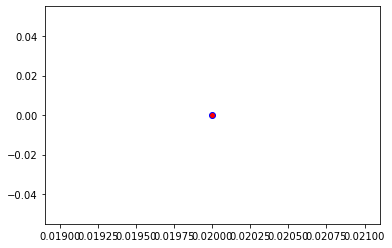

Crafting adversarial images took: 7.927639007568359 seconds 

Images classified as:
000000449312 927 = trifle
000000449406 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


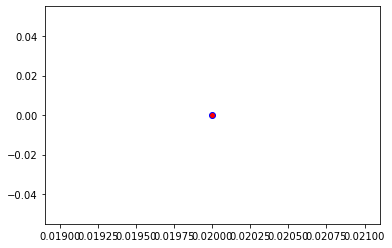

Crafting adversarial images took: 7.723918676376343 seconds 

Images classified as:
000000449432 779 = school bus
000000449579 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


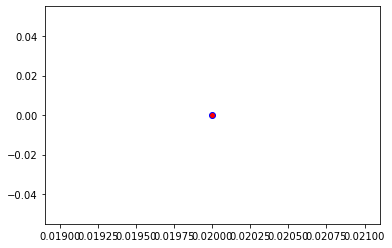

Crafting adversarial images took: 7.566943168640137 seconds 

Images classified as:
000000449603 864 = wreck
000000449661 794 = shower curtain
Min values in image-array: 3.5779724 Max values in image-array: 255.0
Min values in image-array: 0.014031264 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


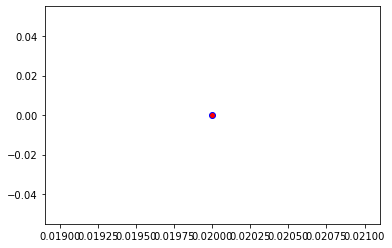

Crafting adversarial images took: 7.8060526847839355 seconds 

Images classified as:
000000449909 224 = groenendael
000000449996 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


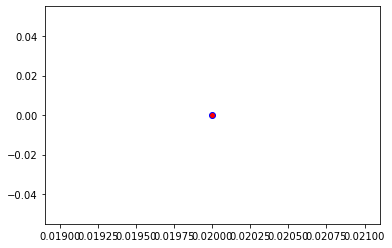

Crafting adversarial images took: 7.847886085510254 seconds 

Images classified as:
000000450075 585 = hair spray
000000450100 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


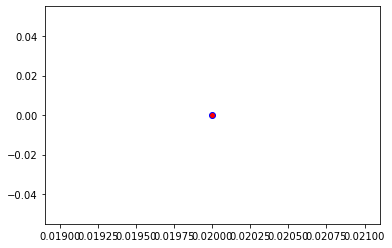

Crafting adversarial images took: 7.499039888381958 seconds 

Images classified as:
000000450202 118 = Dungeness crab
000000450303 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


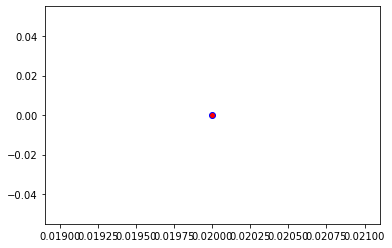

Crafting adversarial images took: 7.835856676101685 seconds 

Images classified as:
000000450399 415 = bakery
000000450439 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


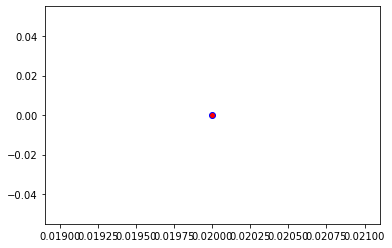

Crafting adversarial images took: 7.642172813415527 seconds 

Images classified as:
000000450488 548 = entertainment center
000000450559 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


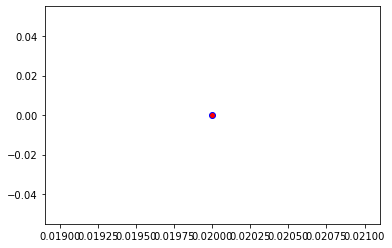

Crafting adversarial images took: 7.475947141647339 seconds 

Images classified as:
000000450686 487 = cellular telephone
000000450758 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


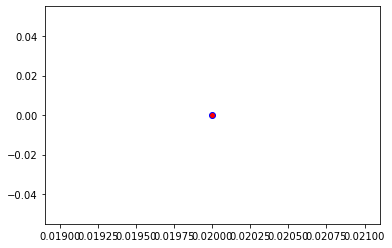

Crafting adversarial images took: 7.814754962921143 seconds 

Images classified as:
000000451043 248 = ski
000000451084 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


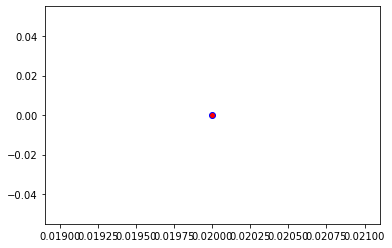

Crafting adversarial images took: 7.590152025222778 seconds 

Images classified as:
000000451090 914 = yawl
000000451144 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


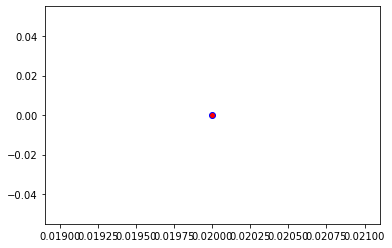

Crafting adversarial images took: 7.7826948165893555 seconds 

Images classified as:
000000451150 931 = bagel
000000451155 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


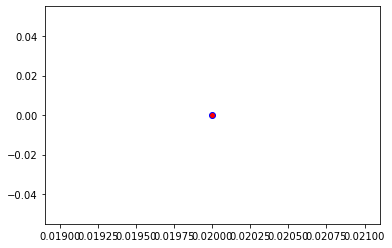

Crafting adversarial images took: 8.146558284759521 seconds 

Images classified as:
000000451308 481 = cassette
000000451435 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


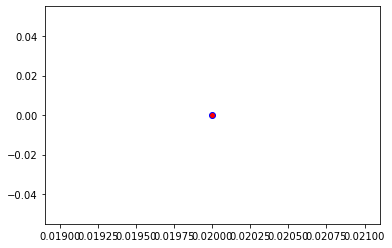

Crafting adversarial images took: 7.68965482711792 seconds 

Images classified as:
000000451571 66 = corn
000000451693 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


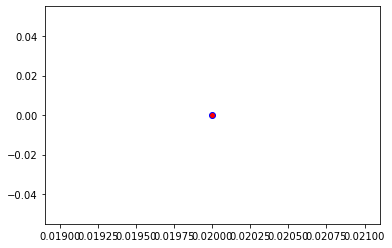

Crafting adversarial images took: 7.635573625564575 seconds 

Images classified as:
000000451714 248 = ski
000000451879 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


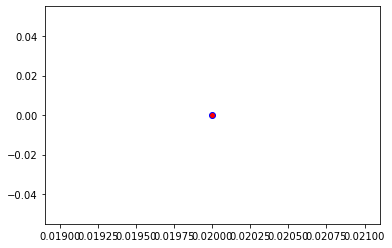

Crafting adversarial images took: 8.049519538879395 seconds 

Images classified as:
000000452084 962 = meat loaf
000000452122 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


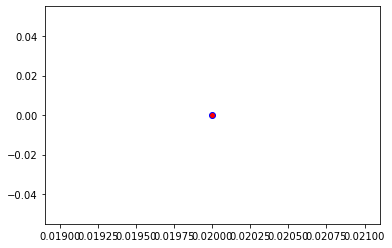

Crafting adversarial images took: 7.911940336227417 seconds 

Images classified as:
000000452321 874 = trolleybus
000000452515 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


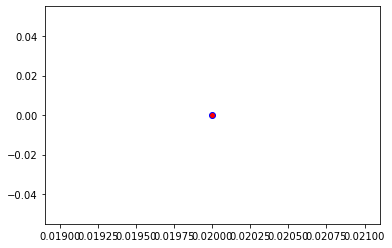

Crafting adversarial images took: 7.609428405761719 seconds 

Images classified as:
000000452784 937 = broccoli
000000452793 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


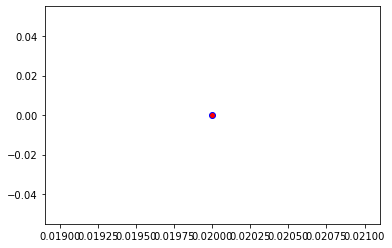

Crafting adversarial images took: 7.756702184677124 seconds 

Images classified as:
000000452891 216 = clumber
000000453001 462 = broom
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


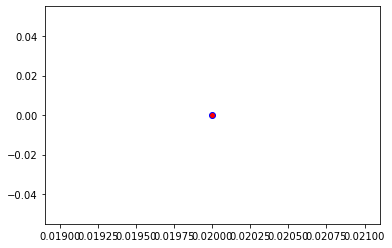

Crafting adversarial images took: 7.643488168716431 seconds 

Images classified as:
000000453040 28 = pot
000000453166 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


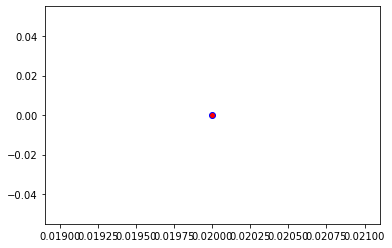

Crafting adversarial images took: 7.597052574157715 seconds 

Images classified as:
000000453302 534 = washer
000000453341 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


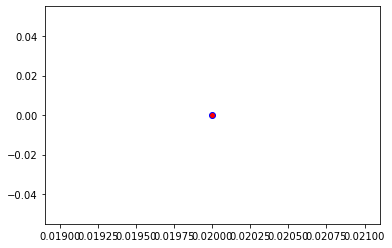

Crafting adversarial images took: 7.691090106964111 seconds 

Images classified as:
000000453584 694 = paddlewheel
000000453634 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


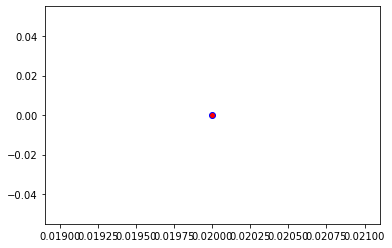

Crafting adversarial images took: 7.796427249908447 seconds 

Images classified as:
000000453708 614 = kimono
000000453722 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


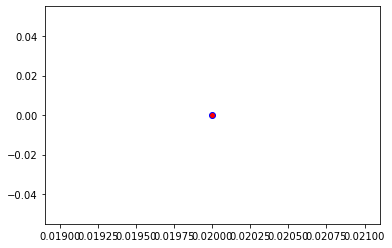

Crafting adversarial images took: 7.451037168502808 seconds 

Images classified as:
000000453841 920 = traffic light
000000453860 632 = loudspeaker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


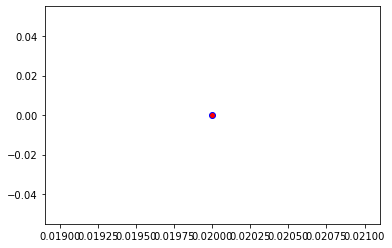

Crafting adversarial images took: 7.827816963195801 seconds 

Images classified as:
000000453981 297 = sloth bear
000000454067 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


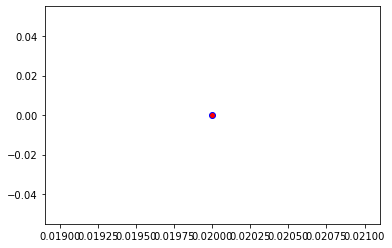

Crafting adversarial images took: 7.633014440536499 seconds 

Images classified as:
000000454404 747 = punching bag
000000454661 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


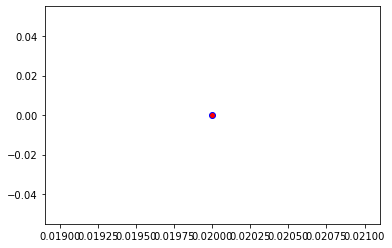

Crafting adversarial images took: 8.442648887634277 seconds 

Images classified as:
000000454750 340 = zebra
000000454798 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


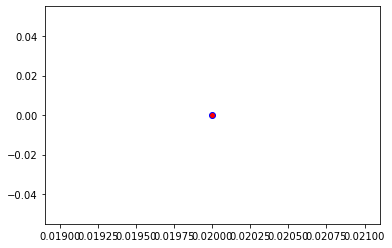

Crafting adversarial images took: 7.649309158325195 seconds 

Images classified as:
000000454978 665 = moped
000000455085 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


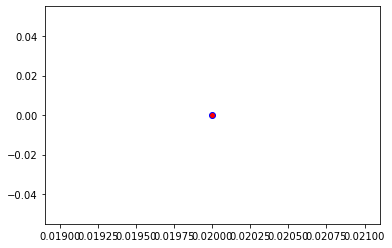

Crafting adversarial images took: 7.496249437332153 seconds 

Images classified as:
000000455157 634 = lumbermill
000000455219 690 = oxcart
Min values in image-array: 0.07174852 Max values in image-array: 255.0
Min values in image-array: 0.00028136672 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


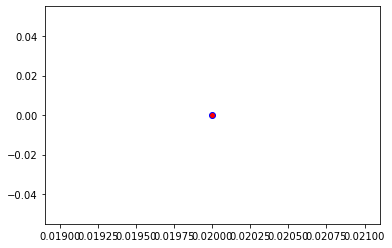

Crafting adversarial images took: 7.853115081787109 seconds 

Images classified as:
000000455267 909 = wok
000000455301 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


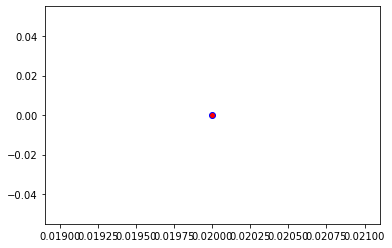

Crafting adversarial images took: 7.9814293384552 seconds 

Images classified as:
000000455352 442 = bell cote
000000455448 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


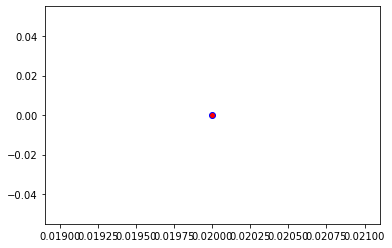

Crafting adversarial images took: 7.743403196334839 seconds 

Images classified as:
000000455555 889 = violin
000000455597 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


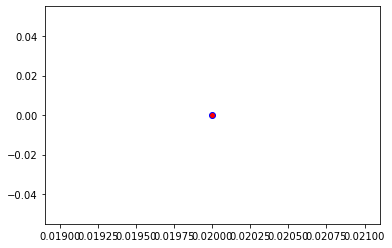

Crafting adversarial images took: 7.6863603591918945 seconds 

Images classified as:
000000455624 670 = motor scooter
000000455716 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


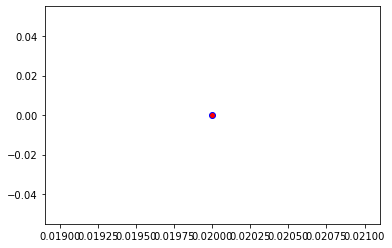

Crafting adversarial images took: 7.481039047241211 seconds 

Images classified as:
000000455872 536 = dock
000000455937 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


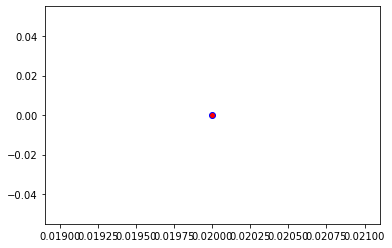

Crafting adversarial images took: 7.704489469528198 seconds 

Images classified as:
000000455981 861 = toilet seat
000000456015 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


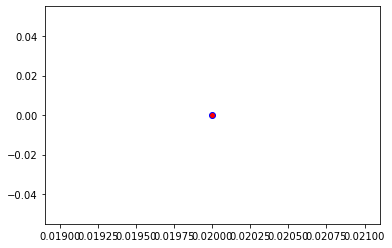

Crafting adversarial images took: 7.931880235671997 seconds 

Images classified as:
000000456143 924 = guacamole
000000456292 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


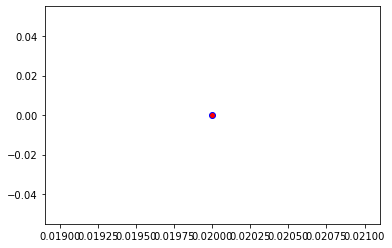

Crafting adversarial images took: 7.691422700881958 seconds 

Images classified as:
000000456303 537 = dogsled
000000456394 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


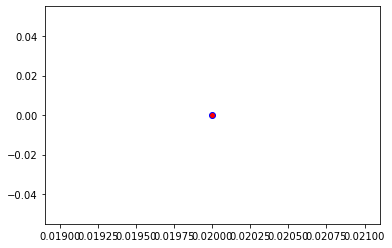

Crafting adversarial images took: 7.661347389221191 seconds 

Images classified as:
000000456496 562 = fountain
000000456559 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 254.90529
Min values in image-array: 0.0 Max values in image-array: 0.9996286
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


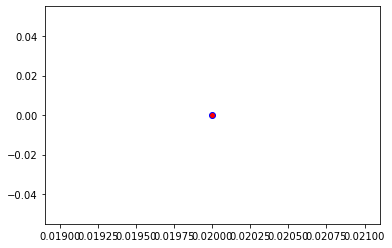

Crafting adversarial images took: 7.634994983673096 seconds 

Images classified as:
000000456662 697 = pajama
000000456865 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


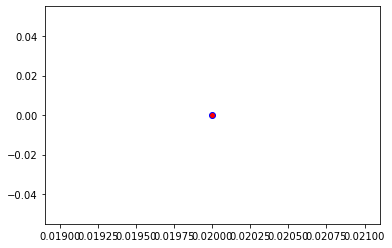

Crafting adversarial images took: 7.53778076171875 seconds 

Images classified as:
000000457078 648 = medicine chest
000000457262 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


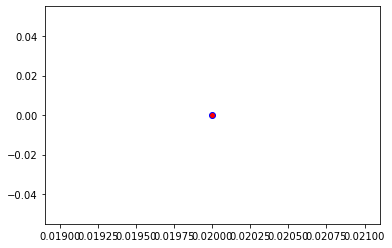

Crafting adversarial images took: 7.673048734664917 seconds 

Images classified as:
000000457559 805 = soccer ball
000000457848 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


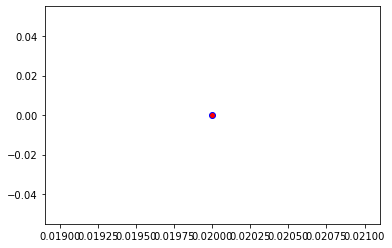

Crafting adversarial images took: 8.603426456451416 seconds 

Images classified as:
000000457884 981 = ballplayer
000000458045 230 = Shetland sheepdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


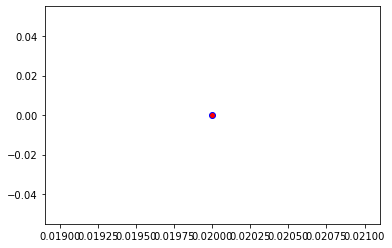

Crafting adversarial images took: 7.96685528755188 seconds 

Images classified as:
000000458054 861 = toilet seat
000000458109 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


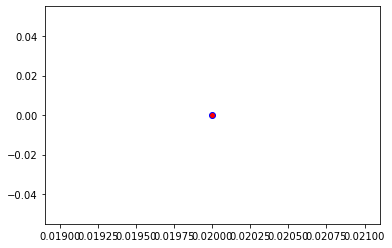

Crafting adversarial images took: 8.261218786239624 seconds 

Images classified as:
000000458223 460 = breakwater
000000458255 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


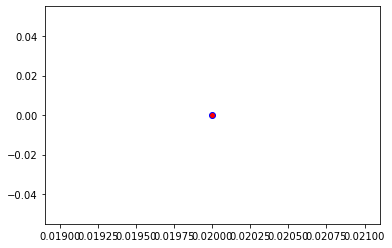

Crafting adversarial images took: 7.72121262550354 seconds 

Images classified as:
000000458325 734 = police van
000000458410 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


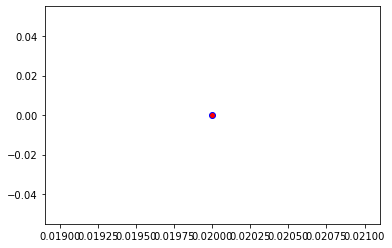

Crafting adversarial images took: 7.837231874465942 seconds 

Images classified as:
000000458663 905 = window shade
000000458702 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


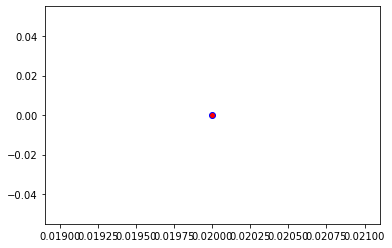

Crafting adversarial images took: 7.5959906578063965 seconds 

Images classified as:
000000458755 5 = ram
000000458768 789 = shoji
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


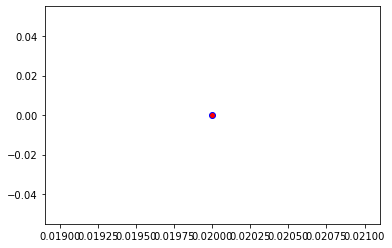

Crafting adversarial images took: 7.579681396484375 seconds 

Images classified as:
000000458790 904 = window screen
000000458992 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


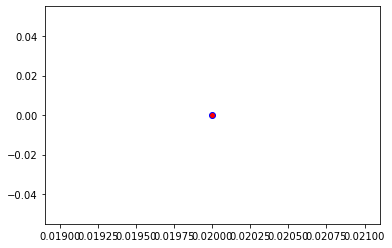

Crafting adversarial images took: 7.779820919036865 seconds 

Images classified as:
000000459153 703 = park bench
000000459195 491 = chain saw
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


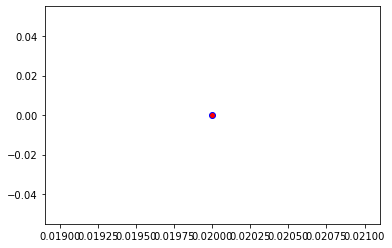

Crafting adversarial images took: 7.781604528427124 seconds 

Images classified as:
000000459272 898 = water bottle
000000459396 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


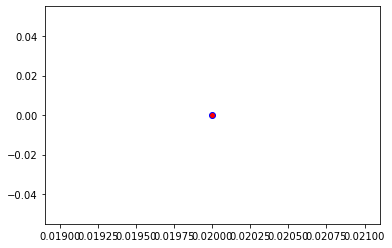

Crafting adversarial images took: 7.849055051803589 seconds 

Images classified as:
000000459437 354 = Arabian camel
000000459467 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


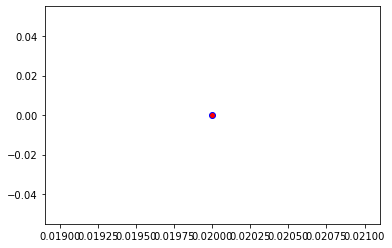

Crafting adversarial images took: 7.651473522186279 seconds 

Images classified as:
000000459500 708 = pedestal
000000459634 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


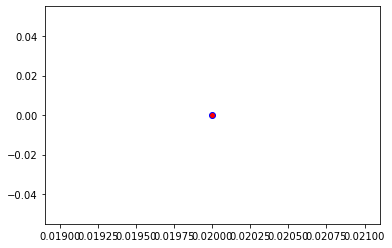

Crafting adversarial images took: 7.458806276321411 seconds 

Images classified as:
000000459662 680 = nipple
000000459757 9 = ostrich
Min values in image-array: 0.0 Max values in image-array: 254.0
Min values in image-array: 0.0 Max values in image-array: 0.99607843
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


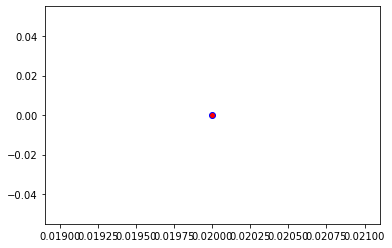

Crafting adversarial images took: 7.500611782073975 seconds 

Images classified as:
000000459809 576 = gondola
000000459887 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


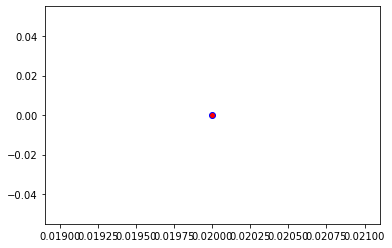

Crafting adversarial images took: 7.883787393569946 seconds 

Images classified as:
000000459954 713 = photocopier
000000460147 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


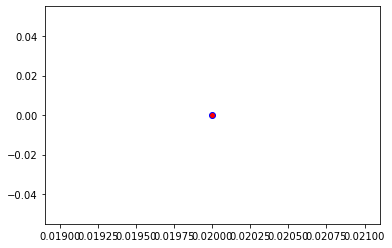

Crafting adversarial images took: 7.943116188049316 seconds 

Images classified as:
000000460160 144 = pelican
000000460229 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 253.71289
Min values in image-array: 0.0 Max values in image-array: 0.9949525
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


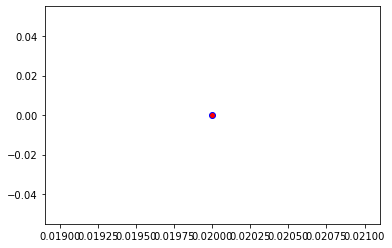

Crafting adversarial images took: 8.089215755462646 seconds 

Images classified as:
000000460333 846 = table lamp
000000460347 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


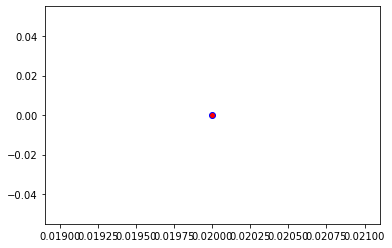

Crafting adversarial images took: 7.5929577350616455 seconds 

Images classified as:
000000460379 9 = ostrich
000000460494 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


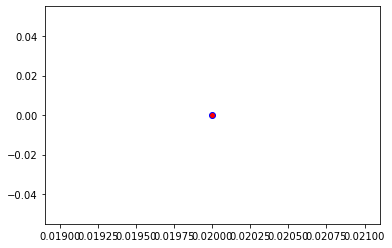

Crafting adversarial images took: 7.855033874511719 seconds 

Images classified as:
000000460682 248 = ski
000000460683 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


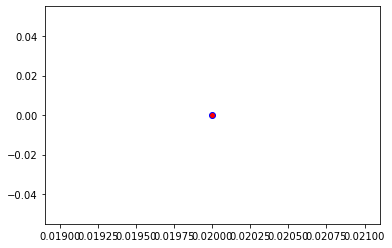

Crafting adversarial images took: 7.524286508560181 seconds 

Images classified as:
000000460841 700 = paper towel
000000460927 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


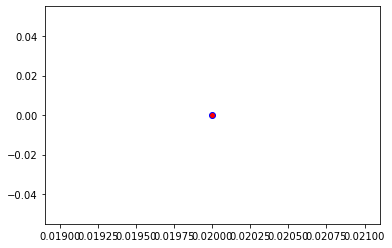

Crafting adversarial images took: 7.510176181793213 seconds 

Images classified as:
000000460929 934 = hotdog
000000460967 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


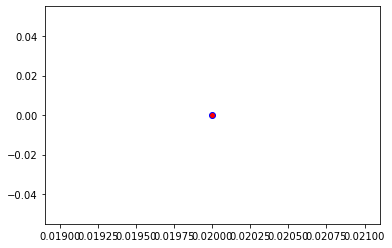

Crafting adversarial images took: 8.083451986312866 seconds 

Images classified as:
000000461009 722 = ping-pong ball
000000461036 379 = howler monkey
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


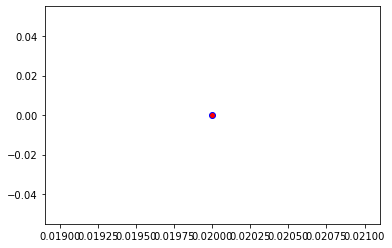

Crafting adversarial images took: 7.5586841106414795 seconds 

Images classified as:
000000461275 919 = street sign
000000461405 222 = kuvasz
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


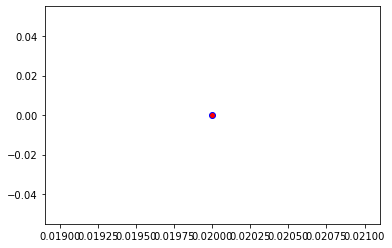

Crafting adversarial images took: 7.849606513977051 seconds 

Images classified as:
000000461573 703 = park bench
000000461751 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


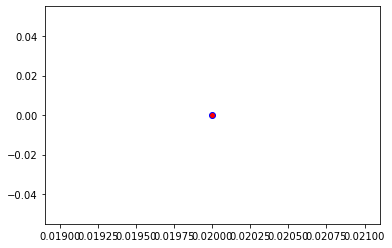

Crafting adversarial images took: 7.698680877685547 seconds 

Images classified as:
000000462031 981 = ballplayer
000000462371 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


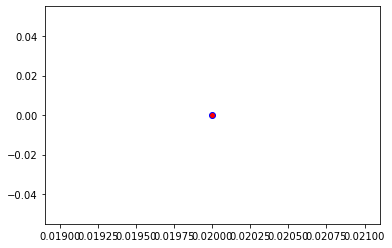

Crafting adversarial images took: 7.794795513153076 seconds 

Images classified as:
000000462576 940 = spaghetti squash
000000462614 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


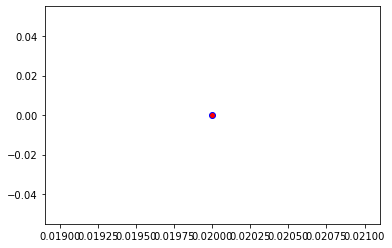

Crafting adversarial images took: 7.5689756870269775 seconds 

Images classified as:
000000462629 760 = refrigerator
000000462643 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


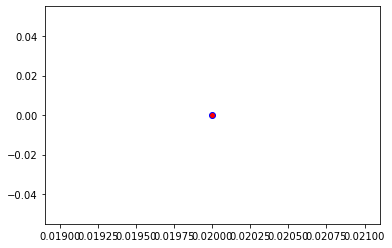

Crafting adversarial images took: 7.741656064987183 seconds 

Images classified as:
000000462728 814 = speedboat
000000462756 856 = thresher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


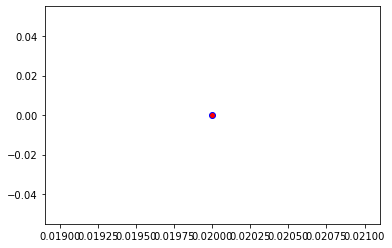

Crafting adversarial images took: 7.666536092758179 seconds 

Images classified as:
000000462904 690 = oxcart
000000463037 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


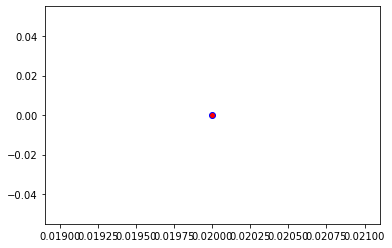

Crafting adversarial images took: 7.65552830696106 seconds 

Images classified as:
000000463174 752 = racket
000000463199 465 = bulletproof vest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


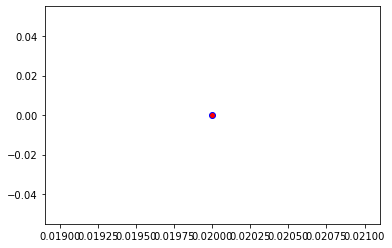

Crafting adversarial images took: 8.276763916015625 seconds 

Images classified as:
000000463283 969 = eggnog
000000463522 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


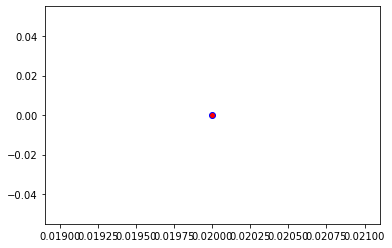

Crafting adversarial images took: 7.93572998046875 seconds 

Images classified as:
000000463527 934 = hotdog
000000463542 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


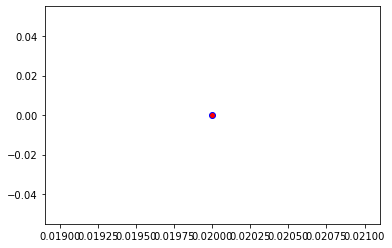

Crafting adversarial images took: 7.442213773727417 seconds 

Images classified as:
000000463618 529 = diaper
000000463647 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


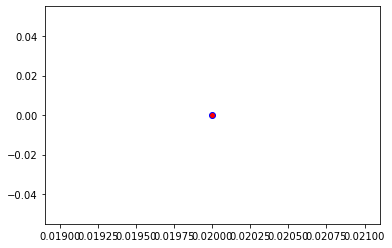

Crafting adversarial images took: 7.618802070617676 seconds 

Images classified as:
000000463690 422 = barbell
000000463730 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


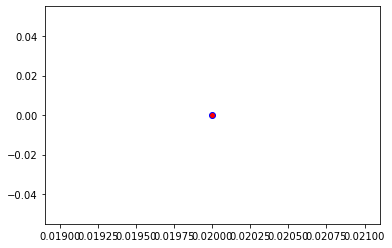

Crafting adversarial images took: 7.751967668533325 seconds 

Images classified as:
000000463802 474 = cardigan
000000463842 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


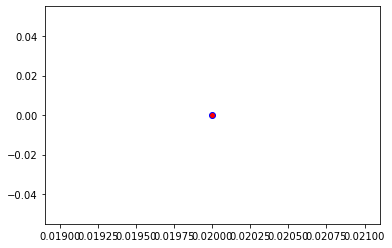

Crafting adversarial images took: 7.89578652381897 seconds 

Images classified as:
000000463849 576 = gondola
000000463918 642 = marimba
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


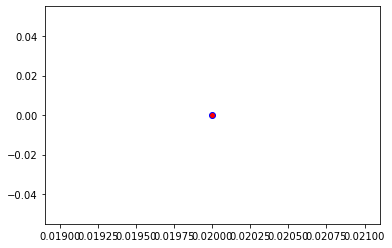

Crafting adversarial images took: 7.766294002532959 seconds 

Images classified as:
000000464089 429 = baseball
000000464144 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


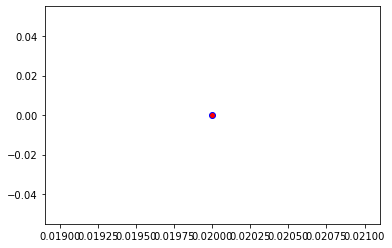

Crafting adversarial images took: 7.715074777603149 seconds 

Images classified as:
000000464251 12 = house finch
000000464358 435 = tub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


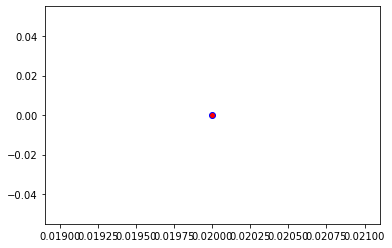

Crafting adversarial images took: 7.578521490097046 seconds 

Images classified as:
000000464476 480 = cash machine
000000464522 164 = bluetick
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


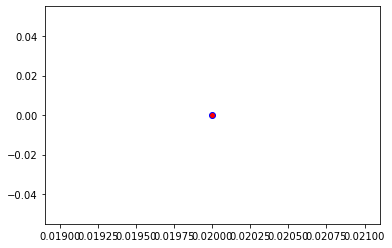

Crafting adversarial images took: 7.635619163513184 seconds 

Images classified as:
000000464689 708 = pedestal
000000464786 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


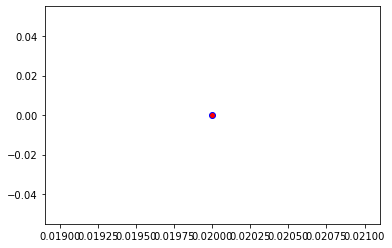

Crafting adversarial images took: 7.773018836975098 seconds 

Images classified as:
000000464824 4 = hammerhead
000000464872 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


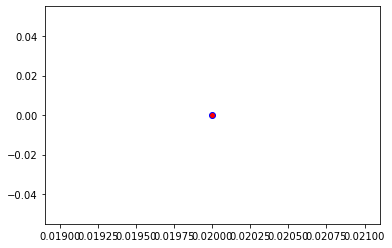

Crafting adversarial images took: 7.603732585906982 seconds 

Images classified as:
000000465129 617 = lab coat
000000465179 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


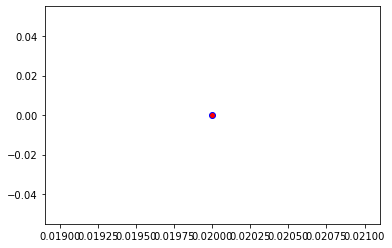

Crafting adversarial images took: 7.909747362136841 seconds 

Images classified as:
000000465180 385 = Indian elephant
000000465430 930 = French loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


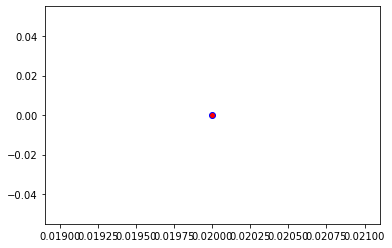

Crafting adversarial images took: 7.606963157653809 seconds 

Images classified as:
000000465549 697 = pajama
000000465585 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


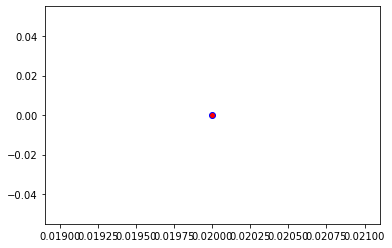

Crafting adversarial images took: 7.515576124191284 seconds 

Images classified as:
000000465675 866 = tractor
000000465718 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


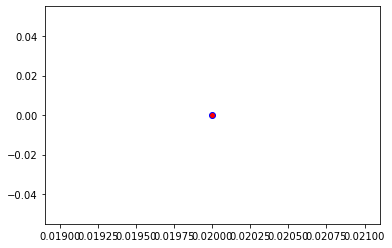

Crafting adversarial images took: 8.50782036781311 seconds 

Images classified as:
000000465806 499 = cleaver
000000465822 745 = projector
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


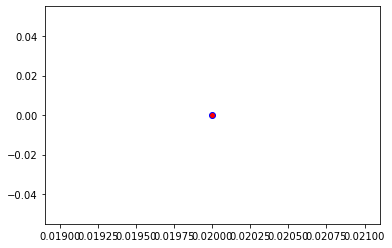

Crafting adversarial images took: 7.646915674209595 seconds 

Images classified as:
000000465836 248 = ski
000000466085 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


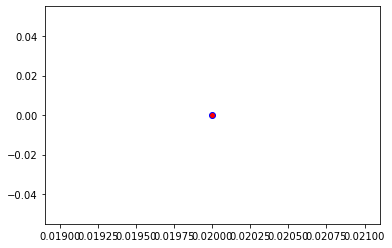

Crafting adversarial images took: 7.624328851699829 seconds 

Images classified as:
000000466125 879 = umbrella
000000466156 206 = curly-coated retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


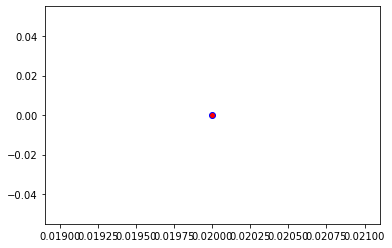

Crafting adversarial images took: 7.882632255554199 seconds 

Images classified as:
000000466256 461 = plate
000000466339 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


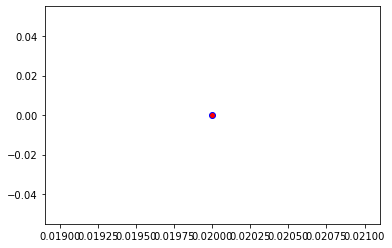

Crafting adversarial images took: 7.7772908210754395 seconds 

Images classified as:
000000466416 498 = palace
000000466567 997 = bolete
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


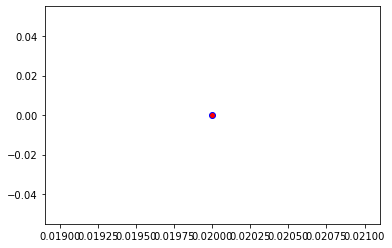

Crafting adversarial images took: 7.644342660903931 seconds 

Images classified as:
000000466602 792 = shovel
000000466835 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


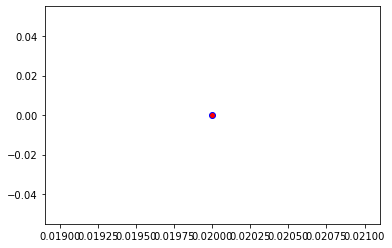

Crafting adversarial images took: 7.787733793258667 seconds 

Images classified as:
000000466986 642 = marimba
000000467176 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


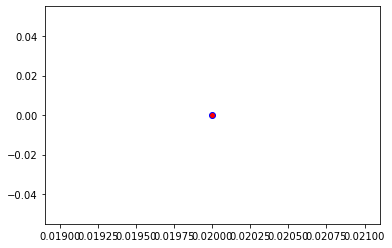

Crafting adversarial images took: 7.723150014877319 seconds 

Images classified as:
000000467315 883 = vase
000000467511 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


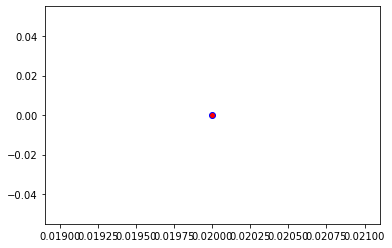

Crafting adversarial images took: 7.648384094238281 seconds 

Images classified as:
000000467776 355 = llama
000000467848 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


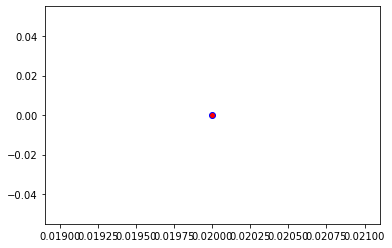

Crafting adversarial images took: 7.62671685218811 seconds 

Images classified as:
000000468124 874 = trolleybus
000000468233 826 = stopwatch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


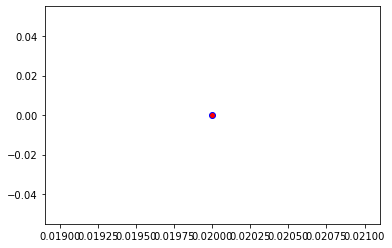

Crafting adversarial images took: 7.696396589279175 seconds 

Images classified as:
000000468245 905 = window shade
000000468332 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


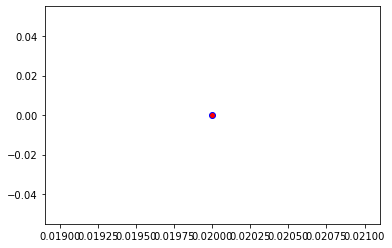

Crafting adversarial images took: 7.566729545593262 seconds 

Images classified as:
000000468501 731 = plunger
000000468505 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


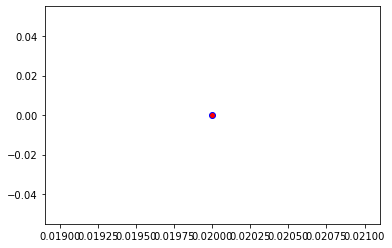

Crafting adversarial images took: 7.8772807121276855 seconds 

Images classified as:
000000468577 520 = crib
000000468632 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


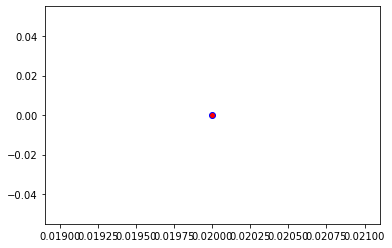

Crafting adversarial images took: 7.583779335021973 seconds 

Images classified as:
000000468925 962 = meat loaf
000000468954 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


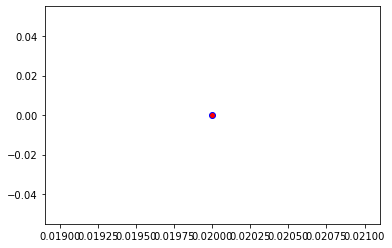

Crafting adversarial images took: 7.609850645065308 seconds 

Images classified as:
000000468965 862 = torch
000000469067 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


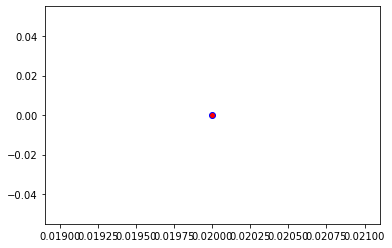

Crafting adversarial images took: 8.695026159286499 seconds 

Images classified as:
000000469174 557 = flagpole
000000469192 717 = pickup
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


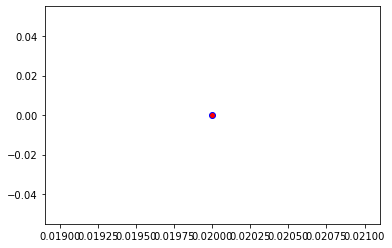

Crafting adversarial images took: 7.752840280532837 seconds 

Images classified as:
000000469246 705 = passenger car
000000469652 289 = snow leopard
Min values in image-array: 0.025348434 Max values in image-array: 255.0
Min values in image-array: 9.9405624e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


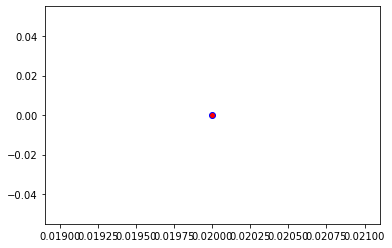

Crafting adversarial images took: 7.716914892196655 seconds 

Images classified as:
000000469828 248 = ski
000000470121 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


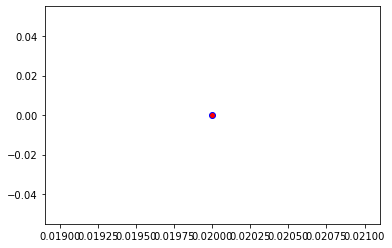

Crafting adversarial images took: 7.84022855758667 seconds 

Images classified as:
000000470173 708 = pedestal
000000470773 788 = shoe shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


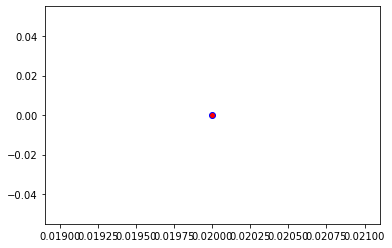

Crafting adversarial images took: 7.829350233078003 seconds 

Images classified as:
000000470779 248 = ski
000000470924 118 = Dungeness crab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


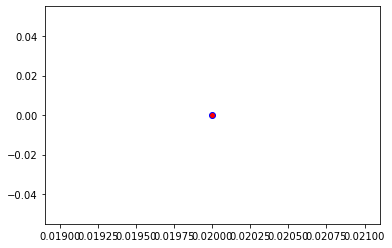

Crafting adversarial images took: 7.5673418045043945 seconds 

Images classified as:
000000470952 248 = ski
000000471023 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


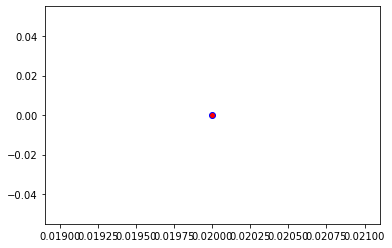

Crafting adversarial images took: 7.732967138290405 seconds 

Images classified as:
000000471087 869 = trench coat
000000471450 294 = brown bear
Min values in image-array: 0.0026253685 Max values in image-array: 255.0
Min values in image-array: 1.0295563e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


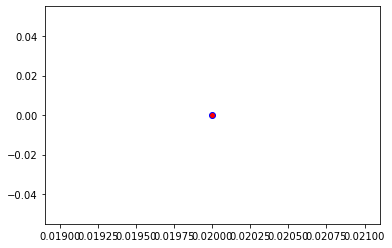

Crafting adversarial images took: 7.845861434936523 seconds 

Images classified as:
000000471567 355 = llama
000000471756 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


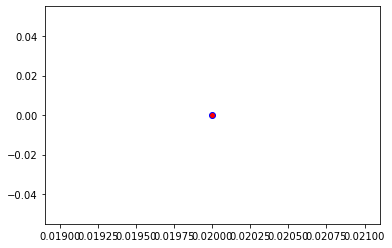

Crafting adversarial images took: 7.618548154830933 seconds 

Images classified as:
000000471789 701 = parachute
000000471869 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 254.76842
Min values in image-array: 0.0 Max values in image-array: 0.9990918
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


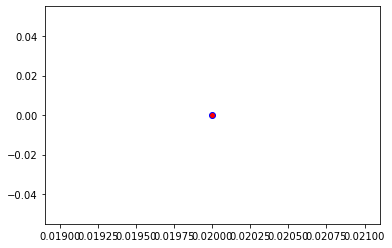

Crafting adversarial images took: 7.760356426239014 seconds 

Images classified as:
000000471893 624 = library
000000471991 884 = vault
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


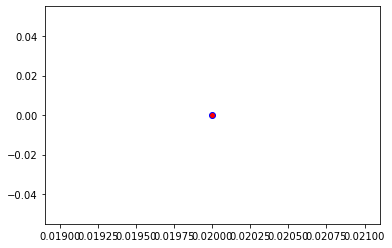

Crafting adversarial images took: 7.722428321838379 seconds 

Images classified as:
000000472030 703 = park bench
000000472046 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


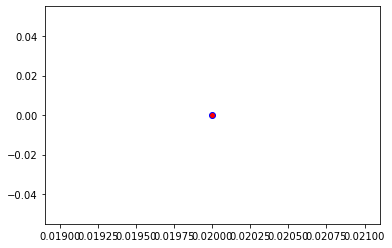

Crafting adversarial images took: 7.699575185775757 seconds 

Images classified as:
000000472298 472 = canoe
000000472375 235 = German shepherd
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


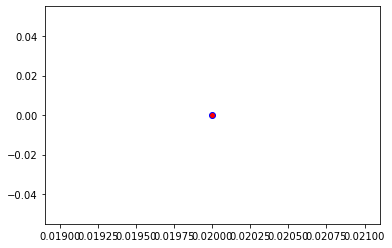

Crafting adversarial images took: 7.857043504714966 seconds 

Images classified as:
000000472623 671 = mountain bike
000000472678 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


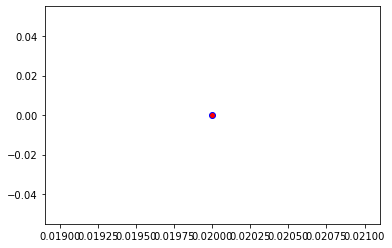

Crafting adversarial images took: 7.613806247711182 seconds 

Images classified as:
000000473015 141 = redshank
000000473118 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


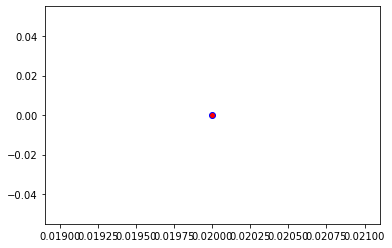

Crafting adversarial images took: 7.829567193984985 seconds 

Images classified as:
000000473121 248 = ski
000000473219 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


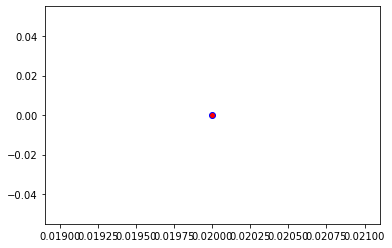

Crafting adversarial images took: 8.228341341018677 seconds 

Images classified as:
000000473237 121 = king crab
000000473406 700 = paper towel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


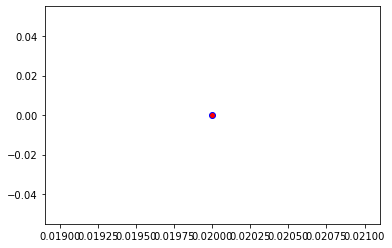

Crafting adversarial images took: 7.530088663101196 seconds 

Images classified as:
000000473821 598 = home theater
000000473869 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


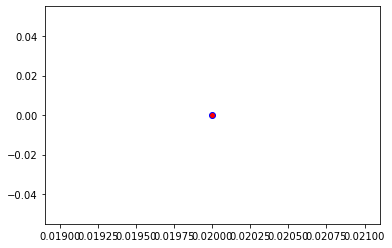

Crafting adversarial images took: 7.621774196624756 seconds 

Images classified as:
000000473974 340 = zebra
000000474021 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


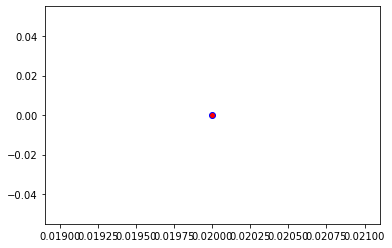

Crafting adversarial images took: 7.785203456878662 seconds 

Images classified as:
000000474028 805 = soccer ball
000000474039 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


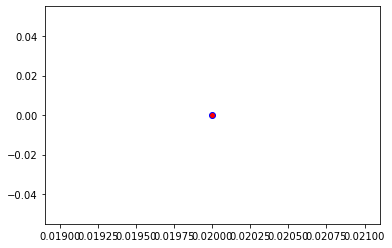

Crafting adversarial images took: 7.886045217514038 seconds 

Images classified as:
000000474078 981 = ballplayer
000000474095 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


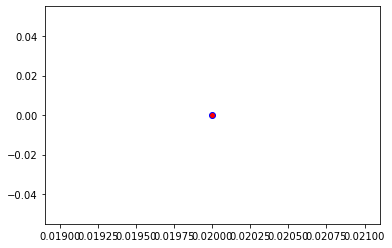

Crafting adversarial images took: 7.76988673210144 seconds 

Images classified as:
000000474164 177 = Scottish deerhound
000000474167 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


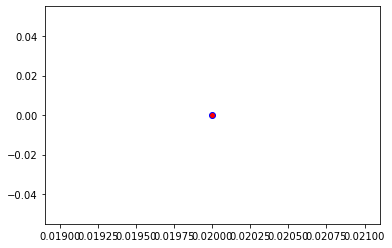

Crafting adversarial images took: 7.627851486206055 seconds 

Images classified as:
000000474170 101 = tusker
000000474293 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


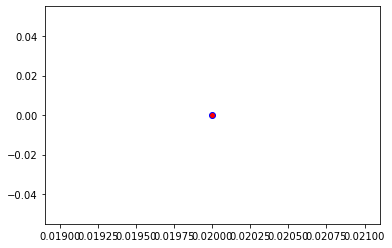

Crafting adversarial images took: 7.663325548171997 seconds 

Images classified as:
000000474344 981 = ballplayer
000000474452 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


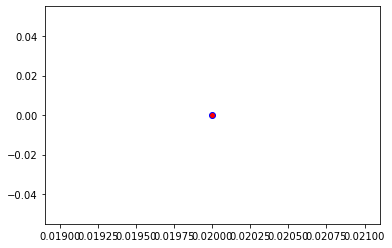

Crafting adversarial images took: 7.716593980789185 seconds 

Images classified as:
000000474786 896 = washbasin
000000474854 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


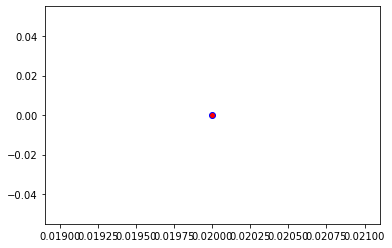

Crafting adversarial images took: 7.673021078109741 seconds 

Images classified as:
000000474881 349 = bighorn
000000475064 932 = pretzel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


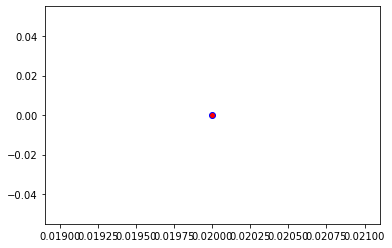

Crafting adversarial images took: 8.036153793334961 seconds 

Images classified as:
000000475150 352 = impala
000000475191 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


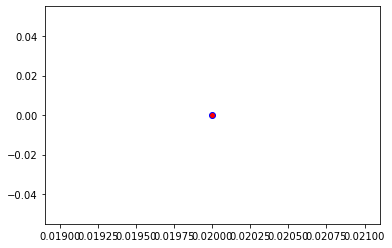

Crafting adversarial images took: 7.606053352355957 seconds 

Images classified as:
000000475223 133 = bittern
000000475365 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


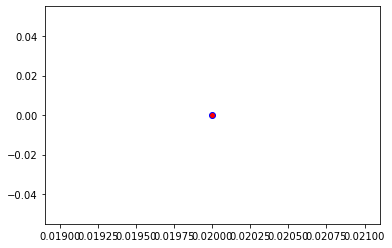

Crafting adversarial images took: 7.617006301879883 seconds 

Images classified as:
000000475387 547 = electric locomotive
000000475484 358 = pole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


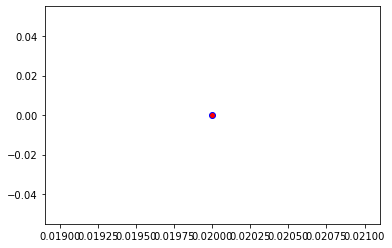

Crafting adversarial images took: 7.768580913543701 seconds 

Images classified as:
000000475572 850 = teddy
000000475678 597 = holster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


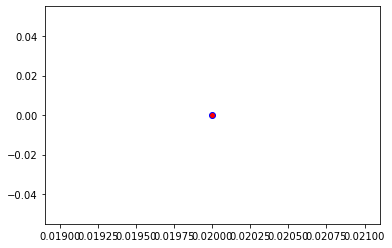

Crafting adversarial images took: 8.228461980819702 seconds 

Images classified as:
000000475732 282 = tiger cat
000000475779 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


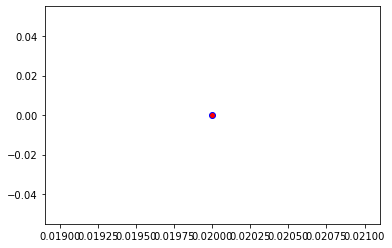

Crafting adversarial images took: 8.259804964065552 seconds 

Images classified as:
000000475904 472 = canoe
000000476119 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


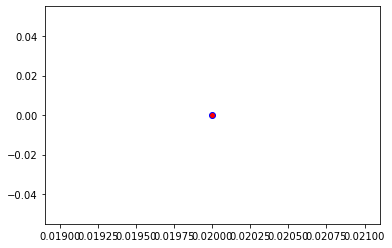

Crafting adversarial images took: 7.922974348068237 seconds 

Images classified as:
000000476215 603 = horse cart
000000476258 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 254.99681
Min values in image-array: 0.0 Max values in image-array: 0.9999875
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


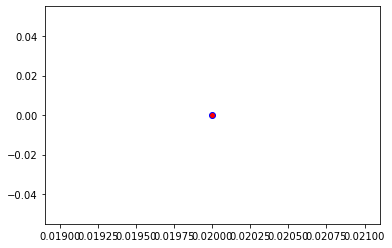

Crafting adversarial images took: 7.751622915267944 seconds 

Images classified as:
000000476415 906 = Windsor tie
000000476491 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


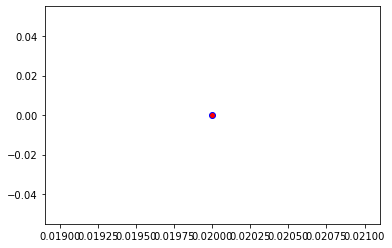

Crafting adversarial images took: 7.746175050735474 seconds 

Images classified as:
000000476514 982 = groom
000000476704 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


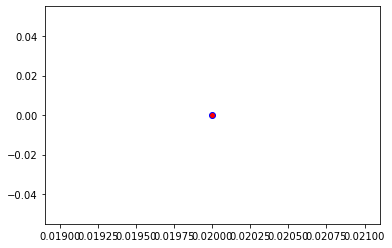

Crafting adversarial images took: 7.7466816902160645 seconds 

Images classified as:
000000476770 981 = ballplayer
000000476787 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


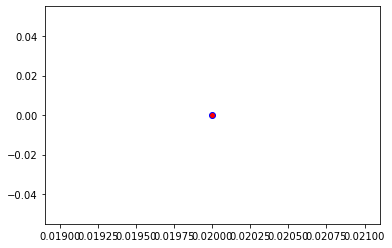

Crafting adversarial images took: 7.612798452377319 seconds 

Images classified as:
000000476810 761 = remote control
000000477118 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


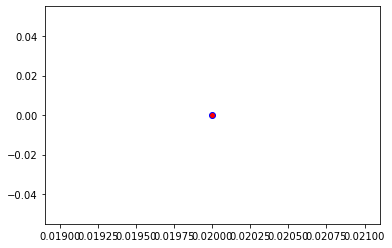

Crafting adversarial images took: 7.552916049957275 seconds 

Images classified as:
000000477227 694 = paddlewheel
000000477288 456 = bow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


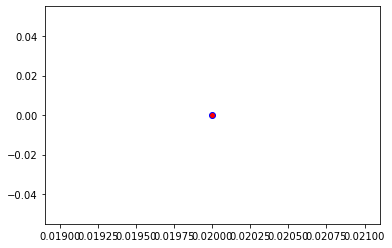

Crafting adversarial images took: 7.946752309799194 seconds 

Images classified as:
000000477441 318 = wing
000000477623 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


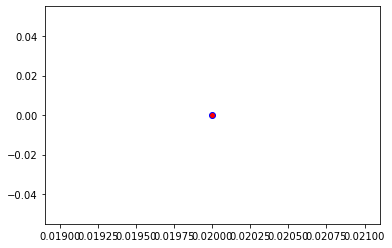

Crafting adversarial images took: 7.694324493408203 seconds 

Images classified as:
000000477689 617 = lab coat
000000477805 542 = drumstick
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


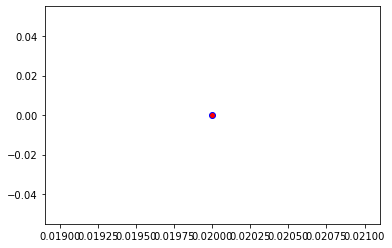

Crafting adversarial images took: 7.846611499786377 seconds 

Images classified as:
000000477955 701 = parachute
000000478136 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


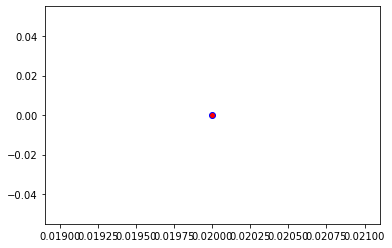

Crafting adversarial images took: 7.621683359146118 seconds 

Images classified as:
000000478286 565 = freight car
000000478393 265 = toy poodle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


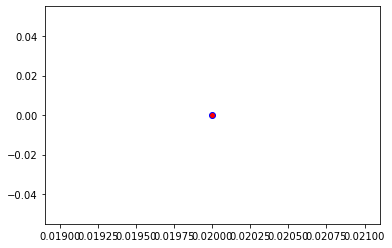

Crafting adversarial images took: 7.477964401245117 seconds 

Images classified as:
000000478420 775 = sarong
000000478474 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


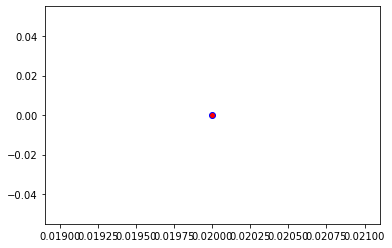

Crafting adversarial images took: 7.507766246795654 seconds 

Images classified as:
000000478721 978 = seashore
000000478862 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


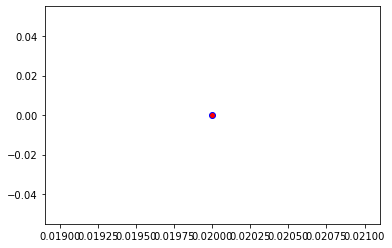

Crafting adversarial images took: 7.737443208694458 seconds 

Images classified as:
000000479030 547 = electric locomotive
000000479099 272 = coyote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


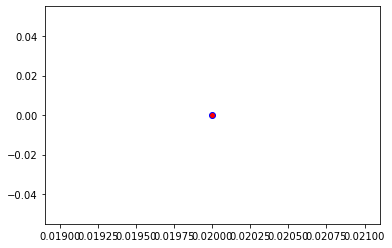

Crafting adversarial images took: 8.670162439346313 seconds 

Images classified as:
000000479126 681 = notebook
000000479155 270 = white wolf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


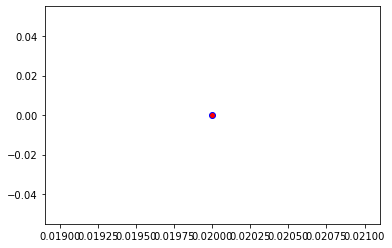

Crafting adversarial images took: 7.6760289669036865 seconds 

Images classified as:
000000479248 548 = entertainment center
000000479448 932 = pretzel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


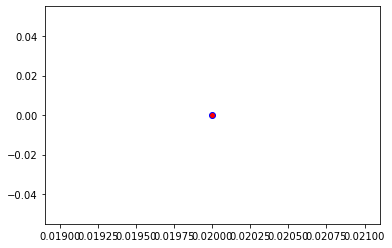

Crafting adversarial images took: 7.783388614654541 seconds 

Images classified as:
000000479596 950 = orange
000000479732 933 = cheeseburger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


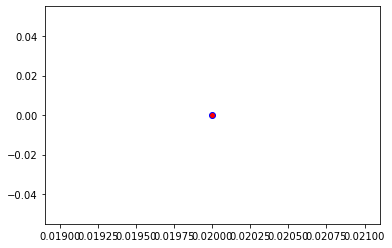

Crafting adversarial images took: 7.9434425830841064 seconds 

Images classified as:
000000479912 404 = airliner
000000479953 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


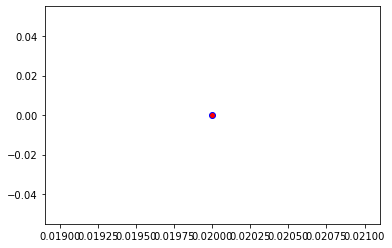

Crafting adversarial images took: 7.766716241836548 seconds 

Images classified as:
000000480021 665 = moped
000000480122 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 254.87245
Min values in image-array: 0.0 Max values in image-array: 0.9994998
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


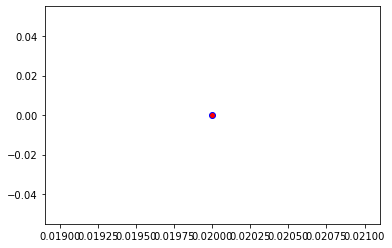

Crafting adversarial images took: 7.790448904037476 seconds 

Images classified as:
000000480212 605 = iPod
000000480275 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


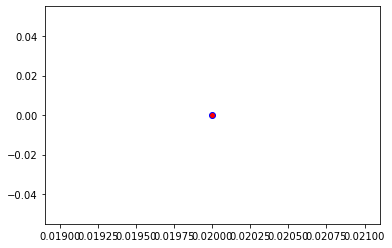

Crafting adversarial images took: 7.835997581481934 seconds 

Images classified as:
000000480842 275 = hyena
000000480936 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


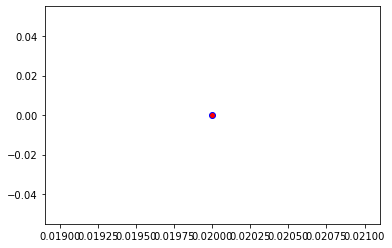

Crafting adversarial images took: 7.677884578704834 seconds 

Images classified as:
000000480944 920 = traffic light
000000480985 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


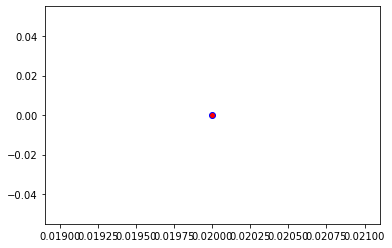

Crafting adversarial images took: 7.715656280517578 seconds 

Images classified as:
000000481159 339 = sorrel
000000481386 824 = stole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


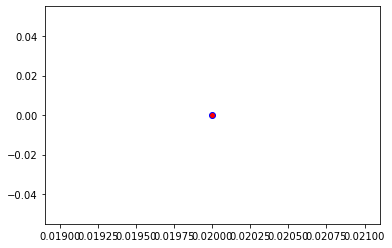

Crafting adversarial images took: 7.71050500869751 seconds 

Images classified as:
000000481390 430 = basketball
000000481404 884 = vault
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


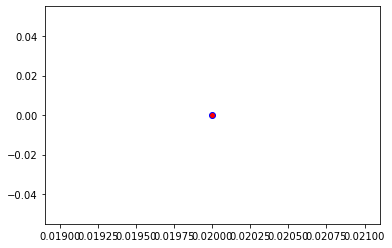

Crafting adversarial images took: 7.753847599029541 seconds 

Images classified as:
000000481413 842 = swimming trunks
000000481480 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


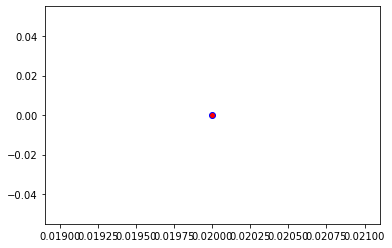

Crafting adversarial images took: 7.52000093460083 seconds 

Images classified as:
000000481567 665 = moped
000000481573 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


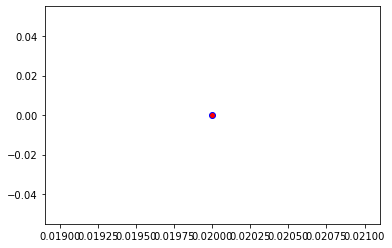

Crafting adversarial images took: 7.707651376724243 seconds 

Images classified as:
000000481582 354 = Arabian camel
000000482100 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


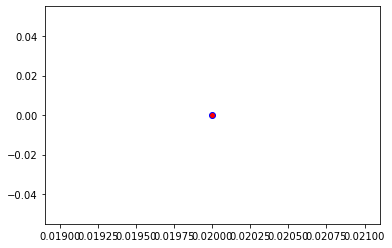

Crafting adversarial images took: 7.594465255737305 seconds 

Images classified as:
000000482275 982 = groom
000000482319 431 = bassinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


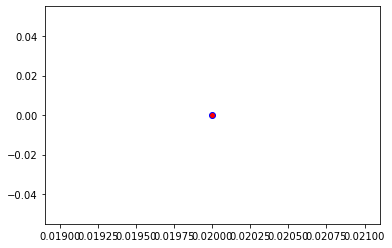

Crafting adversarial images took: 7.7854695320129395 seconds 

Images classified as:
000000482436 424 = barbershop
000000482477 21 = kite
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


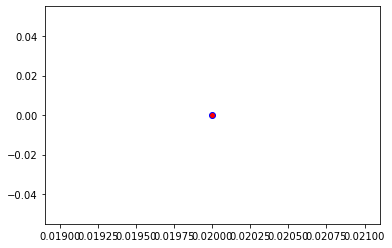

Crafting adversarial images took: 8.69306993484497 seconds 

Images classified as:
000000482487 778 = scale
000000482585 705 = passenger car
Min values in image-array: 0.9286423 Max values in image-array: 255.0
Min values in image-array: 0.0036417344 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


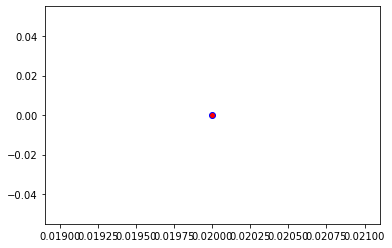

Crafting adversarial images took: 7.616151571273804 seconds 

Images classified as:
000000482719 954 = banana
000000482735 209 = Chesapeake Bay retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


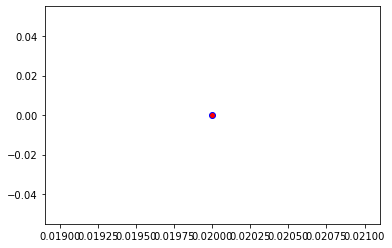

Crafting adversarial images took: 7.627648115158081 seconds 

Images classified as:
000000482800 522 = croquet ball
000000482917 253 = basenji
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


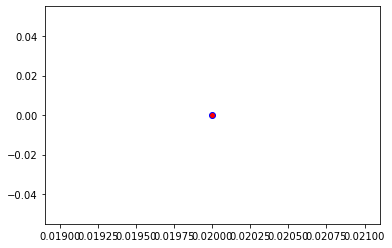

Crafting adversarial images took: 7.761342763900757 seconds 

Images classified as:
000000482970 620 = laptop
000000482978 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


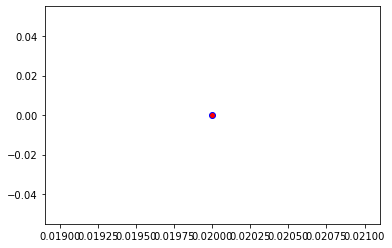

Crafting adversarial images took: 7.877158164978027 seconds 

Images classified as:
000000483050 831 = studio couch
000000483531 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


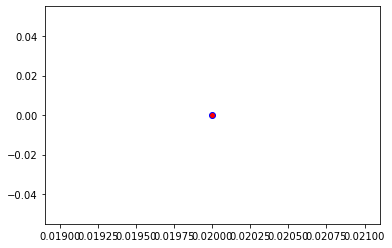

Crafting adversarial images took: 7.7373106479644775 seconds 

Images classified as:
000000483667 515 = cowboy hat
000000483999 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


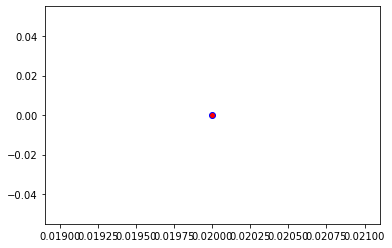

Crafting adversarial images took: 7.820436477661133 seconds 

Images classified as:
000000484029 919 = street sign
000000484296 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


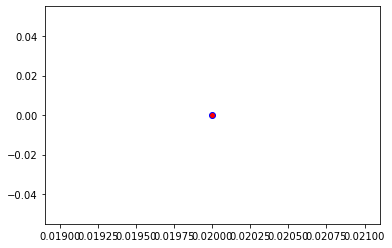

Crafting adversarial images took: 7.727862119674683 seconds 

Images classified as:
000000484351 624 = library
000000484404 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


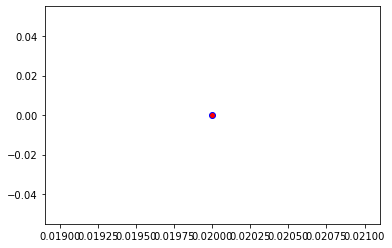

Crafting adversarial images took: 7.471153259277344 seconds 

Images classified as:
000000484415 896 = washbasin
000000484760 497 = church
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


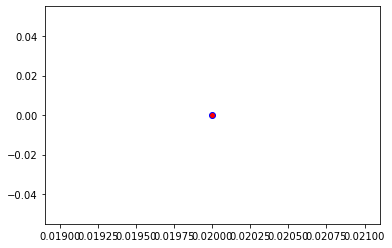

Crafting adversarial images took: 7.65044379234314 seconds 

Images classified as:
000000484893 54 = hog
000000484978 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


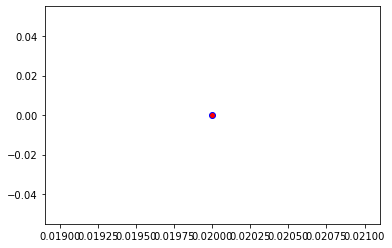

Crafting adversarial images took: 7.861682176589966 seconds 

Images classified as:
000000485027 752 = racket
000000485071 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


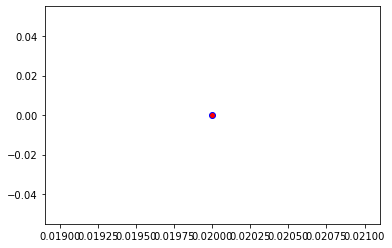

Crafting adversarial images took: 7.542695045471191 seconds 

Images classified as:
000000485130 636 = mailbag
000000485237 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 254.87643
Min values in image-array: 0.0 Max values in image-array: 0.9995154
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


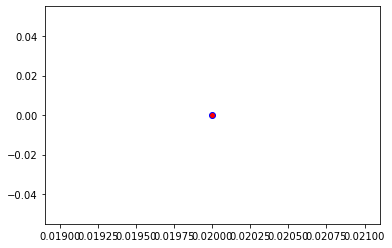

Crafting adversarial images took: 7.837326765060425 seconds 

Images classified as:
000000485424 495 = china cabinet
000000485480 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


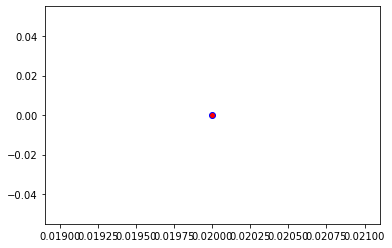

Crafting adversarial images took: 7.663853406906128 seconds 

Images classified as:
000000485802 812 = space shuttle
000000485844 601 = hoopskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


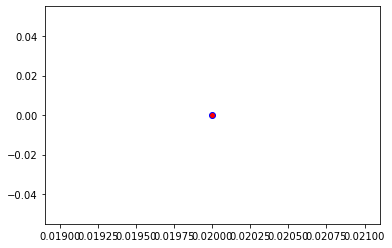

Crafting adversarial images took: 8.181006669998169 seconds 

Images classified as:
000000485895 293 = cheetah
000000485972 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


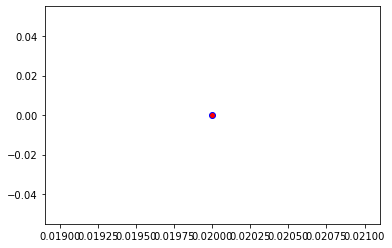

Crafting adversarial images took: 8.431312084197998 seconds 

Images classified as:
000000486040 620 = laptop
000000486046 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


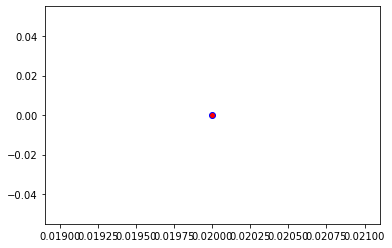

Crafting adversarial images took: 7.648916721343994 seconds 

Images classified as:
000000486104 981 = ballplayer
000000486112 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


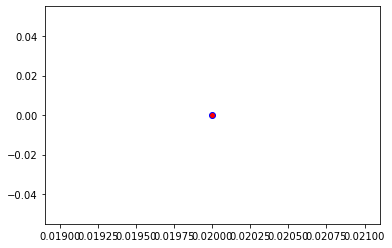

Crafting adversarial images took: 7.789901494979858 seconds 

Images classified as:
000000486438 960 = chocolate sauce
000000486479 208 = Labrador retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


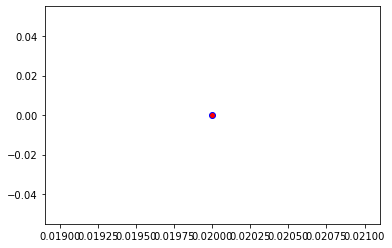

Crafting adversarial images took: 7.707405090332031 seconds 

Images classified as:
000000486573 870 = tricycle
000000487583 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


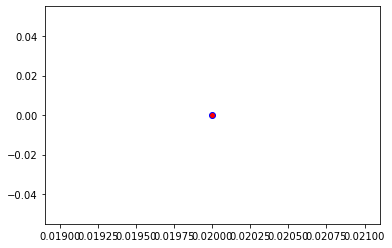

Crafting adversarial images took: 7.779855728149414 seconds 

Images classified as:
000000488075 894 = wardrobe
000000488166 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


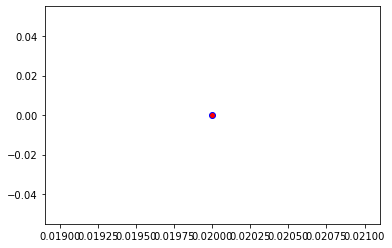

Crafting adversarial images took: 7.994927644729614 seconds 

Images classified as:
000000488251 339 = sorrel
000000488270 977 = sandbar
Min values in image-array: 0.2563412 Max values in image-array: 255.0
Min values in image-array: 0.0010052596 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


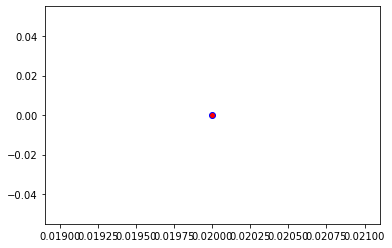

Crafting adversarial images took: 7.646790504455566 seconds 

Images classified as:
000000488385 665 = moped
000000488592 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


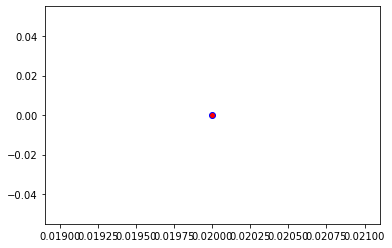

Crafting adversarial images took: 7.755297660827637 seconds 

Images classified as:
000000488664 820 = steam locomotive
000000488673 969 = eggnog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


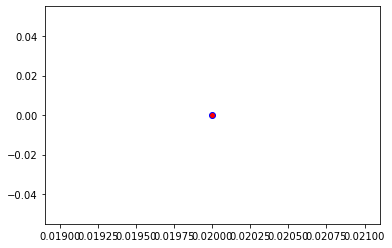

Crafting adversarial images took: 7.399709701538086 seconds 

Images classified as:
000000488710 921 = book jacket
000000488736 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


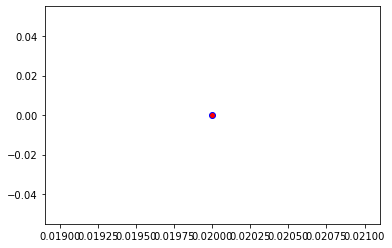

Crafting adversarial images took: 7.605289697647095 seconds 

Images classified as:
000000489014 484 = catamaran
000000489046 85 = quail
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


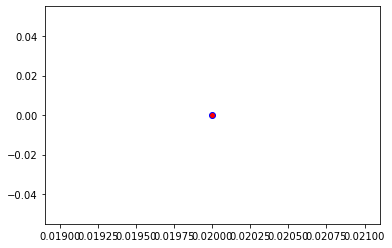

Crafting adversarial images took: 7.714609384536743 seconds 

Images classified as:
000000489091 648 = medicine chest
000000489305 666 = mortar
Min values in image-array: 0.75 Max values in image-array: 255.0
Min values in image-array: 0.0029411765 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


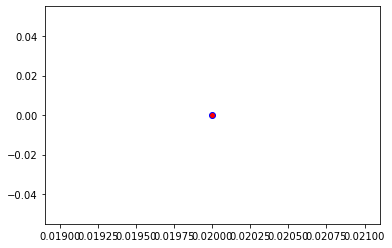

Crafting adversarial images took: 7.597778797149658 seconds 

Images classified as:
000000489339 248 = ski
000000489611 680 = nipple
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


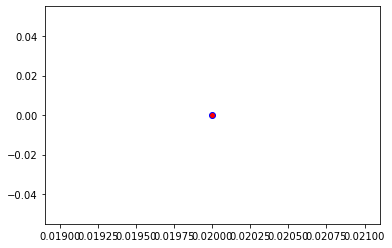

Crafting adversarial images took: 7.866032838821411 seconds 

Images classified as:
000000489764 529 = diaper
000000489842 611 = jigsaw puzzle
Min values in image-array: 0.0 Max values in image-array: 254.7149
Min values in image-array: 0.0 Max values in image-array: 0.998882
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


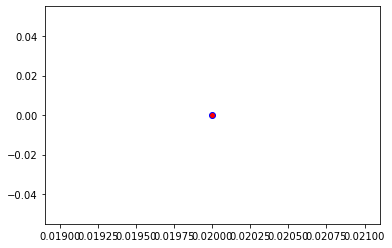

Crafting adversarial images took: 7.616307973861694 seconds 

Images classified as:
000000489924 774 = sandal
000000490125 89 = sulphur-crested cockatoo
Min values in image-array: 0.0 Max values in image-array: 245.70753
Min values in image-array: 0.0 Max values in image-array: 0.963559
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


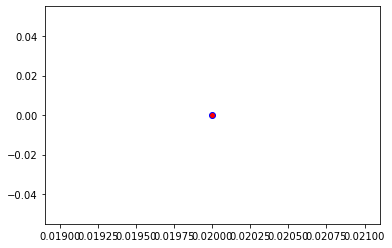

Crafting adversarial images took: 8.371880292892456 seconds 

Images classified as:
000000490171 49 = African crocodile
000000490413 404 = airliner
Min values in image-array: 0.030139446 Max values in image-array: 255.0
Min values in image-array: 0.00011819391 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


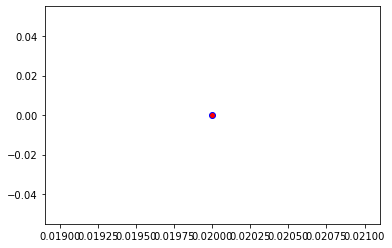

Crafting adversarial images took: 7.675103187561035 seconds 

Images classified as:
000000490470 484 = catamaran
000000490515 537 = dogsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


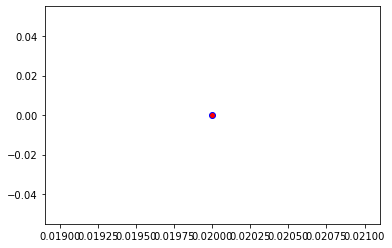

Crafting adversarial images took: 7.583177328109741 seconds 

Images classified as:
000000490936 879 = umbrella
000000491008 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


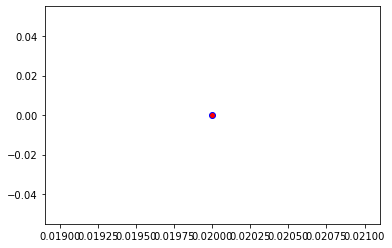

Crafting adversarial images took: 7.556273937225342 seconds 

Images classified as:
000000491071 896 = washbasin
000000491090 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


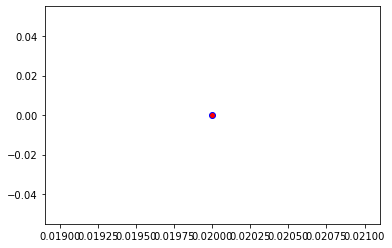

Crafting adversarial images took: 8.09258508682251 seconds 

Images classified as:
000000491130 248 = ski
000000491213 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


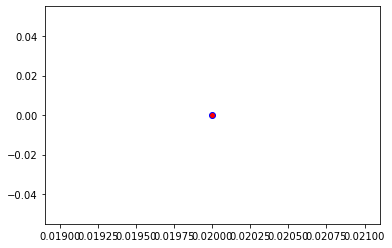

Crafting adversarial images took: 7.746596336364746 seconds 

Images classified as:
000000491216 526 = desk
000000491366 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


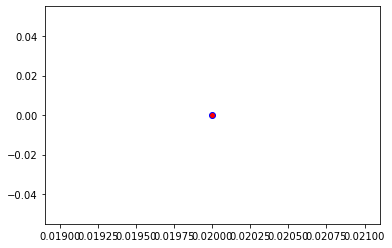

Crafting adversarial images took: 7.860930681228638 seconds 

Images classified as:
000000491464 981 = ballplayer
000000491470 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 254.74307
Min values in image-array: 0.0 Max values in image-array: 0.99899244
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


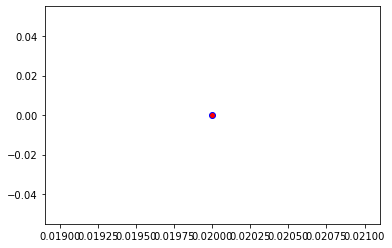

Crafting adversarial images took: 7.523714542388916 seconds 

Images classified as:
000000491497 831 = studio couch
000000491613 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


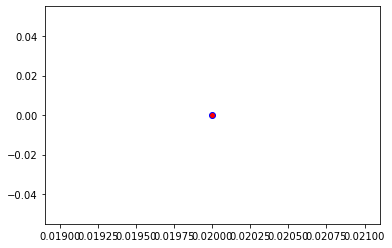

Crafting adversarial images took: 7.640581846237183 seconds 

Images classified as:
000000491683 346 = water buffalo
000000491725 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


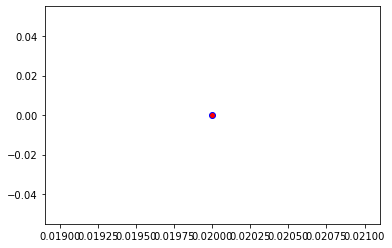

Crafting adversarial images took: 7.701525926589966 seconds 

Images classified as:
000000491757 284 = Siamese cat
000000491867 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 251.75534
Min values in image-array: 0.0 Max values in image-array: 0.98727584
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


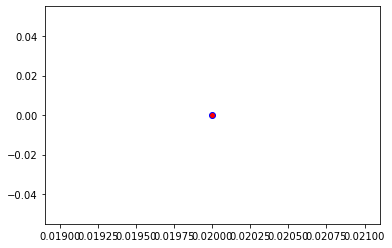

Crafting adversarial images took: 7.893404006958008 seconds 

Images classified as:
000000492077 612 = jinrikisha
000000492110 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


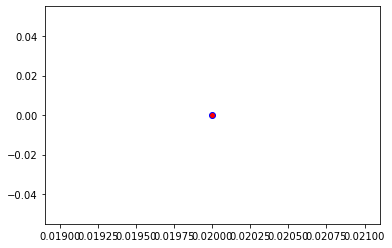

Crafting adversarial images took: 7.66696572303772 seconds 

Images classified as:
000000492282 603 = horse cart
000000492284 256 = Newfoundland
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


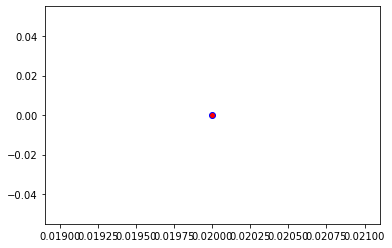

Crafting adversarial images took: 7.802258491516113 seconds 

Images classified as:
000000492362 582 = grocery store
000000492758 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


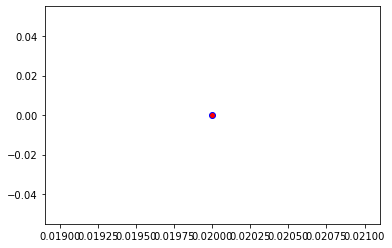

Crafting adversarial images took: 7.673950433731079 seconds 

Images classified as:
000000492878 435 = bathtub
000000492905 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


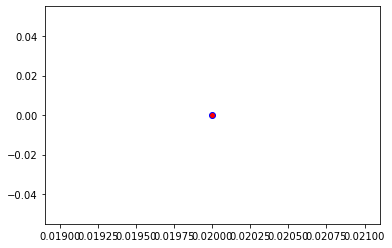

Crafting adversarial images took: 7.4876275062561035 seconds 

Images classified as:
000000492937 872 = tripod
000000492968 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


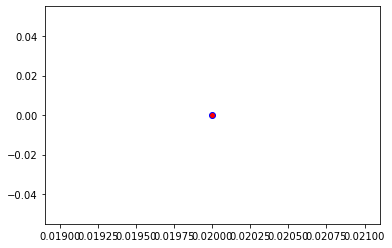

Crafting adversarial images took: 8.382658958435059 seconds 

Images classified as:
000000492992 346 = water buffalo
000000493019 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


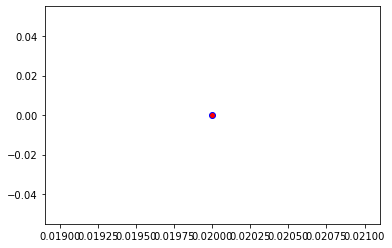

Crafting adversarial images took: 7.875905275344849 seconds 

Images classified as:
000000493284 386 = African elephant
000000493286 657 = missile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


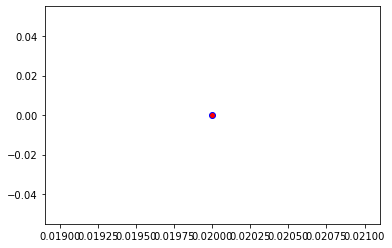

Crafting adversarial images took: 7.995450973510742 seconds 

Images classified as:
000000493334 794 = shower curtain
000000493442 248 = ski
Min values in image-array: 0.0 Max values in image-array: 253.09818
Min values in image-array: 0.0 Max values in image-array: 0.99254185
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


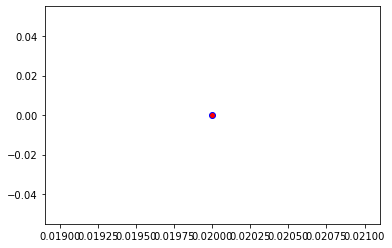

Crafting adversarial images took: 7.927366733551025 seconds 

Images classified as:
000000493566 547 = electric locomotive
000000493613 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


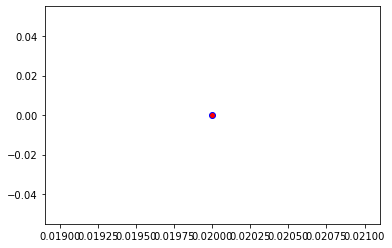

Crafting adversarial images took: 7.769728183746338 seconds 

Images classified as:
000000493772 879 = umbrella
000000493799 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


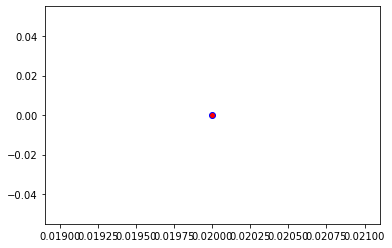

Crafting adversarial images took: 7.4851415157318115 seconds 

Images classified as:
000000493864 463 = bucket
000000493905 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


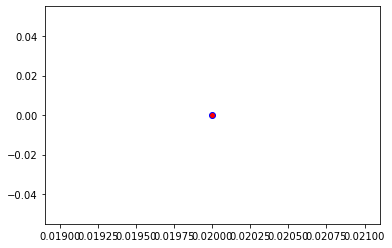

Crafting adversarial images took: 7.875306844711304 seconds 

Images classified as:
000000494188 23 = vulture
000000494427 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


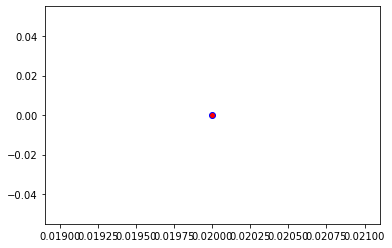

Crafting adversarial images took: 7.958495616912842 seconds 

Images classified as:
000000494634 620 = laptop
000000494759 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


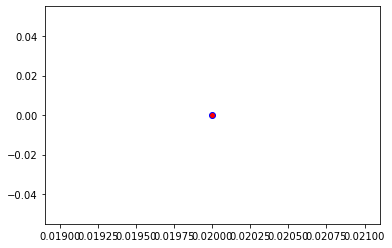

Crafting adversarial images took: 7.611669301986694 seconds 

Images classified as:
000000494863 547 = electric locomotive
000000494869 250 = Siberian husky
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


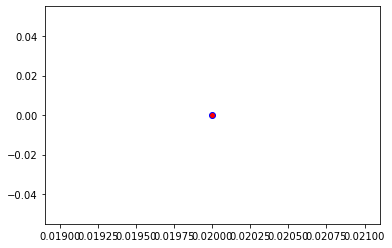

Crafting adversarial images took: 7.837908744812012 seconds 

Images classified as:
000000494913 548 = entertainment center
000000495054 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


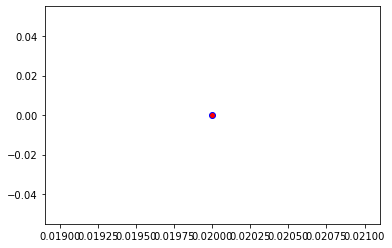

Crafting adversarial images took: 7.663207530975342 seconds 

Images classified as:
000000495146 557 = flagpole
000000495448 619 = lampshade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


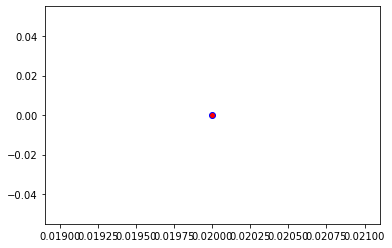

Crafting adversarial images took: 7.446161508560181 seconds 

Images classified as:
000000495732 608 = jean
000000496409 21 = kite
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


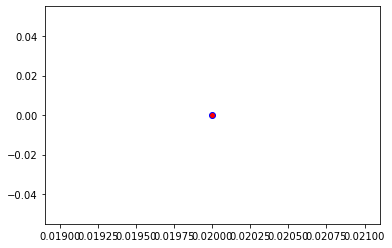

Crafting adversarial images took: 7.831694841384888 seconds 

Images classified as:
000000496571 965 = burrito
000000496597 976 = promontory
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


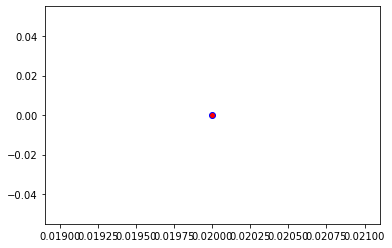

Crafting adversarial images took: 7.7521607875823975 seconds 

Images classified as:
000000496722 637 = mailbox
000000496854 879 = umbrella
Min values in image-array: 0.08673267 Max values in image-array: 255.0
Min values in image-array: 0.0003401281 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


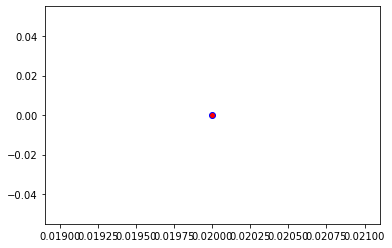

Crafting adversarial images took: 7.924222946166992 seconds 

Images classified as:
000000496954 934 = hotdog
000000497344 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


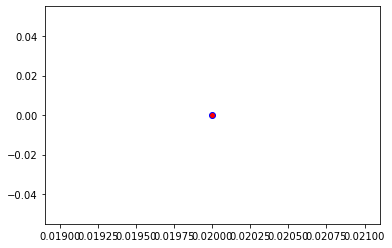

Crafting adversarial images took: 8.314106941223145 seconds 

Images classified as:
000000497568 404 = airliner
000000497599 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


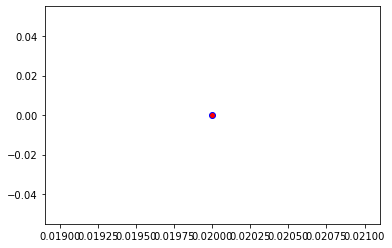

Crafting adversarial images took: 7.734691381454468 seconds 

Images classified as:
000000497628 564 = four-poster
000000497867 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


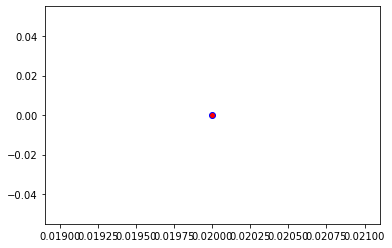

Crafting adversarial images took: 7.707839727401733 seconds 

Images classified as:
000000498032 689 = overskirt
000000498286 182 = Border terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


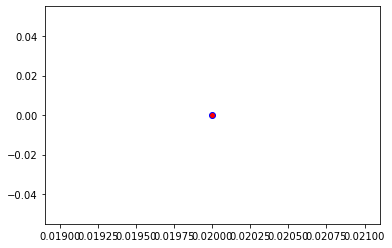

Crafting adversarial images took: 7.69233775138855 seconds 

Images classified as:
000000498463 760 = refrigerator
000000498709 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


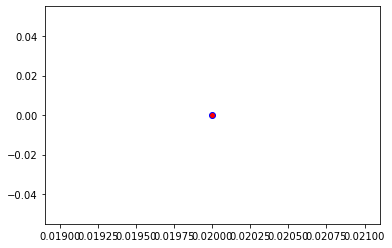

Crafting adversarial images took: 8.006137371063232 seconds 

Images classified as:
000000498747 523 = crutch
000000498807 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


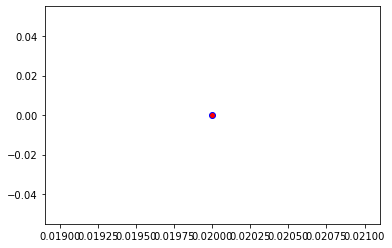

Crafting adversarial images took: 7.675661087036133 seconds 

Images classified as:
000000498857 355 = llama
000000498919 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


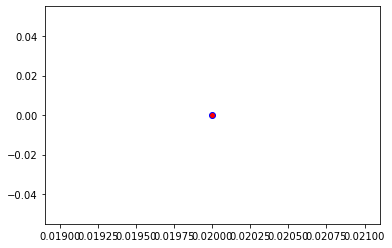

Crafting adversarial images took: 7.8899006843566895 seconds 

Images classified as:
000000499031 929 = ice lolly
000000499109 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


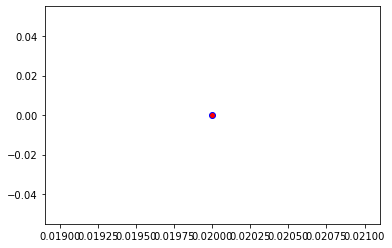

Crafting adversarial images took: 7.74044394493103 seconds 

Images classified as:
000000499181 498 = cinema
000000499266 662 = modem
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


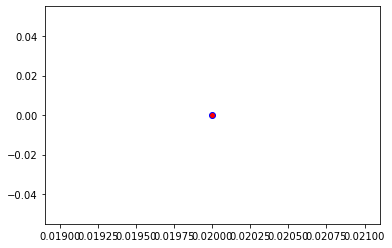

Crafting adversarial images took: 7.635452508926392 seconds 

Images classified as:
000000499313 963 = pizza
000000499622 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


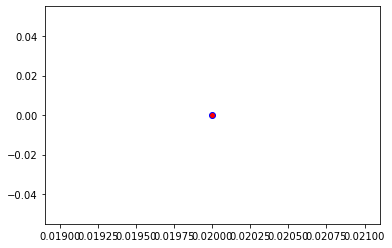

Crafting adversarial images took: 7.514567613601685 seconds 

Images classified as:
000000499768 704 = parking meter
000000499775 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


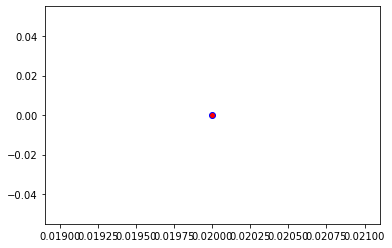

Crafting adversarial images took: 7.8685386180877686 seconds 

Images classified as:
000000500049 404 = airliner
000000500211 67 = dam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


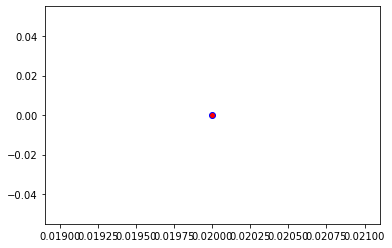

Crafting adversarial images took: 7.724426507949829 seconds 

Images classified as:
000000500257 624 = library
000000500270 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


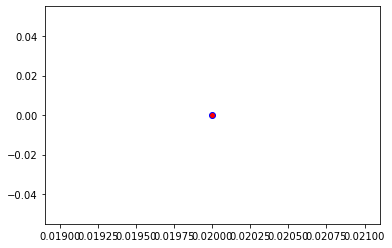

Crafting adversarial images took: 7.790785551071167 seconds 

Images classified as:
000000500423 705 = passenger car
000000500464 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


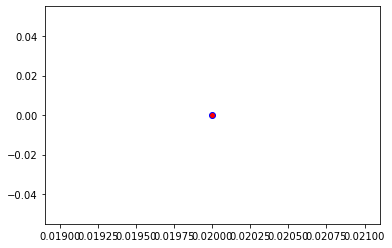

Crafting adversarial images took: 7.754384517669678 seconds 

Images classified as:
000000500477 961 = dough
000000500478 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


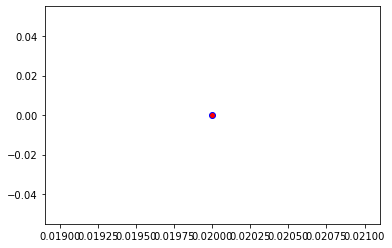

Crafting adversarial images took: 8.235174894332886 seconds 

Images classified as:
000000500565 434 = bath towel
000000500613 555 = fire engine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


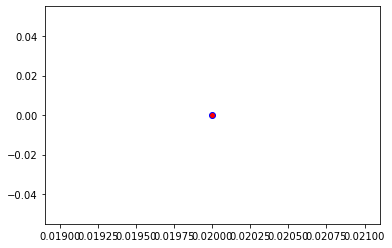

Crafting adversarial images took: 7.85632586479187 seconds 

Images classified as:
000000500663 140 = alp
000000500716 568 = fur coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


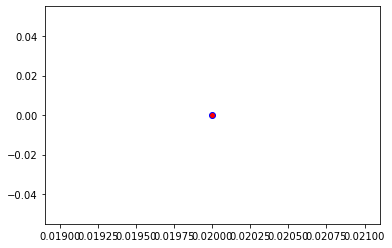

Crafting adversarial images took: 7.4667885303497314 seconds 

Images classified as:
000000500826 919 = street sign
000000501005 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


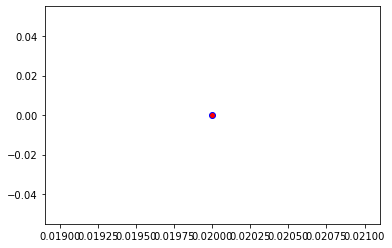

Crafting adversarial images took: 7.731062173843384 seconds 

Images classified as:
000000501023 919 = street sign
000000501243 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


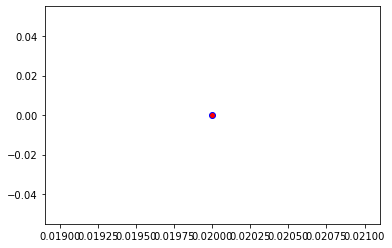

Crafting adversarial images took: 8.071415424346924 seconds 

Images classified as:
000000501368 589 = hand blower
000000501523 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


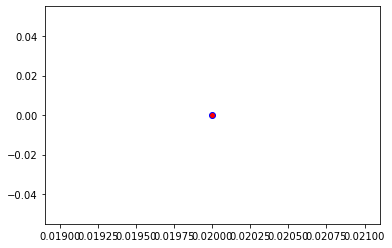

Crafting adversarial images took: 7.713242530822754 seconds 

Images classified as:
000000502136 743 = prison
000000502168 403 = aircraft carrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


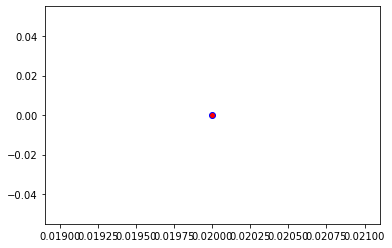

Crafting adversarial images took: 7.895085096359253 seconds 

Images classified as:
000000502229 611 = jigsaw puzzle
000000502336 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


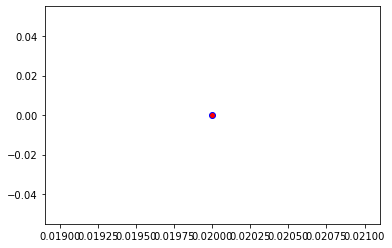

Crafting adversarial images took: 7.5786848068237305 seconds 

Images classified as:
000000502347 405 = airship
000000502599 918 = crossword puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


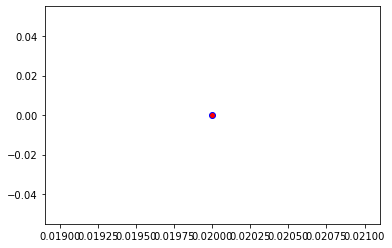

Crafting adversarial images took: 7.608102560043335 seconds 

Images classified as:
000000502732 760 = refrigerator
000000502737 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


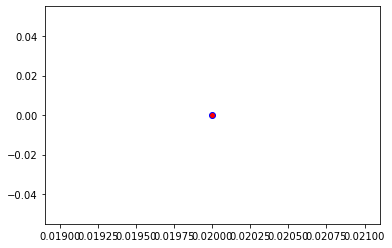

Crafting adversarial images took: 7.772974252700806 seconds 

Images classified as:
000000502910 919 = street sign
000000503755 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


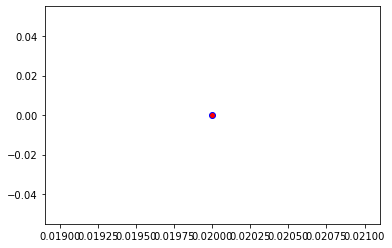

Crafting adversarial images took: 7.723416805267334 seconds 

Images classified as:
000000503823 864 = wreck
000000503841 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


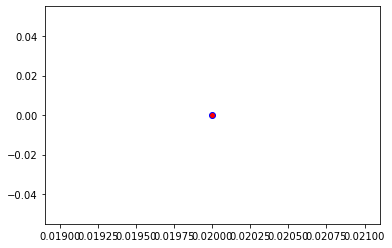

Crafting adversarial images took: 7.55086874961853 seconds 

Images classified as:
000000503855 879 = umbrella
000000504000 318 = wing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


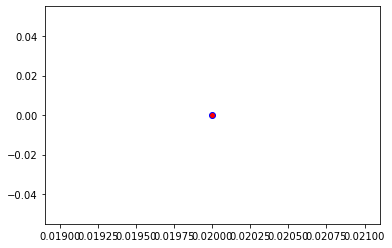

Crafting adversarial images took: 7.80809211730957 seconds 

Images classified as:
000000504074 620 = laptop
000000504389 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


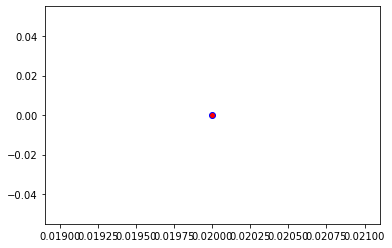

Crafting adversarial images took: 9.025241136550903 seconds 

Images classified as:
000000504415 752 = racket
000000504439 340 = zebra
Min values in image-array: 0.02631569 Max values in image-array: 255.0
Min values in image-array: 0.00010319878 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


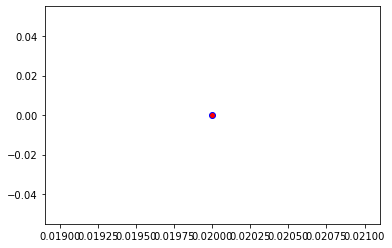

Crafting adversarial images took: 7.578672885894775 seconds 

Images classified as:
000000504580 272 = coyote
000000504589 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


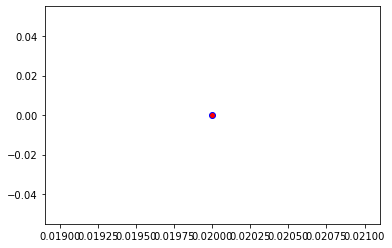

Crafting adversarial images took: 9.067043542861938 seconds 

Images classified as:
000000504635 340 = zebra
000000504711 960 = chocolate sauce
Min values in image-array: 0.0 Max values in image-array: 254.83833
Min values in image-array: 0.0 Max values in image-array: 0.999366
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


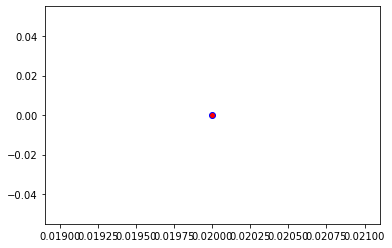

Crafting adversarial images took: 7.77089786529541 seconds 

Images classified as:
000000505169 794 = shower curtain
000000505451 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


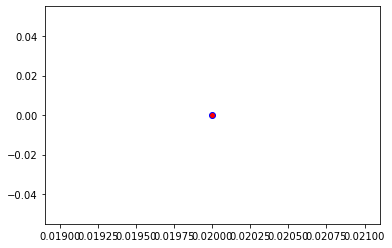

Crafting adversarial images took: 7.806162357330322 seconds 

Images classified as:
000000505565 127 = white stork
000000505573 245 = French bulldog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


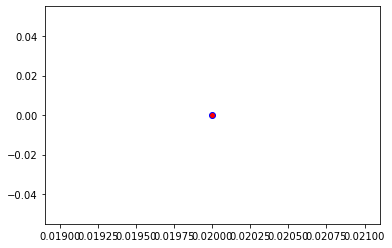

Crafting adversarial images took: 7.880480766296387 seconds 

Images classified as:
000000505638 820 = steam locomotive
000000505789 668 = mosque
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


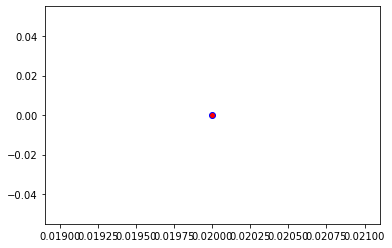

Crafting adversarial images took: 7.621442794799805 seconds 

Images classified as:
000000505942 704 = parking meter
000000506004 871 = trimaran
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


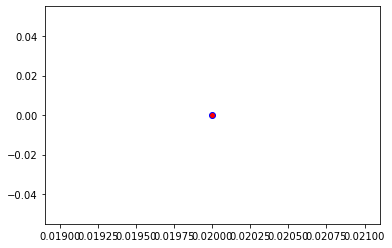

Crafting adversarial images took: 7.672183275222778 seconds 

Images classified as:
000000506178 650 = microphone
000000506279 441 = beer glass
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


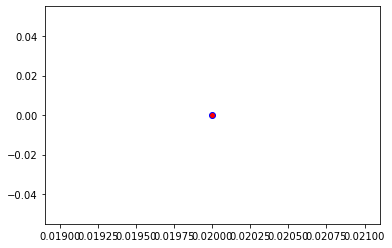

Crafting adversarial images took: 7.574066400527954 seconds 

Images classified as:
000000506310 771 = safe
000000506454 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


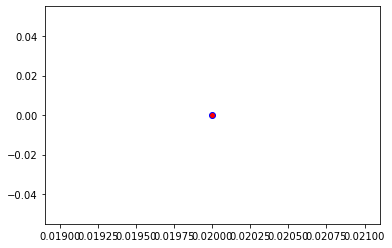

Crafting adversarial images took: 7.80612850189209 seconds 

Images classified as:
000000506656 603 = horse cart
000000506707 981 = ballplayer
Min values in image-array: 0.5510674 Max values in image-array: 255.0
Min values in image-array: 0.0021610486 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


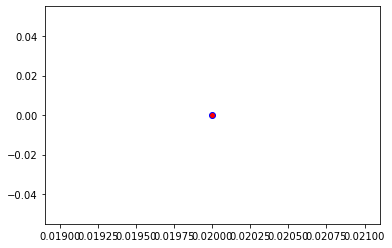

Crafting adversarial images took: 7.762680292129517 seconds 

Images classified as:
000000506933 761 = remote control
000000507015 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


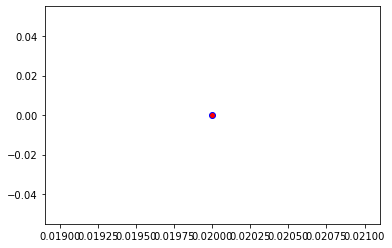

Crafting adversarial images took: 7.703312397003174 seconds 

Images classified as:
000000507037 444 = bicycle-built-for-two
000000507042 51 = triceratops
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


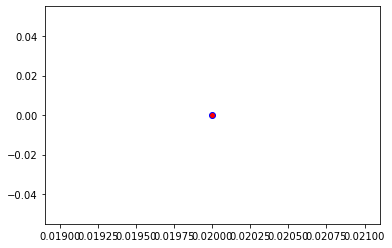

Crafting adversarial images took: 7.682378530502319 seconds 

Images classified as:
000000507081 799 = sliding door
000000507223 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


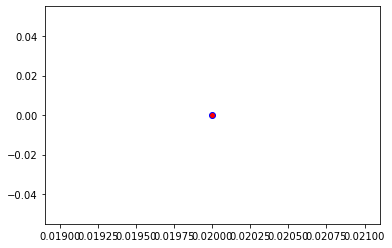

Crafting adversarial images took: 7.774233341217041 seconds 

Images classified as:
000000507235 926 = hot pot
000000507473 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


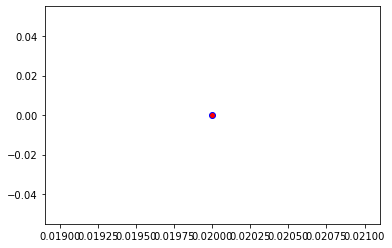

Crafting adversarial images took: 7.775422811508179 seconds 

Images classified as:
000000507575 526 = desk
000000507667 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


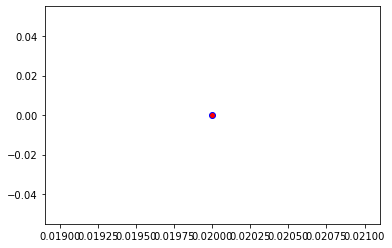

Crafting adversarial images took: 7.565652847290039 seconds 

Images classified as:
000000507797 654 = minibus
000000507893 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


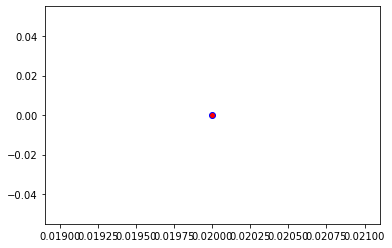

Crafting adversarial images took: 8.309783697128296 seconds 

Images classified as:
000000507975 339 = sorrel
000000508101 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


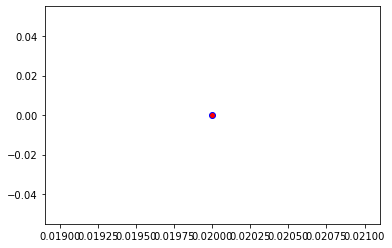

Crafting adversarial images took: 8.16703987121582 seconds 

Images classified as:
000000508312 651 = microwave
000000508370 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


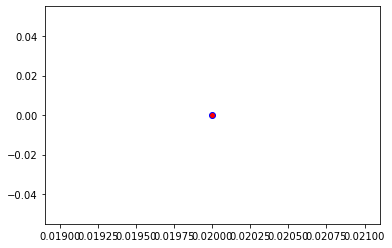

Crafting adversarial images took: 7.484050512313843 seconds 

Images classified as:
000000508482 480 = cash machine
000000508586 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


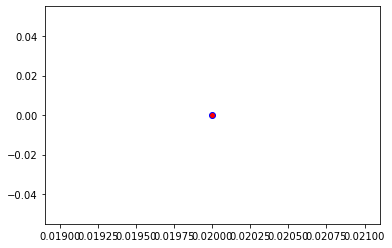

Crafting adversarial images took: 7.793167352676392 seconds 

Images classified as:
000000508602 132 = American egret
000000508639 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


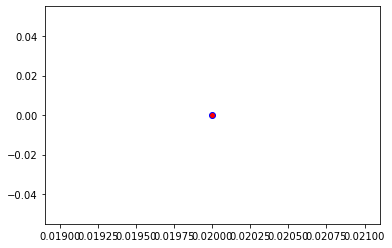

Crafting adversarial images took: 7.905956268310547 seconds 

Images classified as:
000000508730 435 = tub
000000508917 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


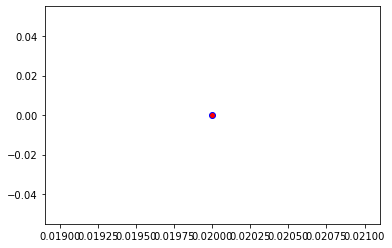

Crafting adversarial images took: 7.797650575637817 seconds 

Images classified as:
000000509008 779 = school bus
000000509014 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


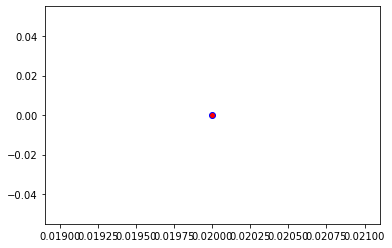

Crafting adversarial images took: 7.747257947921753 seconds 

Images classified as:
000000509131 950 = orange
000000509258 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


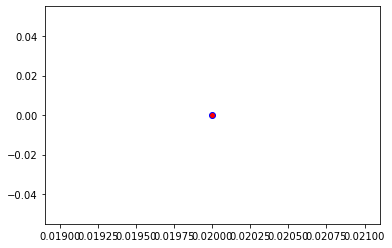

Crafting adversarial images took: 7.834745645523071 seconds 

Images classified as:
000000509260 453 = bookcase
000000509403 225 = malinois
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


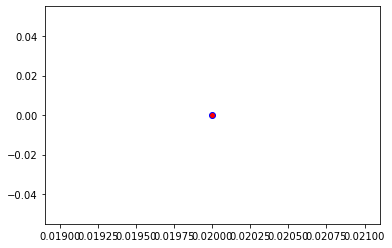

Crafting adversarial images took: 7.615130424499512 seconds 

Images classified as:
000000509451 363 = armadillo
000000509656 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


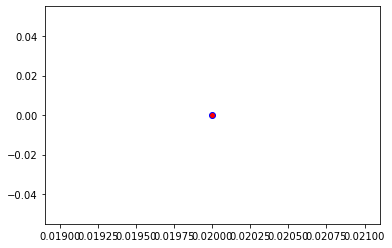

Crafting adversarial images took: 7.641331911087036 seconds 

Images classified as:
000000509699 589 = hand blower
000000509719 82 = ruffed grouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


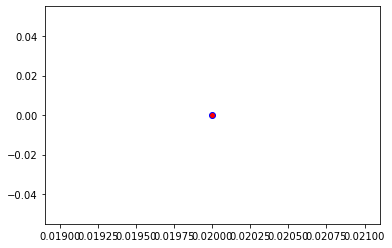

Crafting adversarial images took: 7.757594585418701 seconds 

Images classified as:
000000509735 340 = zebra
000000509824 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 254.60724
Min values in image-array: 0.0 Max values in image-array: 0.99845976
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


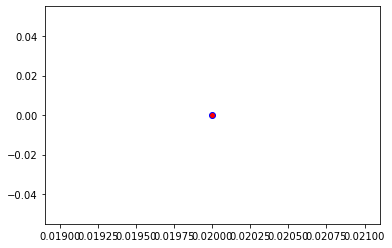

Crafting adversarial images took: 7.600013256072998 seconds 

Images classified as:
000000510095 984 = rapeseed
000000510329 471 = cannon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


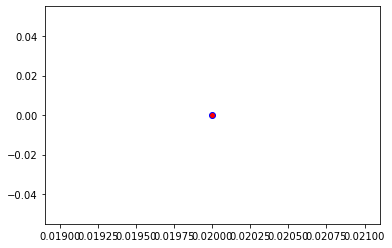

Crafting adversarial images took: 7.546286344528198 seconds 

Images classified as:
000000511076 421 = bannister
000000511321 404 = liner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


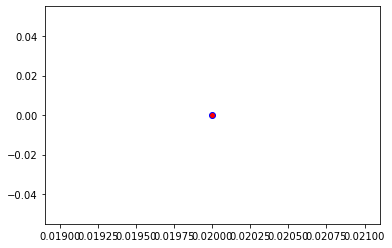

Crafting adversarial images took: 7.781939506530762 seconds 

Images classified as:
000000511384 417 = balloon
000000511398 162 = beagle
Min values in image-array: 0.0 Max values in image-array: 252.32863
Min values in image-array: 0.0 Max values in image-array: 0.989524
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


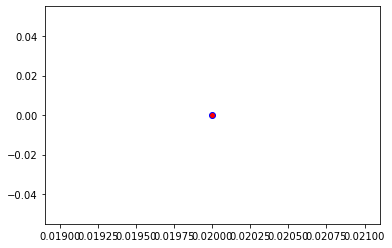

Crafting adversarial images took: 7.557775497436523 seconds 

Images classified as:
000000511453 933 = cheeseburger
000000511599 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


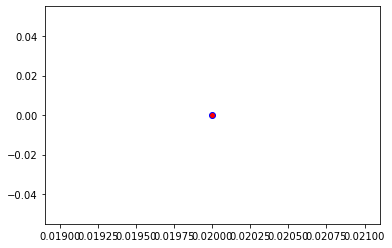

Crafting adversarial images took: 8.369941473007202 seconds 

Images classified as:
000000511647 838 = sunscreen
000000511760 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


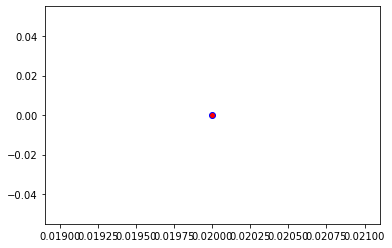

Crafting adversarial images took: 7.907078266143799 seconds 

Images classified as:
000000511999 705 = passenger car
000000512194 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


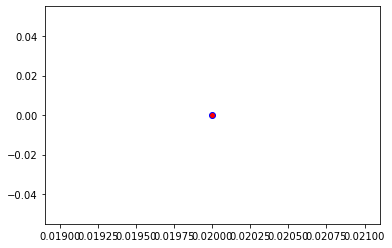

Crafting adversarial images took: 7.532954216003418 seconds 

Images classified as:
000000512248 409 = analog clock
000000512330 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


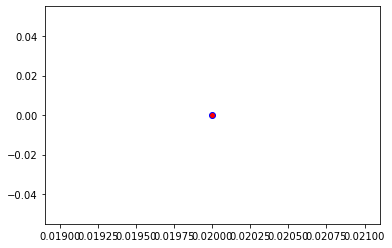

Crafting adversarial images took: 7.909532308578491 seconds 

Images classified as:
000000512403 883 = vase
000000512476 786 = sewing machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


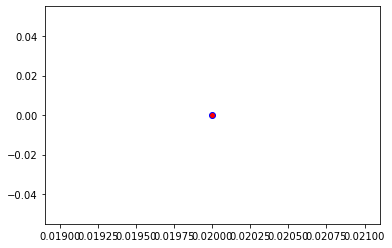

Crafting adversarial images took: 7.745840549468994 seconds 

Images classified as:
000000512564 829 = streetcar
000000512648 347 = bison
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


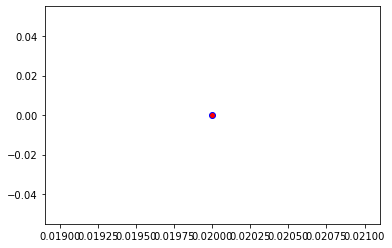

Crafting adversarial images took: 7.6315412521362305 seconds 

Images classified as:
000000512657 808 = sombrero
000000512776 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


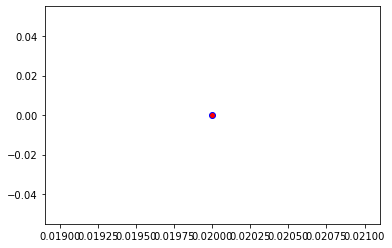

Crafting adversarial images took: 7.822080850601196 seconds 

Images classified as:
000000512836 229 = Old English sheepdog
000000512929 118 = Dungeness crab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


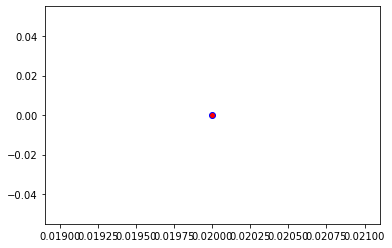

Crafting adversarial images took: 7.82934045791626 seconds 

Images classified as:
000000512985 978 = seashore
000000513041 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


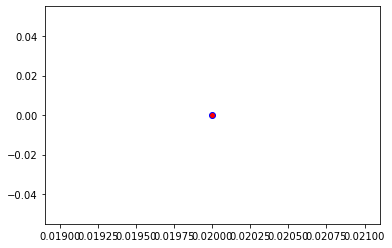

Crafting adversarial images took: 7.804231643676758 seconds 

Images classified as:
000000513181 404 = liner
000000513283 461 = plate
Min values in image-array: 0.0 Max values in image-array: 254.6965
Min values in image-array: 0.0 Max values in image-array: 0.9988098
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


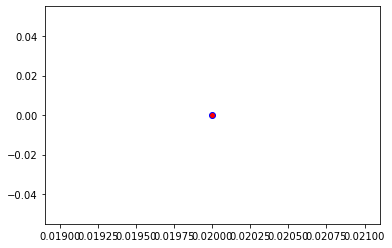

Crafting adversarial images took: 8.324894666671753 seconds 

Images classified as:
000000513484 294 = brown bear
000000513524 433 = bathing cap
Min values in image-array: 0.0 Max values in image-array: 254.9469
Min values in image-array: 0.0 Max values in image-array: 0.99979174
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


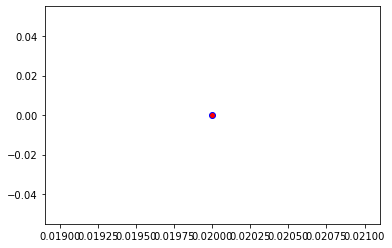

Crafting adversarial images took: 7.8230555057525635 seconds 

Images classified as:
000000513567 934 = hotdog
000000513580 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


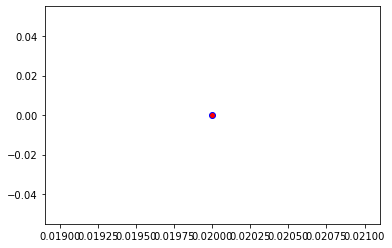

Crafting adversarial images took: 7.647627115249634 seconds 

Images classified as:
000000513688 532 = dining table
000000514376 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


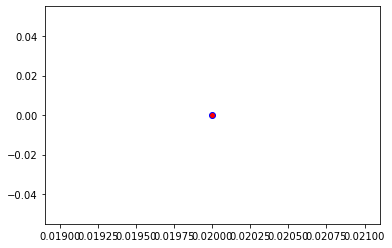

Crafting adversarial images took: 7.656413555145264 seconds 

Images classified as:
000000514508 654 = minibus
000000514540 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


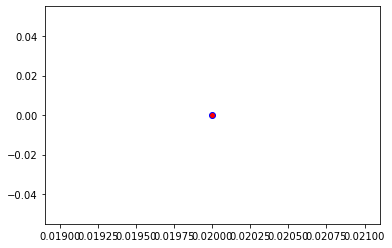

Crafting adversarial images took: 7.897292375564575 seconds 

Images classified as:
000000514586 981 = ballplayer
000000514797 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


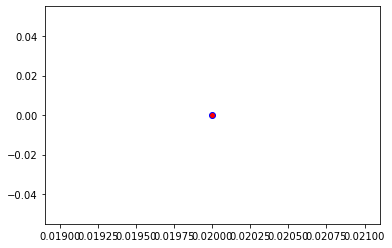

Crafting adversarial images took: 7.750030040740967 seconds 

Images classified as:
000000514914 648 = medicine chest
000000514979 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


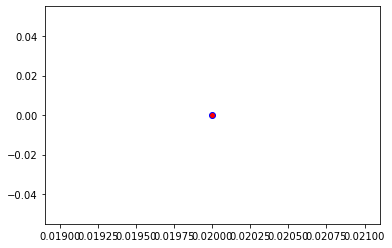

Crafting adversarial images took: 8.666909217834473 seconds 

Images classified as:
000000515025 231 = collie
000000515077 598 = home theater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


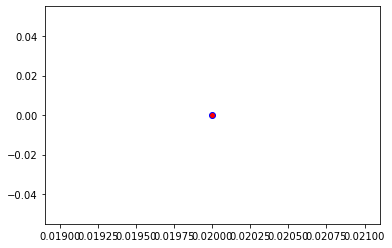

Crafting adversarial images took: 7.576984405517578 seconds 

Images classified as:
000000515266 609 = jeep
000000515350 864 = wreck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


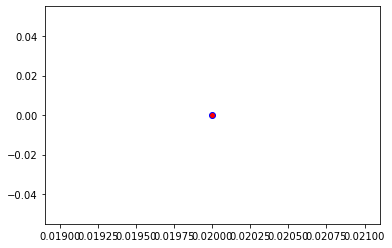

Crafting adversarial images took: 7.729069709777832 seconds 

Images classified as:
000000515445 978 = seashore
000000515577 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


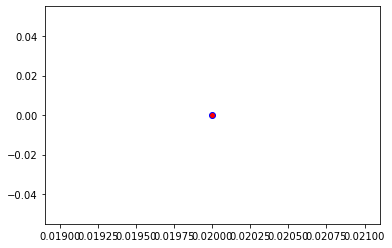

Crafting adversarial images took: 7.626801013946533 seconds 

Images classified as:
000000515579 752 = racket
000000515828 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


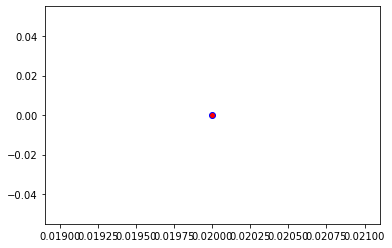

Crafting adversarial images took: 7.898465156555176 seconds 

Images classified as:
000000515982 981 = ballplayer
000000516038 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


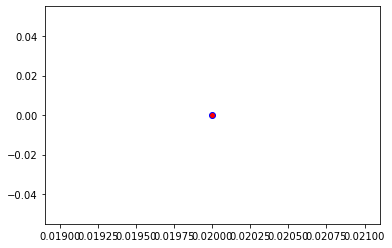

Crafting adversarial images took: 7.783102512359619 seconds 

Images classified as:
000000516143 829 = streetcar
000000516173 638 = maillot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


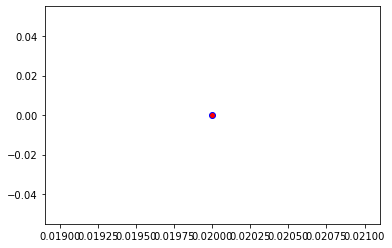

Crafting adversarial images took: 7.977961540222168 seconds 

Images classified as:
000000516316 340 = zebra
000000516318 209 = Chesapeake Bay retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


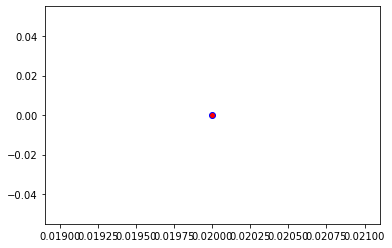

Crafting adversarial images took: 7.608744859695435 seconds 

Images classified as:
000000516601 140 = alp
000000516677 140 = alp
Min values in image-array: 0.0 Max values in image-array: 252.83215
Min values in image-array: 0.0 Max values in image-array: 0.99149865
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


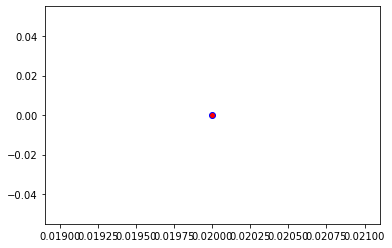

Crafting adversarial images took: 7.71066427230835 seconds 

Images classified as:
000000516708 919 = street sign
000000516804 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


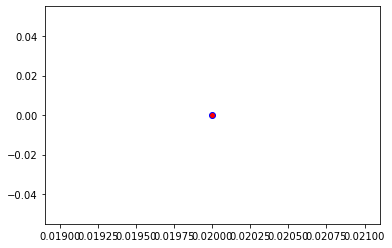

Crafting adversarial images took: 7.739907741546631 seconds 

Images classified as:
000000516871 868 = tray
000000516916 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


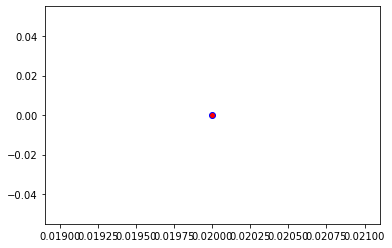

Crafting adversarial images took: 7.698434829711914 seconds 

Images classified as:
000000517056 618 = ladle
000000517069 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


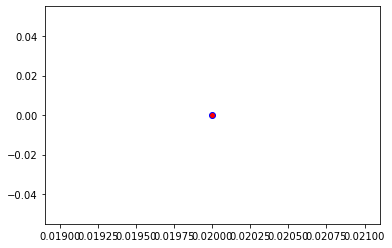

Crafting adversarial images took: 7.6240763664245605 seconds 

Images classified as:
000000517523 404 = airliner
000000517687 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


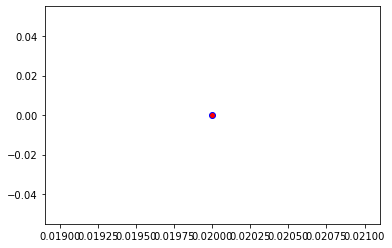

Crafting adversarial images took: 7.82228422164917 seconds 

Images classified as:
000000517832 179 = Staffordshire bullterrier
000000518213 347 = bison
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


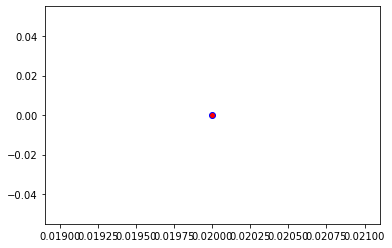

Crafting adversarial images took: 7.753321647644043 seconds 

Images classified as:
000000518326 116 = cradle
000000518770 543 = dumbbell
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


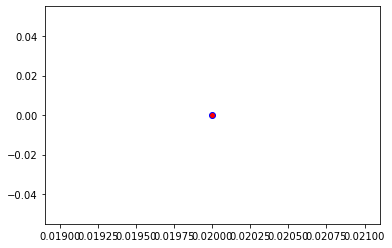

Crafting adversarial images took: 8.415710210800171 seconds 

Images classified as:
000000519039 675 = moving van
000000519208 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


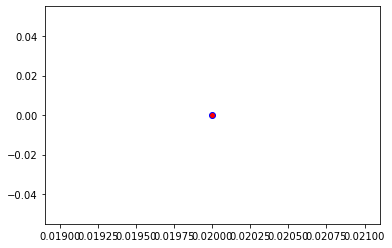

Crafting adversarial images took: 7.866407632827759 seconds 

Images classified as:
000000519338 565 = freight car
000000519491 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


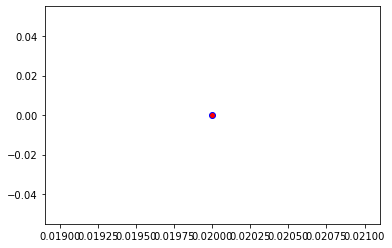

Crafting adversarial images took: 7.596660137176514 seconds 

Images classified as:
000000519522 498 = palace
000000519569 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


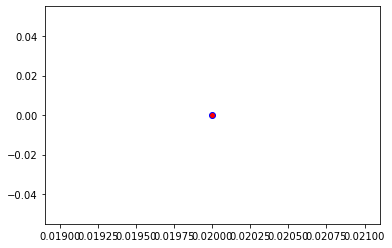

Crafting adversarial images took: 7.835781574249268 seconds 

Images classified as:
000000519611 296 = ice bear
000000519688 361 = skunk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


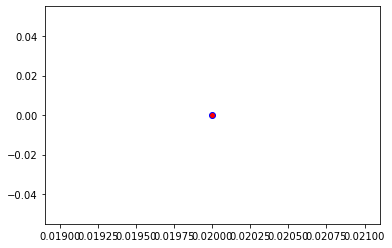

Crafting adversarial images took: 7.653745412826538 seconds 

Images classified as:
000000519764 281 = tabby
000000520009 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


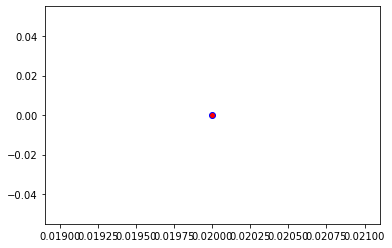

Crafting adversarial images took: 7.856235504150391 seconds 

Images classified as:
000000520077 453 = bookcase
000000520264 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


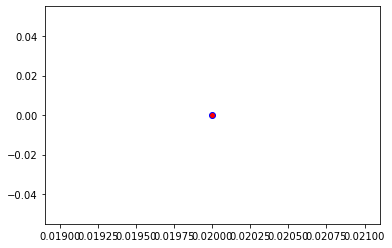

Crafting adversarial images took: 7.738074779510498 seconds 

Images classified as:
000000520301 227 = kelpie
000000520324 639 = tank
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


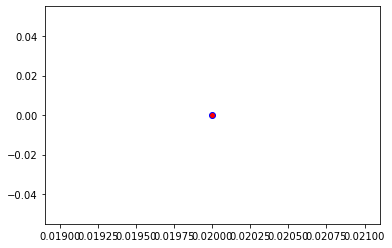

Crafting adversarial images took: 7.692379713058472 seconds 

Images classified as:
000000520531 283 = Persian cat
000000520659 476 = carousel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


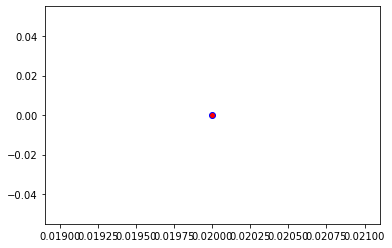

Crafting adversarial images took: 7.706678628921509 seconds 

Images classified as:
000000520707 624 = library
000000520832 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


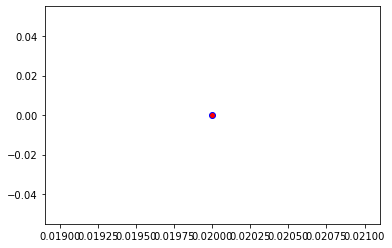

Crafting adversarial images took: 7.854506015777588 seconds 

Images classified as:
000000520871 963 = pizza
000000520910 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


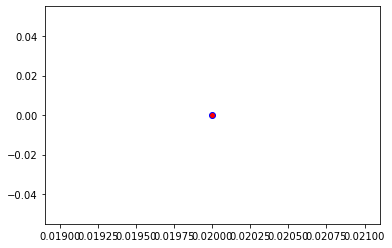

Crafting adversarial images took: 7.787505388259888 seconds 

Images classified as:
000000521052 675 = moving van
000000521141 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


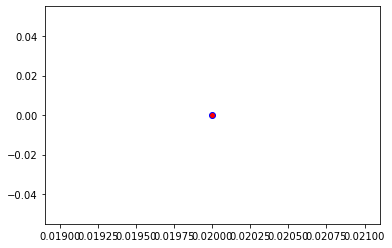

Crafting adversarial images took: 7.813198089599609 seconds 

Images classified as:
000000521231 296 = ice bear
000000521259 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


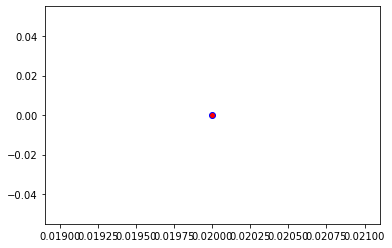

Crafting adversarial images took: 7.787103176116943 seconds 

Images classified as:
000000521282 725 = pitcher
000000521405 816 = spindle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


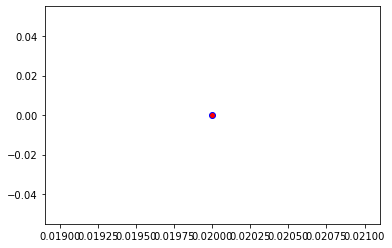

Crafting adversarial images took: 7.67298436164856 seconds 

Images classified as:
000000521509 762 = restaurant
000000521540 910 = wooden spoon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


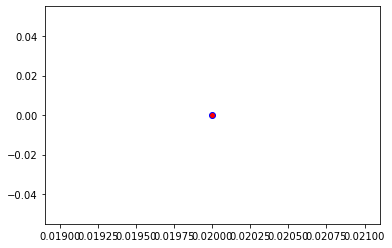

Crafting adversarial images took: 7.637809991836548 seconds 

Images classified as:
000000521601 659 = mixing bowl
000000521717 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


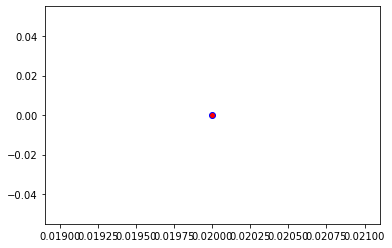

Crafting adversarial images took: 8.964537143707275 seconds 

Images classified as:
000000521719 723 = pinwheel
000000521819 645 = maypole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


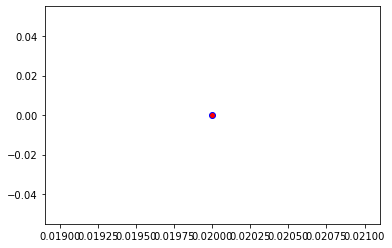

Crafting adversarial images took: 7.638284683227539 seconds 

Images classified as:
000000521956 752 = racket
000000522007 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


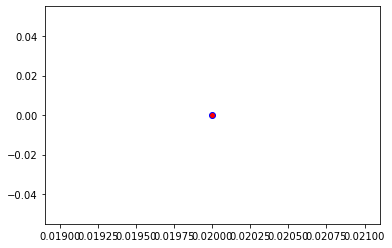

Crafting adversarial images took: 7.625450134277344 seconds 

Images classified as:
000000522156 461 = plate
000000522393 914 = yawl
Min values in image-array: 0.0 Max values in image-array: 254.85718
Min values in image-array: 0.0 Max values in image-array: 0.9994399
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


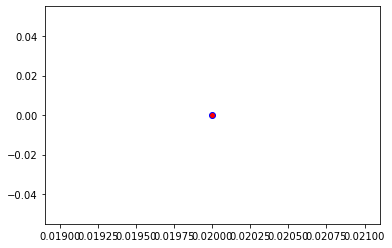

Crafting adversarial images took: 7.9289491176605225 seconds 

Images classified as:
000000522638 850 = teddy
000000522713 67 = dam
Min values in image-array: 0.0 Max values in image-array: 254.45982
Min values in image-array: 0.0 Max values in image-array: 0.99788165
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


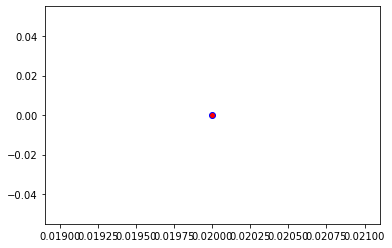

Crafting adversarial images took: 7.671077251434326 seconds 

Images classified as:
000000522751 920 = traffic light
000000522889 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


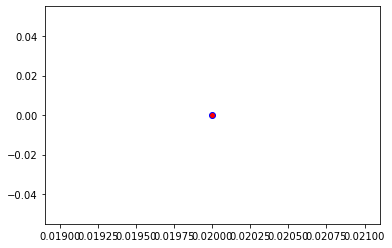

Crafting adversarial images took: 7.928385019302368 seconds 

Images classified as:
000000522940 919 = street sign
000000523033 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 254.61273
Min values in image-array: 0.0 Max values in image-array: 0.9984813
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


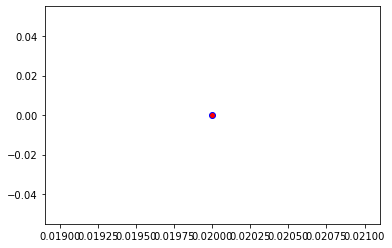

Crafting adversarial images took: 7.816624641418457 seconds 

Images classified as:
000000523100 926 = hot pot
000000523175 809 = soup bowl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


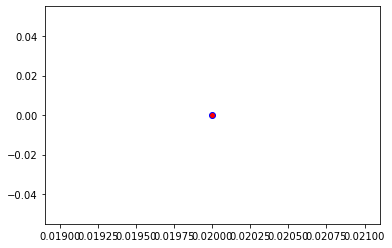

Crafting adversarial images took: 7.616639852523804 seconds 

Images classified as:
000000523194 879 = umbrella
000000523229 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


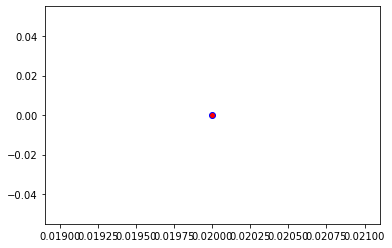

Crafting adversarial images took: 7.834943056106567 seconds 

Images classified as:
000000523241 358 = pole
000000523782 656 = minivan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


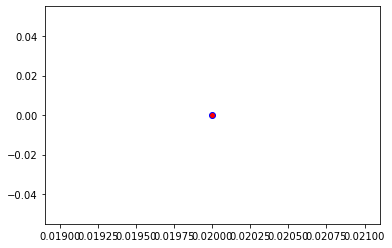

Crafting adversarial images took: 7.746237516403198 seconds 

Images classified as:
000000523807 934 = hotdog
000000523811 12 = house finch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


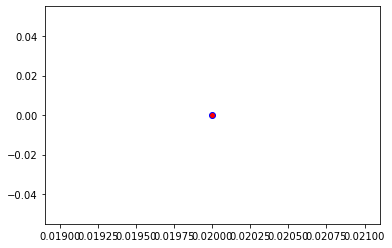

Crafting adversarial images took: 7.739206075668335 seconds 

Images classified as:
000000523957 500 = cliff
000000524108 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


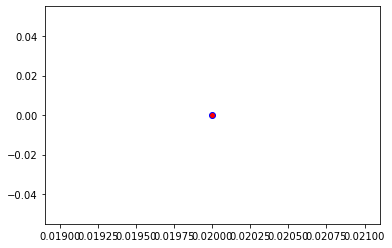

Crafting adversarial images took: 7.777065277099609 seconds 

Images classified as:
000000524280 282 = tiger cat
000000524456 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


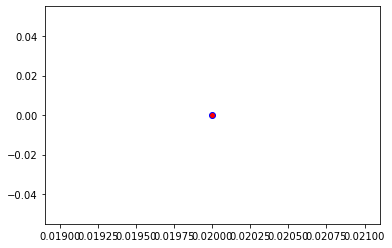

Crafting adversarial images took: 7.667805433273315 seconds 

Images classified as:
000000524742 709 = pencil box
000000524850 318 = wing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


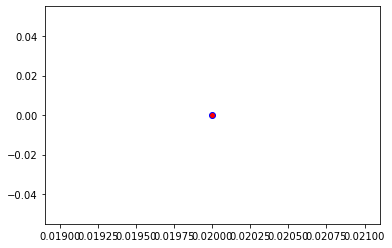

Crafting adversarial images took: 7.712602376937866 seconds 

Images classified as:
000000525083 651 = microwave
000000525155 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


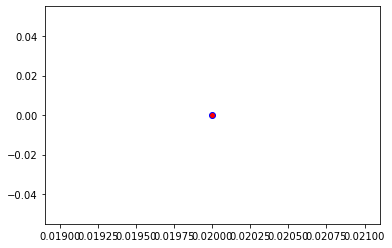

Crafting adversarial images took: 7.828789710998535 seconds 

Images classified as:
000000525247 508 = computer keyboard
000000525286 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


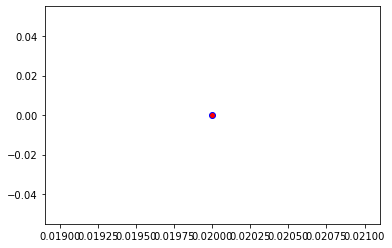

Crafting adversarial images took: 8.389145612716675 seconds 

Images classified as:
000000525322 895 = warplane
000000525600 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 252.33484
Min values in image-array: 0.0 Max values in image-array: 0.9895484
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


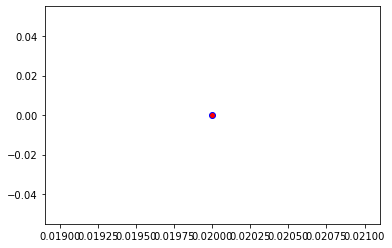

Crafting adversarial images took: 7.710870027542114 seconds 

Images classified as:
000000526103 385 = Indian elephant
000000526197 415 = bakery
Min values in image-array: 0.06375997 Max values in image-array: 255.0
Min values in image-array: 0.0002500391 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


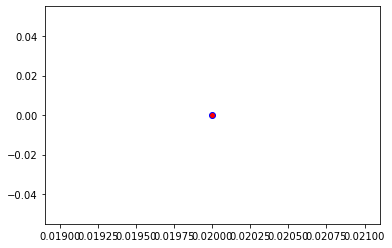

Crafting adversarial images took: 7.6920881271362305 seconds 

Images classified as:
000000526256 442 = bell cote
000000526392 656 = minivan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


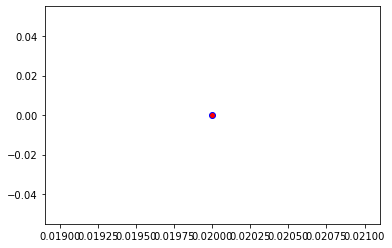

Crafting adversarial images took: 7.745559930801392 seconds 

Images classified as:
000000526706 347 = bison
000000526728 707 = pay-phone
Min values in image-array: 1.0256383 Max values in image-array: 255.0
Min values in image-array: 0.004022111 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


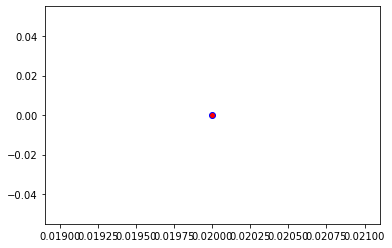

Crafting adversarial images took: 7.829878568649292 seconds 

Images classified as:
000000526751 484 = catamaran
000000527029 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


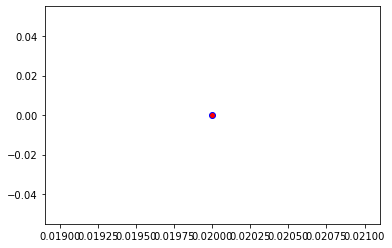

Crafting adversarial images took: 7.703842401504517 seconds 

Images classified as:
000000527215 977 = sandbar
000000527220 886 = vending machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


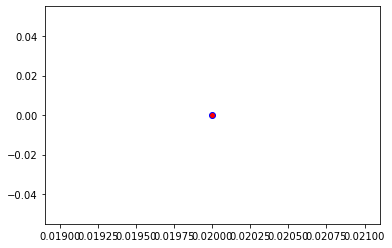

Crafting adversarial images took: 7.904048204421997 seconds 

Images classified as:
000000527427 606 = iron
000000527528 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


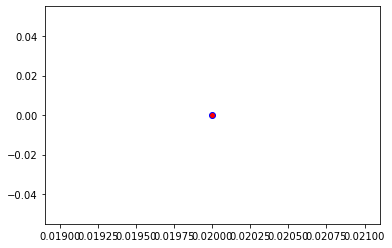

Crafting adversarial images took: 7.8599677085876465 seconds 

Images classified as:
000000527616 999 = toilet tissue
000000527695 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


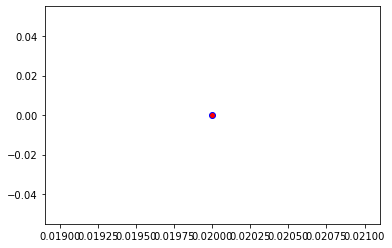

Crafting adversarial images took: 7.537516832351685 seconds 

Images classified as:
000000527750 534 = dishwasher
000000527784 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


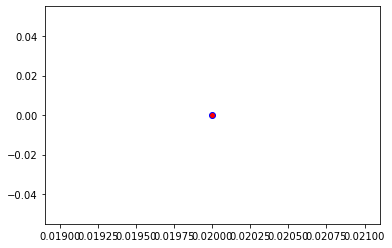

Crafting adversarial images took: 7.706120729446411 seconds 

Images classified as:
000000527960 703 = park bench
000000528314 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


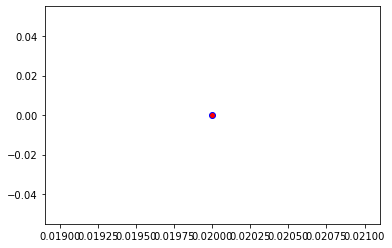

Crafting adversarial images took: 7.819698333740234 seconds 

Images classified as:
000000528399 809 = soup bowl
000000528524 209 = Chesapeake Bay retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


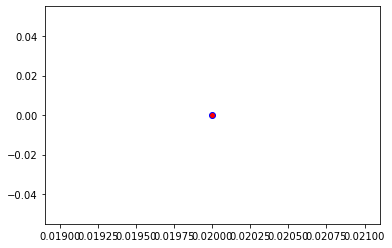

Crafting adversarial images took: 7.868436574935913 seconds 

Images classified as:
000000528578 498 = palace
000000528705 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 254.9509
Min values in image-array: 0.0 Max values in image-array: 0.9998074
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


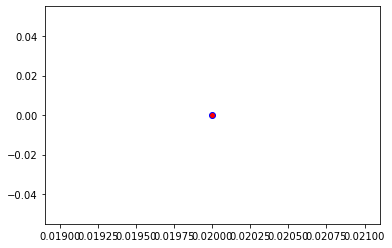

Crafting adversarial images took: 7.612572431564331 seconds 

Images classified as:
000000528862 176 = gazelle
000000528977 919 = street sign
Min values in image-array: 0.16519165 Max values in image-array: 255.0
Min values in image-array: 0.0006478104 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


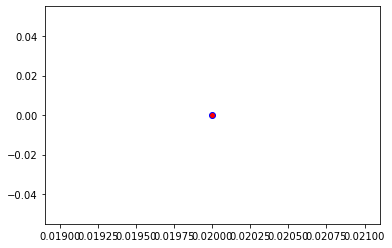

Crafting adversarial images took: 7.805304527282715 seconds 

Images classified as:
000000528980 919 = street sign
000000529105 346 = water buffalo
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


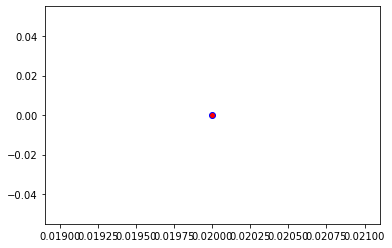

Crafting adversarial images took: 8.370453834533691 seconds 

Images classified as:
000000529122 415 = bakery
000000529148 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


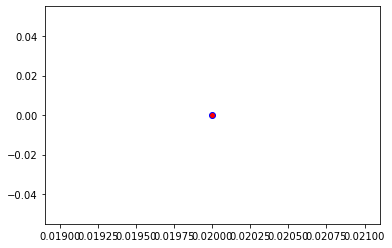

Crafting adversarial images took: 7.943922519683838 seconds 

Images classified as:
000000529528 940 = spaghetti squash
000000529568 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


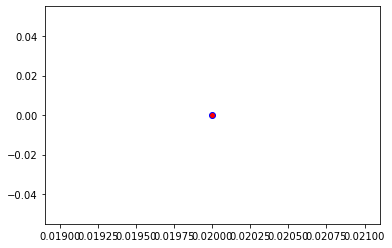

Crafting adversarial images took: 7.816814184188843 seconds 

Images classified as:
000000529762 461 = plate
000000529939 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


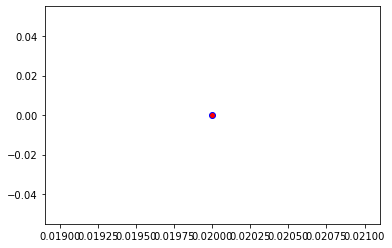

Crafting adversarial images took: 7.866398811340332 seconds 

Images classified as:
000000529966 950 = orange
000000530052 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


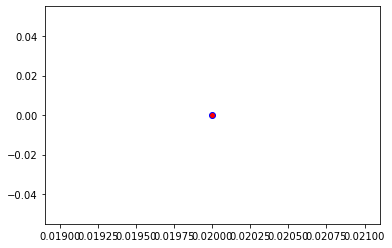

Crafting adversarial images took: 7.918876647949219 seconds 

Images classified as:
000000530061 659 = mixing bowl
000000530099 534 = dishwasher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


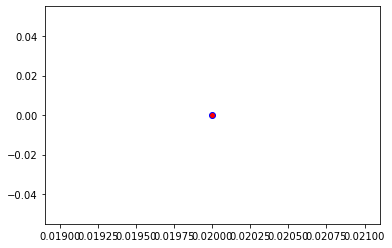

Crafting adversarial images took: 8.020098447799683 seconds 

Images classified as:
000000530146 935 = mashed potato
000000530162 568 = fur coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


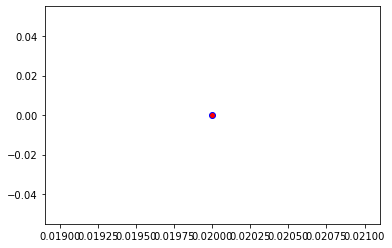

Crafting adversarial images took: 7.693592548370361 seconds 

Images classified as:
000000530457 28 = pot
000000530466 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


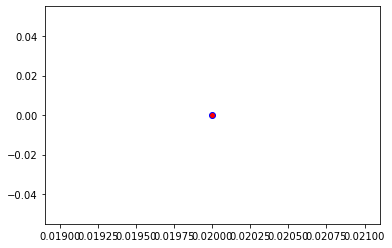

Crafting adversarial images took: 7.692913055419922 seconds 

Images classified as:
000000530470 417 = balloon
000000530624 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


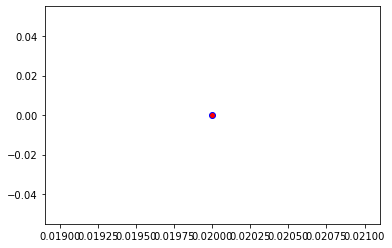

Crafting adversarial images took: 7.826735019683838 seconds 

Images classified as:
000000530820 752 = racket
000000530836 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


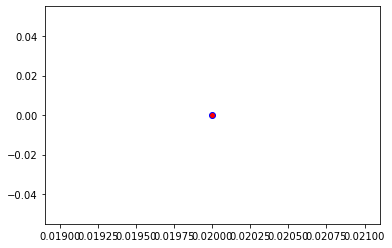

Crafting adversarial images took: 8.314384937286377 seconds 

Images classified as:
000000530854 879 = umbrella
000000530975 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


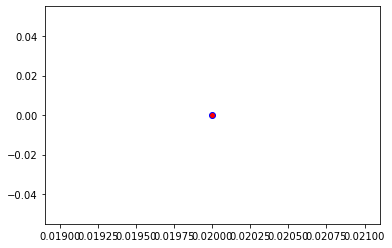

Crafting adversarial images took: 7.627867221832275 seconds 

Images classified as:
000000531036 874 = trolleybus
000000531134 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


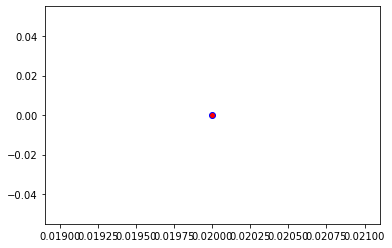

Crafting adversarial images took: 7.586775064468384 seconds 

Images classified as:
000000531135 981 = ballplayer
000000531495 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


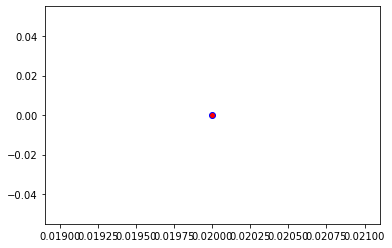

Crafting adversarial images took: 7.696078538894653 seconds 

Images classified as:
000000531707 703 = park bench
000000531771 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


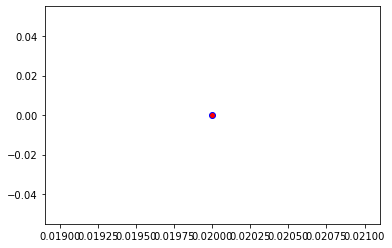

Crafting adversarial images took: 7.796048879623413 seconds 

Images classified as:
000000532058 529 = diaper
000000532071 295 = American black bear
Min values in image-array: 0.42855835 Max values in image-array: 255.0
Min values in image-array: 0.001680621 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


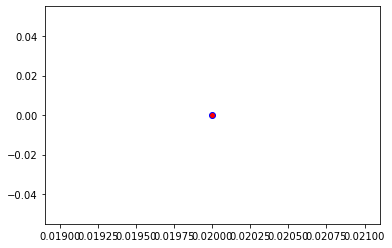

Crafting adversarial images took: 7.557039976119995 seconds 

Images classified as:
000000532129 963 = pizza
000000532481 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


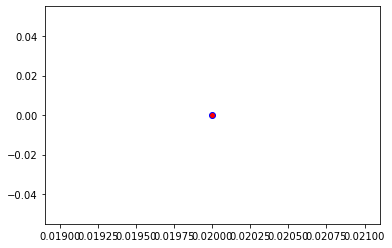

Crafting adversarial images took: 8.639734029769897 seconds 

Images classified as:
000000532493 144 = pelican
000000532530 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


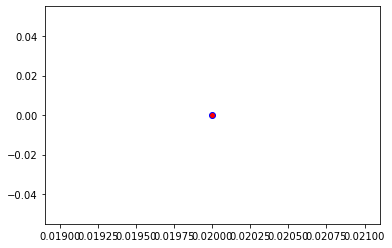

Crafting adversarial images took: 7.836713075637817 seconds 

Images classified as:
000000532575 225 = malinois
000000532690 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


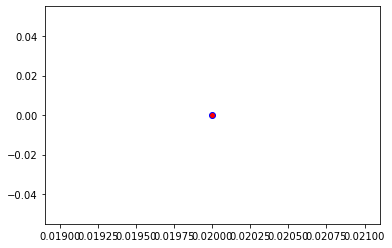

Crafting adversarial images took: 7.677778244018555 seconds 

Images classified as:
000000532761 831 = studio couch
000000532855 113 = nail
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


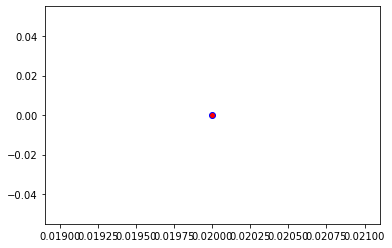

Crafting adversarial images took: 7.904652118682861 seconds 

Images classified as:
000000532901 564 = four-poster
000000533145 844 = switch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


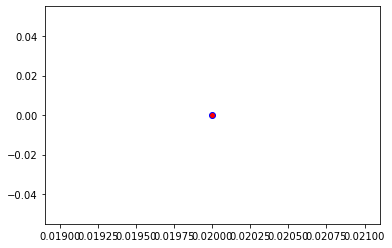

Crafting adversarial images took: 7.933520555496216 seconds 

Images classified as:
000000533206 118 = Dungeness crab
000000533493 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


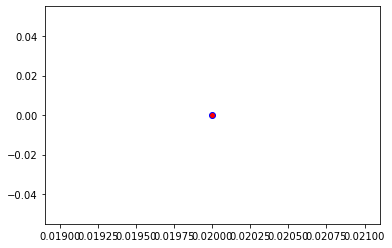

Crafting adversarial images took: 7.827829837799072 seconds 

Images classified as:
000000533536 851 = television
000000533816 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


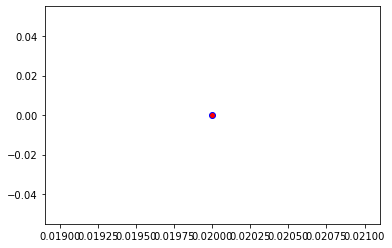

Crafting adversarial images took: 7.851488828659058 seconds 

Images classified as:
000000533855 589 = hand blower
000000533958 461 = plate
Min values in image-array: 0.011477256 Max values in image-array: 255.0
Min values in image-array: 4.500885e-05 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


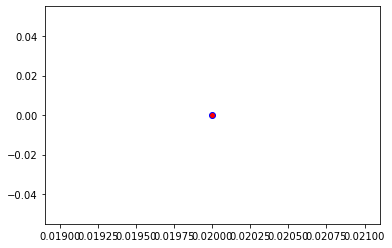

Crafting adversarial images took: 7.716448783874512 seconds 

Images classified as:
000000534041 680 = nipple
000000534270 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


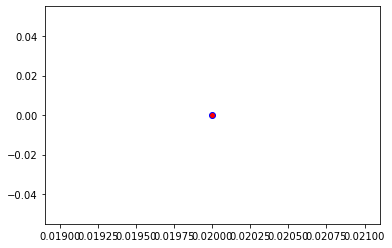

Crafting adversarial images took: 7.751351356506348 seconds 

Images classified as:
000000534394 475 = car mirror
000000534601 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


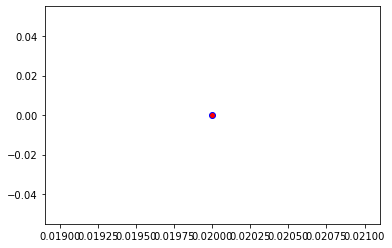

Crafting adversarial images took: 7.585577964782715 seconds 

Images classified as:
000000534605 665 = moped
000000534639 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


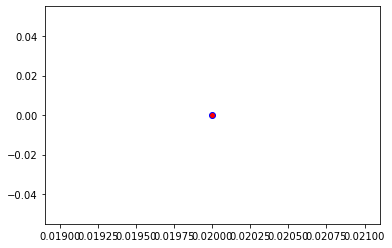

Crafting adversarial images took: 7.790031671524048 seconds 

Images classified as:
000000534664 760 = refrigerator
000000534673 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


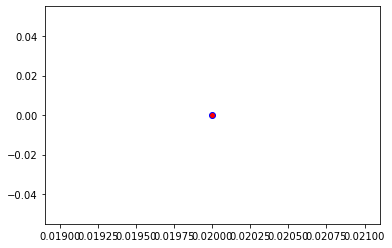

Crafting adversarial images took: 7.7348411083221436 seconds 

Images classified as:
000000534827 665 = moped
000000535094 54 = hog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


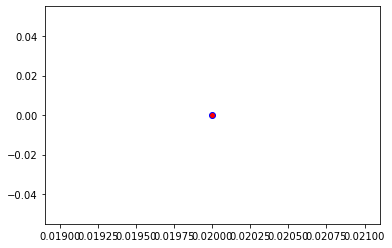

Crafting adversarial images took: 7.7114667892456055 seconds 

Images classified as:
000000535156 385 = Indian elephant
000000535253 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


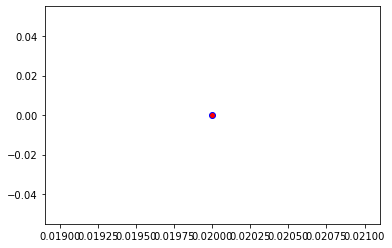

Crafting adversarial images took: 7.951011896133423 seconds 

Images classified as:
000000535306 408 = amphibian
000000535523 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


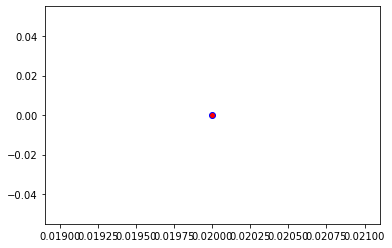

Crafting adversarial images took: 7.955361843109131 seconds 

Images classified as:
000000535578 5 = ram
000000535608 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 254.98885
Min values in image-array: 0.0 Max values in image-array: 0.99995625
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


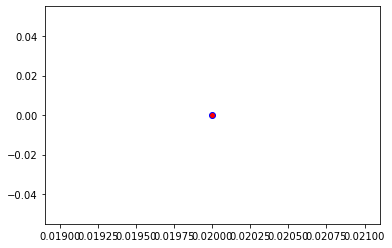

Crafting adversarial images took: 8.200549364089966 seconds 

Images classified as:
000000535858 842 = swimming trunks
000000536038 806 = sock
Min values in image-array: 0.0 Max values in image-array: 241.16634
Min values in image-array: 0.0 Max values in image-array: 0.94575036
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


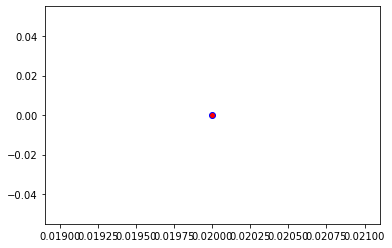

Crafting adversarial images took: 7.636261940002441 seconds 

Images classified as:
000000536073 505 = coffeepot
000000536343 713 = photocopier
Min values in image-array: 0.28572083 Max values in image-array: 255.0
Min values in image-array: 0.0011204738 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


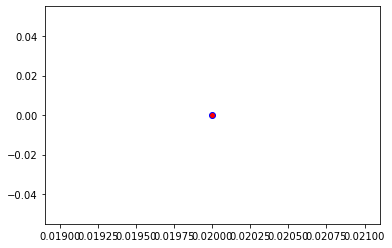

Crafting adversarial images took: 7.549108266830444 seconds 

Images classified as:
000000536947 583 = guillotine
000000537053 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


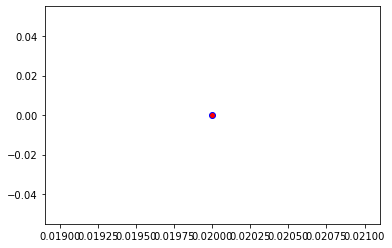

Crafting adversarial images took: 7.884437322616577 seconds 

Images classified as:
000000537153 976 = promontory
000000537241 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


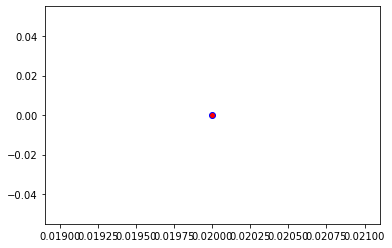

Crafting adversarial images took: 7.893965721130371 seconds 

Images classified as:
000000537270 784 = screwdriver
000000537355 660 = mobile home
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


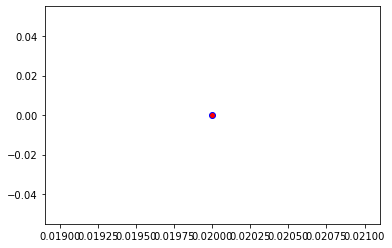

Crafting adversarial images took: 7.647743225097656 seconds 

Images classified as:
000000537506 957 = pomegranate
000000537672 480 = cash machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


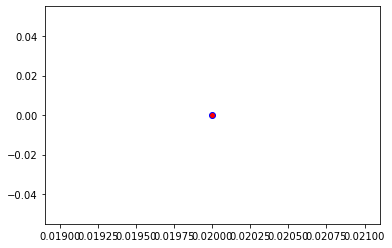

Crafting adversarial images took: 7.86776328086853 seconds 

Images classified as:
000000537802 850 = teddy
000000537812 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


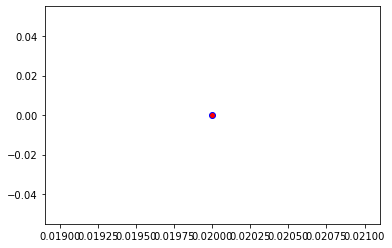

Crafting adversarial images took: 7.766118288040161 seconds 

Images classified as:
000000537827 981 = ballplayer
000000537964 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


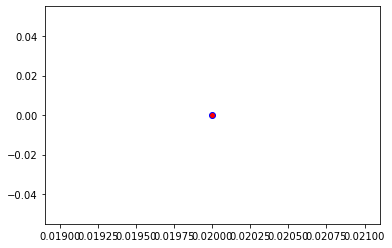

Crafting adversarial images took: 7.775774955749512 seconds 

Images classified as:
000000537991 650 = microphone
000000538067 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


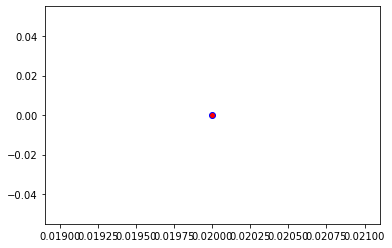

Crafting adversarial images took: 7.665100336074829 seconds 

Images classified as:
000000538236 415 = bakery
000000538364 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


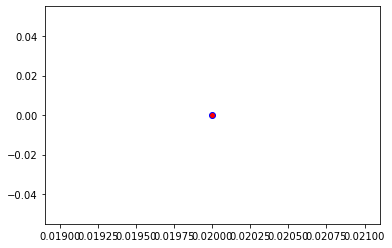

Crafting adversarial images took: 7.4827189445495605 seconds 

Images classified as:
000000538458 880 = unicycle
000000539143 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


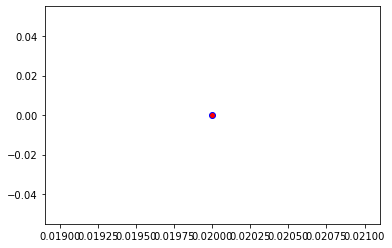

Crafting adversarial images took: 7.677424430847168 seconds 

Images classified as:
000000539445 547 = electric locomotive
000000539883 781 = scoreboard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


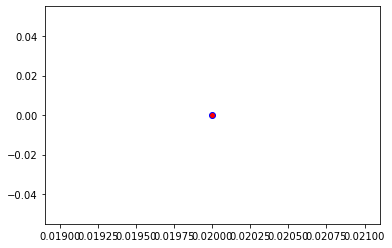

Crafting adversarial images took: 7.7446205615997314 seconds 

Images classified as:
000000539962 706 = patio
000000540280 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


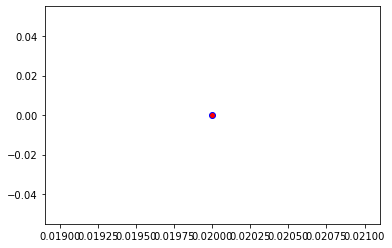

Crafting adversarial images took: 7.827692985534668 seconds 

Images classified as:
000000540414 582 = grocery store
000000540466 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


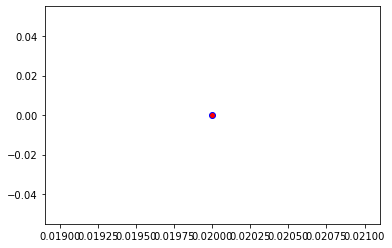

Crafting adversarial images took: 9.391928672790527 seconds 

Images classified as:
000000540502 896 = washbasin
000000540928 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


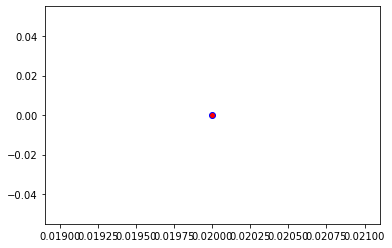

Crafting adversarial images took: 7.836240530014038 seconds 

Images classified as:
000000540932 977 = sandbar
000000540962 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


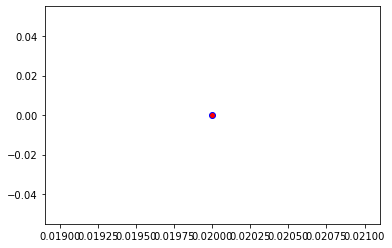

Crafting adversarial images took: 7.819077253341675 seconds 

Images classified as:
000000541055 248 = ski
000000541123 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


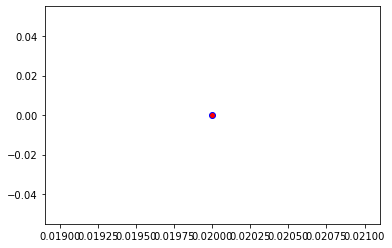

Crafting adversarial images took: 7.7543299198150635 seconds 

Images classified as:
000000541291 896 = washbasin
000000541634 925 = consomme
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


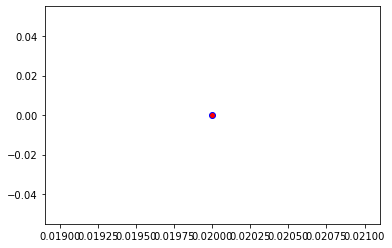

Crafting adversarial images took: 7.9642579555511475 seconds 

Images classified as:
000000541664 508 = computer keyboard
000000541773 740 = power drill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


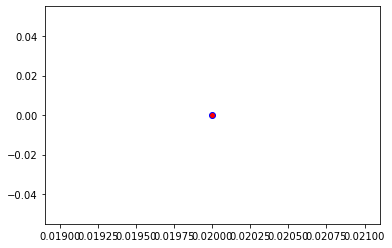

Crafting adversarial images took: 7.862748384475708 seconds 

Images classified as:
000000541952 442 = bell cote
000000542073 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


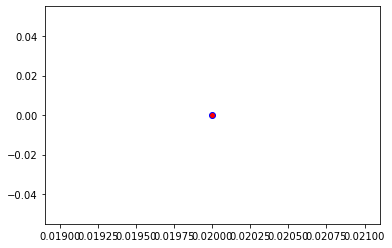

Crafting adversarial images took: 7.784599781036377 seconds 

Images classified as:
000000542089 896 = washbasin
000000542127 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


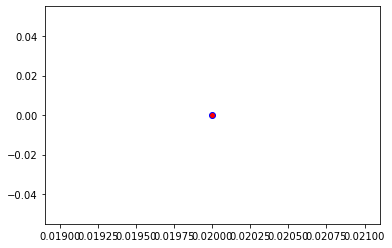

Crafting adversarial images took: 7.662055492401123 seconds 

Images classified as:
000000542423 703 = park bench
000000542625 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


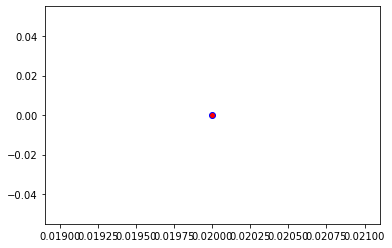

Crafting adversarial images took: 7.742094278335571 seconds 

Images classified as:
000000542776 13 = junco
000000542856 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


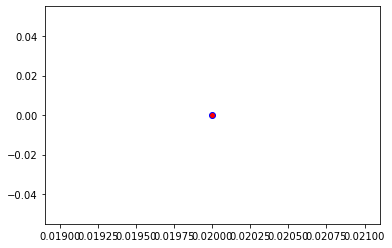

Crafting adversarial images took: 7.632631301879883 seconds 

Images classified as:
000000543043 705 = passenger car
000000543047 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


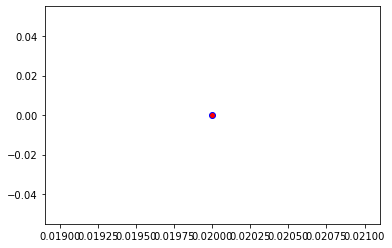

Crafting adversarial images took: 7.689993381500244 seconds 

Images classified as:
000000543300 404 = liner
000000543528 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


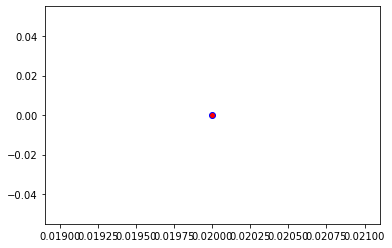

Crafting adversarial images took: 7.829546928405762 seconds 

Images classified as:
000000543581 831 = studio couch
000000544052 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


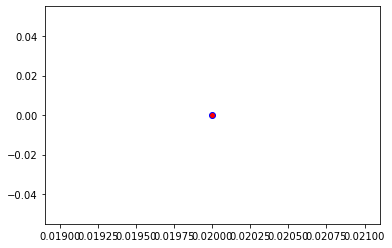

Crafting adversarial images took: 7.690236806869507 seconds 

Images classified as:
000000544306 442 = bell cote
000000544444 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


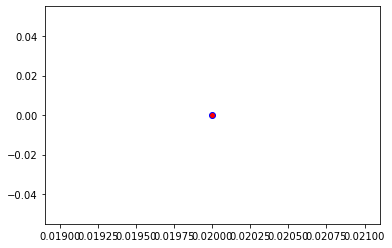

Crafting adversarial images took: 7.69057297706604 seconds 

Images classified as:
000000544519 929 = ice lolly
000000544565 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


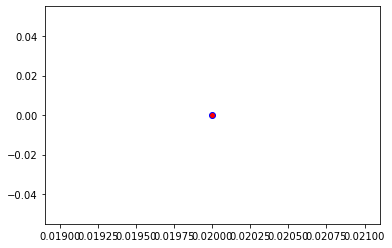

Crafting adversarial images took: 7.729261636734009 seconds 

Images classified as:
000000544605 919 = street sign
000000544811 144 = pelican
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


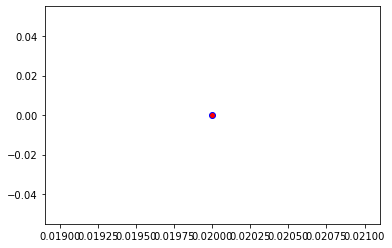

Crafting adversarial images took: 8.67310619354248 seconds 

Images classified as:
000000545007 442 = bell cote
000000545100 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


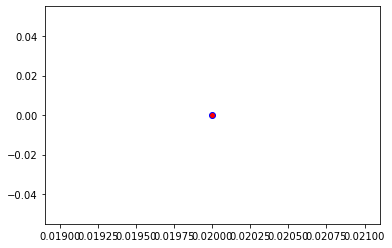

Crafting adversarial images took: 7.683191299438477 seconds 

Images classified as:
000000545129 340 = zebra
000000545219 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


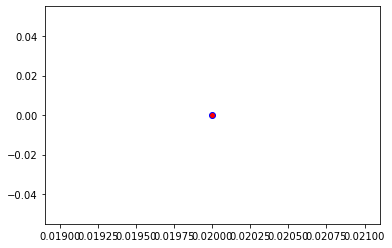

Crafting adversarial images took: 7.931344032287598 seconds 

Images classified as:
000000545407 404 = airliner
000000545594 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


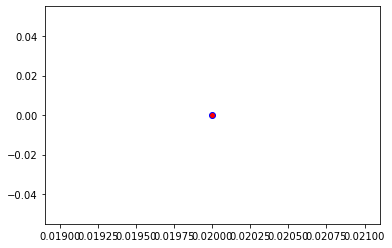

Crafting adversarial images took: 7.885153293609619 seconds 

Images classified as:
000000545730 372 = baboon
000000545826 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


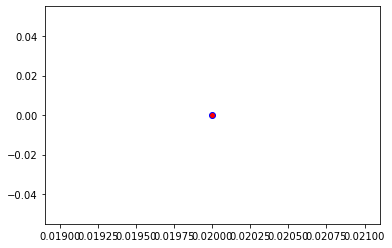

Crafting adversarial images took: 7.8084869384765625 seconds 

Images classified as:
000000545958 273 = dingo
000000546011 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


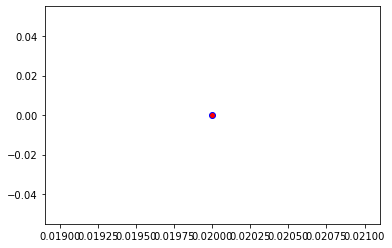

Crafting adversarial images took: 7.861796855926514 seconds 

Images classified as:
000000546219 762 = restaurant
000000546325 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


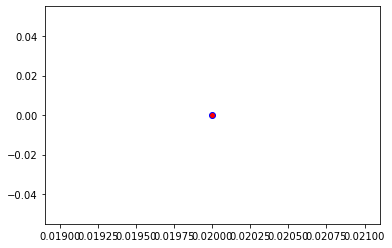

Crafting adversarial images took: 7.7982399463653564 seconds 

Images classified as:
000000546475 593 = harmonica
000000546556 99 = goose
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


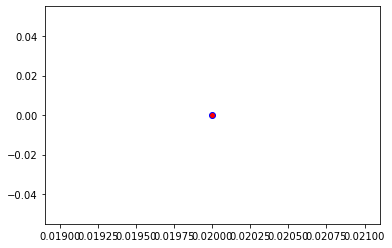

Crafting adversarial images took: 7.838683128356934 seconds 

Images classified as:
000000546626 647 = measuring cup
000000546659 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


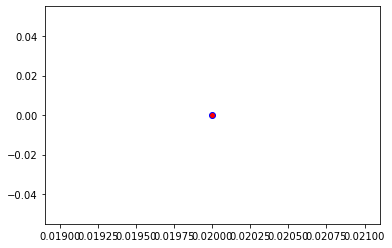

Crafting adversarial images took: 7.4048590660095215 seconds 

Images classified as:
000000546717 620 = laptop
000000546823 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


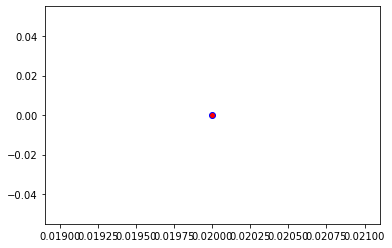

Crafting adversarial images took: 7.651837348937988 seconds 

Images classified as:
000000546826 473 = can opener
000000546829 258 = Samoyed
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


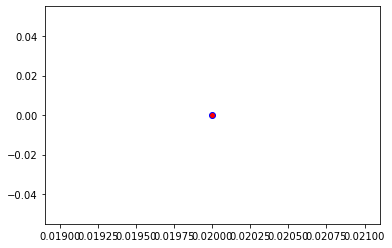

Crafting adversarial images took: 7.931504726409912 seconds 

Images classified as:
000000546964 831 = studio couch
000000546976 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


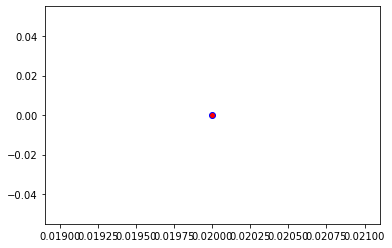

Crafting adversarial images took: 7.67357611656189 seconds 

Images classified as:
000000547144 526 = desk
000000547336 756 = rain barrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


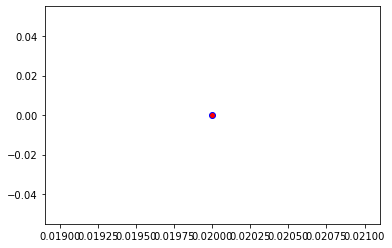

Crafting adversarial images took: 7.970781087875366 seconds 

Images classified as:
000000547383 5 = ram
000000547502 188 = wire-haired fox terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


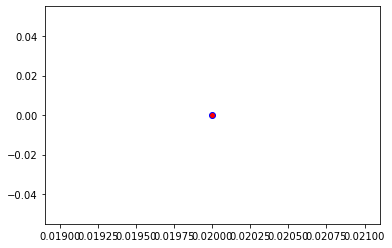

Crafting adversarial images took: 7.682480573654175 seconds 

Images classified as:
000000547519 294 = brown bear
000000547816 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


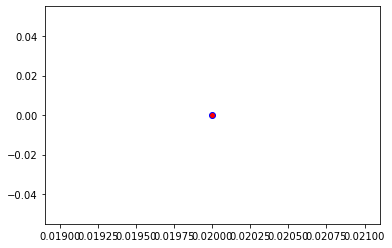

Crafting adversarial images took: 8.458591938018799 seconds 

Images classified as:
000000547854 963 = pizza
000000547886 354 = Arabian camel
Min values in image-array: 0.033481836 Max values in image-array: 255.0
Min values in image-array: 0.00013130132 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


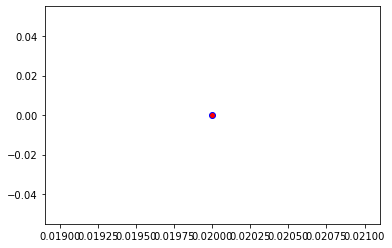

Crafting adversarial images took: 8.127123594284058 seconds 

Images classified as:
000000548246 752 = racket
000000548267 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


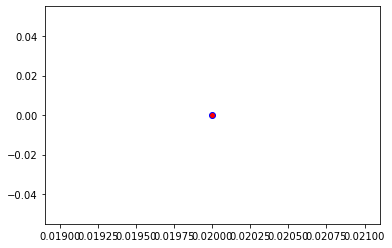

Crafting adversarial images took: 7.614076614379883 seconds 

Images classified as:
000000548339 429 = baseball
000000548506 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


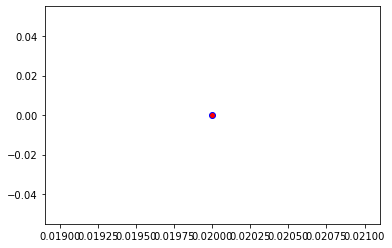

Crafting adversarial images took: 7.562170028686523 seconds 

Images classified as:
000000548524 977 = sandbar
000000548555 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


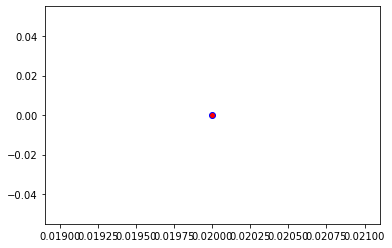

Crafting adversarial images took: 8.15663456916809 seconds 

Images classified as:
000000548780 573 = go-kart
000000549055 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


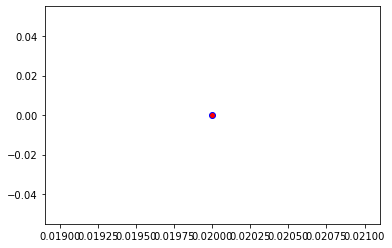

Crafting adversarial images took: 7.788991689682007 seconds 

Images classified as:
000000549136 358 = pole
000000549167 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


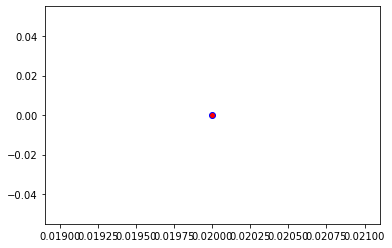

Crafting adversarial images took: 7.8476433753967285 seconds 

Images classified as:
000000549220 273 = dingo
000000549390 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


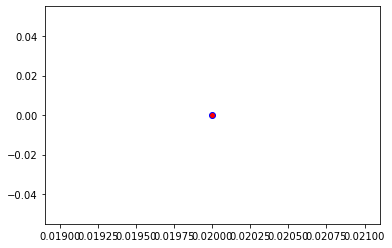

Crafting adversarial images took: 7.7667601108551025 seconds 

Images classified as:
000000549674 527 = desktop computer
000000549738 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


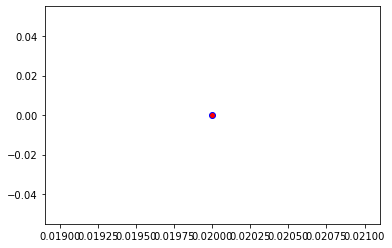

Crafting adversarial images took: 7.686983823776245 seconds 

Images classified as:
000000549930 879 = umbrella
000000550084 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.13716
Min values in image-array: 0.0 Max values in image-array: 0.9966163
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


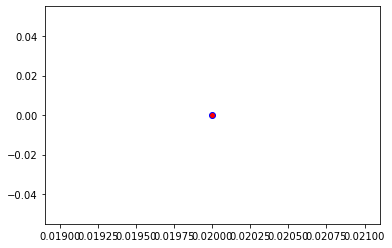

Crafting adversarial images took: 7.58341908454895 seconds 

Images classified as:
000000550322 618 = ladle
000000550349 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


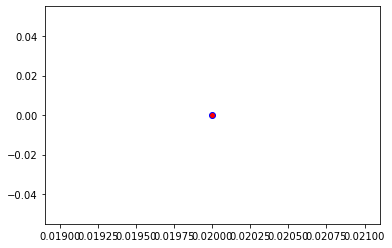

Crafting adversarial images took: 7.879297733306885 seconds 

Images classified as:
000000550426 883 = vase
000000550471 925 = consomme
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


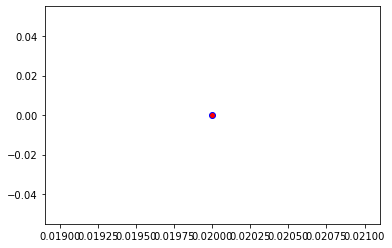

Crafting adversarial images took: 7.706340312957764 seconds 

Images classified as:
000000550691 874 = trolleybus
000000550714 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


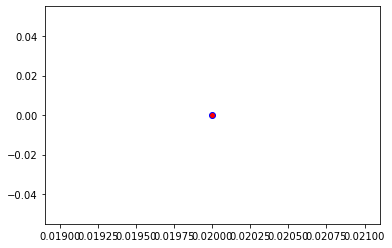

Crafting adversarial images took: 7.9562764167785645 seconds 

Images classified as:
000000550797 861 = toilet seat
000000550939 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.92413
Min values in image-array: 0.0 Max values in image-array: 0.9997025
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


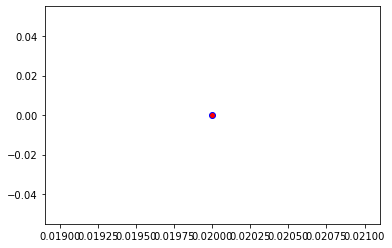

Crafting adversarial images took: 7.673844814300537 seconds 

Images classified as:
000000551215 752 = racket
000000551304 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


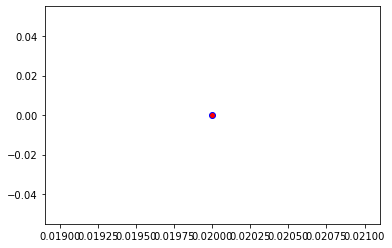

Crafting adversarial images took: 7.541818380355835 seconds 

Images classified as:
000000551350 703 = park bench
000000551439 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


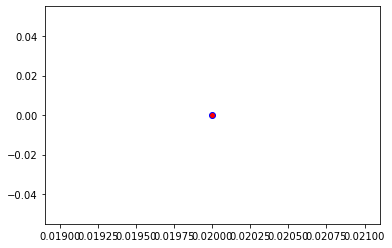

Crafting adversarial images took: 8.818162679672241 seconds 

Images classified as:
000000551660 937 = broccoli
000000551780 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


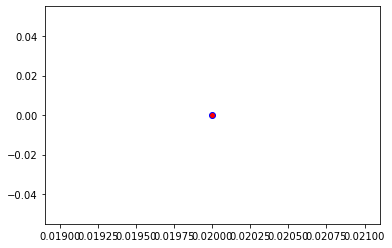

Crafting adversarial images took: 7.87936806678772 seconds 

Images classified as:
000000551794 500 = cliff
000000551804 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


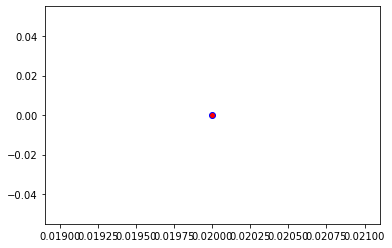

Crafting adversarial images took: 7.998337984085083 seconds 

Images classified as:
000000551815 282 = tiger cat
000000551820 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


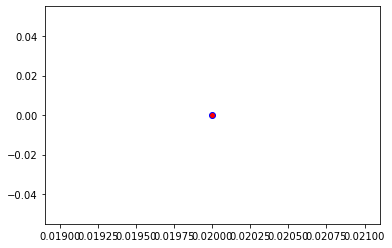

Crafting adversarial images took: 7.994982719421387 seconds 

Images classified as:
000000551822 461 = plate
000000552371 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


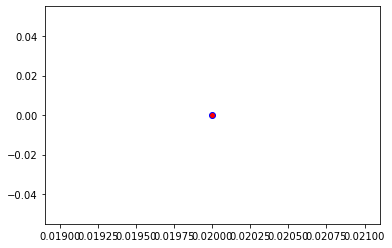

Crafting adversarial images took: 7.927627325057983 seconds 

Images classified as:
000000552612 347 = bison
000000552775 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


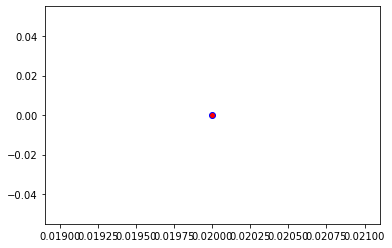

Crafting adversarial images took: 7.486208200454712 seconds 

Images classified as:
000000552842 981 = ballplayer
000000552883 648 = medicine chest
Min values in image-array: 0.95485157 Max values in image-array: 255.0
Min values in image-array: 0.003744516 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


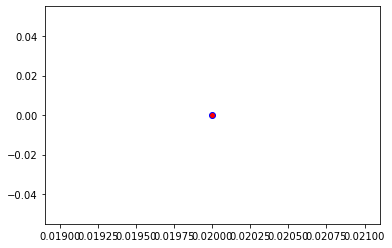

Crafting adversarial images took: 7.794829368591309 seconds 

Images classified as:
000000552902 340 = zebra
000000553094 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.5], dtype=float32)>)


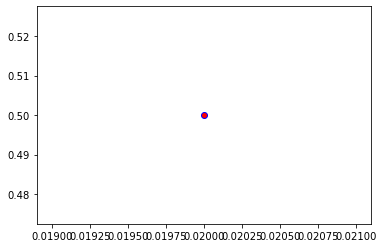

Crafting adversarial images took: 7.905765533447266 seconds 

Images classified as:
000000553221 701 = parachute
000000553339 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.90181
Min values in image-array: 0.0 Max values in image-array: 0.99961495
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


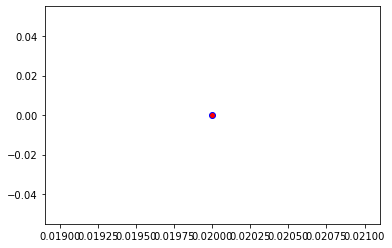

Crafting adversarial images took: 7.89905309677124 seconds 

Images classified as:
000000553511 919 = street sign
000000553664 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


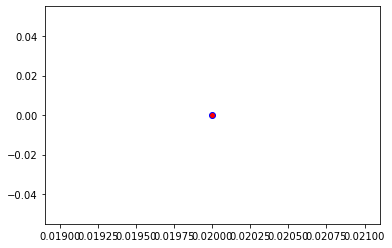

Crafting adversarial images took: 7.806520700454712 seconds 

Images classified as:
000000553669 703 = park bench
000000553731 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


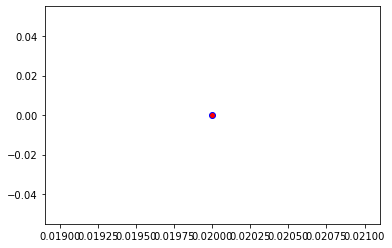

Crafting adversarial images took: 7.728399753570557 seconds 

Images classified as:
000000553776 802 = snowmobile
000000553788 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 254.8884
Min values in image-array: 0.0 Max values in image-array: 0.9995623
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


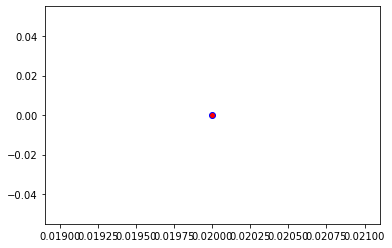

Crafting adversarial images took: 7.576146125793457 seconds 

Images classified as:
000000553990 339 = sorrel
000000554002 233 = Bouvier des Flandres
Min values in image-array: 1.353119 Max values in image-array: 255.0
Min values in image-array: 0.005306349 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


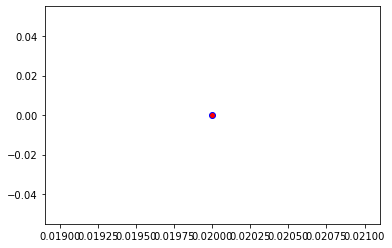

Crafting adversarial images took: 7.633980989456177 seconds 

Images classified as:
000000554156 752 = racket
000000554266 887 = vestment
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


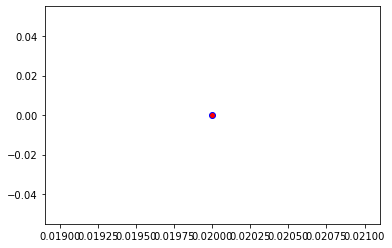

Crafting adversarial images took: 7.867011785507202 seconds 

Images classified as:
000000554291 674 = mousetrap
000000554328 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


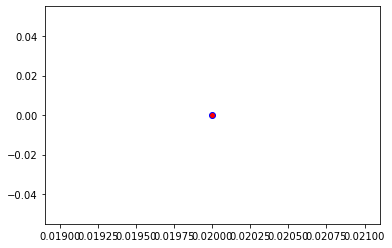

Crafting adversarial images took: 8.062694549560547 seconds 

Images classified as:
000000554579 260 = chow
000000554595 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


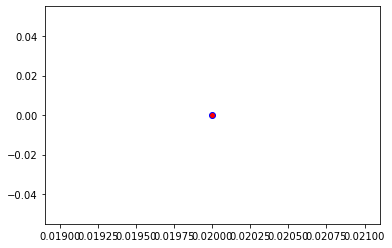

Crafting adversarial images took: 8.434848546981812 seconds 

Images classified as:
000000554735 963 = pizza
000000554838 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


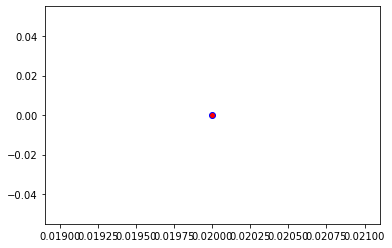

Crafting adversarial images took: 7.757693767547607 seconds 

Images classified as:
000000555005 116 = cradle
000000555009 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


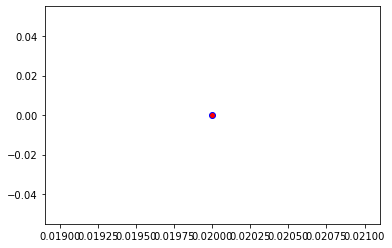

Crafting adversarial images took: 7.9385106563568115 seconds 

Images classified as:
000000555012 435 = bathtub
000000555050 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


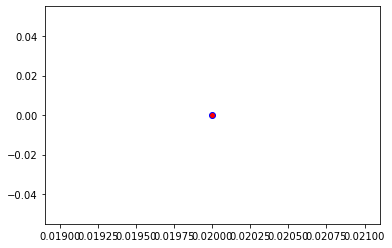

Crafting adversarial images took: 7.802019834518433 seconds 

Images classified as:
000000555412 934 = hotdog
000000555597 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


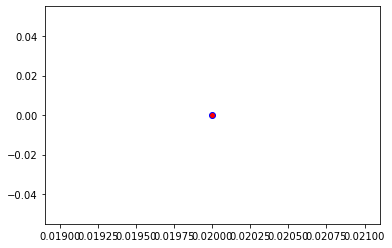

Crafting adversarial images took: 7.472405672073364 seconds 

Images classified as:
000000555705 287 = lynx
000000555972 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


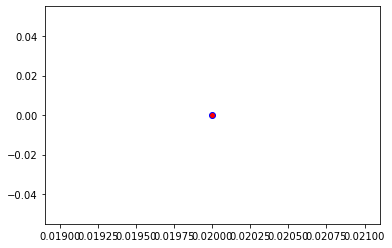

Crafting adversarial images took: 7.913642644882202 seconds 

Images classified as:
000000556000 523 = crutch
000000556158 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


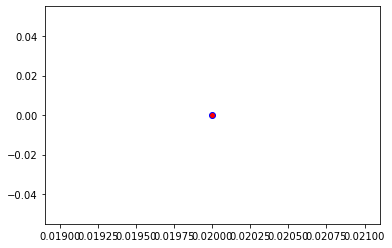

Crafting adversarial images took: 7.961382865905762 seconds 

Images classified as:
000000556193 639 = suit
000000556498 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


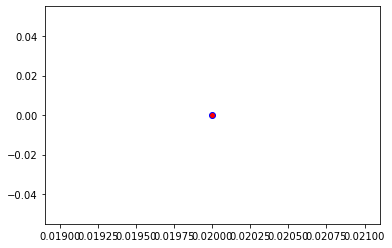

Crafting adversarial images took: 7.776724338531494 seconds 

Images classified as:
000000556765 385 = Indian elephant
000000556873 470 = candle
Min values in image-array: 0.003348112 Max values in image-array: 255.0
Min values in image-array: 1.3129851e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


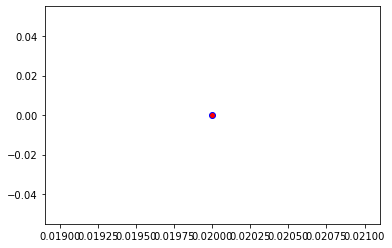

Crafting adversarial images took: 7.961797475814819 seconds 

Images classified as:
000000557172 896 = washbasin
000000557258 861 = toilet seat
Min values in image-array: 0.35705566 Max values in image-array: 255.0
Min values in image-array: 0.0014002183 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


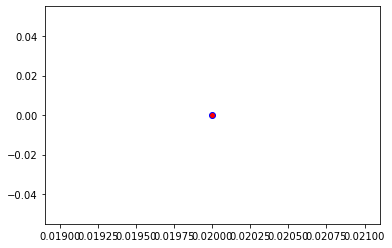

Crafting adversarial images took: 7.802343130111694 seconds 

Images classified as:
000000557501 713 = photocopier
000000557672 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


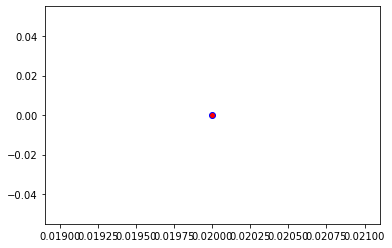

Crafting adversarial images took: 7.321010112762451 seconds 

Images classified as:
000000557884 313 = walking stick
000000557916 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


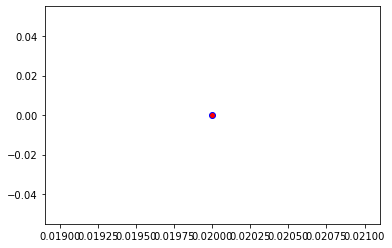

Crafting adversarial images took: 7.650617599487305 seconds 

Images classified as:
000000558073 435 = tub
000000558114 430 = basketball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


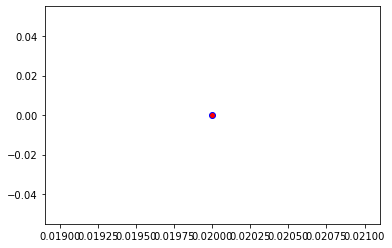

Crafting adversarial images took: 7.986018419265747 seconds 

Images classified as:
000000558213 880 = unicycle
000000558421 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


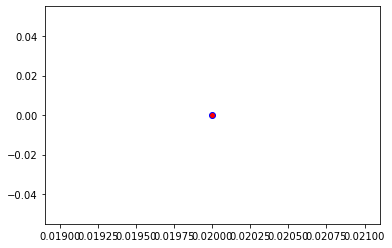

Crafting adversarial images took: 7.942332983016968 seconds 

Images classified as:
000000558558 818 = spotlight
000000558854 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


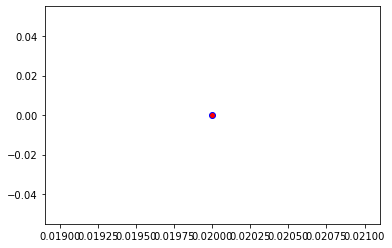

Crafting adversarial images took: 9.042041778564453 seconds 

Images classified as:
000000559099 346 = water buffalo
000000559160 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 254.94257
Min values in image-array: 0.0 Max values in image-array: 0.99977475
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


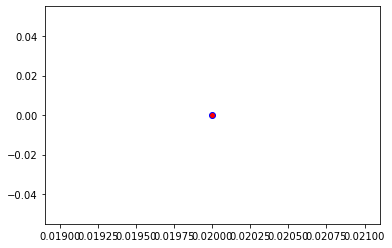

Crafting adversarial images took: 7.803143739700317 seconds 

Images classified as:
000000559348 981 = ballplayer
000000559513 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


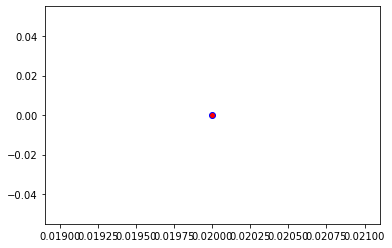

Crafting adversarial images took: 7.417107105255127 seconds 

Images classified as:
000000559543 731 = plunger
000000559547 715 = pickelhaube
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


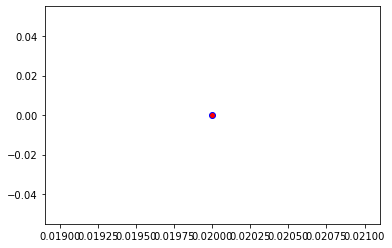

Crafting adversarial images took: 7.85059380531311 seconds 

Images classified as:
000000559707 937 = broccoli
000000559842 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


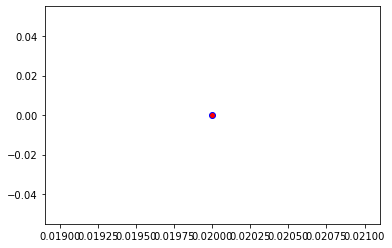

Crafting adversarial images took: 8.092799186706543 seconds 

Images classified as:
000000559956 355 = llama
000000560011 508 = computer keyboard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


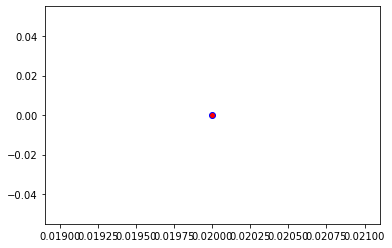

Crafting adversarial images took: 8.123387098312378 seconds 

Images classified as:
000000560178 952 = fig
000000560256 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


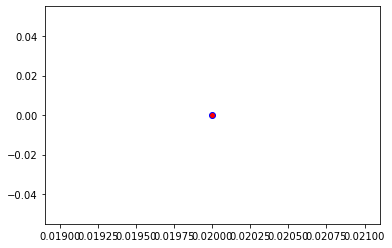

Crafting adversarial images took: 7.8540966510772705 seconds 

Images classified as:
000000560266 294 = brown bear
000000560279 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


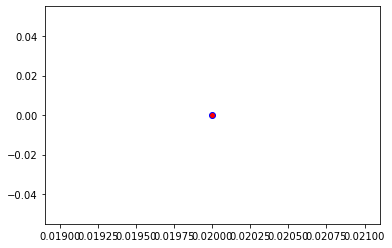

Crafting adversarial images took: 7.752666711807251 seconds 

Images classified as:
000000560312 789 = shoji
000000560371 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


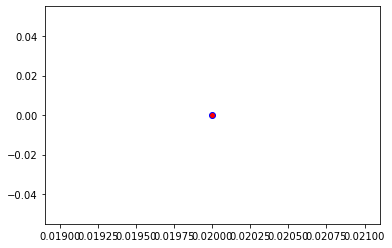

Crafting adversarial images took: 7.834571599960327 seconds 

Images classified as:
000000560474 582 = grocery store
000000560880 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


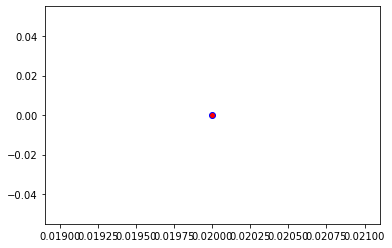

Crafting adversarial images took: 7.726562738418579 seconds 

Images classified as:
000000560911 697 = pajama
000000561009 91 = coucal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


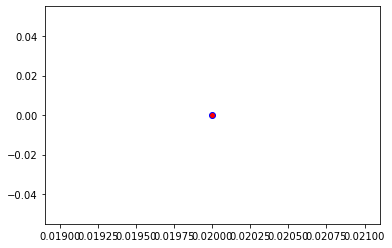

Crafting adversarial images took: 7.909405469894409 seconds 

Images classified as:
000000561223 842 = swimming trunks
000000561256 411 = apron
Min values in image-array: 1.5918878 Max values in image-array: 255.0
Min values in image-array: 0.0062426976 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


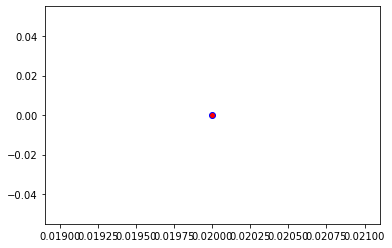

Crafting adversarial images took: 7.647237062454224 seconds 

Images classified as:
000000561335 472 = canoe
000000561366 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


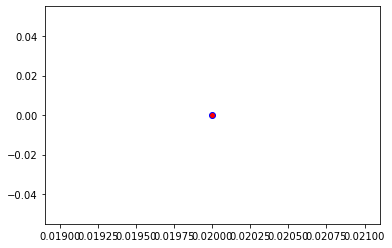

Crafting adversarial images took: 7.720560073852539 seconds 

Images classified as:
000000561465 962 = meat loaf
000000561679 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


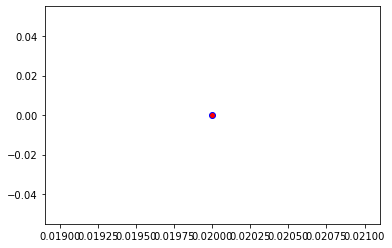

Crafting adversarial images took: 7.657465934753418 seconds 

Images classified as:
000000561889 935 = mashed potato
000000561958 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


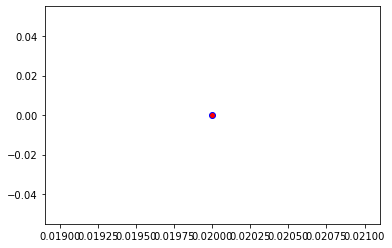

Crafting adversarial images took: 7.957637071609497 seconds 

Images classified as:
000000562059 930 = French loaf
000000562121 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


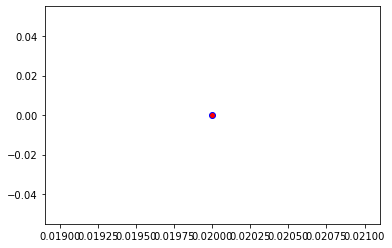

Crafting adversarial images took: 8.49660325050354 seconds 

Images classified as:
000000562197 924 = guacamole
000000562207 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


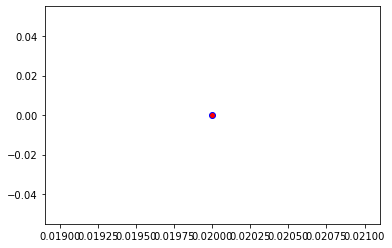

Crafting adversarial images took: 7.565838575363159 seconds 

Images classified as:
000000562229 792 = shovel
000000562243 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


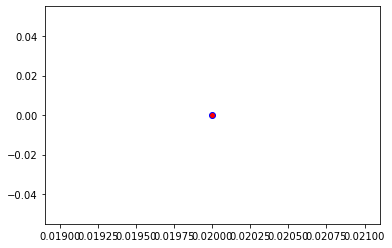

Crafting adversarial images took: 7.762758731842041 seconds 

Images classified as:
000000562443 340 = zebra
000000562448 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.5], dtype=float32)>)


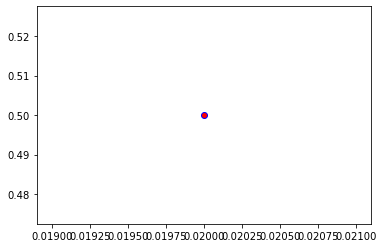

Crafting adversarial images took: 7.788890361785889 seconds 

Images classified as:
000000562561 151 = Chihuahua
000000562581 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


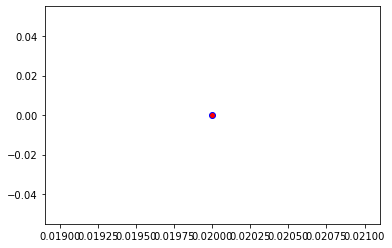

Crafting adversarial images took: 7.87299370765686 seconds 

Images classified as:
000000562818 140 = alp
000000562843 504 = coffee mug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


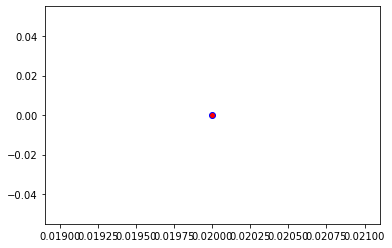

Crafting adversarial images took: 8.016199111938477 seconds 

Images classified as:
000000563267 788 = shoe shop
000000563281 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


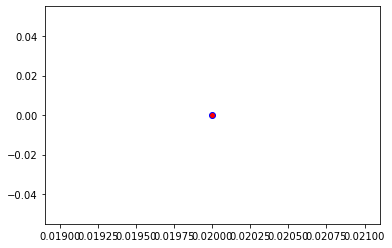

Crafting adversarial images took: 7.629130125045776 seconds 

Images classified as:
000000563349 701 = parachute
000000563470 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 254.63281
Min values in image-array: 0.0 Max values in image-array: 0.9985601
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


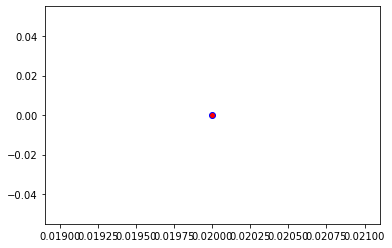

Crafting adversarial images took: 7.925645589828491 seconds 

Images classified as:
000000563603 176 = gazelle
000000563604 561 = forklift
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


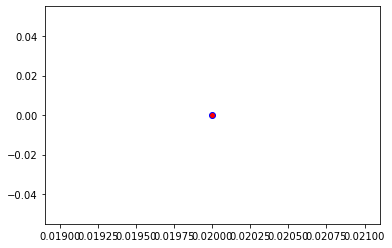

Crafting adversarial images took: 7.646971702575684 seconds 

Images classified as:
000000563648 882 = vacuum
000000563653 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


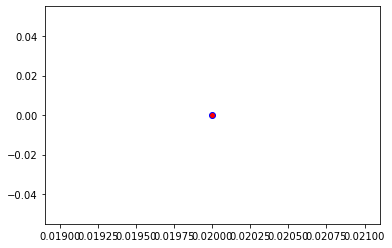

Crafting adversarial images took: 7.651092529296875 seconds 

Images classified as:
000000563702 555 = fire engine
000000563758 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


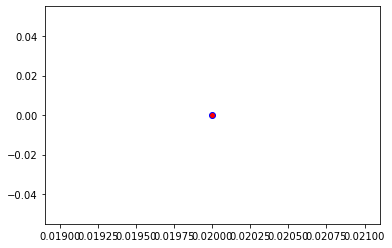

Crafting adversarial images took: 7.654639482498169 seconds 

Images classified as:
000000563882 424 = barbershop
000000564023 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


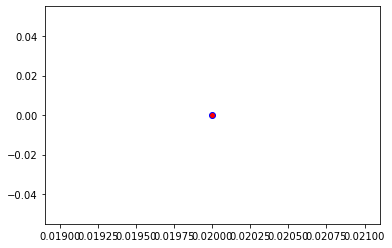

Crafting adversarial images took: 7.621589660644531 seconds 

Images classified as:
000000564091 611 = jigsaw puzzle
000000564127 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


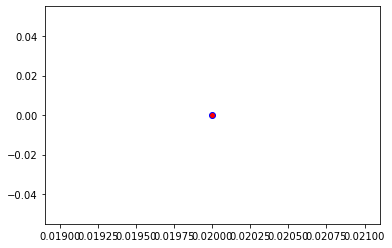

Crafting adversarial images took: 7.8176960945129395 seconds 

Images classified as:
000000564133 101 = tusker
000000564280 246 = Great Dane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


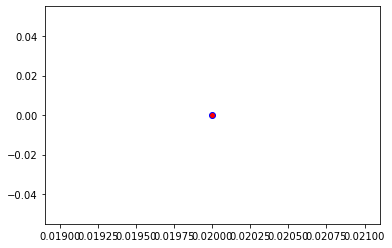

Crafting adversarial images took: 7.78830885887146 seconds 

Images classified as:
000000564336 762 = restaurant
000000565012 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


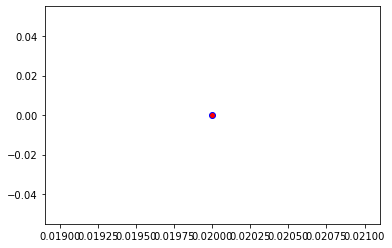

Crafting adversarial images took: 8.855855941772461 seconds 

Images classified as:
000000565045 894 = wardrobe
000000565153 637 = mailbox
Min values in image-array: 1.2225541 Max values in image-array: 255.0
Min values in image-array: 0.00479433 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


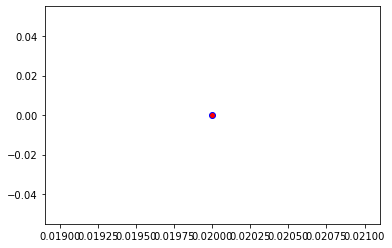

Crafting adversarial images took: 7.574069976806641 seconds 

Images classified as:
000000565391 609 = jeep
000000565469 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


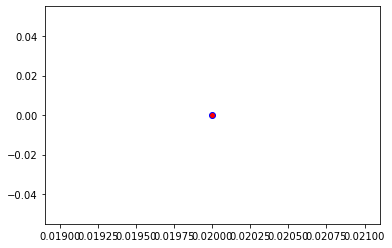

Crafting adversarial images took: 7.741452217102051 seconds 

Images classified as:
000000565563 704 = parking meter
000000565597 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


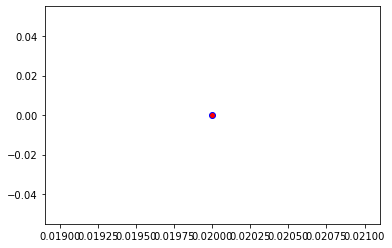

Crafting adversarial images took: 7.949337959289551 seconds 

Images classified as:
000000565607 984 = rapeseed
000000565624 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


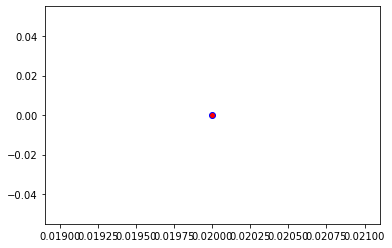

Crafting adversarial images took: 7.848426342010498 seconds 

Images classified as:
000000565776 729 = plate rack
000000565778 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


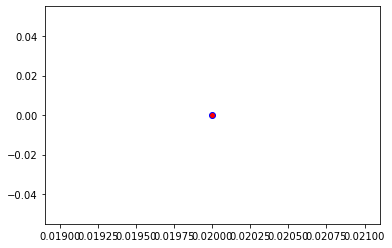

Crafting adversarial images took: 7.767786026000977 seconds 

Images classified as:
000000565853 598 = home theater
000000565877 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 254.97404
Min values in image-array: 0.0 Max values in image-array: 0.9998982
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


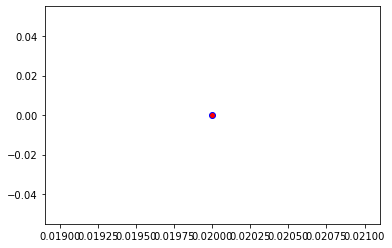

Crafting adversarial images took: 7.814543008804321 seconds 

Images classified as:
000000565962 223 = schipperke
000000565989 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


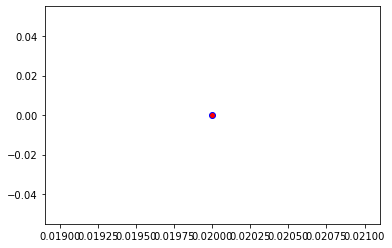

Crafting adversarial images took: 7.633960247039795 seconds 

Images classified as:
000000566042 275 = hyena
000000566282 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


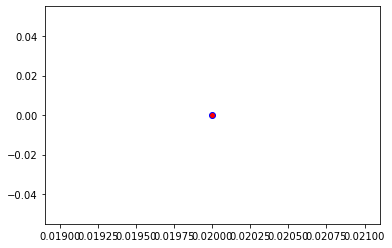

Crafting adversarial images took: 7.840296745300293 seconds 

Images classified as:
000000566436 703 = park bench
000000566524 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


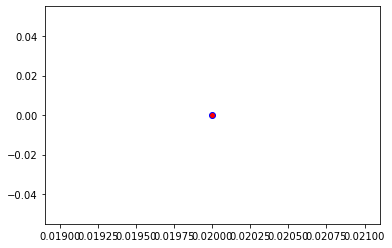

Crafting adversarial images took: 7.76683783531189 seconds 

Images classified as:
000000566758 779 = school bus
000000566923 394 = sturgeon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


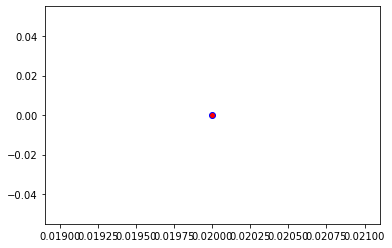

Crafting adversarial images took: 7.976917505264282 seconds 

Images classified as:
000000567011 693 = paddle
000000567197 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 254.96268
Min values in image-array: 0.0 Max values in image-array: 0.9998536
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


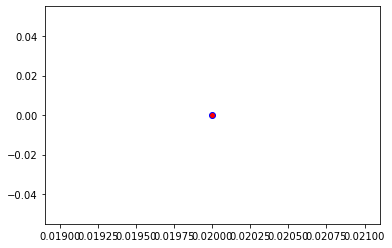

Crafting adversarial images took: 7.678443193435669 seconds 

Images classified as:
000000567432 404 = airliner
000000567640 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


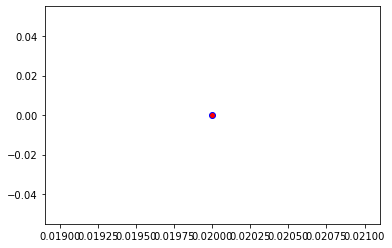

Crafting adversarial images took: 7.858525276184082 seconds 

Images classified as:
000000567740 248 = ski
000000567825 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


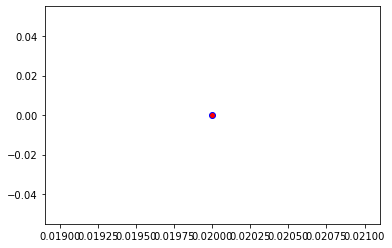

Crafting adversarial images took: 7.668172121047974 seconds 

Images classified as:
000000567886 203 = West Highland white terrier
000000567898 712 = Petri dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


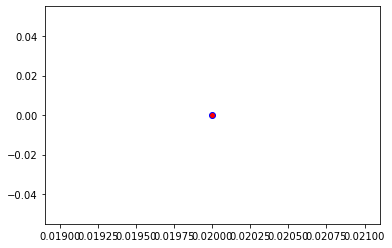

Crafting adversarial images took: 7.587773561477661 seconds 

Images classified as:
000000568147 704 = parking meter
000000568195 659 = mixing bowl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


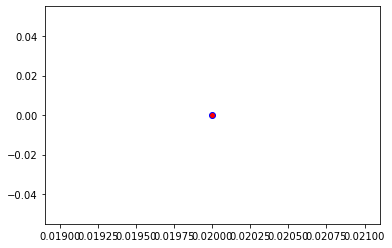

Crafting adversarial images took: 8.847481489181519 seconds 

Images classified as:
000000568213 805 = soccer ball
000000568290 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


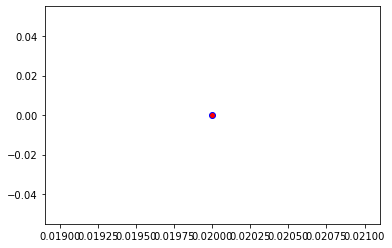

Crafting adversarial images took: 7.654276609420776 seconds 

Images classified as:
000000568439 874 = trolleybus
000000568584 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


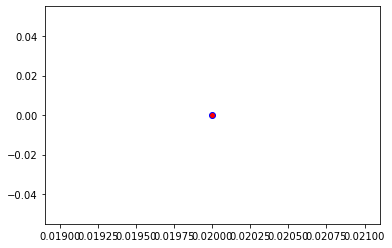

Crafting adversarial images took: 7.813394546508789 seconds 

Images classified as:
000000568690 861 = toilet seat
000000568710 556 = fire screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


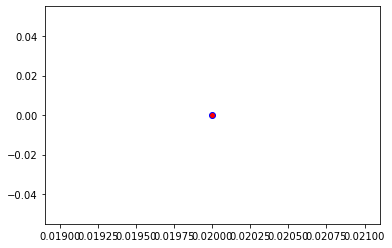

Crafting adversarial images took: 7.815972805023193 seconds 

Images classified as:
000000568814 465 = bulletproof vest
000000568981 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


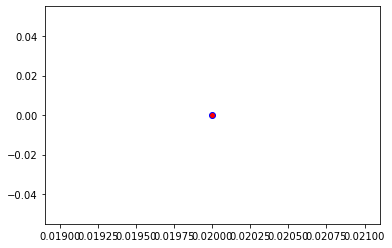

Crafting adversarial images took: 7.658064365386963 seconds 

Images classified as:
000000569030 703 = park bench
000000569059 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


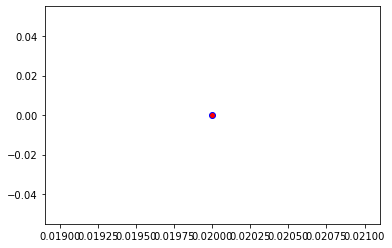

Crafting adversarial images took: 7.685438871383667 seconds 

Images classified as:
000000569273 437 = beacon
000000569565 134 = crane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


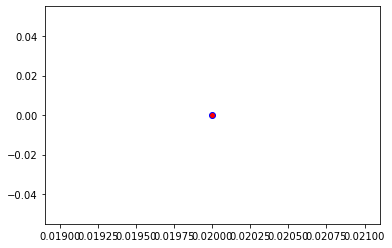

Crafting adversarial images took: 7.794313430786133 seconds 

Images classified as:
000000569700 883 = vase
000000569825 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


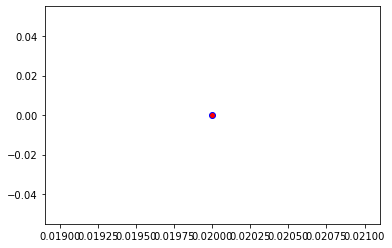

Crafting adversarial images took: 7.8633482456207275 seconds 

Images classified as:
000000569917 896 = washbasin
000000569972 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


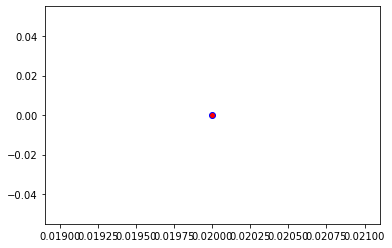

Crafting adversarial images took: 7.6694254875183105 seconds 

Images classified as:
000000569976 642 = marimba
000000570169 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


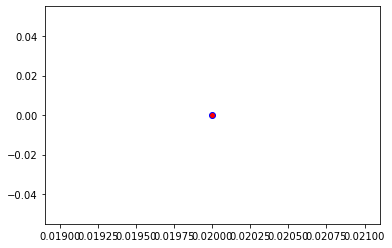

Crafting adversarial images took: 7.8333423137664795 seconds 

Images classified as:
000000570448 978 = seashore
000000570456 532 = dining table
Min values in image-array: 0.08609904 Max values in image-array: 255.0
Min values in image-array: 0.00033764332 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


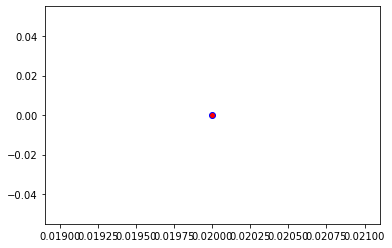

Crafting adversarial images took: 7.600114345550537 seconds 

Images classified as:
000000570471 961 = dough
000000570539 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


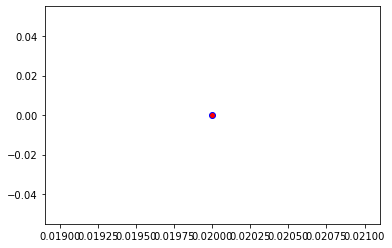

Crafting adversarial images took: 7.722315311431885 seconds 

Images classified as:
000000570664 282 = tiger cat
000000570688 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


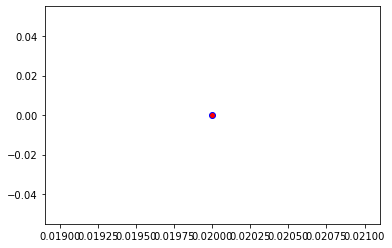

Crafting adversarial images took: 7.830506324768066 seconds 

Images classified as:
000000570736 435 = bathtub
000000570756 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


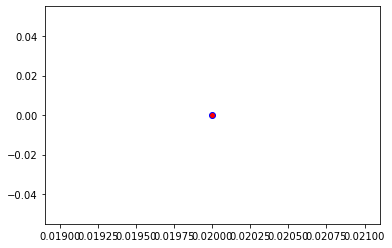

Crafting adversarial images took: 7.764116525650024 seconds 

Images classified as:
000000570782 526 = desk
000000570834 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


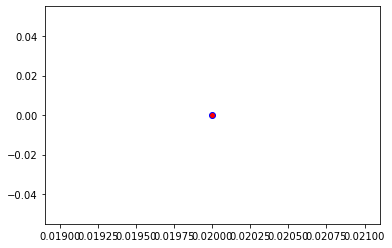

Crafting adversarial images took: 8.150010108947754 seconds 

Images classified as:
000000571008 919 = street sign
000000571264 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


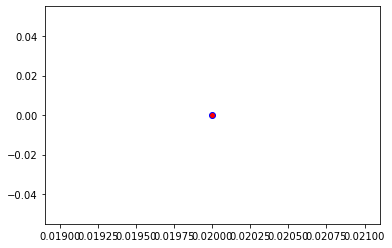

Crafting adversarial images took: 8.232599973678589 seconds 

Images classified as:
000000571313 526 = desk
000000571598 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


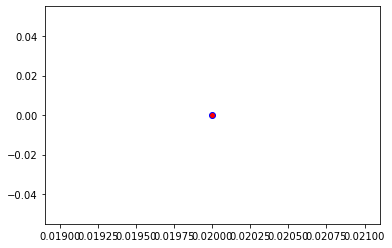

Crafting adversarial images took: 7.540083646774292 seconds 

Images classified as:
000000571718 954 = banana
000000571804 659 = mixing bowl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


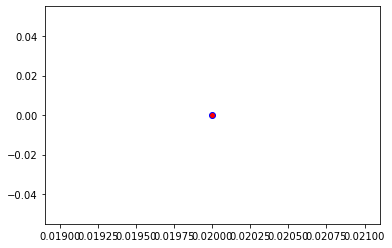

Crafting adversarial images took: 7.635993719100952 seconds 

Images classified as:
000000571857 977 = sandbar
000000571893 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


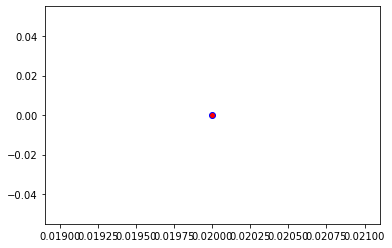

Crafting adversarial images took: 7.7844460010528564 seconds 

Images classified as:
000000571943 920 = traffic light
000000572303 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


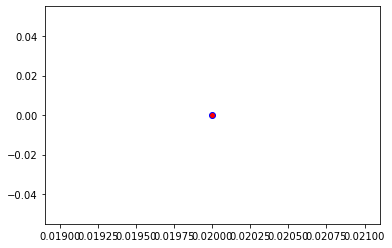

Crafting adversarial images took: 8.04919958114624 seconds 

Images classified as:
000000572388 223 = schipperke
000000572408 226 = briard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


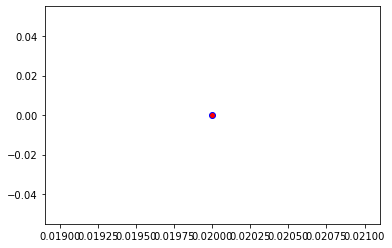

Crafting adversarial images took: 7.812762022018433 seconds 

Images classified as:
000000572462 654 = minibus
000000572517 296 = ice bear
Min values in image-array: 0.07016649 Max values in image-array: 255.0
Min values in image-array: 0.00027516272 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


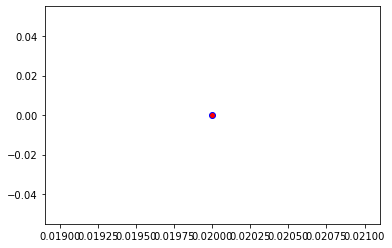

Crafting adversarial images took: 7.677457571029663 seconds 

Images classified as:
000000572555 547 = electric locomotive
000000572620 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


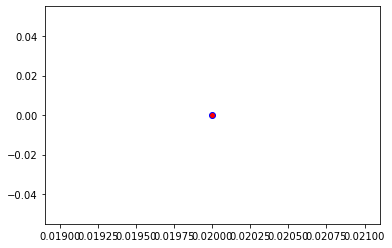

Crafting adversarial images took: 7.6597113609313965 seconds 

Images classified as:
000000572678 532 = dining table
000000572900 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


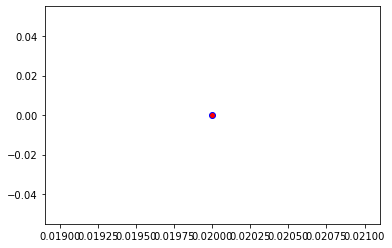

Crafting adversarial images took: 7.730820417404175 seconds 

Images classified as:
000000572956 670 = motor scooter
000000573008 554 = fireboat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


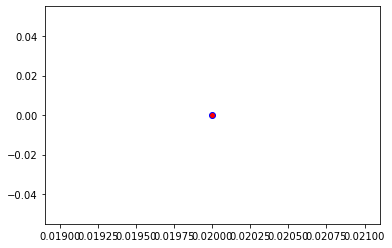

Crafting adversarial images took: 7.6317431926727295 seconds 

Images classified as:
000000573094 548 = entertainment center
000000573258 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


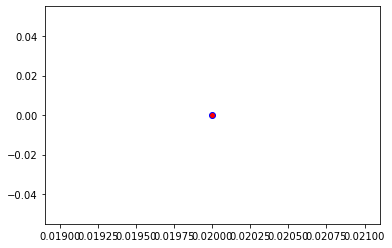

Crafting adversarial images took: 7.763274908065796 seconds 

Images classified as:
000000573391 342 = wild boar
000000573626 979 = valley
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


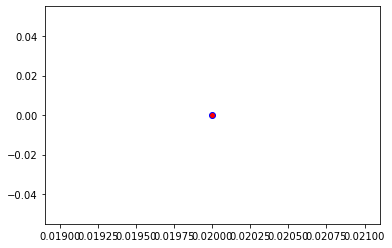

Crafting adversarial images took: 7.6807942390441895 seconds 

Images classified as:
000000573943 417 = balloon
000000574297 339 = sorrel
Min values in image-array: 0.23324394 Max values in image-array: 255.0
Min values in image-array: 0.0009146821 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


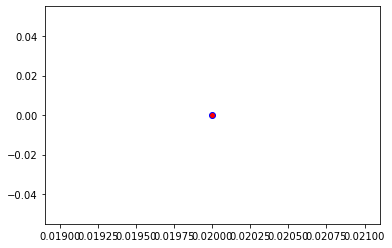

Crafting adversarial images took: 7.765707015991211 seconds 

Images classified as:
000000574315 681 = notebook
000000574425 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


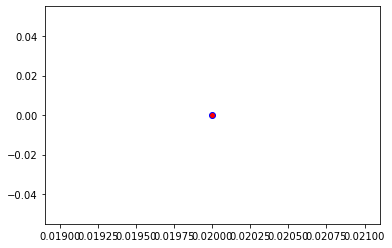

Crafting adversarial images took: 7.84486722946167 seconds 

Images classified as:
000000574520 693 = paddle
000000574702 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


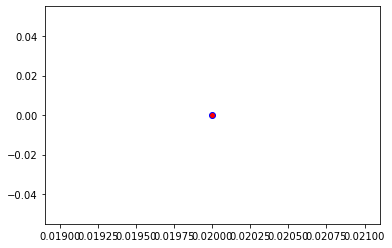

Crafting adversarial images took: 8.712512254714966 seconds 

Images classified as:
000000574810 283 = Persian cat
000000574823 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


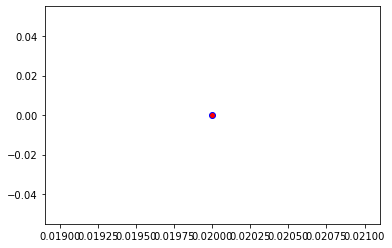

Crafting adversarial images took: 7.746948480606079 seconds 

Images classified as:
000000575081 697 = pajama
000000575187 904 = window screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


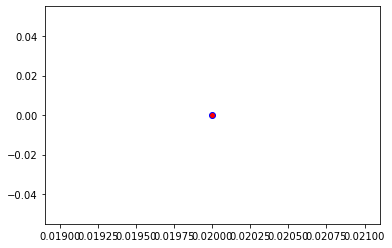

Crafting adversarial images took: 7.699899435043335 seconds 

Images classified as:
000000575205 318 = wing
000000575243 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


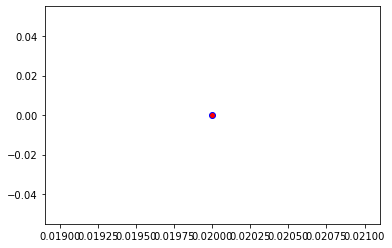

Crafting adversarial images took: 7.629306077957153 seconds 

Images classified as:
000000575357 213 = Irish setter
000000575372 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 254.37718
Min values in image-array: 0.0 Max values in image-array: 0.9975576
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


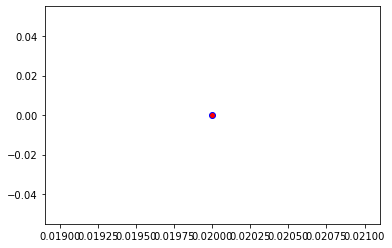

Crafting adversarial images took: 7.912830114364624 seconds 

Images classified as:
000000575500 954 = banana
000000575815 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


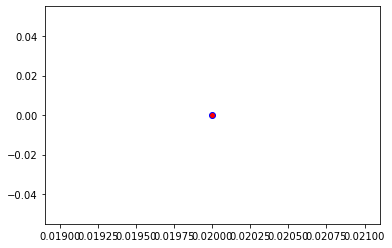

Crafting adversarial images took: 7.854243993759155 seconds 

Images classified as:
000000575970 532 = dining table
000000576031 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


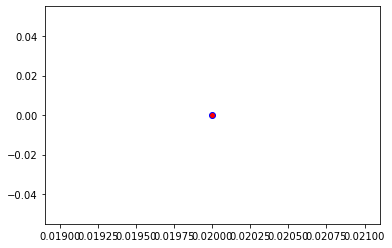

Crafting adversarial images took: 7.891296863555908 seconds 

Images classified as:
000000576052 140 = alp
000000576566 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


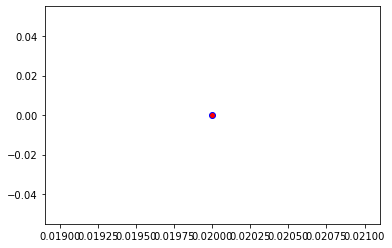

Crafting adversarial images took: 7.782474756240845 seconds 

Images classified as:
000000576654 701 = parachute
000000576955 562 = fountain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


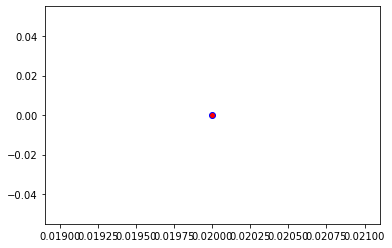

Crafting adversarial images took: 7.829526901245117 seconds 

Images classified as:
000000577149 340 = zebra
000000577182 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 254.74554
Min values in image-array: 0.0 Max values in image-array: 0.99900216
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


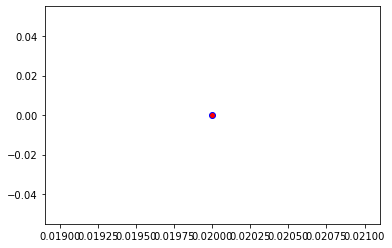

Crafting adversarial images took: 7.509753942489624 seconds 

Images classified as:
000000577539 928 = ice cream
000000577584 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


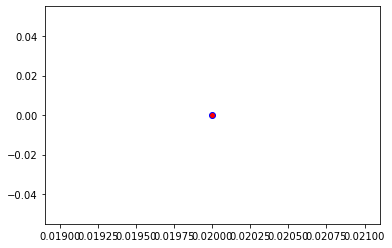

Crafting adversarial images took: 7.8643553256988525 seconds 

Images classified as:
000000577735 28 = pot
000000577862 172 = whippet
Min values in image-array: 0.0 Max values in image-array: 254.71436
Min values in image-array: 0.0 Max values in image-array: 0.99887985
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


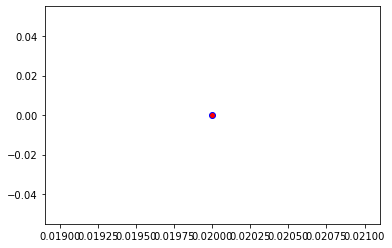

Crafting adversarial images took: 7.752394199371338 seconds 

Images classified as:
000000577864 429 = baseball
000000577932 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


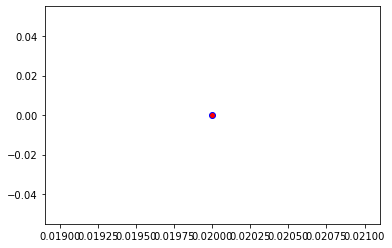

Crafting adversarial images took: 7.806602478027344 seconds 

Images classified as:
000000577959 977 = sandbar
000000577976 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 253.17407
Min values in image-array: 0.0 Max values in image-array: 0.9928395
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


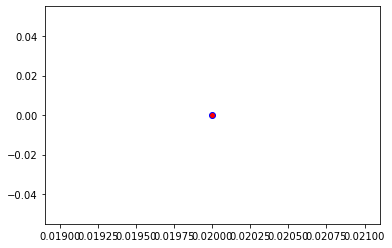

Crafting adversarial images took: 7.949812412261963 seconds 

Images classified as:
000000578093 705 = passenger car
000000578236 39 = common iguana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


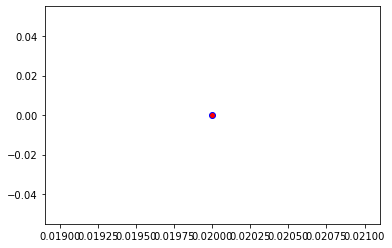

Crafting adversarial images took: 7.9526917934417725 seconds 

Images classified as:
000000578489 552 = feather boa
000000578500 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


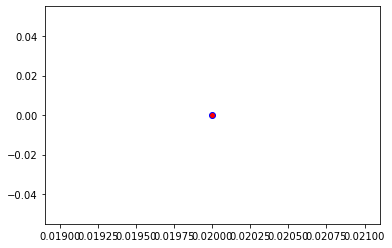

Crafting adversarial images took: 8.57835054397583 seconds 

Images classified as:
000000578545 620 = laptop
000000578792 518 = crash helmet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


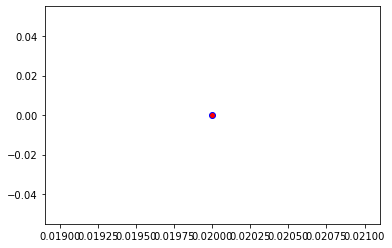

Crafting adversarial images took: 7.6429243087768555 seconds 

Images classified as:
000000578871 461 = plate
000000578922 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


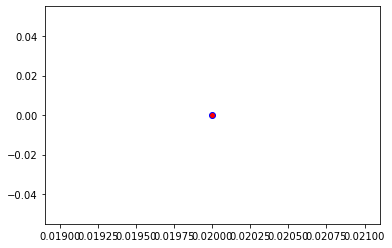

Crafting adversarial images took: 7.45352840423584 seconds 

Images classified as:
000000578967 705 = passenger car
000000579070 700 = paper towel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


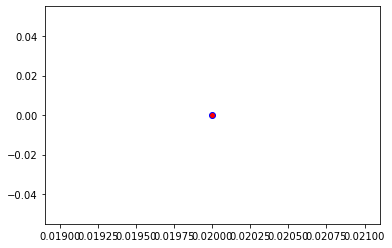

Crafting adversarial images took: 7.833378791809082 seconds 

Images classified as:
000000579091 937 = broccoli
000000579158 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


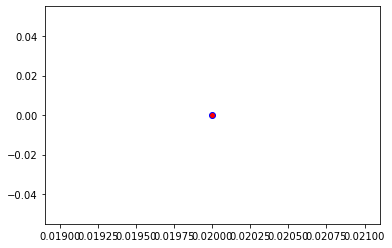

Crafting adversarial images took: 7.9731316566467285 seconds 

Images classified as:
000000579307 977 = sandbar
000000579321 201 = silky terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


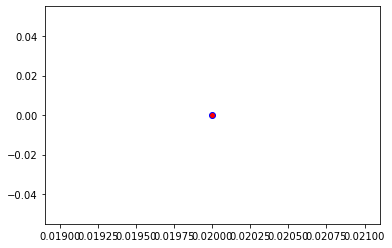

Crafting adversarial images took: 7.932300329208374 seconds 

Images classified as:
000000579635 460 = breakwater
000000579655 903 = wig
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


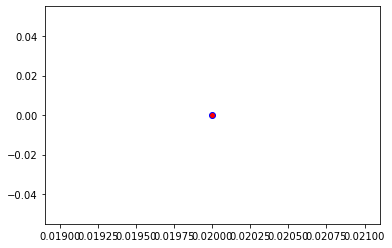

Crafting adversarial images took: 7.962448835372925 seconds 

Images classified as:
000000579818 565 = freight car
000000579893 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.6125
Min values in image-array: 0.0 Max values in image-array: 0.9984804
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


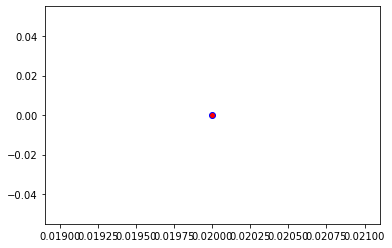

Crafting adversarial images took: 7.762126922607422 seconds 

Images classified as:
000000579900 963 = pizza
000000579902 518 = crash helmet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


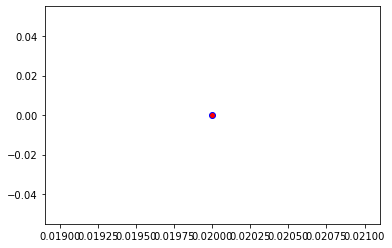

Crafting adversarial images took: 7.478348970413208 seconds 

Images classified as:
000000579970 789 = shoji
000000580197 457 = bow tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


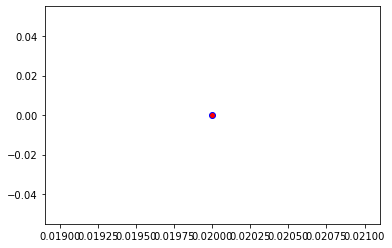

Crafting adversarial images took: 7.791015148162842 seconds 

Images classified as:
000000580294 813 = spatula
000000580410 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


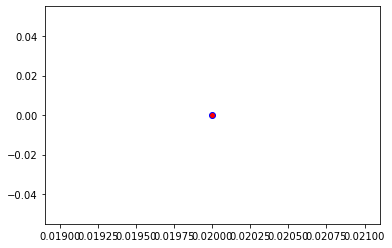

Crafting adversarial images took: 8.0183584690094 seconds 

Images classified as:
000000580418 690 = oxcart
000000580757 614 = kimono
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


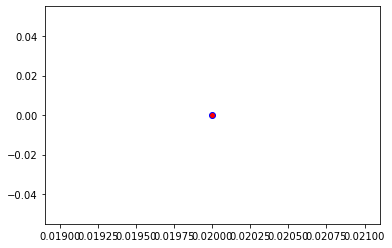

Crafting adversarial images took: 7.727614641189575 seconds 

Images classified as:
000000581062 977 = sandbar
000000581100 354 = Arabian camel
Min values in image-array: 2.431601 Max values in image-array: 255.0
Min values in image-array: 0.009535691 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


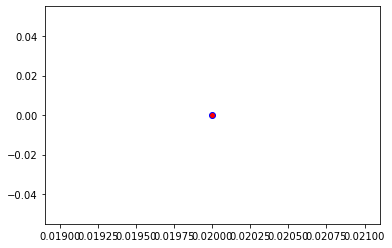

Crafting adversarial images took: 7.969396114349365 seconds 

Images classified as:
000000581206 934 = hotdog
000000581317 838 = sunscreen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


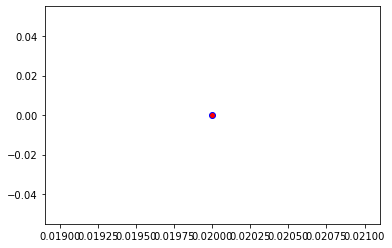

Crafting adversarial images took: 7.753281593322754 seconds 

Images classified as:
000000581357 248 = ski
000000581482 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


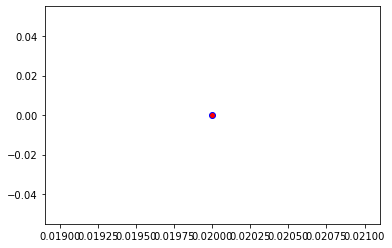

Crafting adversarial images took: 8.20638132095337 seconds 

Images classified as:
000000581615 861 = toilet seat
000000581781 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


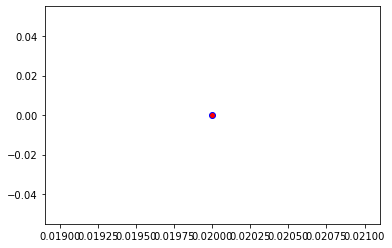

Crafting adversarial images took: 8.071255445480347 seconds 



In [20]:
# SET SIZE OF PATCH, ATTACK TYPE AND OUTPUT FOLDER OF ADVERSARIAL EXAMPLES

# divide files into successive n-sized chunks.
def divide_chunks(l, n):
    # looping till length l
    for i in range(0, len(l), n): 
        yield l[i:i + n]

# LOAD ORIGINAL IMAGES INTO BATCHES
list_images = glob.glob('datasets/coco_original/data/*.jpg')
# size of batches that are created from list of images
N = 2
batches = list(divide_chunks(list_images, N))

OUTPUT_FOLDER = "data"

# PROCESS IMAGES TO CORRECT FORMAT FOR CRAFTING ADVERSARIAL EXAMPLES WITH FOOLBOX
for batch in batches:
    own_images = [] #preprocessed images
    image_probabilities = []
    image_ids = []
    original_name = []

    for fname in batch:
        image_name = fname.split('data\\')[1]
        original_name.append(image_name.split('.jpg')[0])
        image_raw = tf.io.read_file(fname)
        image = tf.image.decode_image(image_raw)
        image = preprocess(image)
        own_images.append(image)
        image_probs = pretrained_model.predict(image)
        image_probabilities.append(image_probs)
# CHECK IF FILE ALREADY EXISTS THEN SKIP TO NEXT IMAGE
    if path.exists('{}/{}'.format(OUTPUT_FOLDER, image_name)):
        print('Adversarial file exists')
        continue
    print('Images classified as:')
    for x, y, name in zip(own_images, image_probabilities, original_name):
        _, image_class, class_confidence = get_imagenet_label(y)
        image_class = image_class.replace("_", " ")
        print(name, str(find_label_id(image_class)) + ' = ' + image_class) # if none error incurs later
        image_ids.append(find_label_id(image_class))

# PRINT VALUE OF PIXELS FOR CHECKING
    print('Min values in image-array: ' + str(np.amin(own_images)) + ' Max values in image-array: ' + str(np.amax(own_images)))
# CONVERT IMAGES AND CORRESPONDING LABELS FOR FOOLBOX APPROVED TYPE
    own_images_tf = []
    own_labels_tf = tf.convert_to_tensor(image_ids, dtype=tf.int32)
    for x in own_images.copy():
        a = tf.squeeze(x)
        a = a/255 # shift pixel values from [0,255] to [0,1] in order to create adversarial example
        own_images_tf.append(a)
    own_images_tf = tf.convert_to_tensor(own_images_tf, dtype=tf.float32)
# Prints values of pixels after processing
    print('Min values in image-array: ' + str(np.amin(own_images_tf)) + ' Max values in image-array: ' + str(np.amax(own_images_tf)))
# Testing that conversion works
    accuracy = fb.utils.accuracy(fmodel, own_images_tf, own_labels_tf)
    print('Model accuracy on own images:', accuracy)


    # INSTANTIATE THE CORRESPONDING ATTACK CLASS
    def attack_type(attack):
        if attack == 'LinfPGD':
            return fb.attacks.LinfProjectedGradientDescentAttack()
        elif attack == 'FGSM':
            return fb.attacks.LinfFastGradientAttack()
        elif attack == 'DeepFool':
            return fb.attacks.L2DeepFoolAttack()
        else:
            print('Select valid attack')

    epsilons = [0.02]
    attacks = ['LinfPGD', 'FGSM', 'DeepFool']
    attack = attack_type(attacks[0])
    print(attack)
    start = time.time()
    # use eagerpy tensors for own images
    images = ep.astensor(own_images_tf)
    labels = ep.astensor(own_labels_tf)
    
    # all are tensors
    # raw = The raw adversarial examples. --> depends on attack
    # clipped = The clipped adversarial examples --> guaranteed to not be perturbed more than epsilon.
    # is_adv = boolean for each sample image. True if misclassified and within the epsilon balls around the clean sample.
    raw, clipped, is_adv = attack(fmodel, images, labels, epsilons=epsilons)
    print(is_adv.float32().mean(axis=-1))
    robust_accuracy = 1 - is_adv.float32().mean(axis=-1)
    # show accuracy vs epsilons
    plt.plot(epsilons, robust_accuracy.numpy(), color='blue', linestyle='solid', marker='o', markerfacecolor='red')
    plt.show()
    plt.close()
    end = time.time()
    print("Crafting adversarial images took:", end - start, "seconds", '\n')


    # Creates figure object containing image, class and class confidence
    class MyFigure:
        def __init__(self, image , image_class, class_confidence):
            self.image = image
            self.image_class = image_class
            self.class_confidence = class_confidence

    # Save images
    def save_images(images):
        for x in range(0, len(images)):
            _, image_class, class_confidence = get_imagenet_label(image_probs)
            name = original_name[x]
            try:
                plt.imsave('{}/{}.jpg'.format(OUTPUT_FOLDER, original_name[x]), images[x].image)
            except:
                print('ERROR while saving')

    for perturbed_step, epsilon in zip(clipped, epsilons):
        list_of_figures = []

        for x in perturbed_step:
            x = x.numpy()
            image = np.expand_dims(x, axis=0)
            image_probs = pretrained_model.predict(image)
            _, image_class, class_confidence = get_imagenet_label(image_probs)       

            #create fig object
            a = MyFigure(x, image_class, class_confidence)
            list_of_figures.append(a)

        save_images(list_of_figures)

Epsilon value of adversary: 0.02


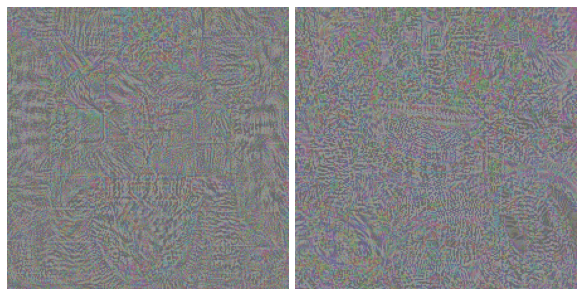

In [21]:
# show adversary
for adversary, epsilon in zip(clipped, epsilons):
    print('Epsilon value of adversary:', str(epsilon))
    fb.plot.images(adversary - images, bounds=(-0.1, 0.1), scale=4.)
    plt.show()
    plt.close()

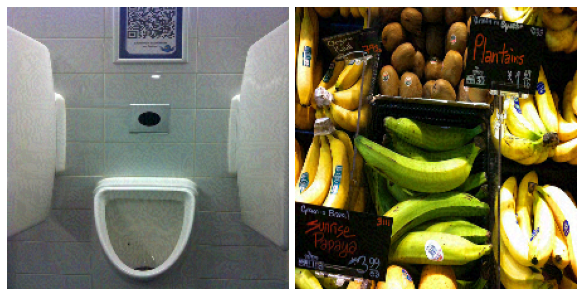

In [19]:
# show adversarial images using fb.plot
for adversary in clipped:
    fb.plot.images(adversary, scale=4.)
    plt.show()
    plt.close()

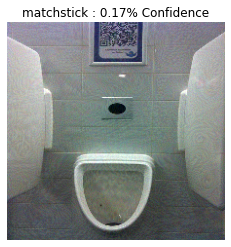

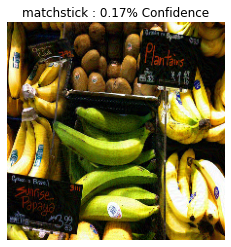

In [29]:
# helper variables for visualizing only one image
row_number = 0 # 0-len(epsilon)

raw_adversarial_images = raw[row_number].numpy()
clipped_adversarial_images = clipped[row_number].numpy()

# Predict adversarial image and show visualization
for x in clipped_adversarial_images:
    image = np.expand_dims(x, axis=0)
    image_probs = pretrained_model.predict(image)
    plt.figure()
    plt.imshow(x)  # To change [-1, 1] to [0,1] #  * 0.5 + 0.2
    _, image_class, class_confidence = get_imagenet_label(image_probs)
    plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
    plt.axis('off')
    plt.show()